In [1]:
import pdbionsurvey

In [2]:
import MDAnalysis as mda
import datreant as dtr
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
#import distributed
import json
import seaborn as sb
import scipy
import mmtf

from os import path as pth
import os
import shutil
# import peakutils
from glob import glob


from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
import seaborn as sns; sns.set()
sns.set_palette(sns.color_palette('husl'))
import mmtf
import warnings
# import pypdb

In [3]:
%matplotlib inline

In [4]:
plt.style.use('ggplot')
sns.set_style('ticks')

#table 1 in Peters paper
newcations = ['NA', 'MG', 'K', 'CA', 'CR', 'MN', 'FE', 'CO', 'NI', 'CU', 'ZN', 'PD', 'AG', 'CD', 'IR', 'PT', 'AU', 'HG']

othercations = ['LA', 'PB', 'TL', 'LI', 'BA', 'RB', 'CS', 'SR']

anions = ['CL', 'F', 'BR']

omit = ['V', 'IOD']

IONNAMES = list(set(newcations).union(set(othercations), set(anions)))

propernames = {'AG':r'Ag$^{+}$', 'AU': r'Au$^{+}$', 'BA': r'Ba$^{2+}$',
               'BR': r'Br$^{-}$', 'CA': r'Ca$^{2+}$', 'CD': r'Cd$^{2+}$',
               'CL': r'Cl$^{-}$', 'CO': r'Co$^{2+}$', 'CR': r'Cr$^{3+}$',
               'CS': r'Cs$^{+}$', 'CU': r'Cu$^{2+}$', 'FE':'Fe$^{3+}$',
               'F': r'F$^{-}$', 'HG': r'Hg$^{2+}$', 'IR': r'Ir$^{4+}$',
               'IOD': r'I$^{-}$', 'K': r'K$^{+}$', 'LA': 'La$^{3+}$',
               'LI': r'Li$^{+}$', 'MG': r'Mg$^{2+}$', 'MN': r'Mn$^{2+}$',
               'NA':r'Na$^{+}$', 'NI': r'Ni$^{2+}$', 'PB': r'Pb$^{2+}$',
               'PD': r'Pd$^{2+}$', 'PT': r'Pt$^{2+}$', 'RB': r'Rb$^{+}$',
               'SR': r'Sr$^{2+}$', 'TL': r'Tl$^{+}$', 'V': r'V$^{3+}$',
               'ZN':r'Zn$^{2+}$'}

ATOMNAMES = ['O', 'N', 'S', 'C']

sel = {'O': 'name O* and not name OS', 'N': 'name N* and not name NA and not name NE', 'S': 'name S* and not name SB', 'C': 'name C* and not name CS and not resname CA'}

oavg = 0.00853009259836284 
navg = 0.005997033324663904 
savg = 0.00024951562080447555 
cavg = 0.022547354933642145

avgdensity = {'O': oavg, 'N': navg, 'S': savg, 'C': cavg}
bulkdensity = avgdensity

In [5]:
import itertools
ionatoms = list(itertools.product(IONNAMES, ATOMNAMES))

In [6]:
# directory for the pdbs
PATH = dtr.Tree('/nfs/homes4/kreidy/Projects/pdbsurvey/')
csvpath = PATH['csvs/']
impath = PATH['images/']

# directory for the sims
# it is important that this directory is empty,
# otherwise, mislabeling may happen later
protdir = PATH['proteins/']

In [12]:
protdir.abspath

'/nfs/homes4/kreidy/Projects/pdbsurvey/proteins/'

In [13]:
# directory for DataFrames
# datapath = path['dataframes']

b = dtr.discover(protdir.abspath)

In [14]:
len(b)

77979

In [41]:
classifications = {'EC 1':'oxidoreductase','EC 2':'transferase','EC 3': 'hydrolase','EC 4':'lyase','EC 5':'isomerase','EC 6':'ligase','EC 7':'translocase'}
enzymelabels = classifications.values()
enzymelabels = [k.upper() for k in enzymelabels]

In [11]:
def functionname(tre):
    print(tre)
    pdbid=tre.name[:4]
    classification = []
    key = pypdb.describe_pdb(pdbid)['keywords']
    for label in enzymelabels:
        if label in key:
            classification.append(label)
    tre.categories['classification'] = str(classification).upper()
    tre.tags.add(str(classification).upper())
    if len(classification) > 1:
        tre.tags.add('multiple_classifications')

In [19]:
noclass=[]

In [20]:
start = 0

In [21]:
for i in range(start, len(b)):
    print(str(i), end='\r')
    try:
        functionname(b[i])
    except:
        noclass.append(b[i])
        continue
    start = i
print('Move on to g(r)s now')

/nfs/homes4/nmring/Sundial/proteins/proteins/5AMI/5AMI0
/nfs/homes4/nmring/Sundial/proteins/proteins/1Q8Y/1Q8Y0
/nfs/homes4/nmring/Sundial/proteins/proteins/4PHW/4PHW0
/nfs/homes4/nmring/Sundial/proteins/proteins/4JK4/4JK40
/nfs/homes4/nmring/Sundial/proteins/proteins/1K4G/1K4G0
/nfs/homes4/nmring/Sundial/proteins/proteins/4MMW/4MMW0
/nfs/homes4/nmring/Sundial/proteins/proteins/4U32/4U320
/nfs/homes4/nmring/Sundial/proteins/proteins/4MLZ/4MLZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/3HHD/3HHD0
/nfs/homes4/nmring/Sundial/proteins/proteins/4V3X/4V3X0
/nfs/homes4/nmring/Sundial/proteins/proteins/5VRH/5VRH0
/nfs/homes4/nmring/Sundial/proteins/proteins/4J5P/4J5P0
/nfs/homes4/nmring/Sundial/proteins/proteins/1JZ3/1JZ30
/nfs/homes4/nmring/Sundial/proteins/proteins/5K6J/5K6J0
/nfs/homes4/nmring/Sundial/proteins/proteins/3T6W/3T6W0
/nfs/homes4/nmring/Sundial/proteins/proteins/3NLZ/3NLZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/4PCW/4PCW0
/nfs/homes4/nmring/Sundial/proteins/proteins/9NS

/nfs/homes4/nmring/Sundial/proteins/proteins/3CEA/3CEA0
/nfs/homes4/nmring/Sundial/proteins/proteins/1QJY/1QJY0
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN0
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN11
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN21
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN12
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN1
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN2
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN22
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN3
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN13
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN4
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN23
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN14
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN24
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN15
/nfs/homes4/nmring/Sundial/proteins/proteins/2CTN/2CTN5
/nfs/homes4/nmring/Sundial/proteins/pro

/nfs/homes4/nmring/Sundial/proteins/proteins/4QWF/4QWF0
/nfs/homes4/nmring/Sundial/proteins/proteins/6IPP/6IPP0
/nfs/homes4/nmring/Sundial/proteins/proteins/2GX8/2GX80
/nfs/homes4/nmring/Sundial/proteins/proteins/5O2B/5O2B0
/nfs/homes4/nmring/Sundial/proteins/proteins/2VOS/2VOS0
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J0
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J10
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J1
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J2
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J11
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J12
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J3
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J13
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J4
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J5
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J14
/nfs/homes4/nmring/Sundial/proteins/proteins/1S6J/1S6J6
/nfs/homes4/nmring/Sundial/proteins/protein

/nfs/homes4/nmring/Sundial/proteins/proteins/6TZM/6TZM0
/nfs/homes4/nmring/Sundial/proteins/proteins/3SFG/3SFG0
/nfs/homes4/nmring/Sundial/proteins/proteins/5OP8/5OP80
/nfs/homes4/nmring/Sundial/proteins/proteins/2PAN/2PAN0
/nfs/homes4/nmring/Sundial/proteins/proteins/1ZW5/1ZW50
/nfs/homes4/nmring/Sundial/proteins/proteins/1XED/1XED0
/nfs/homes4/nmring/Sundial/proteins/proteins/3D4Y/3D4Y0
/nfs/homes4/nmring/Sundial/proteins/proteins/6AFJ/6AFJ0
/nfs/homes4/nmring/Sundial/proteins/proteins/5YNI/5YNI0
/nfs/homes4/nmring/Sundial/proteins/proteins/2Y4S/2Y4S0
/nfs/homes4/nmring/Sundial/proteins/proteins/1UKM/1UKM0
/nfs/homes4/nmring/Sundial/proteins/proteins/2ZK9/2ZK90
/nfs/homes4/nmring/Sundial/proteins/proteins/1QCP/1QCP0
/nfs/homes4/nmring/Sundial/proteins/proteins/1T34/1T340
/nfs/homes4/nmring/Sundial/proteins/proteins/2WDF/2WDF0
/nfs/homes4/nmring/Sundial/proteins/proteins/4UHH/4UHH0
/nfs/homes4/nmring/Sundial/proteins/proteins/2XUM/2XUM0
/nfs/homes4/nmring/Sundial/proteins/proteins/1PF

/nfs/homes4/nmring/Sundial/proteins/proteins/4MN0/4MN00
/nfs/homes4/nmring/Sundial/proteins/proteins/1J73/1J730
/nfs/homes4/nmring/Sundial/proteins/proteins/6AEK/6AEK0
/nfs/homes4/nmring/Sundial/proteins/proteins/5OYB/5OYB0
/nfs/homes4/nmring/Sundial/proteins/proteins/3B6V/3B6V0
/nfs/homes4/nmring/Sundial/proteins/proteins/4EXX/4EXX0
/nfs/homes4/nmring/Sundial/proteins/proteins/5F9Z/5F9Z0
/nfs/homes4/nmring/Sundial/proteins/proteins/2A99/2A990
/nfs/homes4/nmring/Sundial/proteins/proteins/6GE9/6GE90
/nfs/homes4/nmring/Sundial/proteins/proteins/3LAK/3LAK0
/nfs/homes4/nmring/Sundial/proteins/proteins/4M5Q/4M5Q0
/nfs/homes4/nmring/Sundial/proteins/proteins/4EM6/4EM60
/nfs/homes4/nmring/Sundial/proteins/proteins/6EMH/6EMH0
/nfs/homes4/nmring/Sundial/proteins/proteins/3FG3/3FG30
/nfs/homes4/nmring/Sundial/proteins/proteins/4YGN/4YGN0
/nfs/homes4/nmring/Sundial/proteins/proteins/6NCY/6NCY0
/nfs/homes4/nmring/Sundial/proteins/proteins/2YDE/2YDE0
/nfs/homes4/nmring/Sundial/proteins/proteins/6HS

/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A7
/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A19
/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A8
/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A3
/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A9
/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A10
/nfs/homes4/nmring/Sundial/proteins/proteins/1E0A/1E0A11
/nfs/homes4/nmring/Sundial/proteins/proteins/4C8D/4C8D0
/nfs/homes4/nmring/Sundial/proteins/proteins/6I98/6I980
/nfs/homes4/nmring/Sundial/proteins/proteins/2WIF/2WIF0
/nfs/homes4/nmring/Sundial/proteins/proteins/5DZX/5DZX0
/nfs/homes4/nmring/Sundial/proteins/proteins/2OD7/2OD70
/nfs/homes4/nmring/Sundial/proteins/proteins/1CXX/1CXX0
/nfs/homes4/nmring/Sundial/proteins/proteins/5USP/5USP0
/nfs/homes4/nmring/Sundial/proteins/proteins/5EE9/5EE90
/nfs/homes4/nmring/Sundial/proteins/proteins/1GYW/1GYW0
/nfs/homes4/nmring/Sundial/proteins/proteins/3EUL/3EUL0
/nfs/homes4/nmring/Sundial/proteins/proteins/

/nfs/homes4/nmring/Sundial/proteins/proteins/5ICU/5ICU0
/nfs/homes4/nmring/Sundial/proteins/proteins/4ZHA/4ZHA0
/nfs/homes4/nmring/Sundial/proteins/proteins/4JLZ/4JLZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/4ABZ/4ABZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/3TQD/3TQD0
/nfs/homes4/nmring/Sundial/proteins/proteins/2VDR/2VDR0
/nfs/homes4/nmring/Sundial/proteins/proteins/4RWY/4RWY0
/nfs/homes4/nmring/Sundial/proteins/proteins/6FIY/6FIY0
/nfs/homes4/nmring/Sundial/proteins/proteins/3U6X/3U6X0
/nfs/homes4/nmring/Sundial/proteins/proteins/3OHM/3OHM0
/nfs/homes4/nmring/Sundial/proteins/proteins/4N38/4N380
/nfs/homes4/nmring/Sundial/proteins/proteins/6OIM/6OIM0
/nfs/homes4/nmring/Sundial/proteins/proteins/1ASQ/1ASQ0
/nfs/homes4/nmring/Sundial/proteins/proteins/3TZB/3TZB0
/nfs/homes4/nmring/Sundial/proteins/proteins/1UER/1UER0
/nfs/homes4/nmring/Sundial/proteins/proteins/6FCW/6FCW0
/nfs/homes4/nmring/Sundial/proteins/proteins/5DQY/5DQY0
/nfs/homes4/nmring/Sundial/proteins/proteins/3NH

/nfs/homes4/nmring/Sundial/proteins/proteins/186L/186L0
/nfs/homes4/nmring/Sundial/proteins/proteins/4ZMN/4ZMN0
/nfs/homes4/nmring/Sundial/proteins/proteins/5DKA/5DKA0
/nfs/homes4/nmring/Sundial/proteins/proteins/4MPJ/4MPJ0
/nfs/homes4/nmring/Sundial/proteins/proteins/3G37/3G370
/nfs/homes4/nmring/Sundial/proteins/proteins/4QUI/4QUI0
/nfs/homes4/nmring/Sundial/proteins/proteins/1BAG/1BAG0
/nfs/homes4/nmring/Sundial/proteins/proteins/1ZMR/1ZMR0
/nfs/homes4/nmring/Sundial/proteins/proteins/2GVW/2GVW0
/nfs/homes4/nmring/Sundial/proteins/proteins/4Y10/4Y100
/nfs/homes4/nmring/Sundial/proteins/proteins/3HJT/3HJT0
/nfs/homes4/nmring/Sundial/proteins/proteins/1HR9/1HR90
/nfs/homes4/nmring/Sundial/proteins/proteins/4NAA/4NAA0
/nfs/homes4/nmring/Sundial/proteins/proteins/2HT4/2HT40
/nfs/homes4/nmring/Sundial/proteins/proteins/5ECC/5ECC0
/nfs/homes4/nmring/Sundial/proteins/proteins/4N9M/4N9M0
/nfs/homes4/nmring/Sundial/proteins/proteins/5B0H/5B0H0
/nfs/homes4/nmring/Sundial/proteins/proteins/3ZM

/nfs/homes4/nmring/Sundial/proteins/proteins/4RJ9/4RJ90
/nfs/homes4/nmring/Sundial/proteins/proteins/2VCA/2VCA0
/nfs/homes4/nmring/Sundial/proteins/proteins/3MOZ/3MOZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/4I1S/4I1S0
/nfs/homes4/nmring/Sundial/proteins/proteins/3CM6/3CM60
/nfs/homes4/nmring/Sundial/proteins/proteins/4DHT/4DHT0
/nfs/homes4/nmring/Sundial/proteins/proteins/3PS2/3PS20
/nfs/homes4/nmring/Sundial/proteins/proteins/6NZG/6NZG0
/nfs/homes4/nmring/Sundial/proteins/proteins/6G3R/6G3R0
/nfs/homes4/nmring/Sundial/proteins/proteins/2J3D/2J3D0
/nfs/homes4/nmring/Sundial/proteins/proteins/2QS2/2QS20
/nfs/homes4/nmring/Sundial/proteins/proteins/3GFH/3GFH0
/nfs/homes4/nmring/Sundial/proteins/proteins/6DHM/6DHM0
/nfs/homes4/nmring/Sundial/proteins/proteins/3RM1/3RM10
/nfs/homes4/nmring/Sundial/proteins/proteins/6NWH/6NWH0
/nfs/homes4/nmring/Sundial/proteins/proteins/3N9D/3N9D0
/nfs/homes4/nmring/Sundial/proteins/proteins/5PST/5PST0
/nfs/homes4/nmring/Sundial/proteins/proteins/4DZ

/nfs/homes4/nmring/Sundial/proteins/proteins/2N9P/2N9P6
/nfs/homes4/nmring/Sundial/proteins/proteins/2N9P/2N9P7
/nfs/homes4/nmring/Sundial/proteins/proteins/2N9P/2N9P13
/nfs/homes4/nmring/Sundial/proteins/proteins/6JDE/6JDE0
/nfs/homes4/nmring/Sundial/proteins/proteins/5MVR/5MVR0
/nfs/homes4/nmring/Sundial/proteins/proteins/2VHF/2VHF0
/nfs/homes4/nmring/Sundial/proteins/proteins/4JBR/4JBR0
/nfs/homes4/nmring/Sundial/proteins/proteins/2BTC/2BTC0
/nfs/homes4/nmring/Sundial/proteins/proteins/1AYM/1AYM0
/nfs/homes4/nmring/Sundial/proteins/proteins/3P65/3P650
/nfs/homes4/nmring/Sundial/proteins/proteins/1JEC/1JEC0
/nfs/homes4/nmring/Sundial/proteins/proteins/5FGH/5FGH0
/nfs/homes4/nmring/Sundial/proteins/proteins/2WAW/2WAW0
/nfs/homes4/nmring/Sundial/proteins/proteins/5CYO/5CYO0
/nfs/homes4/nmring/Sundial/proteins/proteins/3U3A/3U3A0
/nfs/homes4/nmring/Sundial/proteins/proteins/3OM5/3OM50
/nfs/homes4/nmring/Sundial/proteins/proteins/5Y1V/5Y1V0
/nfs/homes4/nmring/Sundial/proteins/proteins/3D

/nfs/homes4/nmring/Sundial/proteins/proteins/6KDZ/6KDZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/2DOQ/2DOQ0
/nfs/homes4/nmring/Sundial/proteins/proteins/6CUG/6CUG0
/nfs/homes4/nmring/Sundial/proteins/proteins/3ZR6/3ZR60
/nfs/homes4/nmring/Sundial/proteins/proteins/6G5W/6G5W0
/nfs/homes4/nmring/Sundial/proteins/proteins/5EY5/5EY50
/nfs/homes4/nmring/Sundial/proteins/proteins/2XCE/2XCE0
/nfs/homes4/nmring/Sundial/proteins/proteins/4KES/4KES0
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT40
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT41
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT42
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT43
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT44
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT45
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT46
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT47
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT4/1OT48
/nfs/homes4/nmring/Sundial/proteins/proteins/1OT

/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP4
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP12
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP19
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP5
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP13
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP6
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP14
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP7
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP8
/nfs/homes4/nmring/Sundial/proteins/proteins/6AGP/6AGP15
/nfs/homes4/nmring/Sundial/proteins/proteins/1MC3/1MC30
/nfs/homes4/nmring/Sundial/proteins/proteins/2BD5/2BD50
/nfs/homes4/nmring/Sundial/proteins/proteins/4TPG/4TPG0
/nfs/homes4/nmring/Sundial/proteins/proteins/4K1C/4K1C0
/nfs/homes4/nmring/Sundial/proteins/proteins/5POZ/5POZ0
/nfs/homes4/nmring/Sundial/proteins/proteins/2Z08/2Z080
/nfs/homes4/nmring/Sundial/proteins/proteins/4M0L/4M0L0
/nfs/homes4/nmring/Sundial/proteins/protein

/nfs/homes4/nmring/Sundial/proteins/5LT7/5LT70
/nfs/homes4/nmring/Sundial/proteins/5XGW/5XGW0
/nfs/homes4/nmring/Sundial/proteins/5L5O/5L5O0
/nfs/homes4/nmring/Sundial/proteins/5PWF/5PWF0
/nfs/homes4/nmring/Sundial/proteins/6N25/6N250
/nfs/homes4/nmring/Sundial/proteins/6MQ1/6MQ10
/nfs/homes4/nmring/Sundial/proteins/6PC1/6PC10
/nfs/homes4/nmring/Sundial/proteins/3TTQ/3TTQ0
/nfs/homes4/nmring/Sundial/proteins/3N62/3N620
/nfs/homes4/nmring/Sundial/proteins/2VLH/2VLH0
/nfs/homes4/nmring/Sundial/proteins/4AF1/4AF10
/nfs/homes4/nmring/Sundial/proteins/3RFQ/3RFQ0
/nfs/homes4/nmring/Sundial/proteins/2HED/2HED0
/nfs/homes4/nmring/Sundial/proteins/2UWD/2UWD0
/nfs/homes4/nmring/Sundial/proteins/4F6E/4F6E0
/nfs/homes4/nmring/Sundial/proteins/3NHU/3NHU0
/nfs/homes4/nmring/Sundial/proteins/3IVB/3IVB0
/nfs/homes4/nmring/Sundial/proteins/5G4E/5G4E0
/nfs/homes4/nmring/Sundial/proteins/3Q78/3Q780
/nfs/homes4/nmring/Sundial/proteins/3NVO/3NVO0
/nfs/homes4/nmring/Sundial/proteins/3I0G/3I0G0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5C9X/5C9X0
/nfs/homes4/nmring/Sundial/proteins/3MA9/3MA90
/nfs/homes4/nmring/Sundial/proteins/3SYQ/3SYQ0
/nfs/homes4/nmring/Sundial/proteins/4K6W/4K6W0
/nfs/homes4/nmring/Sundial/proteins/830C/830C0
/nfs/homes4/nmring/Sundial/proteins/1PZA/1PZA0
/nfs/homes4/nmring/Sundial/proteins/2JBA/2JBA0
/nfs/homes4/nmring/Sundial/proteins/3DSS/3DSS0
/nfs/homes4/nmring/Sundial/proteins/4QWF/4QWF0
/nfs/homes4/nmring/Sundial/proteins/6IPP/6IPP0
/nfs/homes4/nmring/Sundial/proteins/2GX8/2GX80
/nfs/homes4/nmring/Sundial/proteins/5O2B/5O2B0
/nfs/homes4/nmring/Sundial/proteins/2VOS/2VOS0
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J0
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J10
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J1
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J2
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J11
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J12
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J3
/nfs/homes4/nmring/Sundial/proteins/1S6J/1S6J13
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/5ZCL/5ZCL0
/nfs/homes4/nmring/Sundial/proteins/2AFH/2AFH0
/nfs/homes4/nmring/Sundial/proteins/6UQF/6UQF0
/nfs/homes4/nmring/Sundial/proteins/2A25/2A250
/nfs/homes4/nmring/Sundial/proteins/4U3W/4U3W0
/nfs/homes4/nmring/Sundial/proteins/4MX6/4MX60
/nfs/homes4/nmring/Sundial/proteins/1BL8/1BL80
/nfs/homes4/nmring/Sundial/proteins/1VZT/1VZT0
/nfs/homes4/nmring/Sundial/proteins/2EQA/2EQA0
/nfs/homes4/nmring/Sundial/proteins/4E2O/4E2O0
/nfs/homes4/nmring/Sundial/proteins/1ROC/1ROC0
/nfs/homes4/nmring/Sundial/proteins/1PNM/1PNM0
/nfs/homes4/nmring/Sundial/proteins/1RAG/1RAG0
/nfs/homes4/nmring/Sundial/proteins/2R75/2R750
/nfs/homes4/nmring/Sundial/proteins/4D3O/4D3O0
/nfs/homes4/nmring/Sundial/proteins/1W5P/1W5P0
/nfs/homes4/nmring/Sundial/proteins/5YFS/5YFS0
/nfs/homes4/nmring/Sundial/proteins/3G13/3G130
/nfs/homes4/nmring/Sundial/proteins/4QKZ/4QKZ0
/nfs/homes4/nmring/Sundial/proteins/5UQF/5UQF0
/nfs/homes4/nmring/Sundial/proteins/5B48/5B480
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5DDY/5DDY0
/nfs/homes4/nmring/Sundial/proteins/6S08/6S080
/nfs/homes4/nmring/Sundial/proteins/4HWR/4HWR0
/nfs/homes4/nmring/Sundial/proteins/5I7U/5I7U0
/nfs/homes4/nmring/Sundial/proteins/1CX7/1CX70
/nfs/homes4/nmring/Sundial/proteins/3CWY/3CWY0
/nfs/homes4/nmring/Sundial/proteins/3NDT/3NDT0
/nfs/homes4/nmring/Sundial/proteins/5TPW/5TPW0
/nfs/homes4/nmring/Sundial/proteins/6G00/6G000
/nfs/homes4/nmring/Sundial/proteins/5PK2/5PK20
/nfs/homes4/nmring/Sundial/proteins/1JCA/1JCA0
/nfs/homes4/nmring/Sundial/proteins/2PAR/2PAR0
/nfs/homes4/nmring/Sundial/proteins/1HMW/1HMW0
/nfs/homes4/nmring/Sundial/proteins/3HYL/3HYL0
/nfs/homes4/nmring/Sundial/proteins/6O5M/6O5M0
/nfs/homes4/nmring/Sundial/proteins/3PVB/3PVB0
/nfs/homes4/nmring/Sundial/proteins/3SY8/3SY80
/nfs/homes4/nmring/Sundial/proteins/3HJ7/3HJ70
/nfs/homes4/nmring/Sundial/proteins/4IG6/4IG60
/nfs/homes4/nmring/Sundial/proteins/2BQC/2BQC0
/nfs/homes4/nmring/Sundial/proteins/6TAP/6TAP0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEV/2DEV0
/nfs/homes4/nmring/Sundial/proteins/5PM2/5PM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WNO/1WNO0
/nfs/homes4/nmring/Sundial/proteins/6Q30/6Q300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GBY/1GBY0
/nfs/homes4/nmring/Sundial/proteins/3QSR/3QSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NLQ/4NLQ0
/nfs/homes4/nmring/Sundial/proteins/4NM5/4NM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q66/4Q660
/nfs/homes4/nmring/Sundial/proteins/3T8J/3T8J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IYT/2IYT0
/nfs/homes4/nmring/Sundial/proteins/2ZEE/2ZEE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P59/6P590
/nfs/homes4/nmring/Sundial/proteins/5HZR/5HZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LTE/5LTE0
/nfs/homes4/nmring/Sundial/proteins/6M8Y/6M8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WFM/5WFM0
/nfs/homes4/nmring/Sundial/proteins/4UE7/4UE70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I3L/5I3L0
/nfs/homes4/nmring/Sundial/proteins/6GL0/6GL00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DMU/5DMU0
/nfs/homes4/nmring/Sundial/proteins/3PPI/3PPI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HPM/2HPM0
/nfs/homes4/nmring/Sundial/proteins/3R3Z/3R3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IRZ/4IRZ0
/nfs/homes4/nmring/Sundial/proteins/5JSY/5JSY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T0Q/1T0Q0
/nfs/homes4/nmring/Sundial/proteins/3IJL/3IJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VTK/5VTK0
/nfs/homes4/nmring/Sundial/proteins/5J54/5J540


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TOI/4TOI0
/nfs/homes4/nmring/Sundial/proteins/1OEB/1OEB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G87/1G870
/nfs/homes4/nmring/Sundial/proteins/3BMV/3BMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IFX/3IFX0
/nfs/homes4/nmring/Sundial/proteins/5XMV/5XMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VFZ/5VFZ0
/nfs/homes4/nmring/Sundial/proteins/3RLZ/3RLZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RR1/4RR10
/nfs/homes4/nmring/Sundial/proteins/4BVT/4BVT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M48/3M480
/nfs/homes4/nmring/Sundial/proteins/1QRE/1QRE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QBS/4QBS0
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A0
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A13
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A4
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A1
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A17
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A6
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A7
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A8
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A9
/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E0A/1E0A11
/nfs/homes4/nmring/Sundial/proteins/4C8D/4C8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I98/6I980
/nfs/homes4/nmring/Sundial/proteins/2WIF/2WIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DZX/5DZX0
/nfs/homes4/nmring/Sundial/proteins/2OD7/2OD70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CXX/1CXX0
/nfs/homes4/nmring/Sundial/proteins/5USP/5USP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EE9/5EE90
/nfs/homes4/nmring/Sundial/proteins/1GYW/1GYW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EUL/3EUL0
/nfs/homes4/nmring/Sundial/proteins/4MHY/4MHY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DS9/6DS90
/nfs/homes4/nmring/Sundial/proteins/5C68/5C680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GXB/1GXB0
/nfs/homes4/nmring/Sundial/proteins/6RZ5/6RZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H3K/3H3K0
/nfs/homes4/nmring/Sundial/proteins/2W86/2W860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y66/2Y660
/nfs/homes4/nmring/Sundial/proteins/3GWW/3GWW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HB4/2HB40
/nfs/homes4/nmring/Sundial/proteins/1OJR/1OJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I0D/4I0D0
/nfs/homes4/nmring/Sundial/proteins/4BJH/4BJH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OX6/5OX60
/nfs/homes4/nmring/Sundial/proteins/5YM3/5YM30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H74/1H740
/nfs/homes4/nmring/Sundial/proteins/6PPW/6PPW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XPH/1XPH0
/nfs/homes4/nmring/Sundial/proteins/4A6A/4A6A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HV5/1HV50
/nfs/homes4/nmring/Sundial/proteins/3E6U/3E6U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FPU/6FPU0
/nfs/homes4/nmring/Sundial/proteins/4KKI/4KKI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PJY/4PJY0
/nfs/homes4/nmring/Sundial/proteins/3W1V/3W1V0
/nfs/homes4/nmring/Sundial/proteins/4JH7/4JH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NIQ/1NIQ0
/nfs/homes4/nmring/Sundial/proteins/4W5A/4W5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PDA/2PDA0
/nfs/homes4/nmring/Sundial/proteins/4BDS/4BDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1INO/1INO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OED/5OED0
/nfs/homes4/nmring/Sundial/proteins/3F5R/3F5R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XRF/2XRF0
/nfs/homes4/nmring/Sundial/proteins/3RJA/3RJA0
/nfs/homes4/nmring/Sundial/proteins/3MNS/3MNS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q8P/4Q8P0
/nfs/homes4/nmring/Sundial/proteins/2A3Y/2A3Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4N/1P4N0
/nfs/homes4/nmring/Sundial/proteins/3PG0/3PG00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ETK/4ETK0
/nfs/homes4/nmring/Sundial/proteins/2BD4/2BD40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W8Q/1W8Q0
/nfs/homes4/nmring/Sundial/proteins/1YL6/1YL60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E31/4E310
/nfs/homes4/nmring/Sundial/proteins/4YGB/4YGB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OY2/2OY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FNH/5FNH0
/nfs/homes4/nmring/Sundial/proteins/5PAK/5PAK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D9J/5D9J0
/nfs/homes4/nmring/Sundial/proteins/2IK2/2IK20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QJI/1QJI0
/nfs/homes4/nmring/Sundial/proteins/1BT8/1BT80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UUA/4UUA0
/nfs/homes4/nmring/Sundial/proteins/1RJP/1RJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6T8E/6T8E0
/nfs/homes4/nmring/Sundial/proteins/5Y23/5Y230


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMP/1SMP0
/nfs/homes4/nmring/Sundial/proteins/1CU0/1CU00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IP0/3IP00
/nfs/homes4/nmring/Sundial/proteins/6I8L/6I8L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TJL/3TJL0
/nfs/homes4/nmring/Sundial/proteins/3EB9/3EB90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WR2/5WR20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IYK/4IYK0
/nfs/homes4/nmring/Sundial/proteins/2E25/2E250
/nfs/homes4/nmring/Sundial/proteins/5UNZ/5UNZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XIB/4XIB0
/nfs/homes4/nmring/Sundial/proteins/3QN1/3QN10
/nfs/homes4/nmring/Sundial/proteins/6R32/6R320


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AJX/6AJX0
/nfs/homes4/nmring/Sundial/proteins/3WH2/3WH20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JZK/5JZK0
/nfs/homes4/nmring/Sundial/proteins/5GIB/5GIB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TGO/3TGO0
/nfs/homes4/nmring/Sundial/proteins/2WMO/2WMO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UIN/5UIN0
/nfs/homes4/nmring/Sundial/proteins/2EV4/2EV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N7Z/6N7Z0
/nfs/homes4/nmring/Sundial/proteins/5X7O/5X7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A6I/6A6I0
/nfs/homes4/nmring/Sundial/proteins/4QPE/4QPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PWG/4PWG0
/nfs/homes4/nmring/Sundial/proteins/6HG2/6HG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HMY/6HMY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GRU/4GRU0
/nfs/homes4/nmring/Sundial/proteins/1HBO/1HBO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AK9/1AK90
/nfs/homes4/nmring/Sundial/proteins/1G0Q/1G0Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MMZ/6MMZ0
/nfs/homes4/nmring/Sundial/proteins/1C07/1C070


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C0715
/nfs/homes4/nmring/Sundial/proteins/1C07/1C071


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C0716
/nfs/homes4/nmring/Sundial/proteins/1C07/1C078


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C0717
/nfs/homes4/nmring/Sundial/proteins/1C07/1C0718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C079
/nfs/homes4/nmring/Sundial/proteins/1C07/1C072


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C0719
/nfs/homes4/nmring/Sundial/proteins/1C07/1C073


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C0710
/nfs/homes4/nmring/Sundial/proteins/1C07/1C0711


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C074
/nfs/homes4/nmring/Sundial/proteins/1C07/1C0712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C075
/nfs/homes4/nmring/Sundial/proteins/1C07/1C0713


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C076
/nfs/homes4/nmring/Sundial/proteins/1C07/1C0714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C07/1C077
/nfs/homes4/nmring/Sundial/proteins/4XYP/4XYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QBM/2QBM0
/nfs/homes4/nmring/Sundial/proteins/1AFA/1AFA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IG1/3IG10
/nfs/homes4/nmring/Sundial/proteins/3M12/3M120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U2Y/1U2Y0
/nfs/homes4/nmring/Sundial/proteins/3OO1/3OO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PNH/3PNH0
/nfs/homes4/nmring/Sundial/proteins/1VIZ/1VIZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EIX/2EIX0
/nfs/homes4/nmring/Sundial/proteins/5UUC/5UUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LJE/5LJE0
/nfs/homes4/nmring/Sundial/proteins/5M1E/5M1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X4K/2X4K0
/nfs/homes4/nmring/Sundial/proteins/4GRR/4GRR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JZF/4JZF0
/nfs/homes4/nmring/Sundial/proteins/4GYF/4GYF0
/nfs/homes4/nmring/Sundial/proteins/2QUM/2QUM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q7Z/5Q7Z0
/nfs/homes4/nmring/Sundial/proteins/5JVL/5JVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ICU/5ICU0
/nfs/homes4/nmring/Sundial/proteins/4ZHA/4ZHA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JLZ/4JLZ0
/nfs/homes4/nmring/Sundial/proteins/4ABZ/4ABZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TQD/3TQD0
/nfs/homes4/nmring/Sundial/proteins/2VDR/2VDR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RWY/4RWY0
/nfs/homes4/nmring/Sundial/proteins/6FIY/6FIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U6X/3U6X0
/nfs/homes4/nmring/Sundial/proteins/3OHM/3OHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N38/4N380
/nfs/homes4/nmring/Sundial/proteins/6OIM/6OIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ASQ/1ASQ0
/nfs/homes4/nmring/Sundial/proteins/3TZB/3TZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UER/1UER0
/nfs/homes4/nmring/Sundial/proteins/6FCW/6FCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DQY/5DQY0
/nfs/homes4/nmring/Sundial/proteins/3NHR/3NHR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B3H/5B3H0
/nfs/homes4/nmring/Sundial/proteins/3VJA/3VJA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G5U/1G5U0
/nfs/homes4/nmring/Sundial/proteins/2UU8/2UU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D0X/1D0X0
/nfs/homes4/nmring/Sundial/proteins/1C0R/1C0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSW/5PSW0
/nfs/homes4/nmring/Sundial/proteins/6FVY/6FVY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q8Z/5Q8Z0
/nfs/homes4/nmring/Sundial/proteins/6D5Q/6D5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RDK/3RDK0
/nfs/homes4/nmring/Sundial/proteins/4ZOJ/4ZOJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RKD/2RKD0
/nfs/homes4/nmring/Sundial/proteins/4GVX/4GVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NHJ/3NHJ0
/nfs/homes4/nmring/Sundial/proteins/2DQZ/2DQZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LYF/1LYF0
/nfs/homes4/nmring/Sundial/proteins/3PX1/3PX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OOS/5OOS0
/nfs/homes4/nmring/Sundial/proteins/1B8R/1B8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FBF/3FBF0
/nfs/homes4/nmring/Sundial/proteins/4YA5/4YA50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DIE/1DIE0
/nfs/homes4/nmring/Sundial/proteins/5M2X/5M2X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CDR/6CDR0
/nfs/homes4/nmring/Sundial/proteins/4IB2/4IB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IPW/1IPW0
/nfs/homes4/nmring/Sundial/proteins/6I0R/6I0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MU7/4MU70
/nfs/homes4/nmring/Sundial/proteins/4ZOL/4ZOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FFC/5FFC0
/nfs/homes4/nmring/Sundial/proteins/2BQJ/2BQJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF0
/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF3
/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF5
/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF7
/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRF/5FRF9
/nfs/homes4/nmring/Sundial/proteins/1GL1/1GL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TDJ/3TDJ0
/nfs/homes4/nmring/Sundial/proteins/6H0W/6H0W0
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC14
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC15
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC2
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC18
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC19
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC5
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC7
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC10
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC12
/nfs/homes4/nmring/Sundial/proteins/2YRC/2YRC13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MDZ/4MDZ0
/nfs/homes4/nmring/Sundial/proteins/3C7Y/3C7Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TB7/5TB70
/nfs/homes4/nmring/Sundial/proteins/5LFL/5LFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HZL/2HZL0
/nfs/homes4/nmring/Sundial/proteins/3G86/3G860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R6G/4R6G0
/nfs/homes4/nmring/Sundial/proteins/4R37/4R370


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IUF/2IUF0
/nfs/homes4/nmring/Sundial/proteins/3L4O/3L4O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H6O/5H6O0
/nfs/homes4/nmring/Sundial/proteins/5PUA/5PUA0
/nfs/homes4/nmring/Sundial/proteins/5KDS/5KDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z6Q/5Z6Q0
/nfs/homes4/nmring/Sundial/proteins/4CLT/4CLT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D1L/6D1L0
/nfs/homes4/nmring/Sundial/proteins/3MQD/3MQD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FNJ/5FNJ0
/nfs/homes4/nmring/Sundial/proteins/3GFX/3GFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HR5/2HR50
/nfs/homes4/nmring/Sundial/proteins/6GXE/6GXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GVV/5GVV0
/nfs/homes4/nmring/Sundial/proteins/3D7H/3D7H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WEF/2WEF0
/nfs/homes4/nmring/Sundial/proteins/5L31/5L310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q95/3Q950
/nfs/homes4/nmring/Sundial/proteins/4ACF/4ACF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2H15/2H150
/nfs/homes4/nmring/Sundial/proteins/5KNR/5KNR0
/nfs/homes4/nmring/Sundial/proteins/2RIE/2RIE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P0Y/6P0Y0
/nfs/homes4/nmring/Sundial/proteins/5Z85/5Z850


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JJJ/4JJJ0
/nfs/homes4/nmring/Sundial/proteins/1AJQ/1AJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HRZ/3HRZ0
/nfs/homes4/nmring/Sundial/proteins/2AU9/2AU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WY4/3WY40
/nfs/homes4/nmring/Sundial/proteins/5JYY/5JYY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RIV/3RIV0
/nfs/homes4/nmring/Sundial/proteins/6R85/6R850


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TN5/3TN50
/nfs/homes4/nmring/Sundial/proteins/4LGD/4LGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WD7/4WD70
/nfs/homes4/nmring/Sundial/proteins/4HT0/4HT00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GY9/1GY90
/nfs/homes4/nmring/Sundial/proteins/5FBT/5FBT0
/nfs/homes4/nmring/Sundial/proteins/1DYC/1DYC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GRC/4GRC0
/nfs/homes4/nmring/Sundial/proteins/1O9C/1O9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NKV/3NKV0
/nfs/homes4/nmring/Sundial/proteins/3C9A/3C9A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AKW/2AKW0
/nfs/homes4/nmring/Sundial/proteins/5IHP/5IHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PAA/5PAA0
/nfs/homes4/nmring/Sundial/proteins/6JHH/6JHH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N5G/5N5G0
/nfs/homes4/nmring/Sundial/proteins/1I9D/1I9D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F3Z/2F3Z0
/nfs/homes4/nmring/Sundial/proteins/4I69/4I690


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ET4/6ET40
/nfs/homes4/nmring/Sundial/proteins/5M5A/5M5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DR1/1DR10
/nfs/homes4/nmring/Sundial/proteins/3KVB/3KVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CDM/1CDM0
/nfs/homes4/nmring/Sundial/proteins/186L/186L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZMN/4ZMN0
/nfs/homes4/nmring/Sundial/proteins/5DKA/5DKA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MPJ/4MPJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G37/3G370
/nfs/homes4/nmring/Sundial/proteins/4QUI/4QUI0
/nfs/homes4/nmring/Sundial/proteins/1BAG/1BAG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZMR/1ZMR0
/nfs/homes4/nmring/Sundial/proteins/2GVW/2GVW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y10/4Y100
/nfs/homes4/nmring/Sundial/proteins/3HJT/3HJT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HR9/1HR90
/nfs/homes4/nmring/Sundial/proteins/4NAA/4NAA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HT4/2HT40
/nfs/homes4/nmring/Sundial/proteins/5ECC/5ECC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N9M/4N9M0
/nfs/homes4/nmring/Sundial/proteins/5B0H/5B0H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZMC/3ZMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W7D/4W7D0
/nfs/homes4/nmring/Sundial/proteins/5K5S/5K5S0
/nfs/homes4/nmring/Sundial/proteins/6NRU/6NRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D0F/4D0F0
/nfs/homes4/nmring/Sundial/proteins/1YMV/1YMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC0
/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC3
/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC5
/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC7
/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXC/2JXC9
/nfs/homes4/nmring/Sundial/proteins/5P9V/5P9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DYG/4DYG0
/nfs/homes4/nmring/Sundial/proteins/5MXY/5MXY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NC1/6NC10
/nfs/homes4/nmring/Sundial/proteins/1WSP/1WSP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EVC/5EVC0
/nfs/homes4/nmring/Sundial/proteins/3SIY/3SIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z56/2Z560
/nfs/homes4/nmring/Sundial/proteins/4ZUN/4ZUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HMZ/5HMZ0
/nfs/homes4/nmring/Sundial/proteins/5L3G/5L3G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CWZ/6CWZ0
/nfs/homes4/nmring/Sundial/proteins/3FUE/3FUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM0
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM2
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM4
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM6
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM8
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM10
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM12
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM14
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM16
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM18
/nfs/homes4/nmring/Sundial/proteins/2EMM/2EMM19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XD4/4XD40
/nfs/homes4/nmring/Sundial/proteins/1BEX/1BEX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C2O/6C2O0
/nfs/homes4/nmring/Sundial/proteins/4UAU/4UAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NRQ/3NRQ0
/nfs/homes4/nmring/Sundial/proteins/3X2F/3X2F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XVD/5XVD0
/nfs/homes4/nmring/Sundial/proteins/1KC3/1KC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BTX/4BTX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DT8/4DT80
/nfs/homes4/nmring/Sundial/proteins/3OIR/3OIR0
/nfs/homes4/nmring/Sundial/proteins/2WCK/2WCK0
/nfs/homes4/nmring/Sundial/proteins/4QCA/4QCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q3I/5Q3I0
/nfs/homes4/nmring/Sundial/proteins/4D3W/4D3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T0P/1T0P0
/nfs/homes4/nmring/Sundial/proteins/4KMN/4KMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HZ1/6HZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ANG/6ANG0
/nfs/homes4/nmring/Sundial/proteins/6HQU/6HQU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WVM/1WVM0
/nfs/homes4/nmring/Sundial/proteins/1SED/1SED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O3P/3O3P0
/nfs/homes4/nmring/Sundial/proteins/6TMN/6TMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FZ2/1FZ20
/nfs/homes4/nmring/Sundial/proteins/5VNF/5VNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XVL/2XVL0
/nfs/homes4/nmring/Sundial/proteins/4YNC/4YNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CPU/4CPU0
/nfs/homes4/nmring/Sundial/proteins/5UV5/5UV50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FPA/5FPA0
/nfs/homes4/nmring/Sundial/proteins/6HV3/6HV30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ0
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ16
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ7
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ2
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ9
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ19
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ10
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ12
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ3
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ14
/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFJ/3ZFJ5
/nfs/homes4/nmring/Sundial/proteins/3OP2/3OP20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S07/1S070
/nfs/homes4/nmring/Sundial/proteins/6D1I/6D1I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RAC/3RAC0
/nfs/homes4/nmring/Sundial/proteins/2Y27/2Y270


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X8I/1X8I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L22/3L220
/nfs/homes4/nmring/Sundial/proteins/6IRD/6IRD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D2J/6D2J0
/nfs/homes4/nmring/Sundial/proteins/3K3E/3K3E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XC0/4XC00
/nfs/homes4/nmring/Sundial/proteins/3FCC/3FCC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C1M/3C1M0
/nfs/homes4/nmring/Sundial/proteins/5TSG/5TSG0
/nfs/homes4/nmring/Sundial/proteins/6APV/6APV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QBU/3QBU0
/nfs/homes4/nmring/Sundial/proteins/6DNS/6DNS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FF1/5FF10
/nfs/homes4/nmring/Sundial/proteins/6SH1/6SH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QFS/4QFS0
/nfs/homes4/nmring/Sundial/proteins/4ZW3/4ZW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4A/1E4A0
/nfs/homes4/nmring/Sundial/proteins/4H88/4H880


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YCB/2YCB0
/nfs/homes4/nmring/Sundial/proteins/3CNG/3CNG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WDZ/2WDZ0
/nfs/homes4/nmring/Sundial/proteins/4ZFR/4ZFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XOQ/1XOQ0
/nfs/homes4/nmring/Sundial/proteins/3W44/3W440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RJ9/4RJ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VCA/2VCA0
/nfs/homes4/nmring/Sundial/proteins/3MOZ/3MOZ0
/nfs/homes4/nmring/Sundial/proteins/4I1S/4I1S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CM6/3CM60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DHT/4DHT0
/nfs/homes4/nmring/Sundial/proteins/3PS2/3PS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NZG/6NZG0
/nfs/homes4/nmring/Sundial/proteins/6G3R/6G3R0
/nfs/homes4/nmring/Sundial/proteins/2J3D/2J3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QS2/2QS20
/nfs/homes4/nmring/Sundial/proteins/3GFH/3GFH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DHM/6DHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RM1/3RM10
/nfs/homes4/nmring/Sundial/proteins/6NWH/6NWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N9D/3N9D0
/nfs/homes4/nmring/Sundial/proteins/5PST/5PST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DZ7/4DZ70
/nfs/homes4/nmring/Sundial/proteins/4XKY/4XKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ODU/5ODU0
/nfs/homes4/nmring/Sundial/proteins/5CSR/5CSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HYA/5HYA0
/nfs/homes4/nmring/Sundial/proteins/4NFV/4NFV0
/nfs/homes4/nmring/Sundial/proteins/1J1A/1J1A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JER/1JER0
/nfs/homes4/nmring/Sundial/proteins/5OAS/5OAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HPR/6HPR0
/nfs/homes4/nmring/Sundial/proteins/1G0C/1G0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LZ7/4LZ70
/nfs/homes4/nmring/Sundial/proteins/3C8Q/3C8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PO8/5PO80
/nfs/homes4/nmring/Sundial/proteins/2RC5/2RC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SN0/3SN00
/nfs/homes4/nmring/Sundial/proteins/1I3K/1I3K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XB4/2XB40
/nfs/homes4/nmring/Sundial/proteins/5FL4/5FL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU19
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU10
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU11
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU12
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU3
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU5
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU6
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU7
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU8
/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEU/1WEU9
/nfs/homes4/nmring/Sundial/proteins/6HM2/6HM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AW7/4AW70
/nfs/homes4/nmring/Sundial/proteins/2CBB/2CBB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LZ5/1LZ50
/nfs/homes4/nmring/Sundial/proteins/6RTJ/6RTJ0
/nfs/homes4/nmring/Sundial/proteins/5P9U/5P9U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VM5/3VM50
/nfs/homes4/nmring/Sundial/proteins/4Z1E/4Z1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ODK/4ODK0
/nfs/homes4/nmring/Sundial/proteins/6K9Z/6K9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DHU/4DHU0
/nfs/homes4/nmring/Sundial/proteins/3IHU/3IHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MI9/5MI90
/nfs/homes4/nmring/Sundial/proteins/4PHN/4PHN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NFK/5NFK0
/nfs/homes4/nmring/Sundial/proteins/3MR1/3MR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F56/6F560
/nfs/homes4/nmring/Sundial/proteins/2BFR/2BFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JK1/2JK10
/nfs/homes4/nmring/Sundial/proteins/4L0T/4L0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG15
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG2
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG16
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG3
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG18
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG19
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG7
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG9
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG12
/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRG/2YRG14
/nfs/homes4/nmring/Sundial/proteins/1GUB/1GUB0
/nfs/homes4/nmring/Sundial/proteins/5MLR/5MLR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LMF/5LMF0
/nfs/homes4/nmring/Sundial/proteins/1JMB/1JMB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YSM/4YSM0
/nfs/homes4/nmring/Sundial/proteins/6KGY/6KGY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V02/4V020
/nfs/homes4/nmring/Sundial/proteins/4OWM/4OWM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G1C/5G1C0
/nfs/homes4/nmring/Sundial/proteins/5CZV/5CZV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OQE/2OQE0
/nfs/homes4/nmring/Sundial/proteins/6RR0/6RR00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q10/3Q100
/nfs/homes4/nmring/Sundial/proteins/1L8P/1L8P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HYY/6HYY0
/nfs/homes4/nmring/Sundial/proteins/3NRU/3NRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JSW/3JSW0
/nfs/homes4/nmring/Sundial/proteins/5Y9Z/5Y9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ANR/4ANR0
/nfs/homes4/nmring/Sundial/proteins/2AIR/2AIR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J0T/2J0T0
/nfs/homes4/nmring/Sundial/proteins/1RDR/1RDR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K3F/4K3F0
/nfs/homes4/nmring/Sundial/proteins/2XJY/2XJY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BAI/3BAI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S30/1S300
/nfs/homes4/nmring/Sundial/proteins/5Q4B/5Q4B0
/nfs/homes4/nmring/Sundial/proteins/4K9Z/4K9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HUR/4HUR0
/nfs/homes4/nmring/Sundial/proteins/1DNU/1DNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYD/1WYD0
/nfs/homes4/nmring/Sundial/proteins/3WC3/3WC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C4P/5C4P0
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P8
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P1
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P9
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P16
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P3
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P4
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P19
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P5
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P6
/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N9P/2N9P13
/nfs/homes4/nmring/Sundial/proteins/6JDE/6JDE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MVR/5MVR0
/nfs/homes4/nmring/Sundial/proteins/2VHF/2VHF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JBR/4JBR0
/nfs/homes4/nmring/Sundial/proteins/2BTC/2BTC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AYM/1AYM0
/nfs/homes4/nmring/Sundial/proteins/3P65/3P650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JEC/1JEC0
/nfs/homes4/nmring/Sundial/proteins/5FGH/5FGH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WAW/2WAW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CYO/5CYO0
/nfs/homes4/nmring/Sundial/proteins/3U3A/3U3A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OM5/3OM50
/nfs/homes4/nmring/Sundial/proteins/5Y1V/5Y1V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DP4/3DP40
/nfs/homes4/nmring/Sundial/proteins/6JWW/6JWW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XDY/4XDY0
/nfs/homes4/nmring/Sundial/proteins/4ELB/4ELB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D9U/3D9U0
/nfs/homes4/nmring/Sundial/proteins/1T4G/1T4G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S67/3S670
/nfs/homes4/nmring/Sundial/proteins/6KDE/6KDE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WY5/5WY50
/nfs/homes4/nmring/Sundial/proteins/6KTB/6KTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GV8/1GV80
/nfs/homes4/nmring/Sundial/proteins/2QEY/2QEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YZM/4YZM0
/nfs/homes4/nmring/Sundial/proteins/5ERM/5ERM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DZW/5DZW0
/nfs/homes4/nmring/Sundial/proteins/5CRH/5CRH0
/nfs/homes4/nmring/Sundial/proteins/1ZNV/1ZNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QEH/3QEH0
/nfs/homes4/nmring/Sundial/proteins/3X0M/3X0M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BJK/2BJK0
/nfs/homes4/nmring/Sundial/proteins/6A2W/6A2W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JYX/5JYX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q8N/5Q8N0
/nfs/homes4/nmring/Sundial/proteins/6QUK/6QUK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B5N/5B5N0
/nfs/homes4/nmring/Sundial/proteins/3H60/3H600


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z44/5Z440
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ1
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ17
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ3
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ4
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ19
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ7
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ9
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ11
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ13
/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBJ/1SBJ15
/nfs/homes4/nmring/Sundial/proteins/6JXF/6JXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SC8/6SC80
/nfs/homes4/nmring/Sundial/proteins/5WVU/5WVU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K6R/4K6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UHK/4UHK0
/nfs/homes4/nmring/Sundial/proteins/2JD4/2JD40
/nfs/homes4/nmring/Sundial/proteins/1Z1S/1Z1S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM3/1TM30
/nfs/homes4/nmring/Sundial/proteins/5KJ1/5KJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6K18/6K180
/nfs/homes4/nmring/Sundial/proteins/3CAJ/3CAJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W5B/2W5B0
/nfs/homes4/nmring/Sundial/proteins/1X7D/1X7D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N5V/3N5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FU8/3FU80
/nfs/homes4/nmring/Sundial/proteins/3UPT/3UPT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GUE/1GUE0
/nfs/homes4/nmring/Sundial/proteins/4JEV/4JEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z84/5Z840
/nfs/homes4/nmring/Sundial/proteins/5VV7/5VV70
/nfs/homes4/nmring/Sundial/proteins/5FVD/5FVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZEN/2ZEN0
/nfs/homes4/nmring/Sundial/proteins/1GQT/1GQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WXW/3WXW0
/nfs/homes4/nmring/Sundial/proteins/2VBK/2VBK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q9S/1Q9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/223L/223L0
/nfs/homes4/nmring/Sundial/proteins/4ACK/4ACK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BLB/4BLB0
/nfs/homes4/nmring/Sundial/proteins/1DFS/1DFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CV1/3CV10
/nfs/homes4/nmring/Sundial/proteins/5IKA/5IKA0
/nfs/homes4/nmring/Sundial/proteins/5KAF/5KAF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NNL/1NNL0
/nfs/homes4/nmring/Sundial/proteins/1UJ4/1UJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QNN/4QNN0
/nfs/homes4/nmring/Sundial/proteins/6S22/6S220


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HA5/6HA50
/nfs/homes4/nmring/Sundial/proteins/5ZH5/5ZH50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HFS/5HFS0
/nfs/homes4/nmring/Sundial/proteins/4GSQ/4GSQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D2F/3D2F0
/nfs/homes4/nmring/Sundial/proteins/5YOT/5YOT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R6Q/3R6Q0
/nfs/homes4/nmring/Sundial/proteins/6EYP/6EYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X83/4X830
/nfs/homes4/nmring/Sundial/proteins/3QGO/3QGO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OSG/1OSG0
/nfs/homes4/nmring/Sundial/proteins/5BPQ/5BPQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OWY/6OWY0
/nfs/homes4/nmring/Sundial/proteins/3CBT/3CBT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GPZ/4GPZ0
/nfs/homes4/nmring/Sundial/proteins/4H45/4H450


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MCM/3MCM0
/nfs/homes4/nmring/Sundial/proteins/1ZXC/1ZXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YMD/1YMD0
/nfs/homes4/nmring/Sundial/proteins/1RH2/1RH20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM0
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM16
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM2
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM3
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM4
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM19
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM7
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM8
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM10
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM12
/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YQM/2YQM14
/nfs/homes4/nmring/Sundial/proteins/5CM6/5CM60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D32/2D320
/nfs/homes4/nmring/Sundial/proteins/6NEF/6NEF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MYO/4MYO0
/nfs/homes4/nmring/Sundial/proteins/6GR1/6GR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F46/2F460
/nfs/homes4/nmring/Sundial/proteins/6KDZ/6KDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DOQ/2DOQ0
/nfs/homes4/nmring/Sundial/proteins/6CUG/6CUG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZR6/3ZR60
/nfs/homes4/nmring/Sundial/proteins/6G5W/6G5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EY5/5EY50
/nfs/homes4/nmring/Sundial/proteins/2XCE/2XCE0
/nfs/homes4/nmring/Sundial/proteins/4KES/4KES0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT40
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT42
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT44
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT46
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT47


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT48
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT49


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT410
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT411


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT412
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT413


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT414


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT415
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT416
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT417


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT418
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT419


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT420
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT421


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT422
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT423


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT424
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT425


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT426
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT427


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT428


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT429
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT430


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT431
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT432


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT433
/nfs/homes4/nmring/Sundial/proteins/1OT4/1OT434


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E49/1E490
/nfs/homes4/nmring/Sundial/proteins/3O7O/3O7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ILX/6ILX0
/nfs/homes4/nmring/Sundial/proteins/3L1T/3L1T0
/nfs/homes4/nmring/Sundial/proteins/2W0S/2W0S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D8M/1D8M0
/nfs/homes4/nmring/Sundial/proteins/2CHH/2CHH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UJ6/1UJ60
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL12
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL13
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL14
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL4
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL5
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL6
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL19
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL8
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL10
/nfs/homes4/nmring/Sundial/proteins/2EBL/2EBL11
/nfs/homes4/nmring/Sundial/proteins/2BUR/2BUR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VZO/2VZO0
/nfs/homes4/nmring/Sundial/proteins/3PAL/3PAL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MAA/3MAA0
/nfs/homes4/nmring/Sundial/proteins/1K2Y/1K2Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JGS/4JGS0
/nfs/homes4/nmring/Sundial/proteins/4EE8/4EE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K39/4K390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z3G/2Z3G0
/nfs/homes4/nmring/Sundial/proteins/4ZGJ/4ZGJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C39/4C390
/nfs/homes4/nmring/Sundial/proteins/5Q67/5Q670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NGP/4NGP0
/nfs/homes4/nmring/Sundial/proteins/4EPB/4EPB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OS9/2OS90
/nfs/homes4/nmring/Sundial/proteins/4AE2/4AE20
/nfs/homes4/nmring/Sundial/proteins/2AQN/2AQN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M0P/5M0P0
/nfs/homes4/nmring/Sundial/proteins/5POJ/5POJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QFN/3QFN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RLM/1RLM0
/nfs/homes4/nmring/Sundial/proteins/5M3K/5M3K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I0N/4I0N0
/nfs/homes4/nmring/Sundial/proteins/1WUR/1WUR0
/nfs/homes4/nmring/Sundial/proteins/4QLU/4QLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M5H/1M5H0
/nfs/homes4/nmring/Sundial/proteins/1JG2/1JG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TGK/5TGK0
/nfs/homes4/nmring/Sundial/proteins/1Z2C/1Z2C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UO3/6UO30
/nfs/homes4/nmring/Sundial/proteins/4F4U/4F4U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GZ9/1GZ90
/nfs/homes4/nmring/Sundial/proteins/5JXM/5JXM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QTL/4QTL0
/nfs/homes4/nmring/Sundial/proteins/5JN2/5JN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KBY/1KBY0
/nfs/homes4/nmring/Sundial/proteins/1HML/1HML0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PVY/1PVY0
/nfs/homes4/nmring/Sundial/proteins/5MFO/5MFO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HJX/3HJX0
/nfs/homes4/nmring/Sundial/proteins/6BCR/6BCR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EHW/3EHW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD11
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD12
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD2
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD3
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD4
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD15
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD5
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD7
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD19
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD9
/nfs/homes4/nmring/Sundial/proteins/2YRD/2YRD10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G20/3G200
/nfs/homes4/nmring/Sundial/proteins/4C5A/4C5A0
/nfs/homes4/nmring/Sundial/proteins/4EOF/4EOF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP0
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP1
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP10
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP17
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP11
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP4
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP19
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP13
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP14
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP8
/nfs/homes4/nmring/Sundial/proteins/6AGP/6AGP15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MC3/1MC30
/nfs/homes4/nmring/Sundial/proteins/2BD5/2BD50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TPG/4TPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K1C/4K1C0
/nfs/homes4/nmring/Sundial/proteins/5POZ/5POZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z08/2Z080
/nfs/homes4/nmring/Sundial/proteins/4M0L/4M0L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q1Y/1Q1Y0
/nfs/homes4/nmring/Sundial/proteins/5PXU/5PXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K52/1K520
/nfs/homes4/nmring/Sundial/proteins/3NB5/3NB50
/nfs/homes4/nmring/Sundial/proteins/5HGT/5HGT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WEJ/2WEJ0
/nfs/homes4/nmring/Sundial/proteins/3QZV/3QZV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PMO/3PMO0
/nfs/homes4/nmring/Sundial/proteins/1K6W/1K6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q4T/1Q4T0
/nfs/homes4/nmring/Sundial/proteins/5AVR/5AVR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QPT/2QPT0
/nfs/homes4/nmring/Sundial/proteins/4D6Q/4D6Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IVN/2IVN0
/nfs/homes4/nmring/Sundial/proteins/5XMR/5XMR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BLP/2BLP0
/nfs/homes4/nmring/Sundial/proteins/3OPX/3OPX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UWI/6UWI0
/nfs/homes4/nmring/Sundial/proteins/4KCN/4KCN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JIP/5JIP0
/nfs/homes4/nmring/Sundial/proteins/4N17/4N170


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HPU/5HPU0
/nfs/homes4/nmring/Sundial/proteins/4OGQ/4OGQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PHZ/6PHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6K0H/6K0H0
/nfs/homes4/nmring/Sundial/proteins/4HQF/4HQF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z5O/5Z5O0
/nfs/homes4/nmring/Sundial/proteins/3HLZ/3HLZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B8P/6B8P0
/nfs/homes4/nmring/Sundial/proteins/4WIW/4WIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E5F/4E5F0
/nfs/homes4/nmring/Sundial/proteins/4C6N/4C6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZOT/3ZOT0
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF9
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF10
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF18
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF11
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF3
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF4
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF13
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF14
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF7
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF16
/nfs/homes4/nmring/Sundial/proteins/2CQF/2CQF17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UK9/3UK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EWC/3EWC0
/nfs/homes4/nmring/Sundial/proteins/5JTS/5JTS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W0
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W1
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W12
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W2
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W14
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W16
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W17
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W6
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W19
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W8
/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K1W/2K1W10
/nfs/homes4/nmring/Sundial/proteins/2P1I/2P1I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XM2/4XM20
/nfs/homes4/nmring/Sundial/proteins/4JET/4JET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AUS/1AUS0
/nfs/homes4/nmring/Sundial/proteins/5HJH/5HJH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VPM/2VPM0
/nfs/homes4/nmring/Sundial/proteins/5L63/5L630


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ETB/6ETB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AYR/5AYR0
/nfs/homes4/nmring/Sundial/proteins/5AQ6/5AQ60
/nfs/homes4/nmring/Sundial/proteins/3G7M/3G7M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RD1/4RD10
/nfs/homes4/nmring/Sundial/proteins/5F0G/5F0G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL10
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL11
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL13
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL14
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL3
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL4
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL5
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL6
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL7
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL8
/nfs/homes4/nmring/Sundial/proteins/1WIL/1WIL9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TNC/4TNC0
/nfs/homes4/nmring/Sundial/proteins/3FSJ/3FSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LH0/1LH00
/nfs/homes4/nmring/Sundial/proteins/2F9C/2F9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QNV/1QNV0
/nfs/homes4/nmring/Sundial/proteins/6HFH/6HFH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQV/5GQV0
/nfs/homes4/nmring/Sundial/proteins/6D7O/6D7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JYB/1JYB0
/nfs/homes4/nmring/Sundial/proteins/1K20/1K200


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IDJ/5IDJ0
/nfs/homes4/nmring/Sundial/proteins/5YD6/5YD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C1W/5C1W0
/nfs/homes4/nmring/Sundial/proteins/5CSJ/5CSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LCP/3LCP0
/nfs/homes4/nmring/Sundial/proteins/6EUO/6EUO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UX0/1UX00
/nfs/homes4/nmring/Sundial/proteins/3GAK/3GAK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RF0/4RF00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HYG/6HYG0
/nfs/homes4/nmring/Sundial/proteins/3LC8/3LC80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GLJ/1GLJ0
/nfs/homes4/nmring/Sundial/proteins/1P6K/1P6K0
/nfs/homes4/nmring/Sundial/proteins/5FTU/5FTU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UAE/3UAE0
/nfs/homes4/nmring/Sundial/proteins/1LAN/1LAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T80/3T800
/nfs/homes4/nmring/Sundial/proteins/2VD7/2VD70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/7STD/7STD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VDQ/3VDQ0
/nfs/homes4/nmring/Sundial/proteins/3KME/3KME0
/nfs/homes4/nmring/Sundial/proteins/5VCO/5VCO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TQO/4TQO0
/nfs/homes4/nmring/Sundial/proteins/5LPI/5LPI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EQX/5EQX0
/nfs/homes4/nmring/Sundial/proteins/5CJ3/5CJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WCR/3WCR0
/nfs/homes4/nmring/Sundial/proteins/3I9F/3I9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G55/2G550
/nfs/homes4/nmring/Sundial/proteins/4JHH/4JHH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D6S/4D6S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NUG/1NUG0
/nfs/homes4/nmring/Sundial/proteins/3MSW/3MSW0
/nfs/homes4/nmring/Sundial/proteins/1ANI/1ANI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q22/1Q220
/nfs/homes4/nmring/Sundial/proteins/3NKR/3NKR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WX7/3WX70
/nfs/homes4/nmring/Sundial/proteins/4EDK/4EDK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C62/1C620
/nfs/homes4/nmring/Sundial/proteins/5NHC/5NHC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KL9/3KL90
/nfs/homes4/nmring/Sundial/proteins/4HDA/4HDA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NIZ/3NIZ0
/nfs/homes4/nmring/Sundial/proteins/2F2A/2F2A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BZL/3BZL0
/nfs/homes4/nmring/Sundial/proteins/3R5H/3R5H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q2H/5Q2H0
/nfs/homes4/nmring/Sundial/proteins/3W8K/3W8K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BS4/1BS40
/nfs/homes4/nmring/Sundial/proteins/1Y3N/1Y3N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JG6/4JG60
/nfs/homes4/nmring/Sundial/proteins/4OC1/4OC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YHR/5YHR0
/nfs/homes4/nmring/Sundial/proteins/1QNW/1QNW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BAU/4BAU0
/nfs/homes4/nmring/Sundial/proteins/4KGM/4KGM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G9B/1G9B0
/nfs/homes4/nmring/Sundial/proteins/3EPZ/3EPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OGB/4OGB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QWK/2QWK0
/nfs/homes4/nmring/Sundial/proteins/4K2P/4K2P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WFJ/2WFJ0
/nfs/homes4/nmring/Sundial/proteins/3U0B/3U0B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V3R/4V3R0
/nfs/homes4/nmring/Sundial/proteins/3A6V/3A6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HFX/3HFX0
/nfs/homes4/nmring/Sundial/proteins/3OTK/3OTK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WOA/4WOA0
/nfs/homes4/nmring/Sundial/proteins/5CNU/5CNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4USV/4USV0
/nfs/homes4/nmring/Sundial/proteins/3A0B/3A0B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X7Q/2X7Q0
/nfs/homes4/nmring/Sundial/proteins/5VBZ/5VBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FVG/4FVG0
/nfs/homes4/nmring/Sundial/proteins/5KDR/5KDR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSX/5PSX0
/nfs/homes4/nmring/Sundial/proteins/1HQC/1HQC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FFZ/5FFZ0
/nfs/homes4/nmring/Sundial/proteins/4EJX/4EJX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DVA/1DVA0
/nfs/homes4/nmring/Sundial/proteins/5JPD/5JPD0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/1G8I/1G8I0
/nfs/homes4/nmring/Sundial/proteins/6RAE/6RAE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O5G/1O5G0
/nfs/homes4/nmring/Sundial/proteins/1W9H/1W9H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2POD/2POD0
/nfs/homes4/nmring/Sundial/proteins/4XFI/4XFI0
/nfs/homes4/nmring/Sundial/proteins/3SE9/3SE90
/nfs/homes4/nmring/Sundial/proteins/1UXX/1UXX0
/nfs/homes4/nmring/Sundial/proteins/4H1Z/4H1Z0
/nfs/homes4/nmring/Sundial/proteins/1YS1/1YS10
/nfs/homes4/nmring/Sundial/proteins/4C3B/4C3B0
/nfs/homes4/nmring/Sundial/proteins/6ARC/6ARC0
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S8
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S0
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S16
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S1
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S9
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S2
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S17
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S10
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S18
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S3
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S11
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S19
/nfs/homes4/nmring/Sundial/proteins/2J2S/2J2S4
/nfs/ho

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T74/5T740
/nfs/homes4/nmring/Sundial/proteins/5VK0/5VK00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QRP/4QRP0
/nfs/homes4/nmring/Sundial/proteins/5DC7/5DC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VEW/1VEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PK3/5PK30
/nfs/homes4/nmring/Sundial/proteins/5I8R/5I8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WF6/2WF60
/nfs/homes4/nmring/Sundial/proteins/4TLU/4TLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P4P/2P4P0
/nfs/homes4/nmring/Sundial/proteins/1G72/1G720


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K6A/4K6A0
/nfs/homes4/nmring/Sundial/proteins/5LP1/5LP10
/nfs/homes4/nmring/Sundial/proteins/3QFR/3QFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HHT/5HHT0
/nfs/homes4/nmring/Sundial/proteins/5N28/5N280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z7I/4Z7I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KJV/4KJV0
/nfs/homes4/nmring/Sundial/proteins/5ZDL/5ZDL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XVZ/2XVZ0
/nfs/homes4/nmring/Sundial/proteins/5NLM/5NLM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IPH/6IPH0
/nfs/homes4/nmring/Sundial/proteins/5W57/5W570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZY1/4ZY10
/nfs/homes4/nmring/Sundial/proteins/2RAU/2RAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RKF/4RKF0
/nfs/homes4/nmring/Sundial/proteins/2J7T/2J7T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TH4/3TH40
/nfs/homes4/nmring/Sundial/proteins/3E0L/3E0L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JUH/1JUH0
/nfs/homes4/nmring/Sundial/proteins/3UFI/3UFI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OFC/6OFC0
/nfs/homes4/nmring/Sundial/proteins/5NC6/5NC60
/nfs/homes4/nmring/Sundial/proteins/6AH7/6AH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EUI/6EUI0
/nfs/homes4/nmring/Sundial/proteins/6RS6/6RS60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RWM/3RWM0
/nfs/homes4/nmring/Sundial/proteins/3GAM/3GAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G3E/5G3E0
/nfs/homes4/nmring/Sundial/proteins/1ITZ/1ITZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BQ5/1BQ50
/nfs/homes4/nmring/Sundial/proteins/1ITQ/1ITQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RCY/3RCY0
/nfs/homes4/nmring/Sundial/proteins/3LJ7/3LJ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I2S/2I2S0
/nfs/homes4/nmring/Sundial/proteins/2X3C/2X3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JC9/2JC90
/nfs/homes4/nmring/Sundial/proteins/4YIL/4YIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LLA/1LLA0
/nfs/homes4/nmring/Sundial/proteins/3P5L/3P5L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XUR/1XUR0
/nfs/homes4/nmring/Sundial/proteins/3L8H/3L8H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AI0/4AI00
/nfs/homes4/nmring/Sundial/proteins/1LKM/1LKM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DE4/3DE40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I70/4I700
/nfs/homes4/nmring/Sundial/proteins/4ME9/4ME90
/nfs/homes4/nmring/Sundial/proteins/6JUH/6JUH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UT3/4UT30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IB5/3IB50
/nfs/homes4/nmring/Sundial/proteins/2EIW/2EIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3R/1L3R0
/nfs/homes4/nmring/Sundial/proteins/4MT9/4MT90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HI0/2HI00
/nfs/homes4/nmring/Sundial/proteins/2QVM/2QVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B32/3B320
/nfs/homes4/nmring/Sundial/proteins/5GRE/5GRE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CI8/6CI80
/nfs/homes4/nmring/Sundial/proteins/3D92/3D920


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DXV/5DXV0
/nfs/homes4/nmring/Sundial/proteins/3PIV/3PIV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CKN/1CKN0
/nfs/homes4/nmring/Sundial/proteins/3DG6/3DG60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T40/5T400
/nfs/homes4/nmring/Sundial/proteins/1KDM/1KDM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N2E/1N2E0
/nfs/homes4/nmring/Sundial/proteins/1HQW/1HQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SMN/3SMN0
/nfs/homes4/nmring/Sundial/proteins/4W5V/4W5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S7P/6S7P0
/nfs/homes4/nmring/Sundial/proteins/6DE8/6DE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OCR/1OCR0
/nfs/homes4/nmring/Sundial/proteins/3UEJ/3UEJ0
/nfs/homes4/nmring/Sundial/proteins/4PNC/4PNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P1P/3P1P0
/nfs/homes4/nmring/Sundial/proteins/4PQ9/4PQ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B1A/4B1A0
/nfs/homes4/nmring/Sundial/proteins/1LRO/1LRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KH3/5KH30
/nfs/homes4/nmring/Sundial/proteins/5FSS/5FSS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W5A/3W5A0
/nfs/homes4/nmring/Sundial/proteins/1WDA/1WDA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HO2/5HO20
/nfs/homes4/nmring/Sundial/proteins/1X70/1X700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/7PAZ/7PAZ0
/nfs/homes4/nmring/Sundial/proteins/4P2Z/4P2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T9K/3T9K0
/nfs/homes4/nmring/Sundial/proteins/3U5O/3U5O0
/nfs/homes4/nmring/Sundial/proteins/6QTA/6QTA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SGW/3SGW0
/nfs/homes4/nmring/Sundial/proteins/2BC2/2BC20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DMW/6DMW0
/nfs/homes4/nmring/Sundial/proteins/4PMT/4PMT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JRR/5JRR0
/nfs/homes4/nmring/Sundial/proteins/4JB3/4JB30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TMM/1TMM0
/nfs/homes4/nmring/Sundial/proteins/3E70/3E700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SLR/3SLR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GBL/2GBL0
/nfs/homes4/nmring/Sundial/proteins/1J9K/1J9K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QLJ/3QLJ0
/nfs/homes4/nmring/Sundial/proteins/1B85/1B850
/nfs/homes4/nmring/Sundial/proteins/4Q8K/4Q8K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R82/1R820
/nfs/homes4/nmring/Sundial/proteins/4I31/4I310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZNG/1ZNG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CLS/2CLS0
/nfs/homes4/nmring/Sundial/proteins/2G0A/2G0A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PJ6/2PJ60
/nfs/homes4/nmring/Sundial/proteins/5TPG/5TPG0
/nfs/homes4/nmring/Sundial/proteins/3W1O/3W1O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WC8/4WC80
/nfs/homes4/nmring/Sundial/proteins/3BEM/3BEM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UQL/5UQL0
/nfs/homes4/nmring/Sundial/proteins/4V07/4V070


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VA9/5VA90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HLF/6HLF0
/nfs/homes4/nmring/Sundial/proteins/3RU2/3RU20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YGL/4YGL0
/nfs/homes4/nmring/Sundial/proteins/3LV0/3LV00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NI5/3NI50
/nfs/homes4/nmring/Sundial/proteins/4J4S/4J4S0
/nfs/homes4/nmring/Sundial/proteins/2UVM/2UVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VKX/3VKX0
/nfs/homes4/nmring/Sundial/proteins/1Z4K/1Z4K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KWU/4KWU0
/nfs/homes4/nmring/Sundial/proteins/3LAC/3LAC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HXF/4HXF0
/nfs/homes4/nmring/Sundial/proteins/1Q5Y/1Q5Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z9
/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z1
/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z3
/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z5
/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z7
/nfs/homes4/nmring/Sundial/proteins/2L6Z/2L6Z8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B5O/5B5O0
/nfs/homes4/nmring/Sundial/proteins/2QEI/2QEI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JNB/5JNB0
/nfs/homes4/nmring/Sundial/proteins/4AT2/4AT20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AOC/2AOC0
/nfs/homes4/nmring/Sundial/proteins/4URA/4URA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZYA/5ZYA0
/nfs/homes4/nmring/Sundial/proteins/6NW9/6NW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U10/1U100
/nfs/homes4/nmring/Sundial/proteins/1UBK/1UBK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VA5/3VA50
/nfs/homes4/nmring/Sundial/proteins/5ZZC/5ZZC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OQQ/6OQQ0
/nfs/homes4/nmring/Sundial/proteins/1URT/1URT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QJZ/5QJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EU7/4EU70
/nfs/homes4/nmring/Sundial/proteins/3WKX/3WKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C2Y/5C2Y0
/nfs/homes4/nmring/Sundial/proteins/4TNR/4TNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O7N/4O7N0
/nfs/homes4/nmring/Sundial/proteins/4FE9/4FE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WNN/3WNN0
/nfs/homes4/nmring/Sundial/proteins/5M2B/5M2B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VCF/1VCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HPP/6HPP0
/nfs/homes4/nmring/Sundial/proteins/3FP6/3FP60
/nfs/homes4/nmring/Sundial/proteins/1YHU/1YHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NRH/4NRH0
/nfs/homes4/nmring/Sundial/proteins/3ZF1/3ZF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PL3/4PL30
/nfs/homes4/nmring/Sundial/proteins/1FAY/1FAY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PJ0/2PJ00
/nfs/homes4/nmring/Sundial/proteins/6I0P/6I0P0
/nfs/homes4/nmring/Sundial/proteins/4YYO/4YYO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VKO/3VKO0
/nfs/homes4/nmring/Sundial/proteins/5OH7/5OH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QTL/5QTL0
/nfs/homes4/nmring/Sundial/proteins/2OUV/2OUV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YFC/2YFC0
/nfs/homes4/nmring/Sundial/proteins/1K83/1K830


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XGS/1XGS0
/nfs/homes4/nmring/Sundial/proteins/3QT1/3QT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VUT/5VUT0
/nfs/homes4/nmring/Sundial/proteins/5WFN/5WFN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PX8/2PX80
/nfs/homes4/nmring/Sundial/proteins/1CO7/1CO70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XMP/5XMP0
/nfs/homes4/nmring/Sundial/proteins/3ORG/3ORG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HM8/1HM80
/nfs/homes4/nmring/Sundial/proteins/6I5R/6I5R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YJP/5YJP0
/nfs/homes4/nmring/Sundial/proteins/2OWG/2OWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PK0/5PK00
/nfs/homes4/nmring/Sundial/proteins/2CS7/2CS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OM4/1OM40
/nfs/homes4/nmring/Sundial/proteins/4L6O/4L6O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M83/3M830
/nfs/homes4/nmring/Sundial/proteins/4K9M/4K9M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M2C/4M2C0
/nfs/homes4/nmring/Sundial/proteins/3HZV/3HZV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V32/5V320
/nfs/homes4/nmring/Sundial/proteins/1WEJ/1WEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ERP/3ERP0
/nfs/homes4/nmring/Sundial/proteins/4HPU/4HPU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GRI/6GRI0
/nfs/homes4/nmring/Sundial/proteins/4RTE/4RTE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N6N/1N6N0
/nfs/homes4/nmring/Sundial/proteins/5L9R/5L9R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O78/4O780
/nfs/homes4/nmring/Sundial/proteins/1NUL/1NUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WA8/4WA80
/nfs/homes4/nmring/Sundial/proteins/6JP8/6JP80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OAD/6OAD0
/nfs/homes4/nmring/Sundial/proteins/6HHZ/6HHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2TSA/2TSA0
/nfs/homes4/nmring/Sundial/proteins/2WCE/2WCE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PLT/5PLT0
/nfs/homes4/nmring/Sundial/proteins/4FOI/4FOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R1
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R13
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R2
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R4
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R15
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R5
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R6
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R18
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R19
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R10
/nfs/homes4/nmring/Sundial/proteins/2K3R/2K3R11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D1N/6D1N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D1N/4D1N0
/nfs/homes4/nmring/Sundial/proteins/4KY5/4KY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P1D/6P1D0
/nfs/homes4/nmring/Sundial/proteins/6AQ6/6AQ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S6F/3S6F0
/nfs/homes4/nmring/Sundial/proteins/5HXP/5HXP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TTR/3TTR0
/nfs/homes4/nmring/Sundial/proteins/1J09/1J090


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IJM/6IJM0
/nfs/homes4/nmring/Sundial/proteins/2WTO/2WTO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VX1/3VX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BZ8/4BZ80
/nfs/homes4/nmring/Sundial/proteins/3GHZ/3GHZ0
/nfs/homes4/nmring/Sundial/proteins/4D52/4D520


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JDC/1JDC0
/nfs/homes4/nmring/Sundial/proteins/3VAY/3VAY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZUK/1ZUK0
/nfs/homes4/nmring/Sundial/proteins/4GX2/4GX20
/nfs/homes4/nmring/Sundial/proteins/4NO5/4NO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NYN/4NYN0
/nfs/homes4/nmring/Sundial/proteins/6MIJ/6MIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XHS/4XHS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LPL/3LPL0
/nfs/homes4/nmring/Sundial/proteins/4C75/4C750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PXU/6PXU0
/nfs/homes4/nmring/Sundial/proteins/3OCM/3OCM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NG8/6NG80
/nfs/homes4/nmring/Sundial/proteins/4BRC/4BRC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YG1/2YG10
/nfs/homes4/nmring/Sundial/proteins/6C40/6C400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F2S/5F2S0
/nfs/homes4/nmring/Sundial/proteins/1I3H/1I3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IFX/4IFX0
/nfs/homes4/nmring/Sundial/proteins/1EK8/1EK80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G4K/3G4K0
/nfs/homes4/nmring/Sundial/proteins/4KNV/4KNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VS1/1VS10
/nfs/homes4/nmring/Sundial/proteins/6MVE/6MVE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DKI/4DKI0
/nfs/homes4/nmring/Sundial/proteins/5CQH/5CQH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XJM/1XJM0
/nfs/homes4/nmring/Sundial/proteins/2B71/2B710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VJE/5VJE0
/nfs/homes4/nmring/Sundial/proteins/3EQC/3EQC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FZ1/1FZ10
/nfs/homes4/nmring/Sundial/proteins/1LY8/1LY80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NSC/1NSC0
/nfs/homes4/nmring/Sundial/proteins/2EZ8/2EZ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IWJ/4IWJ0
/nfs/homes4/nmring/Sundial/proteins/3FXU/3FXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB7
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB0
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB37


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB15
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB38
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB1
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB16
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB39


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB9
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB30
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB18
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB31
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB10
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB20
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB11
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB4
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB33
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB5
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB24
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB25
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB35


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB26
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB14
/nfs/homes4/nmring/Sundial/proteins/1WJB/1WJB36


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D87/4D870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QRI/3QRI0
/nfs/homes4/nmring/Sundial/proteins/4BDT/4BDT0
/nfs/homes4/nmring/Sundial/proteins/4GM7/4GM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FZG/1FZG0
/nfs/homes4/nmring/Sundial/proteins/4R2J/4R2J0
/nfs/homes4/nmring/Sundial/proteins/2WF8/2WF80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UGD/4UGD0
/nfs/homes4/nmring/Sundial/proteins/6EIY/6EIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VH6/5VH60
/nfs/homes4/nmring/Sundial/proteins/5HLN/5HLN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CSI/3CSI0
/nfs/homes4/nmring/Sundial/proteins/5MEG/5MEG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EW9/4EW90
/nfs/homes4/nmring/Sundial/proteins/4XD6/4XD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DD9/2DD90
/nfs/homes4/nmring/Sundial/proteins/4C68/4C680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U2F/6U2F0
/nfs/homes4/nmring/Sundial/proteins/4CXL/4CXL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AZL/4AZL0
/nfs/homes4/nmring/Sundial/proteins/1MRU/1MRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DIV/6DIV0
/nfs/homes4/nmring/Sundial/proteins/1KCW/1KCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PW9/5PW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EH8/5EH80
/nfs/homes4/nmring/Sundial/proteins/5PXF/5PXF0
/nfs/homes4/nmring/Sundial/proteins/4D3U/4D3U0
/nfs/homes4/nmring/Sundial/proteins/5OAH/5OAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JXC/4JXC0
/nfs/homes4/nmring/Sundial/proteins/421P/421P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H49/4H490
/nfs/homes4/nmring/Sundial/proteins/5L9J/5L9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M5G/4M5G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JMU/1JMU0
/nfs/homes4/nmring/Sundial/proteins/3WOJ/3WOJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZH9/1ZH90
/nfs/homes4/nmring/Sundial/proteins/2BRL/2BRL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S2Z/1S2Z0
/nfs/homes4/nmring/Sundial/proteins/5AO1/5AO10
/nfs/homes4/nmring/Sundial/proteins/1XRU/1XRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VFY/1VFY0
/nfs/homes4/nmring/Sundial/proteins/5Z5L/5Z5L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OMY/1OMY0
/nfs/homes4/nmring/Sundial/proteins/6FHL/6FHL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NLK/3NLK0
/nfs/homes4/nmring/Sundial/proteins/4JKX/4JKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OHR/3OHR0
/nfs/homes4/nmring/Sundial/proteins/5OCU/5OCU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6W/2E6W0
/nfs/homes4/nmring/Sundial/proteins/3CR2/3CR20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M1I/3M1I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LQJ/3LQJ0
/nfs/homes4/nmring/Sundial/proteins/2OCC/2OCC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6T96/6T960
/nfs/homes4/nmring/Sundial/proteins/5CR7/5CR70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q17/3Q170
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ1
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ10
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ11
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ3
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ14
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ5
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ16
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ17
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ8
/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NJQ/1NJQ19
/nfs/homes4/nmring/Sundial/proteins/5VAB/5VAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2TGP/2TGP0
/nfs/homes4/nmring/Sundial/proteins/1J83/1J830


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LU9/3LU90
/nfs/homes4/nmring/Sundial/proteins/1UL1/1UL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YC5/4YC50
/nfs/homes4/nmring/Sundial/proteins/6CXF/6CXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GF0/3GF00
/nfs/homes4/nmring/Sundial/proteins/4MCQ/4MCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A8Q/2A8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BHO/2BHO0
/nfs/homes4/nmring/Sundial/proteins/1Y48/1Y480
/nfs/homes4/nmring/Sundial/proteins/4FDQ/4FDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DNL/4DNL0
/nfs/homes4/nmring/Sundial/proteins/4ERG/4ERG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WG5/3WG50
/nfs/homes4/nmring/Sundial/proteins/3TYL/3TYL0
/nfs/homes4/nmring/Sundial/proteins/2YNC/2YNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F45/3F450
/nfs/homes4/nmring/Sundial/proteins/4FK5/4FK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KEO/3KEO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G8Z/3G8Z0
/nfs/homes4/nmring/Sundial/proteins/2QDY/2QDY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BOX/6BOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VWD/2VWD0
/nfs/homes4/nmring/Sundial/proteins/5AEC/5AEC0
/nfs/homes4/nmring/Sundial/proteins/2NO4/2NO40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MF0/1MF00
/nfs/homes4/nmring/Sundial/proteins/3KUH/3KUH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PTC/2PTC0
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT512


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT50
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT51


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT52
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT513
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT514
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT54
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT55


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT516
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT56


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT57
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT517


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT518
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT58
/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT59


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YT5/2YT511
/nfs/homes4/nmring/Sundial/proteins/3NY0/3NY00
/nfs/homes4/nmring/Sundial/proteins/5DED/5DED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ARA/4ARA0
/nfs/homes4/nmring/Sundial/proteins/5QS5/5QS50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B2J/6B2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IKY/5IKY0
/nfs/homes4/nmring/Sundial/proteins/6D3H/6D3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KV9/5KV90
/nfs/homes4/nmring/Sundial/proteins/5M4F/5M4F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND0
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND8
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND18
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND9
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND2
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND3
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND4
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND5
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND6
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XND/5XND7
/nfs/homes4/nmring/Sundial/proteins/5XND/5XND16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LXE/3LXE0
/nfs/homes4/nmring/Sundial/proteins/1W5M/1W5M0
/nfs/homes4/nmring/Sundial/proteins/1RKP/1RKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CGG/5CGG0
/nfs/homes4/nmring/Sundial/proteins/1OPM/1OPM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OXT/5OXT0
/nfs/homes4/nmring/Sundial/proteins/3RS0/3RS00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ICH/4ICH0
/nfs/homes4/nmring/Sundial/proteins/6EQQ/6EQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PT2/5PT20
/nfs/homes4/nmring/Sundial/proteins/6KLU/6KLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KK0/1KK00
/nfs/homes4/nmring/Sundial/proteins/4HM1/4HM10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZXW/5ZXW0
/nfs/homes4/nmring/Sundial/proteins/5AD4/5AD40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HAQ/5HAQ0
/nfs/homes4/nmring/Sundial/proteins/2HFW/2HFW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G3W/3G3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C22/4C220
/nfs/homes4/nmring/Sundial/proteins/4IT1/4IT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VAG/1VAG0
/nfs/homes4/nmring/Sundial/proteins/3OC2/3OC20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AWF/4AWF0
/nfs/homes4/nmring/Sundial/proteins/3KFE/3KFE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JFC/5JFC0
/nfs/homes4/nmring/Sundial/proteins/4DFG/4DFG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N5L/3N5L0
/nfs/homes4/nmring/Sundial/proteins/4TXD/4TXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X1V/1X1V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M28/5M280
/nfs/homes4/nmring/Sundial/proteins/5CXP/5CXP0
/nfs/homes4/nmring/Sundial/proteins/6QSN/6QSN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z0T/5Z0T0
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA14
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA1
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA2
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA17
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA4
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA5
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA6
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA8
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA10
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA12
/nfs/homes4/nmring/Sundial/proteins/2EPA/2EPA13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FP9/5FP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XD7/5XD70
/nfs/homes4/nmring/Sundial/proteins/3UAB/3UAB0
/nfs/homes4/nmring/Sundial/proteins/5H63/5H630


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LF6/5LF60
/nfs/homes4/nmring/Sundial/proteins/5MKO/5MKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N6O/1N6O0
/nfs/homes4/nmring/Sundial/proteins/5Q7W/5Q7W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AKZ/2AKZ0
/nfs/homes4/nmring/Sundial/proteins/5L6T/5L6T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6J7E/6J7E0
/nfs/homes4/nmring/Sundial/proteins/3HYF/3HYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF6
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF0
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF1
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF10
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF2
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF12
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF3
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF4
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF16
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF17
/nfs/homes4/nmring/Sundial/proteins/2DEF/2DEF18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G36/1G360
/nfs/homes4/nmring/Sundial/proteins/3OSD/3OSD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TDT/5TDT0
/nfs/homes4/nmring/Sundial/proteins/1VQQ/1VQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I13
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I1
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I15
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I16
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I17
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I5
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I6
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I8
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I10
/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E6I/2E6I12
/nfs/homes4/nmring/Sundial/proteins/4Q3K/4Q3K0
/nfs/homes4/nmring/Sundial/proteins/4ZA6/4ZA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VT7/2VT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QE1/4QE10
/nfs/homes4/nmring/Sundial/proteins/5OP5/5OP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SZD/1SZD0
/nfs/homes4/nmring/Sundial/proteins/1XUK/1XUK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CE9/5CE90
/nfs/homes4/nmring/Sundial/proteins/2WOA/2WOA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B0K/3B0K0
/nfs/homes4/nmring/Sundial/proteins/4GYN/4GYN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DTY/3DTY0
/nfs/homes4/nmring/Sundial/proteins/3W9S/3W9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KDZ/5KDZ0
/nfs/homes4/nmring/Sundial/proteins/3PF2/3PF20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E73/1E730
/nfs/homes4/nmring/Sundial/proteins/4TT4/4TT40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OUG/3OUG0
/nfs/homes4/nmring/Sundial/proteins/2IS9/2IS90
/nfs/homes4/nmring/Sundial/proteins/2GA2/2GA20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I42/4I420
/nfs/homes4/nmring/Sundial/proteins/6D2N/6D2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SYY/3SYY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WZW/3WZW0
/nfs/homes4/nmring/Sundial/proteins/2DWS/2DWS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LJZ/5LJZ0
/nfs/homes4/nmring/Sundial/proteins/1ZEM/1ZEM0
/nfs/homes4/nmring/Sundial/proteins/4JDN/4JDN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NIU/3NIU0
/nfs/homes4/nmring/Sundial/proteins/3TNL/3TNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JD2/2JD20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SZZ/1SZZ0
/nfs/homes4/nmring/Sundial/proteins/1KBK/1KBK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LF1/3LF10
/nfs/homes4/nmring/Sundial/proteins/3CZ0/3CZ00
/nfs/homes4/nmring/Sundial/proteins/3TBG/3TBG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K0
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K11
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K2
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K14
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K4
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K5
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K17
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K7
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K9
/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9K/2D9K10
/nfs/homes4/nmring/Sundial/proteins/6SC5/6SC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NIE/5NIE0
/nfs/homes4/nmring/Sundial/proteins/3NKL/3NKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QIW/4QIW0
/nfs/homes4/nmring/Sundial/proteins/2P73/2P730


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ODT/3ODT0
/nfs/homes4/nmring/Sundial/proteins/7EST/7EST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZP3/5ZP30
/nfs/homes4/nmring/Sundial/proteins/5PIY/5PIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LI5/1LI50
/nfs/homes4/nmring/Sundial/proteins/5NQK/5NQK0
/nfs/homes4/nmring/Sundial/proteins/1M1B/1M1B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D5L/1D5L0
/nfs/homes4/nmring/Sundial/proteins/1BXU/1BXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QEW/4QEW0
/nfs/homes4/nmring/Sundial/proteins/1KHZ/1KHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QWF/2QWF0
/nfs/homes4/nmring/Sundial/proteins/5T3H/5T3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LZR/3LZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KDY/5KDY0
/nfs/homes4/nmring/Sundial/proteins/5ZP7/5ZP70
/nfs/homes4/nmring/Sundial/proteins/6F13/6F130
/nfs/homes4/nmring/Sundial/proteins/2ZMY/2ZMY0
/nfs/homes4/nmring/Sundial/proteins/5XDZ/5XDZ0
/nfs/homes4/nmring/Sundial/proteins/6MQL/6MQL0
/nfs/homes4/nmring/Sundial/proteins/2PLI/2PLI0
/nfs/homes4/nmring/Sundial/proteins/5OTC/5OTC0
/nfs/homes4/nmring/Sundial/proteins/6E1C/6E1C0
/nfs/homes4/nmring/Sundial/proteins/1SL6/1SL60
/nfs/homes4/nmring/Sundial/proteins/1HDY/1HDY0
/nfs/homes4/nmring/Sundial/proteins/5MRT/5MRT0
/nfs/homes4/nmring/Sundial/proteins/1P2J/1P2J0
/nfs/homes4/nmring/Sundial/proteins/3MNG/3MNG0
/nfs/homes4/nmring/Sundial/proteins/3KP9/3KP90
/nfs/homes4/nmring/Sundial/proteins/5YDH/5YDH0
/nfs/homes4/nmring/Sundial/proteins/5A3Y/5A3Y0
/nfs/homes4/nmring/Sundial/proteins/3FV4/3FV40
/nfs/homes4/nmring/Sundial/proteins/4IYN/4IYN0
/nfs/homes4/nmring/Sundial/proteins/3A7D/3A7D0
/nfs/homes4/nmring/Sundial/proteins/4E5G/4E5G0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WGS/5WGS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q3U/3Q3U0
/nfs/homes4/nmring/Sundial/proteins/4ZYI/4ZYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SM9/3SM90
/nfs/homes4/nmring/Sundial/proteins/4EVB/4EVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H6L/1H6L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G6V/4G6V0
/nfs/homes4/nmring/Sundial/proteins/3HPI/3HPI0
/nfs/homes4/nmring/Sundial/proteins/6PKX/6PKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MAD/5MAD0
/nfs/homes4/nmring/Sundial/proteins/1XID/1XID0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y8V/2Y8V0
/nfs/homes4/nmring/Sundial/proteins/1I0D/1I0D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IMU/4IMU0
/nfs/homes4/nmring/Sundial/proteins/6H0C/6H0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FPW/6FPW0
/nfs/homes4/nmring/Sundial/proteins/5JFU/5JFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QUN/3QUN0
/nfs/homes4/nmring/Sundial/proteins/5J40/5J400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HRS/1HRS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C9D/1C9D0
/nfs/homes4/nmring/Sundial/proteins/6GGB/6GGB0
/nfs/homes4/nmring/Sundial/proteins/5PLX/5PLX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VWT/2VWT0
/nfs/homes4/nmring/Sundial/proteins/4UDW/4UDW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FDM/6FDM0
/nfs/homes4/nmring/Sundial/proteins/4DV8/4DV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TOG/4TOG0
/nfs/homes4/nmring/Sundial/proteins/3CSU/3CSU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WMY/2WMY0
/nfs/homes4/nmring/Sundial/proteins/4PM4/4PM40
/nfs/homes4/nmring/Sundial/proteins/6R0V/6R0V0
/nfs/homes4/nmring/Sundial/proteins/1Q0N/1Q0N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VBT/2VBT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XW5/4XW50
/nfs/homes4/nmring/Sundial/proteins/5M2H/5M2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O2B/3O2B0
/nfs/homes4/nmring/Sundial/proteins/1C6B/1C6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6Q9S/6Q9S0
/nfs/homes4/nmring/Sundial/proteins/5KJC/5KJC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TTC/3TTC0
/nfs/homes4/nmring/Sundial/proteins/6CDF/6CDF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NDQ/3NDQ0
/nfs/homes4/nmring/Sundial/proteins/5JAT/5JAT0
/nfs/homes4/nmring/Sundial/proteins/3E3U/3E3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G0
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G10
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G2
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G12
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G3
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G4
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G14
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G15
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G8
/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3G/1J3G9
/nfs/homes4/nmring/Sundial/proteins/4DFU/4DFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ESS/2ESS0
/nfs/homes4/nmring/Sundial/proteins/3C0J/3C0J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ENZ/3ENZ0
/nfs/homes4/nmring/Sundial/proteins/6JXI/6JXI0
/nfs/homes4/nmring/Sundial/proteins/4ZIW/4ZIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VI3/3VI30
/nfs/homes4/nmring/Sundial/proteins/2O60/2O600


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1II7/1II70
/nfs/homes4/nmring/Sundial/proteins/4JUD/4JUD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HPW/5HPW0
/nfs/homes4/nmring/Sundial/proteins/4EGS/4EGS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JTC/4JTC0
/nfs/homes4/nmring/Sundial/proteins/5UGR/5UGR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QFI/4QFI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W0D/2W0D0
/nfs/homes4/nmring/Sundial/proteins/6R1G/6R1G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M8D/3M8D0
/nfs/homes4/nmring/Sundial/proteins/3GIN/3GIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HZ3/2HZ30
/nfs/homes4/nmring/Sundial/proteins/6HG3/6HG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HPP/5HPP0
/nfs/homes4/nmring/Sundial/proteins/4PVH/4PVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A5N/3A5N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XI1/4XI10
/nfs/homes4/nmring/Sundial/proteins/4QOF/4QOF0
/nfs/homes4/nmring/Sundial/proteins/2FNQ/2FNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BSD/3BSD0
/nfs/homes4/nmring/Sundial/proteins/2CKL/2CKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE811
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE81
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE812
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE82


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE813
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE814


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE83
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE815


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE84
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE85


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE816
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE86


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE817
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE87


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE818
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE88


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE819
/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE89


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EE8/2EE810
/nfs/homes4/nmring/Sundial/proteins/1X33/1X330


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QLK/4QLK0
/nfs/homes4/nmring/Sundial/proteins/4ZRL/4ZRL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZEH/2ZEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PWA/2PWA0
/nfs/homes4/nmring/Sundial/proteins/5VQL/5VQL0
/nfs/homes4/nmring/Sundial/proteins/1MIU/1MIU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EHY/4EHY0
/nfs/homes4/nmring/Sundial/proteins/6PUX/6PUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D09/1D090
/nfs/homes4/nmring/Sundial/proteins/3WO6/3WO60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZQR/4ZQR0
/nfs/homes4/nmring/Sundial/proteins/2FVK/2FVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HTL/2HTL0
/nfs/homes4/nmring/Sundial/proteins/3PZ4/3PZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B9F/6B9F0
/nfs/homes4/nmring/Sundial/proteins/6QBF/6QBF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BDY/2BDY0
/nfs/homes4/nmring/Sundial/proteins/5C13/5C130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QLL/4QLL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9S/6I9S0
/nfs/homes4/nmring/Sundial/proteins/4FKE/4FKE0
/nfs/homes4/nmring/Sundial/proteins/1FNY/1FNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K7Y/4K7Y0
/nfs/homes4/nmring/Sundial/proteins/5T5M/5T5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FIR/2FIR0
/nfs/homes4/nmring/Sundial/proteins/1X9Z/1X9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SU0/3SU00
/nfs/homes4/nmring/Sundial/proteins/3B8I/3B8I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IQG/5IQG0
/nfs/homes4/nmring/Sundial/proteins/4Q1U/4Q1U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q1Z/5Q1Z0
/nfs/homes4/nmring/Sundial/proteins/3SIT/3SIT0
/nfs/homes4/nmring/Sundial/proteins/1MC5/1MC50
/nfs/homes4/nmring/Sundial/proteins/3G8Q/3G8Q0
/nfs/homes4/nmring/Sundial/proteins/2IAA/2IAA0
/nfs/homes4/nmring/Sundial/proteins/2IE7/2IE70
/nfs/homes4/nmring/Sundial/proteins/4S1M/4S1M0
/nfs/homes4/nmring/Sundial/proteins/6NVO/6NVO0
/nfs/homes4/nmring/Sundial/proteins/2IZS/2IZS0
/nfs/homes4/nmring/Sundial/proteins/2WD8/2WD80
/nfs/homes4/nmring/Sundial/proteins/1WAD/1WAD0
/nfs/homes4/nmring/Sundial/proteins/1V29/1V290
/nfs/homes4/nmring/Sundial/proteins/1HYO/1HYO0
/nfs/homes4/nmring/Sundial/proteins/5C8I/5C8I0
/nfs/homes4/nmring/Sundial/proteins/4IU4/4IU40
/nfs/homes4/nmring/Sundial/proteins/5UPQ/5UPQ0
/nfs/homes4/nmring/Sundial/proteins/3ZRR/3ZRR0
/nfs/homes4/nmring/Sundial/proteins/2H98/2H980
/nfs/homes4/nmring/Sundial/proteins/3PLK/3PLK0
/nfs/homes4/nmring/Sundial/proteins/3MBM/3MBM0
/nfs/homes4/nmring/Sundial/proteins/3ZPG/3ZPG0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ10
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ18
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ3
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ12
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ31
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ19
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ32
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ20
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ26
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ27
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ33
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ8
/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FEJ/2FEJ22
/nfs/homes4/nmring/Sundial/proteins/5MZJ/5MZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AQE/5AQE0
/nfs/homes4/nmring/Sundial/proteins/3EHJ/3EHJ0
/nfs/homes4/nmring/Sundial/proteins/6R5C/6R5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FSD/4FSD0
/nfs/homes4/nmring/Sundial/proteins/6OZW/6OZW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HHY/3HHY0
/nfs/homes4/nmring/Sundial/proteins/2AMC/2AMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L0Z/5L0Z0
/nfs/homes4/nmring/Sundial/proteins/5PLB/5PLB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VPR/2VPR0
/nfs/homes4/nmring/Sundial/proteins/6SMV/6SMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C0U/5C0U0
/nfs/homes4/nmring/Sundial/proteins/6MSC/6MSC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZQH/4ZQH0
/nfs/homes4/nmring/Sundial/proteins/6I3D/6I3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF0
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF15
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF17
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF2
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF4
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF6
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF8
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF10
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF12
/nfs/homes4/nmring/Sundial/proteins/1DMF/1DMF13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EVW/6EVW0
/nfs/homes4/nmring/Sundial/proteins/1BFV/1BFV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FJJ/5FJJ0
/nfs/homes4/nmring/Sundial/proteins/6H87/6H870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YGO/4YGO0
/nfs/homes4/nmring/Sundial/proteins/1H9I/1H9I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R44/1R440
/nfs/homes4/nmring/Sundial/proteins/1YLF/1YLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I5K/4I5K0
/nfs/homes4/nmring/Sundial/proteins/2W5A/2W5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C6H/3C6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AMY/1AMY0
/nfs/homes4/nmring/Sundial/proteins/5YU6/5YU60
/nfs/homes4/nmring/Sundial/proteins/1C1N/1C1N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J0A/2J0A0
/nfs/homes4/nmring/Sundial/proteins/3RZ8/3RZ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F0M/4F0M0
/nfs/homes4/nmring/Sundial/proteins/3RS2/3RS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I0Z/2I0Z0
/nfs/homes4/nmring/Sundial/proteins/6DGF/6DGF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F54/4F540
/nfs/homes4/nmring/Sundial/proteins/3TIG/3TIG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ITP/4ITP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WL7/5WL70
/nfs/homes4/nmring/Sundial/proteins/1HR7/1HR70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CDC/2CDC0
/nfs/homes4/nmring/Sundial/proteins/5HSQ/5HSQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XJQ/2XJQ0
/nfs/homes4/nmring/Sundial/proteins/1B2J/1B2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YX4/4YX40
/nfs/homes4/nmring/Sundial/proteins/6SJS/6SJS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CV7/4CV70
/nfs/homes4/nmring/Sundial/proteins/5JDG/5JDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AYU/3AYU0
/nfs/homes4/nmring/Sundial/proteins/2XQV/2XQV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M8B/5M8B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FB2/4FB20
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP11
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP0
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP12
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP13
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP14
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP16
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP5
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP6
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP7
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP8
/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUP/2CUP10
/nfs/homes4/nmring/Sundial/proteins/1WMD/1WMD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ESA/1ESA0
/nfs/homes4/nmring/Sundial/proteins/6OWP/6OWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GVH/5GVH0
/nfs/homes4/nmring/Sundial/proteins/5FH0/5FH00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZAO/1ZAO0
/nfs/homes4/nmring/Sundial/proteins/5J9N/5J9N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TPA/1TPA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DWK/6DWK0
/nfs/homes4/nmring/Sundial/proteins/5Q61/5Q610


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KRC/1KRC0
/nfs/homes4/nmring/Sundial/proteins/6OOR/6OOR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KOP/5KOP0
/nfs/homes4/nmring/Sundial/proteins/5T4B/5T4B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UZR/3UZR0
/nfs/homes4/nmring/Sundial/proteins/1YGC/1YGC0
/nfs/homes4/nmring/Sundial/proteins/6ARB/6ARB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G30/6G300
/nfs/homes4/nmring/Sundial/proteins/3EG9/3EG90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P74/6P740
/nfs/homes4/nmring/Sundial/proteins/6Q8P/6Q8P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRS/2VRS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WXS/4WXS0
/nfs/homes4/nmring/Sundial/proteins/5O6R/5O6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AVT/5AVT0
/nfs/homes4/nmring/Sundial/proteins/5TMA/5TMA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N6B/3N6B0
/nfs/homes4/nmring/Sundial/proteins/6F6D/6F6D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q0C/2Q0C0
/nfs/homes4/nmring/Sundial/proteins/2HF9/2HF90
/nfs/homes4/nmring/Sundial/proteins/5DYF/5DYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EYK/6EYK0
/nfs/homes4/nmring/Sundial/proteins/3WO1/3WO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O11/2O110
/nfs/homes4/nmring/Sundial/proteins/1ELB/1ELB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZUV/2ZUV0
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT0
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT12
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT13
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT14
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT5
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT6
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT17
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT7
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT19
/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CTT/2CTT9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UU4/5UU40
/nfs/homes4/nmring/Sundial/proteins/1U9K/1U9K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BSK/5BSK0
/nfs/homes4/nmring/Sundial/proteins/1X0G/1X0G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CC8/5CC80
/nfs/homes4/nmring/Sundial/proteins/3WQE/3WQE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EMJ/6EMJ0
/nfs/homes4/nmring/Sundial/proteins/2R7D/2R7D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TXL/1TXL0
/nfs/homes4/nmring/Sundial/proteins/3VIK/3VIK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XG4/2XG40
/nfs/homes4/nmring/Sundial/proteins/5SYD/5SYD0
/nfs/homes4/nmring/Sundial/proteins/1M5F/1M5F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CXL/1CXL0
/nfs/homes4/nmring/Sundial/proteins/4UEW/4UEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JFC/2JFC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ON8/1ON80
/nfs/homes4/nmring/Sundial/proteins/6FZ2/6FZ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MEI/6MEI0
/nfs/homes4/nmring/Sundial/proteins/2AZT/2AZT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XDC/2XDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV9/6MV90
/nfs/homes4/nmring/Sundial/proteins/5HKX/5HKX0
/nfs/homes4/nmring/Sundial/proteins/5GX2/5GX20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IIC/2IIC0
/nfs/homes4/nmring/Sundial/proteins/5XD3/5XD30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EKU/3EKU0
/nfs/homes4/nmring/Sundial/proteins/3IB1/3IB10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N4W/6N4W0
/nfs/homes4/nmring/Sundial/proteins/1HHY/1HHY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RVH/4RVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IIK/4IIK0
/nfs/homes4/nmring/Sundial/proteins/1MU5/1MU50
/nfs/homes4/nmring/Sundial/proteins/3CBE/3CBE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ADA/3ADA0
/nfs/homes4/nmring/Sundial/proteins/5DTB/5DTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G0R/5G0R0
/nfs/homes4/nmring/Sundial/proteins/4KHO/4KHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M19/5M190
/nfs/homes4/nmring/Sundial/proteins/4U75/4U750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YHW/2YHW0
/nfs/homes4/nmring/Sundial/proteins/1TU0/1TU00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WQY/2WQY0
/nfs/homes4/nmring/Sundial/proteins/3JUL/3JUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TV9/4TV90
/nfs/homes4/nmring/Sundial/proteins/4ZH5/4ZH50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PE0/6PE00
/nfs/homes4/nmring/Sundial/proteins/1W5D/1W5D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GEH/3GEH0
/nfs/homes4/nmring/Sundial/proteins/6AW5/6AW50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WOD/2WOD0
/nfs/homes4/nmring/Sundial/proteins/3THU/3THU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BEC/4BEC0
/nfs/homes4/nmring/Sundial/proteins/5ZPN/5ZPN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q8H/4Q8H0
/nfs/homes4/nmring/Sundial/proteins/1P5X/1P5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GN4/1GN40
/nfs/homes4/nmring/Sundial/proteins/2C8W/2C8W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XLE/5XLE0
/nfs/homes4/nmring/Sundial/proteins/1AKS/1AKS0
/nfs/homes4/nmring/Sundial/proteins/5Z1N/5Z1N0
/nfs/homes4/nmring/Sundial/proteins/4JJD/4JJD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GDK/4GDK0
/nfs/homes4/nmring/Sundial/proteins/2HB3/2HB30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYP/4AYP0
/nfs/homes4/nmring/Sundial/proteins/5NQT/5NQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E2U/6E2U0
/nfs/homes4/nmring/Sundial/proteins/5UG7/5UG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AJL/5AJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FRU/5FRU0
/nfs/homes4/nmring/Sundial/proteins/1ZVK/1ZVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V8J/1V8J0
/nfs/homes4/nmring/Sundial/proteins/5N1Z/5N1Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IJW/3IJW0
/nfs/homes4/nmring/Sundial/proteins/6RW7/6RW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H4F/3H4F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HB2/3HB20
/nfs/homes4/nmring/Sundial/proteins/3IWJ/3IWJ0
/nfs/homes4/nmring/Sundial/proteins/2A11/2A110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HZ3/4HZ30
/nfs/homes4/nmring/Sundial/proteins/5LC5/5LC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OH7/4OH70
/nfs/homes4/nmring/Sundial/proteins/6GBJ/6GBJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L6B/3L6B0
/nfs/homes4/nmring/Sundial/proteins/5U8P/5U8P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R0Y/6R0Y0
/nfs/homes4/nmring/Sundial/proteins/3AJP/3AJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TSS/4TSS0
/nfs/homes4/nmring/Sundial/proteins/3SEV/3SEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QRZ/6QRZ0
/nfs/homes4/nmring/Sundial/proteins/4JPX/4JPX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N7H/6N7H0
/nfs/homes4/nmring/Sundial/proteins/4ENZ/4ENZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O8K/4O8K0
/nfs/homes4/nmring/Sundial/proteins/1T4P/1T4P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GR8/4GR80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CK9/3CK90
/nfs/homes4/nmring/Sundial/proteins/3WMM/3WMM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OQJ/1OQJ0
/nfs/homes4/nmring/Sundial/proteins/4CFS/4CFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NDH/6NDH0
/nfs/homes4/nmring/Sundial/proteins/1VJ0/1VJ00
/nfs/homes4/nmring/Sundial/proteins/1GKD/1GKD0
/nfs/homes4/nmring/Sundial/proteins/3RAS/3RAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FJJ/6FJJ0
/nfs/homes4/nmring/Sundial/proteins/4ODP/4ODP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RE5/6RE50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KBK/3KBK0
/nfs/homes4/nmring/Sundial/proteins/1D7C/1D7C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JT5/6JT50
/nfs/homes4/nmring/Sundial/proteins/4LFY/4LFY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VC3/5VC30
/nfs/homes4/nmring/Sundial/proteins/1RYQ/1RYQ0
/nfs/homes4/nmring/Sundial/proteins/5XDV/5XDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TJY/4TJY0
/nfs/homes4/nmring/Sundial/proteins/5CCQ/5CCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI9
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI10
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI12
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI13
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI15
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI4
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI5
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI18
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI19
/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSI/2RSI8
/nfs/homes4/nmring/Sundial/proteins/5NYZ/5NYZ0
/nfs/homes4/nmring/Sundial/proteins/2Y6J/2Y6J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NP7/4NP70
/nfs/homes4/nmring/Sundial/proteins/3I7U/3I7U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NV9/5NV90
/nfs/homes4/nmring/Sundial/proteins/2O62/2O620


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QQS/4QQS0
/nfs/homes4/nmring/Sundial/proteins/3TXJ/3TXJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JBC/6JBC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IJ0/1IJ00
/nfs/homes4/nmring/Sundial/proteins/4F29/4F290
/nfs/homes4/nmring/Sundial/proteins/2KUG/2KUG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KUG/2KUG1
/nfs/homes4/nmring/Sundial/proteins/2KUG/2KUG2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KUG/2KUG3
/nfs/homes4/nmring/Sundial/proteins/2KUG/2KUG4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FEV/6FEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IV5/6IV50
/nfs/homes4/nmring/Sundial/proteins/3ETO/3ETO0
/nfs/homes4/nmring/Sundial/proteins/1S3H/1S3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HJX/5HJX0
/nfs/homes4/nmring/Sundial/proteins/2ITN/2ITN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JA1/4JA10
/nfs/homes4/nmring/Sundial/proteins/5NBN/5NBN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BB7/2BB70
/nfs/homes4/nmring/Sundial/proteins/4FBK/4FBK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LSU/3LSU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YF3/2YF30
/nfs/homes4/nmring/Sundial/proteins/3MNB/3MNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D14/6D140
/nfs/homes4/nmring/Sundial/proteins/6INS/6INS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KXP/5KXP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WC8/5WC80
/nfs/homes4/nmring/Sundial/proteins/3GE1/3GE10
/nfs/homes4/nmring/Sundial/proteins/3LJF/3LJF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A4B/4A4B0
/nfs/homes4/nmring/Sundial/proteins/5LGO/5LGO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M00/4M000
/nfs/homes4/nmring/Sundial/proteins/2EA4/2EA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DRC/2DRC0
/nfs/homes4/nmring/Sundial/proteins/5Y7X/5Y7X0
/nfs/homes4/nmring/Sundial/proteins/5PUY/5PUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R11/3R110
/nfs/homes4/nmring/Sundial/proteins/5CNY/5CNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D06/3D060
/nfs/homes4/nmring/Sundial/proteins/6IIY/6IIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C39/6C390
/nfs/homes4/nmring/Sundial/proteins/4ICN/4ICN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A2B/5A2B0
/nfs/homes4/nmring/Sundial/proteins/3IJS/3IJS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XPN/2XPN0
/nfs/homes4/nmring/Sundial/proteins/4Y0Z/4Y0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BE5/3BE50
/nfs/homes4/nmring/Sundial/proteins/5O3Z/5O3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CJY/3CJY0
/nfs/homes4/nmring/Sundial/proteins/4YRD/4YRD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PPI/5PPI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P2P/3P2P0
/nfs/homes4/nmring/Sundial/proteins/3W6I/3W6I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EE7/4EE70
/nfs/homes4/nmring/Sundial/proteins/5WQI/5WQI0
/nfs/homes4/nmring/Sundial/proteins/4ETC/4ETC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O0U/5O0U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZDW/1ZDW0
/nfs/homes4/nmring/Sundial/proteins/4ERR/4ERR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X2X/3X2X0
/nfs/homes4/nmring/Sundial/proteins/2B75/2B750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BQ5/4BQ50
/nfs/homes4/nmring/Sundial/proteins/4N2B/4N2B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DGL/2DGL0
/nfs/homes4/nmring/Sundial/proteins/2C3O/2C3O0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/3AR5/3AR50
/nfs/homes4/nmring/Sundial/proteins/4KTR/4KTR0
/nfs/homes4/nmring/Sundial/proteins/4WOU/4WOU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PUK/4PUK0
/nfs/homes4/nmring/Sundial/proteins/4RJD/4RJD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QSZ/3QSZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q4Y/4Q4Y0
/nfs/homes4/nmring/Sundial/proteins/1WUP/1WUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CBF/5CBF0
/nfs/homes4/nmring/Sundial/proteins/5Y65/5Y650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RCG/3RCG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RPK/1RPK0
/nfs/homes4/nmring/Sundial/proteins/2YX9/2YX90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SOQ/3SOQ0
/nfs/homes4/nmring/Sundial/proteins/5W89/5W890
/nfs/homes4/nmring/Sundial/proteins/5GL4/5GL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F7C/3F7C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T1G/1T1G0
/nfs/homes4/nmring/Sundial/proteins/3PFE/3PFE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AV7/6AV70
/nfs/homes4/nmring/Sundial/proteins/2GKN/2GKN0
/nfs/homes4/nmring/Sundial/proteins/1S4M/1S4M0
/nfs/homes4/nmring/Sundial/proteins/3DC0/3DC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PF8/2PF80
/nfs/homes4/nmring/Sundial/proteins/4KWG/4KWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KMB/3KMB0
/nfs/homes4/nmring/Sundial/proteins/2ILT/2ILT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F11
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F1
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F2
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F3
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F4
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F16
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F17
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F8
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F18
/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B6F/2B6F10
/nfs/homes4/nmring/Sundial/proteins/1RX2/1RX20
/nfs/homes4/nmring/Sundial/proteins/3M8O/3M8O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GXF/5GXF0
/nfs/homes4/nmring/Sundial/proteins/6JMX/6JMX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QTM/5QTM0
/nfs/homes4/nmring/Sundial/proteins/1BR1/1BR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BNR/4BNR0
/nfs/homes4/nmring/Sundial/proteins/6KY7/6KY70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZXL/4ZXL0
/nfs/homes4/nmring/Sundial/proteins/2OGE/2OGE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MML/3MML0
/nfs/homes4/nmring/Sundial/proteins/5UZR/5UZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KTO/5KTO0
/nfs/homes4/nmring/Sundial/proteins/3CHS/3CHS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XCT/4XCT0
/nfs/homes4/nmring/Sundial/proteins/2OS0/2OS00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IC1/6IC10
/nfs/homes4/nmring/Sundial/proteins/2H1J/2H1J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AHI/5AHI0
/nfs/homes4/nmring/Sundial/proteins/4OOE/4OOE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IZB/1IZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CK0/5CK00
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY0
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY1
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY2
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY3
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY5
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY7
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY10
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY12
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY14
/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUY/2RUY16
/nfs/homes4/nmring/Sundial/proteins/2BHY/2BHY0
/nfs/homes4/nmring/Sundial/proteins/3I3N/3I3N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M02/3M020
/nfs/homes4/nmring/Sundial/proteins/6HU1/6HU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GG1/3GG10
/nfs/homes4/nmring/Sundial/proteins/6IX8/6IX80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NU7/5NU70
/nfs/homes4/nmring/Sundial/proteins/2XN4/2XN40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3L/1J3L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E8T/2E8T0
/nfs/homes4/nmring/Sundial/proteins/4E01/4E010


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y79/1Y790
/nfs/homes4/nmring/Sundial/proteins/3PR6/3PR60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B3W/6B3W0
/nfs/homes4/nmring/Sundial/proteins/5ETS/5ETS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CVY/4CVY0
/nfs/homes4/nmring/Sundial/proteins/5Y5E/5Y5E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G2L/1G2L0
/nfs/homes4/nmring/Sundial/proteins/5AXL/5AXL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IQX/5IQX0
/nfs/homes4/nmring/Sundial/proteins/3QY1/3QY10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSI/5PSI0
/nfs/homes4/nmring/Sundial/proteins/4UIR/4UIR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C1V/2C1V0
/nfs/homes4/nmring/Sundial/proteins/5PPB/5PPB0
/nfs/homes4/nmring/Sundial/proteins/1IG5/1IG50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XP0/1XP00
/nfs/homes4/nmring/Sundial/proteins/2GH6/2GH60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4POB/4POB0
/nfs/homes4/nmring/Sundial/proteins/2WW3/2WW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H15
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H0
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H1
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H2
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H3
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H4
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H6
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H8
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H10
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H12
/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F8H/1F8H14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JCU/6JCU0
/nfs/homes4/nmring/Sundial/proteins/6AFI/6AFI0
/nfs/homes4/nmring/Sundial/proteins/4TOQ/4TOQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PQF/5PQF0
/nfs/homes4/nmring/Sundial/proteins/5IGD/5IGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BOZ/2BOZ0
/nfs/homes4/nmring/Sundial/proteins/6H6N/6H6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IF7/4IF70
/nfs/homes4/nmring/Sundial/proteins/3FP4/3FP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XBT/1XBT0
/nfs/homes4/nmring/Sundial/proteins/4MJ3/4MJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YF4/4YF40
/nfs/homes4/nmring/Sundial/proteins/1J7P/1J7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J7P/1J7P1
/nfs/homes4/nmring/Sundial/proteins/1J7P/1J7P2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QAF/6QAF0
/nfs/homes4/nmring/Sundial/proteins/2CJA/2CJA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G1P/4G1P0
/nfs/homes4/nmring/Sundial/proteins/4J5F/4J5F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JIX/1JIX0
/nfs/homes4/nmring/Sundial/proteins/6QED/6QED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NWH/4NWH0
/nfs/homes4/nmring/Sundial/proteins/3WNC/3WNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HN5/5HN50
/nfs/homes4/nmring/Sundial/proteins/5MR3/5MR30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GK8/5GK80
/nfs/homes4/nmring/Sundial/proteins/6CAX/6CAX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZE9/5ZE90
/nfs/homes4/nmring/Sundial/proteins/6I51/6I510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GAN/6GAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D1N/2D1N0
/nfs/homes4/nmring/Sundial/proteins/4PFH/4PFH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OE7/2OE70
/nfs/homes4/nmring/Sundial/proteins/5CYB/5CYB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G42/2G420
/nfs/homes4/nmring/Sundial/proteins/5AEH/5AEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VDA/3VDA0
/nfs/homes4/nmring/Sundial/proteins/3CJD/3CJD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WBY/2WBY0
/nfs/homes4/nmring/Sundial/proteins/2YNQ/2YNQ0
/nfs/homes4/nmring/Sundial/proteins/6S07/6S070


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D2E/2D2E0
/nfs/homes4/nmring/Sundial/proteins/2IEH/2IEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FWE/1FWE0
/nfs/homes4/nmring/Sundial/proteins/2NNR/2NNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4J8F/4J8F0
/nfs/homes4/nmring/Sundial/proteins/3HKP/3HKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JWU/6JWU0
/nfs/homes4/nmring/Sundial/proteins/3ZD9/3ZD90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NSV/4NSV0
/nfs/homes4/nmring/Sundial/proteins/4LCQ/4LCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CLB/2CLB0
/nfs/homes4/nmring/Sundial/proteins/6GH2/6GH20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R8C/1R8C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VVI/5VVI0
/nfs/homes4/nmring/Sundial/proteins/5OEH/5OEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U9E/5U9E0
/nfs/homes4/nmring/Sundial/proteins/6DJN/6DJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F6F/2F6F0
/nfs/homes4/nmring/Sundial/proteins/5CE6/5CE60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ORW/2ORW0
/nfs/homes4/nmring/Sundial/proteins/3UBG/3UBG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ511
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ512
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ51


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ513
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ514


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ52
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ515
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ55
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ56


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ57
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ58
/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ59


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ5/2DQ510
/nfs/homes4/nmring/Sundial/proteins/1LPK/1LPK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XUP/4XUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CLM/1CLM0
/nfs/homes4/nmring/Sundial/proteins/1O2K/1O2K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M76/4M760
/nfs/homes4/nmring/Sundial/proteins/2PSR/2PSR0
/nfs/homes4/nmring/Sundial/proteins/3H2Z/3H2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WZC/1WZC0
/nfs/homes4/nmring/Sundial/proteins/5MOZ/5MOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JIA/1JIA0
/nfs/homes4/nmring/Sundial/proteins/3V3R/3V3R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A1H/4A1H0
/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ1
/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ3
/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ5
/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ8
/nfs/homes4/nmring/Sundial/proteins/2LLQ/2LLQ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P98/6P980
/nfs/homes4/nmring/Sundial/proteins/1C29/1C290
/nfs/homes4/nmring/Sundial/proteins/6K0P/6K0P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CJ0/4CJ00
/nfs/homes4/nmring/Sundial/proteins/1P1V/1P1V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q0O/5Q0O0
/nfs/homes4/nmring/Sundial/proteins/3NRR/3NRR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IJV/1IJV0
/nfs/homes4/nmring/Sundial/proteins/5MZI/5MZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YM8/4YM80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HLS/2HLS0
/nfs/homes4/nmring/Sundial/proteins/4X0U/4X0U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H4L/3H4L0
/nfs/homes4/nmring/Sundial/proteins/4AOP/4AOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MXU/1MXU0
/nfs/homes4/nmring/Sundial/proteins/3ZDZ/3ZDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XQN/2XQN0
/nfs/homes4/nmring/Sundial/proteins/2OXE/2OXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XAQ/4XAQ0
/nfs/homes4/nmring/Sundial/proteins/5C3Z/5C3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YYR/2YYR0
/nfs/homes4/nmring/Sundial/proteins/5CIL/5CIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NSQ/5NSQ0
/nfs/homes4/nmring/Sundial/proteins/4OA7/4OA70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SLW/1SLW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PIZ/5PIZ0
/nfs/homes4/nmring/Sundial/proteins/1ZAN/1ZAN0
/nfs/homes4/nmring/Sundial/proteins/2GVY/2GVY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N39/3N390
/nfs/homes4/nmring/Sundial/proteins/3VAV/3VAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A95/6A950
/nfs/homes4/nmring/Sundial/proteins/6R57/6R570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ID0/2ID00
/nfs/homes4/nmring/Sundial/proteins/1DXE/1DXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PVT/4PVT0
/nfs/homes4/nmring/Sundial/proteins/3EJD/3EJD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OVE/3OVE0
/nfs/homes4/nmring/Sundial/proteins/6EV7/6EV70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X19/2X190
/nfs/homes4/nmring/Sundial/proteins/5H0V/5H0V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IWA/3IWA0
/nfs/homes4/nmring/Sundial/proteins/1KEV/1KEV0
/nfs/homes4/nmring/Sundial/proteins/4C46/4C460


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RIQ/2RIQ0
/nfs/homes4/nmring/Sundial/proteins/3VMJ/3VMJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JJA/6JJA0
/nfs/homes4/nmring/Sundial/proteins/1UMB/1UMB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O5U/3O5U0
/nfs/homes4/nmring/Sundial/proteins/3GYZ/3GYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JCJ/2JCJ0
/nfs/homes4/nmring/Sundial/proteins/4A44/4A440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z0D/5Z0D0
/nfs/homes4/nmring/Sundial/proteins/4S32/4S320


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MIT/6MIT0
/nfs/homes4/nmring/Sundial/proteins/2ZSG/2ZSG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CV7/6CV70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BV0/6BV00
/nfs/homes4/nmring/Sundial/proteins/1KMQ/1KMQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WLR/1WLR0
/nfs/homes4/nmring/Sundial/proteins/5EOE/5EOE0
/nfs/homes4/nmring/Sundial/proteins/4QON/4QON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HTZ/4HTZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BH5/4BH50
/nfs/homes4/nmring/Sundial/proteins/2W3H/2W3H0
/nfs/homes4/nmring/Sundial/proteins/4FJ4/4FJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LTL/3LTL0
/nfs/homes4/nmring/Sundial/proteins/4BZI/4BZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IQ8/6IQ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OF2/6OF20
/nfs/homes4/nmring/Sundial/proteins/3E18/3E180


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LMT/1LMT0
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F95
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F115


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F34
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F93


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F118
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F142


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F29
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F140


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F21
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F41
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F14
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F125


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F37
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F148
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F132
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F136


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F19
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F154
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F84


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F157
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F58


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F97
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F99


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F82
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F102
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F86


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F109
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F45
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F43
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F51


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F107
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F47


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F88
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F123


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F55
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F62


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F70
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F49
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F150


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F17
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F66
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F113
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F128
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F64


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F12
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F5
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F152


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F155
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F68


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F35
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F100


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F26
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F116
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F119


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F78
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F105
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F145
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F38
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F57


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F139
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F92


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F126
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F30
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F158
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F76
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F94


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F103


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F111
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F133
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F141


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F143
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F135


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F8
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F137


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F1
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F147


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F33
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F96


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F131
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F124


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F98
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F13
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F129


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F20
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F44


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F18
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F87


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F42
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F81


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F85
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F83
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F48


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F89
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F149
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F117
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F54
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F153
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F156


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F6
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F36


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F46


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F63
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F59


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F61
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F69
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F159


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F52
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F67


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F73
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F108


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F121
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F122
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F16
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F56


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F101


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F104
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F151


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F25
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F39
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F65


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F31
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F91
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F106
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F138


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F144
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F134


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F4
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F77
/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F127


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0F/2K0F146
/nfs/homes4/nmring/Sundial/proteins/4AQ4/4AQ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MST/5MST0
/nfs/homes4/nmring/Sundial/proteins/1U5P/1U5P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I6Z/2I6Z0
/nfs/homes4/nmring/Sundial/proteins/6SUY/6SUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A2C/6A2C0
/nfs/homes4/nmring/Sundial/proteins/4MC1/4MC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G0N/2G0N0
/nfs/homes4/nmring/Sundial/proteins/4WBR/4WBR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM11
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM1
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM2
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM13
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM15
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM4
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM5
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM18
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM19
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM9
/nfs/homes4/nmring/Sundial/proteins/2YRM/2YRM10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I4X/5I4X0
/nfs/homes4/nmring/Sundial/proteins/4FUI/4FUI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CE6/6CE60
/nfs/homes4/nmring/Sundial/proteins/4AY8/4AY80
/nfs/homes4/nmring/Sundial/proteins/3ZVH/3ZVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JT9/4JT90
/nfs/homes4/nmring/Sundial/proteins/3J9S/3J9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E2P/4E2P0
/nfs/homes4/nmring/Sundial/proteins/3UWD/3UWD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QUT/3QUT0
/nfs/homes4/nmring/Sundial/proteins/1JFK/1JFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZQ4/3ZQ40
/nfs/homes4/nmring/Sundial/proteins/2J9Q/2J9Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T76/1T760
/nfs/homes4/nmring/Sundial/proteins/1YKN/1YKN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q4M/4Q4M0
/nfs/homes4/nmring/Sundial/proteins/2GJS/2GJS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A2S/5A2S0
/nfs/homes4/nmring/Sundial/proteins/6NGT/6NGT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FNL/1FNL0
/nfs/homes4/nmring/Sundial/proteins/5PJ1/5PJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N3P/4N3P0
/nfs/homes4/nmring/Sundial/proteins/5LVP/5LVP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RAM/6RAM0
/nfs/homes4/nmring/Sundial/proteins/5ZLP/5ZLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U0N/4U0N0
/nfs/homes4/nmring/Sundial/proteins/4Q7Z/4Q7Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GOH/1GOH0
/nfs/homes4/nmring/Sundial/proteins/5DRD/5DRD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OUM/3OUM0
/nfs/homes4/nmring/Sundial/proteins/3S8K/3S8K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OHF/1OHF0
/nfs/homes4/nmring/Sundial/proteins/5U97/5U970


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F6D/2F6D0
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ18
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ19
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ12
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ111


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ13
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ113
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ114
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ115
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ116


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ117
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ118


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ119
/nfs/homes4/nmring/Sundial/proteins/2MQ1/2MQ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BSQ/6BSQ0
/nfs/homes4/nmring/Sundial/proteins/3IPP/3IPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MJ2/4MJ20
/nfs/homes4/nmring/Sundial/proteins/6EZ9/6EZ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UQR/5UQR0
/nfs/homes4/nmring/Sundial/proteins/6K0S/6K0S0
/nfs/homes4/nmring/Sundial/proteins/6J0T/6J0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV314
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV315
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV38


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV316
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV39


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV317
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV310
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV33


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV318
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV319


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV34
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV311


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV35
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV312


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV36
/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV313


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MV3/6MV37
/nfs/homes4/nmring/Sundial/proteins/3R4V/3R4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FUQ/2FUQ0
/nfs/homes4/nmring/Sundial/proteins/3GWU/3GWU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KKI/5KKI0
/nfs/homes4/nmring/Sundial/proteins/1T3C/1T3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RKN/4RKN0
/nfs/homes4/nmring/Sundial/proteins/5FR3/5FR30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H54/1H540
/nfs/homes4/nmring/Sundial/proteins/3A0T/3A0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G49/6G490
/nfs/homes4/nmring/Sundial/proteins/2Q68/2Q680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QR8/3QR80
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD10
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD0
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD11
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD1
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD12
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD2
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD13
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD3
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD4
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD14
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD15
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD16
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD5
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD17
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD18
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD6
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD19
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD7
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD8
/nfs/homes4/nmring/Sundial/proteins/2EOD/2EOD9
/nf

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AIE/4AIE0
/nfs/homes4/nmring/Sundial/proteins/6CSL/6CSL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J9M/5J9M0
/nfs/homes4/nmring/Sundial/proteins/2XXL/2XXL0
/nfs/homes4/nmring/Sundial/proteins/2QMU/2QMU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BDA/2BDA0
/nfs/homes4/nmring/Sundial/proteins/5Q7I/5Q7I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LP4/3LP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CVW/1CVW0
/nfs/homes4/nmring/Sundial/proteins/4UXT/4UXT0
/nfs/homes4/nmring/Sundial/proteins/5J3Z/5J3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6J5Y/6J5Y0
/nfs/homes4/nmring/Sundial/proteins/1FT2/1FT20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N6X/5N6X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QXZ/1QXZ0
/nfs/homes4/nmring/Sundial/proteins/5Q4J/5Q4J0
/nfs/homes4/nmring/Sundial/proteins/1QNM/1QNM0
/nfs/homes4/nmring/Sundial/proteins/5AQY/5AQY0
/nfs/homes4/nmring/Sundial/proteins/5LQU/5LQU0
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ60
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ67
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ626
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ616
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ68
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ627
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ61
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ617
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ628
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ618
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ629
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ69
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ619
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ62
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ610
/nfs/homes4/nmring/Sundial/proteins/1OQ6/1OQ620
/nf

/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP16
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP0
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP1
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP17
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP2
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP18
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP19
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP3
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP4
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP5
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP6
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP7
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP8
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP9
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP10
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP11
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP12
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP13
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP14
/nfs/homes4/nmring/Sundial/proteins/2EMP/2EMP15
/nfs/homes4/nmring/Sundial/proteins/5BOZ/5BOZ0
/nf

/nfs/homes4/nmring/Sundial/proteins/2FPS/2FPS0
/nfs/homes4/nmring/Sundial/proteins/1ALV/1ALV0
/nfs/homes4/nmring/Sundial/proteins/5L9V/5L9V0
/nfs/homes4/nmring/Sundial/proteins/5KGA/5KGA0
/nfs/homes4/nmring/Sundial/proteins/5Z6S/5Z6S0
/nfs/homes4/nmring/Sundial/proteins/4H9Z/4H9Z0
/nfs/homes4/nmring/Sundial/proteins/3U87/3U870
/nfs/homes4/nmring/Sundial/proteins/6V2H/6V2H0
/nfs/homes4/nmring/Sundial/proteins/5GL3/5GL30
/nfs/homes4/nmring/Sundial/proteins/2Y5I/2Y5I0
/nfs/homes4/nmring/Sundial/proteins/3HPY/3HPY0
/nfs/homes4/nmring/Sundial/proteins/6Q4X/6Q4X0
/nfs/homes4/nmring/Sundial/proteins/6FKQ/6FKQ0
/nfs/homes4/nmring/Sundial/proteins/6ATJ/6ATJ0
/nfs/homes4/nmring/Sundial/proteins/6IZ0/6IZ00
/nfs/homes4/nmring/Sundial/proteins/5NB4/5NB40
/nfs/homes4/nmring/Sundial/proteins/4JZ2/4JZ20
/nfs/homes4/nmring/Sundial/proteins/3C8A/3C8A0
/nfs/homes4/nmring/Sundial/proteins/5XGP/5XGP0
/nfs/homes4/nmring/Sundial/proteins/4P3O/4P3O0
/nfs/homes4/nmring/Sundial/proteins/2YW8/2YW80
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1X62/1X623
/nfs/homes4/nmring/Sundial/proteins/1X62/1X624
/nfs/homes4/nmring/Sundial/proteins/1X62/1X6214
/nfs/homes4/nmring/Sundial/proteins/1X62/1X625
/nfs/homes4/nmring/Sundial/proteins/1X62/1X6215
/nfs/homes4/nmring/Sundial/proteins/1X62/1X6216
/nfs/homes4/nmring/Sundial/proteins/1X62/1X626
/nfs/homes4/nmring/Sundial/proteins/1X62/1X6217
/nfs/homes4/nmring/Sundial/proteins/1X62/1X627
/nfs/homes4/nmring/Sundial/proteins/1X62/1X6218
/nfs/homes4/nmring/Sundial/proteins/1X62/1X628
/nfs/homes4/nmring/Sundial/proteins/3DGC/3DGC0
/nfs/homes4/nmring/Sundial/proteins/1S4I/1S4I0
/nfs/homes4/nmring/Sundial/proteins/4YSJ/4YSJ0
/nfs/homes4/nmring/Sundial/proteins/6CEO/6CEO0
/nfs/homes4/nmring/Sundial/proteins/5H0U/5H0U0
/nfs/homes4/nmring/Sundial/proteins/5M11/5M110
/nfs/homes4/nmring/Sundial/proteins/2W5F/2W5F0
/nfs/homes4/nmring/Sundial/proteins/3X1W/3X1W0
/nfs/homes4/nmring/Sundial/proteins/2HQK/2HQK0
/nfs/homes4/nmring/Sundial/proteins/5HWU/5HWU0
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q70
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q72
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q96
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q105
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q126
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q132
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q146
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q160
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q162
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q86
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q120
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q65
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q102
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q110
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q122
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q40
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q50
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q124
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q20
/nfs/homes4/nmring/Sundial/proteins/4P3Q/4P3Q148
/nfs/homes4/nmring/Sundial/p

/nfs/homes4/nmring/Sundial/proteins/4MTS/4MTS0
/nfs/homes4/nmring/Sundial/proteins/1J17/1J170
/nfs/homes4/nmring/Sundial/proteins/5PU7/5PU70
/nfs/homes4/nmring/Sundial/proteins/3PEN/3PEN0
/nfs/homes4/nmring/Sundial/proteins/2PRY/2PRY0
/nfs/homes4/nmring/Sundial/proteins/1MRE/1MRE0
/nfs/homes4/nmring/Sundial/proteins/4N2K/4N2K0
/nfs/homes4/nmring/Sundial/proteins/5VUM/5VUM0
/nfs/homes4/nmring/Sundial/proteins/5P95/5P950
/nfs/homes4/nmring/Sundial/proteins/4BHF/4BHF0
/nfs/homes4/nmring/Sundial/proteins/1ZMQ/1ZMQ0
/nfs/homes4/nmring/Sundial/proteins/1FXV/1FXV0
/nfs/homes4/nmring/Sundial/proteins/5UVD/5UVD0
/nfs/homes4/nmring/Sundial/proteins/3TK1/3TK10
/nfs/homes4/nmring/Sundial/proteins/1A5G/1A5G0
/nfs/homes4/nmring/Sundial/proteins/5EOY/5EOY0
/nfs/homes4/nmring/Sundial/proteins/5FPB/5FPB0
/nfs/homes4/nmring/Sundial/proteins/2ASO/2ASO0
/nfs/homes4/nmring/Sundial/proteins/4KVM/4KVM0
/nfs/homes4/nmring/Sundial/proteins/4M5R/4M5R0
/nfs/homes4/nmring/Sundial/proteins/3Q7T/3Q7T0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3GTF/3GTF0
/nfs/homes4/nmring/Sundial/proteins/4RH7/4RH70
/nfs/homes4/nmring/Sundial/proteins/4YWS/4YWS0
/nfs/homes4/nmring/Sundial/proteins/4XAB/4XAB0
/nfs/homes4/nmring/Sundial/proteins/3LF2/3LF20
/nfs/homes4/nmring/Sundial/proteins/1QGL/1QGL0
/nfs/homes4/nmring/Sundial/proteins/1DZI/1DZI0
/nfs/homes4/nmring/Sundial/proteins/6F4K/6F4K0
/nfs/homes4/nmring/Sundial/proteins/3E1I/3E1I0
/nfs/homes4/nmring/Sundial/proteins/5T1Q/5T1Q0
/nfs/homes4/nmring/Sundial/proteins/1G0M/1G0M0
/nfs/homes4/nmring/Sundial/proteins/1EXZ/1EXZ0
/nfs/homes4/nmring/Sundial/proteins/1DQ6/1DQ60
/nfs/homes4/nmring/Sundial/proteins/3GOC/3GOC0
/nfs/homes4/nmring/Sundial/proteins/4Z46/4Z460
/nfs/homes4/nmring/Sundial/proteins/3Q87/3Q870
/nfs/homes4/nmring/Sundial/proteins/2FE1/2FE10
/nfs/homes4/nmring/Sundial/proteins/2HFE/2HFE0
/nfs/homes4/nmring/Sundial/proteins/5KRU/5KRU0
/nfs/homes4/nmring/Sundial/proteins/3F68/3F680
/nfs/homes4/nmring/Sundial/proteins/5PXJ/5PXJ0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WIB/4WIB0
/nfs/homes4/nmring/Sundial/proteins/3CMR/3CMR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RO8/3RO80
/nfs/homes4/nmring/Sundial/proteins/1FT7/1FT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O6R/3O6R0
/nfs/homes4/nmring/Sundial/proteins/2EH3/2EH30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AGP/5AGP0
/nfs/homes4/nmring/Sundial/proteins/4E2X/4E2X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R77/3R770
/nfs/homes4/nmring/Sundial/proteins/3FD0/3FD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F9A/1F9A0
/nfs/homes4/nmring/Sundial/proteins/2F8Z/2F8Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NAX/6NAX0
/nfs/homes4/nmring/Sundial/proteins/1Y3V/1Y3V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/163L/163L0
/nfs/homes4/nmring/Sundial/proteins/3FDK/3FDK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IP7/3IP70
/nfs/homes4/nmring/Sundial/proteins/5G40/5G400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T7N/5T7N0
/nfs/homes4/nmring/Sundial/proteins/2HTI/2HTI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J3T/5J3T0
/nfs/homes4/nmring/Sundial/proteins/4GG9/4GG90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YL5/2YL50
/nfs/homes4/nmring/Sundial/proteins/5WFP/5WFP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NUC/1NUC0
/nfs/homes4/nmring/Sundial/proteins/3KV5/3KV50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FVW/4FVW0
/nfs/homes4/nmring/Sundial/proteins/4RW2/4RW20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LPE/5LPE0
/nfs/homes4/nmring/Sundial/proteins/4Q6K/4Q6K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XXH/5XXH0
/nfs/homes4/nmring/Sundial/proteins/5M7Q/5M7Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EDE/3EDE0
/nfs/homes4/nmring/Sundial/proteins/5EOX/5EOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FZA/5FZA0
/nfs/homes4/nmring/Sundial/proteins/5AOB/5AOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RGP/6RGP0
/nfs/homes4/nmring/Sundial/proteins/4Q05/4Q050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FID/1FID0
/nfs/homes4/nmring/Sundial/proteins/6I3A/6I3A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FJ2/5FJ20
/nfs/homes4/nmring/Sundial/proteins/3A7T/3A7T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFU/1XFU0
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR0
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR1
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR9
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR10
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR3
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR12
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR5
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR7
/nfs/homes4/nmring/Sundial/proteins/1ZRR/1ZRR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TF8/5TF80
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E9
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E11
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E2
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E13
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E4
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E15
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E5
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E6
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E18
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E19
/nfs/homes4/nmring/Sundial/proteins/2L8E/2L8E8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MWE/1MWE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IUD/4IUD0
/nfs/homes4/nmring/Sundial/proteins/3P4V/3P4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OBS/4OBS0
/nfs/homes4/nmring/Sundial/proteins/4PD6/4PD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UKF/5UKF0
/nfs/homes4/nmring/Sundial/proteins/3PXT/3PXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H38/6H380
/nfs/homes4/nmring/Sundial/proteins/1VEZ/1VEZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FVZ/3FVZ0
/nfs/homes4/nmring/Sundial/proteins/3UHA/3UHA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XYB/2XYB0
/nfs/homes4/nmring/Sundial/proteins/2FAW/2FAW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PYL/5PYL0
/nfs/homes4/nmring/Sundial/proteins/1UD3/1UD30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T01/3T010
/nfs/homes4/nmring/Sundial/proteins/2OPO/2OPO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QYA/6QYA0
/nfs/homes4/nmring/Sundial/proteins/4W5Z/4W5Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JMQ/5JMQ0
/nfs/homes4/nmring/Sundial/proteins/5FU2/5FU20
/nfs/homes4/nmring/Sundial/proteins/3V5C/3V5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CU5/1CU50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N3Y/6N3Y0
/nfs/homes4/nmring/Sundial/proteins/2B5L/2B5L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X62/5X620
/nfs/homes4/nmring/Sundial/proteins/4JL7/4JL70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GMO/6GMO0
/nfs/homes4/nmring/Sundial/proteins/5PP0/5PP00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V5O/2V5O0
/nfs/homes4/nmring/Sundial/proteins/2WND/2WND0
/nfs/homes4/nmring/Sundial/proteins/4KUY/4KUY0
/nfs/homes4/nmring/Sundial/proteins/1Y7P/1Y7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JWQ/4JWQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ETN/5ETN0
/nfs/homes4/nmring/Sundial/proteins/5XM7/5XM70
/nfs/homes4/nmring/Sundial/proteins/5J4L/5J4L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FQ7/5FQ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ULE/3ULE0
/nfs/homes4/nmring/Sundial/proteins/115L/115L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P11/4P110
/nfs/homes4/nmring/Sundial/proteins/3R9C/3R9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZCL/4ZCL0
/nfs/homes4/nmring/Sundial/proteins/4GSM/4GSM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QB6/2QB60
/nfs/homes4/nmring/Sundial/proteins/6ST3/6ST30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D1V/1D1V0
/nfs/homes4/nmring/Sundial/proteins/2GVH/2GVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AEI/4AEI0
/nfs/homes4/nmring/Sundial/proteins/2FU8/2FU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI14
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI0
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI17
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI2
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI18
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI5
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI6
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI8
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI10
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI12
/nfs/homes4/nmring/Sundial/proteins/2EMI/2EMI13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VFR/2VFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E7J/3E7J0
/nfs/homes4/nmring/Sundial/proteins/1GRV/1GRV0
/nfs/homes4/nmring/Sundial/proteins/4ASA/4ASA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MID/3MID0
/nfs/homes4/nmring/Sundial/proteins/5A43/5A430


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GBX/6GBX0
/nfs/homes4/nmring/Sundial/proteins/1N31/1N310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WXA/3WXA0
/nfs/homes4/nmring/Sundial/proteins/3MG8/3MG80
/nfs/homes4/nmring/Sundial/proteins/5B5H/5B5H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZKT/2ZKT0
/nfs/homes4/nmring/Sundial/proteins/4KPD/4KPD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AEN/5AEN0
/nfs/homes4/nmring/Sundial/proteins/4AO5/4AO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A6Q/5A6Q0
/nfs/homes4/nmring/Sundial/proteins/4HKV/4HKV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YFD/5YFD0
/nfs/homes4/nmring/Sundial/proteins/5YG7/5YG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XHX/1XHX0
/nfs/homes4/nmring/Sundial/proteins/5DRZ/5DRZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QHO/4QHO0
/nfs/homes4/nmring/Sundial/proteins/6AXY/6AXY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YHN/1YHN0
/nfs/homes4/nmring/Sundial/proteins/5NI6/5NI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F93/4F930
/nfs/homes4/nmring/Sundial/proteins/2BPP/2BPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WJP/3WJP0
/nfs/homes4/nmring/Sundial/proteins/1EHI/1EHI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D36/3D360
/nfs/homes4/nmring/Sundial/proteins/3FWG/3FWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EP8/4EP80
/nfs/homes4/nmring/Sundial/proteins/6D57/6D570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FZ4/6FZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LER/3LER0
/nfs/homes4/nmring/Sundial/proteins/4WJY/4WJY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DNT/3DNT0
/nfs/homes4/nmring/Sundial/proteins/6C3X/6C3X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ABM/3ABM0
/nfs/homes4/nmring/Sundial/proteins/1QB7/1QB70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M45/5M450
/nfs/homes4/nmring/Sundial/proteins/1EXT/1EXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R1H/6R1H0
/nfs/homes4/nmring/Sundial/proteins/1Q3S/1Q3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ACT/3ACT0
/nfs/homes4/nmring/Sundial/proteins/4NFS/4NFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JHN/6JHN0
/nfs/homes4/nmring/Sundial/proteins/1I7W/1I7W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HQY/3HQY0
/nfs/homes4/nmring/Sundial/proteins/5E0J/5E0J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H4C/1H4C0
/nfs/homes4/nmring/Sundial/proteins/5D0N/5D0N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SUE/1SUE0
/nfs/homes4/nmring/Sundial/proteins/1S06/1S060


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC513
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC514
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC51


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC52
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC516
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC517


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC518
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC55
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC56
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC57


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC58
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC59


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC510
/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC511


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LC5/2LC512
/nfs/homes4/nmring/Sundial/proteins/5EWM/5EWM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YL1/5YL10
/nfs/homes4/nmring/Sundial/proteins/6GTJ/6GTJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/184L/184L0
/nfs/homes4/nmring/Sundial/proteins/5YLU/5YLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PLH/4PLH0
/nfs/homes4/nmring/Sundial/proteins/2NQ3/2NQ30
/nfs/homes4/nmring/Sundial/proteins/4LUM/4LUM0
/nfs/homes4/nmring/Sundial/proteins/1SAV/1SAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GQ6/6GQ60
/nfs/homes4/nmring/Sundial/proteins/5PJ0/5PJ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NLQ/6NLQ0
/nfs/homes4/nmring/Sundial/proteins/5N6O/5N6O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IE2/3IE20
/nfs/homes4/nmring/Sundial/proteins/5PKL/5PKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P85/6P850
/nfs/homes4/nmring/Sundial/proteins/2A8H/2A8H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BT9/6BT90
/nfs/homes4/nmring/Sundial/proteins/1V6D/1V6D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NKE/4NKE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XAL/1XAL0
/nfs/homes4/nmring/Sundial/proteins/6A71/6A710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BJZ/5BJZ0
/nfs/homes4/nmring/Sundial/proteins/4M8N/4M8N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QY4/1QY40
/nfs/homes4/nmring/Sundial/proteins/3HNJ/3HNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ14
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ0
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ1
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ17
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ3
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ4
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ5
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ7
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ9
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ11
/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RUZ/2RUZ13
/nfs/homes4/nmring/Sundial/proteins/5B30/5B300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA934
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA925


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA90
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA917


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA97
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA935


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA926
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA98


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA918
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA91


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA99
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA919


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA927
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA910


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA92
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA928


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA920
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA911


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA93
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA929


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA912
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA913


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA921
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA930


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA931
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA94


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA914
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA922


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA932
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA95


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA915
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA923


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA933
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA916


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA924
/nfs/homes4/nmring/Sundial/proteins/1BA9/1BA96


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QQ2/6QQ20
/nfs/homes4/nmring/Sundial/proteins/5EX3/5EX30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J7H/2J7H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K9N/4K9N0
/nfs/homes4/nmring/Sundial/proteins/4BY5/4BY50
/nfs/homes4/nmring/Sundial/proteins/3EJU/3EJU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N07/4N070
/nfs/homes4/nmring/Sundial/proteins/4IXV/4IXV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QNA/3QNA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K21/5K210
/nfs/homes4/nmring/Sundial/proteins/5PZG/5PZG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y6N/4Y6N0
/nfs/homes4/nmring/Sundial/proteins/3H87/3H870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A17/6A170
/nfs/homes4/nmring/Sundial/proteins/6HL4/6HL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QWP/3QWP0
/nfs/homes4/nmring/Sundial/proteins/5LA2/5LA20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MQS/5MQS0
/nfs/homes4/nmring/Sundial/proteins/6QXJ/6QXJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JH1/1JH10
/nfs/homes4/nmring/Sundial/proteins/5PQ6/5PQ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N5E/5N5E0
/nfs/homes4/nmring/Sundial/proteins/4WD0/4WD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KRY/3KRY0
/nfs/homes4/nmring/Sundial/proteins/5T0G/5T0G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R3O/3R3O0
/nfs/homes4/nmring/Sundial/proteins/4JRF/4JRF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QGR/6QGR0
/nfs/homes4/nmring/Sundial/proteins/3FA3/3FA30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MKF/4MKF0
/nfs/homes4/nmring/Sundial/proteins/4JE0/4JE00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IUB/4IUB0
/nfs/homes4/nmring/Sundial/proteins/1YO8/1YO80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L0
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L15
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L16
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L2
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L17
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L18
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L19
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L7
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L9
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L12
/nfs/homes4/nmring/Sundial/proteins/2M3L/2M3L13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B03/3B030
/nfs/homes4/nmring/Sundial/proteins/1HQR/1HQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N0Y/5N0Y0
/nfs/homes4/nmring/Sundial/proteins/1DXP/1DXP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YA0/4YA00
/nfs/homes4/nmring/Sundial/proteins/6C6F/6C6F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V45/4V450
/nfs/homes4/nmring/Sundial/proteins/4FFD/4FFD0
/nfs/homes4/nmring/Sundial/proteins/4KVY/4KVY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XDP/1XDP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JCI/1JCI0
/nfs/homes4/nmring/Sundial/proteins/3FKW/3FKW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZB8/5ZB80
/nfs/homes4/nmring/Sundial/proteins/5HYG/5HYG0
/nfs/homes4/nmring/Sundial/proteins/4M4J/4M4J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3REW/3REW0
/nfs/homes4/nmring/Sundial/proteins/4O9X/4O9X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J2U/5J2U0
/nfs/homes4/nmring/Sundial/proteins/6BGX/6BGX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y2Q/2Y2Q0
/nfs/homes4/nmring/Sundial/proteins/1U2W/1U2W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3J8I/3J8I0
/nfs/homes4/nmring/Sundial/proteins/4GMZ/4GMZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N97/6N970
/nfs/homes4/nmring/Sundial/proteins/2EJL/2EJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C5Q/5C5Q0
/nfs/homes4/nmring/Sundial/proteins/5I4J/5I4J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QDR/1QDR0
/nfs/homes4/nmring/Sundial/proteins/4D1L/4D1L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IXN/4IXN0
/nfs/homes4/nmring/Sundial/proteins/3FUA/3FUA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QAK/5QAK0
/nfs/homes4/nmring/Sundial/proteins/1FCJ/1FCJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1USZ/1USZ0
/nfs/homes4/nmring/Sundial/proteins/5G4N/5G4N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y4N/5Y4N0
/nfs/homes4/nmring/Sundial/proteins/5YJS/5YJS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QSK/6QSK0
/nfs/homes4/nmring/Sundial/proteins/5PUL/5PUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XUK/4XUK0
/nfs/homes4/nmring/Sundial/proteins/4FR8/4FR80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GKR/3GKR0
/nfs/homes4/nmring/Sundial/proteins/4KQ2/4KQ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QEL/6QEL0
/nfs/homes4/nmring/Sundial/proteins/6UBR/6UBR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PLK/1PLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U2Y/6U2Y0
/nfs/homes4/nmring/Sundial/proteins/2I8C/2I8C0
/nfs/homes4/nmring/Sundial/proteins/2G4T/2G4T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LBB/5LBB0
/nfs/homes4/nmring/Sundial/proteins/4TQA/4TQA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O7C/5O7C0
/nfs/homes4/nmring/Sundial/proteins/1KJY/1KJY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KMW/3KMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I76/1I760
/nfs/homes4/nmring/Sundial/proteins/6HVS/6HVS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NLG/6NLG0
/nfs/homes4/nmring/Sundial/proteins/2NNV/2NNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C14/5C140
/nfs/homes4/nmring/Sundial/proteins/4TYL/4TYL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XWB/2XWB0
/nfs/homes4/nmring/Sundial/proteins/3N6H/3N6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W6R/1W6R0
/nfs/homes4/nmring/Sundial/proteins/5CLU/5CLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BMB/4BMB0
/nfs/homes4/nmring/Sundial/proteins/5KU6/5KU60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QZ0/2QZ00
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O0
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O8
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O1
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O10
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O19
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O3
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O12
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O14
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O5
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O6
/nfs/homes4/nmring/Sundial/proteins/2K7O/2K7O7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OJH/5OJH0
/nfs/homes4/nmring/Sundial/proteins/1XTL/1XTL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P9P/4P9P0
/nfs/homes4/nmring/Sundial/proteins/2XEI/2XEI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CIV/2CIV0
/nfs/homes4/nmring/Sundial/proteins/6RDS/6RDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UGT/3UGT0
/nfs/homes4/nmring/Sundial/proteins/3NLF/3NLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SHD/3SHD0
/nfs/homes4/nmring/Sundial/proteins/6AOB/6AOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WS0/1WS00
/nfs/homes4/nmring/Sundial/proteins/2OMW/2OMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV13
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV14
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV15
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV16
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV18
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV19
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV6
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV8
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV10
/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELV/2ELV12
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI59


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI50
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI517


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI51
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI518
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI52


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI511
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI519
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI512


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI54
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI55
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI56
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI514


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI57
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI58
/nfs/homes4/nmring/Sundial/proteins/1FI5/1FI516


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GO7/2GO70
/nfs/homes4/nmring/Sundial/proteins/6SCX/6SCX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F80/2F800
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN719


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN78
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN79
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN710
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN711


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN72
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN73
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN713


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN714
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN715


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN75
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN716


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN76
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN717


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN77
/nfs/homes4/nmring/Sundial/proteins/1JN7/1JN718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J14/5J140
/nfs/homes4/nmring/Sundial/proteins/3AYK/3AYK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K81/5K810
/nfs/homes4/nmring/Sundial/proteins/5EGM/5EGM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B1J/2B1J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FR2/4FR20
/nfs/homes4/nmring/Sundial/proteins/4H9C/4H9C0
/nfs/homes4/nmring/Sundial/proteins/4ZJJ/4ZJJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VWO/2VWO0
/nfs/homes4/nmring/Sundial/proteins/5UFD/5UFD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LNU/4LNU0
/nfs/homes4/nmring/Sundial/proteins/4YEH/4YEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HII/3HII0
/nfs/homes4/nmring/Sundial/proteins/6HGX/6HGX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XK6/5XK60
/nfs/homes4/nmring/Sundial/proteins/5JQP/5JQP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PX7/1PX70
/nfs/homes4/nmring/Sundial/proteins/2XVB/2XVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NTP/4NTP0
/nfs/homes4/nmring/Sundial/proteins/5PVR/5PVR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZZZ/1ZZZ0
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY9
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY10
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY3
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY11
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY4
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY13
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY14
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY6
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY17
/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MNY/2MNY18
/nfs/homes4/nmring/Sundial/proteins/2P0K/2P0K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RNA/3RNA0
/nfs/homes4/nmring/Sundial/proteins/1TMJ/1TMJ0
/nfs/homes4/nmring/Sundial/proteins/4IEB/4IEB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MVQ/1MVQ0
/nfs/homes4/nmring/Sundial/proteins/6BBE/6BBE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XZW/1XZW0
/nfs/homes4/nmring/Sundial/proteins/1HTY/1HTY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F4D/4F4D0
/nfs/homes4/nmring/Sundial/proteins/1UN1/1UN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EKE/5EKE0
/nfs/homes4/nmring/Sundial/proteins/6I3Q/6I3Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QS4/1QS40
/nfs/homes4/nmring/Sundial/proteins/1U3L/1U3L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FJE/5FJE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ILA/4ILA0
/nfs/homes4/nmring/Sundial/proteins/5UU6/5UU60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OP7/5OP70
/nfs/homes4/nmring/Sundial/proteins/2RHT/2RHT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QG7/3QG70
/nfs/homes4/nmring/Sundial/proteins/4HAU/4HAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I44/2I440
/nfs/homes4/nmring/Sundial/proteins/5OY2/5OY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AT8/4AT80
/nfs/homes4/nmring/Sundial/proteins/4YXU/4YXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN9
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN10
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN11
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN12
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN3
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN4
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN15
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN16
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN6
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN8
/nfs/homes4/nmring/Sundial/proteins/5TBN/5TBN19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OA9/2OA90
/nfs/homes4/nmring/Sundial/proteins/6D9M/6D9M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VBE/5VBE0
/nfs/homes4/nmring/Sundial/proteins/6NVT/6NVT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GPL/1GPL0
/nfs/homes4/nmring/Sundial/proteins/4DEU/4DEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B05/5B050
/nfs/homes4/nmring/Sundial/proteins/5FLJ/5FLJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LY2/3LY20
/nfs/homes4/nmring/Sundial/proteins/1EFQ/1EFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DLX/4DLX0
/nfs/homes4/nmring/Sundial/proteins/2ITB/2ITB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WX1/1WX10
/nfs/homes4/nmring/Sundial/proteins/6CLT/6CLT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MJA/6MJA0
/nfs/homes4/nmring/Sundial/proteins/4I50/4I500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W4Y/1W4Y0
/nfs/homes4/nmring/Sundial/proteins/2EIM/2EIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A4U/6A4U0
/nfs/homes4/nmring/Sundial/proteins/3N25/3N250
/nfs/homes4/nmring/Sundial/proteins/6HTJ/6HTJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NPS/3NPS0
/nfs/homes4/nmring/Sundial/proteins/2P7P/2P7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JV9/3JV90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WZA/4WZA0
/nfs/homes4/nmring/Sundial/proteins/3DEM/3DEM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O2X/3O2X0
/nfs/homes4/nmring/Sundial/proteins/6NON/6NON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GY5/6GY50
/nfs/homes4/nmring/Sundial/proteins/6KMW/6KMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U1I/1U1I0
/nfs/homes4/nmring/Sundial/proteins/6IST/6IST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PA0/2PA00
/nfs/homes4/nmring/Sundial/proteins/4WM1/4WM10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XXS/5XXS0
/nfs/homes4/nmring/Sundial/proteins/4TPP/4TPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ISC/1ISC0
/nfs/homes4/nmring/Sundial/proteins/2DF7/2DF70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QD5/2QD50
/nfs/homes4/nmring/Sundial/proteins/2YWV/2YWV0
/nfs/homes4/nmring/Sundial/proteins/4RBM/4RBM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YHS/4YHS0
/nfs/homes4/nmring/Sundial/proteins/3SUC/3SUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YHF/4YHF0
/nfs/homes4/nmring/Sundial/proteins/3QNM/3QNM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3J6G/3J6G0
/nfs/homes4/nmring/Sundial/proteins/6G3Y/6G3Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N00/6N000
/nfs/homes4/nmring/Sundial/proteins/4WMU/4WMU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LP4/1LP40
/nfs/homes4/nmring/Sundial/proteins/1NUY/1NUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A88/3A880
/nfs/homes4/nmring/Sundial/proteins/4N24/4N240


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OLV/3OLV0
/nfs/homes4/nmring/Sundial/proteins/4N9S/4N9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AMH/6AMH0
/nfs/homes4/nmring/Sundial/proteins/4LBB/4LBB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BBC/2BBC0
/nfs/homes4/nmring/Sundial/proteins/4H15/4H150


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ICQ/4ICQ0
/nfs/homes4/nmring/Sundial/proteins/3DDB/3DDB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z03/4Z030


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AFB/1AFB0
/nfs/homes4/nmring/Sundial/proteins/5LZ9/5LZ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VW7/2VW70
/nfs/homes4/nmring/Sundial/proteins/4JAS/4JAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BHI/3BHI0
/nfs/homes4/nmring/Sundial/proteins/3S3T/3S3T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QXW/1QXW0
/nfs/homes4/nmring/Sundial/proteins/4ZKH/4ZKH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X7U/4X7U0
/nfs/homes4/nmring/Sundial/proteins/4GYP/4GYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IGA/2IGA0
/nfs/homes4/nmring/Sundial/proteins/6G6Y/6G6Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YJ7/5YJ70
/nfs/homes4/nmring/Sundial/proteins/1HZ5/1HZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JJ2/4JJ20
/nfs/homes4/nmring/Sundial/proteins/4TNO/4TNO0
/nfs/homes4/nmring/Sundial/proteins/5KZP/5KZP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QUB/2QUB0
/nfs/homes4/nmring/Sundial/proteins/5O5M/5O5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HP5/5HP50
/nfs/homes4/nmring/Sundial/proteins/1PND/1PND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZO6/4ZO60
/nfs/homes4/nmring/Sundial/proteins/1V8Y/1V8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JHN/5JHN0
/nfs/homes4/nmring/Sundial/proteins/1F2S/1F2S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GSP/5GSP0
/nfs/homes4/nmring/Sundial/proteins/5I14/5I140


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W0R/2W0R0
/nfs/homes4/nmring/Sundial/proteins/3KKP/3KKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LNG/4LNG0
/nfs/homes4/nmring/Sundial/proteins/3V12/3V120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UDU/4UDU0
/nfs/homes4/nmring/Sundial/proteins/3WOK/3WOK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GZL/1GZL0
/nfs/homes4/nmring/Sundial/proteins/6QFE/6QFE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AO1/3AO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QRF/1QRF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD10
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD11
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD38
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD12
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD1
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD39


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD22
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD32
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD2
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD33


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD23
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD14
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD15
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD24
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD42


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD4
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD25
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD43
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD17
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD44


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD35
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD18
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD45
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD36
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD46
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD28
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD37
/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRD/2VRD20
/nfs/homes4/nmring/Sundial/proteins/1C9P/1C9P0
/nfs/homes4/nmring/Sundial/proteins/2YCM/2YCM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KA3/5KA30
/nfs/homes4/nmring/Sundial/proteins/4FTW/4FTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ENP/6ENP0
/nfs/homes4/nmring/Sundial/proteins/4XWP/4XWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GJ8/2GJ80
/nfs/homes4/nmring/Sundial/proteins/1P42/1P420


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IO9/2IO90
/nfs/homes4/nmring/Sundial/proteins/5WR6/5WR60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TWG/1TWG0
/nfs/homes4/nmring/Sundial/proteins/5ITZ/5ITZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L80/4L800
/nfs/homes4/nmring/Sundial/proteins/4UGP/4UGP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SV9/3SV90
/nfs/homes4/nmring/Sundial/proteins/5UYA/5UYA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PKO/4PKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RNR/1RNR0
/nfs/homes4/nmring/Sundial/proteins/5LXG/5LXG0
/nfs/homes4/nmring/Sundial/proteins/3P7R/3P7R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IFK/3IFK0
/nfs/homes4/nmring/Sundial/proteins/4F7O/4F7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IHM/4IHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BTW/3BTW0
/nfs/homes4/nmring/Sundial/proteins/5PNV/5PNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D05/3D050
/nfs/homes4/nmring/Sundial/proteins/4CRQ/4CRQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BNV/1BNV0
/nfs/homes4/nmring/Sundial/proteins/4RG8/4RG80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FST/5FST0
/nfs/homes4/nmring/Sundial/proteins/5PXL/5PXL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZQP/5ZQP0
/nfs/homes4/nmring/Sundial/proteins/2HMP/2HMP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CSF/6CSF0
/nfs/homes4/nmring/Sundial/proteins/4QA6/4QA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q1U/5Q1U0
/nfs/homes4/nmring/Sundial/proteins/6QJC/6QJC0
/nfs/homes4/nmring/Sundial/proteins/1C67/1C670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BU1/6BU10
/nfs/homes4/nmring/Sundial/proteins/2RAS/2RAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N2I/4N2I0
/nfs/homes4/nmring/Sundial/proteins/5K8T/5K8T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TKW/3TKW0
/nfs/homes4/nmring/Sundial/proteins/5C47/5C470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KBP/4KBP0
/nfs/homes4/nmring/Sundial/proteins/4H2B/4H2B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O3Y/1O3Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZZV/2ZZV0
/nfs/homes4/nmring/Sundial/proteins/4FYR/4FYR0
/nfs/homes4/nmring/Sundial/proteins/6S0O/6S0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IMI/5IMI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F0K/4F0K0
/nfs/homes4/nmring/Sundial/proteins/6H5K/6H5K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IJE/3IJE0
/nfs/homes4/nmring/Sundial/proteins/6F65/6F650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IHR/4IHR0
/nfs/homes4/nmring/Sundial/proteins/4MJT/4MJT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZYR/3ZYR0
/nfs/homes4/nmring/Sundial/proteins/5TV8/5TV80
/nfs/homes4/nmring/Sundial/proteins/1SD9/1SD90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YSU/4YSU0
/nfs/homes4/nmring/Sundial/proteins/6C8X/6C8X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UX1/1UX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IHR/6IHR0
/nfs/homes4/nmring/Sundial/proteins/6S8L/6S8L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1INP/1INP0
/nfs/homes4/nmring/Sundial/proteins/4U7P/4U7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z0J/5Z0J0
/nfs/homes4/nmring/Sundial/proteins/1E1R/1E1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FMD/2FMD0
/nfs/homes4/nmring/Sundial/proteins/4DHP/4DHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z4U/5Z4U0
/nfs/homes4/nmring/Sundial/proteins/2X4H/2X4H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X8I/4X8I0
/nfs/homes4/nmring/Sundial/proteins/4Y9P/4Y9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ON9/1ON90
/nfs/homes4/nmring/Sundial/proteins/1EBU/1EBU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D7X/6D7X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FRZ/2FRZ0
/nfs/homes4/nmring/Sundial/proteins/6U42/6U420
/nfs/homes4/nmring/Sundial/proteins/2VQY/2VQY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HF7/6HF70
/nfs/homes4/nmring/Sundial/proteins/3R6T/3R6T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EGQ/1EGQ0
/nfs/homes4/nmring/Sundial/proteins/2BNN/2BNN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ET9/6ET90
/nfs/homes4/nmring/Sundial/proteins/3OQR/3OQR0
/nfs/homes4/nmring/Sundial/proteins/5JPR/5JPR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RA9/2RA90
/nfs/homes4/nmring/Sundial/proteins/1ELF/1ELF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZPS/2ZPS0
/nfs/homes4/nmring/Sundial/proteins/4FIX/4FIX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ15
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ1
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ16
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ17
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ18
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ5
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ7
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ9
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ11
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ13
/nfs/homes4/nmring/Sundial/proteins/2YTJ/2YTJ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BPN/5BPN0
/nfs/homes4/nmring/Sundial/proteins/3ALU/3ALU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3K3F/3K3F0
/nfs/homes4/nmring/Sundial/proteins/2R27/2R270


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CCG/4CCG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NUR/5NUR0
/nfs/homes4/nmring/Sundial/proteins/5UFY/5UFY0
/nfs/homes4/nmring/Sundial/proteins/2GVX/2GVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GA2/1GA20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E2V/6E2V0
/nfs/homes4/nmring/Sundial/proteins/4Q8O/4Q8O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JE5/2JE50
/nfs/homes4/nmring/Sundial/proteins/6E2F/6E2F0
/nfs/homes4/nmring/Sundial/proteins/2VVZ/2VVZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P35/4P350


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BI6/3BI60
/nfs/homes4/nmring/Sundial/proteins/5NU9/5NU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SIO/1SIO0
/nfs/homes4/nmring/Sundial/proteins/4HZY/4HZY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H2C/4H2C0
/nfs/homes4/nmring/Sundial/proteins/6GOE/6GOE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NWL/1NWL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PLM/6PLM0
/nfs/homes4/nmring/Sundial/proteins/2IT4/2IT40
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ19
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ0
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ12
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ2
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ3
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ15
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ5
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ6
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ7
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ18
/nfs/homes4/nmring/Sundial/proteins/2CUQ/2CUQ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AS4/4AS40
/nfs/homes4/nmring/Sundial/proteins/1KKT/1KKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I3Q/1I3Q0
/nfs/homes4/nmring/Sundial/proteins/3HT0/3HT00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N64/3N640
/nfs/homes4/nmring/Sundial/proteins/1TNU/1TNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XO8/2XO80
/nfs/homes4/nmring/Sundial/proteins/4E3D/4E3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N22
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N0
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N29
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N17
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N24
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N18
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N7
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N12
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N19
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N13
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N3
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N27
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N14
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N9
/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L3N/1L3N15
/nfs/homes4/nmring/Sundial/proteins/1A1R/1A1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LHL/5LHL0
/nfs/homes4/nmring/Sundial/proteins/6BGI/6BGI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GKR/2GKR0
/nfs/homes4/nmring/Sundial/proteins/1RSV/1RSV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WXX/4WXX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I9I/4I9I0
/nfs/homes4/nmring/Sundial/proteins/1LVW/1LVW0
/nfs/homes4/nmring/Sundial/proteins/5PMR/5PMR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IPI/6IPI0
/nfs/homes4/nmring/Sundial/proteins/1CE8/1CE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TB7/1TB70
/nfs/homes4/nmring/Sundial/proteins/5J1E/5J1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D03/6D030
/nfs/homes4/nmring/Sundial/proteins/6MPY/6MPY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NNA/4NNA0
/nfs/homes4/nmring/Sundial/proteins/1LKA/1LKA0
/nfs/homes4/nmring/Sundial/proteins/5TAI/5TAI0
/nfs/homes4/nmring/Sundial/proteins/5G3Z/5G3Z0
/nfs/homes4/nmring/Sundial/proteins/6NGJ/6NGJ0
/nfs/homes4/nmring/Sundial/proteins/3PEI/3PEI0
/nfs/homes4/nmring/Sundial/proteins/3RU3/3RU30
/nfs/homes4/nmring/Sundial/proteins/2BOQ/2BOQ0
/nfs/homes4/nmring/Sundial/proteins/3LRQ/3LRQ0
/nfs/homes4/nmring/Sundial/proteins/1OET/1OET0
/nfs/homes4/nmring/Sundial/proteins/1N2C/1N2C0
/nfs/homes4/nmring/Sundial/proteins/4O7K/4O7K0
/nfs/homes4/nmring/Sundial/proteins/1ELY/1ELY0
/nfs/homes4/nmring/Sundial/proteins/6SEV/6SEV0
/nfs/homes4/nmring/Sundial/proteins/6BN7/6BN70
/nfs/homes4/nmring/Sundial/proteins/3TX3/3TX30
/nfs/homes4/nmring/Sundial/proteins/3D0G/3D0G0
/nfs/homes4/nmring/Sundial/proteins/1UMX/1UMX0
/nfs/homes4/nmring/Sundial/proteins/4PUT/4PUT0
/nfs/homes4/nmring/Sundial/proteins/3CKW/3CKW0
/nfs/homes4/nmring/Sundial/proteins/2BT3/2BT30
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HAQ/4HAQ0
/nfs/homes4/nmring/Sundial/proteins/6BS4/6BS40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YWR/2YWR0
/nfs/homes4/nmring/Sundial/proteins/5MAQ/5MAQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I32/3I320
/nfs/homes4/nmring/Sundial/proteins/2HEN/2HEN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IZJ/1IZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V0W/5V0W0
/nfs/homes4/nmring/Sundial/proteins/4B3A/4B3A0
/nfs/homes4/nmring/Sundial/proteins/2CEA/2CEA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q6W/5Q6W0
/nfs/homes4/nmring/Sundial/proteins/2EW2/2EW20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C2H/6C2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ10
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ11
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ12
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ1
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ13
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ28
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ14
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ3
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ29
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ17
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ4
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ20
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ21
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ22
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ8
/nfs/homes4/nmring/Sundial/proteins/2IWJ/2IWJ9

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/6N0K/6N0K0
/nfs/homes4/nmring/Sundial/proteins/1PPH/1PPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UR2/3UR20
/nfs/homes4/nmring/Sundial/proteins/4MZE/4MZE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PVJ/4PVJ0
/nfs/homes4/nmring/Sundial/proteins/6G1W/6G1W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OE8/5OE80
/nfs/homes4/nmring/Sundial/proteins/3FRP/3FRP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NXM/5NXM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XWQ/5XWQ0
/nfs/homes4/nmring/Sundial/proteins/6NBK/6NBK0
/nfs/homes4/nmring/Sundial/proteins/5LCD/5LCD0
/nfs/homes4/nmring/Sundial/proteins/4UIX/4UIX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HVK/4HVK0
/nfs/homes4/nmring/Sundial/proteins/1CFZ/1CFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VK1/3VK10
/nfs/homes4/nmring/Sundial/proteins/4RAD/4RAD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BXS/4BXS0
/nfs/homes4/nmring/Sundial/proteins/3QLH/3QLH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R16/2R160
/nfs/homes4/nmring/Sundial/proteins/3VFL/3VFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IQL/1IQL0
/nfs/homes4/nmring/Sundial/proteins/3EEB/3EEB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FNQ/1FNQ0
/nfs/homes4/nmring/Sundial/proteins/3FL7/3FL70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AL1/5AL10
/nfs/homes4/nmring/Sundial/proteins/2ZR9/2ZR90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ULN/5ULN0
/nfs/homes4/nmring/Sundial/proteins/6MJ4/6MJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZZB/5ZZB0
/nfs/homes4/nmring/Sundial/proteins/3TTY/3TTY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QF4/6QF40
/nfs/homes4/nmring/Sundial/proteins/3T9E/3T9E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E04/6E040
/nfs/homes4/nmring/Sundial/proteins/4NJR/4NJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WMQ/3WMQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PW3/1PW30
/nfs/homes4/nmring/Sundial/proteins/5WHE/5WHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TUK/4TUK0
/nfs/homes4/nmring/Sundial/proteins/5P9Z/5P9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G01/1G010
/nfs/homes4/nmring/Sundial/proteins/5D9V/5D9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PO8/1PO80
/nfs/homes4/nmring/Sundial/proteins/6QIX/6QIX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZEU/3ZEU0
/nfs/homes4/nmring/Sundial/proteins/1SHO/1SHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DWN/5DWN0
/nfs/homes4/nmring/Sundial/proteins/4CUE/4CUE0
/nfs/homes4/nmring/Sundial/proteins/4PQ8/4PQ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O4K/6O4K0
/nfs/homes4/nmring/Sundial/proteins/4IHF/4IHF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W8E/5W8E0
/nfs/homes4/nmring/Sundial/proteins/4HMH/4HMH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J0H/1J0H0
/nfs/homes4/nmring/Sundial/proteins/5KUE/5KUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DPG/5DPG0
/nfs/homes4/nmring/Sundial/proteins/5OR3/5OR30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H35/5H350
/nfs/homes4/nmring/Sundial/proteins/4XQS/4XQS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y99/4Y990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AZC/4AZC0
/nfs/homes4/nmring/Sundial/proteins/5OL4/5OL40
/nfs/homes4/nmring/Sundial/proteins/3ZPZ/3ZPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G54/5G540
/nfs/homes4/nmring/Sundial/proteins/5UYG/5UYG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IER/5IER0
/nfs/homes4/nmring/Sundial/proteins/1YYZ/1YYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FLJ/1FLJ0
/nfs/homes4/nmring/Sundial/proteins/1NTD/1NTD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FKL/5FKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP0
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP2
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP4
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP6
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP8
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP10
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP12
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP14
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP15
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP17
/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LXP/2LXP19
/nfs/homes4/nmring/Sundial/proteins/4FCB/4FCB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WQ4/2WQ40
/nfs/homes4/nmring/Sundial/proteins/4BNK/4BNK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HTN/3HTN0
/nfs/homes4/nmring/Sundial/proteins/6CG2/6CG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V9N/2V9N0
/nfs/homes4/nmring/Sundial/proteins/4PFZ/4PFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XJ7/2XJ70
/nfs/homes4/nmring/Sundial/proteins/2J34/2J340


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OGY/2OGY0
/nfs/homes4/nmring/Sundial/proteins/1VFU/1VFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PT8/5PT80
/nfs/homes4/nmring/Sundial/proteins/5OLO/5OLO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AWX/5AWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PTU/6PTU0
/nfs/homes4/nmring/Sundial/proteins/6OAP/6OAP0
/nfs/homes4/nmring/Sundial/proteins/1KJZ/1KJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KS1/5KS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EU2/6EU20
/nfs/homes4/nmring/Sundial/proteins/2IUX/2IUX0
/nfs/homes4/nmring/Sundial/proteins/2FOF/2FOF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QW7/3QW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JID/5JID0
/nfs/homes4/nmring/Sundial/proteins/4C6O/4C6O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RLI/1RLI0
/nfs/homes4/nmring/Sundial/proteins/3AVP/3AVP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NH4/5NH40
/nfs/homes4/nmring/Sundial/proteins/4COG/4COG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HY7/3HY70
/nfs/homes4/nmring/Sundial/proteins/2HUP/2HUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WPB/1WPB0
/nfs/homes4/nmring/Sundial/proteins/4UG7/4UG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FMU/3FMU0
/nfs/homes4/nmring/Sundial/proteins/3DE6/3DE60
/nfs/homes4/nmring/Sundial/proteins/6JF5/6JF50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YY1/5YY10
/nfs/homes4/nmring/Sundial/proteins/3SJQ/3SJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V3U/4V3U0
/nfs/homes4/nmring/Sundial/proteins/1SUV/1SUV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H76/1H760
/nfs/homes4/nmring/Sundial/proteins/3GOQ/3GOQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HY7/1HY70
/nfs/homes4/nmring/Sundial/proteins/3E37/3E370


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RIF/2RIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ERO/6ERO0
/nfs/homes4/nmring/Sundial/proteins/1NIB/1NIB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AH9/5AH90
/nfs/homes4/nmring/Sundial/proteins/2Q09/2Q090
/nfs/homes4/nmring/Sundial/proteins/2ITD/2ITD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3INM/3INM0
/nfs/homes4/nmring/Sundial/proteins/1O68/1O680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HDG/4HDG0
/nfs/homes4/nmring/Sundial/proteins/6KZO/6KZO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G1Z/3G1Z0
/nfs/homes4/nmring/Sundial/proteins/5T9P/5T9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MBZ/5MBZ0
/nfs/homes4/nmring/Sundial/proteins/3SNL/3SNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NDU/1NDU0
/nfs/homes4/nmring/Sundial/proteins/1YRU/1YRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G8J/4G8J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OBC/4OBC0
/nfs/homes4/nmring/Sundial/proteins/5K9T/5K9T0
/nfs/homes4/nmring/Sundial/proteins/2DTW/2DTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XQ3/5XQ30
/nfs/homes4/nmring/Sundial/proteins/1D0C/1D0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TLA/1TLA0
/nfs/homes4/nmring/Sundial/proteins/5DCE/5DCE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OFL/1OFL0
/nfs/homes4/nmring/Sundial/proteins/5ZTD/5ZTD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S64/1S640
/nfs/homes4/nmring/Sundial/proteins/3SCU/3SCU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FSO/4FSO0
/nfs/homes4/nmring/Sundial/proteins/2E1E/2E1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YID/5YID0
/nfs/homes4/nmring/Sundial/proteins/6KNZ/6KNZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H4C/6H4C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FCD/4FCD0
/nfs/homes4/nmring/Sundial/proteins/5B4V/5B4V0
/nfs/homes4/nmring/Sundial/proteins/4U3J/4U3J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C35/3C350
/nfs/homes4/nmring/Sundial/proteins/2QED/2QED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z87/4Z870
/nfs/homes4/nmring/Sundial/proteins/5FNU/5FNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VEQ/3VEQ0
/nfs/homes4/nmring/Sundial/proteins/5A88/5A880


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YWH/2YWH0
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS0
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS1
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS2
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS3
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS14
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS15
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS6
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS7
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS8
/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPS/2EPS9
/nfs/homes4/nmring/Sundial/proteins/3IMQ/3IMQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL0
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL1
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL2
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL4
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL6
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL8
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL10
/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EWL/2EWL12
/nfs/homes4/nmring/Sundial/proteins/3O01/3O010


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X2D/4X2D0
/nfs/homes4/nmring/Sundial/proteins/3TYH/3TYH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BCD/1BCD0
/nfs/homes4/nmring/Sundial/proteins/5MSE/5MSE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FMV/1FMV0
/nfs/homes4/nmring/Sundial/proteins/3WML/3WML0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y2L/4Y2L0
/nfs/homes4/nmring/Sundial/proteins/3GIR/3GIR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/221L/221L0
/nfs/homes4/nmring/Sundial/proteins/6JQC/6JQC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AYA/5AYA0
/nfs/homes4/nmring/Sundial/proteins/5BQK/5BQK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M71/4M710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B5O/4B5O0
/nfs/homes4/nmring/Sundial/proteins/2CCI/2CCI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YIG/2YIG0
/nfs/homes4/nmring/Sundial/proteins/6K67/6K670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YNP/4YNP0
/nfs/homes4/nmring/Sundial/proteins/3WMW/3WMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YHG/5YHG0
/nfs/homes4/nmring/Sundial/proteins/5A9H/5A9H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I52/4I520
/nfs/homes4/nmring/Sundial/proteins/5JDH/5JDH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B1V/4B1V0
/nfs/homes4/nmring/Sundial/proteins/5PZ8/5PZ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NTD/5NTD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YFB/5YFB0
/nfs/homes4/nmring/Sundial/proteins/6R6F/6R6F0
/nfs/homes4/nmring/Sundial/proteins/2CZ4/2CZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OM6/2OM60
/nfs/homes4/nmring/Sundial/proteins/3RC6/3RC60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A8U/2A8U0
/nfs/homes4/nmring/Sundial/proteins/1R0R/1R0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CPL/5CPL0
/nfs/homes4/nmring/Sundial/proteins/4G3S/4G3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S81/1S810
/nfs/homes4/nmring/Sundial/proteins/1N25/1N250


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SJ1/6SJ10
/nfs/homes4/nmring/Sundial/proteins/4P94/4P940
/nfs/homes4/nmring/Sundial/proteins/4ZMV/4ZMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X3F/3X3F0
/nfs/homes4/nmring/Sundial/proteins/3UWB/3UWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H11/5H110
/nfs/homes4/nmring/Sundial/proteins/5KLM/5KLM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G67/1G670
/nfs/homes4/nmring/Sundial/proteins/4GGB/4GGB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PTJ/5PTJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ECZ/6ECZ0
/nfs/homes4/nmring/Sundial/proteins/1G47/1G474
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4721
/nfs/homes4/nmring/Sundial/proteins/1G47/1G470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G475
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4722


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4713
/nfs/homes4/nmring/Sundial/proteins/1G47/1G476


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4723
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4724
/nfs/homes4/nmring/Sundial/proteins/1G47/1G477


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4715
/nfs/homes4/nmring/Sundial/proteins/1G47/1G471


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G478
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4716


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G479
/nfs/homes4/nmring/Sundial/proteins/1G47/1G472


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4717


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4710
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G473
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4719


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G47/1G4711
/nfs/homes4/nmring/Sundial/proteins/1G47/1G4720


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M59/3M590


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MWS/1MWS0
/nfs/homes4/nmring/Sundial/proteins/4UKD/4UKD0
/nfs/homes4/nmring/Sundial/proteins/1HYT/1HYT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U8X/5U8X0
/nfs/homes4/nmring/Sundial/proteins/3H5A/3H5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6VHF/6VHF0
/nfs/homes4/nmring/Sundial/proteins/6IWI/6IWI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CIZ/2CIZ0
/nfs/homes4/nmring/Sundial/proteins/6BH3/6BH30
/nfs/homes4/nmring/Sundial/proteins/2B13/2B130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WD6/2WD60
/nfs/homes4/nmring/Sundial/proteins/5NC4/5NC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P5
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P6
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P16
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P7
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P18
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P8
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P9
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P3
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P4
/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L7P/2L7P13
/nfs/homes4/nmring/Sundial/proteins/4LJ3/4LJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GJS/6GJS0
/nfs/homes4/nmring/Sundial/proteins/3KTB/3KTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MJ6/6MJ60
/nfs/homes4/nmring/Sundial/proteins/1EU1/1EU10
/nfs/homes4/nmring/Sundial/proteins/4IED/4IED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R71/2R710
/nfs/homes4/nmring/Sundial/proteins/1US3/1US30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QQ0/1QQ00
/nfs/homes4/nmring/Sundial/proteins/4XPG/4XPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MZ3/3MZ30
/nfs/homes4/nmring/Sundial/proteins/6BQ9/6BQ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A7W/3A7W0
/nfs/homes4/nmring/Sundial/proteins/5BN2/5BN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B5U/4B5U0
/nfs/homes4/nmring/Sundial/proteins/4IGU/4IGU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DYU/4DYU0
/nfs/homes4/nmring/Sundial/proteins/4HSF/4HSF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BY3/5BY30
/nfs/homes4/nmring/Sundial/proteins/1TKH/1TKH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QDU/6QDU0
/nfs/homes4/nmring/Sundial/proteins/4HWV/4HWV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CYS/4CYS0
/nfs/homes4/nmring/Sundial/proteins/3BRQ/3BRQ0
/nfs/homes4/nmring/Sundial/proteins/5TNV/5TNV0
/nfs/homes4/nmring/Sundial/proteins/3UNG/3UNG0
/nfs/homes4/nmring/Sundial/proteins/1JCC/1JCC0
/nfs/homes4/nmring/Sundial/proteins/5TAY/5TAY0
/nfs/homes4/nmring/Sundial/proteins/4H83/4H830
/nfs/homes4/nmring/Sundial/proteins/1YYG/1YYG0
/nfs/homes4/nmring/Sundial/proteins/251L/251L0
/nfs/homes4/nmring/Sundial/proteins/3WRL/3WRL0
/nfs/homes4/nmring/Sundial/proteins/2Q89/2Q890
/nfs/homes4/nmring/Sundial/proteins/3AV5/3AV50
/nfs/homes4/nmring/Sundial/proteins/5U7N/5U7N0
/nfs/homes4/nmring/Sundial/proteins/3O4M/3O4M0
/nfs/homes4/nmring/Sundial/proteins/4KAF/4KAF0
/nfs/homes4/nmring/Sundial/proteins/5ADR/5ADR0
/nfs/homes4/nmring/Sundial/proteins/3VQA/3VQA0
/nfs/homes4/nmring/Sundial/proteins/5WG6/5WG60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HZF/6HZF0
/nfs/homes4/nmring/Sundial/proteins/1QG2/1QG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MLZ/5MLZ0
/nfs/homes4/nmring/Sundial/proteins/3ZKY/3ZKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BCX/6BCX0
/nfs/homes4/nmring/Sundial/proteins/3T2D/3T2D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PDR/4PDR0
/nfs/homes4/nmring/Sundial/proteins/2FZK/2FZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NX8/2NX80
/nfs/homes4/nmring/Sundial/proteins/3N4B/3N4B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FRL/4FRL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U93/5U930
/nfs/homes4/nmring/Sundial/proteins/4LES/4LES0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HH5/4HH50
/nfs/homes4/nmring/Sundial/proteins/2VDO/2VDO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R5N/2R5N0
/nfs/homes4/nmring/Sundial/proteins/5FZ9/5FZ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R82/4R820
/nfs/homes4/nmring/Sundial/proteins/3N80/3N800


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F1D/1F1D0
/nfs/homes4/nmring/Sundial/proteins/5E5H/5E5H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y9X/4Y9X0
/nfs/homes4/nmring/Sundial/proteins/4N2Z/4N2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QKC/2QKC0
/nfs/homes4/nmring/Sundial/proteins/3RVN/3RVN0
/nfs/homes4/nmring/Sundial/proteins/1U94/1U940


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VWI/2VWI0
/nfs/homes4/nmring/Sundial/proteins/5EZI/5EZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V2R/2V2R0
/nfs/homes4/nmring/Sundial/proteins/6EAB/6EAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NAQ/4NAQ0
/nfs/homes4/nmring/Sundial/proteins/5OFG/5OFG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NUB/4NUB0
/nfs/homes4/nmring/Sundial/proteins/4LO4/4LO40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA46
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA413
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA47


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA414
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA42
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA48


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA415
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA49


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA416
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA417
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA44
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA418


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA411


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA419
/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA4/2KA412
/nfs/homes4/nmring/Sundial/proteins/4FBM/4FBM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A5K/6A5K0
/nfs/homes4/nmring/Sundial/proteins/5VWB/5VWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TRQ/3TRQ0
/nfs/homes4/nmring/Sundial/proteins/5UI9/5UI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H0G/3H0G0
/nfs/homes4/nmring/Sundial/proteins/1L7H/1L7H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X9M/4X9M0
/nfs/homes4/nmring/Sundial/proteins/4GRO/4GRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YJQ/2YJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G2C/5G2C0
/nfs/homes4/nmring/Sundial/proteins/1SH3/1SH30
/nfs/homes4/nmring/Sundial/proteins/2XLL/2XLL0
/nfs/homes4/nmring/Sundial/proteins/1V40/1V400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VZE/2VZE0
/nfs/homes4/nmring/Sundial/proteins/6NQH/6NQH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FPW/3FPW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TCO/1TCO0
/nfs/homes4/nmring/Sundial/proteins/4PTB/4PTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P7Z/3P7Z0
/nfs/homes4/nmring/Sundial/proteins/2VB2/2VB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D7D/5D7D0
/nfs/homes4/nmring/Sundial/proteins/5O1B/5O1B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PQ0/5PQ00
/nfs/homes4/nmring/Sundial/proteins/4L42/4L420
/nfs/homes4/nmring/Sundial/proteins/1T0H/1T0H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L29/4L290
/nfs/homes4/nmring/Sundial/proteins/2J1G/2J1G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JPN/6JPN0
/nfs/homes4/nmring/Sundial/proteins/3S33/3S330


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IPK/3IPK0
/nfs/homes4/nmring/Sundial/proteins/6PI8/6PI80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PYX/6PYX0
/nfs/homes4/nmring/Sundial/proteins/5LUL/5LUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H43/6H430
/nfs/homes4/nmring/Sundial/proteins/5E3T/5E3T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NHA/3NHA0
/nfs/homes4/nmring/Sundial/proteins/4YSA/4YSA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HUQ/5HUQ0
/nfs/homes4/nmring/Sundial/proteins/4UCW/4UCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2UYM/2UYM0
/nfs/homes4/nmring/Sundial/proteins/6HVR/6HVR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UR0/1UR00
/nfs/homes4/nmring/Sundial/proteins/3KJ4/3KJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S82/3S820
/nfs/homes4/nmring/Sundial/proteins/4WUB/4WUB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XWY/1XWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WD2/2WD20
/nfs/homes4/nmring/Sundial/proteins/3OCZ/3OCZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BYF/5BYF0
/nfs/homes4/nmring/Sundial/proteins/5HGI/5HGI0
/nfs/homes4/nmring/Sundial/proteins/3RL4/3RL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LAA/4LAA0
/nfs/homes4/nmring/Sundial/proteins/2V69/2V690


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LDZ/5LDZ0
/nfs/homes4/nmring/Sundial/proteins/2A84/2A840


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QK3/5QK30
/nfs/homes4/nmring/Sundial/proteins/2WFI/2WFI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YL7/5YL70
/nfs/homes4/nmring/Sundial/proteins/3J5V/3J5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E5T/4E5T0
/nfs/homes4/nmring/Sundial/proteins/4FLS/4FLS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W76/2W760


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HTL/3HTL0
/nfs/homes4/nmring/Sundial/proteins/5XKG/5XKG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DO9/5DO90
/nfs/homes4/nmring/Sundial/proteins/3VQS/3VQS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCA/2PCA0
/nfs/homes4/nmring/Sundial/proteins/3QHC/3QHC0
/nfs/homes4/nmring/Sundial/proteins/6QPT/6QPT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HTP/6HTP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QXZ/3QXZ0
/nfs/homes4/nmring/Sundial/proteins/3VZY/3VZY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OAU/6OAU0
/nfs/homes4/nmring/Sundial/proteins/4C1F/4C1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B4D/6B4D0
/nfs/homes4/nmring/Sundial/proteins/4NBS/4NBS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M6I/3M6I0
/nfs/homes4/nmring/Sundial/proteins/5YXZ/5YXZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DLT/5DLT0
/nfs/homes4/nmring/Sundial/proteins/5BXY/5BXY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F5D/4F5D0
/nfs/homes4/nmring/Sundial/proteins/4Z6L/4Z6L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I6W/5I6W0
/nfs/homes4/nmring/Sundial/proteins/1QH5/1QH50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RGQ/2RGQ0
/nfs/homes4/nmring/Sundial/proteins/2MPR/2MPR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CYP/6CYP0
/nfs/homes4/nmring/Sundial/proteins/1B2L/1B2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C2Q/3C2Q0
/nfs/homes4/nmring/Sundial/proteins/1RU4/1RU40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CHQ/4CHQ0
/nfs/homes4/nmring/Sundial/proteins/5L62/5L620


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UI8/4UI80
/nfs/homes4/nmring/Sundial/proteins/2ET7/2ET70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AJ7/2AJ70
/nfs/homes4/nmring/Sundial/proteins/2QKI/2QKI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F1A/1F1A0
/nfs/homes4/nmring/Sundial/proteins/1I9Z/1I9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XAH/1XAH0
/nfs/homes4/nmring/Sundial/proteins/2WWP/2WWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z4S/2Z4S0
/nfs/homes4/nmring/Sundial/proteins/4PE3/4PE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BUP/6BUP0
/nfs/homes4/nmring/Sundial/proteins/5CUI/5CUI0
/nfs/homes4/nmring/Sundial/proteins/1E30/1E300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DRQ/5DRQ0
/nfs/homes4/nmring/Sundial/proteins/3E79/3E790


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DE9/3DE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OMG/4OMG0
/nfs/homes4/nmring/Sundial/proteins/3LE0/3LE00
/nfs/homes4/nmring/Sundial/proteins/3AAL/3AAL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HPM/1HPM0
/nfs/homes4/nmring/Sundial/proteins/4L46/4L460


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V2I/4V2I0
/nfs/homes4/nmring/Sundial/proteins/3CIS/3CIS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R81/1R810
/nfs/homes4/nmring/Sundial/proteins/2V15/2V150


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KYP/1KYP0
/nfs/homes4/nmring/Sundial/proteins/5PYD/5PYD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QD4/2QD40
/nfs/homes4/nmring/Sundial/proteins/4QXD/4QXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W22/1W220
/nfs/homes4/nmring/Sundial/proteins/6QW5/6QW50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JUY/1JUY0
/nfs/homes4/nmring/Sundial/proteins/3N20/3N200


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F92/3F920
/nfs/homes4/nmring/Sundial/proteins/2II4/2II40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MYI/5MYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GY4/3GY40
/nfs/homes4/nmring/Sundial/proteins/5G3T/5G3T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QYP/3QYP0
/nfs/homes4/nmring/Sundial/proteins/3KT4/3KT40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U1G/1U1G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PLI/3PLI0
/nfs/homes4/nmring/Sundial/proteins/1F9U/1F9U0
/nfs/homes4/nmring/Sundial/proteins/6IVK/6IVK0
/nfs/homes4/nmring/Sundial/proteins/3PSN/3PSN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NYA/5NYA0
/nfs/homes4/nmring/Sundial/proteins/5LLP/5LLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QI5/5QI50
/nfs/homes4/nmring/Sundial/proteins/2QNO/2QNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NL4/4NL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ONM/2ONM0
/nfs/homes4/nmring/Sundial/proteins/6G2M/6G2M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H79/1H790
/nfs/homes4/nmring/Sundial/proteins/6HWS/6HWS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OAO/4OAO0
/nfs/homes4/nmring/Sundial/proteins/2EJD/2EJD0
/nfs/homes4/nmring/Sundial/proteins/2VCF/2VCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P37/2P370
/nfs/homes4/nmring/Sundial/proteins/2YAO/2YAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GZM/4GZM0
/nfs/homes4/nmring/Sundial/proteins/5FGO/5FGO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TL0/4TL00
/nfs/homes4/nmring/Sundial/proteins/1BA1/1BA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B3A/6B3A0
/nfs/homes4/nmring/Sundial/proteins/4C1R/4C1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DIG/4DIG0
/nfs/homes4/nmring/Sundial/proteins/4HDK/4HDK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QS8/3QS80
/nfs/homes4/nmring/Sundial/proteins/4AGQ/4AGQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AVL/1AVL0
/nfs/homes4/nmring/Sundial/proteins/5CZX/5CZX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OAK/4OAK0
/nfs/homes4/nmring/Sundial/proteins/5F13/5F130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N95/6N950
/nfs/homes4/nmring/Sundial/proteins/3SJE/3SJE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K4V/5K4V0
/nfs/homes4/nmring/Sundial/proteins/4WXQ/4WXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PY0/5PY00
/nfs/homes4/nmring/Sundial/proteins/3MX6/3MX60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OSI/5OSI0
/nfs/homes4/nmring/Sundial/proteins/1YYD/1YYD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GI1/6GI10
/nfs/homes4/nmring/Sundial/proteins/1L3P/1L3P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KXY/4KXY0
/nfs/homes4/nmring/Sundial/proteins/5VJD/5VJD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TFZ/5TFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WF9/3WF90
/nfs/homes4/nmring/Sundial/proteins/2XBL/2XBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JFA/4JFA0
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD0
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD19
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD2
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD4
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD6
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD7
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD9
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD11
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD14
/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MKD/2MKD16
/nfs/homes4/nmring/Sundial/proteins/2Y75/2Y750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FZM/4FZM0
/nfs/homes4/nmring/Sundial/proteins/2X40/2X400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IQE/3IQE0
/nfs/homes4/nmring/Sundial/proteins/4KIG/4KIG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HZZ/4HZZ0
/nfs/homes4/nmring/Sundial/proteins/5TUS/5TUS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WZ7/2WZ70
/nfs/homes4/nmring/Sundial/proteins/4PQH/4PQH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DPB/4DPB0
/nfs/homes4/nmring/Sundial/proteins/2JAT/2JAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DAY/5DAY0
/nfs/homes4/nmring/Sundial/proteins/6EPZ/6EPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I7T/2I7T0
/nfs/homes4/nmring/Sundial/proteins/4ZAA/4ZAA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A7L/4A7L0
/nfs/homes4/nmring/Sundial/proteins/5KDV/5KDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FWU/4FWU0
/nfs/homes4/nmring/Sundial/proteins/3QN0/3QN00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EV6/1EV60
/nfs/homes4/nmring/Sundial/proteins/4F31/4F310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RTB/4RTB0
/nfs/homes4/nmring/Sundial/proteins/1GCI/1GCI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U98/4U980
/nfs/homes4/nmring/Sundial/proteins/2CY5/2CY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PIR/4PIR0
/nfs/homes4/nmring/Sundial/proteins/5BCA/5BCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2UZA/2UZA0
/nfs/homes4/nmring/Sundial/proteins/5GVX/5GVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V3Q/4V3Q0
/nfs/homes4/nmring/Sundial/proteins/5FJR/5FJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I9H/3I9H0
/nfs/homes4/nmring/Sundial/proteins/5OEY/5OEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TP1/3TP10
/nfs/homes4/nmring/Sundial/proteins/5FY5/5FY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WPA/3WPA0
/nfs/homes4/nmring/Sundial/proteins/1J7N/1J7N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T4M/5T4M0
/nfs/homes4/nmring/Sundial/proteins/6EZC/6EZC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EZL/1EZL0
/nfs/homes4/nmring/Sundial/proteins/3TIS/3TIS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SXA/1SXA0
/nfs/homes4/nmring/Sundial/proteins/5OMI/5OMI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D6O/5D6O0
/nfs/homes4/nmring/Sundial/proteins/3RAB/3RAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NN9/4NN90
/nfs/homes4/nmring/Sundial/proteins/5OHE/5OHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TTF/5TTF0
/nfs/homes4/nmring/Sundial/proteins/6EKX/6EKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OSY/1OSY0
/nfs/homes4/nmring/Sundial/proteins/5P9T/5P9T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A3V/3A3V0
/nfs/homes4/nmring/Sundial/proteins/1YNO/1YNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q3J/4Q3J0
/nfs/homes4/nmring/Sundial/proteins/2QVR/2QVR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EJA/6EJA0
/nfs/homes4/nmring/Sundial/proteins/5PHK/5PHK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D3T/1D3T0
/nfs/homes4/nmring/Sundial/proteins/5Q4I/5Q4I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OZI/4OZI0
/nfs/homes4/nmring/Sundial/proteins/2GUI/2GUI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FH1/5FH10
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5514
/nfs/homes4/nmring/Sundial/proteins/1F55/1F550


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5525
/nfs/homes4/nmring/Sundial/proteins/1F55/1F551
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5516
/nfs/homes4/nmring/Sundial/proteins/1F55/1F552


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5526
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5517


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5527
/nfs/homes4/nmring/Sundial/proteins/1F55/1F553


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5528
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5518


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F554
/nfs/homes4/nmring/Sundial/proteins/1F55/1F555


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F556
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5529


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F557
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5520
/nfs/homes4/nmring/Sundial/proteins/1F55/1F558


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5521
/nfs/homes4/nmring/Sundial/proteins/1F55/1F559


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5522
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5511
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5523


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F55/1F5512
/nfs/homes4/nmring/Sundial/proteins/1F55/1F5524


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR0
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR1
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR17
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR19
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR4
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR6
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR8
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR9
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR11
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR13
/nfs/homes4/nmring/Sundial/proteins/2ELR/2ELR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AXP/5AXP0
/nfs/homes4/nmring/Sundial/proteins/4HLQ/4HLQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A0Y/5A0Y0
/nfs/homes4/nmring/Sundial/proteins/6BMF/6BMF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DZ3/6DZ30
/nfs/homes4/nmring/Sundial/proteins/6I9O/6I9O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OYC/2OYC0
/nfs/homes4/nmring/Sundial/proteins/3DVE/3DVE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R9J/2R9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NXQ/3NXQ0
/nfs/homes4/nmring/Sundial/proteins/2HCV/2HCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D6L/3D6L0
/nfs/homes4/nmring/Sundial/proteins/3USB/3USB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PHN/5PHN0
/nfs/homes4/nmring/Sundial/proteins/3G27/3G270


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ENW/6ENW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UYN/3UYN0
/nfs/homes4/nmring/Sundial/proteins/6GQ4/6GQ40
/nfs/homes4/nmring/Sundial/proteins/5PMY/5PMY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GNS/3GNS0
/nfs/homes4/nmring/Sundial/proteins/4O34/4O340


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SG4/3SG40
/nfs/homes4/nmring/Sundial/proteins/1B9V/1B9V0
/nfs/homes4/nmring/Sundial/proteins/1PHZ/1PHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RVY/4RVY0
/nfs/homes4/nmring/Sundial/proteins/5MXQ/5MXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KK8/3KK80
/nfs/homes4/nmring/Sundial/proteins/1CRM/1CRM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FAZ/6FAZ0
/nfs/homes4/nmring/Sundial/proteins/5YBZ/5YBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T4Y/3T4Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JDB/1JDB0
/nfs/homes4/nmring/Sundial/proteins/6QA9/6QA90
/nfs/homes4/nmring/Sundial/proteins/2JK7/2JK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CG6/5CG60
/nfs/homes4/nmring/Sundial/proteins/3PTK/3PTK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NVT/1NVT0
/nfs/homes4/nmring/Sundial/proteins/3SEY/3SEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K5E/4K5E0
/nfs/homes4/nmring/Sundial/proteins/3VUW/3VUW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JXI/4JXI0
/nfs/homes4/nmring/Sundial/proteins/5KLV/5KLV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG213
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG21
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG214


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG22
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG215
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG216


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG217


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG24
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG25
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG218


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG26
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG219
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG29
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG211
/nfs/homes4/nmring/Sundial/proteins/1WG2/1WG212


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MYR/1MYR0
/nfs/homes4/nmring/Sundial/proteins/5ILI/5ILI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UZU/5UZU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS4/5MS40
/nfs/homes4/nmring/Sundial/proteins/5FUE/5FUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GB6/1GB60
/nfs/homes4/nmring/Sundial/proteins/3C3Y/3C3Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SDZ/1SDZ0
/nfs/homes4/nmring/Sundial/proteins/6E7T/6E7T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M7H/4M7H0
/nfs/homes4/nmring/Sundial/proteins/4WBL/4WBL0
/nfs/homes4/nmring/Sundial/proteins/3P0V/3P0V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RAJ/6RAJ0
/nfs/homes4/nmring/Sundial/proteins/3WL4/3WL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV17
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV18
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV9
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV19
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV11
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV12
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV4
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV14
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV6
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV16
/nfs/homes4/nmring/Sundial/proteins/6BYV/6BYV7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DWJ/2DWJ0
/nfs/homes4/nmring/Sundial/proteins/1J9M/1J9M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MEZ/4MEZ0
/nfs/homes4/nmring/Sundial/proteins/4PKN/4PKN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FU0/5FU00
/nfs/homes4/nmring/Sundial/proteins/4W73/4W730


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ADQ/5ADQ0
/nfs/homes4/nmring/Sundial/proteins/1M36/1M3611


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M360
/nfs/homes4/nmring/Sundial/proteins/1M36/1M3612


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M361
/nfs/homes4/nmring/Sundial/proteins/1M36/1M3613


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M362
/nfs/homes4/nmring/Sundial/proteins/1M36/1M3614


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M3615
/nfs/homes4/nmring/Sundial/proteins/1M36/1M363


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M3616


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M364
/nfs/homes4/nmring/Sundial/proteins/1M36/1M3617


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M3618
/nfs/homes4/nmring/Sundial/proteins/1M36/1M365


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M366
/nfs/homes4/nmring/Sundial/proteins/1M36/1M3619


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M367
/nfs/homes4/nmring/Sundial/proteins/1M36/1M368
/nfs/homes4/nmring/Sundial/proteins/1M36/1M369


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M36/1M3610
/nfs/homes4/nmring/Sundial/proteins/1LDY/1LDY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OU3/2OU30
/nfs/homes4/nmring/Sundial/proteins/2FQT/2FQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T9I/5T9I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WPV/5WPV0
/nfs/homes4/nmring/Sundial/proteins/4U7J/4U7J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q1J/2Q1J0
/nfs/homes4/nmring/Sundial/proteins/4FXO/4FXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I9B/5I9B0
/nfs/homes4/nmring/Sundial/proteins/3GHG/3GHG0
/nfs/homes4/nmring/Sundial/proteins/3TA4/3TA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N95/1N950
/nfs/homes4/nmring/Sundial/proteins/6MUK/6MUK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R18/4R180
/nfs/homes4/nmring/Sundial/proteins/3FD6/3FD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FYE/1FYE0
/nfs/homes4/nmring/Sundial/proteins/1E7L/1E7L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W3D/5W3D0
/nfs/homes4/nmring/Sundial/proteins/6IHS/6IHS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V79/2V790
/nfs/homes4/nmring/Sundial/proteins/5PHY/5PHY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PK6/5PK60
/nfs/homes4/nmring/Sundial/proteins/3L8Z/3L8Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DMS/6DMS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EAK/6EAK0
/nfs/homes4/nmring/Sundial/proteins/5WRE/5WRE0
/nfs/homes4/nmring/Sundial/proteins/4BD7/4BD70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PUY/2PUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DZE/3DZE0
/nfs/homes4/nmring/Sundial/proteins/3MZG/3MZG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NRJ/1NRJ0
/nfs/homes4/nmring/Sundial/proteins/5D98/5D980


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G3E/6G3E0
/nfs/homes4/nmring/Sundial/proteins/6FHX/6FHX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FN7/5FN70
/nfs/homes4/nmring/Sundial/proteins/3AJ7/3AJ70
/nfs/homes4/nmring/Sundial/proteins/2YJP/2YJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q9I/1Q9I0
/nfs/homes4/nmring/Sundial/proteins/3U6W/3U6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YPH/5YPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UHU/6UHU0
/nfs/homes4/nmring/Sundial/proteins/1AOX/1AOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3K8K/3K8K0
/nfs/homes4/nmring/Sundial/proteins/5TFU/5TFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TWY/1TWY0
/nfs/homes4/nmring/Sundial/proteins/5WG3/5WG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IAZ/4IAZ0
/nfs/homes4/nmring/Sundial/proteins/4Z2L/4Z2L0
/nfs/homes4/nmring/Sundial/proteins/5WFQ/5WFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DDC/2DDC0
/nfs/homes4/nmring/Sundial/proteins/4FU5/4FU50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZE6/5ZE60
/nfs/homes4/nmring/Sundial/proteins/6Q21/6Q210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G6P/2G6P0
/nfs/homes4/nmring/Sundial/proteins/1EL1/1EL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AR5/4AR50
/nfs/homes4/nmring/Sundial/proteins/5AML/5AML0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U82/5U820
/nfs/homes4/nmring/Sundial/proteins/5IKH/5IKH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FAE/2FAE0
/nfs/homes4/nmring/Sundial/proteins/6H9V/6H9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TNJ/4TNJ0
/nfs/homes4/nmring/Sundial/proteins/2YX7/2YX70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TLB/4TLB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TKH/5TKH0
/nfs/homes4/nmring/Sundial/proteins/1XEM/1XEM0
/nfs/homes4/nmring/Sundial/proteins/4TXO/4TXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RYP/1RYP0
/nfs/homes4/nmring/Sundial/proteins/4AJZ/4AJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OJ5/2OJ50
/nfs/homes4/nmring/Sundial/proteins/3VS0/3VS00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DRO/5DRO0
/nfs/homes4/nmring/Sundial/proteins/4R9T/4R9T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DTI/3DTI0
/nfs/homes4/nmring/Sundial/proteins/2R86/2R860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TAQ/1TAQ0
/nfs/homes4/nmring/Sundial/proteins/5TVS/5TVS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CUR/6CUR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VX0/2VX00
/nfs/homes4/nmring/Sundial/proteins/3BJQ/3BJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FV7/2FV70
/nfs/homes4/nmring/Sundial/proteins/6QNJ/6QNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BAQ/4BAQ0
/nfs/homes4/nmring/Sundial/proteins/4BF6/4BF60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D2O/2D2O0
/nfs/homes4/nmring/Sundial/proteins/1UFV/1UFV0
/nfs/homes4/nmring/Sundial/proteins/4BDN/4BDN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NGL/6NGL0
/nfs/homes4/nmring/Sundial/proteins/5V2Z/5V2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H5J/1H5J0
/nfs/homes4/nmring/Sundial/proteins/2AUY/2AUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DTR/3DTR0
/nfs/homes4/nmring/Sundial/proteins/5NX7/5NX70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KSP/5KSP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AL3/5AL30
/nfs/homes4/nmring/Sundial/proteins/6PT6/6PT60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FRQ/4FRQ0
/nfs/homes4/nmring/Sundial/proteins/1ZW6/1ZW60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MZC/1MZC0
/nfs/homes4/nmring/Sundial/proteins/6F67/6F670
/nfs/homes4/nmring/Sundial/proteins/3M1D/3M1D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TPX/5TPX0
/nfs/homes4/nmring/Sundial/proteins/2W08/2W080


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FFP/3FFP0
/nfs/homes4/nmring/Sundial/proteins/4HDT/4HDT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DCS/3DCS0
/nfs/homes4/nmring/Sundial/proteins/4QW3/4QW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NWE/5NWE0
/nfs/homes4/nmring/Sundial/proteins/3ACH/3ACH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NUY/4NUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GNL/6GNL0
/nfs/homes4/nmring/Sundial/proteins/6JE8/6JE80
/nfs/homes4/nmring/Sundial/proteins/5JV4/5JV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QVU/2QVU0
/nfs/homes4/nmring/Sundial/proteins/1JFX/1JFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D1R/5D1R0
/nfs/homes4/nmring/Sundial/proteins/5AED/5AED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QXD/6QXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GW6/1GW60
/nfs/homes4/nmring/Sundial/proteins/6GGK/6GGK0
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN0
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN16
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN17
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN18
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN4
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN6
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN8
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN10
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN12
/nfs/homes4/nmring/Sundial/proteins/2ENN/2ENN13
/nfs/homes4/nmring/Sundial/proteins/4AXQ/4AXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VSI/2VSI0
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN1
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN3
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN5
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN7
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN9
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN11
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN12
/nfs/homes4/nmring/Sundial/proteins/1ADN/1ADN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GUT/4GUT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YEF/1YEF0
/nfs/homes4/nmring/Sundial/proteins/2O2Q/2O2Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FEP/5FEP0
/nfs/homes4/nmring/Sundial/proteins/3KJ7/3KJ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MBE/6MBE0
/nfs/homes4/nmring/Sundial/proteins/3L0A/3L0A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ16
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ17
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ18
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ3
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ4
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ6
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ8
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ10
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ12
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ14
/nfs/homes4/nmring/Sundial/proteins/2EPZ/2EPZ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QIH/6QIH0
/nfs/homes4/nmring/Sundial/proteins/3WY3/3WY30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ET8/4ET80
/nfs/homes4/nmring/Sundial/proteins/6H0Z/6H0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FF9/6FF90
/nfs/homes4/nmring/Sundial/proteins/4CZW/4CZW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CAZ/1CAZ0
/nfs/homes4/nmring/Sundial/proteins/1SIB/1SIB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BRE/4BRE0
/nfs/homes4/nmring/Sundial/proteins/6QMA/6QMA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JJJ/6JJJ0
/nfs/homes4/nmring/Sundial/proteins/4LXO/4LXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BV8/4BV80
/nfs/homes4/nmring/Sundial/proteins/2NLV/2NLV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HW4/3HW40
/nfs/homes4/nmring/Sundial/proteins/1BFK/1BFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V7V/1V7V0
/nfs/homes4/nmring/Sundial/proteins/2EXJ/2EXJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TUY/3TUY0
/nfs/homes4/nmring/Sundial/proteins/3FQU/3FQU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KXN/5KXN0
/nfs/homes4/nmring/Sundial/proteins/3SEI/3SEI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4COF/4COF0
/nfs/homes4/nmring/Sundial/proteins/3RJ4/3RJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RD4/4RD40
/nfs/homes4/nmring/Sundial/proteins/2E7W/2E7W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GND/4GND0
/nfs/homes4/nmring/Sundial/proteins/6QNC/6QNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KCO/3KCO0
/nfs/homes4/nmring/Sundial/proteins/2J41/2J410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EIT/2EIT0
/nfs/homes4/nmring/Sundial/proteins/6GUU/6GUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EFN/4EFN0
/nfs/homes4/nmring/Sundial/proteins/1WVU/1WVU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HRY/4HRY0
/nfs/homes4/nmring/Sundial/proteins/5A7M/5A7M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S6C/1S6C0
/nfs/homes4/nmring/Sundial/proteins/5VF4/5VF40
/nfs/homes4/nmring/Sundial/proteins/2J6V/2J6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NU6/5NU60
/nfs/homes4/nmring/Sundial/proteins/6ADH/6ADH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y3U/4Y3U0
/nfs/homes4/nmring/Sundial/proteins/1EW8/1EW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U7C/3U7C0
/nfs/homes4/nmring/Sundial/proteins/4AOU/4AOU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KCL/1KCL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TKT/1TKT0
/nfs/homes4/nmring/Sundial/proteins/4X9K/4X9K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NGF/3NGF0
/nfs/homes4/nmring/Sundial/proteins/4CXF/4CXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SDY/1SDY0
/nfs/homes4/nmring/Sundial/proteins/5UQS/5UQS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SNN/1SNN0
/nfs/homes4/nmring/Sundial/proteins/3T5F/3T5F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SY1/5SY10
/nfs/homes4/nmring/Sundial/proteins/3NLR/3NLR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UBQ/5UBQ0
/nfs/homes4/nmring/Sundial/proteins/6H84/6H840


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W1I/1W1I0
/nfs/homes4/nmring/Sundial/proteins/3TR3/3TR30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TEX/3TEX0
/nfs/homes4/nmring/Sundial/proteins/2UWT/2UWT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MZQ/3MZQ0
/nfs/homes4/nmring/Sundial/proteins/6GDC/6GDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P3J/3P3J0
/nfs/homes4/nmring/Sundial/proteins/3G8R/3G8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HX3/4HX30
/nfs/homes4/nmring/Sundial/proteins/1K3D/1K3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S9O/3S9O0
/nfs/homes4/nmring/Sundial/proteins/6IKY/6IKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PL7/4PL70
/nfs/homes4/nmring/Sundial/proteins/6IE2/6IE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GGC/2GGC0
/nfs/homes4/nmring/Sundial/proteins/3PPY/3PPY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QEV/6QEV0
/nfs/homes4/nmring/Sundial/proteins/5U8Z/5U8Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U65/4U650
/nfs/homes4/nmring/Sundial/proteins/1YXD/1YXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BRS/6BRS0
/nfs/homes4/nmring/Sundial/proteins/3I34/3I340


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N3G/4N3G0
/nfs/homes4/nmring/Sundial/proteins/5IGV/5IGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SOJ/1SOJ0
/nfs/homes4/nmring/Sundial/proteins/2OW7/2OW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TVV/5TVV0
/nfs/homes4/nmring/Sundial/proteins/3T6V/3T6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M8R/5M8R0
/nfs/homes4/nmring/Sundial/proteins/4Q53/4Q530


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JP1/4JP10
/nfs/homes4/nmring/Sundial/proteins/6I7P/6I7P0
/nfs/homes4/nmring/Sundial/proteins/4NWJ/4NWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RDI/6RDI0
/nfs/homes4/nmring/Sundial/proteins/3NMJ/3NMJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WYH/2WYH0
/nfs/homes4/nmring/Sundial/proteins/4AFS/4AFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KME/6KME0
/nfs/homes4/nmring/Sundial/proteins/1RWG/1RWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NN5/5NN50
/nfs/homes4/nmring/Sundial/proteins/2QNW/2QNW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IDC/1IDC0
/nfs/homes4/nmring/Sundial/proteins/3T1Q/3T1Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A0L/2A0L0
/nfs/homes4/nmring/Sundial/proteins/1LK9/1LK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE9
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE5
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE1
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE21
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE15
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE22
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE16
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE23
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE3
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE18
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE8
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE4
/nfs/homes4/nmring/Sundial/proteins/1XXE/1XXE13
/nfs/homes4/nmring/Sundial/proteins/1SO5/1SO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H9
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H10
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H1
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H12
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H3
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H14
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H15
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H16
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H17
/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9H/6I9H8
/nfs/homes4/nmring/Sundial/proteins/1QIA/1QIA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y1D/4Y1D0
/nfs/homes4/nmring/Sundial/proteins/6HHD/6HHD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OMG/2OMG0
/nfs/homes4/nmring/Sundial/proteins/1NPC/1NPC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N34/4N340
/nfs/homes4/nmring/Sundial/proteins/6NJ5/6NJ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BV4/6BV40
/nfs/homes4/nmring/Sundial/proteins/4F62/4F620


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FW4/4FW40
/nfs/homes4/nmring/Sundial/proteins/1P5Z/1P5Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TN3/4TN30
/nfs/homes4/nmring/Sundial/proteins/2OOT/2OOT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JOQ/6JOQ0
/nfs/homes4/nmring/Sundial/proteins/4LOA/4LOA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F0M/6F0M0
/nfs/homes4/nmring/Sundial/proteins/2GN1/2GN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DEE/4DEE0
/nfs/homes4/nmring/Sundial/proteins/5V7A/5V7A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LXZ/4LXZ0
/nfs/homes4/nmring/Sundial/proteins/3Q8F/3Q8F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QIP/1QIP0
/nfs/homes4/nmring/Sundial/proteins/3H1N/3H1N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D8J/6D8J0
/nfs/homes4/nmring/Sundial/proteins/6GFH/6GFH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TYZ/3TYZ0
/nfs/homes4/nmring/Sundial/proteins/6QCE/6QCE0
/nfs/homes4/nmring/Sundial/proteins/5TYQ/5TYQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2INN/2INN0
/nfs/homes4/nmring/Sundial/proteins/5JYM/5JYM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WY6/2WY60
/nfs/homes4/nmring/Sundial/proteins/4UHE/4UHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQQ/5GQQ0
/nfs/homes4/nmring/Sundial/proteins/1NMC/1NMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U1R/3U1R0
/nfs/homes4/nmring/Sundial/proteins/1XIM/1XIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BS7/1BS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NH0/6NH00
/nfs/homes4/nmring/Sundial/proteins/2OEE/2OEE0
/nfs/homes4/nmring/Sundial/proteins/3L8D/3L8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X8S/4X8S0
/nfs/homes4/nmring/Sundial/proteins/5T9B/5T9B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q54/1Q540
/nfs/homes4/nmring/Sundial/proteins/1AT5/1AT50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EFO/2EFO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U9S/4U9S0
/nfs/homes4/nmring/Sundial/proteins/4DGV/4DGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OEU/4OEU0
/nfs/homes4/nmring/Sundial/proteins/3G3H/3G3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XNX/5XNX0
/nfs/homes4/nmring/Sundial/proteins/3I18/3I180


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z45/1Z450
/nfs/homes4/nmring/Sundial/proteins/4BDC/4BDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HP6/5HP60
/nfs/homes4/nmring/Sundial/proteins/4NP5/4NP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J9B/1J9B0
/nfs/homes4/nmring/Sundial/proteins/2XJP/2XJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TOC/3TOC0
/nfs/homes4/nmring/Sundial/proteins/3UNC/3UNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HH2/6HH20
/nfs/homes4/nmring/Sundial/proteins/2Q36/2Q360


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O8D/3O8D0
/nfs/homes4/nmring/Sundial/proteins/5ADM/5ADM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UT7/1UT70
/nfs/homes4/nmring/Sundial/proteins/3GED/3GED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EWW/4EWW0
/nfs/homes4/nmring/Sundial/proteins/5XEG/5XEG0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/4K19/4K190
/nfs/homes4/nmring/Sundial/proteins/4UDK/4UDK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PKE/2PKE0
/nfs/homes4/nmring/Sundial/proteins/4AWG/4AWG0
/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ20
/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ22
/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ21
/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ26
/nfs/homes4/nmring/Sundial/proteins/4XQ2/4XQ23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I0F/4I0F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HE8/6HE80
/nfs/homes4/nmring/Sundial/proteins/2DFJ/2DFJ0
/nfs/homes4/nmring/Sundial/proteins/4BBQ/4BBQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q79/5Q790
/nfs/homes4/nmring/Sundial/proteins/1V11/1V110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C7Y/5C7Y0
/nfs/homes4/nmring/Sundial/proteins/5VY2/5VY20
/nfs/homes4/nmring/Sundial/proteins/5XWL/5XWL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2APR/2APR0
/nfs/homes4/nmring/Sundial/proteins/1QR3/1QR30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E0P/2E0P0
/nfs/homes4/nmring/Sundial/proteins/4G9A/4G9A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YK0/1YK00
/nfs/homes4/nmring/Sundial/proteins/1YK0/1YK01


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BW7/4BW70
/nfs/homes4/nmring/Sundial/proteins/2YL8/2YL80
/nfs/homes4/nmring/Sundial/proteins/4BPX/4BPX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LEO/3LEO0
/nfs/homes4/nmring/Sundial/proteins/2BC9/2BC90
/nfs/homes4/nmring/Sundial/proteins/6H2M/6H2M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JP4/6JP40
/nfs/homes4/nmring/Sundial/proteins/4ZPQ/4ZPQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MX3/6MX30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AZX/3AZX0
/nfs/homes4/nmring/Sundial/proteins/2QO7/2QO70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MIH/3MIH0
/nfs/homes4/nmring/Sundial/proteins/3WA4/3WA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AFI/2AFI0
/nfs/homes4/nmring/Sundial/proteins/4FA4/4FA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B74/5B740
/nfs/homes4/nmring/Sundial/proteins/3SGL/3SGL0
/nfs/homes4/nmring/Sundial/proteins/3FDG/3FDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UAS/4UAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BVG/4BVG0
/nfs/homes4/nmring/Sundial/proteins/4HEU/4HEU0
/nfs/homes4/nmring/Sundial/proteins/1D0O/1D0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QJK/1QJK0
/nfs/homes4/nmring/Sundial/proteins/4HHM/4HHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RXX/4RXX0
/nfs/homes4/nmring/Sundial/proteins/5T8K/5T8K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZO3/2ZO30
/nfs/homes4/nmring/Sundial/proteins/5MZK/5MZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GOF/4GOF0
/nfs/homes4/nmring/Sundial/proteins/1LWD/1LWD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PV0/5PV00
/nfs/homes4/nmring/Sundial/proteins/4LR9/4LR90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W1I/3W1I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D7X/1D7X0
/nfs/homes4/nmring/Sundial/proteins/6FLU/6FLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GLE/1GLE0
/nfs/homes4/nmring/Sundial/proteins/3RT5/3RT50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4US9/4US90
/nfs/homes4/nmring/Sundial/proteins/3FS9/3FS90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WHW/5WHW0
/nfs/homes4/nmring/Sundial/proteins/3BOC/3BOC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PJM/5PJM0
/nfs/homes4/nmring/Sundial/proteins/3HWD/3HWD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QTN/5QTN0
/nfs/homes4/nmring/Sundial/proteins/4JER/4JER0
/nfs/homes4/nmring/Sundial/proteins/3ML5/3ML50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QZY/1QZY0
/nfs/homes4/nmring/Sundial/proteins/6MJQ/6MJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NOB/4NOB0
/nfs/homes4/nmring/Sundial/proteins/4QFR/4QFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L0R/5L0R0
/nfs/homes4/nmring/Sundial/proteins/4GWC/4GWC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IZL/5IZL0
/nfs/homes4/nmring/Sundial/proteins/2DYR/2DYR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OFW/2OFW0
/nfs/homes4/nmring/Sundial/proteins/2XMS/2XMS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I9R/1I9R0
/nfs/homes4/nmring/Sundial/proteins/4QCE/4QCE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DRW/3DRW0
/nfs/homes4/nmring/Sundial/proteins/4NR4/4NR40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UX1/5UX10
/nfs/homes4/nmring/Sundial/proteins/1ZCW/1ZCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D1D/6D1D0
/nfs/homes4/nmring/Sundial/proteins/5C36/5C360


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QRA/2QRA0
/nfs/homes4/nmring/Sundial/proteins/1XLU/1XLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZS6/3ZS60
/nfs/homes4/nmring/Sundial/proteins/2BOH/2BOH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AL9/5AL90
/nfs/homes4/nmring/Sundial/proteins/1KFQ/1KFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BG8/4BG80
/nfs/homes4/nmring/Sundial/proteins/4GBN/4GBN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AMC/5AMC0
/nfs/homes4/nmring/Sundial/proteins/3WAJ/3WAJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RNF/6RNF0
/nfs/homes4/nmring/Sundial/proteins/3L7I/3L7I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RFC/6RFC0
/nfs/homes4/nmring/Sundial/proteins/3I6N/3I6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LED/1LED0
/nfs/homes4/nmring/Sundial/proteins/3QFM/3QFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GS8/6GS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OOQ/2OOQ0
/nfs/homes4/nmring/Sundial/proteins/3K3A/3K3A0
/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ1
/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ7
/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ2
/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ5
/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HTQ/1HTQ4
/nfs/homes4/nmring/Sundial/proteins/1A61/1A610


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PKT/3PKT0
/nfs/homes4/nmring/Sundial/proteins/5QK2/5QK20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A8Q/5A8Q0
/nfs/homes4/nmring/Sundial/proteins/2XMR/2XMR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A3O/3A3O0
/nfs/homes4/nmring/Sundial/proteins/2XG3/2XG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O68/2O680
/nfs/homes4/nmring/Sundial/proteins/5JAZ/5JAZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ADN/5ADN0
/nfs/homes4/nmring/Sundial/proteins/4HY5/4HY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I8M/5I8M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XFE/5XFE0
/nfs/homes4/nmring/Sundial/proteins/5Q6S/5Q6S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FE3/2FE30
/nfs/homes4/nmring/Sundial/proteins/6TP6/6TP60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IO4/2IO40
/nfs/homes4/nmring/Sundial/proteins/1ARX/1ARX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CET/2CET0
/nfs/homes4/nmring/Sundial/proteins/4ETS/4ETS0
/nfs/homes4/nmring/Sundial/proteins/4W4O/4W4O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QV7/4QV70
/nfs/homes4/nmring/Sundial/proteins/4XXX/4XXX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L03/3L030
/nfs/homes4/nmring/Sundial/proteins/1I0U/1I0U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y8U/4Y8U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PJY/5PJY0
/nfs/homes4/nmring/Sundial/proteins/6UTP/6UTP0
/nfs/homes4/nmring/Sundial/proteins/5T09/5T090


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OJZ/4OJZ0
/nfs/homes4/nmring/Sundial/proteins/5F4S/5F4S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DXL/4DXL0
/nfs/homes4/nmring/Sundial/proteins/1GVC/1GVC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BA7/6BA70
/nfs/homes4/nmring/Sundial/proteins/3RNN/3RNN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D7U/4D7U0
/nfs/homes4/nmring/Sundial/proteins/3OP1/3OP10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RJT/4RJT0
/nfs/homes4/nmring/Sundial/proteins/3GDQ/3GDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BA0/1BA00
/nfs/homes4/nmring/Sundial/proteins/3EF7/3EF70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZHJ/2ZHJ0
/nfs/homes4/nmring/Sundial/proteins/4L57/4L570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AQC/3AQC0
/nfs/homes4/nmring/Sundial/proteins/1C2G/1C2G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D8P/5D8P0
/nfs/homes4/nmring/Sundial/proteins/2ZPG/2ZPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E1B/4E1B0
/nfs/homes4/nmring/Sundial/proteins/4J9V/4J9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S8X/3S8X0
/nfs/homes4/nmring/Sundial/proteins/3FWP/3FWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GS7/2GS70
/nfs/homes4/nmring/Sundial/proteins/4IK4/4IK40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSW/1DSW0
/nfs/homes4/nmring/Sundial/proteins/5PL1/5PL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AZZ/3AZZ0
/nfs/homes4/nmring/Sundial/proteins/143L/143L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6TLD/6TLD0
/nfs/homes4/nmring/Sundial/proteins/6OM4/6OM40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DZ6/1DZ60
/nfs/homes4/nmring/Sundial/proteins/5ZGV/5ZGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C8G/6C8G0
/nfs/homes4/nmring/Sundial/proteins/2B04/2B040


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQJ/5GQJ0
/nfs/homes4/nmring/Sundial/proteins/5JQ4/5JQ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NG6/4NG60
/nfs/homes4/nmring/Sundial/proteins/5VXA/5VXA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XON/4XON0
/nfs/homes4/nmring/Sundial/proteins/6F5L/6F5L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DEI/5DEI0
/nfs/homes4/nmring/Sundial/proteins/2F6Z/2F6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DZR/4DZR0
/nfs/homes4/nmring/Sundial/proteins/6HUU/6HUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BTO/1BTO0
/nfs/homes4/nmring/Sundial/proteins/4ILK/4ILK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ICS/2ICS0
/nfs/homes4/nmring/Sundial/proteins/6FZ3/6FZ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E8R/3E8R0
/nfs/homes4/nmring/Sundial/proteins/4I06/4I060


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q86/4Q860
/nfs/homes4/nmring/Sundial/proteins/4N5X/4N5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AAV/3AAV0
/nfs/homes4/nmring/Sundial/proteins/3GVY/3GVY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AK1/4AK10
/nfs/homes4/nmring/Sundial/proteins/3C3I/3C3I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N6L/3N6L0
/nfs/homes4/nmring/Sundial/proteins/160L/160L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V7M/3V7M0
/nfs/homes4/nmring/Sundial/proteins/2AN6/2AN60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AX2/2AX20
/nfs/homes4/nmring/Sundial/proteins/5KQI/5KQI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EI1/2EI10
/nfs/homes4/nmring/Sundial/proteins/2YLL/2YLL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S5Z/6S5Z0
/nfs/homes4/nmring/Sundial/proteins/6QOY/6QOY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IEO/3IEO0
/nfs/homes4/nmring/Sundial/proteins/5ILC/5ILC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NGV/6NGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PXR/5PXR0
/nfs/homes4/nmring/Sundial/proteins/3BMB/3BMB0
/nfs/homes4/nmring/Sundial/proteins/6OHA/6OHA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I0V/5I0V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z3J/2Z3J0
/nfs/homes4/nmring/Sundial/proteins/1JZH/1JZH0
/nfs/homes4/nmring/Sundial/proteins/4YWP/4YWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UBJ/5UBJ0
/nfs/homes4/nmring/Sundial/proteins/4LR7/4LR70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KJI/1KJI0
/nfs/homes4/nmring/Sundial/proteins/1DMY/1DMY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X5G/5X5G0
/nfs/homes4/nmring/Sundial/proteins/3BVF/3BVF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B7L/3B7L0
/nfs/homes4/nmring/Sundial/proteins/3ZM7/3ZM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5POG/5POG0
/nfs/homes4/nmring/Sundial/proteins/2VNP/2VNP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E19/4E190
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T0
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T16
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T2
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T3
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T4
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T6
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T8
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T10
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T13
/nfs/homes4/nmring/Sundial/proteins/5J8T/5J8T14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CGA/5CGA0
/nfs/homes4/nmring/Sundial/proteins/5WKY/5WKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E30/3E300
/nfs/homes4/nmring/Sundial/proteins/6S29/6S290


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V0N/2V0N0
/nfs/homes4/nmring/Sundial/proteins/5FP3/5FP30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P32/4P320
/nfs/homes4/nmring/Sundial/proteins/4RMH/4RMH0
/nfs/homes4/nmring/Sundial/proteins/4EQR/4EQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MYV/3MYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W88/2W880
/nfs/homes4/nmring/Sundial/proteins/1CGE/1CGE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L3R/5L3R0
/nfs/homes4/nmring/Sundial/proteins/5Q5R/5Q5R0
/nfs/homes4/nmring/Sundial/proteins/4F6V/4F6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QSW/2QSW0
/nfs/homes4/nmring/Sundial/proteins/1BQP/1BQP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PRU/3PRU0
/nfs/homes4/nmring/Sundial/proteins/2X5C/2X5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WWZ/2WWZ0
/nfs/homes4/nmring/Sundial/proteins/1LU2/1LU20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PU7/2PU70
/nfs/homes4/nmring/Sundial/proteins/1R37/1R370


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JSV/4JSV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OKN/2OKN0
/nfs/homes4/nmring/Sundial/proteins/5PM5/5PM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SU4/1SU40
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ015


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ016
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ017


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ00
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ018
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ01


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ019
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ02


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ03
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ04


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ05
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ06


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ07
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ08


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ09
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ010


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ011


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ012
/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ013


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJ0/1WJ014
/nfs/homes4/nmring/Sundial/proteins/2Z57/2Z570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE17
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE1
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE2
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE3
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE5
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE7
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE9
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE11
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE13
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE15
/nfs/homes4/nmring/Sundial/proteins/2EQE/2EQE16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ESY/6ESY0
/nfs/homes4/nmring/Sundial/proteins/2BR2/2BR20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HAR/6HAR0
/nfs/homes4/nmring/Sundial/proteins/2B4Y/2B4Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EU4/1EU40
/nfs/homes4/nmring/Sundial/proteins/5EBD/5EBD0
/nfs/homes4/nmring/Sundial/proteins/4QXV/4QXV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EXE/3EXE0
/nfs/homes4/nmring/Sundial/proteins/5VBM/5VBM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UZX/3UZX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N04/5N040
/nfs/homes4/nmring/Sundial/proteins/4DPM/4DPM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BC5/1BC50
/nfs/homes4/nmring/Sundial/proteins/5JJR/5JJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R33/3R330
/nfs/homes4/nmring/Sundial/proteins/5KDB/5KDB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LVQ/3LVQ0
/nfs/homes4/nmring/Sundial/proteins/4QSB/4QSB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F8Q/2F8Q0
/nfs/homes4/nmring/Sundial/proteins/6PSA/6PSA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZQ0/3ZQ00
/nfs/homes4/nmring/Sundial/proteins/6Q0J/6Q0J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PYI/4PYI0
/nfs/homes4/nmring/Sundial/proteins/4COJ/4COJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RSR/4RSR0
/nfs/homes4/nmring/Sundial/proteins/6IVO/6IVO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N29/1N290
/nfs/homes4/nmring/Sundial/proteins/5IYZ/5IYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SO0/3SO00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DQB/5DQB0
/nfs/homes4/nmring/Sundial/proteins/5Y4Z/5Y4Z0
/nfs/homes4/nmring/Sundial/proteins/1KFK/1KFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PNI/5PNI0
/nfs/homes4/nmring/Sundial/proteins/5ZCR/5ZCR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HIY/3HIY0
/nfs/homes4/nmring/Sundial/proteins/3FCV/3FCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GU3/2GU30
/nfs/homes4/nmring/Sundial/proteins/4P2E/4P2E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C4P/6C4P0
/nfs/homes4/nmring/Sundial/proteins/2GA8/2GA80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F16/3F160
/nfs/homes4/nmring/Sundial/proteins/5E8R/5E8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PXD/4PXD0
/nfs/homes4/nmring/Sundial/proteins/3K04/3K040


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CNI/2CNI0
/nfs/homes4/nmring/Sundial/proteins/4NCF/4NCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E4B/3E4B0
/nfs/homes4/nmring/Sundial/proteins/3MI1/3MI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VBM/2VBM0
/nfs/homes4/nmring/Sundial/proteins/4U6N/4U6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HET/2HET0
/nfs/homes4/nmring/Sundial/proteins/3SKK/3SKK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q5S/5Q5S0
/nfs/homes4/nmring/Sundial/proteins/6GZL/6GZL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LPK/4LPK0
/nfs/homes4/nmring/Sundial/proteins/5T45/5T450


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SV5/5SV50
/nfs/homes4/nmring/Sundial/proteins/5GRR/5GRR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OR4/5OR40
/nfs/homes4/nmring/Sundial/proteins/3JTX/3JTX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFN/1ZFN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PI3/5PI30
/nfs/homes4/nmring/Sundial/proteins/2WES/2WES0
/nfs/homes4/nmring/Sundial/proteins/1MPJ/1MPJ0
/nfs/homes4/nmring/Sundial/proteins/3M1Y/3M1Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NUQ/4NUQ0
/nfs/homes4/nmring/Sundial/proteins/3TIN/3TIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XOB/5XOB0
/nfs/homes4/nmring/Sundial/proteins/3DYE/3DYE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZOU/3ZOU0
/nfs/homes4/nmring/Sundial/proteins/2OYI/2OYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NPE/4NPE0
/nfs/homes4/nmring/Sundial/proteins/1T8U/1T8U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JR8/3JR80
/nfs/homes4/nmring/Sundial/proteins/6JJQ/6JJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DD0/3DD00
/nfs/homes4/nmring/Sundial/proteins/5J1S/5J1S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6L7S/6L7S0
/nfs/homes4/nmring/Sundial/proteins/1BN5/1BN50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FK1/4FK10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GYG/1GYG0
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD76
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD77
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD717


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD718
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD719
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD78


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD72
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD73


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD710
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD711
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD75
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD713


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD715
/nfs/homes4/nmring/Sundial/proteins/2MD7/2MD716
/nfs/homes4/nmring/Sundial/proteins/5MB4/5MB40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CG8/3CG80
/nfs/homes4/nmring/Sundial/proteins/3FF3/3FF30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NYH/4NYH0
/nfs/homes4/nmring/Sundial/proteins/5ILG/5ILG0
/nfs/homes4/nmring/Sundial/proteins/3SAE/3SAE0
/nfs/homes4/nmring/Sundial/proteins/3AVC/3AVC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6XUO/6XUO0
/nfs/homes4/nmring/Sundial/proteins/1OOJ/1OOJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UI5/4UI50
/nfs/homes4/nmring/Sundial/proteins/1PWB/1PWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QB1/4QB10
/nfs/homes4/nmring/Sundial/proteins/5SVC/5SVC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RJ8/2RJ80
/nfs/homes4/nmring/Sundial/proteins/4BF1/4BF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BTX/6BTX0
/nfs/homes4/nmring/Sundial/proteins/4DLY/4DLY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B1I/2B1I0
/nfs/homes4/nmring/Sundial/proteins/5G5S/5G5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ICI/3ICI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HVW/2HVW0
/nfs/homes4/nmring/Sundial/proteins/4C1P/4C1P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z60/4Z600
/nfs/homes4/nmring/Sundial/proteins/6H51/6H510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZJ9/2ZJ90
/nfs/homes4/nmring/Sundial/proteins/6F0R/6F0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HSG/3HSG0
/nfs/homes4/nmring/Sundial/proteins/3ZLY/3ZLY0
/nfs/homes4/nmring/Sundial/proteins/4HSQ/4HSQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YTS/4YTS0
/nfs/homes4/nmring/Sundial/proteins/4I8Q/4I8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OY8/4OY80
/nfs/homes4/nmring/Sundial/proteins/4LBU/4LBU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/118L/118L0
/nfs/homes4/nmring/Sundial/proteins/6IAO/6IAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NB4/4NB40
/nfs/homes4/nmring/Sundial/proteins/6IU8/6IU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C6C/5C6C0
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ0
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ9
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ10
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ11
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ4
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ13
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ14
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ16
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ8
/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCZ/6KCZ18
/nfs/homes4/nmring/Sundial/proteins/2OSD/2OSD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2TRT/2TRT0
/nfs/homes4/nmring/Sundial/proteins/5T52/5T520


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XCW/1XCW0
/nfs/homes4/nmring/Sundial/proteins/1YH8/1YH80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O3E/2O3E0
/nfs/homes4/nmring/Sundial/proteins/6HZE/6HZE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GIM/4GIM0
/nfs/homes4/nmring/Sundial/proteins/3ASR/3ASR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N5W/6N5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O6N/4O6N0
/nfs/homes4/nmring/Sundial/proteins/4MK3/4MK30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WNO/5WNO0
/nfs/homes4/nmring/Sundial/proteins/5THI/5THI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W20/3W200
/nfs/homes4/nmring/Sundial/proteins/5TER/5TER0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A1J/2A1J0
/nfs/homes4/nmring/Sundial/proteins/6G2W/6G2W0
/nfs/homes4/nmring/Sundial/proteins/4RIH/4RIH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CL6/2CL60
/nfs/homes4/nmring/Sundial/proteins/2CL6/2CL61


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I8G/5I8G0
/nfs/homes4/nmring/Sundial/proteins/4YTU/4YTU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WGV/5WGV0
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN15
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN8
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN9
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN2
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN18
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN19
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN4
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN5
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN14
/nfs/homes4/nmring/Sundial/proteins/2JUN/2JUN6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W87/2W870
/nfs/homes4/nmring/Sundial/proteins/6D5H/6D5H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CWY/4CWY0
/nfs/homes4/nmring/Sundial/proteins/3M9G/3M9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q5D/5Q5D0
/nfs/homes4/nmring/Sundial/proteins/4GI5/4GI50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U7L/4U7L0
/nfs/homes4/nmring/Sundial/proteins/5AFY/5AFY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GXF/4GXF0
/nfs/homes4/nmring/Sundial/proteins/4WNA/4WNA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HNZ/4HNZ0
/nfs/homes4/nmring/Sundial/proteins/6KO6/6KO60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PCM/3PCM0
/nfs/homes4/nmring/Sundial/proteins/2BMR/2BMR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GER/4GER0
/nfs/homes4/nmring/Sundial/proteins/2RB5/2RB50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZS4/4ZS40
/nfs/homes4/nmring/Sundial/proteins/6Q0R/6Q0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AWD/4AWD0
/nfs/homes4/nmring/Sundial/proteins/5PUE/5PUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DTY/1DTY0
/nfs/homes4/nmring/Sundial/proteins/2IXP/2IXP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TQ3/4TQ30
/nfs/homes4/nmring/Sundial/proteins/1R23/1R230


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RNL/3RNL0
/nfs/homes4/nmring/Sundial/proteins/1XPJ/1XPJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5APW/5APW0
/nfs/homes4/nmring/Sundial/proteins/4R5J/4R5J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L17
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L18
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L0
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L2
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L4
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L6
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L9
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L11
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L12
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L14
/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2L/1D2L16
/nfs/homes4/nmring/Sundial/proteins/3M2W/3M2W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S81/3S810
/nfs/homes4/nmring/Sundial/proteins/7CGT/7CGT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RVV/3RVV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I4E/6I4E0
/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK48
/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK49


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK40
/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK42
/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK44
/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK46
/nfs/homes4/nmring/Sundial/proteins/2FK4/2FK47


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/8NSE/8NSE0
/nfs/homes4/nmring/Sundial/proteins/1YYA/1YYA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WWT/3WWT0
/nfs/homes4/nmring/Sundial/proteins/4PA9/4PA90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IH6/5IH60
/nfs/homes4/nmring/Sundial/proteins/5A0X/5A0X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A95/4A950
/nfs/homes4/nmring/Sundial/proteins/1E6X/1E6X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BVI/1BVI0
/nfs/homes4/nmring/Sundial/proteins/6EF6/6EF60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OGR/4OGR0
/nfs/homes4/nmring/Sundial/proteins/3UOP/3UOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V44/4V440
/nfs/homes4/nmring/Sundial/proteins/5Q7A/5Q7A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q7L/1Q7L0
/nfs/homes4/nmring/Sundial/proteins/5TF9/5TF90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N5H/4N5H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S7Z/6S7Z0
/nfs/homes4/nmring/Sundial/proteins/4QDG/4QDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P5G/3P5G0
/nfs/homes4/nmring/Sundial/proteins/5NZ4/5NZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TMC/5TMC0
/nfs/homes4/nmring/Sundial/proteins/5KTC/5KTC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VMA/2VMA0
/nfs/homes4/nmring/Sundial/proteins/1YCE/1YCE0
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM711
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM75
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM70
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM76
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM712
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM71
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM713
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM77
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM72
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM78
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM79
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM73
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM74
/nfs/homes4/nmring/Sundial/proteins/1JM7/1JM710
/nfs/homes4/nmring/Sundial/proteins/4GNC/4GNC0
/nfs/homes4/nmring/Sundial/proteins/3SSN/3SSN0
/nfs/homes4/nmring/Sundial/proteins/4RCR/4RCR0
/nfs/homes4/nmring/Sundial/proteins/6RH9/6RH90
/nfs/homes4/nmring/Sundial/proteins/6KE0/6KE00
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/2GPY/2GPY0
/nfs/homes4/nmring/Sundial/proteins/6FHB/6FHB0
/nfs/homes4/nmring/Sundial/proteins/4N9F/4N9F0
/nfs/homes4/nmring/Sundial/proteins/1NHI/1NHI0
/nfs/homes4/nmring/Sundial/proteins/3AJV/3AJV0
/nfs/homes4/nmring/Sundial/proteins/1F4H/1F4H0
/nfs/homes4/nmring/Sundial/proteins/6QXW/6QXW0
/nfs/homes4/nmring/Sundial/proteins/1MX5/1MX50
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT010
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT00
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT011
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT01
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT012
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT02
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT013
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT014
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT03
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT015
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT04
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT05
/nfs/homes4/nmring/Sundial/proteins/2CT0/2CT016
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/3QVZ/3QVZ0
/nfs/homes4/nmring/Sundial/proteins/6KAD/6KAD0
/nfs/homes4/nmring/Sundial/proteins/1QOL/1QOL0
/nfs/homes4/nmring/Sundial/proteins/5UOS/5UOS0
/nfs/homes4/nmring/Sundial/proteins/4GB0/4GB00
/nfs/homes4/nmring/Sundial/proteins/1LPO/1LPO0
/nfs/homes4/nmring/Sundial/proteins/6V00/6V000
/nfs/homes4/nmring/Sundial/proteins/5ZJ2/5ZJ20
/nfs/homes4/nmring/Sundial/proteins/1YV5/1YV50
/nfs/homes4/nmring/Sundial/proteins/1XGM/1XGM0
/nfs/homes4/nmring/Sundial/proteins/2B1G/2B1G0
/nfs/homes4/nmring/Sundial/proteins/3SS3/3SS30
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T9
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T0
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T10
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T11
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T1
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T12
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T13
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T2
/nfs/homes4/nmring/Sundial/proteins/2D8T/2D8T14
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/2HDP/2HDP8
/nfs/homes4/nmring/Sundial/proteins/2HDP/2HDP18
/nfs/homes4/nmring/Sundial/proteins/3ZXV/3ZXV0
/nfs/homes4/nmring/Sundial/proteins/3DKG/3DKG0
/nfs/homes4/nmring/Sundial/proteins/3P0J/3P0J0
/nfs/homes4/nmring/Sundial/proteins/1B3Q/1B3Q0
/nfs/homes4/nmring/Sundial/proteins/6R18/6R180
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY14
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY15
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY0
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY16
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY1
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY17
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY2
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY18
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY3
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY4
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY19
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY5
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY6
/nfs/homes4/nmring/Sundial/proteins/2EMY/2EMY7
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/6P9C/6P9C0
/nfs/homes4/nmring/Sundial/proteins/6QMJ/6QMJ0
/nfs/homes4/nmring/Sundial/proteins/1NX2/1NX20
/nfs/homes4/nmring/Sundial/proteins/3PWB/3PWB0
/nfs/homes4/nmring/Sundial/proteins/4BS9/4BS90
/nfs/homes4/nmring/Sundial/proteins/5YRP/5YRP0
/nfs/homes4/nmring/Sundial/proteins/5FU3/5FU30
/nfs/homes4/nmring/Sundial/proteins/3EUK/3EUK0
/nfs/homes4/nmring/Sundial/proteins/5FXN/5FXN0
/nfs/homes4/nmring/Sundial/proteins/5EDH/5EDH0
/nfs/homes4/nmring/Sundial/proteins/6B5K/6B5K0
/nfs/homes4/nmring/Sundial/proteins/4ITY/4ITY0
/nfs/homes4/nmring/Sundial/proteins/3DV3/3DV30
/nfs/homes4/nmring/Sundial/proteins/1LM3/1LM30
/nfs/homes4/nmring/Sundial/proteins/3DKI/3DKI0
/nfs/homes4/nmring/Sundial/proteins/2XEL/2XEL0
/nfs/homes4/nmring/Sundial/proteins/4TTU/4TTU0
/nfs/homes4/nmring/Sundial/proteins/5U3A/5U3A0
/nfs/homes4/nmring/Sundial/proteins/4IAK/4IAK0
/nfs/homes4/nmring/Sundial/proteins/5TW8/5TW80
/nfs/homes4/nmring/Sundial/proteins/2V8F/2V8F0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2EI2/2EI20
/nfs/homes4/nmring/Sundial/proteins/2A1O/2A1O0
/nfs/homes4/nmring/Sundial/proteins/3LQF/3LQF0
/nfs/homes4/nmring/Sundial/proteins/2II3/2II30
/nfs/homes4/nmring/Sundial/proteins/1JZQ/1JZQ0
/nfs/homes4/nmring/Sundial/proteins/5TPP/5TPP0
/nfs/homes4/nmring/Sundial/proteins/3UOW/3UOW0
/nfs/homes4/nmring/Sundial/proteins/1HFC/1HFC0
/nfs/homes4/nmring/Sundial/proteins/3E8H/3E8H0
/nfs/homes4/nmring/Sundial/proteins/1EG9/1EG90
/nfs/homes4/nmring/Sundial/proteins/5HE3/5HE30
/nfs/homes4/nmring/Sundial/proteins/6NDD/6NDD0
/nfs/homes4/nmring/Sundial/proteins/3B7J/3B7J0
/nfs/homes4/nmring/Sundial/proteins/5Q4G/5Q4G0
/nfs/homes4/nmring/Sundial/proteins/4S3O/4S3O0
/nfs/homes4/nmring/Sundial/proteins/4CX2/4CX20
/nfs/homes4/nmring/Sundial/proteins/1LRL/1LRL0
/nfs/homes4/nmring/Sundial/proteins/1KZB/1KZB0
/nfs/homes4/nmring/Sundial/proteins/3LIR/3LIR0
/nfs/homes4/nmring/Sundial/proteins/1K9Z/1K9Z0
/nfs/homes4/nmring/Sundial/proteins/2IW6/2IW60
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2KFT/2KFT11
/nfs/homes4/nmring/Sundial/proteins/2KFT/2KFT12
/nfs/homes4/nmring/Sundial/proteins/2KFT/2KFT13
/nfs/homes4/nmring/Sundial/proteins/2KFT/2KFT14
/nfs/homes4/nmring/Sundial/proteins/4D0Y/4D0Y0
/nfs/homes4/nmring/Sundial/proteins/2BD2/2BD20
/nfs/homes4/nmring/Sundial/proteins/1Z6N/1Z6N0
/nfs/homes4/nmring/Sundial/proteins/6HDE/6HDE0
/nfs/homes4/nmring/Sundial/proteins/5T7T/5T7T0
/nfs/homes4/nmring/Sundial/proteins/1B4T/1B4T0
/nfs/homes4/nmring/Sundial/proteins/5XKP/5XKP0
/nfs/homes4/nmring/Sundial/proteins/6IJH/6IJH0
/nfs/homes4/nmring/Sundial/proteins/3PNZ/3PNZ0
/nfs/homes4/nmring/Sundial/proteins/1KWK/1KWK0
/nfs/homes4/nmring/Sundial/proteins/4XO5/4XO50
/nfs/homes4/nmring/Sundial/proteins/4KLR/4KLR0
/nfs/homes4/nmring/Sundial/proteins/3QVT/3QVT0
/nfs/homes4/nmring/Sundial/proteins/3EW9/3EW90
/nfs/homes4/nmring/Sundial/proteins/3SW2/3SW20
/nfs/homes4/nmring/Sundial/proteins/5MI5/5MI50
/nfs/homes4/nmring/Sundial/proteins/6GRW/6GRW0
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR17
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR5
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR18
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR6
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR19
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR7
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR8
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR9
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR10
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR11
/nfs/homes4/nmring/Sundial/proteins/2DJR/2DJR12
/nfs/homes4/nmring/Sundial/proteins/2XPL/2XPL0
/nfs/homes4/nmring/Sundial/proteins/3LHM/3LHM0
/nfs/homes4/nmring/Sundial/proteins/4UXR/4UXR0
/nfs/homes4/nmring/Sundial/proteins/4MIF/4MIF0
/nfs/homes4/nmring/Sundial/proteins/5M8H/5M8H0
/nfs/homes4/nmring/Sundial/proteins/1JFZ/1JFZ0
/nfs/homes4/nmring/Sundial/proteins/2H4V/2H4V0
/nfs/homes4/nmring/Sundial/proteins/4MFE/4MFE0
/nfs/homes4/nmring/Sundial/proteins/3BVU/3BVU0
/nfs/homes4/nmring/Sundial/proteins/6CXX/6CXX0
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF8
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF9
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF10
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF11
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF12
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF13
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF14
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF15
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF16
/nfs/homes4/nmring/Sundial/proteins/1JRF/1JRF17
/nfs/homes4/nmring/Sundial/proteins/2BE3/2BE30
/nfs/homes4/nmring/Sundial/proteins/6PEN/6PEN0
/nfs/homes4/nmring/Sundial/proteins/2YAQ/2YAQ0
/nfs/homes4/nmring/Sundial/proteins/2ODE/2ODE0
/nfs/homes4/nmring/Sundial/proteins/3M2N/3M2N0
/nfs/homes4/nmring/Sundial/proteins/4NI8/4NI80
/nfs/homes4/nmring/Sundial/proteins/2D2G/2D2G0
/nfs/homes4/nmring/Sundial/proteins/1V71/1V710
/nfs/homes4/nmring/Sundial/proteins/4IPE/4IPE0
/nfs/homes4/nmring/Sundial/proteins/2UZH/2UZH0
/nfs/homes4/nmring/Sundial/proteins/5KHA/5KHA0
/nfs/

/nfs/homes4/nmring/Sundial/proteins/4TM7/4TM70
/nfs/homes4/nmring/Sundial/proteins/1CC8/1CC80
/nfs/homes4/nmring/Sundial/proteins/1DO6/1DO60
/nfs/homes4/nmring/Sundial/proteins/2C6C/2C6C0
/nfs/homes4/nmring/Sundial/proteins/5Y1X/5Y1X0
/nfs/homes4/nmring/Sundial/proteins/4YZG/4YZG0
/nfs/homes4/nmring/Sundial/proteins/3QPK/3QPK0
/nfs/homes4/nmring/Sundial/proteins/2ZC5/2ZC50
/nfs/homes4/nmring/Sundial/proteins/5YFZ/5YFZ0
/nfs/homes4/nmring/Sundial/proteins/4KFJ/4KFJ0
/nfs/homes4/nmring/Sundial/proteins/1QJH/1QJH0
/nfs/homes4/nmring/Sundial/proteins/2D40/2D400
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP18
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP29
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP9
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP19
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP0
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP20
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP10
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP1
/nfs/homes4/nmring/Sundial/proteins/1HCP/1HCP2
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/2CTV/2CTV0
/nfs/homes4/nmring/Sundial/proteins/4WFH/4WFH0
/nfs/homes4/nmring/Sundial/proteins/4IJK/4IJK0
/nfs/homes4/nmring/Sundial/proteins/3N7T/3N7T0
/nfs/homes4/nmring/Sundial/proteins/4X12/4X120
/nfs/homes4/nmring/Sundial/proteins/5PR0/5PR00
/nfs/homes4/nmring/Sundial/proteins/3K84/3K840
/nfs/homes4/nmring/Sundial/proteins/3BAJ/3BAJ0
/nfs/homes4/nmring/Sundial/proteins/3RZ7/3RZ70
/nfs/homes4/nmring/Sundial/proteins/2BT6/2BT60
/nfs/homes4/nmring/Sundial/proteins/3G58/3G580
/nfs/homes4/nmring/Sundial/proteins/4D4G/4D4G0
/nfs/homes4/nmring/Sundial/proteins/4TKQ/4TKQ0
/nfs/homes4/nmring/Sundial/proteins/2BOK/2BOK0
/nfs/homes4/nmring/Sundial/proteins/4R20/4R200
/nfs/homes4/nmring/Sundial/proteins/4KMP/4KMP0
/nfs/homes4/nmring/Sundial/proteins/2O1V/2O1V0
/nfs/homes4/nmring/Sundial/proteins/1E9G/1E9G0
/nfs/homes4/nmring/Sundial/proteins/5G0C/5G0C0
/nfs/homes4/nmring/Sundial/proteins/5TR9/5TR90
/nfs/homes4/nmring/Sundial/proteins/6CHU/6CHU0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4PKH/4PKH0
/nfs/homes4/nmring/Sundial/proteins/1M57/1M570
/nfs/homes4/nmring/Sundial/proteins/2TPI/2TPI0
/nfs/homes4/nmring/Sundial/proteins/4PDV/4PDV0
/nfs/homes4/nmring/Sundial/proteins/6FUK/6FUK0
/nfs/homes4/nmring/Sundial/proteins/3FDI/3FDI0
/nfs/homes4/nmring/Sundial/proteins/1CI6/1CI60
/nfs/homes4/nmring/Sundial/proteins/1TRM/1TRM0
/nfs/homes4/nmring/Sundial/proteins/1WN1/1WN10
/nfs/homes4/nmring/Sundial/proteins/4BWU/4BWU0
/nfs/homes4/nmring/Sundial/proteins/2CBN/2CBN0
/nfs/homes4/nmring/Sundial/proteins/5JIC/5JIC0
/nfs/homes4/nmring/Sundial/proteins/2IHB/2IHB0
/nfs/homes4/nmring/Sundial/proteins/4Q4R/4Q4R0
/nfs/homes4/nmring/Sundial/proteins/1AD5/1AD50
/nfs/homes4/nmring/Sundial/proteins/2ECT/2ECT7
/nfs/homes4/nmring/Sundial/proteins/2ECT/2ECT8
/nfs/homes4/nmring/Sundial/proteins/2ECT/2ECT0
/nfs/homes4/nmring/Sundial/proteins/2ECT/2ECT9
/nfs/homes4/nmring/Sundial/proteins/2ECT/2ECT10
/nfs/homes4/nmring/Sundial/proteins/2ECT/2ECT11
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/2H4N/2H4N0
/nfs/homes4/nmring/Sundial/proteins/5YLS/5YLS0
/nfs/homes4/nmring/Sundial/proteins/6CHK/6CHK0
/nfs/homes4/nmring/Sundial/proteins/1G3C/1G3C0
/nfs/homes4/nmring/Sundial/proteins/3WN6/3WN60
/nfs/homes4/nmring/Sundial/proteins/1QI3/1QI30
/nfs/homes4/nmring/Sundial/proteins/4MZF/4MZF0
/nfs/homes4/nmring/Sundial/proteins/2MEE/2MEE0
/nfs/homes4/nmring/Sundial/proteins/5AMA/5AMA0
/nfs/homes4/nmring/Sundial/proteins/4GWZ/4GWZ0
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ12
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ13
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ0
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ14
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ15
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ1
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ16
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ2
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ17
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ3
/nfs/homes4/nmring/Sundial/proteins/2JRJ/2JRJ4
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/3NKM/3NKM0
/nfs/homes4/nmring/Sundial/proteins/5B1D/5B1D0
/nfs/homes4/nmring/Sundial/proteins/2JDU/2JDU0
/nfs/homes4/nmring/Sundial/proteins/188L/188L0
/nfs/homes4/nmring/Sundial/proteins/5C1R/5C1R0
/nfs/homes4/nmring/Sundial/proteins/5CU1/5CU10
/nfs/homes4/nmring/Sundial/proteins/5FA4/5FA40
/nfs/homes4/nmring/Sundial/proteins/6HBE/6HBE0
/nfs/homes4/nmring/Sundial/proteins/5Z6E/5Z6E0
/nfs/homes4/nmring/Sundial/proteins/2QYK/2QYK0
/nfs/homes4/nmring/Sundial/proteins/6PET/6PET0
/nfs/homes4/nmring/Sundial/proteins/5Q2G/5Q2G0
/nfs/homes4/nmring/Sundial/proteins/3F83/3F830
/nfs/homes4/nmring/Sundial/proteins/1DJ0/1DJ00
/nfs/homes4/nmring/Sundial/proteins/3CWE/3CWE0
/nfs/homes4/nmring/Sundial/proteins/1MWO/1MWO0
/nfs/homes4/nmring/Sundial/proteins/2ZFJ/2ZFJ0
/nfs/homes4/nmring/Sundial/proteins/6QKU/6QKU0
/nfs/homes4/nmring/Sundial/proteins/6B24/6B240
/nfs/homes4/nmring/Sundial/proteins/3POT/3POT0
/nfs/homes4/nmring/Sundial/proteins/5PA5/5PA50
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6VAO/6VAO0
/nfs/homes4/nmring/Sundial/proteins/5A3N/5A3N0
/nfs/homes4/nmring/Sundial/proteins/5AE6/5AE60
/nfs/homes4/nmring/Sundial/proteins/3HPZ/3HPZ0
/nfs/homes4/nmring/Sundial/proteins/4G7Y/4G7Y0
/nfs/homes4/nmring/Sundial/proteins/4LCP/4LCP0
/nfs/homes4/nmring/Sundial/proteins/5JCP/5JCP0
/nfs/homes4/nmring/Sundial/proteins/4DR8/4DR80
/nfs/homes4/nmring/Sundial/proteins/4JX4/4JX40
/nfs/homes4/nmring/Sundial/proteins/5UIJ/5UIJ0
/nfs/homes4/nmring/Sundial/proteins/1EDD/1EDD0
/nfs/homes4/nmring/Sundial/proteins/6R1A/6R1A0
/nfs/homes4/nmring/Sundial/proteins/3WUH/3WUH0
/nfs/homes4/nmring/Sundial/proteins/3SB8/3SB80
/nfs/homes4/nmring/Sundial/proteins/3CR5/3CR50
/nfs/homes4/nmring/Sundial/proteins/6L7U/6L7U0
/nfs/homes4/nmring/Sundial/proteins/2BI5/2BI50
/nfs/homes4/nmring/Sundial/proteins/5Z8Y/5Z8Y0
/nfs/homes4/nmring/Sundial/proteins/3D2J/3D2J0
/nfs/homes4/nmring/Sundial/proteins/3RXO/3RXO0
/nfs/homes4/nmring/Sundial/proteins/4Y93/4Y930
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4G5Y/4G5Y0
/nfs/homes4/nmring/Sundial/proteins/1O2P/1O2P0
/nfs/homes4/nmring/Sundial/proteins/4NMW/4NMW0
/nfs/homes4/nmring/Sundial/proteins/3EUJ/3EUJ0
/nfs/homes4/nmring/Sundial/proteins/5W5B/5W5B0
/nfs/homes4/nmring/Sundial/proteins/5GZK/5GZK0
/nfs/homes4/nmring/Sundial/proteins/5XIQ/5XIQ0
/nfs/homes4/nmring/Sundial/proteins/6F2J/6F2J0
/nfs/homes4/nmring/Sundial/proteins/4GR0/4GR00
/nfs/homes4/nmring/Sundial/proteins/4RGZ/4RGZ0
/nfs/homes4/nmring/Sundial/proteins/4GKY/4GKY0
/nfs/homes4/nmring/Sundial/proteins/1ELT/1ELT0
/nfs/homes4/nmring/Sundial/proteins/6SKY/6SKY0
/nfs/homes4/nmring/Sundial/proteins/1EHK/1EHK0
/nfs/homes4/nmring/Sundial/proteins/5UWM/5UWM0
/nfs/homes4/nmring/Sundial/proteins/1QDC/1QDC0
/nfs/homes4/nmring/Sundial/proteins/1F7R/1F7R0
/nfs/homes4/nmring/Sundial/proteins/6MQQ/6MQQ0
/nfs/homes4/nmring/Sundial/proteins/6AK5/6AK50
/nfs/homes4/nmring/Sundial/proteins/5Z48/5Z480
/nfs/homes4/nmring/Sundial/proteins/6MRO/6MRO0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A8
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A16
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A1
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A9
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A17
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A2
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A3
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A10
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A18
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A11
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A19
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A4
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A5
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A12
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A13
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A6
/nfs/homes4/nmring/Sundial/proteins/2K0A/2K0A14
/nfs/homes4/nmring/Sundial/proteins/3VMQ/3VMQ0
/nfs/homes4/nmring/Sundial/proteins/3RZ1/3RZ10
/nfs/homes4/nmring/Sundial/proteins/3GXK/3GXK0
/nfs/homes4/nmring/Sundial/proteins/3SCW/3SCW0
/nfs

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CVK/1CVK0
/nfs/homes4/nmring/Sundial/proteins/5EDK/5EDK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C9C/5C9C0
/nfs/homes4/nmring/Sundial/proteins/1JQG/1JQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BUP/1BUP0
/nfs/homes4/nmring/Sundial/proteins/1ZVL/1ZVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VRO/3VRO0
/nfs/homes4/nmring/Sundial/proteins/1YFR/1YFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TGX/3TGX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B0G/3B0G0
/nfs/homes4/nmring/Sundial/proteins/1JJE/1JJE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WP3/4WP30
/nfs/homes4/nmring/Sundial/proteins/4QDC/4QDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VAD/2VAD0
/nfs/homes4/nmring/Sundial/proteins/5Q8H/5Q8H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NOS/3NOS0
/nfs/homes4/nmring/Sundial/proteins/6H4Z/6H4Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NWK/4NWK0
/nfs/homes4/nmring/Sundial/proteins/2ZWT/2ZWT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H05/5H050
/nfs/homes4/nmring/Sundial/proteins/2J1V/2J1V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PAI/6PAI0
/nfs/homes4/nmring/Sundial/proteins/4YO7/4YO70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H0B/6H0B0
/nfs/homes4/nmring/Sundial/proteins/2XSG/2XSG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6K8M/6K8M0
/nfs/homes4/nmring/Sundial/proteins/4PKF/4PKF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XIJ/5XIJ0
/nfs/homes4/nmring/Sundial/proteins/1B2Y/1B2Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV78
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV719


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV70
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV71
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV711
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV712
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV73


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV713
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV74
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV715


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV75
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV716


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV717
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV76


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV77
/nfs/homes4/nmring/Sundial/proteins/2RV7/2RV718
/nfs/homes4/nmring/Sundial/proteins/5BNL/5BNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DXX/4DXX0
/nfs/homes4/nmring/Sundial/proteins/5GMM/5GMM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N3A/3N3A0
/nfs/homes4/nmring/Sundial/proteins/4F0R/4F0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NKQ/1NKQ0
/nfs/homes4/nmring/Sundial/proteins/2TIR/2TIR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JD0/4JD00
/nfs/homes4/nmring/Sundial/proteins/5NMR/5NMR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WDC/2WDC0
/nfs/homes4/nmring/Sundial/proteins/4BV2/4BV20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XX0/2XX00
/nfs/homes4/nmring/Sundial/proteins/4UCG/4UCG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T0T/1T0T0
/nfs/homes4/nmring/Sundial/proteins/3ZX1/3ZX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TB1/5TB10
/nfs/homes4/nmring/Sundial/proteins/1J16/1J160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PZB/5PZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EHB/3EHB0
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT10
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT1
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT2
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT13
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT14
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT15
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT17
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT7
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT8
/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOT/1TOT9
/nfs/homes4/nmring/Sundial/proteins/5JKA/5JKA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HK6/2HK60
/nfs/homes4/nmring/Sundial/proteins/5GRF/5GRF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E76/3E760
/nfs/homes4/nmring/Sundial/proteins/6NE9/6NE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CL7/4CL70
/nfs/homes4/nmring/Sundial/proteins/1DV6/1DV60
/nfs/homes4/nmring/Sundial/proteins/2X95/2X950


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ULK/5ULK0
/nfs/homes4/nmring/Sundial/proteins/1I4Q/1I4Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DH4/2DH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FX3/2FX30
/nfs/homes4/nmring/Sundial/proteins/4D1J/4D1J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D9I/1D9I0
/nfs/homes4/nmring/Sundial/proteins/6V70/6V700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AWY/6AWY0
/nfs/homes4/nmring/Sundial/proteins/1CGU/1CGU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RBZ/3RBZ0
/nfs/homes4/nmring/Sundial/proteins/3ZQ6/3ZQ60
/nfs/homes4/nmring/Sundial/proteins/1ESO/1ESO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A8C/6A8C0
/nfs/homes4/nmring/Sundial/proteins/3X2U/3X2U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BK5/3BK50
/nfs/homes4/nmring/Sundial/proteins/5E2L/5E2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YI6/2YI60
/nfs/homes4/nmring/Sundial/proteins/4D7M/4D7M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IH0/5IH00
/nfs/homes4/nmring/Sundial/proteins/2AHJ/2AHJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IAG/6IAG0
/nfs/homes4/nmring/Sundial/proteins/1T88/1T880


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BV4/2BV40
/nfs/homes4/nmring/Sundial/proteins/4LVH/4LVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MX2/6MX20
/nfs/homes4/nmring/Sundial/proteins/3PNL/3PNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PPT/1PPT0
/nfs/homes4/nmring/Sundial/proteins/3CLM/3CLM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QRN/4QRN0
/nfs/homes4/nmring/Sundial/proteins/4GZL/4GZL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VB9/5VB90
/nfs/homes4/nmring/Sundial/proteins/3CBC/3CBC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AV0/6AV00
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR11
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR1
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR13
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR3
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR4
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR5
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR6
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR7
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR8
/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YUR/2YUR19
/nfs/homes4/nmring/Sundial/proteins/6PRY/6PRY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KFE/4KFE0
/nfs/homes4/nmring/Sundial/proteins/4Z3T/4Z3T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CLW/5CLW0
/nfs/homes4/nmring/Sundial/proteins/4FB1/4FB10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D9T/3D9T0
/nfs/homes4/nmring/Sundial/proteins/3K3H/3K3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HO0/5HO00
/nfs/homes4/nmring/Sundial/proteins/1FRV/1FRV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LSE/5LSE0
/nfs/homes4/nmring/Sundial/proteins/4BRI/4BRI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RWC/1RWC0
/nfs/homes4/nmring/Sundial/proteins/4CTU/4CTU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WGQ/2WGQ0
/nfs/homes4/nmring/Sundial/proteins/2Z0L/2Z0L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JUQ/4JUQ0
/nfs/homes4/nmring/Sundial/proteins/6FIE/6FIE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V6K/1V6K0
/nfs/homes4/nmring/Sundial/proteins/4IAI/4IAI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OVM/3OVM0
/nfs/homes4/nmring/Sundial/proteins/4TLD/4TLD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PUJ/4PUJ0
/nfs/homes4/nmring/Sundial/proteins/4WEX/4WEX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VKH/5VKH0
/nfs/homes4/nmring/Sundial/proteins/1JG8/1JG80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A66/3A660
/nfs/homes4/nmring/Sundial/proteins/2RHQ/2RHQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J5L/1J5L0
/nfs/homes4/nmring/Sundial/proteins/2YAE/2YAE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TQU/4TQU0
/nfs/homes4/nmring/Sundial/proteins/3WQ1/3WQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IF7/1IF70
/nfs/homes4/nmring/Sundial/proteins/2ZSC/2ZSC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MIN/5MIN0
/nfs/homes4/nmring/Sundial/proteins/3PKB/3PKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EG9/6EG90
/nfs/homes4/nmring/Sundial/proteins/5PUP/5PUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FGR/2FGR0
/nfs/homes4/nmring/Sundial/proteins/1JQA/1JQA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JAV/4JAV0
/nfs/homes4/nmring/Sundial/proteins/4CS9/4CS90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KUH/2KUH0
/nfs/homes4/nmring/Sundial/proteins/2KUH/2KUH1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KUH/2KUH2
/nfs/homes4/nmring/Sundial/proteins/2KUH/2KUH3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KUH/2KUH4
/nfs/homes4/nmring/Sundial/proteins/4N9A/4N9A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ELE/1ELE0
/nfs/homes4/nmring/Sundial/proteins/4G5G/4G5G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C1G/2C1G0
/nfs/homes4/nmring/Sundial/proteins/4XP4/4XP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RVQ/3RVQ0
/nfs/homes4/nmring/Sundial/proteins/5VNV/5VNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A44/3A440
/nfs/homes4/nmring/Sundial/proteins/198L/198L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH6/1EH60
/nfs/homes4/nmring/Sundial/proteins/5P8W/5P8W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4S25/4S250
/nfs/homes4/nmring/Sundial/proteins/4HPT/4HPT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HAZ/1HAZ0
/nfs/homes4/nmring/Sundial/proteins/6HVW/6HVW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DNG/3DNG0
/nfs/homes4/nmring/Sundial/proteins/5JUH/5JUH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EY9/3EY90
/nfs/homes4/nmring/Sundial/proteins/3FP8/3FP80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KDJ/3KDJ0
/nfs/homes4/nmring/Sundial/proteins/1T9B/1T9B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B70/2B700
/nfs/homes4/nmring/Sundial/proteins/4UI9/4UI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T75/5T750
/nfs/homes4/nmring/Sundial/proteins/3MDZ/3MDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XFE/2XFE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DHY/1DHY0
/nfs/homes4/nmring/Sundial/proteins/3UU6/3UU60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YH1/4YH10
/nfs/homes4/nmring/Sundial/proteins/1QGX/1QGX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J2Z/5J2Z0
/nfs/homes4/nmring/Sundial/proteins/3PK7/3PK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KC9/4KC90
/nfs/homes4/nmring/Sundial/proteins/5LRJ/5LRJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AKR/6AKR0
/nfs/homes4/nmring/Sundial/proteins/2BT7/2BT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JHH/2JHH0
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM511


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM512
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM51
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM52
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM514
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM55
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM516
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM56


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM517
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM57


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM58
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM518


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM59
/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EM5/2EM510
/nfs/homes4/nmring/Sundial/proteins/4FDJ/4FDJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V0S/4V0S0
/nfs/homes4/nmring/Sundial/proteins/1I6V/1I6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DJK/3DJK0
/nfs/homes4/nmring/Sundial/proteins/2IXD/2IXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OXD/4OXD0
/nfs/homes4/nmring/Sundial/proteins/5TRO/5TRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J7F/2J7F0
/nfs/homes4/nmring/Sundial/proteins/6QGV/6QGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LMG/3LMG0
/nfs/homes4/nmring/Sundial/proteins/1DWW/1DWW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C1J/1C1J0
/nfs/homes4/nmring/Sundial/proteins/6H4L/6H4L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A9L/3A9L0
/nfs/homes4/nmring/Sundial/proteins/4OKJ/4OKJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UOP/4UOP0
/nfs/homes4/nmring/Sundial/proteins/3T1K/3T1K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G0D/4G0D0
/nfs/homes4/nmring/Sundial/proteins/2VQT/2VQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LQQ/3LQQ0
/nfs/homes4/nmring/Sundial/proteins/2Y40/2Y400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H1D/1H1D0
/nfs/homes4/nmring/Sundial/proteins/1YAG/1YAG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CR3/5CR30
/nfs/homes4/nmring/Sundial/proteins/6G48/6G480


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CMG/5CMG0
/nfs/homes4/nmring/Sundial/proteins/1ZVF/1ZVF0
/nfs/homes4/nmring/Sundial/proteins/3IQL/3IQL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FSB/4FSB0
/nfs/homes4/nmring/Sundial/proteins/4LLX/4LLX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MAZ/4MAZ0
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P33


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P34
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P35


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P36
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P37


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P8
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P38


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P39
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P17
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P18
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P19
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P20
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P2
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P12
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P22
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P4
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P25
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P27
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P5
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P29
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P6
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P15
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P7
/nfs/homes4/nmring/Sundial/proteins/1R6P/1R6P16
/nfs/homes4/nmring/Sundial/proteins/5PL0/5PL00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LEP/4LEP0
/nfs/homes4/nmring/Sundial/proteins/1Z0D/1Z0D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OJ1/4OJ10
/nfs/homes4/nmring/Sundial/proteins/4XIN/4XIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I4K/5I4K0
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ13
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ14
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ1
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ2
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ3
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ4
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ6
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ8
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ9
/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YSJ/2YSJ11
/nfs/homes4/nmring/Sundial/proteins/4NHM/4NHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AF9/6AF90
/nfs/homes4/nmring/Sundial/proteins/5FBB/5FBB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PVQ/3PVQ0
/nfs/homes4/nmring/Sundial/proteins/1C6R/1C6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QVF/2QVF0
/nfs/homes4/nmring/Sundial/proteins/1C8G/1C8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YDC/1YDC0
/nfs/homes4/nmring/Sundial/proteins/6BVK/6BVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q81/5Q810
/nfs/homes4/nmring/Sundial/proteins/1BS3/1BS30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AGQ/3AGQ0
/nfs/homes4/nmring/Sundial/proteins/2CBZ/2CBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OVO/6OVO0
/nfs/homes4/nmring/Sundial/proteins/1OXV/1OXV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NAQ/6NAQ0
/nfs/homes4/nmring/Sundial/proteins/3KJI/3KJI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HQO/3HQO0
/nfs/homes4/nmring/Sundial/proteins/4Y96/4Y960


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C5E/3C5E0
/nfs/homes4/nmring/Sundial/proteins/3KV4/3KV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MRV/5MRV0
/nfs/homes4/nmring/Sundial/proteins/6KH4/6KH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J72/5J720
/nfs/homes4/nmring/Sundial/proteins/5ZB2/5ZB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NSD/4NSD0
/nfs/homes4/nmring/Sundial/proteins/4GP7/4GP70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UXY/5UXY0
/nfs/homes4/nmring/Sundial/proteins/4P4Z/4P4Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T02/5T020
/nfs/homes4/nmring/Sundial/proteins/3O0O/3O0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZJY/2ZJY0
/nfs/homes4/nmring/Sundial/proteins/3ZKD/3ZKD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SMK/3SMK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E2M/5E2M0
/nfs/homes4/nmring/Sundial/proteins/5XKE/5XKE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DAX/5DAX0
/nfs/homes4/nmring/Sundial/proteins/2Q72/2Q720


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L3E/5L3E0
/nfs/homes4/nmring/Sundial/proteins/2OOD/2OOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y5Y/1Y5Y0
/nfs/homes4/nmring/Sundial/proteins/1C3L/1C3L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D2O/3D2O0
/nfs/homes4/nmring/Sundial/proteins/2G4I/2G4I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RB4/4RB40
/nfs/homes4/nmring/Sundial/proteins/3KED/3KED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QAM/3QAM0
/nfs/homes4/nmring/Sundial/proteins/2QMQ/2QMQ0
/nfs/homes4/nmring/Sundial/proteins/2E95/2E950


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IXR/4IXR0
/nfs/homes4/nmring/Sundial/proteins/3BA0/3BA00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SI2/3SI20
/nfs/homes4/nmring/Sundial/proteins/3RHZ/3RHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZR8/2ZR80
/nfs/homes4/nmring/Sundial/proteins/6QEG/6QEG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HWK/6HWK0
/nfs/homes4/nmring/Sundial/proteins/3PKP/3PKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C3D/4C3D0
/nfs/homes4/nmring/Sundial/proteins/4J99/4J990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G5L/3G5L0
/nfs/homes4/nmring/Sundial/proteins/1TAH/1TAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EUB/4EUB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN712
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN713


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN70
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN71
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN715
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN716


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN73
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN717


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN74
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN75
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN76


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN719
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN77


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN78
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN710
/nfs/homes4/nmring/Sundial/proteins/2EN7/2EN711


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C1U/1C1U0
/nfs/homes4/nmring/Sundial/proteins/2V5D/2V5D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q7E/3Q7E0
/nfs/homes4/nmring/Sundial/proteins/4RAM/4RAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LM0/4LM00
/nfs/homes4/nmring/Sundial/proteins/4JNJ/4JNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y69/2Y690
/nfs/homes4/nmring/Sundial/proteins/4AMQ/4AMQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JN0/6JN00
/nfs/homes4/nmring/Sundial/proteins/3OFF/3OFF0
/nfs/homes4/nmring/Sundial/proteins/2VL4/2VL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GK4/6GK40
/nfs/homes4/nmring/Sundial/proteins/6BH4/6BH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A1D/3A1D0
/nfs/homes4/nmring/Sundial/proteins/1T0I/1T0I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NMT/5NMT0
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN0
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN17
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN9
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN19
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN10
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN11
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN3
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN13
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN14
/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KMN/2KMN15
/nfs/homes4/nmring/Sundial/proteins/1H7P/1H7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QGM/3QGM0
/nfs/homes4/nmring/Sundial/proteins/5IK9/5IK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HKK/2HKK0
/nfs/homes4/nmring/Sundial/proteins/2BEW/2BEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YB1/1YB10
/nfs/homes4/nmring/Sundial/proteins/4LDJ/4LDJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SYU/6SYU0
/nfs/homes4/nmring/Sundial/proteins/6F0J/6F0J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MIY/6MIY0
/nfs/homes4/nmring/Sundial/proteins/4AFX/4AFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR10
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR0
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR13
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR14
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR15
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR4
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR17
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR6
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR19
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR8
/nfs/homes4/nmring/Sundial/proteins/1RXR/1RXR9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VKR/2VKR0
/nfs/homes4/nmring/Sundial/proteins/1Z5W/1Z5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EHD/2EHD0
/nfs/homes4/nmring/Sundial/proteins/3ZPR/3ZPR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JC7/4JC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P33/4P330
/nfs/homes4/nmring/Sundial/proteins/4TLN/4TLN0
/nfs/homes4/nmring/Sundial/proteins/5Q1L/5Q1L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WS8/4WS80
/nfs/homes4/nmring/Sundial/proteins/6MS2/6MS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GID/6GID0
/nfs/homes4/nmring/Sundial/proteins/5NF5/5NF50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DTU/3DTU0
/nfs/homes4/nmring/Sundial/proteins/5EUL/5EUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CN0/5CN00
/nfs/homes4/nmring/Sundial/proteins/1QS7/1QS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JIV/2JIV0
/nfs/homes4/nmring/Sundial/proteins/2FJN/2FJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z7Y/2Z7Y0
/nfs/homes4/nmring/Sundial/proteins/6RLT/6RLT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4G/1E4G0
/nfs/homes4/nmring/Sundial/proteins/4OYK/4OYK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EXH/6EXH0
/nfs/homes4/nmring/Sundial/proteins/5TAB/5TAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YJ9/5YJ90
/nfs/homes4/nmring/Sundial/proteins/3NAM/3NAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WEI/5WEI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IQJ/1IQJ0
/nfs/homes4/nmring/Sundial/proteins/2W7X/2W7X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KMD/6KMD0
/nfs/homes4/nmring/Sundial/proteins/5GLP/5GLP0
/nfs/homes4/nmring/Sundial/proteins/5PKP/5PKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZHQ/2ZHQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J8N/5J8N0
/nfs/homes4/nmring/Sundial/proteins/4F71/4F710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F4V/3F4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E9P/1E9P0
/nfs/homes4/nmring/Sundial/proteins/5LWY/5LWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q5Y/5Q5Y0
/nfs/homes4/nmring/Sundial/proteins/4KPN/4KPN0
/nfs/homes4/nmring/Sundial/proteins/1BS6/1BS60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LF0/5LF00
/nfs/homes4/nmring/Sundial/proteins/1V25/1V250


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ETL/5ETL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F01/3F010
/nfs/homes4/nmring/Sundial/proteins/1K12/1K120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RNV/6RNV0
/nfs/homes4/nmring/Sundial/proteins/5E8B/5E8B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O8M/3O8M0
/nfs/homes4/nmring/Sundial/proteins/3LXG/3LXG0
/nfs/homes4/nmring/Sundial/proteins/3GCW/3GCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CZS/3CZS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FXR/6FXR0
/nfs/homes4/nmring/Sundial/proteins/1FEZ/1FEZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OWF/4OWF0
/nfs/homes4/nmring/Sundial/proteins/1EU8/1EU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AV4/1AV40
/nfs/homes4/nmring/Sundial/proteins/4YTA/4YTA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GOS/6GOS0
/nfs/homes4/nmring/Sundial/proteins/4BYF/4BYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P5C/3P5C0
/nfs/homes4/nmring/Sundial/proteins/4ZK4/4ZK40
/nfs/homes4/nmring/Sundial/proteins/2C49/2C490


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B0X/3B0X0
/nfs/homes4/nmring/Sundial/proteins/1HQ5/1HQ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GIV/6GIV0
/nfs/homes4/nmring/Sundial/proteins/1L74/1L740


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VG6/3VG60
/nfs/homes4/nmring/Sundial/proteins/6AB9/6AB90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B8J/2B8J0
/nfs/homes4/nmring/Sundial/proteins/2QB4/2QB40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RQM/4RQM0
/nfs/homes4/nmring/Sundial/proteins/2R7K/2R7K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D90/4D900
/nfs/homes4/nmring/Sundial/proteins/3IQV/3IQV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CXE/6CXE0
/nfs/homes4/nmring/Sundial/proteins/1LQV/1LQV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L4J/5L4J0
/nfs/homes4/nmring/Sundial/proteins/5CBW/5CBW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C6H/4C6H0
/nfs/homes4/nmring/Sundial/proteins/4WB9/4WB90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XHG/2XHG0
/nfs/homes4/nmring/Sundial/proteins/3QO8/3QO80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J24/1J240


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CUF/4CUF0
/nfs/homes4/nmring/Sundial/proteins/4USL/4USL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DXR/2DXR0
/nfs/homes4/nmring/Sundial/proteins/6SVI/6SVI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I1D/6I1D0
/nfs/homes4/nmring/Sundial/proteins/4S35/4S350
/nfs/homes4/nmring/Sundial/proteins/3WXC/3WXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NZZ/5NZZ0
/nfs/homes4/nmring/Sundial/proteins/2V4V/2V4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE212
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE26
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE27
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE213


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE21
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE22
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE214


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE29
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE210
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE215


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE24
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE211
/nfs/homes4/nmring/Sundial/proteins/5UE2/5UE25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ID0/1ID00
/nfs/homes4/nmring/Sundial/proteins/3D67/3D670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KHA/4KHA0
/nfs/homes4/nmring/Sundial/proteins/5GQL/5GQL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A7K/4A7K0
/nfs/homes4/nmring/Sundial/proteins/1SDD/1SDD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X9T/4X9T0
/nfs/homes4/nmring/Sundial/proteins/1FX5/1FX50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A1U/4A1U0
/nfs/homes4/nmring/Sundial/proteins/3MWB/3MWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TMJ/3TMJ0
/nfs/homes4/nmring/Sundial/proteins/5PM7/5PM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KEQ/1KEQ0
/nfs/homes4/nmring/Sundial/proteins/2I61/2I610


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HIZ/4HIZ0
/nfs/homes4/nmring/Sundial/proteins/3T4D/3T4D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MGZ/6MGZ0
/nfs/homes4/nmring/Sundial/proteins/3VPP/3VPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6M84/6M840
/nfs/homes4/nmring/Sundial/proteins/1FQ1/1FQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NRV/2NRV0
/nfs/homes4/nmring/Sundial/proteins/6FC3/6FC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P5S/1P5S0
/nfs/homes4/nmring/Sundial/proteins/1P9B/1P9B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E5G/5E5G0
/nfs/homes4/nmring/Sundial/proteins/4EA7/4EA70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YTQ/5YTQ0
/nfs/homes4/nmring/Sundial/proteins/5CKD/5CKD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YDB/1YDB0
/nfs/homes4/nmring/Sundial/proteins/4D4Z/4D4Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CK6/3CK60
/nfs/homes4/nmring/Sundial/proteins/6FGL/6FGL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V1V/5V1V0
/nfs/homes4/nmring/Sundial/proteins/3GUW/3GUW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FOE/4FOE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A3U/5A3U0
/nfs/homes4/nmring/Sundial/proteins/1WZM/1WZM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CM5/2CM50
/nfs/homes4/nmring/Sundial/proteins/4X9C/4X9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UDC/5UDC0
/nfs/homes4/nmring/Sundial/proteins/4DPP/4DPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UGX/6UGX0
/nfs/homes4/nmring/Sundial/proteins/6ENK/6ENK0
/nfs/homes4/nmring/Sundial/proteins/3AR2/3AR20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DL5/1DL50
/nfs/homes4/nmring/Sundial/proteins/5OM4/5OM40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HW3/6HW30
/nfs/homes4/nmring/Sundial/proteins/2CC7/2CC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E6K/4E6K0
/nfs/homes4/nmring/Sundial/proteins/4ZRT/4ZRT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QTB/6QTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BOD/3BOD0
/nfs/homes4/nmring/Sundial/proteins/1NU6/1NU60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C6F/2C6F0
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS19
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS0
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS12
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS3
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS4
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS5
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS16
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS17
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS8
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS18
/nfs/homes4/nmring/Sundial/proteins/2YTS/2YTS9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PPC/3PPC0
/nfs/homes4/nmring/Sundial/proteins/2BO0/2BO00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CKF/1CKF0
/nfs/homes4/nmring/Sundial/proteins/1HC1/1HC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MR8/1MR80
/nfs/homes4/nmring/Sundial/proteins/5LG2/5LG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CU3/2CU30
/nfs/homes4/nmring/Sundial/proteins/1PMI/1PMI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HVQ/2HVQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QNN/1QNN0
/nfs/homes4/nmring/Sundial/proteins/2AJ4/2AJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MNI/6MNI0
/nfs/homes4/nmring/Sundial/proteins/2CJ3/2CJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JD8/2JD80
/nfs/homes4/nmring/Sundial/proteins/1YEG/1YEG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IJ5/5IJ50
/nfs/homes4/nmring/Sundial/proteins/1BPJ/1BPJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QEA/2QEA0
/nfs/homes4/nmring/Sundial/proteins/3FR8/3FR80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CJ1/2CJ10
/nfs/homes4/nmring/Sundial/proteins/6AB6/6AB60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W6O/2W6O0
/nfs/homes4/nmring/Sundial/proteins/4DHQ/4DHQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OD1/5OD10
/nfs/homes4/nmring/Sundial/proteins/6GCO/6GCO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AI3/1AI30
/nfs/homes4/nmring/Sundial/proteins/4JNA/4JNA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VCV/5VCV0
/nfs/homes4/nmring/Sundial/proteins/1KVQ/1KVQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PE1/4PE10
/nfs/homes4/nmring/Sundial/proteins/3MMU/3MMU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YZD/4YZD0
/nfs/homes4/nmring/Sundial/proteins/6HSF/6HSF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q41/5Q410
/nfs/homes4/nmring/Sundial/proteins/3SV6/3SV60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JLQ/2JLQ0
/nfs/homes4/nmring/Sundial/proteins/1O7N/1O7N0
/nfs/homes4/nmring/Sundial/proteins/2Y5B/2Y5B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IC1/3IC10
/nfs/homes4/nmring/Sundial/proteins/3KKQ/3KKQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP10
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP11
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP12
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP2
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP14
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP5
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP8
/nfs/homes4/nmring/Sundial/proteins/2LAP/2LAP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KA4/1KA40
/nfs/homes4/nmring/Sundial/proteins/6PGI/6PGI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DV0/3DV00
/nfs/homes4/nmring/Sundial/proteins/5WBX/5WBX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VM8/2VM80
/nfs/homes4/nmring/Sundial/proteins/5ZPL/5ZPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ211
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ212
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ22
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ213


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ214
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ215
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ216
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ217
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ218
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ219
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ28
/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KZ2/2KZ210
/nfs/homes4/nmring/Sundial/proteins/1JXZ/1JXZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SX5/3SX50
/nfs/homes4/nmring/Sundial/proteins/5LBA/5LBA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GB1/4GB10
/nfs/homes4/nmring/Sundial/proteins/5D2O/5D2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SFO/6SFO0
/nfs/homes4/nmring/Sundial/proteins/3HC9/3HC90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SZC/3SZC0
/nfs/homes4/nmring/Sundial/proteins/5HON/5HON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GMW/4GMW0
/nfs/homes4/nmring/Sundial/proteins/4KUW/4KUW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZNI/1ZNI0
/nfs/homes4/nmring/Sundial/proteins/5OU8/5OU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F0Y/4F0Y0
/nfs/homes4/nmring/Sundial/proteins/6HIF/6HIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D61/3D610
/nfs/homes4/nmring/Sundial/proteins/3C6C/3C6C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FQR/1FQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C9D/2C9D0
/nfs/homes4/nmring/Sundial/proteins/3P70/3P700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H96/1H960
/nfs/homes4/nmring/Sundial/proteins/2BQW/2BQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A91/4A910
/nfs/homes4/nmring/Sundial/proteins/5GU1/5GU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKG/2DKG0
/nfs/homes4/nmring/Sundial/proteins/1FN9/1FN90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F1F/5F1F0
/nfs/homes4/nmring/Sundial/proteins/2OS1/2OS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4J3F/4J3F0
/nfs/homes4/nmring/Sundial/proteins/3TK6/3TK60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RC8/2RC80
/nfs/homes4/nmring/Sundial/proteins/1YI9/1YI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UCH/4UCH0
/nfs/homes4/nmring/Sundial/proteins/6FIW/6FIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I5L/5I5L0
/nfs/homes4/nmring/Sundial/proteins/4G1M/4G1M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W8D/2W8D0
/nfs/homes4/nmring/Sundial/proteins/5BV8/5BV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N8F/3N8F0
/nfs/homes4/nmring/Sundial/proteins/5YZ4/5YZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RSO/4RSO0
/nfs/homes4/nmring/Sundial/proteins/1Z7S/1Z7S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BY5/1BY50
/nfs/homes4/nmring/Sundial/proteins/3G83/3G830
/nfs/homes4/nmring/Sundial/proteins/3L29/3L290


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HJO/5HJO0
/nfs/homes4/nmring/Sundial/proteins/3WHT/3WHT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IX5/4IX50
/nfs/homes4/nmring/Sundial/proteins/3DOZ/3DOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OAF/1OAF0
/nfs/homes4/nmring/Sundial/proteins/5M9F/5M9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R52/3R520
/nfs/homes4/nmring/Sundial/proteins/1R67/1R670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NZU/6NZU0
/nfs/homes4/nmring/Sundial/proteins/5B5Q/5B5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FAT/6FAT0
/nfs/homes4/nmring/Sundial/proteins/6HGV/6HGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YWA/4YWA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FCC/5FCC0
/nfs/homes4/nmring/Sundial/proteins/3LBH/3LBH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OX5/1OX50
/nfs/homes4/nmring/Sundial/proteins/3OVL/3OVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NO5/1NO50
/nfs/homes4/nmring/Sundial/proteins/1MRD/1MRD0
/nfs/homes4/nmring/Sundial/proteins/4KWY/4KWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JXP/3JXP0
/nfs/homes4/nmring/Sundial/proteins/1YOU/1YOU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NIE/1NIE0
/nfs/homes4/nmring/Sundial/proteins/3VBL/3VBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DAW/1DAW0
/nfs/homes4/nmring/Sundial/proteins/3QXC/3QXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A9R/2A9R0
/nfs/homes4/nmring/Sundial/proteins/3TXK/3TXK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3J1F/3J1F0
/nfs/homes4/nmring/Sundial/proteins/3RFU/3RFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K1Y/4K1Y0
/nfs/homes4/nmring/Sundial/proteins/4V1U/4V1U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W7J/1W7J0
/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC98


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC95
/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC93
/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC99


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC96
/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC91


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC94
/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC97


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CC9/6CC92
/nfs/homes4/nmring/Sundial/proteins/3FPD/3FPD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GTA/2GTA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K81/4K810
/nfs/homes4/nmring/Sundial/proteins/5DJU/5DJU0
/nfs/homes4/nmring/Sundial/proteins/2XTO/2XTO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IAE/2IAE0
/nfs/homes4/nmring/Sundial/proteins/6DZ1/6DZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JCL/6JCL0
/nfs/homes4/nmring/Sundial/proteins/6GBN/6GBN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VQ5/3VQ50
/nfs/homes4/nmring/Sundial/proteins/5UG4/5UG40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IOZ/6IOZ0
/nfs/homes4/nmring/Sundial/proteins/4MC9/4MC90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT12
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT14
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT1
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT16
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT17
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT3
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT4
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT7
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT9
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT10
/nfs/homes4/nmring/Sundial/proteins/2MGT/2MGT11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PDV/3PDV0
/nfs/homes4/nmring/Sundial/proteins/1CDG/1CDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L8C/5L8C0
/nfs/homes4/nmring/Sundial/proteins/3FW7/3FW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q7Y/4Q7Y0
/nfs/homes4/nmring/Sundial/proteins/3QTT/3QTT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H0X/4H0X0
/nfs/homes4/nmring/Sundial/proteins/4EAM/4EAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HB5/6HB50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZK8/4ZK80
/nfs/homes4/nmring/Sundial/proteins/6CVV/6CVV0
/nfs/homes4/nmring/Sundial/proteins/3JYG/3JYG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y41/5Y410
/nfs/homes4/nmring/Sundial/proteins/5Q83/5Q830


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PUG/5PUG0
/nfs/homes4/nmring/Sundial/proteins/3C34/3C340


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UEH/4UEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QL3/6QL30
/nfs/homes4/nmring/Sundial/proteins/1S0B/1S0B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HQB/5HQB0
/nfs/homes4/nmring/Sundial/proteins/5OFF/5OFF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UQT/6UQT0
/nfs/homes4/nmring/Sundial/proteins/3R2H/3R2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BBZ/4BBZ0
/nfs/homes4/nmring/Sundial/proteins/5M16/5M160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HBZ/3HBZ0
/nfs/homes4/nmring/Sundial/proteins/6HUC/6HUC0
/nfs/homes4/nmring/Sundial/proteins/4M6V/4M6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TWE/4TWE0
/nfs/homes4/nmring/Sundial/proteins/4QVW/4QVW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QZH/6QZH0
/nfs/homes4/nmring/Sundial/proteins/5NOP/5NOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FMI/4FMI0
/nfs/homes4/nmring/Sundial/proteins/2KAU/2KAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DA0/4DA00
/nfs/homes4/nmring/Sundial/proteins/5NQU/5NQU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U48/3U480
/nfs/homes4/nmring/Sundial/proteins/2PPL/2PPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UO1/5UO10
/nfs/homes4/nmring/Sundial/proteins/5SZV/5SZV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D2S/1D2S0
/nfs/homes4/nmring/Sundial/proteins/4M2V/4M2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AT8/3AT80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QVY/3QVY0
/nfs/homes4/nmring/Sundial/proteins/3GU2/3GU20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HD8/5HD80
/nfs/homes4/nmring/Sundial/proteins/4JCA/4JCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SK3/1SK30
/nfs/homes4/nmring/Sundial/proteins/5CZT/5CZT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A47/3A470
/nfs/homes4/nmring/Sundial/proteins/4RXQ/4RXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D36/6D360
/nfs/homes4/nmring/Sundial/proteins/4XCV/4XCV0
/nfs/homes4/nmring/Sundial/proteins/3MNQ/3MNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A7S/4A7S0
/nfs/homes4/nmring/Sundial/proteins/1WQV/1WQV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A5V/1A5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AI3/4AI30
/nfs/homes4/nmring/Sundial/proteins/5MRM/5MRM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NJT/6NJT0
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK15
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK0
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK17
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK18
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK3
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK4
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK6
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK8
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK10
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK12
/nfs/homes4/nmring/Sundial/proteins/2KAK/2KAK13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AHC/5AHC0
/nfs/homes4/nmring/Sundial/proteins/2JFT/2JFT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BHL/6BHL0
/nfs/homes4/nmring/Sundial/proteins/5MLH/5MLH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RPJ/1RPJ0
/nfs/homes4/nmring/Sundial/proteins/4M9U/4M9U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WF7/4WF70
/nfs/homes4/nmring/Sundial/proteins/6CUX/6CUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GL0/3GL00
/nfs/homes4/nmring/Sundial/proteins/4D69/4D690


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PN8/5PN80
/nfs/homes4/nmring/Sundial/proteins/3TIF/3TIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DB5/1DB50
/nfs/homes4/nmring/Sundial/proteins/6NZP/6NZP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VCT/1VCT0
/nfs/homes4/nmring/Sundial/proteins/2XXH/2XXH0
/nfs/homes4/nmring/Sundial/proteins/1JHN/1JHN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FEW/5FEW0
/nfs/homes4/nmring/Sundial/proteins/1H04/1H040


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q0Y/2Q0Y0
/nfs/homes4/nmring/Sundial/proteins/5NKQ/5NKQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IHV/2IHV0
/nfs/homes4/nmring/Sundial/proteins/6J2L/6J2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RI7/3RI70
/nfs/homes4/nmring/Sundial/proteins/6CPL/6CPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OB7/5OB70
/nfs/homes4/nmring/Sundial/proteins/6FG5/6FG50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EUD/4EUD0
/nfs/homes4/nmring/Sundial/proteins/4GQI/4GQI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LR5/1LR50
/nfs/homes4/nmring/Sundial/proteins/6MXE/6MXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AHY/6AHY0
/nfs/homes4/nmring/Sundial/proteins/1DR5/1DR50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ED1/6ED10
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES0
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES13
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES1
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES2
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES3
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES4
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES5
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES6
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES7
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WES/1WES9
/nfs/homes4/nmring/Sundial/proteins/1WES/1WES10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YGT/2YGT0
/nfs/homes4/nmring/Sundial/proteins/5HE1/5HE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SIV/6SIV0
/nfs/homes4/nmring/Sundial/proteins/3SWN/3SWN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J0Y/2J0Y0
/nfs/homes4/nmring/Sundial/proteins/6PSO/6PSO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SAU/6SAU0
/nfs/homes4/nmring/Sundial/proteins/3WVV/3WVV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IU3/2IU30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F1R/6F1R0
/nfs/homes4/nmring/Sundial/proteins/5ACH/5ACH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XTX/5XTX0
/nfs/homes4/nmring/Sundial/proteins/2RD5/2RD50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RQH/3RQH0
/nfs/homes4/nmring/Sundial/proteins/3QF1/3QF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XWL/4XWL0
/nfs/homes4/nmring/Sundial/proteins/2ZTW/2ZTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X6S/2X6S0
/nfs/homes4/nmring/Sundial/proteins/3D4U/3D4U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LRR/5LRR0
/nfs/homes4/nmring/Sundial/proteins/1ZOD/1ZOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FOI/6FOI0
/nfs/homes4/nmring/Sundial/proteins/2J3Z/2J3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KWQ/1KWQ0
/nfs/homes4/nmring/Sundial/proteins/6DEK/6DEK0
/nfs/homes4/nmring/Sundial/proteins/1BQQ/1BQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFP/1ZFP0
/nfs/homes4/nmring/Sundial/proteins/4YEL/4YEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PVZ/6PVZ0
/nfs/homes4/nmring/Sundial/proteins/6RLG/6RLG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RF6/3RF60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YME/2YME0
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL8
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL27
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL9
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL0
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL28
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL19
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL1
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL10
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL29
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL20
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL11
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL12
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL2
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL21
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL13
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL22
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL3
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL4
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL14
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL23
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL15
/nfs/homes4/nmring/Sundial/proteins/2JXL/2JXL5

/nfs/homes4/nmring/Sundial/proteins/1CW1/1CW10
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD10
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD11
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD0
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD12
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD1
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD13
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD2
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD3
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD14
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD4
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD5
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD15
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD6
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD16
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD7
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD17
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD8
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD18
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD9
/nfs/homes4/nmring/Sundial/proteins/2DMD/2DMD19
/nf

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y1
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y2
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y3
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y19
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y4
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y5
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y14
/nfs/homes4/nmring/Sundial/proteins/2L5Y/2L5Y7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LMF/4LMF0
/nfs/homes4/nmring/Sundial/proteins/3GVF/3GVF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CN8/2CN80
/nfs/homes4/nmring/Sundial/proteins/4AX9/4AX90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CK1/3CK10
/nfs/homes4/nmring/Sundial/proteins/2YA0/2YA00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P2L/3P2L0
/nfs/homes4/nmring/Sundial/proteins/6QX0/6QX00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P1E/3P1E0
/nfs/homes4/nmring/Sundial/proteins/6EBC/6EBC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GY1/6GY10
/nfs/homes4/nmring/Sundial/proteins/1D8C/1D8C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IUN/5IUN0
/nfs/homes4/nmring/Sundial/proteins/5K3C/5K3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U87/4U870
/nfs/homes4/nmring/Sundial/proteins/3POX/3POX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN0
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN15
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN16
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN17
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN4
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN19
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN6
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN8
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN10
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN12
/nfs/homes4/nmring/Sundial/proteins/2YTN/2YTN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JQA/4JQA0
/nfs/homes4/nmring/Sundial/proteins/6R3Z/6R3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LL9/5LL90
/nfs/homes4/nmring/Sundial/proteins/2YQJ/2YQJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EB5/3EB50
/nfs/homes4/nmring/Sundial/proteins/6TUE/6TUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VBS/2VBS0
/nfs/homes4/nmring/Sundial/proteins/5WDQ/5WDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KGQ/3KGQ0
/nfs/homes4/nmring/Sundial/proteins/4ONH/4ONH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AF0/1AF00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I9Z/6I9Z0
/nfs/homes4/nmring/Sundial/proteins/1XI2/1XI20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YFW/1YFW0
/nfs/homes4/nmring/Sundial/proteins/4KAW/4KAW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F11/6F110
/nfs/homes4/nmring/Sundial/proteins/6CS8/6CS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PJ5/5PJ50
/nfs/homes4/nmring/Sundial/proteins/6BXU/6BXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U0H/6U0H0
/nfs/homes4/nmring/Sundial/proteins/2DRO/2DRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZXC/4ZXC0
/nfs/homes4/nmring/Sundial/proteins/1DKN/1DKN0
/nfs/homes4/nmring/Sundial/proteins/5A80/5A800


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z8X/4Z8X0
/nfs/homes4/nmring/Sundial/proteins/4ZWX/4ZWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CHW/4CHW0
/nfs/homes4/nmring/Sundial/proteins/3W51/3W510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TX8/4TX80
/nfs/homes4/nmring/Sundial/proteins/2XZ4/2XZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D5S/6D5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BPE/2BPE0
/nfs/homes4/nmring/Sundial/proteins/5FPL/5FPL0
/nfs/homes4/nmring/Sundial/proteins/3NRG/3NRG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X4D/2X4D0
/nfs/homes4/nmring/Sundial/proteins/5JDL/5JDL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XS6/5XS60
/nfs/homes4/nmring/Sundial/proteins/4HI9/4HI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IFS/3IFS0
/nfs/homes4/nmring/Sundial/proteins/3NBY/3NBY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CJV/5CJV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RV6/3RV60
/nfs/homes4/nmring/Sundial/proteins/6AY9/6AY90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BP2/4BP20
/nfs/homes4/nmring/Sundial/proteins/4JZ4/4JZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PWS/6PWS0
/nfs/homes4/nmring/Sundial/proteins/4F5Z/4F5Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B7V/4B7V0
/nfs/homes4/nmring/Sundial/proteins/4BO5/4BO50
/nfs/homes4/nmring/Sundial/proteins/5CMK/5CMK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AR4/3AR40
/nfs/homes4/nmring/Sundial/proteins/4TR2/4TR20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y6Y/2Y6Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RN4/4RN40
/nfs/homes4/nmring/Sundial/proteins/6I0K/6I0K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R87/1R870
/nfs/homes4/nmring/Sundial/proteins/4TZU/4TZU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FBL/2FBL0
/nfs/homes4/nmring/Sundial/proteins/3GWV/3GWV0
/nfs/homes4/nmring/Sundial/proteins/1Y3D/1Y3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DDC/3DDC0
/nfs/homes4/nmring/Sundial/proteins/2XMN/2XMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PBJ/3PBJ0
/nfs/homes4/nmring/Sundial/proteins/3PY4/3PY40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L6Q/3L6Q0
/nfs/homes4/nmring/Sundial/proteins/2FAH/2FAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RXP/3RXP0
/nfs/homes4/nmring/Sundial/proteins/6NBL/6NBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GFT/3GFT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XB8/1XB80
/nfs/homes4/nmring/Sundial/proteins/3EII/3EII0
/nfs/homes4/nmring/Sundial/proteins/3WOQ/3WOQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DEN/4DEN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RJ8/3RJ80
/nfs/homes4/nmring/Sundial/proteins/6MYI/6MYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R3A/2R3A0
/nfs/homes4/nmring/Sundial/proteins/4KUX/4KUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UVY/4UVY0
/nfs/homes4/nmring/Sundial/proteins/3BKT/3BKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GSJ/1GSJ0
/nfs/homes4/nmring/Sundial/proteins/4RUQ/4RUQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UGM/4UGM0
/nfs/homes4/nmring/Sundial/proteins/4GOV/4GOV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ETD/2ETD0
/nfs/homes4/nmring/Sundial/proteins/6F6B/6F6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HQ4/6HQ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TQO/3TQO0
/nfs/homes4/nmring/Sundial/proteins/4C2A/4C2A0
/nfs/homes4/nmring/Sundial/proteins/3FB6/3FB60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TKC/1TKC0
/nfs/homes4/nmring/Sundial/proteins/4BLN/4BLN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JY8/4JY80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6M8Z/6M8Z0
/nfs/homes4/nmring/Sundial/proteins/3HNL/3HNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JV4/1JV40
/nfs/homes4/nmring/Sundial/proteins/4PEW/4PEW0
/nfs/homes4/nmring/Sundial/proteins/5LK1/5LK10
/nfs/homes4/nmring/Sundial/proteins/4AT1/4AT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK17
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK0
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK19
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK10
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK3
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK12
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK4
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK14
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK15
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK7
/nfs/homes4/nmring/Sundial/proteins/2KWK/2KWK16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N32/4N320
/nfs/homes4/nmring/Sundial/proteins/3WQR/3WQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N12/4N120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EUA/5EUA0
/nfs/homes4/nmring/Sundial/proteins/3R5V/3R5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GIV/5GIV0
/nfs/homes4/nmring/Sundial/proteins/5YFW/5YFW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MC2/4MC20
/nfs/homes4/nmring/Sundial/proteins/4ZMS/4ZMS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HZ8/6HZ80
/nfs/homes4/nmring/Sundial/proteins/1UZJ/1UZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EG1/2EG10
/nfs/homes4/nmring/Sundial/proteins/1XJW/1XJW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FXZ/4FXZ0
/nfs/homes4/nmring/Sundial/proteins/5PKA/5PKA0
/nfs/homes4/nmring/Sundial/proteins/6DQ1/6DQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN13
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN0
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN7
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN15
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN2
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN10
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN3
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN19
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN4
/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWN/2KWN12
/nfs/homes4/nmring/Sundial/proteins/3KHF/3KHF0
/nfs/homes4/nmring/Sundial/proteins/1KSJ/1KSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A4P/6A4P0
/nfs/homes4/nmring/Sundial/proteins/3S7I/3S7I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UTQ/1UTQ0
/nfs/homes4/nmring/Sundial/proteins/5BW8/5BW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5POH/5POH0
/nfs/homes4/nmring/Sundial/proteins/4YCN/4YCN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F31/1F310
/nfs/homes4/nmring/Sundial/proteins/4FRB/4FRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F99/4F990
/nfs/homes4/nmring/Sundial/proteins/2ORI/2ORI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TVL/5TVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AEZ/3AEZ0
/nfs/homes4/nmring/Sundial/proteins/6GK7/6GK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O3H/5O3H0
/nfs/homes4/nmring/Sundial/proteins/2FBW/2FBW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AIT/5AIT0
/nfs/homes4/nmring/Sundial/proteins/4CGT/4CGT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G3D/2G3D0
/nfs/homes4/nmring/Sundial/proteins/5D05/5D050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B56/4B560
/nfs/homes4/nmring/Sundial/proteins/4YPQ/4YPQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FL8/3FL80
/nfs/homes4/nmring/Sundial/proteins/1XR6/1XR60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K22/4K220
/nfs/homes4/nmring/Sundial/proteins/5MHV/5MHV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A8O/4A8O0
/nfs/homes4/nmring/Sundial/proteins/5UO3/5UO30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EC2/3EC20
/nfs/homes4/nmring/Sundial/proteins/4K2Y/4K2Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RDV/2RDV0
/nfs/homes4/nmring/Sundial/proteins/1J12/1J120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CQC/5CQC0
/nfs/homes4/nmring/Sundial/proteins/5PXK/5PXK0
/nfs/homes4/nmring/Sundial/proteins/2OHX/2OHX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KZI/3KZI0
/nfs/homes4/nmring/Sundial/proteins/5E5E/5E5E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EQI/3EQI0
/nfs/homes4/nmring/Sundial/proteins/2VZ3/2VZ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VRK/1VRK0
/nfs/homes4/nmring/Sundial/proteins/3CPU/3CPU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FOE/2FOE0
/nfs/homes4/nmring/Sundial/proteins/6FE1/6FE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WG7/2WG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AB3/3AB30
/nfs/homes4/nmring/Sundial/proteins/1T9S/1T9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AVN/3AVN0
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV71
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV73
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV75
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV76


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV77
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV78


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV79
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV711
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV713
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV715
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV716


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV717
/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GV7/6GV719
/nfs/homes4/nmring/Sundial/proteins/4LZB/4LZB0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/2P5B/2P5B0
/nfs/homes4/nmring/Sundial/proteins/5TUZ/5TUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TDV/5TDV0
/nfs/homes4/nmring/Sundial/proteins/5W74/5W740


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O6P/3O6P0
/nfs/homes4/nmring/Sundial/proteins/4OOK/4OOK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RG5/1RG50
/nfs/homes4/nmring/Sundial/proteins/3KGY/3KGY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H71/1H710
/nfs/homes4/nmring/Sundial/proteins/6JDL/6JDL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX7
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX8
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX16
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX1
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX17
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX11
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX3
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX19
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX13
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX14
/nfs/homes4/nmring/Sundial/proteins/2LUX/2LUX6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GHE/2GHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PK4/3PK40
/nfs/homes4/nmring/Sundial/proteins/4W7R/4W7R0
/nfs/homes4/nmring/Sundial/proteins/5JRH/5JRH0
/nfs/homes4/nmring/Sundial/proteins/6II7/6II70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DT2/3DT20
/nfs/homes4/nmring/Sundial/proteins/1PWH/1PWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ABR/3ABR0
/nfs/homes4/nmring/Sundial/proteins/5OLZ/5OLZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C9C/3C9C0
/nfs/homes4/nmring/Sundial/proteins/5ONC/5ONC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A5W/4A5W0
/nfs/homes4/nmring/Sundial/proteins/5LM8/5LM80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RXS/3RXS0
/nfs/homes4/nmring/Sundial/proteins/5KCI/5KCI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KA7/5KA70
/nfs/homes4/nmring/Sundial/proteins/3S77/3S770


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ROI/3ROI0
/nfs/homes4/nmring/Sundial/proteins/3A6E/3A6E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OCT/5OCT0
/nfs/homes4/nmring/Sundial/proteins/3SEU/3SEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WEC/4WEC0
/nfs/homes4/nmring/Sundial/proteins/2X8R/2X8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ULV/1ULV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZQA/3ZQA0
/nfs/homes4/nmring/Sundial/proteins/6I1Q/6I1Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E4Z/5E4Z0
/nfs/homes4/nmring/Sundial/proteins/4YQY/4YQY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LE7/4LE70
/nfs/homes4/nmring/Sundial/proteins/3E3F/3E3F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V1C/3V1C0
/nfs/homes4/nmring/Sundial/proteins/5XXV/5XXV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U1P/4U1P0
/nfs/homes4/nmring/Sundial/proteins/5WLK/5WLK0
/nfs/homes4/nmring/Sundial/proteins/3MCO/3MCO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OEC/4OEC0
/nfs/homes4/nmring/Sundial/proteins/3A16/3A160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DR3/1DR30
/nfs/homes4/nmring/Sundial/proteins/5M1R/5M1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C8Z/6C8Z0
/nfs/homes4/nmring/Sundial/proteins/2QU7/2QU70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NSW/5NSW0
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY14
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY0
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY2
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY17
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY4
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY5
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY7
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY9
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY11
/nfs/homes4/nmring/Sundial/proteins/2ELY/2ELY12
/nfs/homes4/nmring/Sundial/proteins/2JK5/2JK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EDP/4EDP0
/nfs/homes4/nmring/Sundial/proteins/4IHU/4IHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZKJ/3ZKJ0
/nfs/homes4/nmring/Sundial/proteins/3BPR/3BPR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S2Y/3S2Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y64/5Y640
/nfs/homes4/nmring/Sundial/proteins/2QW1/2QW10
/nfs/homes4/nmring/Sundial/proteins/6H77/6H770


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D3Y/1D3Y0
/nfs/homes4/nmring/Sundial/proteins/4YN3/4YN30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C8U/4C8U0
/nfs/homes4/nmring/Sundial/proteins/3RK4/3RK40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L69/5L690
/nfs/homes4/nmring/Sundial/proteins/5Q9S/5Q9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OC4/5OC40
/nfs/homes4/nmring/Sundial/proteins/6SJ4/6SJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AUM/6AUM0
/nfs/homes4/nmring/Sundial/proteins/3NCR/3NCR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ6
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ11
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ19
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ12
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ16
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ13
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ17
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ14
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ18
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ5
/nfs/homes4/nmring/Sundial/proteins/2MEJ/2MEJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DSM/5DSM0
/nfs/homes4/nmring/Sundial/proteins/4JDE/4JDE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CJC/3CJC0
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G12
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G13
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G14
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G15
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G16
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G18
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G6
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G7
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G9
/nfs/homes4/nmring/Sundial/proteins/2D9G/2D9G10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q2U/5Q2U0
/nfs/homes4/nmring/Sundial/proteins/3D65/3D650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AF6/6AF60
/nfs/homes4/nmring/Sundial/proteins/4R5Q/4R5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TKG/3TKG0
/nfs/homes4/nmring/Sundial/proteins/4LKE/4LKE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K8I/5K8I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IE4/4IE40
/nfs/homes4/nmring/Sundial/proteins/5Q23/5Q230
/nfs/homes4/nmring/Sundial/proteins/2IE3/2IE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UC3/3UC30
/nfs/homes4/nmring/Sundial/proteins/3R10/3R100


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VV9/3VV90
/nfs/homes4/nmring/Sundial/proteins/2PUJ/2PUJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NSY/3NSY0
/nfs/homes4/nmring/Sundial/proteins/2ZYS/2ZYS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R6O/2R6O0
/nfs/homes4/nmring/Sundial/proteins/1KXH/1KXH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6VDE/6VDE0
/nfs/homes4/nmring/Sundial/proteins/4M3N/4M3N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VTO/3VTO0
/nfs/homes4/nmring/Sundial/proteins/1R13/1R130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W7H/5W7H0
/nfs/homes4/nmring/Sundial/proteins/1HXE/1HXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WNR/4WNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AZU/5AZU0
/nfs/homes4/nmring/Sundial/proteins/6R8A/6R8A0
/nfs/homes4/nmring/Sundial/proteins/6EKY/6EKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G16
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G0
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G9
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G1
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G10
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G3
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G4
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G13
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G5
/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2G/2K2G6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D4E/6D4E0
/nfs/homes4/nmring/Sundial/proteins/5UCN/5UCN0
/nfs/homes4/nmring/Sundial/proteins/5VFF/5VFF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JTI/4JTI0
/nfs/homes4/nmring/Sundial/proteins/6SIL/6SIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AKM/3AKM0
/nfs/homes4/nmring/Sundial/proteins/2F9Y/2F9Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V2U/1V2U0
/nfs/homes4/nmring/Sundial/proteins/3O9J/3O9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CB4/5CB40
/nfs/homes4/nmring/Sundial/proteins/2HOX/2HOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G7Q/2G7Q0
/nfs/homes4/nmring/Sundial/proteins/5AMT/5AMT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AVA/3AVA0
/nfs/homes4/nmring/Sundial/proteins/5XD1/5XD10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KRG/4KRG0
/nfs/homes4/nmring/Sundial/proteins/1E4E/1E4E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YCD/5YCD0
/nfs/homes4/nmring/Sundial/proteins/4Q3C/4Q3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D9E/6D9E0
/nfs/homes4/nmring/Sundial/proteins/1XEQ/1XEQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WUU/1WUU0
/nfs/homes4/nmring/Sundial/proteins/1FWA/1FWA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2U/2E2U0
/nfs/homes4/nmring/Sundial/proteins/6QUF/6QUF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LNY/4LNY0
/nfs/homes4/nmring/Sundial/proteins/3EPS/3EPS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZPL/4ZPL0
/nfs/homes4/nmring/Sundial/proteins/1H7R/1H7R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N2J/3N2J0
/nfs/homes4/nmring/Sundial/proteins/2IRY/2IRY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D1C/4D1C0
/nfs/homes4/nmring/Sundial/proteins/3E2U/3E2U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PYH/3PYH0
/nfs/homes4/nmring/Sundial/proteins/3CAR/3CAR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OLW/5OLW0
/nfs/homes4/nmring/Sundial/proteins/2PPC/2PPC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2TRX/2TRX0
/nfs/homes4/nmring/Sundial/proteins/5Q4X/5Q4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1THO/1THO0
/nfs/homes4/nmring/Sundial/proteins/3ZXT/3ZXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ER5/5ER50
/nfs/homes4/nmring/Sundial/proteins/3PLH/3PLH0
/nfs/homes4/nmring/Sundial/proteins/1X8L/1X8L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K3S/5K3S0
/nfs/homes4/nmring/Sundial/proteins/3CK7/3CK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F52/1F520


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OZI/3OZI0
/nfs/homes4/nmring/Sundial/proteins/1SA4/1SA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NNC/6NNC0
/nfs/homes4/nmring/Sundial/proteins/2J4F/2J4F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EF4/3EF40
/nfs/homes4/nmring/Sundial/proteins/3WD6/3WD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KYT/4KYT0
/nfs/homes4/nmring/Sundial/proteins/6D1A/6D1A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C5C/4C5C0
/nfs/homes4/nmring/Sundial/proteins/2XZV/2XZV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J4L/2J4L0
/nfs/homes4/nmring/Sundial/proteins/1C2E/1C2E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DKP/1DKP0
/nfs/homes4/nmring/Sundial/proteins/8CGT/8CGT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B7O/2B7O0
/nfs/homes4/nmring/Sundial/proteins/5D04/5D040


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NZ9/2NZ90
/nfs/homes4/nmring/Sundial/proteins/1L61/1L610
/nfs/homes4/nmring/Sundial/proteins/4YDH/4YDH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N21/5N210
/nfs/homes4/nmring/Sundial/proteins/4TVD/4TVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O1F/2O1F0
/nfs/homes4/nmring/Sundial/proteins/5N5J/5N5J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HRC/2HRC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NOX/4NOX0
/nfs/homes4/nmring/Sundial/proteins/1W47/1W470
/nfs/homes4/nmring/Sundial/proteins/4Q81/4Q810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FUN/3FUN0
/nfs/homes4/nmring/Sundial/proteins/3PIT/3PIT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4USC/4USC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G82/2G820
/nfs/homes4/nmring/Sundial/proteins/1YC9/1YC90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F6W/6F6W0
/nfs/homes4/nmring/Sundial/proteins/1DMW/1DMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TDV/3TDV0
/nfs/homes4/nmring/Sundial/proteins/3A8D/3A8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O7U/5O7U0
/nfs/homes4/nmring/Sundial/proteins/3G64/3G640
/nfs/homes4/nmring/Sundial/proteins/3U0X/3U0X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ITC/3ITC0
/nfs/homes4/nmring/Sundial/proteins/1KOP/1KOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VU9/2VU90
/nfs/homes4/nmring/Sundial/proteins/4YLG/4YLG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LPA/3LPA0
/nfs/homes4/nmring/Sundial/proteins/4XRZ/4XRZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MM9/4MM90
/nfs/homes4/nmring/Sundial/proteins/6S5R/6S5R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZVX/1ZVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE3/6FE30
/nfs/homes4/nmring/Sundial/proteins/5GV3/5GV30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZL1/5ZL10
/nfs/homes4/nmring/Sundial/proteins/4KP6/4KP60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WR4/3WR40
/nfs/homes4/nmring/Sundial/proteins/4ZOF/4ZOF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NI5/5NI50
/nfs/homes4/nmring/Sundial/proteins/6SVB/6SVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C8F/1C8F0
/nfs/homes4/nmring/Sundial/proteins/2AQO/2AQO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q298
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2917


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2912
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q290


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2918
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q299


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q295
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q291


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2913


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2919
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q292
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q296


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2910
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2914


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q293
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q297


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2915
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2911


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q2916
/nfs/homes4/nmring/Sundial/proteins/4Q29/4Q294


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R1N/2R1N0
/nfs/homes4/nmring/Sundial/proteins/3TTZ/3TTZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WNX/2WNX0
/nfs/homes4/nmring/Sundial/proteins/2UYZ/2UYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TYT/3TYT0
/nfs/homes4/nmring/Sundial/proteins/3K5V/3K5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HZC/2HZC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FC1/3FC10
/nfs/homes4/nmring/Sundial/proteins/5MI1/5MI10
/nfs/homes4/nmring/Sundial/proteins/6NSE/6NSE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PZ3/3PZ30
/nfs/homes4/nmring/Sundial/proteins/5GK6/5GK60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GZG/5GZG0
/nfs/homes4/nmring/Sundial/proteins/5WNN/5WNN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QXC/4QXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QJM/5QJM0
/nfs/homes4/nmring/Sundial/proteins/3LG1/3LG10
/nfs/homes4/nmring/Sundial/proteins/1VG9/1VG90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CZ1/6CZ10
/nfs/homes4/nmring/Sundial/proteins/4XR5/4XR50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y5V/1Y5V0
/nfs/homes4/nmring/Sundial/proteins/1W6Z/1W6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PJ6/5PJ60
/nfs/homes4/nmring/Sundial/proteins/6CGS/6CGS0
/nfs/homes4/nmring/Sundial/proteins/4MDB/4MDB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FW4/1FW40
/nfs/homes4/nmring/Sundial/proteins/5E78/5E780


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OZH/1OZH0
/nfs/homes4/nmring/Sundial/proteins/4WM5/4WM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BOB/1BOB0
/nfs/homes4/nmring/Sundial/proteins/3TC3/3TC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H0R/1H0R0
/nfs/homes4/nmring/Sundial/proteins/2CX9/2CX90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PH3/5PH30
/nfs/homes4/nmring/Sundial/proteins/4N86/4N860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JXN/5JXN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOG/5JOG0
/nfs/homes4/nmring/Sundial/proteins/5VDN/5VDN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TNK/4TNK0
/nfs/homes4/nmring/Sundial/proteins/1Q9K/1Q9K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FI8/3FI80
/nfs/homes4/nmring/Sundial/proteins/2VC7/2VC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BGA/2BGA0
/nfs/homes4/nmring/Sundial/proteins/6BNF/6BNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J9C/5J9C0
/nfs/homes4/nmring/Sundial/proteins/4CJN/4CJN0
/nfs/homes4/nmring/Sundial/proteins/2DVO/2DVO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AEL/4AEL0
/nfs/homes4/nmring/Sundial/proteins/5CMQ/5CMQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZQT/4ZQT0
/nfs/homes4/nmring/Sundial/proteins/6JHF/6JHF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KMY/4KMY0
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ13
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ14
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ15
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ16
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ17
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ18
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ6
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ8
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ9
/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMZ/2EMZ11
/nfs/homes4/nmring/Sundial/proteins/4OKS/4OKS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RN2/4RN20
/nfs/homes4/nmring/Sundial/proteins/4EG2/4EG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VLK/5VLK0
/nfs/homes4/nmring/Sundial/proteins/6B1Y/6B1Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DDR/3DDR0
/nfs/homes4/nmring/Sundial/proteins/2HC0/2HC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I5A/5I5A0
/nfs/homes4/nmring/Sundial/proteins/1CCU/1CCU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JEU/6JEU0
/nfs/homes4/nmring/Sundial/proteins/1JQW/1JQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U5X/4U5X0
/nfs/homes4/nmring/Sundial/proteins/4X0N/4X0N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D6J/6D6J0
/nfs/homes4/nmring/Sundial/proteins/3OCU/3OCU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V4Y/1V4Y0
/nfs/homes4/nmring/Sundial/proteins/5NLI/5NLI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/7AT1/7AT10
/nfs/homes4/nmring/Sundial/proteins/2J2C/2J2C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P3Z/3P3Z0
/nfs/homes4/nmring/Sundial/proteins/4HZD/4HZD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PK5/3PK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NAJ/6NAJ0
/nfs/homes4/nmring/Sundial/proteins/3DYV/3DYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LDL/3LDL0
/nfs/homes4/nmring/Sundial/proteins/2F9K/2F9K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O30/1O300
/nfs/homes4/nmring/Sundial/proteins/5MFM/5MFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q3Y/5Q3Y0
/nfs/homes4/nmring/Sundial/proteins/1MQW/1MQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LH5/2LH50
/nfs/homes4/nmring/Sundial/proteins/3II3/3II30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DYY/6DYY0
/nfs/homes4/nmring/Sundial/proteins/4ZHZ/4ZHZ0
/nfs/homes4/nmring/Sundial/proteins/4AKO/4AKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G05/4G050
/nfs/homes4/nmring/Sundial/proteins/6HEK/6HEK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C9
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C11
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C1
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C2
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C14
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C4
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C16
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C5
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C6
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C7
/nfs/homes4/nmring/Sundial/proteins/2K0C/2K0C8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TCY/5TCY0
/nfs/homes4/nmring/Sundial/proteins/3D1L/3D1L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BJM/4BJM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PUU/6PUU0
/nfs/homes4/nmring/Sundial/proteins/1YNH/1YNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AV3/6AV30
/nfs/homes4/nmring/Sundial/proteins/5LDV/5LDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GQ7/4GQ70
/nfs/homes4/nmring/Sundial/proteins/2I8D/2I8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SEL/6SEL0
/nfs/homes4/nmring/Sundial/proteins/5MNA/5MNA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FEC/4FEC0
/nfs/homes4/nmring/Sundial/proteins/6G1O/6G1O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QHB/3QHB0
/nfs/homes4/nmring/Sundial/proteins/1DOE/1DOE0
/nfs/homes4/nmring/Sundial/proteins/2YGK/2YGK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NB7/4NB70
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW88


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW817
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW818


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW80
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW89


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW810
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW819


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW81
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW82


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW811
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW83


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW84


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW812
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW813
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW85


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW814
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW86


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW815
/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW87


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZW8/1ZW816
/nfs/homes4/nmring/Sundial/proteins/1TJO/1TJO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y12/4Y120
/nfs/homes4/nmring/Sundial/proteins/3MVK/3MVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JWY/1JWY0
/nfs/homes4/nmring/Sundial/proteins/5ACG/5ACG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF10
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF12
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF13
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF3
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF14
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF4
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF5
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF18
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF7
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF8
/nfs/homes4/nmring/Sundial/proteins/2MLF/2MLF9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P7L/3P7L0
/nfs/homes4/nmring/Sundial/proteins/2W0O/2W0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XOJ/5XOJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KVA/4KVA0
/nfs/homes4/nmring/Sundial/proteins/4KK7/4KK70
/nfs/homes4/nmring/Sundial/proteins/5TAM/5TAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E15/3E150
/nfs/homes4/nmring/Sundial/proteins/4RLP/4RLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JXR/5JXR0
/nfs/homes4/nmring/Sundial/proteins/5I0N/5I0N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CPV/4CPV0
/nfs/homes4/nmring/Sundial/proteins/1F6D/1F6D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UVI/3UVI0
/nfs/homes4/nmring/Sundial/proteins/4RIT/4RIT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L6A/4L6A0
/nfs/homes4/nmring/Sundial/proteins/1TNH/1TNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XRU/4XRU0
/nfs/homes4/nmring/Sundial/proteins/3A02/3A020


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JH7/5JH70
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV15
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV7
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV1
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV9
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV2
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV19
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV11
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV4
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV13
/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LGV/2LGV14
/nfs/homes4/nmring/Sundial/proteins/5YF4/5YF40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K08/4K080
/nfs/homes4/nmring/Sundial/proteins/5APE/5APE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HJL/1HJL0
/nfs/homes4/nmring/Sundial/proteins/4U6Z/4U6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TLA/4TLA0
/nfs/homes4/nmring/Sundial/proteins/3QRM/3QRM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J56/2J560


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F9L/2F9L0
/nfs/homes4/nmring/Sundial/proteins/3RQ4/3RQ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FH5/3FH50
/nfs/homes4/nmring/Sundial/proteins/3O31/3O310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AD6/5AD60
/nfs/homes4/nmring/Sundial/proteins/1ANC/1ANC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X1H/5X1H0
/nfs/homes4/nmring/Sundial/proteins/2YNJ/2YNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z87/5Z870
/nfs/homes4/nmring/Sundial/proteins/2AI8/2AI80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LWU/3LWU0
/nfs/homes4/nmring/Sundial/proteins/6NHF/6NHF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZS9/4ZS90
/nfs/homes4/nmring/Sundial/proteins/6OHB/6OHB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y1X/1Y1X0
/nfs/homes4/nmring/Sundial/proteins/2PA1/2PA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CK5/3CK50
/nfs/homes4/nmring/Sundial/proteins/3V8E/3V8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KUM/3KUM0
/nfs/homes4/nmring/Sundial/proteins/3PD8/3PD80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SUS/5SUS0
/nfs/homes4/nmring/Sundial/proteins/5OS3/5OS30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O6T/1O6T0
/nfs/homes4/nmring/Sundial/proteins/3E48/3E480


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IE6/4IE60
/nfs/homes4/nmring/Sundial/proteins/3M0K/3M0K0
/nfs/homes4/nmring/Sundial/proteins/5MR0/5MR00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E33/1E330
/nfs/homes4/nmring/Sundial/proteins/3MZ6/3MZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N73/3N730
/nfs/homes4/nmring/Sundial/proteins/2HYJ/2HYJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X27/1X270
/nfs/homes4/nmring/Sundial/proteins/5UNV/5UNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PS2/5PS20
/nfs/homes4/nmring/Sundial/proteins/6ESJ/6ESJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NAO/4NAO0
/nfs/homes4/nmring/Sundial/proteins/4MWX/4MWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V02/2V020
/nfs/homes4/nmring/Sundial/proteins/2YFU/2YFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FVT/6FVT0
/nfs/homes4/nmring/Sundial/proteins/5HAR/5HAR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GCV/6GCV0
/nfs/homes4/nmring/Sundial/proteins/1RE9/1RE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I7A/2I7A0
/nfs/homes4/nmring/Sundial/proteins/1X3F/1X3F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A7N/5A7N0
/nfs/homes4/nmring/Sundial/proteins/1SW5/1SW50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S3N/1S3N0
/nfs/homes4/nmring/Sundial/proteins/1CCS/1CCS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DBK/3DBK0
/nfs/homes4/nmring/Sundial/proteins/3N5T/3N5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WF4/3WF40
/nfs/homes4/nmring/Sundial/proteins/6TE0/6TE00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SDI/3SDI0
/nfs/homes4/nmring/Sundial/proteins/1DZZ/1DZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XK8/2XK80
/nfs/homes4/nmring/Sundial/proteins/2V51/2V510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3J6F/3J6F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U44/4U440
/nfs/homes4/nmring/Sundial/proteins/3EPX/3EPX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R55/6R550
/nfs/homes4/nmring/Sundial/proteins/4HSD/4HSD0
/nfs/homes4/nmring/Sundial/proteins/1YCF/1YCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C5U/2C5U0
/nfs/homes4/nmring/Sundial/proteins/2RL8/2RL80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AAG/3AAG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YSB/4YSB0
/nfs/homes4/nmring/Sundial/proteins/3DBL/3DBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WW0/2WW00
/nfs/homes4/nmring/Sundial/proteins/6CY5/6CY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UH0/6UH00
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H8
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H0
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H16
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H1
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H10
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H18
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H11
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H12
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H13
/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K3H/2K3H14
/nfs/homes4/nmring/Sundial/proteins/1V8D/1V8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LQJ/4LQJ0
/nfs/homes4/nmring/Sundial/proteins/5C7B/5C7B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YOC/2YOC0
/nfs/homes4/nmring/Sundial/proteins/4A62/4A620


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YBQ/1YBQ0
/nfs/homes4/nmring/Sundial/proteins/5A6T/5A6T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BQ3/4BQ30
/nfs/homes4/nmring/Sundial/proteins/3FEC/3FEC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YZU/4YZU0
/nfs/homes4/nmring/Sundial/proteins/3UWI/3UWI0
/nfs/homes4/nmring/Sundial/proteins/4C3J/4C3J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NSE/2NSE0
/nfs/homes4/nmring/Sundial/proteins/2VYA/2VYA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PYW/2PYW0
/nfs/homes4/nmring/Sundial/proteins/2YBS/2YBS0
/nfs/homes4/nmring/Sundial/proteins/5A2C/5A2C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GTD/5GTD0
/nfs/homes4/nmring/Sundial/proteins/4WM4/4WM40
/nfs/homes4/nmring/Sundial/proteins/3MK0/3MK00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GSP/4GSP0
/nfs/homes4/nmring/Sundial/proteins/3QKE/3QKE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FPB/6FPB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G2N/6G2N0
/nfs/homes4/nmring/Sundial/proteins/5Q20/5Q200
/nfs/homes4/nmring/Sundial/proteins/6HRC/6HRC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TAO/5TAO0
/nfs/homes4/nmring/Sundial/proteins/6FZV/6FZV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U5D/5U5D0
/nfs/homes4/nmring/Sundial/proteins/4GNJ/4GNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NYQ/1NYQ0
/nfs/homes4/nmring/Sundial/proteins/6DDS/6DDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B0Q/2B0Q0
/nfs/homes4/nmring/Sundial/proteins/1I4M/1I4M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L6C/3L6C0
/nfs/homes4/nmring/Sundial/proteins/1EKJ/1EKJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PA3/6PA30
/nfs/homes4/nmring/Sundial/proteins/6CZZ/6CZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DH9/5DH90
/nfs/homes4/nmring/Sundial/proteins/6NN2/6NN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q14/4Q140
/nfs/homes4/nmring/Sundial/proteins/2YZR/2YZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FOY/6FOY0
/nfs/homes4/nmring/Sundial/proteins/4C6I/4C6I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WRX/3WRX0
/nfs/homes4/nmring/Sundial/proteins/4JUA/4JUA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NNI/6NNI0
/nfs/homes4/nmring/Sundial/proteins/3TK4/3TK40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GW3/2GW30
/nfs/homes4/nmring/Sundial/proteins/6U0T/6U0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L9H/5L9H0
/nfs/homes4/nmring/Sundial/proteins/3G1P/3G1P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PMX/5PMX0
/nfs/homes4/nmring/Sundial/proteins/3ALN/3ALN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQY/5GQY0
/nfs/homes4/nmring/Sundial/proteins/5FL1/5FL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PLF/3PLF0
/nfs/homes4/nmring/Sundial/proteins/4QJP/4QJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HXQ/4HXQ0
/nfs/homes4/nmring/Sundial/proteins/5AEL/5AEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C0O/4C0O0
/nfs/homes4/nmring/Sundial/proteins/4KQU/4KQU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N9T/3N9T0
/nfs/homes4/nmring/Sundial/proteins/3EED/3EED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R43/1R430
/nfs/homes4/nmring/Sundial/proteins/6A94/6A940


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E6J/5E6J0
/nfs/homes4/nmring/Sundial/proteins/5E3A/5E3A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WZE/2WZE0
/nfs/homes4/nmring/Sundial/proteins/4Y89/4Y890


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WNB/5WNB0
/nfs/homes4/nmring/Sundial/proteins/6M97/6M970


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WQL/4WQL0
/nfs/homes4/nmring/Sundial/proteins/1YD0/1YD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IN4/1IN40
/nfs/homes4/nmring/Sundial/proteins/3THT/3THT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WNV/2WNV0
/nfs/homes4/nmring/Sundial/proteins/1QWY/1QWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OKQ/1OKQ0
/nfs/homes4/nmring/Sundial/proteins/5FVR/5FVR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ED7/5ED70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H4I/1H4I0
/nfs/homes4/nmring/Sundial/proteins/5LBT/5LBT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N5V/5N5V0
/nfs/homes4/nmring/Sundial/proteins/4GC3/4GC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IC3/2IC30
/nfs/homes4/nmring/Sundial/proteins/6KNT/6KNT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TV5/4TV50
/nfs/homes4/nmring/Sundial/proteins/4IKU/4IKU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GYE/1GYE0
/nfs/homes4/nmring/Sundial/proteins/2A2D/2A2D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BG5/3BG50
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR9
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR0
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR11
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR2
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR3
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR4
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR5
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR6
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR17
/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LDR/2LDR18
/nfs/homes4/nmring/Sundial/proteins/6EKW/6EKW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YJK/5YJK0
/nfs/homes4/nmring/Sundial/proteins/3T87/3T870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R7Y/4R7Y0
/nfs/homes4/nmring/Sundial/proteins/1Y5W/1Y5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WD9/3WD90
/nfs/homes4/nmring/Sundial/proteins/3C0U/3C0U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4S37/4S370
/nfs/homes4/nmring/Sundial/proteins/1MKD/1MKD0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/1BE7/1BE70
/nfs/homes4/nmring/Sundial/proteins/3H09/3H090


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ONY/5ONY0
/nfs/homes4/nmring/Sundial/proteins/6ITC/6ITC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IN2/3IN20
/nfs/homes4/nmring/Sundial/proteins/5FP4/5FP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KUI/3KUI0
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK10
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK11
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK12
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK13
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK3
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK4
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK5
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK17
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK18
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK8
/nfs/homes4/nmring/Sundial/proteins/1SRK/1SRK19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GEL/6GEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FDG/4FDG0
/nfs/homes4/nmring/Sundial/proteins/3DAS/3DAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RU4/6RU40
/nfs/homes4/nmring/Sundial/proteins/3UPG/3UPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBW/1SBW0
/nfs/homes4/nmring/Sundial/proteins/3UNR/3UNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YS1/5YS10
/nfs/homes4/nmring/Sundial/proteins/4P9X/4P9X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZYE/5ZYE0
/nfs/homes4/nmring/Sundial/proteins/4RYF/4RYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3STR/3STR0
/nfs/homes4/nmring/Sundial/proteins/6TEL/6TEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GJV/1GJV0
/nfs/homes4/nmring/Sundial/proteins/6QJA/6QJA0
/nfs/homes4/nmring/Sundial/proteins/3GPC/3GPC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PF4/2PF40
/nfs/homes4/nmring/Sundial/proteins/4Q30/4Q300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OYR/3OYR0
/nfs/homes4/nmring/Sundial/proteins/3CVG/3CVG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AMF/5AMF0
/nfs/homes4/nmring/Sundial/proteins/5QKA/5QKA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A4O/6A4O0
/nfs/homes4/nmring/Sundial/proteins/5VPD/5VPD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IF0/2IF00
/nfs/homes4/nmring/Sundial/proteins/4BVP/4BVP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PXW/3PXW0
/nfs/homes4/nmring/Sundial/proteins/2IEJ/2IEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YTT/4YTT0
/nfs/homes4/nmring/Sundial/proteins/1YL5/1YL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AIS/5AIS0
/nfs/homes4/nmring/Sundial/proteins/2ZXE/2ZXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G5U/6G5U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LOG/3LOG0
/nfs/homes4/nmring/Sundial/proteins/1MH2/1MH20
/nfs/homes4/nmring/Sundial/proteins/1JNF/1JNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PII/5PII0
/nfs/homes4/nmring/Sundial/proteins/6Q6J/6Q6J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RGK/1RGK0
/nfs/homes4/nmring/Sundial/proteins/5GOV/5GOV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D5B/6D5B0
/nfs/homes4/nmring/Sundial/proteins/5W8T/5W8T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EQN/4EQN0
/nfs/homes4/nmring/Sundial/proteins/3T9G/3T9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FBW/1FBW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S3D/1S3D0
/nfs/homes4/nmring/Sundial/proteins/3HN8/3HN80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KLL/6KLL0
/nfs/homes4/nmring/Sundial/proteins/1JFF/1JFF0
/nfs/homes4/nmring/Sundial/proteins/4QGN/4QGN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BK2/5BK20
/nfs/homes4/nmring/Sundial/proteins/3SHI/3SHI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WNV/4WNV0
/nfs/homes4/nmring/Sundial/proteins/2DXD/2DXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U9C/6U9C0
/nfs/homes4/nmring/Sundial/proteins/3S7X/3S7X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ERK/5ERK0
/nfs/homes4/nmring/Sundial/proteins/5HQM/5HQM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PPZ/6PPZ0
/nfs/homes4/nmring/Sundial/proteins/5GGC/5GGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BTV/5BTV0
/nfs/homes4/nmring/Sundial/proteins/3OMY/3OMY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O3A/1O3A0
/nfs/homes4/nmring/Sundial/proteins/2ESW/2ESW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QM2/2QM20
/nfs/homes4/nmring/Sundial/proteins/5AWS/5AWS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RE1/6RE10
/nfs/homes4/nmring/Sundial/proteins/3NPF/3NPF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YAU/2YAU0
/nfs/homes4/nmring/Sundial/proteins/4BQ0/4BQ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NG9/5NG90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AEI/2AEI0
/nfs/homes4/nmring/Sundial/proteins/4PV3/4PV30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TN1/4TN10
/nfs/homes4/nmring/Sundial/proteins/6B6S/6B6S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EFT/3EFT0
/nfs/homes4/nmring/Sundial/proteins/1NQJ/1NQJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JKA/2JKA0
/nfs/homes4/nmring/Sundial/proteins/3OT2/3OT20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R5U/3R5U0
/nfs/homes4/nmring/Sundial/proteins/6JES/6JES0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TMU/3TMU0
/nfs/homes4/nmring/Sundial/proteins/6DIQ/6DIQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I7D/4I7D0
/nfs/homes4/nmring/Sundial/proteins/5FEK/5FEK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OCI/2OCI0
/nfs/homes4/nmring/Sundial/proteins/4BCW/4BCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V94/3V940
/nfs/homes4/nmring/Sundial/proteins/3K03/3K030
/nfs/homes4/nmring/Sundial/proteins/3E84/3E840


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PPP/5PPP0
/nfs/homes4/nmring/Sundial/proteins/5IPE/5IPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CJP/5CJP0
/nfs/homes4/nmring/Sundial/proteins/1IES/1IES0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GAZ/1GAZ0
/nfs/homes4/nmring/Sundial/proteins/1G06/1G060


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QBK/3QBK0
/nfs/homes4/nmring/Sundial/proteins/1GO8/1GO80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DT2/4DT20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PMG/5PMG0
/nfs/homes4/nmring/Sundial/proteins/3GLX/3GLX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KAK/6KAK0
/nfs/homes4/nmring/Sundial/proteins/2HFZ/2HFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZA0/1ZA00
/nfs/homes4/nmring/Sundial/proteins/5DLA/5DLA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A3Z/4A3Z0
/nfs/homes4/nmring/Sundial/proteins/4TLS/4TLS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FO0/4FO00
/nfs/homes4/nmring/Sundial/proteins/3L9B/3L9B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZBA/4ZBA0
/nfs/homes4/nmring/Sundial/proteins/2BTN/2BTN0
/nfs/homes4/nmring/Sundial/proteins/5Z86/5Z860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI9
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI0
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI1
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI2
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI3
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI5
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI6
/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWI/2LWI8
/nfs/homes4/nmring/Sundial/proteins/1W8E/1W8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UOR/4UOR0
/nfs/homes4/nmring/Sundial/proteins/6DQB/6DQB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UZF/1UZF0
/nfs/homes4/nmring/Sundial/proteins/5LZ7/5LZ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UCX/4UCX0
/nfs/homes4/nmring/Sundial/proteins/4Z6V/4Z6V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FPG/2FPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FOH/2FOH0
/nfs/homes4/nmring/Sundial/proteins/2H39/2H390
/nfs/homes4/nmring/Sundial/proteins/5MS7/5MS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RDQ/2RDQ0
/nfs/homes4/nmring/Sundial/proteins/4NW9/4NW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF14
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF16
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF17
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF19
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF3
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF5
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF7
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF9
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF10
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF12
/nfs/homes4/nmring/Sundial/proteins/2DIF/2DIF13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VWI/3VWI0
/nfs/homes4/nmring/Sundial/proteins/6CUP/6CUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OF6/5OF60
/nfs/homes4/nmring/Sundial/proteins/4B7M/4B7M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y1C/2Y1C0
/nfs/homes4/nmring/Sundial/proteins/2IWB/2IWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C9E/2C9E0
/nfs/homes4/nmring/Sundial/proteins/2IW5/2IW50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZJS/2ZJS0
/nfs/homes4/nmring/Sundial/proteins/1M9J/1M9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V2Q/5V2Q0
/nfs/homes4/nmring/Sundial/proteins/4D1T/4D1T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LOG/5LOG0
/nfs/homes4/nmring/Sundial/proteins/1ZNH/1ZNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YND/4YND0
/nfs/homes4/nmring/Sundial/proteins/5XC7/5XC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GLR/3GLR0
/nfs/homes4/nmring/Sundial/proteins/4IDN/4IDN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NS9/5NS90
/nfs/homes4/nmring/Sundial/proteins/5TRX/5TRX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y2P/4Y2P0
/nfs/homes4/nmring/Sundial/proteins/3CQZ/3CQZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EB0/1EB00
/nfs/homes4/nmring/Sundial/proteins/1OEU/1OEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IM3/6IM30
/nfs/homes4/nmring/Sundial/proteins/2FC0/2FC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P3P/2P3P0
/nfs/homes4/nmring/Sundial/proteins/6RBF/6RBF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RFV/2RFV0
/nfs/homes4/nmring/Sundial/proteins/5FCW/5FCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UNF/4UNF0
/nfs/homes4/nmring/Sundial/proteins/6NUR/6NUR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AGH/3AGH0
/nfs/homes4/nmring/Sundial/proteins/4OBR/4OBR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HZT/3HZT0
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE18
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE10
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE19
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE2
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE3
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE13
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE14
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE7
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE16
/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MLE/2MLE17
/nfs/homes4/nmring/Sundial/proteins/5UD0/5UD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCL/2PCL0
/nfs/homes4/nmring/Sundial/proteins/6HJT/6HJT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D92/5D920
/nfs/homes4/nmring/Sundial/proteins/6E1K/6E1K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OWM/3OWM0
/nfs/homes4/nmring/Sundial/proteins/4LCU/4LCU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZOZ/3ZOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IBW/5IBW0
/nfs/homes4/nmring/Sundial/proteins/2QWL/2QWL0
/nfs/homes4/nmring/Sundial/proteins/5KMB/5KMB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EEX/1EEX0
/nfs/homes4/nmring/Sundial/proteins/1DYF/1DYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UXU/1UXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CON/3CON0
/nfs/homes4/nmring/Sundial/proteins/4LYI/4LYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL3/1UL30
/nfs/homes4/nmring/Sundial/proteins/2P7H/2P7H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P9W/4P9W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1URI/1URI0
/nfs/homes4/nmring/Sundial/proteins/2BRY/2BRY0
/nfs/homes4/nmring/Sundial/proteins/6F1H/6F1H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JA5/5JA50
/nfs/homes4/nmring/Sundial/proteins/6BH1/6BH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O3B/1O3B0
/nfs/homes4/nmring/Sundial/proteins/1IVX/1IVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HR3/6HR30
/nfs/homes4/nmring/Sundial/proteins/6JON/6JON0
/nfs/homes4/nmring/Sundial/proteins/1T16/1T160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D33/4D330
/nfs/homes4/nmring/Sundial/proteins/3I7Q/3I7Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YO0/1YO00
/nfs/homes4/nmring/Sundial/proteins/5IGF/5IGF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R8A/1R8A0
/nfs/homes4/nmring/Sundial/proteins/2DSO/2DSO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EJ7/4EJ70
/nfs/homes4/nmring/Sundial/proteins/4E0K/4E0K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ0/4XQ00
/nfs/homes4/nmring/Sundial/proteins/2R43/2R430


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ABG/5ABG0
/nfs/homes4/nmring/Sundial/proteins/1G8K/1G8K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q8W/4Q8W0
/nfs/homes4/nmring/Sundial/proteins/4EIH/4EIH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O13/5O130
/nfs/homes4/nmring/Sundial/proteins/5I0Y/5I0Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WUX/4WUX0
/nfs/homes4/nmring/Sundial/proteins/4ZP1/4ZP10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZCB/5ZCB0
/nfs/homes4/nmring/Sundial/proteins/4F9D/4F9D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OK1/6OK10
/nfs/homes4/nmring/Sundial/proteins/2JA2/2JA20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RB4/2RB40
/nfs/homes4/nmring/Sundial/proteins/1SDX/1SDX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J6A/2J6A0
/nfs/homes4/nmring/Sundial/proteins/3ZMG/3ZMG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZNB/3ZNB0
/nfs/homes4/nmring/Sundial/proteins/3L7J/3L7J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FPL/1FPL0
/nfs/homes4/nmring/Sundial/proteins/1ZIO/1ZIO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MER/6MER0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UXS/5UXS0
/nfs/homes4/nmring/Sundial/proteins/1EGI/1EGI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6COG/6COG0
/nfs/homes4/nmring/Sundial/proteins/2EFB/2EFB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LN8/4LN80
/nfs/homes4/nmring/Sundial/proteins/3N2G/3N2G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR11
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR0
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR1
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR14
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR15
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR5
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR16
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR6
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR7
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR9
/nfs/homes4/nmring/Sundial/proteins/2RPR/2RPR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q4O/4Q4O0
/nfs/homes4/nmring/Sundial/proteins/3HPC/3HPC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QOG/4QOG0
/nfs/homes4/nmring/Sundial/proteins/3C0Z/3C0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NCU/5NCU0
/nfs/homes4/nmring/Sundial/proteins/3M4H/3M4H0
/nfs/homes4/nmring/Sundial/proteins/5TZG/5TZG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WNJ/3WNJ0
/nfs/homes4/nmring/Sundial/proteins/6AJC/6AJC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KAD/5KAD0
/nfs/homes4/nmring/Sundial/proteins/3LXY/3LXY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQN/5GQN0
/nfs/homes4/nmring/Sundial/proteins/3C0B/3C0B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DWH/6DWH0
/nfs/homes4/nmring/Sundial/proteins/6C62/6C620


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F7K/1F7K0
/nfs/homes4/nmring/Sundial/proteins/5AKU/5AKU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KNY/5KNY0
/nfs/homes4/nmring/Sundial/proteins/6OE2/6OE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SBF/3SBF0
/nfs/homes4/nmring/Sundial/proteins/6DY2/6DY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XIM/2XIM0
/nfs/homes4/nmring/Sundial/proteins/4J4T/4J4T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LZ8/1LZ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YI0/2YI00
/nfs/homes4/nmring/Sundial/proteins/1GTJ/1GTJ0
/nfs/homes4/nmring/Sundial/proteins/4CPR/4CPR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GCG/6GCG0
/nfs/homes4/nmring/Sundial/proteins/2Z2O/2Z2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VM6/3VM60
/nfs/homes4/nmring/Sundial/proteins/5PMJ/5PMJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F7N/1F7N0
/nfs/homes4/nmring/Sundial/proteins/2AAO/2AAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NSV/6NSV0
/nfs/homes4/nmring/Sundial/proteins/2O7O/2O7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QXL/1QXL0
/nfs/homes4/nmring/Sundial/proteins/3JWV/3JWV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XAB/5XAB0
/nfs/homes4/nmring/Sundial/proteins/6I7I/6I7I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H62/3H620
/nfs/homes4/nmring/Sundial/proteins/4UTW/4UTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WFB/3WFB0
/nfs/homes4/nmring/Sundial/proteins/2Q5Q/2Q5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XAR/2XAR0
/nfs/homes4/nmring/Sundial/proteins/5VC5/5VC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K3B/1K3B0
/nfs/homes4/nmring/Sundial/proteins/3ZYV/3ZYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DWA/2DWA0
/nfs/homes4/nmring/Sundial/proteins/5EOI/5EOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B2X/3B2X0
/nfs/homes4/nmring/Sundial/proteins/1KB3/1KB30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HN4/5HN40
/nfs/homes4/nmring/Sundial/proteins/1KSD/1KSD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FHY/5FHY0
/nfs/homes4/nmring/Sundial/proteins/5K02/5K020


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I3C/6I3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QAL/5QAL0
/nfs/homes4/nmring/Sundial/proteins/4CBW/4CBW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IZ7/4IZ70
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP0
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP9
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP1
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP11
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP12
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP13
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP5
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP16
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP6
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP7
/nfs/homes4/nmring/Sundial/proteins/2DIP/2DIP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DBZ/6DBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ND7/5ND70
/nfs/homes4/nmring/Sundial/proteins/5ND7/5ND73


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ND7/5ND74
/nfs/homes4/nmring/Sundial/proteins/5ND7/5ND71
/nfs/homes4/nmring/Sundial/proteins/5ND7/5ND72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IAJ/4IAJ0
/nfs/homes4/nmring/Sundial/proteins/5IF6/5IF60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZND/2ZND0
/nfs/homes4/nmring/Sundial/proteins/2OK7/2OK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EYD/3EYD0
/nfs/homes4/nmring/Sundial/proteins/5LBH/5LBH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TIO/1TIO0
/nfs/homes4/nmring/Sundial/proteins/4IE2/4IE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D77/4D770
/nfs/homes4/nmring/Sundial/proteins/5NOL/5NOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WM4/5WM40
/nfs/homes4/nmring/Sundial/proteins/5ZDP/5ZDP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FIC/1FIC0
/nfs/homes4/nmring/Sundial/proteins/6IOQ/6IOQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VUB/1VUB0
/nfs/homes4/nmring/Sundial/proteins/5LHE/5LHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QDT/2QDT0
/nfs/homes4/nmring/Sundial/proteins/6FW1/6FW10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H4P/6H4P0
/nfs/homes4/nmring/Sundial/proteins/5QJN/5QJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B37/3B370
/nfs/homes4/nmring/Sundial/proteins/4DN8/4DN80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N9M/3N9M0
/nfs/homes4/nmring/Sundial/proteins/6D7V/6D7V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UED/6UED0
/nfs/homes4/nmring/Sundial/proteins/4NE4/4NE40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P3D/1P3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K0W/1K0W0
/nfs/homes4/nmring/Sundial/proteins/3HSP/3HSP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TXK/5TXK0
/nfs/homes4/nmring/Sundial/proteins/2Z72/2Z720


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QRO/3QRO0
/nfs/homes4/nmring/Sundial/proteins/5HBR/5HBR0
/nfs/homes4/nmring/Sundial/proteins/4QNE/4QNE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LHU/1LHU0
/nfs/homes4/nmring/Sundial/proteins/2W6M/2W6M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D0Y/1D0Y0
/nfs/homes4/nmring/Sundial/proteins/1KQU/1KQU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KH3/1KH30
/nfs/homes4/nmring/Sundial/proteins/1SUQ/1SUQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZQU/5ZQU0
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z16
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z1
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z17
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z18
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z19
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z12
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z13
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z6
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z15
/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E2Z/2E2Z8
/nfs/homes4/nmring/Sundial/proteins/5EIU/5EIU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZHR/3ZHR0
/nfs/homes4/nmring/Sundial/proteins/4OWZ/4OWZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QRZ/2QRZ0
/nfs/homes4/nmring/Sundial/proteins/4MAR/4MAR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GVD/6GVD0
/nfs/homes4/nmring/Sundial/proteins/5XWD/5XWD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SK0/1SK00
/nfs/homes4/nmring/Sundial/proteins/2PGC/2PGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y3R/2Y3R0
/nfs/homes4/nmring/Sundial/proteins/1V51/1V510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W22/5W220
/nfs/homes4/nmring/Sundial/proteins/6HAS/6HAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JWI/6JWI0
/nfs/homes4/nmring/Sundial/proteins/4OIF/4OIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WTZ/2WTZ0
/nfs/homes4/nmring/Sundial/proteins/5YUK/5YUK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DWI/1DWI0
/nfs/homes4/nmring/Sundial/proteins/5NCM/5NCM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B5P/4B5P0
/nfs/homes4/nmring/Sundial/proteins/5PH8/5PH80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FIS/6FIS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NVB/1NVB0
/nfs/homes4/nmring/Sundial/proteins/4JCJ/4JCJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q78/2Q780
/nfs/homes4/nmring/Sundial/proteins/5FDD/5FDD0
/nfs/homes4/nmring/Sundial/proteins/2JJD/2JJD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VEJ/5VEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TSH/3TSH0
/nfs/homes4/nmring/Sundial/proteins/3U9H/3U9H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CU3/3CU30
/nfs/homes4/nmring/Sundial/proteins/1NGD/1NGD0
/nfs/homes4/nmring/Sundial/proteins/1SVM/1SVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZJ8/5ZJ80
/nfs/homes4/nmring/Sundial/proteins/5X5P/5X5P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KUJ/4KUJ0
/nfs/homes4/nmring/Sundial/proteins/5O39/5O390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IQA/5IQA0
/nfs/homes4/nmring/Sundial/proteins/3R3G/3R3G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OXF/3OXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K7U/4K7U0
/nfs/homes4/nmring/Sundial/proteins/2FJC/2FJC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S4T/3S4T0
/nfs/homes4/nmring/Sundial/proteins/5NPF/5NPF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RGI/1RGI0
/nfs/homes4/nmring/Sundial/proteins/3E7G/3E7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JJV/2JJV0
/nfs/homes4/nmring/Sundial/proteins/5Y9R/5Y9R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DO8/5DO80
/nfs/homes4/nmring/Sundial/proteins/3R7W/3R7W0
/nfs/homes4/nmring/Sundial/proteins/4IMF/4IMF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V0P/2V0P0
/nfs/homes4/nmring/Sundial/proteins/3LA4/3LA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B8O/1B8O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CSN/1CSN0
/nfs/homes4/nmring/Sundial/proteins/5XJA/5XJA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VTP/5VTP0
/nfs/homes4/nmring/Sundial/proteins/4IU1/4IU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZXY/1ZXY0
/nfs/homes4/nmring/Sundial/proteins/2WQ3/2WQ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CA8/1CA80
/nfs/homes4/nmring/Sundial/proteins/4Q7F/4Q7F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CET/5CET0
/nfs/homes4/nmring/Sundial/proteins/1XKB/1XKB0
/nfs/homes4/nmring/Sundial/proteins/4LQF/4LQF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XSB/2XSB0
/nfs/homes4/nmring/Sundial/proteins/2CHI/2CHI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UR4/3UR40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CCH/5CCH0
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL14
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL7
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL15
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL16
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL9
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL3
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL18
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL11
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL5
/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LUL/2LUL6
/nfs/homes4/nmring/Sundial/proteins/1M4M/1M4M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I3O/3I3O0
/nfs/homes4/nmring/Sundial/proteins/2BFE/2BFE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MEL/3MEL0
/nfs/homes4/nmring/Sundial/proteins/1RH7/1RH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EE5/3EE50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OZ4/2OZ40
/nfs/homes4/nmring/Sundial/proteins/6IOT/6IOT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IK2/5IK20
/nfs/homes4/nmring/Sundial/proteins/3SQR/3SQR0
/nfs/homes4/nmring/Sundial/proteins/3K7F/3K7F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G74/4G740
/nfs/homes4/nmring/Sundial/proteins/1LG6/1LG60
/nfs/homes4/nmring/Sundial/proteins/4D9Q/4D9Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TLM/3TLM0
/nfs/homes4/nmring/Sundial/proteins/1FZ9/1FZ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VB9/2VB90
/nfs/homes4/nmring/Sundial/proteins/1VSR/1VSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YEA/4YEA0
/nfs/homes4/nmring/Sundial/proteins/4ABJ/4ABJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EPR/3EPR0
/nfs/homes4/nmring/Sundial/proteins/6CZF/6CZF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IGY/4IGY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EIH/2EIH0
/nfs/homes4/nmring/Sundial/proteins/1EAT/1EAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QI9/3QI90
/nfs/homes4/nmring/Sundial/proteins/5MTP/5MTP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B4U/2B4U0
/nfs/homes4/nmring/Sundial/proteins/4BZ5/4BZ50
/nfs/homes4/nmring/Sundial/proteins/2BJR/2BJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UX4/4UX40
/nfs/homes4/nmring/Sundial/proteins/5KM9/5KM90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LK0/1LK00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y28/2Y280
/nfs/homes4/nmring/Sundial/proteins/1MAT/1MAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q2I/5Q2I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X36/1X360
/nfs/homes4/nmring/Sundial/proteins/6C2Q/6C2Q0
/nfs/homes4/nmring/Sundial/proteins/2FYL/2FYL0
/nfs/homes4/nmring/Sundial/proteins/5NG0/5NG00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M6V/1M6V0
/nfs/homes4/nmring/Sundial/proteins/4GWJ/4GWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F2D/4F2D0
/nfs/homes4/nmring/Sundial/proteins/4YDX/4YDX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I5A/1I5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XB3/2XB30
/nfs/homes4/nmring/Sundial/proteins/2BTD/2BTD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UGF/4UGF0
/nfs/homes4/nmring/Sundial/proteins/1BCH/1BCH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R21/3R210
/nfs/homes4/nmring/Sundial/proteins/3K8Y/3K8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQS/2DQS0
/nfs/homes4/nmring/Sundial/proteins/5N0C/5N0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VMK/1VMK0
/nfs/homes4/nmring/Sundial/proteins/3CYE/3CYE0
/nfs/homes4/nmring/Sundial/proteins/3CYE/3CYE1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FV4/6FV40
/nfs/homes4/nmring/Sundial/proteins/5JXG/5JXG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AX1/1AX10
/nfs/homes4/nmring/Sundial/proteins/1TO3/1TO30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CPZ/4CPZ0
/nfs/homes4/nmring/Sundial/proteins/4BLD/4BLD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PB0/4PB00
/nfs/homes4/nmring/Sundial/proteins/4LZ8/4LZ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F1C/6F1C0
/nfs/homes4/nmring/Sundial/proteins/5TG0/5TG00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F3M/5F3M0
/nfs/homes4/nmring/Sundial/proteins/5V58/5V580


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H4V/6H4V0
/nfs/homes4/nmring/Sundial/proteins/6NG7/6NG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WLF/3WLF0
/nfs/homes4/nmring/Sundial/proteins/4NUN/4NUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JFL/2JFL0
/nfs/homes4/nmring/Sundial/proteins/2HYV/2HYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P4K/2P4K0
/nfs/homes4/nmring/Sundial/proteins/3ZNR/3ZNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q2G/3Q2G0
/nfs/homes4/nmring/Sundial/proteins/1Y64/1Y640


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GN1/6GN10
/nfs/homes4/nmring/Sundial/proteins/6PA0/6PA00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZZI/4ZZI0
/nfs/homes4/nmring/Sundial/proteins/6L2H/6L2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EZQ/1EZQ0
/nfs/homes4/nmring/Sundial/proteins/3M34/3M340


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FWY/4FWY0
/nfs/homes4/nmring/Sundial/proteins/6COD/6COD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B21/1B210
/nfs/homes4/nmring/Sundial/proteins/1BTU/1BTU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W2Y/1W2Y0
/nfs/homes4/nmring/Sundial/proteins/1MHY/1MHY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGK/6AGK0
/nfs/homes4/nmring/Sundial/proteins/3NM7/3NM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U2J/5U2J0
/nfs/homes4/nmring/Sundial/proteins/6AXU/6AXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QAQ/5QAQ0
/nfs/homes4/nmring/Sundial/proteins/4I92/4I920


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KBO/3KBO0
/nfs/homes4/nmring/Sundial/proteins/6A4N/6A4N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L66/1L660
/nfs/homes4/nmring/Sundial/proteins/2L47/2L4715


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L478
/nfs/homes4/nmring/Sundial/proteins/2L47/2L470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L4716
/nfs/homes4/nmring/Sundial/proteins/2L47/2L479


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L471
/nfs/homes4/nmring/Sundial/proteins/2L47/2L4717


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L4710
/nfs/homes4/nmring/Sundial/proteins/2L47/2L472


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L4718
/nfs/homes4/nmring/Sundial/proteins/2L47/2L473


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L4719
/nfs/homes4/nmring/Sundial/proteins/2L47/2L4711


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L4712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L474
/nfs/homes4/nmring/Sundial/proteins/2L47/2L475


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L4713
/nfs/homes4/nmring/Sundial/proteins/2L47/2L476


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L47/2L477
/nfs/homes4/nmring/Sundial/proteins/2L47/2L4714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T5L/1T5L0
/nfs/homes4/nmring/Sundial/proteins/3QC9/3QC90
/nfs/homes4/nmring/Sundial/proteins/2HZ8/2HZ80
/nfs/homes4/nmring/Sundial/proteins/2E0M/2E0M0
/nfs/homes4/nmring/Sundial/proteins/4Q3U/4Q3U0
/nfs/homes4/nmring/Sundial/proteins/3E9I/3E9I0
/nfs/homes4/nmring/Sundial/proteins/6NGP/6NGP0
/nfs/homes4/nmring/Sundial/proteins/1JI4/1JI40
/nfs/homes4/nmring/Sundial/proteins/1OH9/1OH90
/nfs/homes4/nmring/Sundial/proteins/6FQE/6FQE0
/nfs/homes4/nmring/Sundial/proteins/2BLW/2BLW0
/nfs/homes4/nmring/Sundial/proteins/3N91/3N910
/nfs/homes4/nmring/Sundial/proteins/1ZEL/1ZEL0
/nfs/homes4/nmring/Sundial/proteins/5BJS/5BJS0
/nfs/homes4/nmring/Sundial/proteins/3IJF/3IJF0
/nfs/homes4/nmring/Sundial/proteins/2GVU/2GVU0
/nfs/homes4/nmring/Sundial/proteins/4WWS/4WWS0
/nfs/homes4/nmring/Sundial/proteins/5JBB/5JBB0
/nfs/homes4/nmring/Sundial/proteins/1MQO/1MQO0
/nfs/homes4/nmring/Sundial/proteins/3ZSO/3ZSO0
/nfs/homes4/nmring/Sundial/proteins/5EQ3/5EQ30
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RYT/1RYT0
/nfs/homes4/nmring/Sundial/proteins/1F0R/1F0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VX4/3VX40
/nfs/homes4/nmring/Sundial/proteins/6QY4/6QY40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VDK/2VDK0
/nfs/homes4/nmring/Sundial/proteins/3QPJ/3QPJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW14
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW16
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW17
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW18
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW1
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW4
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW6
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW8
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW9
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW12
/nfs/homes4/nmring/Sundial/proteins/2ELW/2ELW13
/nfs/homes4/nmring/Sundial/proteins/4AWX/4AWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WRY/3WRY0
/nfs/homes4/nmring/Sundial/proteins/1S16/1S160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U19/1U190
/nfs/homes4/nmring/Sundial/proteins/1L5H/1L5H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G6N/3G6N0
/nfs/homes4/nmring/Sundial/proteins/1XMX/1XMX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GRD/3GRD0
/nfs/homes4/nmring/Sundial/proteins/1Z29/1Z290


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OJP/3OJP0
/nfs/homes4/nmring/Sundial/proteins/4U3Z/4U3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LP3/3LP30
/nfs/homes4/nmring/Sundial/proteins/4JND/4JND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KLL/5KLL0
/nfs/homes4/nmring/Sundial/proteins/2P6W/2P6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CYW/3CYW0
/nfs/homes4/nmring/Sundial/proteins/1DPW/1DPW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KW1/1KW10
/nfs/homes4/nmring/Sundial/proteins/4O0C/4O0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OP9/3OP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PXE/4PXE0
/nfs/homes4/nmring/Sundial/proteins/4MLF/4MLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JT7/3JT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DKO/1DKO0
/nfs/homes4/nmring/Sundial/proteins/4O4H/4O4H0
/nfs/homes4/nmring/Sundial/proteins/4NGW/4NGW0
/nfs/homes4/nmring/Sundial/proteins/4USP/4USP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CH6/4CH60
/nfs/homes4/nmring/Sundial/proteins/2YBV/2YBV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VJ7/1VJ70
/nfs/homes4/nmring/Sundial/proteins/5G6H/5G6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S3D/3S3D0
/nfs/homes4/nmring/Sundial/proteins/4ZIL/4ZIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2T/1J2T0
/nfs/homes4/nmring/Sundial/proteins/3AQM/3AQM0
/nfs/homes4/nmring/Sundial/proteins/4EOM/4EOM0
/nfs/homes4/nmring/Sundial/proteins/2EJV/2EJV0
/nfs/homes4/nmring/Sundial/proteins/1OXQ/1OXQ0
/nfs/homes4/nmring/Sundial/proteins/4UVN/4UVN0
/nfs/homes4/nmring/Sundial/proteins/4B2J/4B2J0
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH15
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH7
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH16
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH0
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH8
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH1
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH9
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH17
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH10
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH2
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH18
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH11
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH3
/nfs/homes4/nmring/Sundial/proteins/2CSH/2CSH19
/nfs/h

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I00/5I000
/nfs/homes4/nmring/Sundial/proteins/5MNP/5MNP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YW9/1YW90
/nfs/homes4/nmring/Sundial/proteins/8AT1/8AT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RVG/1RVG0
/nfs/homes4/nmring/Sundial/proteins/5LAB/5LAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CGZ/5CGZ0
/nfs/homes4/nmring/Sundial/proteins/5OCM/5OCM0
/nfs/homes4/nmring/Sundial/proteins/3AKH/3AKH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KJO/1KJO0
/nfs/homes4/nmring/Sundial/proteins/5LPA/5LPA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LM9/3LM90
/nfs/homes4/nmring/Sundial/proteins/5PKJ/5PKJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VVM/5VVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6USC/6USC0
/nfs/homes4/nmring/Sundial/proteins/5DAB/5DAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DP9/4DP90
/nfs/homes4/nmring/Sundial/proteins/5Y9N/5Y9N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CBB/4CBB0
/nfs/homes4/nmring/Sundial/proteins/2Q67/2Q670
/nfs/homes4/nmring/Sundial/proteins/5N29/5N290


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HV0/5HV00
/nfs/homes4/nmring/Sundial/proteins/4HMD/4HMD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CRL/5CRL0
/nfs/homes4/nmring/Sundial/proteins/2X0R/2X0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A3K/3A3K0
/nfs/homes4/nmring/Sundial/proteins/6EXW/6EXW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VXZ/2VXZ0
/nfs/homes4/nmring/Sundial/proteins/4NGU/4NGU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QUW/6QUW0
/nfs/homes4/nmring/Sundial/proteins/3OAB/3OAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WSA/5WSA0
/nfs/homes4/nmring/Sundial/proteins/2CL5/2CL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XOM/2XOM0
/nfs/homes4/nmring/Sundial/proteins/4QPL/4QPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y11/4Y110
/nfs/homes4/nmring/Sundial/proteins/2NYQ/2NYQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZXI/1ZXI0
/nfs/homes4/nmring/Sundial/proteins/5AOH/5AOH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CV1/4CV10
/nfs/homes4/nmring/Sundial/proteins/4EV5/4EV50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R89/1R890
/nfs/homes4/nmring/Sundial/proteins/2Z7G/2Z7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U0L/5U0L0
/nfs/homes4/nmring/Sundial/proteins/4KN2/4KN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A03/4A030
/nfs/homes4/nmring/Sundial/proteins/1NL2/1NL20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3J6E/3J6E0
/nfs/homes4/nmring/Sundial/proteins/2A3W/2A3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AER/5AER0
/nfs/homes4/nmring/Sundial/proteins/3C0S/3C0S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KLK/5KLK0
/nfs/homes4/nmring/Sundial/proteins/3ATN/3ATN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BC2/3BC20
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC71
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC73


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC74
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC76
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC77


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC78
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC711
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC712
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC713
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC715


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC716
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC717
/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FC7/2FC719
/nfs/homes4/nmring/Sundial/proteins/3MS8/3MS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EU5/4EU50
/nfs/homes4/nmring/Sundial/proteins/1T8X/1T8X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S09/1S090
/nfs/homes4/nmring/Sundial/proteins/6A68/6A680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JKE/4JKE0
/nfs/homes4/nmring/Sundial/proteins/1O3I/1O3I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KPL/4KPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C6W/5C6W0
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE60
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE61


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE62
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE63


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE64
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE65


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE66


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE67
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE68


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE69
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE610


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE611
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE612
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE613


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE614
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE615


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE616
/nfs/homes4/nmring/Sundial/proteins/6FE6/6FE617


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UDB/1UDB0
/nfs/homes4/nmring/Sundial/proteins/6EOZ/6EOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PEU/4PEU0
/nfs/homes4/nmring/Sundial/proteins/1JYN/1JYN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QM1/3QM10
/nfs/homes4/nmring/Sundial/proteins/4L8N/4L8N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DSD/5DSD0
/nfs/homes4/nmring/Sundial/proteins/1Q0E/1Q0E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R0B/1R0B0
/nfs/homes4/nmring/Sundial/proteins/5XP6/5XP60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IAO/2IAO0
/nfs/homes4/nmring/Sundial/proteins/6GFQ/6GFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GJ0/6GJ00
/nfs/homes4/nmring/Sundial/proteins/4CKV/4CKV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZMF/4ZMF0
/nfs/homes4/nmring/Sundial/proteins/5AL4/5AL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RNT/6RNT0
/nfs/homes4/nmring/Sundial/proteins/3ZUW/3ZUW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LA3/5LA30
/nfs/homes4/nmring/Sundial/proteins/6UGZ/6UGZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TW5/1TW50
/nfs/homes4/nmring/Sundial/proteins/1V55/1V550


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XJD/2XJD0
/nfs/homes4/nmring/Sundial/proteins/5YQ2/5YQ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IG8/3IG80
/nfs/homes4/nmring/Sundial/proteins/1K4O/1K4O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ISQ/3ISQ0
/nfs/homes4/nmring/Sundial/proteins/3RU0/3RU00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TNW/4TNW0
/nfs/homes4/nmring/Sundial/proteins/6VBP/6VBP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E11/3E110
/nfs/homes4/nmring/Sundial/proteins/6HVU/6HVU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HFW/3HFW0
/nfs/homes4/nmring/Sundial/proteins/5T5X/5T5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6J4B/6J4B0
/nfs/homes4/nmring/Sundial/proteins/4WWB/4WWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UC1/3UC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K42/4K420
/nfs/homes4/nmring/Sundial/proteins/3MT5/3MT50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K33/4K330
/nfs/homes4/nmring/Sundial/proteins/3Q7F/3Q7F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CPO/5CPO0
/nfs/homes4/nmring/Sundial/proteins/4KDV/4KDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VEC/2VEC0
/nfs/homes4/nmring/Sundial/proteins/3QND/3QND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y06/4Y060
/nfs/homes4/nmring/Sundial/proteins/3NIM/3NIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SGF/6SGF0
/nfs/homes4/nmring/Sundial/proteins/1YOV/1YOV0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/5TEE/5TEE0
/nfs/homes4/nmring/Sundial/proteins/1C1R/1C1R0
/nfs/homes4/nmring/Sundial/proteins/4CPM/4CPM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT216
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT223


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT217
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT211
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT218


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT224
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT219
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT212
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT28
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT220


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT213
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT221
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT214
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT29
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT222


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT215
/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JT2/2JT25
/nfs/homes4/nmring/Sundial/proteins/6AKN/6AKN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A12/6A120
/nfs/homes4/nmring/Sundial/proteins/6NND/6NND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HCT/3HCT0
/nfs/homes4/nmring/Sundial/proteins/5QAV/5QAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q3K/1Q3K0
/nfs/homes4/nmring/Sundial/proteins/5LMG/5LMG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P6B/2P6B0
/nfs/homes4/nmring/Sundial/proteins/3NTL/3NTL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FOI/1FOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JX8/3JX80
/nfs/homes4/nmring/Sundial/proteins/5DYN/5DYN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WOO/2WOO0
/nfs/homes4/nmring/Sundial/proteins/1P7P/1P7P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D1A/4D1A0
/nfs/homes4/nmring/Sundial/proteins/6CIO/6CIO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HTM/4HTM0
/nfs/homes4/nmring/Sundial/proteins/2MCM/2MCM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AKR/3AKR0
/nfs/homes4/nmring/Sundial/proteins/2BEK/2BEK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FJU/5FJU0
/nfs/homes4/nmring/Sundial/proteins/4Z1O/4Z1O0
/nfs/homes4/nmring/Sundial/proteins/6C7D/6C7D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JD0/1JD00
/nfs/homes4/nmring/Sundial/proteins/5PJZ/5PJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AGI/6AGI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BLQ/2BLQ0
/nfs/homes4/nmring/Sundial/proteins/2PLT/2PLT0
/nfs/homes4/nmring/Sundial/proteins/1PL7/1PL70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FXU/2FXU0
/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O0
/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O2
/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O4
/nfs/homes4/nmring/Sundial/proteins/2Q4O/2Q4O5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ORB/4ORB0
/nfs/homes4/nmring/Sundial/proteins/1JAK/1JAK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FUV/5FUV0
/nfs/homes4/nmring/Sundial/proteins/4FWJ/4FWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QHW/1QHW0
/nfs/homes4/nmring/Sundial/proteins/5QJB/5QJB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G49/4G490
/nfs/homes4/nmring/Sundial/proteins/4L2X/4L2X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EC3/4EC30
/nfs/homes4/nmring/Sundial/proteins/3VFC/3VFC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MPJ/3MPJ0
/nfs/homes4/nmring/Sundial/proteins/4YAX/4YAX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ICN/6ICN0
/nfs/homes4/nmring/Sundial/proteins/2W2D/2W2D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XMJ/2XMJ0
/nfs/homes4/nmring/Sundial/proteins/2DV9/2DV90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WF5/2WF50
/nfs/homes4/nmring/Sundial/proteins/1FMA/1FMA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OY9/4OY90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FIA/6FIA0
/nfs/homes4/nmring/Sundial/proteins/3T99/3T990
/nfs/homes4/nmring/Sundial/proteins/3AGC/3AGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A6X/2A6X0
/nfs/homes4/nmring/Sundial/proteins/2WHJ/2WHJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z4K/4Z4K0
/nfs/homes4/nmring/Sundial/proteins/4IU6/4IU60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OF3/5OF30
/nfs/homes4/nmring/Sundial/proteins/1M05/1M050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF735
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF723


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF736
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF737
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF711


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF70
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF724
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF738


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF712
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF725


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF726
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF739


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF72
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF713
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF727


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF73
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF714


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF728
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF729


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF74
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF715


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF716
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF730


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF76


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF717
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF731
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF77


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF718
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF78


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF732
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF719


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF720
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF721


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF733
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF734
/nfs/homes4/nmring/Sundial/proteins/1XF7/1XF722

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/1TIF/1TIF0
/nfs/homes4/nmring/Sundial/proteins/6G7M/6G7M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZW7/5ZW70
/nfs/homes4/nmring/Sundial/proteins/1OQH/1OQH0
/nfs/homes4/nmring/Sundial/proteins/2DTY/2DTY0
/nfs/homes4/nmring/Sundial/proteins/3MOY/3MOY0
/nfs/homes4/nmring/Sundial/proteins/4Z70/4Z700
/nfs/homes4/nmring/Sundial/proteins/6RYF/6RYF0
/nfs/homes4/nmring/Sundial/proteins/2J9C/2J9C0
/nfs/homes4/nmring/Sundial/proteins/1RDD/1RDD0
/nfs/homes4/nmring/Sundial/proteins/5KYN/5KYN0
/nfs/homes4/nmring/Sundial/proteins/3KKM/3KKM0
/nfs/homes4/nmring/Sundial/proteins/4AC7/4AC70
/nfs/homes4/nmring/Sundial/proteins/5IQN/5IQN0
/nfs/homes4/nmring/Sundial/proteins/4N8U/4N8U0
/nfs/homes4/nmring/Sundial/proteins/5OBU/5OBU0
/nfs/homes4/nmring/Sundial/proteins/2XY9/2XY90
/nfs/homes4/nmring/Sundial/proteins/2WYS/2WYS0
/nfs/homes4/nmring/Sundial/proteins/5O4I/5O4I0
/nfs/homes4/nmring/Sundial/proteins/4IMS/4IMS0
/nfs/homes4/nmring/Sundial/proteins/2FFL/2FFL0
/nfs/homes4/nmring/Sundial/proteins/4QA0/4QA00
/nfs/homes4/nmring/Sundial/proteins/5C1H/5C1H0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A13
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A0
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A14
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A15
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A1
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A2
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A16
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A17
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A3
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A18
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A4
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A5
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A19
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A6
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A7
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A8
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A9
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A10
/nfs/homes4/nmring/Sundial/proteins/1P7A/1P7A11
/nfs/homes4/nmring/Sundial/proteins/3BFB/3BFB0
/nfs/homes4/nmring/Sundial/proteins/2CYY/2CYY0
/nfs

/nfs/homes4/nmring/Sundial/proteins/1YX1/1YX10
/nfs/homes4/nmring/Sundial/proteins/5U9J/5U9J0
/nfs/homes4/nmring/Sundial/proteins/4N0X/4N0X0
/nfs/homes4/nmring/Sundial/proteins/3EJN/3EJN0
/nfs/homes4/nmring/Sundial/proteins/1N7W/1N7W0
/nfs/homes4/nmring/Sundial/proteins/1BYF/1BYF0
/nfs/homes4/nmring/Sundial/proteins/4K3P/4K3P0
/nfs/homes4/nmring/Sundial/proteins/5PYN/5PYN0
/nfs/homes4/nmring/Sundial/proteins/4QN9/4QN90
/nfs/homes4/nmring/Sundial/proteins/4JBB/4JBB0
/nfs/homes4/nmring/Sundial/proteins/4L7X/4L7X0
/nfs/homes4/nmring/Sundial/proteins/4WRX/4WRX0
/nfs/homes4/nmring/Sundial/proteins/2O9E/2O9E0
/nfs/homes4/nmring/Sundial/proteins/2YJ3/2YJ30
/nfs/homes4/nmring/Sundial/proteins/6MEQ/6MEQ0
/nfs/homes4/nmring/Sundial/proteins/1M5E/1M5E0
/nfs/homes4/nmring/Sundial/proteins/3VO8/3VO80
/nfs/homes4/nmring/Sundial/proteins/2OC1/2OC10
/nfs/homes4/nmring/Sundial/proteins/4PRW/4PRW0
/nfs/homes4/nmring/Sundial/proteins/4NHO/4NHO0
/nfs/homes4/nmring/Sundial/proteins/6FLG/6FLG0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE4
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE13
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE9
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE0
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE14
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE5
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE10
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE1
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE15
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE6
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE16
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE11
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE2
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE17
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE7
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE3
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE12
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE18
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE8
/nfs/homes4/nmring/Sundial/proteins/1CEE/1CEE19
/nfs/homes4/nmring/Sundial/proteins/6AGG/6AGG0
/nf

/nfs/homes4/nmring/Sundial/proteins/2Y1D/2Y1D0
/nfs/homes4/nmring/Sundial/proteins/1YI0/1YI00
/nfs/homes4/nmring/Sundial/proteins/1N2T/1N2T0
/nfs/homes4/nmring/Sundial/proteins/6H4Q/6H4Q0
/nfs/homes4/nmring/Sundial/proteins/5MNH/5MNH0
/nfs/homes4/nmring/Sundial/proteins/1DYK/1DYK0
/nfs/homes4/nmring/Sundial/proteins/2PCQ/2PCQ0
/nfs/homes4/nmring/Sundial/proteins/1MEW/1MEW0
/nfs/homes4/nmring/Sundial/proteins/1NUD/1NUD0
/nfs/homes4/nmring/Sundial/proteins/1JXD/1JXD0
/nfs/homes4/nmring/Sundial/proteins/2XGW/2XGW0
/nfs/homes4/nmring/Sundial/proteins/1Y0B/1Y0B0
/nfs/homes4/nmring/Sundial/proteins/6NR3/6NR30
/nfs/homes4/nmring/Sundial/proteins/4E9Y/4E9Y0
/nfs/homes4/nmring/Sundial/proteins/3HKC/3HKC0
/nfs/homes4/nmring/Sundial/proteins/3INJ/3INJ0
/nfs/homes4/nmring/Sundial/proteins/1L0S/1L0S0
/nfs/homes4/nmring/Sundial/proteins/4GW2/4GW20
/nfs/homes4/nmring/Sundial/proteins/1JCY/1JCY0
/nfs/homes4/nmring/Sundial/proteins/4XHQ/4XHQ0
/nfs/homes4/nmring/Sundial/proteins/1V8T/1V8T0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4MCJ/4MCJ0
/nfs/homes4/nmring/Sundial/proteins/5ZXH/5ZXH0
/nfs/homes4/nmring/Sundial/proteins/4NQL/4NQL0
/nfs/homes4/nmring/Sundial/proteins/5EZ4/5EZ40
/nfs/homes4/nmring/Sundial/proteins/4WCO/4WCO0
/nfs/homes4/nmring/Sundial/proteins/2R9R/2R9R0
/nfs/homes4/nmring/Sundial/proteins/4RII/4RII0
/nfs/homes4/nmring/Sundial/proteins/1VEI/1VEI0
/nfs/homes4/nmring/Sundial/proteins/3HF8/3HF80
/nfs/homes4/nmring/Sundial/proteins/6FAC/6FAC0
/nfs/homes4/nmring/Sundial/proteins/1RBL/1RBL0
/nfs/homes4/nmring/Sundial/proteins/6C6C/6C6C0
/nfs/homes4/nmring/Sundial/proteins/4F1Z/4F1Z0
/nfs/homes4/nmring/Sundial/proteins/3A4A/3A4A0
/nfs/homes4/nmring/Sundial/proteins/4FF9/4FF90
/nfs/homes4/nmring/Sundial/proteins/6IP4/6IP40
/nfs/homes4/nmring/Sundial/proteins/2ZUR/2ZUR0
/nfs/homes4/nmring/Sundial/proteins/2CSY/2CSY9
/nfs/homes4/nmring/Sundial/proteins/2CSY/2CSY10
/nfs/homes4/nmring/Sundial/proteins/2CSY/2CSY11
/nfs/homes4/nmring/Sundial/proteins/2CSY/2CSY0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/5VUZ/5VUZ0
/nfs/homes4/nmring/Sundial/proteins/1DCA/1DCA0
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX13
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX14
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX15
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX0
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX1
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX16
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX2
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX17
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX3
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX18
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX4
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX5
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX19
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX6
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX7
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX8
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX9
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX10
/nfs/homes4/nmring/Sundial/proteins/2EPX/2EPX11
/nfs

/nfs/homes4/nmring/Sundial/proteins/2D58/2D580
/nfs/homes4/nmring/Sundial/proteins/5NI2/5NI20
/nfs/homes4/nmring/Sundial/proteins/2PCX/2PCX0
/nfs/homes4/nmring/Sundial/proteins/3SS8/3SS80
/nfs/homes4/nmring/Sundial/proteins/5PTZ/5PTZ0
/nfs/homes4/nmring/Sundial/proteins/3LSN/3LSN0
/nfs/homes4/nmring/Sundial/proteins/5E98/5E980
/nfs/homes4/nmring/Sundial/proteins/6E1H/6E1H0
/nfs/homes4/nmring/Sundial/proteins/4RDQ/4RDQ0
/nfs/homes4/nmring/Sundial/proteins/3OZX/3OZX0
/nfs/homes4/nmring/Sundial/proteins/5CSS/5CSS0
/nfs/homes4/nmring/Sundial/proteins/1QUL/1QUL0
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC25
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC17
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC8
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC18
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC26
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC0
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC9
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC10
/nfs/homes4/nmring/Sundial/proteins/2JSC/2JSC19
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/4MWQ/4MWQ0
/nfs/homes4/nmring/Sundial/proteins/6ADU/6ADU0
/nfs/homes4/nmring/Sundial/proteins/3IKR/3IKR0
/nfs/homes4/nmring/Sundial/proteins/3ZYJ/3ZYJ0
/nfs/homes4/nmring/Sundial/proteins/5ADW/5ADW0
/nfs/homes4/nmring/Sundial/proteins/3F9R/3F9R0
/nfs/homes4/nmring/Sundial/proteins/6INZ/6INZ0
/nfs/homes4/nmring/Sundial/proteins/2WMZ/2WMZ0
/nfs/homes4/nmring/Sundial/proteins/1LGD/1LGD0
/nfs/homes4/nmring/Sundial/proteins/6EXK/6EXK0
/nfs/homes4/nmring/Sundial/proteins/5DUA/5DUA0
/nfs/homes4/nmring/Sundial/proteins/5FNE/5FNE0
/nfs/homes4/nmring/Sundial/proteins/6NIE/6NIE0
/nfs/homes4/nmring/Sundial/proteins/2XIN/2XIN0
/nfs/homes4/nmring/Sundial/proteins/3CJ9/3CJ90
/nfs/homes4/nmring/Sundial/proteins/3QWN/3QWN0
/nfs/homes4/nmring/Sundial/proteins/5I1R/5I1R18
/nfs/homes4/nmring/Sundial/proteins/5I1R/5I1R7
/nfs/homes4/nmring/Sundial/proteins/5I1R/5I1R19
/nfs/homes4/nmring/Sundial/proteins/5I1R/5I1R8
/nfs/homes4/nmring/Sundial/proteins/5I1R/5I1R0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/5KBE/5KBE0
/nfs/homes4/nmring/Sundial/proteins/3FUF/3FUF0
/nfs/homes4/nmring/Sundial/proteins/2DUO/2DUO0
/nfs/homes4/nmring/Sundial/proteins/1Q2E/1Q2E0
/nfs/homes4/nmring/Sundial/proteins/5PVT/5PVT0
/nfs/homes4/nmring/Sundial/proteins/3DYM/3DYM0
/nfs/homes4/nmring/Sundial/proteins/6AMF/6AMF0
/nfs/homes4/nmring/Sundial/proteins/4A7G/4A7G0
/nfs/homes4/nmring/Sundial/proteins/2PUV/2PUV0
/nfs/homes4/nmring/Sundial/proteins/6G82/6G820
/nfs/homes4/nmring/Sundial/proteins/3S6B/3S6B0
/nfs/homes4/nmring/Sundial/proteins/4MAH/4MAH0
/nfs/homes4/nmring/Sundial/proteins/4DTF/4DTF0
/nfs/homes4/nmring/Sundial/proteins/2X14/2X140
/nfs/homes4/nmring/Sundial/proteins/1T9A/1T9A0
/nfs/homes4/nmring/Sundial/proteins/6QO9/6QO90
/nfs/homes4/nmring/Sundial/proteins/4XM6/4XM60
/nfs/homes4/nmring/Sundial/proteins/2DS7/2DS70
/nfs/homes4/nmring/Sundial/proteins/2GGU/2GGU0
/nfs/homes4/nmring/Sundial/proteins/5VVA/5VVA0
/nfs/homes4/nmring/Sundial/proteins/4M5N/4M5N0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5OS1/5OS10
/nfs/homes4/nmring/Sundial/proteins/1LBC/1LBC0
/nfs/homes4/nmring/Sundial/proteins/6EV4/6EV40
/nfs/homes4/nmring/Sundial/proteins/1L93/1L930
/nfs/homes4/nmring/Sundial/proteins/3PWK/3PWK0
/nfs/homes4/nmring/Sundial/proteins/6AFW/6AFW0
/nfs/homes4/nmring/Sundial/proteins/2Y59/2Y590
/nfs/homes4/nmring/Sundial/proteins/4CP2/4CP20
/nfs/homes4/nmring/Sundial/proteins/3A04/3A040
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS8
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS18
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS25
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS9
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS0
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS26
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS19
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS10
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS1
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS20
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS27
/nfs/homes4/nmring/Sundial/proteins/1PRS/1PRS11
/nfs/

/nfs/homes4/nmring/Sundial/proteins/5OH8/5OH80
/nfs/homes4/nmring/Sundial/proteins/2R6M/2R6M0
/nfs/homes4/nmring/Sundial/proteins/3UDY/3UDY0
/nfs/homes4/nmring/Sundial/proteins/4E3H/4E3H0
/nfs/homes4/nmring/Sundial/proteins/6B63/6B630
/nfs/homes4/nmring/Sundial/proteins/6JBU/6JBU0
/nfs/homes4/nmring/Sundial/proteins/5Q69/5Q690
/nfs/homes4/nmring/Sundial/proteins/5YQO/5YQO0
/nfs/homes4/nmring/Sundial/proteins/3DGD/3DGD0
/nfs/homes4/nmring/Sundial/proteins/2GM1/2GM10
/nfs/homes4/nmring/Sundial/proteins/5ZRQ/5ZRQ0
/nfs/homes4/nmring/Sundial/proteins/6R34/6R340
/nfs/homes4/nmring/Sundial/proteins/5EFV/5EFV0
/nfs/homes4/nmring/Sundial/proteins/1K7E/1K7E0
/nfs/homes4/nmring/Sundial/proteins/4CRJ/4CRJ0
/nfs/homes4/nmring/Sundial/proteins/1JOC/1JOC0
/nfs/homes4/nmring/Sundial/proteins/2VS0/2VS00
/nfs/homes4/nmring/Sundial/proteins/4GP3/4GP30
/nfs/homes4/nmring/Sundial/proteins/1VKM/1VKM0
/nfs/homes4/nmring/Sundial/proteins/6G1P/6G1P0
/nfs/homes4/nmring/Sundial/proteins/2Z6O/2Z6O0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1EPY/1EPY0
/nfs/homes4/nmring/Sundial/proteins/5LK0/5LK00
/nfs/homes4/nmring/Sundial/proteins/4GCF/4GCF0
/nfs/homes4/nmring/Sundial/proteins/5T0H/5T0H0
/nfs/homes4/nmring/Sundial/proteins/2XCL/2XCL0
/nfs/homes4/nmring/Sundial/proteins/1H5I/1H5I0
/nfs/homes4/nmring/Sundial/proteins/6FXJ/6FXJ0
/nfs/homes4/nmring/Sundial/proteins/1OWS/1OWS0
/nfs/homes4/nmring/Sundial/proteins/5D5G/5D5G0
/nfs/homes4/nmring/Sundial/proteins/2Y98/2Y980
/nfs/homes4/nmring/Sundial/proteins/4TWZ/4TWZ0
/nfs/homes4/nmring/Sundial/proteins/1N4W/1N4W0
/nfs/homes4/nmring/Sundial/proteins/2FH5/2FH50
/nfs/homes4/nmring/Sundial/proteins/2C7M/2C7M0
/nfs/homes4/nmring/Sundial/proteins/3S7B/3S7B0
/nfs/homes4/nmring/Sundial/proteins/1XVG/1XVG0
/nfs/homes4/nmring/Sundial/proteins/5QS0/5QS00
/nfs/homes4/nmring/Sundial/proteins/6FHF/6FHF0
/nfs/homes4/nmring/Sundial/proteins/4L74/4L740
/nfs/homes4/nmring/Sundial/proteins/1VAL/1VAL0
/nfs/homes4/nmring/Sundial/proteins/3NYH/3NYH0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6N0V/6N0V0
/nfs/homes4/nmring/Sundial/proteins/4DAB/4DAB0
/nfs/homes4/nmring/Sundial/proteins/2YFA/2YFA0
/nfs/homes4/nmring/Sundial/proteins/4D8T/4D8T0
/nfs/homes4/nmring/Sundial/proteins/1F4L/1F4L0
/nfs/homes4/nmring/Sundial/proteins/6AEI/6AEI0
/nfs/homes4/nmring/Sundial/proteins/3RYS/3RYS0
/nfs/homes4/nmring/Sundial/proteins/1CAH/1CAH0
/nfs/homes4/nmring/Sundial/proteins/4PI9/4PI90
/nfs/homes4/nmring/Sundial/proteins/2WCF/2WCF0
/nfs/homes4/nmring/Sundial/proteins/6E5Y/6E5Y0
/nfs/homes4/nmring/Sundial/proteins/1BXH/1BXH0
/nfs/homes4/nmring/Sundial/proteins/3KTC/3KTC0
/nfs/homes4/nmring/Sundial/proteins/5I5S/5I5S0
/nfs/homes4/nmring/Sundial/proteins/3HTK/3HTK0
/nfs/homes4/nmring/Sundial/proteins/1T6H/1T6H0
/nfs/homes4/nmring/Sundial/proteins/1A8T/1A8T0
/nfs/homes4/nmring/Sundial/proteins/5FJ6/5FJ60
/nfs/homes4/nmring/Sundial/proteins/3LD5/3LD50
/nfs/homes4/nmring/Sundial/proteins/2XNT/2XNT0
/nfs/homes4/nmring/Sundial/proteins/2PVE/2PVE0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5W6L/5W6L0
/nfs/homes4/nmring/Sundial/proteins/5SW3/5SW30
/nfs/homes4/nmring/Sundial/proteins/3R41/3R410
/nfs/homes4/nmring/Sundial/proteins/5JPT/5JPT0
/nfs/homes4/nmring/Sundial/proteins/5TG3/5TG30
/nfs/homes4/nmring/Sundial/proteins/1C6K/1C6K0
/nfs/homes4/nmring/Sundial/proteins/3RTD/3RTD0
/nfs/homes4/nmring/Sundial/proteins/2W0Q/2W0Q0
/nfs/homes4/nmring/Sundial/proteins/1O7H/1O7H0
/nfs/homes4/nmring/Sundial/proteins/5L65/5L650
/nfs/homes4/nmring/Sundial/proteins/2Y64/2Y640
/nfs/homes4/nmring/Sundial/proteins/2IK1/2IK10
/nfs/homes4/nmring/Sundial/proteins/6Q7P/6Q7P0
/nfs/homes4/nmring/Sundial/proteins/2BNX/2BNX0
/nfs/homes4/nmring/Sundial/proteins/5LTQ/5LTQ0
/nfs/homes4/nmring/Sundial/proteins/3QL3/3QL30
/nfs/homes4/nmring/Sundial/proteins/4MMZ/4MMZ0
/nfs/homes4/nmring/Sundial/proteins/6S8F/6S8F0
/nfs/homes4/nmring/Sundial/proteins/1BZX/1BZX0
/nfs/homes4/nmring/Sundial/proteins/5MI4/5MI40
/nfs/homes4/nmring/Sundial/proteins/4FQF/4FQF0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4LRS/4LRS0
/nfs/homes4/nmring/Sundial/proteins/4Y1P/4Y1P0
/nfs/homes4/nmring/Sundial/proteins/6GS2/6GS20
/nfs/homes4/nmring/Sundial/proteins/3SJT/3SJT0
/nfs/homes4/nmring/Sundial/proteins/1X9D/1X9D0
/nfs/homes4/nmring/Sundial/proteins/1I6W/1I6W0
/nfs/homes4/nmring/Sundial/proteins/3ON5/3ON50
/nfs/homes4/nmring/Sundial/proteins/4WZI/4WZI0
/nfs/homes4/nmring/Sundial/proteins/1CTT/1CTT0
/nfs/homes4/nmring/Sundial/proteins/6B3B/6B3B0
/nfs/homes4/nmring/Sundial/proteins/5HNX/5HNX0
/nfs/homes4/nmring/Sundial/proteins/6QUV/6QUV0
/nfs/homes4/nmring/Sundial/proteins/2NLY/2NLY0
/nfs/homes4/nmring/Sundial/proteins/1UBR/1UBR0
/nfs/homes4/nmring/Sundial/proteins/5FAD/5FAD0
/nfs/homes4/nmring/Sundial/proteins/2OXZ/2OXZ0
/nfs/homes4/nmring/Sundial/proteins/3GJ3/3GJ30
/nfs/homes4/nmring/Sundial/proteins/4NO8/4NO80
/nfs/homes4/nmring/Sundial/proteins/4K6T/4K6T0
/nfs/homes4/nmring/Sundial/proteins/5NLX/5NLX0
/nfs/homes4/nmring/Sundial/proteins/2BIB/2BIB0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5MNQ/5MNQ0
/nfs/homes4/nmring/Sundial/proteins/3CZ1/3CZ10
/nfs/homes4/nmring/Sundial/proteins/3BLB/3BLB0
/nfs/homes4/nmring/Sundial/proteins/3EBJ/3EBJ0
/nfs/homes4/nmring/Sundial/proteins/6AWS/6AWS0
/nfs/homes4/nmring/Sundial/proteins/3K5K/3K5K0
/nfs/homes4/nmring/Sundial/proteins/4QDM/4QDM0
/nfs/homes4/nmring/Sundial/proteins/3S5O/3S5O0
/nfs/homes4/nmring/Sundial/proteins/2IZ0/2IZ00
/nfs/homes4/nmring/Sundial/proteins/1M0P/1M0P0
/nfs/homes4/nmring/Sundial/proteins/5NFM/5NFM0
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD12
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD5
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD19
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD0
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD13
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD6
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD7
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD14
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD1
/nfs/homes4/nmring/Sundial/proteins/1XYD/1XYD2
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z15
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z5
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z11
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z0
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z6
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z12
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z7
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z1
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z8
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z13
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z2
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z3
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z9
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z14
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z4
/nfs/homes4/nmring/Sundial/proteins/2Q4Z/2Q4Z10
/nfs/homes4/nmring/Sundial/proteins/4JRL/4JRL0
/nfs/homes4/nmring/Sundial/proteins/5MU1/5MU10
/nfs/homes4/nmring/Sundial/proteins/5F5I/5F5I0
/nfs/homes4/nmring/Sundial/proteins/2Q9O/2Q9O0
/nfs/homes4/nmring/Sundial/proteins/4JP8/4JP80
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/2NRT/2NRT0
/nfs/homes4/nmring/Sundial/proteins/6BRD/6BRD0
/nfs/homes4/nmring/Sundial/proteins/2EC6/2EC60
/nfs/homes4/nmring/Sundial/proteins/5ZF0/5ZF00
/nfs/homes4/nmring/Sundial/proteins/3P6Q/3P6Q0
/nfs/homes4/nmring/Sundial/proteins/2GZD/2GZD0
/nfs/homes4/nmring/Sundial/proteins/3ED4/3ED40
/nfs/homes4/nmring/Sundial/proteins/4GKX/4GKX0
/nfs/homes4/nmring/Sundial/proteins/4N4B/4N4B0
/nfs/homes4/nmring/Sundial/proteins/6HMU/6HMU0
/nfs/homes4/nmring/Sundial/proteins/2D2X/2D2X0
/nfs/homes4/nmring/Sundial/proteins/2Z7U/2Z7U0
/nfs/homes4/nmring/Sundial/proteins/5MTE/5MTE0
/nfs/homes4/nmring/Sundial/proteins/5MPC/5MPC0
/nfs/homes4/nmring/Sundial/proteins/3LK6/3LK60
/nfs/homes4/nmring/Sundial/proteins/5PUW/5PUW0
/nfs/homes4/nmring/Sundial/proteins/6PV8/6PV80
/nfs/homes4/nmring/Sundial/proteins/1U0H/1U0H0
/nfs/homes4/nmring/Sundial/proteins/6ENT/6ENT0
/nfs/homes4/nmring/Sundial/proteins/3RA3/3RA30
/nfs/homes4/nmring/Sundial/proteins/4Q3Q/4Q3Q0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2KFG/2KFG7
/nfs/homes4/nmring/Sundial/proteins/3RYM/3RYM0
/nfs/homes4/nmring/Sundial/proteins/4HPJ/4HPJ0
/nfs/homes4/nmring/Sundial/proteins/5FOK/5FOK0
/nfs/homes4/nmring/Sundial/proteins/3ZFH/3ZFH0
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z10
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z11
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z12
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z13
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z0
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z1
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z14
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z15
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z2
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z16
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z3
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z4
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z17
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z18
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z19
/nfs/homes4/nmring/Sundial/proteins/2L0Z/2L0Z5
/nf

/nfs/homes4/nmring/Sundial/proteins/5ZQA/5ZQA0
/nfs/homes4/nmring/Sundial/proteins/3HDA/3HDA0
/nfs/homes4/nmring/Sundial/proteins/1D3K/1D3K0
/nfs/homes4/nmring/Sundial/proteins/4KHV/4KHV0
/nfs/homes4/nmring/Sundial/proteins/1MVE/1MVE0
/nfs/homes4/nmring/Sundial/proteins/1PQJ/1PQJ0
/nfs/homes4/nmring/Sundial/proteins/4K6C/4K6C0
/nfs/homes4/nmring/Sundial/proteins/1VCV/1VCV0
/nfs/homes4/nmring/Sundial/proteins/2G1K/2G1K0
/nfs/homes4/nmring/Sundial/proteins/1XM8/1XM80
/nfs/homes4/nmring/Sundial/proteins/4MTI/4MTI0
/nfs/homes4/nmring/Sundial/proteins/3OMI/3OMI0
/nfs/homes4/nmring/Sundial/proteins/5ZB3/5ZB30
/nfs/homes4/nmring/Sundial/proteins/4QJX/4QJX0
/nfs/homes4/nmring/Sundial/proteins/3CNI/3CNI0
/nfs/homes4/nmring/Sundial/proteins/4M0V/4M0V0
/nfs/homes4/nmring/Sundial/proteins/3E2X/3E2X0
/nfs/homes4/nmring/Sundial/proteins/4FJ6/4FJ60
/nfs/homes4/nmring/Sundial/proteins/6HIP/6HIP0
/nfs/homes4/nmring/Sundial/proteins/3FSG/3FSG0
/nfs/homes4/nmring/Sundial/proteins/1JG5/1JG50
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5BYD/5BYD0
/nfs/homes4/nmring/Sundial/proteins/6N8E/6N8E0
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8114
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8115
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8116
/nfs/homes4/nmring/Sundial/proteins/6G81/6G810
/nfs/homes4/nmring/Sundial/proteins/6G81/6G811
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8117
/nfs/homes4/nmring/Sundial/proteins/6G81/6G812
/nfs/homes4/nmring/Sundial/proteins/6G81/6G813
/nfs/homes4/nmring/Sundial/proteins/6G81/6G814
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8118
/nfs/homes4/nmring/Sundial/proteins/6G81/6G815
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8119
/nfs/homes4/nmring/Sundial/proteins/6G81/6G816
/nfs/homes4/nmring/Sundial/proteins/6G81/6G817
/nfs/homes4/nmring/Sundial/proteins/6G81/6G818
/nfs/homes4/nmring/Sundial/proteins/6G81/6G819
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8110
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8111
/nfs/homes4/nmring/Sundial/proteins/6G81/6G8112
/nfs

/nfs/homes4/nmring/Sundial/proteins/4AYL/4AYL0
/nfs/homes4/nmring/Sundial/proteins/3TWA/3TWA0
/nfs/homes4/nmring/Sundial/proteins/5Q4Z/5Q4Z0
/nfs/homes4/nmring/Sundial/proteins/1MPT/1MPT0
/nfs/homes4/nmring/Sundial/proteins/6UGD/6UGD0
/nfs/homes4/nmring/Sundial/proteins/5H4H/5H4H0
/nfs/homes4/nmring/Sundial/proteins/5UD6/5UD60
/nfs/homes4/nmring/Sundial/proteins/5LQC/5LQC0
/nfs/homes4/nmring/Sundial/proteins/3K8L/3K8L0
/nfs/homes4/nmring/Sundial/proteins/5U00/5U000
/nfs/homes4/nmring/Sundial/proteins/2X8J/2X8J0
/nfs/homes4/nmring/Sundial/proteins/3CZ4/3CZ40
/nfs/homes4/nmring/Sundial/proteins/3STV/3STV0
/nfs/homes4/nmring/Sundial/proteins/6IM1/6IM10
/nfs/homes4/nmring/Sundial/proteins/5WNW/5WNW0
/nfs/homes4/nmring/Sundial/proteins/1TZN/1TZN0
/nfs/homes4/nmring/Sundial/proteins/4N57/4N570
/nfs/homes4/nmring/Sundial/proteins/4HGQ/4HGQ0
/nfs/homes4/nmring/Sundial/proteins/4EYD/4EYD0
/nfs/homes4/nmring/Sundial/proteins/3CNE/3CNE0
/nfs/homes4/nmring/Sundial/proteins/4F0Z/4F0Z0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5MN3/5MN38
/nfs/homes4/nmring/Sundial/proteins/5MN3/5MN319
/nfs/homes4/nmring/Sundial/proteins/3U69/3U690
/nfs/homes4/nmring/Sundial/proteins/4H2V/4H2V0
/nfs/homes4/nmring/Sundial/proteins/5ULG/5ULG0
/nfs/homes4/nmring/Sundial/proteins/2A97/2A970
/nfs/homes4/nmring/Sundial/proteins/3ALQ/3ALQ0
/nfs/homes4/nmring/Sundial/proteins/6GGC/6GGC0
/nfs/homes4/nmring/Sundial/proteins/4RYD/4RYD0
/nfs/homes4/nmring/Sundial/proteins/1WUJ/1WUJ0
/nfs/homes4/nmring/Sundial/proteins/5QAX/5QAX0
/nfs/homes4/nmring/Sundial/proteins/4NI3/4NI30
/nfs/homes4/nmring/Sundial/proteins/4GHF/4GHF0
/nfs/homes4/nmring/Sundial/proteins/1OUC/1OUC0
/nfs/homes4/nmring/Sundial/proteins/2AOP/2AOP0
/nfs/homes4/nmring/Sundial/proteins/4FAT/4FAT0
/nfs/homes4/nmring/Sundial/proteins/6MKK/6MKK0
/nfs/homes4/nmring/Sundial/proteins/1AJ4/1AJ40
/nfs/homes4/nmring/Sundial/proteins/5PM1/5PM10
/nfs/homes4/nmring/Sundial/proteins/5CZG/5CZG0
/nfs/homes4/nmring/Sundial/proteins/4IUC/4IUC0
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/5YIX/5YIX0
/nfs/homes4/nmring/Sundial/proteins/5OL2/5OL20
/nfs/homes4/nmring/Sundial/proteins/4PDL/4PDL0
/nfs/homes4/nmring/Sundial/proteins/1VSL/1VSL0
/nfs/homes4/nmring/Sundial/proteins/6GWD/6GWD0
/nfs/homes4/nmring/Sundial/proteins/1HAY/1HAY0
/nfs/homes4/nmring/Sundial/proteins/4MSK/4MSK0
/nfs/homes4/nmring/Sundial/proteins/5PQK/5PQK0
/nfs/homes4/nmring/Sundial/proteins/3DCW/3DCW0
/nfs/homes4/nmring/Sundial/proteins/4FBY/4FBY0
/nfs/homes4/nmring/Sundial/proteins/4IKH/4IKH0
/nfs/homes4/nmring/Sundial/proteins/1ZD3/1ZD30
/nfs/homes4/nmring/Sundial/proteins/2RLA/2RLA0
/nfs/homes4/nmring/Sundial/proteins/2FLW/2FLW0
/nfs/homes4/nmring/Sundial/proteins/3IJY/3IJY0
/nfs/homes4/nmring/Sundial/proteins/4J5I/4J5I0
/nfs/homes4/nmring/Sundial/proteins/721P/721P0
/nfs/homes4/nmring/Sundial/proteins/3P1N/3P1N0
/nfs/homes4/nmring/Sundial/proteins/4E3Y/4E3Y0
/nfs/homes4/nmring/Sundial/proteins/5FIE/5FIE0
/nfs/homes4/nmring/Sundial/proteins/2TSB/2TSB0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2W8S/2W8S0
/nfs/homes4/nmring/Sundial/proteins/5CMH/5CMH0
/nfs/homes4/nmring/Sundial/proteins/5JF3/5JF30
/nfs/homes4/nmring/Sundial/proteins/4ORC/4ORC0
/nfs/homes4/nmring/Sundial/proteins/2Z1A/2Z1A0
/nfs/homes4/nmring/Sundial/proteins/6CXY/6CXY0
/nfs/homes4/nmring/Sundial/proteins/5Q6F/5Q6F0
/nfs/homes4/nmring/Sundial/proteins/2ZWR/2ZWR0
/nfs/homes4/nmring/Sundial/proteins/6RDE/6RDE0
/nfs/homes4/nmring/Sundial/proteins/2EH1/2EH10
/nfs/homes4/nmring/Sundial/proteins/4Q82/4Q820
/nfs/homes4/nmring/Sundial/proteins/2VCC/2VCC0
/nfs/homes4/nmring/Sundial/proteins/5VW5/5VW50
/nfs/homes4/nmring/Sundial/proteins/2B82/2B820
/nfs/homes4/nmring/Sundial/proteins/2PHA/2PHA0
/nfs/homes4/nmring/Sundial/proteins/2BII/2BII0
/nfs/homes4/nmring/Sundial/proteins/5PV8/5PV80
/nfs/homes4/nmring/Sundial/proteins/3EHG/3EHG0
/nfs/homes4/nmring/Sundial/proteins/6CF3/6CF30
/nfs/homes4/nmring/Sundial/proteins/1VFW/1VFW0
/nfs/homes4/nmring/Sundial/proteins/6AYU/6AYU0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2EON/2EON0
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON15
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON1
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON2
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON16
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON3
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON4
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON17
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON18
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON19
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON5
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON6
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON7
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON8
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON9
/nfs/homes4/nmring/Sundial/proteins/2EON/2EON10
/nfs/homes4/nmring/Sundial/proteins/6BK5/6BK50
/nfs/homes4/nmring/Sundial/proteins/5BS4/5BS40
/nfs/homes4/nmring/Sundial/proteins/5Q6V/5Q6V0
/nfs/homes4/nmring/Sundial/proteins/5WS9/5WS90
/nfs/homes4/nmring/Sundial/proteins/6FN6/6FN60
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/5HM3/5HM30
/nfs/homes4/nmring/Sundial/proteins/2H34/2H340
/nfs/homes4/nmring/Sundial/proteins/5ZLK/5ZLK0
/nfs/homes4/nmring/Sundial/proteins/4QFY/4QFY0
/nfs/homes4/nmring/Sundial/proteins/4LTA/4LTA0
/nfs/homes4/nmring/Sundial/proteins/4W7F/4W7F0
/nfs/homes4/nmring/Sundial/proteins/1OAB/1OAB0
/nfs/homes4/nmring/Sundial/proteins/5BYL/5BYL0
/nfs/homes4/nmring/Sundial/proteins/6DRH/6DRH0
/nfs/homes4/nmring/Sundial/proteins/5LIN/5LIN0
/nfs/homes4/nmring/Sundial/proteins/6CZD/6CZD0
/nfs/homes4/nmring/Sundial/proteins/5JF0/5JF00
/nfs/homes4/nmring/Sundial/proteins/3BRW/3BRW0
/nfs/homes4/nmring/Sundial/proteins/3CWZ/3CWZ0
/nfs/homes4/nmring/Sundial/proteins/1A50/1A500
/nfs/homes4/nmring/Sundial/proteins/3SF0/3SF00
/nfs/homes4/nmring/Sundial/proteins/5CM2/5CM20
/nfs/homes4/nmring/Sundial/proteins/5TX6/5TX60
/nfs/homes4/nmring/Sundial/proteins/5Y2Z/5Y2Z0
/nfs/homes4/nmring/Sundial/proteins/3QG6/3QG60
/nfs/homes4/nmring/Sundial/proteins/1S0U/1S0U0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2VUZ/2VUZ0
/nfs/homes4/nmring/Sundial/proteins/3TT8/3TT80
/nfs/homes4/nmring/Sundial/proteins/3DTT/3DTT0
/nfs/homes4/nmring/Sundial/proteins/2FI4/2FI40
/nfs/homes4/nmring/Sundial/proteins/6PGP/6PGP0
/nfs/homes4/nmring/Sundial/proteins/4LGB/4LGB0
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH9
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH17
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH18
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH10
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH19
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH0
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH1
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH11
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH2
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH3
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH12
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH4
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH13
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH5
/nfs/homes4/nmring/Sundial/proteins/1XWH/1XWH14
/nfs/

/nfs/homes4/nmring/Sundial/proteins/2Q4L/2Q4L1
/nfs/homes4/nmring/Sundial/proteins/2Q4L/2Q4L2
/nfs/homes4/nmring/Sundial/proteins/2Q4L/2Q4L3
/nfs/homes4/nmring/Sundial/proteins/6O38/6O380
/nfs/homes4/nmring/Sundial/proteins/4EOD/4EOD0
/nfs/homes4/nmring/Sundial/proteins/1K90/1K900
/nfs/homes4/nmring/Sundial/proteins/6J6P/6J6P0
/nfs/homes4/nmring/Sundial/proteins/5E2R/5E2R0
/nfs/homes4/nmring/Sundial/proteins/2X77/2X770
/nfs/homes4/nmring/Sundial/proteins/3IDV/3IDV0
/nfs/homes4/nmring/Sundial/proteins/3ZDR/3ZDR0
/nfs/homes4/nmring/Sundial/proteins/4YTZ/4YTZ0
/nfs/homes4/nmring/Sundial/proteins/6CK2/6CK20
/nfs/homes4/nmring/Sundial/proteins/2B3H/2B3H0
/nfs/homes4/nmring/Sundial/proteins/5STD/5STD0
/nfs/homes4/nmring/Sundial/proteins/1SO2/1SO20
/nfs/homes4/nmring/Sundial/proteins/1R0Z/1R0Z0
/nfs/homes4/nmring/Sundial/proteins/3ALS/3ALS0
/nfs/homes4/nmring/Sundial/proteins/6C58/6C580
/nfs/homes4/nmring/Sundial/proteins/2HQ0/2HQ00
/nfs/homes4/nmring/Sundial/proteins/3UAG/3UAG0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4YZH/4YZH0
/nfs/homes4/nmring/Sundial/proteins/3IXC/3IXC0
/nfs/homes4/nmring/Sundial/proteins/6Q5M/6Q5M0
/nfs/homes4/nmring/Sundial/proteins/2W3Z/2W3Z0
/nfs/homes4/nmring/Sundial/proteins/5FVQ/5FVQ0
/nfs/homes4/nmring/Sundial/proteins/6JKV/6JKV0
/nfs/homes4/nmring/Sundial/proteins/5LLO/5LLO0
/nfs/homes4/nmring/Sundial/proteins/2B1Q/2B1Q0
/nfs/homes4/nmring/Sundial/proteins/4LDO/4LDO0
/nfs/homes4/nmring/Sundial/proteins/4O47/4O470
/nfs/homes4/nmring/Sundial/proteins/3FQD/3FQD0
/nfs/homes4/nmring/Sundial/proteins/3KM8/3KM80
/nfs/homes4/nmring/Sundial/proteins/4NGE/4NGE0
/nfs/homes4/nmring/Sundial/proteins/2OCB/2OCB0
/nfs/homes4/nmring/Sundial/proteins/1FCE/1FCE0
/nfs/homes4/nmring/Sundial/proteins/4HN4/4HN40
/nfs/homes4/nmring/Sundial/proteins/6JIA/6JIA0
/nfs/homes4/nmring/Sundial/proteins/3CXL/3CXL0
/nfs/homes4/nmring/Sundial/proteins/5LBV/5LBV0
/nfs/homes4/nmring/Sundial/proteins/1SC1/1SC10
/nfs/homes4/nmring/Sundial/proteins/4JSO/4JSO0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6H29/6H290
/nfs/homes4/nmring/Sundial/proteins/3UAC/3UAC0
/nfs/homes4/nmring/Sundial/proteins/6EJ8/6EJ80
/nfs/homes4/nmring/Sundial/proteins/5AXV/5AXV0
/nfs/homes4/nmring/Sundial/proteins/1Q8J/1Q8J0
/nfs/homes4/nmring/Sundial/proteins/4PKI/4PKI0
/nfs/homes4/nmring/Sundial/proteins/6QMQ/6QMQ0
/nfs/homes4/nmring/Sundial/proteins/4ZU9/4ZU90
/nfs/homes4/nmring/Sundial/proteins/5YNH/5YNH0
/nfs/homes4/nmring/Sundial/proteins/3UVX/3UVX0
/nfs/homes4/nmring/Sundial/proteins/4FBE/4FBE0
/nfs/homes4/nmring/Sundial/proteins/4NGO/4NGO0
/nfs/homes4/nmring/Sundial/proteins/5FY9/5FY90
/nfs/homes4/nmring/Sundial/proteins/4Z3P/4Z3P0
/nfs/homes4/nmring/Sundial/proteins/5IO0/5IO00
/nfs/homes4/nmring/Sundial/proteins/2O0W/2O0W0
/nfs/homes4/nmring/Sundial/proteins/3VIV/3VIV0
/nfs/homes4/nmring/Sundial/proteins/3V0O/3V0O0
/nfs/homes4/nmring/Sundial/proteins/5FOH/5FOH0
/nfs/homes4/nmring/Sundial/proteins/4K38/4K380
/nfs/homes4/nmring/Sundial/proteins/5FFD/5FFD0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3SGD/3SGD0
/nfs/homes4/nmring/Sundial/proteins/3BFH/3BFH0
/nfs/homes4/nmring/Sundial/proteins/3VE2/3VE20
/nfs/homes4/nmring/Sundial/proteins/4P7D/4P7D0
/nfs/homes4/nmring/Sundial/proteins/4Q2D/4Q2D0
/nfs/homes4/nmring/Sundial/proteins/5NY3/5NY30
/nfs/homes4/nmring/Sundial/proteins/5F6Q/5F6Q0
/nfs/homes4/nmring/Sundial/proteins/3V2V/3V2V0
/nfs/homes4/nmring/Sundial/proteins/4MM5/4MM50
/nfs/homes4/nmring/Sundial/proteins/5ZAC/5ZAC0
/nfs/homes4/nmring/Sundial/proteins/3SRD/3SRD0
/nfs/homes4/nmring/Sundial/proteins/4RHU/4RHU0
/nfs/homes4/nmring/Sundial/proteins/3FWS/3FWS0
/nfs/homes4/nmring/Sundial/proteins/4KFU/4KFU0
/nfs/homes4/nmring/Sundial/proteins/6EOP/6EOP0
/nfs/homes4/nmring/Sundial/proteins/4HQN/4HQN0
/nfs/homes4/nmring/Sundial/proteins/5AM8/5AM80
/nfs/homes4/nmring/Sundial/proteins/4PF5/4PF50
/nfs/homes4/nmring/Sundial/proteins/4JEX/4JEX0
/nfs/homes4/nmring/Sundial/proteins/2WJD/2WJD0
/nfs/homes4/nmring/Sundial/proteins/6Q3M/6Q3M0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3QGP/3QGP0
/nfs/homes4/nmring/Sundial/proteins/5OHI/5OHI0
/nfs/homes4/nmring/Sundial/proteins/3DHG/3DHG0
/nfs/homes4/nmring/Sundial/proteins/2A03/2A030
/nfs/homes4/nmring/Sundial/proteins/2XWL/2XWL0
/nfs/homes4/nmring/Sundial/proteins/6I46/6I460
/nfs/homes4/nmring/Sundial/proteins/5O65/5O650
/nfs/homes4/nmring/Sundial/proteins/6Q70/6Q700
/nfs/homes4/nmring/Sundial/proteins/6PU4/6PU40
/nfs/homes4/nmring/Sundial/proteins/6I7H/6I7H0
/nfs/homes4/nmring/Sundial/proteins/5WDE/5WDE0
/nfs/homes4/nmring/Sundial/proteins/6UF0/6UF00
/nfs/homes4/nmring/Sundial/proteins/4ALC/4ALC0
/nfs/homes4/nmring/Sundial/proteins/1NPN/1NPN0
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG6
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG7
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG0
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG1
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG8
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG9
/nfs/homes4/nmring/Sundial/proteins/6FEG/6FEG2
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2RGX/2RGX0
/nfs/homes4/nmring/Sundial/proteins/1Y7M/1Y7M0
/nfs/homes4/nmring/Sundial/proteins/1LTZ/1LTZ0
/nfs/homes4/nmring/Sundial/proteins/5HA6/5HA60
/nfs/homes4/nmring/Sundial/proteins/4BJY/4BJY0
/nfs/homes4/nmring/Sundial/proteins/4GIY/4GIY0
/nfs/homes4/nmring/Sundial/proteins/2I7B/2I7B0
/nfs/homes4/nmring/Sundial/proteins/5TE1/5TE10
/nfs/homes4/nmring/Sundial/proteins/1HU9/1HU90
/nfs/homes4/nmring/Sundial/proteins/4S1L/4S1L0
/nfs/homes4/nmring/Sundial/proteins/7CPA/7CPA0
/nfs/homes4/nmring/Sundial/proteins/3GY7/3GY70
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG11
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG12
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG13
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG0
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG14
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG1
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG15
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG2
/nfs/homes4/nmring/Sundial/proteins/2KGG/2KGG16
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/6MBN/6MBN0
/nfs/homes4/nmring/Sundial/proteins/5CSN/5CSN0
/nfs/homes4/nmring/Sundial/proteins/2GJ2/2GJ20
/nfs/homes4/nmring/Sundial/proteins/4AFB/4AFB0
/nfs/homes4/nmring/Sundial/proteins/4EWS/4EWS0
/nfs/homes4/nmring/Sundial/proteins/5BPM/5BPM0
/nfs/homes4/nmring/Sundial/proteins/3N3C/3N3C0
/nfs/homes4/nmring/Sundial/proteins/2FPW/2FPW0
/nfs/homes4/nmring/Sundial/proteins/1PZS/1PZS0
/nfs/homes4/nmring/Sundial/proteins/6Q9L/6Q9L0
/nfs/homes4/nmring/Sundial/proteins/6H36/6H360
/nfs/homes4/nmring/Sundial/proteins/5W3F/5W3F0
/nfs/homes4/nmring/Sundial/proteins/1YAN/1YAN0
/nfs/homes4/nmring/Sundial/proteins/6N21/6N210
/nfs/homes4/nmring/Sundial/proteins/4TQ9/4TQ90
/nfs/homes4/nmring/Sundial/proteins/3TTE/3TTE0
/nfs/homes4/nmring/Sundial/proteins/5PPS/5PPS0
/nfs/homes4/nmring/Sundial/proteins/3C37/3C370
/nfs/homes4/nmring/Sundial/proteins/2SBL/2SBL0
/nfs/homes4/nmring/Sundial/proteins/4G3M/4G3M0
/nfs/homes4/nmring/Sundial/proteins/5BR4/5BR40
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4FFN/4FFN0
/nfs/homes4/nmring/Sundial/proteins/3C0Y/3C0Y0
/nfs/homes4/nmring/Sundial/proteins/4ZKY/4ZKY0
/nfs/homes4/nmring/Sundial/proteins/5TKY/5TKY0
/nfs/homes4/nmring/Sundial/proteins/4LXB/4LXB0
/nfs/homes4/nmring/Sundial/proteins/2H03/2H030
/nfs/homes4/nmring/Sundial/proteins/2BP6/2BP60
/nfs/homes4/nmring/Sundial/proteins/4RP7/4RP70
/nfs/homes4/nmring/Sundial/proteins/2GY7/2GY70
/nfs/homes4/nmring/Sundial/proteins/5WU6/5WU60
/nfs/homes4/nmring/Sundial/proteins/2WAE/2WAE0
/nfs/homes4/nmring/Sundial/proteins/3REG/3REG0
/nfs/homes4/nmring/Sundial/proteins/4NXI/4NXI0
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD11
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD12
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD13
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD14
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD0
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD15
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD1
/nfs/homes4/nmring/Sundial/proteins/1DMD/1DMD16
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS3
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS24
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS25
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS17
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS10
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS4
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS18
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS26
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS5
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS11
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS19
/nfs/homes4/nmring/Sundial/proteins/1OZS/1OZS27
/nfs/homes4/nmring/Sundial/proteins/3GL9/3GL90
/nfs/homes4/nmring/Sundial/proteins/3CMG/3CMG0
/nfs/homes4/nmring/Sundial/proteins/3TPD/3TPD0
/nfs/homes4/nmring/Sundial/proteins/1Q5C/1Q5C0
/nfs/homes4/nmring/Sundial/proteins/1P49/1P490
/nfs/homes4/nmring/Sundial/proteins/2BHB/2BHB0
/nfs/homes4/nmring/Sundial/proteins/3ITM/3ITM0
/nfs/homes4/nmring/Sundial/proteins/5AVW/5AVW0
/nfs/homes4/nmring/Sundial/proteins/4OB0/4OB00
/nfs

/nfs/homes4/nmring/Sundial/proteins/4UOF/4UOF0
/nfs/homes4/nmring/Sundial/proteins/3ZYG/3ZYG0
/nfs/homes4/nmring/Sundial/proteins/2RBK/2RBK0
/nfs/homes4/nmring/Sundial/proteins/5I6P/5I6P0
/nfs/homes4/nmring/Sundial/proteins/4QMU/4QMU0
/nfs/homes4/nmring/Sundial/proteins/1L75/1L750
/nfs/homes4/nmring/Sundial/proteins/4A8E/4A8E0
/nfs/homes4/nmring/Sundial/proteins/6CPA/6CPA0
/nfs/homes4/nmring/Sundial/proteins/6EBN/6EBN0
/nfs/homes4/nmring/Sundial/proteins/6PGN/6PGN0
/nfs/homes4/nmring/Sundial/proteins/3VQD/3VQD0
/nfs/homes4/nmring/Sundial/proteins/5IUL/5IUL0
/nfs/homes4/nmring/Sundial/proteins/4UB8/4UB80
/nfs/homes4/nmring/Sundial/proteins/1LL2/1LL20
/nfs/homes4/nmring/Sundial/proteins/6NL9/6NL90
/nfs/homes4/nmring/Sundial/proteins/5HYN/5HYN0
/nfs/homes4/nmring/Sundial/proteins/3EDL/3EDL0
/nfs/homes4/nmring/Sundial/proteins/6RVF/6RVF0
/nfs/homes4/nmring/Sundial/proteins/1R7T/1R7T0
/nfs/homes4/nmring/Sundial/proteins/4HFE/4HFE0
/nfs/homes4/nmring/Sundial/proteins/6A2J/6A2J0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1RQE/1RQE0
/nfs/homes4/nmring/Sundial/proteins/3BLE/3BLE0
/nfs/homes4/nmring/Sundial/proteins/3HGI/3HGI0
/nfs/homes4/nmring/Sundial/proteins/1T6D/1T6D0
/nfs/homes4/nmring/Sundial/proteins/1UBL/1UBL0
/nfs/homes4/nmring/Sundial/proteins/4JSL/4JSL0
/nfs/homes4/nmring/Sundial/proteins/6R3J/6R3J0
/nfs/homes4/nmring/Sundial/proteins/6IMQ/6IMQ0
/nfs/homes4/nmring/Sundial/proteins/6I96/6I960
/nfs/homes4/nmring/Sundial/proteins/3L30/3L300
/nfs/homes4/nmring/Sundial/proteins/5IIU/5IIU0
/nfs/homes4/nmring/Sundial/proteins/4Q1L/4Q1L0
/nfs/homes4/nmring/Sundial/proteins/6EQ9/6EQ90
/nfs/homes4/nmring/Sundial/proteins/4C6P/4C6P0
/nfs/homes4/nmring/Sundial/proteins/5PYR/5PYR0
/nfs/homes4/nmring/Sundial/proteins/2GRY/2GRY0
/nfs/homes4/nmring/Sundial/proteins/6Q87/6Q870
/nfs/homes4/nmring/Sundial/proteins/4J47/4J470
/nfs/homes4/nmring/Sundial/proteins/2BS2/2BS20
/nfs/homes4/nmring/Sundial/proteins/5MIM/5MIM0
/nfs/homes4/nmring/Sundial/proteins/1F07/1F070
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1ZDF/1ZDF0
/nfs/homes4/nmring/Sundial/proteins/4ZGY/4ZGY0
/nfs/homes4/nmring/Sundial/proteins/3QIY/3QIY0
/nfs/homes4/nmring/Sundial/proteins/4F51/4F510
/nfs/homes4/nmring/Sundial/proteins/4ZMW/4ZMW0
/nfs/homes4/nmring/Sundial/proteins/1A0D/1A0D0
/nfs/homes4/nmring/Sundial/proteins/3NO5/3NO50
/nfs/homes4/nmring/Sundial/proteins/2IVG/2IVG0
/nfs/homes4/nmring/Sundial/proteins/3KMA/3KMA0
/nfs/homes4/nmring/Sundial/proteins/1E3J/1E3J0
/nfs/homes4/nmring/Sundial/proteins/4WXU/4WXU0
/nfs/homes4/nmring/Sundial/proteins/4WQM/4WQM0
/nfs/homes4/nmring/Sundial/proteins/3FRG/3FRG0
/nfs/homes4/nmring/Sundial/proteins/2VBV/2VBV0
/nfs/homes4/nmring/Sundial/proteins/1N9A/1N9A0
/nfs/homes4/nmring/Sundial/proteins/3TQU/3TQU0
/nfs/homes4/nmring/Sundial/proteins/3ATF/3ATF0
/nfs/homes4/nmring/Sundial/proteins/4LNM/4LNM0
/nfs/homes4/nmring/Sundial/proteins/5UN1/5UN10
/nfs/homes4/nmring/Sundial/proteins/4OX3/4OX30
/nfs/homes4/nmring/Sundial/proteins/4XAY/4XAY0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2F22/2F220
/nfs/homes4/nmring/Sundial/proteins/5Z22/5Z220
/nfs/homes4/nmring/Sundial/proteins/4KH5/4KH50
/nfs/homes4/nmring/Sundial/proteins/3DKY/3DKY0
/nfs/homes4/nmring/Sundial/proteins/3TGK/3TGK0
/nfs/homes4/nmring/Sundial/proteins/6H13/6H130
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL12
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL13
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL14
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL15
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL16
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL17
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL0
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL18
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL19
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL1
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL2
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL3
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL4
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL5
/nfs/homes4/nmring/Sundial/proteins/2LGL/2LGL6
/nfs/

/nfs/homes4/nmring/Sundial/proteins/1ODS/1ODS0
/nfs/homes4/nmring/Sundial/proteins/4CED/4CED0
/nfs/homes4/nmring/Sundial/proteins/6F9R/6F9R0
/nfs/homes4/nmring/Sundial/proteins/6QUU/6QUU0
/nfs/homes4/nmring/Sundial/proteins/3I3R/3I3R0
/nfs/homes4/nmring/Sundial/proteins/5KC8/5KC80
/nfs/homes4/nmring/Sundial/proteins/4ZRQ/4ZRQ0
/nfs/homes4/nmring/Sundial/proteins/3CUS/3CUS0
/nfs/homes4/nmring/Sundial/proteins/4XU3/4XU30
/nfs/homes4/nmring/Sundial/proteins/1ZNO/1ZNO0
/nfs/homes4/nmring/Sundial/proteins/2WX5/2WX50
/nfs/homes4/nmring/Sundial/proteins/5FUB/5FUB0
/nfs/homes4/nmring/Sundial/proteins/3RE3/3RE30
/nfs/homes4/nmring/Sundial/proteins/4K7M/4K7M0
/nfs/homes4/nmring/Sundial/proteins/2PWB/2PWB0
/nfs/homes4/nmring/Sundial/proteins/3TFI/3TFI0
/nfs/homes4/nmring/Sundial/proteins/5M6I/5M6I0
/nfs/homes4/nmring/Sundial/proteins/5JUG/5JUG0
/nfs/homes4/nmring/Sundial/proteins/4L9P/4L9P0
/nfs/homes4/nmring/Sundial/proteins/6HWD/6HWD0
/nfs/homes4/nmring/Sundial/proteins/1OGV/1OGV0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1FWT/1FWT0
/nfs/homes4/nmring/Sundial/proteins/2V62/2V620
/nfs/homes4/nmring/Sundial/proteins/5DLD/5DLD0
/nfs/homes4/nmring/Sundial/proteins/6U4T/6U4T0
/nfs/homes4/nmring/Sundial/proteins/2VGK/2VGK0
/nfs/homes4/nmring/Sundial/proteins/3G15/3G150
/nfs/homes4/nmring/Sundial/proteins/6FN2/6FN20
/nfs/homes4/nmring/Sundial/proteins/3A9B/3A9B0
/nfs/homes4/nmring/Sundial/proteins/1NMD/1NMD0
/nfs/homes4/nmring/Sundial/proteins/1MN0/1MN00
/nfs/homes4/nmring/Sundial/proteins/3PE8/3PE80
/nfs/homes4/nmring/Sundial/proteins/3OUZ/3OUZ0
/nfs/homes4/nmring/Sundial/proteins/5FBU/5FBU0
/nfs/homes4/nmring/Sundial/proteins/3GLM/3GLM0
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA77
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA716
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA78
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA717
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA79
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA70
/nfs/homes4/nmring/Sundial/proteins/2MA7/2MA710
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/5IQ6/5IQ60
/nfs/homes4/nmring/Sundial/proteins/2Y8H/2Y8H0
/nfs/homes4/nmring/Sundial/proteins/1C3H/1C3H0
/nfs/homes4/nmring/Sundial/proteins/4Q0Y/4Q0Y0
/nfs/homes4/nmring/Sundial/proteins/5DIB/5DIB0
/nfs/homes4/nmring/Sundial/proteins/1GM6/1GM60
/nfs/homes4/nmring/Sundial/proteins/5CA8/5CA80
/nfs/homes4/nmring/Sundial/proteins/2IUW/2IUW0
/nfs/homes4/nmring/Sundial/proteins/4JH5/4JH50
/nfs/homes4/nmring/Sundial/proteins/5LN5/5LN50
/nfs/homes4/nmring/Sundial/proteins/2OD5/2OD50
/nfs/homes4/nmring/Sundial/proteins/4I1Y/4I1Y0
/nfs/homes4/nmring/Sundial/proteins/5YUI/5YUI0
/nfs/homes4/nmring/Sundial/proteins/5TKG/5TKG0
/nfs/homes4/nmring/Sundial/proteins/3QLE/3QLE0
/nfs/homes4/nmring/Sundial/proteins/6CWM/6CWM0
/nfs/homes4/nmring/Sundial/proteins/4E9S/4E9S0
/nfs/homes4/nmring/Sundial/proteins/6AJD/6AJD0
/nfs/homes4/nmring/Sundial/proteins/1I4G/1I4G0
/nfs/homes4/nmring/Sundial/proteins/5Q9Z/5Q9Z0
/nfs/homes4/nmring/Sundial/proteins/5FIB/5FIB0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2O8J/2O8J0
/nfs/homes4/nmring/Sundial/proteins/5NA5/5NA50
/nfs/homes4/nmring/Sundial/proteins/6EOM/6EOM0
/nfs/homes4/nmring/Sundial/proteins/2HD1/2HD10
/nfs/homes4/nmring/Sundial/proteins/4DRT/4DRT0
/nfs/homes4/nmring/Sundial/proteins/1EXC/1EXC0
/nfs/homes4/nmring/Sundial/proteins/5CLQ/5CLQ0
/nfs/homes4/nmring/Sundial/proteins/3QJO/3QJO0
/nfs/homes4/nmring/Sundial/proteins/4KJD/4KJD0
/nfs/homes4/nmring/Sundial/proteins/3K7V/3K7V0
/nfs/homes4/nmring/Sundial/proteins/6CIN/6CIN0
/nfs/homes4/nmring/Sundial/proteins/4OMD/4OMD0
/nfs/homes4/nmring/Sundial/proteins/5NMP/5NMP0
/nfs/homes4/nmring/Sundial/proteins/2H2K/2H2K0
/nfs/homes4/nmring/Sundial/proteins/3HY2/3HY20
/nfs/homes4/nmring/Sundial/proteins/4JD5/4JD50
/nfs/homes4/nmring/Sundial/proteins/4B7H/4B7H0
/nfs/homes4/nmring/Sundial/proteins/4I9L/4I9L0
/nfs/homes4/nmring/Sundial/proteins/6M8Q/6M8Q0
/nfs/homes4/nmring/Sundial/proteins/4H0W/4H0W0
/nfs/homes4/nmring/Sundial/proteins/3IGD/3IGD0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1M2O/1M2O0
/nfs/homes4/nmring/Sundial/proteins/2V58/2V580
/nfs/homes4/nmring/Sundial/proteins/4W9N/4W9N0
/nfs/homes4/nmring/Sundial/proteins/5KGN/5KGN0
/nfs/homes4/nmring/Sundial/proteins/2VI5/2VI50
/nfs/homes4/nmring/Sundial/proteins/5M1N/5M1N0
/nfs/homes4/nmring/Sundial/proteins/1OO2/1OO20
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK19
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK9
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK10
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK11
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK0
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK1
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK12
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK2
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK13
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK3
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK4
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK14
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK5
/nfs/homes4/nmring/Sundial/proteins/2LGK/2LGK15
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2W4Z/2W4Z0
/nfs/homes4/nmring/Sundial/proteins/3JY9/3JY90
/nfs/homes4/nmring/Sundial/proteins/4H01/4H010
/nfs/homes4/nmring/Sundial/proteins/4ZD4/4ZD40
/nfs/homes4/nmring/Sundial/proteins/3NL5/3NL50
/nfs/homes4/nmring/Sundial/proteins/3GNZ/3GNZ0
/nfs/homes4/nmring/Sundial/proteins/1M64/1M640
/nfs/homes4/nmring/Sundial/proteins/5L3H/5L3H0
/nfs/homes4/nmring/Sundial/proteins/3KEZ/3KEZ0
/nfs/homes4/nmring/Sundial/proteins/5U0D/5U0D0
/nfs/homes4/nmring/Sundial/proteins/5MFW/5MFW0
/nfs/homes4/nmring/Sundial/proteins/1UW9/1UW90
/nfs/homes4/nmring/Sundial/proteins/5DIF/5DIF0
/nfs/homes4/nmring/Sundial/proteins/4A5A/4A5A0
/nfs/homes4/nmring/Sundial/proteins/3M5E/3M5E0
/nfs/homes4/nmring/Sundial/proteins/1OCN/1OCN0
/nfs/homes4/nmring/Sundial/proteins/5ZB1/5ZB10
/nfs/homes4/nmring/Sundial/proteins/5OSD/5OSD0
/nfs/homes4/nmring/Sundial/proteins/6ABZ/6ABZ0
/nfs/homes4/nmring/Sundial/proteins/2L98/2L980
/nfs/homes4/nmring/Sundial/proteins/2L98/2L981
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5M8M/5M8M0
/nfs/homes4/nmring/Sundial/proteins/3UEI/3UEI0
/nfs/homes4/nmring/Sundial/proteins/4QRK/4QRK0
/nfs/homes4/nmring/Sundial/proteins/4EPI/4EPI0
/nfs/homes4/nmring/Sundial/proteins/3H6T/3H6T0
/nfs/homes4/nmring/Sundial/proteins/3OSU/3OSU0
/nfs/homes4/nmring/Sundial/proteins/6B5V/6B5V0
/nfs/homes4/nmring/Sundial/proteins/6IZR/6IZR0
/nfs/homes4/nmring/Sundial/proteins/5LWH/5LWH0
/nfs/homes4/nmring/Sundial/proteins/5B06/5B060
/nfs/homes4/nmring/Sundial/proteins/3U31/3U310
/nfs/homes4/nmring/Sundial/proteins/5L2M/5L2M0
/nfs/homes4/nmring/Sundial/proteins/5J1T/5J1T0
/nfs/homes4/nmring/Sundial/proteins/2XNO/2XNO0
/nfs/homes4/nmring/Sundial/proteins/4RHY/4RHY0
/nfs/homes4/nmring/Sundial/proteins/3NZE/3NZE0
/nfs/homes4/nmring/Sundial/proteins/1V2T/1V2T0
/nfs/homes4/nmring/Sundial/proteins/4X8T/4X8T0
/nfs/homes4/nmring/Sundial/proteins/5BX2/5BX20
/nfs/homes4/nmring/Sundial/proteins/6OP1/6OP10
/nfs/homes4/nmring/Sundial/proteins/3SML/3SML0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2CS3/2CS34
/nfs/homes4/nmring/Sundial/proteins/2CS3/2CS312
/nfs/homes4/nmring/Sundial/proteins/2CS3/2CS35
/nfs/homes4/nmring/Sundial/proteins/2CS3/2CS313
/nfs/homes4/nmring/Sundial/proteins/2CS3/2CS314
/nfs/homes4/nmring/Sundial/proteins/4FA5/4FA50
/nfs/homes4/nmring/Sundial/proteins/4AQ1/4AQ10
/nfs/homes4/nmring/Sundial/proteins/6POH/6POH0
/nfs/homes4/nmring/Sundial/proteins/4CXV/4CXV0
/nfs/homes4/nmring/Sundial/proteins/2QWD/2QWD0
/nfs/homes4/nmring/Sundial/proteins/138L/138L0
/nfs/homes4/nmring/Sundial/proteins/5XD6/5XD60
/nfs/homes4/nmring/Sundial/proteins/3MVI/3MVI0
/nfs/homes4/nmring/Sundial/proteins/1INN/1INN0
/nfs/homes4/nmring/Sundial/proteins/4IEF/4IEF0
/nfs/homes4/nmring/Sundial/proteins/3SDF/3SDF0
/nfs/homes4/nmring/Sundial/proteins/5L54/5L540
/nfs/homes4/nmring/Sundial/proteins/3PB8/3PB80
/nfs/homes4/nmring/Sundial/proteins/6I7K/6I7K0
/nfs/homes4/nmring/Sundial/proteins/4M2I/4M2I0
/nfs/homes4/nmring/Sundial/proteins/3QI6/3QI60
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/3AC9/3AC90
/nfs/homes4/nmring/Sundial/proteins/4NML/4NML0
/nfs/homes4/nmring/Sundial/proteins/4GBO/4GBO0
/nfs/homes4/nmring/Sundial/proteins/4G3V/4G3V0
/nfs/homes4/nmring/Sundial/proteins/5MZF/5MZF0
/nfs/homes4/nmring/Sundial/proteins/5H9O/5H9O0
/nfs/homes4/nmring/Sundial/proteins/2ANX/2ANX0
/nfs/homes4/nmring/Sundial/proteins/3WHN/3WHN0
/nfs/homes4/nmring/Sundial/proteins/3GNW/3GNW0
/nfs/homes4/nmring/Sundial/proteins/1WVF/1WVF0
/nfs/homes4/nmring/Sundial/proteins/192L/192L0
/nfs/homes4/nmring/Sundial/proteins/3GIG/3GIG0
/nfs/homes4/nmring/Sundial/proteins/4JGL/4JGL0
/nfs/homes4/nmring/Sundial/proteins/5WCP/5WCP0
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K19
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K7
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K14
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K8
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K15
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K0
/nfs/homes4/nmring/Sundial/proteins/1T3K/1T3K9
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/4S1B/4S1B0
/nfs/homes4/nmring/Sundial/proteins/6GPF/6GPF0
/nfs/homes4/nmring/Sundial/proteins/3WKU/3WKU0
/nfs/homes4/nmring/Sundial/proteins/4BU8/4BU80
/nfs/homes4/nmring/Sundial/proteins/4QTE/4QTE0
/nfs/homes4/nmring/Sundial/proteins/5KPT/5KPT0
/nfs/homes4/nmring/Sundial/proteins/3NJY/3NJY0
/nfs/homes4/nmring/Sundial/proteins/4JKF/4JKF0
/nfs/homes4/nmring/Sundial/proteins/2ZNK/2ZNK0
/nfs/homes4/nmring/Sundial/proteins/3ATO/3ATO0
/nfs/homes4/nmring/Sundial/proteins/3Q80/3Q800
/nfs/homes4/nmring/Sundial/proteins/1DBI/1DBI0
/nfs/homes4/nmring/Sundial/proteins/1U5B/1U5B0
/nfs/homes4/nmring/Sundial/proteins/4G8N/4G8N0
/nfs/homes4/nmring/Sundial/proteins/6BMA/6BMA0
/nfs/homes4/nmring/Sundial/proteins/4G75/4G750
/nfs/homes4/nmring/Sundial/proteins/6ELA/6ELA0
/nfs/homes4/nmring/Sundial/proteins/6AKV/6AKV0
/nfs/homes4/nmring/Sundial/proteins/4Q90/4Q900
/nfs/homes4/nmring/Sundial/proteins/4XGA/4XGA0
/nfs/homes4/nmring/Sundial/proteins/2OA0/2OA00
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3WDL/3WDL0
/nfs/homes4/nmring/Sundial/proteins/4W75/4W750
/nfs/homes4/nmring/Sundial/proteins/5V6M/5V6M0
/nfs/homes4/nmring/Sundial/proteins/5FFO/5FFO0
/nfs/homes4/nmring/Sundial/proteins/3T2L/3T2L0
/nfs/homes4/nmring/Sundial/proteins/5JQG/5JQG0
/nfs/homes4/nmring/Sundial/proteins/1XLI/1XLI0
/nfs/homes4/nmring/Sundial/proteins/1N2G/1N2G0
/nfs/homes4/nmring/Sundial/proteins/5ODO/5ODO0
/nfs/homes4/nmring/Sundial/proteins/3ULG/3ULG0
/nfs/homes4/nmring/Sundial/proteins/3K8M/3K8M0
/nfs/homes4/nmring/Sundial/proteins/2R2P/2R2P0
/nfs/homes4/nmring/Sundial/proteins/4XE8/4XE80
/nfs/homes4/nmring/Sundial/proteins/6D51/6D510
/nfs/homes4/nmring/Sundial/proteins/3ASP/3ASP0
/nfs/homes4/nmring/Sundial/proteins/3HD2/3HD20
/nfs/homes4/nmring/Sundial/proteins/6MDU/6MDU0
/nfs/homes4/nmring/Sundial/proteins/3GBP/3GBP0
/nfs/homes4/nmring/Sundial/proteins/3RUI/3RUI0
/nfs/homes4/nmring/Sundial/proteins/5CIW/5CIW0
/nfs/homes4/nmring/Sundial/proteins/1J7U/1J7U0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3FJ1/3FJ10
/nfs/homes4/nmring/Sundial/proteins/5WU3/5WU30
/nfs/homes4/nmring/Sundial/proteins/4UD6/4UD60
/nfs/homes4/nmring/Sundial/proteins/3NEA/3NEA0
/nfs/homes4/nmring/Sundial/proteins/3HMK/3HMK0
/nfs/homes4/nmring/Sundial/proteins/4EYF/4EYF0
/nfs/homes4/nmring/Sundial/proteins/6PRM/6PRM0
/nfs/homes4/nmring/Sundial/proteins/5YJA/5YJA0
/nfs/homes4/nmring/Sundial/proteins/3JT5/3JT50
/nfs/homes4/nmring/Sundial/proteins/2H59/2H590
/nfs/homes4/nmring/Sundial/proteins/4R0K/4R0K0
/nfs/homes4/nmring/Sundial/proteins/4AC9/4AC90
/nfs/homes4/nmring/Sundial/proteins/3L3T/3L3T0
/nfs/homes4/nmring/Sundial/proteins/3UEE/3UEE0
/nfs/homes4/nmring/Sundial/proteins/3RQI/3RQI0
/nfs/homes4/nmring/Sundial/proteins/5KOM/5KOM0
/nfs/homes4/nmring/Sundial/proteins/5QK5/5QK50
/nfs/homes4/nmring/Sundial/proteins/1O03/1O030
/nfs/homes4/nmring/Sundial/proteins/2DKD/2DKD0
/nfs/homes4/nmring/Sundial/proteins/1U3F/1U3F0
/nfs/homes4/nmring/Sundial/proteins/5K7R/5K7R0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2AL7/2AL70
/nfs/homes4/nmring/Sundial/proteins/3M6O/3M6O0
/nfs/homes4/nmring/Sundial/proteins/1W5N/1W5N0
/nfs/homes4/nmring/Sundial/proteins/1DYP/1DYP0
/nfs/homes4/nmring/Sundial/proteins/3KKG/3KKG0
/nfs/homes4/nmring/Sundial/proteins/5Q57/5Q570
/nfs/homes4/nmring/Sundial/proteins/5PSE/5PSE0
/nfs/homes4/nmring/Sundial/proteins/1N21/1N210
/nfs/homes4/nmring/Sundial/proteins/1D3V/1D3V0
/nfs/homes4/nmring/Sundial/proteins/4AGR/4AGR0
/nfs/homes4/nmring/Sundial/proteins/1U5Z/1U5Z0
/nfs/homes4/nmring/Sundial/proteins/3DDA/3DDA0
/nfs/homes4/nmring/Sundial/proteins/2UXR/2UXR0
/nfs/homes4/nmring/Sundial/proteins/2BW4/2BW40
/nfs/homes4/nmring/Sundial/proteins/4HY0/4HY00
/nfs/homes4/nmring/Sundial/proteins/4HL2/4HL20
/nfs/homes4/nmring/Sundial/proteins/5SWK/5SWK0
/nfs/homes4/nmring/Sundial/proteins/1IF9/1IF90
/nfs/homes4/nmring/Sundial/proteins/1SHW/1SHW0
/nfs/homes4/nmring/Sundial/proteins/3ZBM/3ZBM0
/nfs/homes4/nmring/Sundial/proteins/1SA1/1SA10
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2OSF/2OSF0
/nfs/homes4/nmring/Sundial/proteins/3OMB/3OMB0
/nfs/homes4/nmring/Sundial/proteins/4RV7/4RV70
/nfs/homes4/nmring/Sundial/proteins/3AFB/3AFB0
/nfs/homes4/nmring/Sundial/proteins/4ZML/4ZML0
/nfs/homes4/nmring/Sundial/proteins/4MNT/4MNT0
/nfs/homes4/nmring/Sundial/proteins/5EXD/5EXD0
/nfs/homes4/nmring/Sundial/proteins/4CJK/4CJK0
/nfs/homes4/nmring/Sundial/proteins/4RW0/4RW00
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD28
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD214
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD24
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD29
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD215
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD20
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD210
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD216
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD21
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD25
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD211
/nfs/homes4/nmring/Sundial/proteins/6HD2/6HD217
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/1UH2/1UH20
/nfs/homes4/nmring/Sundial/proteins/4N2A/4N2A0
/nfs/homes4/nmring/Sundial/proteins/2FGC/2FGC0
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8512
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8513
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8514
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8515
/nfs/homes4/nmring/Sundial/proteins/2M85/2M850
/nfs/homes4/nmring/Sundial/proteins/2M85/2M851
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8516
/nfs/homes4/nmring/Sundial/proteins/2M85/2M852
/nfs/homes4/nmring/Sundial/proteins/2M85/2M853
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8517
/nfs/homes4/nmring/Sundial/proteins/2M85/2M854
/nfs/homes4/nmring/Sundial/proteins/2M85/2M855
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8518
/nfs/homes4/nmring/Sundial/proteins/2M85/2M856
/nfs/homes4/nmring/Sundial/proteins/2M85/2M8519
/nfs/homes4/nmring/Sundial/proteins/2M85/2M857
/nfs/homes4/nmring/Sundial/proteins/2M85/2M858
/nfs/homes4/nmring/Sundial/proteins/2M85/2M859
/nfs/

/nfs/homes4/nmring/Sundial/proteins/4HAY/4HAY0
/nfs/homes4/nmring/Sundial/proteins/3EQH/3EQH0
/nfs/homes4/nmring/Sundial/proteins/4LAQ/4LAQ0
/nfs/homes4/nmring/Sundial/proteins/1LVY/1LVY0
/nfs/homes4/nmring/Sundial/proteins/1E7P/1E7P0
/nfs/homes4/nmring/Sundial/proteins/1XYB/1XYB0
/nfs/homes4/nmring/Sundial/proteins/5ETX/5ETX0
/nfs/homes4/nmring/Sundial/proteins/4DQ9/4DQ90
/nfs/homes4/nmring/Sundial/proteins/3ZF4/3ZF40
/nfs/homes4/nmring/Sundial/proteins/5WO6/5WO60
/nfs/homes4/nmring/Sundial/proteins/6BJP/6BJP0
/nfs/homes4/nmring/Sundial/proteins/4ZAE/4ZAE0
/nfs/homes4/nmring/Sundial/proteins/5CKF/5CKF0
/nfs/homes4/nmring/Sundial/proteins/3CQW/3CQW0
/nfs/homes4/nmring/Sundial/proteins/4JFN/4JFN0
/nfs/homes4/nmring/Sundial/proteins/1EFM/1EFM0
/nfs/homes4/nmring/Sundial/proteins/2IAJ/2IAJ0
/nfs/homes4/nmring/Sundial/proteins/1VFT/1VFT0
/nfs/homes4/nmring/Sundial/proteins/1IUZ/1IUZ0
/nfs/homes4/nmring/Sundial/proteins/2DV3/2DV30
/nfs/homes4/nmring/Sundial/proteins/5PL3/5PL30
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W2
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W9
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W3
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W10
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W18
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W19
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W4
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W11
/nfs/homes4/nmring/Sundial/proteins/2L1W/2L1W20
/nfs/homes4/nmring/Sundial/proteins/2D3A/2D3A0
/nfs/homes4/nmring/Sundial/proteins/1DEJ/1DEJ0
/nfs/homes4/nmring/Sundial/proteins/3NER/3NER0
/nfs/homes4/nmring/Sundial/proteins/2BD1/2BD10
/nfs/homes4/nmring/Sundial/proteins/5QJX/5QJX0
/nfs/homes4/nmring/Sundial/proteins/2W0F/2W0F0
/nfs/homes4/nmring/Sundial/proteins/6CVJ/6CVJ0
/nfs/homes4/nmring/Sundial/proteins/3VHS/3VHS0
/nfs/homes4/nmring/Sundial/proteins/5PQU/5PQU0
/nfs/homes4/nmring/Sundial/proteins/4WIZ/4WIZ0
/nfs/homes4/nmring/Sundial/proteins/4PE4/4PE40
/nfs/homes4/nmring/Sundial/proteins/1B5U/1B5U0
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/4IWK/4IWK0
/nfs/homes4/nmring/Sundial/proteins/3R3Q/3R3Q0
/nfs/homes4/nmring/Sundial/proteins/6BD4/6BD40
/nfs/homes4/nmring/Sundial/proteins/1BSJ/1BSJ0
/nfs/homes4/nmring/Sundial/proteins/4IBX/4IBX0
/nfs/homes4/nmring/Sundial/proteins/2P98/2P980
/nfs/homes4/nmring/Sundial/proteins/1LRN/1LRN0
/nfs/homes4/nmring/Sundial/proteins/5ESV/5ESV0
/nfs/homes4/nmring/Sundial/proteins/6JX2/6JX20
/nfs/homes4/nmring/Sundial/proteins/5OYH/5OYH0
/nfs/homes4/nmring/Sundial/proteins/2DS8/2DS80
/nfs/homes4/nmring/Sundial/proteins/5GRB/5GRB0
/nfs/homes4/nmring/Sundial/proteins/5MJL/5MJL0
/nfs/homes4/nmring/Sundial/proteins/3NYU/3NYU0
/nfs/homes4/nmring/Sundial/proteins/4TOE/4TOE0
/nfs/homes4/nmring/Sundial/proteins/2K17/2K179
/nfs/homes4/nmring/Sundial/proteins/2K17/2K1710
/nfs/homes4/nmring/Sundial/proteins/2K17/2K1711
/nfs/homes4/nmring/Sundial/proteins/2K17/2K1712
/nfs/homes4/nmring/Sundial/proteins/2K17/2K1713
/nfs/homes4/nmring/Sundial/proteins/2K17/2K1714
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/1V87/1V872
/nfs/homes4/nmring/Sundial/proteins/1V87/1V8717
/nfs/homes4/nmring/Sundial/proteins/1V87/1V879
/nfs/homes4/nmring/Sundial/proteins/1V87/1V8718
/nfs/homes4/nmring/Sundial/proteins/1V87/1V873
/nfs/homes4/nmring/Sundial/proteins/1V87/1V8710
/nfs/homes4/nmring/Sundial/proteins/1V87/1V874
/nfs/homes4/nmring/Sundial/proteins/4LN1/4LN10
/nfs/homes4/nmring/Sundial/proteins/5KNT/5KNT0
/nfs/homes4/nmring/Sundial/proteins/1XG4/1XG40
/nfs/homes4/nmring/Sundial/proteins/6G5G/6G5G0
/nfs/homes4/nmring/Sundial/proteins/1TG3/1TG30
/nfs/homes4/nmring/Sundial/proteins/1QT6/1QT60
/nfs/homes4/nmring/Sundial/proteins/5JT6/5JT60
/nfs/homes4/nmring/Sundial/proteins/5W0Z/5W0Z0
/nfs/homes4/nmring/Sundial/proteins/4CH8/4CH80
/nfs/homes4/nmring/Sundial/proteins/5KAI/5KAI0
/nfs/homes4/nmring/Sundial/proteins/6IX4/6IX40
/nfs/homes4/nmring/Sundial/proteins/5ONQ/5ONQ0
/nfs/homes4/nmring/Sundial/proteins/1CZF/1CZF0
/nfs/homes4/nmring/Sundial/proteins/3U1M/3U1M0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS17
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS5
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS18
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS6
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS7
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS19
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS8
/nfs/homes4/nmring/Sundial/proteins/5AAS/5AAS9
/nfs/homes4/nmring/Sundial/proteins/2IU0/2IU00
/nfs/homes4/nmring/Sundial/proteins/5YFY/5YFY0
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP9
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP10
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP11
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP0
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP12
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP13
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP1
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP2
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP14
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP3
/nfs/homes4/nmring/Sundial/proteins/2MZP/2MZP15
/nfs

/nfs/homes4/nmring/Sundial/proteins/3WT3/3WT30
/nfs/homes4/nmring/Sundial/proteins/6IWL/6IWL0
/nfs/homes4/nmring/Sundial/proteins/3ZRY/3ZRY0
/nfs/homes4/nmring/Sundial/proteins/4PMR/4PMR0
/nfs/homes4/nmring/Sundial/proteins/4B6C/4B6C0
/nfs/homes4/nmring/Sundial/proteins/6GGV/6GGV0
/nfs/homes4/nmring/Sundial/proteins/2P1S/2P1S0
/nfs/homes4/nmring/Sundial/proteins/1UWZ/1UWZ0
/nfs/homes4/nmring/Sundial/proteins/2DVC/2DVC0
/nfs/homes4/nmring/Sundial/proteins/6O0L/6O0L0
/nfs/homes4/nmring/Sundial/proteins/2W2F/2W2F0
/nfs/homes4/nmring/Sundial/proteins/5B5J/5B5J0
/nfs/homes4/nmring/Sundial/proteins/3NWI/3NWI0
/nfs/homes4/nmring/Sundial/proteins/5PRK/5PRK0
/nfs/homes4/nmring/Sundial/proteins/1NYM/1NYM0
/nfs/homes4/nmring/Sundial/proteins/5AO3/5AO30
/nfs/homes4/nmring/Sundial/proteins/3SJC/3SJC0
/nfs/homes4/nmring/Sundial/proteins/4BGA/4BGA0
/nfs/homes4/nmring/Sundial/proteins/5DC5/5DC50
/nfs/homes4/nmring/Sundial/proteins/4GZE/4GZE0
/nfs/homes4/nmring/Sundial/proteins/5Y5N/5Y5N0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2GFG/2GFG0
/nfs/homes4/nmring/Sundial/proteins/2OVV/2OVV0
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z0
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z1
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z2
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z3
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z4
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z5
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z6
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z7
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z8
/nfs/homes4/nmring/Sundial/proteins/2M3Z/2M3Z9
/nfs/homes4/nmring/Sundial/proteins/5EUB/5EUB0
/nfs/homes4/nmring/Sundial/proteins/1JIU/1JIU0
/nfs/homes4/nmring/Sundial/proteins/2AUT/2AUT0
/nfs/homes4/nmring/Sundial/proteins/2A9B/2A9B0
/nfs/homes4/nmring/Sundial/proteins/5FNT/5FNT0
/nfs/homes4/nmring/Sundial/proteins/4ZJK/4ZJK0
/nfs/homes4/nmring/Sundial/proteins/2WEK/2WEK0
/nfs/homes4/nmring/Sundial/proteins/1KOL/1KOL0
/nfs/homes4/nmring/Sundial/proteins/1O3N/1O3N0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1XCB/1XCB0
/nfs/homes4/nmring/Sundial/proteins/1BYO/1BYO0
/nfs/homes4/nmring/Sundial/proteins/2FKB/2FKB0
/nfs/homes4/nmring/Sundial/proteins/3V64/3V640
/nfs/homes4/nmring/Sundial/proteins/1XXH/1XXH0
/nfs/homes4/nmring/Sundial/proteins/3GRG/3GRG0
/nfs/homes4/nmring/Sundial/proteins/5NZE/5NZE0
/nfs/homes4/nmring/Sundial/proteins/2QJW/2QJW0
/nfs/homes4/nmring/Sundial/proteins/1CBJ/1CBJ0
/nfs/homes4/nmring/Sundial/proteins/3E3S/3E3S0
/nfs/homes4/nmring/Sundial/proteins/2GGB/2GGB0
/nfs/homes4/nmring/Sundial/proteins/6UFO/6UFO0
/nfs/homes4/nmring/Sundial/proteins/5L6I/5L6I0
/nfs/homes4/nmring/Sundial/proteins/6IV1/6IV10
/nfs/homes4/nmring/Sundial/proteins/6OIO/6OIO0
/nfs/homes4/nmring/Sundial/proteins/4FVQ/4FVQ0
/nfs/homes4/nmring/Sundial/proteins/2KFF/2KFF6
/nfs/homes4/nmring/Sundial/proteins/2KFF/2KFF7
/nfs/homes4/nmring/Sundial/proteins/2KFF/2KFF0
/nfs/homes4/nmring/Sundial/proteins/2KFF/2KFF8
/nfs/homes4/nmring/Sundial/proteins/2KFF/2KFF1
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4A7Y/4A7Y0
/nfs/homes4/nmring/Sundial/proteins/5LTW/5LTW0
/nfs/homes4/nmring/Sundial/proteins/3RFS/3RFS0
/nfs/homes4/nmring/Sundial/proteins/6DU9/6DU90
/nfs/homes4/nmring/Sundial/proteins/1RMZ/1RMZ0
/nfs/homes4/nmring/Sundial/proteins/6PH9/6PH90
/nfs/homes4/nmring/Sundial/proteins/3NII/3NII0
/nfs/homes4/nmring/Sundial/proteins/6B8N/6B8N0
/nfs/homes4/nmring/Sundial/proteins/4LX9/4LX90
/nfs/homes4/nmring/Sundial/proteins/5Q8E/5Q8E0
/nfs/homes4/nmring/Sundial/proteins/6AIY/6AIY0
/nfs/homes4/nmring/Sundial/proteins/4KS9/4KS90
/nfs/homes4/nmring/Sundial/proteins/4MTZ/4MTZ0
/nfs/homes4/nmring/Sundial/proteins/5WBB/5WBB0
/nfs/homes4/nmring/Sundial/proteins/3AXT/3AXT0
/nfs/homes4/nmring/Sundial/proteins/1XJS/1XJS5
/nfs/homes4/nmring/Sundial/proteins/1XJS/1XJS6
/nfs/homes4/nmring/Sundial/proteins/1XJS/1XJS7
/nfs/homes4/nmring/Sundial/proteins/1XJS/1XJS8
/nfs/homes4/nmring/Sundial/proteins/1XJS/1XJS0
/nfs/homes4/nmring/Sundial/proteins/1XJS/1XJS9
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5N16/5N160
/nfs/homes4/nmring/Sundial/proteins/4X0F/4X0F0
/nfs/homes4/nmring/Sundial/proteins/5GUD/5GUD0
/nfs/homes4/nmring/Sundial/proteins/3DV9/3DV90
/nfs/homes4/nmring/Sundial/proteins/3CLX/3CLX0
/nfs/homes4/nmring/Sundial/proteins/1OTT/1OTT0
/nfs/homes4/nmring/Sundial/proteins/5YG2/5YG20
/nfs/homes4/nmring/Sundial/proteins/1OVV/1OVV0
/nfs/homes4/nmring/Sundial/proteins/6KWZ/6KWZ0
/nfs/homes4/nmring/Sundial/proteins/5T5N/5T5N0
/nfs/homes4/nmring/Sundial/proteins/4LR4/4LR40
/nfs/homes4/nmring/Sundial/proteins/5SXR/5SXR0
/nfs/homes4/nmring/Sundial/proteins/4MYF/4MYF0
/nfs/homes4/nmring/Sundial/proteins/1H6P/1H6P0
/nfs/homes4/nmring/Sundial/proteins/4PA5/4PA50
/nfs/homes4/nmring/Sundial/proteins/1DVP/1DVP0
/nfs/homes4/nmring/Sundial/proteins/3EA6/3EA60
/nfs/homes4/nmring/Sundial/proteins/4IBL/4IBL0
/nfs/homes4/nmring/Sundial/proteins/1E7Y/1E7Y0
/nfs/homes4/nmring/Sundial/proteins/6P16/6P160
/nfs/homes4/nmring/Sundial/proteins/4E46/4E460
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5ACF/5ACF0
/nfs/homes4/nmring/Sundial/proteins/1RS7/1RS70
/nfs/homes4/nmring/Sundial/proteins/4U01/4U010
/nfs/homes4/nmring/Sundial/proteins/3S9D/3S9D0
/nfs/homes4/nmring/Sundial/proteins/1XMF/1XMF0
/nfs/homes4/nmring/Sundial/proteins/5H8V/5H8V0
/nfs/homes4/nmring/Sundial/proteins/2XES/2XES0
/nfs/homes4/nmring/Sundial/proteins/6NYB/6NYB0
/nfs/homes4/nmring/Sundial/proteins/4OYN/4OYN0
/nfs/homes4/nmring/Sundial/proteins/1C9K/1C9K0
/nfs/homes4/nmring/Sundial/proteins/1WUN/1WUN0
/nfs/homes4/nmring/Sundial/proteins/1TPZ/1TPZ0
/nfs/homes4/nmring/Sundial/proteins/233L/233L0
/nfs/homes4/nmring/Sundial/proteins/3SSQ/3SSQ0
/nfs/homes4/nmring/Sundial/proteins/4RWT/4RWT0
/nfs/homes4/nmring/Sundial/proteins/4D3B/4D3B0
/nfs/homes4/nmring/Sundial/proteins/6HGB/6HGB0
/nfs/homes4/nmring/Sundial/proteins/2VDT/2VDT0
/nfs/homes4/nmring/Sundial/proteins/3EWF/3EWF0
/nfs/homes4/nmring/Sundial/proteins/2D0D/2D0D0
/nfs/homes4/nmring/Sundial/proteins/4TNZ/4TNZ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4ALS/4ALS0
/nfs/homes4/nmring/Sundial/proteins/5VMS/5VMS0
/nfs/homes4/nmring/Sundial/proteins/6HCK/6HCK0
/nfs/homes4/nmring/Sundial/proteins/5OYA/5OYA0
/nfs/homes4/nmring/Sundial/proteins/1L8S/1L8S0
/nfs/homes4/nmring/Sundial/proteins/5PME/5PME0
/nfs/homes4/nmring/Sundial/proteins/3CH2/3CH20
/nfs/homes4/nmring/Sundial/proteins/3NTN/3NTN0
/nfs/homes4/nmring/Sundial/proteins/5TXG/5TXG0
/nfs/homes4/nmring/Sundial/proteins/1IWT/1IWT0
/nfs/homes4/nmring/Sundial/proteins/5PSK/5PSK0
/nfs/homes4/nmring/Sundial/proteins/1HF3/1HF30
/nfs/homes4/nmring/Sundial/proteins/6PRR/6PRR0
/nfs/homes4/nmring/Sundial/proteins/2BUE/2BUE0
/nfs/homes4/nmring/Sundial/proteins/5I2L/5I2L0
/nfs/homes4/nmring/Sundial/proteins/4ZCV/4ZCV0
/nfs/homes4/nmring/Sundial/proteins/5A7E/5A7E0
/nfs/homes4/nmring/Sundial/proteins/1WT1/1WT10
/nfs/homes4/nmring/Sundial/proteins/2BIO/2BIO0
/nfs/homes4/nmring/Sundial/proteins/3IR9/3IR90
/nfs/homes4/nmring/Sundial/proteins/2XWE/2XWE0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5OPZ/5OPZ0
/nfs/homes4/nmring/Sundial/proteins/1MA3/1MA30
/nfs/homes4/nmring/Sundial/proteins/1W0J/1W0J0
/nfs/homes4/nmring/Sundial/proteins/1J6P/1J6P0
/nfs/homes4/nmring/Sundial/proteins/5MNE/5MNE0
/nfs/homes4/nmring/Sundial/proteins/4NLT/4NLT0
/nfs/homes4/nmring/Sundial/proteins/4X11/4X110
/nfs/homes4/nmring/Sundial/proteins/2BU9/2BU90
/nfs/homes4/nmring/Sundial/proteins/3BS6/3BS60
/nfs/homes4/nmring/Sundial/proteins/6HAF/6HAF0
/nfs/homes4/nmring/Sundial/proteins/1DYO/1DYO0
/nfs/homes4/nmring/Sundial/proteins/6G5C/6G5C0
/nfs/homes4/nmring/Sundial/proteins/2ZIN/2ZIN0
/nfs/homes4/nmring/Sundial/proteins/2RJP/2RJP0
/nfs/homes4/nmring/Sundial/proteins/2RE9/2RE90
/nfs/homes4/nmring/Sundial/proteins/6QC8/6QC80
/nfs/homes4/nmring/Sundial/proteins/4AH9/4AH90
/nfs/homes4/nmring/Sundial/proteins/1M63/1M630
/nfs/homes4/nmring/Sundial/proteins/5D51/5D510
/nfs/homes4/nmring/Sundial/proteins/3N8B/3N8B0
/nfs/homes4/nmring/Sundial/proteins/3MHL/3MHL0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD11
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD12
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD0
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD13
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD14
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD1
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD15
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD2
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD3
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD4
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD16
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD5
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD6
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD17
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD7
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD18
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD19
/nfs/homes4/nmring/Sundial/proteins/2CTD/2CTD8
/nfs/homes4/nmring/Sundial/proteins/5JBI/5JBI0
/nfs/homes4/nmring/Sundial/proteins/3FXP/3FXP0
/nfs/homes4/nmring/Sundial/proteins/3EA5/3EA50
/nfs

/nfs/homes4/nmring/Sundial/proteins/1Q5W/1Q5W12
/nfs/homes4/nmring/Sundial/proteins/1Q5W/1Q5W13
/nfs/homes4/nmring/Sundial/proteins/1Q5W/1Q5W4
/nfs/homes4/nmring/Sundial/proteins/1Q5W/1Q5W5
/nfs/homes4/nmring/Sundial/proteins/1Q5W/1Q5W14
/nfs/homes4/nmring/Sundial/proteins/5IRC/5IRC0
/nfs/homes4/nmring/Sundial/proteins/4JDG/4JDG0
/nfs/homes4/nmring/Sundial/proteins/1NS8/1NS80
/nfs/homes4/nmring/Sundial/proteins/4O3B/4O3B0
/nfs/homes4/nmring/Sundial/proteins/1I27/1I270
/nfs/homes4/nmring/Sundial/proteins/3HM2/3HM20
/nfs/homes4/nmring/Sundial/proteins/6G1G/6G1G0
/nfs/homes4/nmring/Sundial/proteins/4HDF/4HDF0
/nfs/homes4/nmring/Sundial/proteins/5FJO/5FJO0
/nfs/homes4/nmring/Sundial/proteins/1RYF/1RYF0
/nfs/homes4/nmring/Sundial/proteins/3K6D/3K6D0
/nfs/homes4/nmring/Sundial/proteins/4H2F/4H2F0
/nfs/homes4/nmring/Sundial/proteins/6AO6/6AO60
/nfs/homes4/nmring/Sundial/proteins/2Q8C/2Q8C0
/nfs/homes4/nmring/Sundial/proteins/4HME/4HME0
/nfs/homes4/nmring/Sundial/proteins/4I5L/4I5L0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/1PXE/1PXE5
/nfs/homes4/nmring/Sundial/proteins/1PXE/1PXE17
/nfs/homes4/nmring/Sundial/proteins/1PXE/1PXE6
/nfs/homes4/nmring/Sundial/proteins/1PXE/1PXE18
/nfs/homes4/nmring/Sundial/proteins/1PXE/1PXE19
/nfs/homes4/nmring/Sundial/proteins/3GQK/3GQK0
/nfs/homes4/nmring/Sundial/proteins/6GVJ/6GVJ0
/nfs/homes4/nmring/Sundial/proteins/3Q9E/3Q9E0
/nfs/homes4/nmring/Sundial/proteins/4L5W/4L5W0
/nfs/homes4/nmring/Sundial/proteins/6ICQ/6ICQ0
/nfs/homes4/nmring/Sundial/proteins/1UKU/1UKU0
/nfs/homes4/nmring/Sundial/proteins/2C6W/2C6W0
/nfs/homes4/nmring/Sundial/proteins/6SPP/6SPP0
/nfs/homes4/nmring/Sundial/proteins/6OMB/6OMB0
/nfs/homes4/nmring/Sundial/proteins/2FHC/2FHC0
/nfs/homes4/nmring/Sundial/proteins/2G88/2G880
/nfs/homes4/nmring/Sundial/proteins/1DYA/1DYA0
/nfs/homes4/nmring/Sundial/proteins/4Y5Q/4Y5Q0
/nfs/homes4/nmring/Sundial/proteins/5XTL/5XTL0
/nfs/homes4/nmring/Sundial/proteins/5HC8/5HC80
/nfs/homes4/nmring/Sundial/proteins/3ZRG/3ZRG0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2MVW/2MVW12
/nfs/homes4/nmring/Sundial/proteins/2MVW/2MVW19
/nfs/homes4/nmring/Sundial/proteins/1F0U/1F0U0
/nfs/homes4/nmring/Sundial/proteins/2V21/2V210
/nfs/homes4/nmring/Sundial/proteins/2DSF/2DSF0
/nfs/homes4/nmring/Sundial/proteins/3BBF/3BBF0
/nfs/homes4/nmring/Sundial/proteins/4XNW/4XNW0
/nfs/homes4/nmring/Sundial/proteins/1CEL/1CEL0
/nfs/homes4/nmring/Sundial/proteins/5PJI/5PJI0
/nfs/homes4/nmring/Sundial/proteins/3A5J/3A5J0
/nfs/homes4/nmring/Sundial/proteins/3BOB/3BOB0
/nfs/homes4/nmring/Sundial/proteins/4IFV/4IFV0
/nfs/homes4/nmring/Sundial/proteins/6GLC/6GLC0
/nfs/homes4/nmring/Sundial/proteins/3D02/3D020
/nfs/homes4/nmring/Sundial/proteins/4R33/4R330
/nfs/homes4/nmring/Sundial/proteins/3WV2/3WV20
/nfs/homes4/nmring/Sundial/proteins/5J1Q/5J1Q0
/nfs/homes4/nmring/Sundial/proteins/4GIU/4GIU0
/nfs/homes4/nmring/Sundial/proteins/2ACX/2ACX0
/nfs/homes4/nmring/Sundial/proteins/3IE0/3IE00
/nfs/homes4/nmring/Sundial/proteins/5YTL/5YTL0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/4BGU/4BGU0
/nfs/homes4/nmring/Sundial/proteins/4GYL/4GYL0
/nfs/homes4/nmring/Sundial/proteins/4WA0/4WA00
/nfs/homes4/nmring/Sundial/proteins/4DTT/4DTT0
/nfs/homes4/nmring/Sundial/proteins/5G3N/5G3N0
/nfs/homes4/nmring/Sundial/proteins/6RED/6RED0
/nfs/homes4/nmring/Sundial/proteins/3VG5/3VG50
/nfs/homes4/nmring/Sundial/proteins/4Q5U/4Q5U0
/nfs/homes4/nmring/Sundial/proteins/4OFK/4OFK0
/nfs/homes4/nmring/Sundial/proteins/6G21/6G210
/nfs/homes4/nmring/Sundial/proteins/4LLJ/4LLJ0
/nfs/homes4/nmring/Sundial/proteins/5Y35/5Y350
/nfs/homes4/nmring/Sundial/proteins/3ZS9/3ZS90
/nfs/homes4/nmring/Sundial/proteins/3GQ7/3GQ70
/nfs/homes4/nmring/Sundial/proteins/5UD2/5UD20
/nfs/homes4/nmring/Sundial/proteins/2QOE/2QOE0
/nfs/homes4/nmring/Sundial/proteins/5POE/5POE0
/nfs/homes4/nmring/Sundial/proteins/3EQE/3EQE0
/nfs/homes4/nmring/Sundial/proteins/2C6A/2C6A10
/nfs/homes4/nmring/Sundial/proteins/2C6A/2C6A11
/nfs/homes4/nmring/Sundial/proteins/2C6A/2C6A12
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2PAG/2PAG0
/nfs/homes4/nmring/Sundial/proteins/2BMO/2BMO0
/nfs/homes4/nmring/Sundial/proteins/5NXO/5NXO0
/nfs/homes4/nmring/Sundial/proteins/5NRU/5NRU0
/nfs/homes4/nmring/Sundial/proteins/4ACB/4ACB0
/nfs/homes4/nmring/Sundial/proteins/6BD1/6BD10
/nfs/homes4/nmring/Sundial/proteins/5DNL/5DNL0
/nfs/homes4/nmring/Sundial/proteins/2D00/2D000
/nfs/homes4/nmring/Sundial/proteins/1R5T/1R5T0
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX8
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX5
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX2
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX6
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX9
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX0
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX3
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX1
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX7
/nfs/homes4/nmring/Sundial/proteins/6CCX/6CCX4
/nfs/homes4/nmring/Sundial/proteins/3RAM/3RAM0
/nfs/homes4/nmring/Sundial/proteins/3NSE/3NSE0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH150
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH156
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH199
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH249
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH44
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH166
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH210
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH22
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH78
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH164
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH165
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH232
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH18
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH81
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH141
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH151
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH80
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH85
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH111
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH226
/nfs/homes4/nmring/Sundial/

/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH228
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH147
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH36
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH93
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH229
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH127
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH240
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH37
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH29
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH87
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH121
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH107
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH117
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH126
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH182
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH222
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH230
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH59
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH17
/nfs/homes4/nmring/Sundial/proteins/4PTH/4PTH41
/nfs/homes4/nmring/Sundial/p

/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV6
/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV7
/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV8
/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV9
/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV10
/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV11
/nfs/homes4/nmring/Sundial/proteins/2EMV/2EMV12
/nfs/homes4/nmring/Sundial/proteins/4ZW7/4ZW70
/nfs/homes4/nmring/Sundial/proteins/4EC4/4EC40
/nfs/homes4/nmring/Sundial/proteins/6PUB/6PUB0
/nfs/homes4/nmring/Sundial/proteins/4ABE/4ABE0
/nfs/homes4/nmring/Sundial/proteins/1EYK/1EYK0
/nfs/homes4/nmring/Sundial/proteins/5BZ0/5BZ00
/nfs/homes4/nmring/Sundial/proteins/3RUS/3RUS0
/nfs/homes4/nmring/Sundial/proteins/4FJP/4FJP0
/nfs/homes4/nmring/Sundial/proteins/6NCW/6NCW0
/nfs/homes4/nmring/Sundial/proteins/2P9N/2P9N0
/nfs/homes4/nmring/Sundial/proteins/1M4Y/1M4Y0
/nfs/homes4/nmring/Sundial/proteins/3P7S/3P7S0
/nfs/homes4/nmring/Sundial/proteins/5NCJ/5NCJ0
/nfs/homes4/nmring/Sundial/proteins/2B0T/2B0T0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2A1I/2A1I0
/nfs/homes4/nmring/Sundial/proteins/5XAA/5XAA0
/nfs/homes4/nmring/Sundial/proteins/5OE0/5OE00
/nfs/homes4/nmring/Sundial/proteins/2ASH/2ASH0
/nfs/homes4/nmring/Sundial/proteins/6PZO/6PZO0
/nfs/homes4/nmring/Sundial/proteins/5JB8/5JB80
/nfs/homes4/nmring/Sundial/proteins/1HJK/1HJK0
/nfs/homes4/nmring/Sundial/proteins/4KCR/4KCR0
/nfs/homes4/nmring/Sundial/proteins/3AXH/3AXH0
/nfs/homes4/nmring/Sundial/proteins/4KV0/4KV00
/nfs/homes4/nmring/Sundial/proteins/6IVW/6IVW0
/nfs/homes4/nmring/Sundial/proteins/6PBZ/6PBZ0
/nfs/homes4/nmring/Sundial/proteins/2P31/2P310
/nfs/homes4/nmring/Sundial/proteins/4HYV/4HYV0
/nfs/homes4/nmring/Sundial/proteins/5PPH/5PPH0
/nfs/homes4/nmring/Sundial/proteins/6EFW/6EFW0
/nfs/homes4/nmring/Sundial/proteins/5QB4/5QB40
/nfs/homes4/nmring/Sundial/proteins/1PWU/1PWU0
/nfs/homes4/nmring/Sundial/proteins/4U6I/4U6I0
/nfs/homes4/nmring/Sundial/proteins/4NTK/4NTK0
/nfs/homes4/nmring/Sundial/proteins/4IX0/4IX00
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP13
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP14
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP1
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP2
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP15
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP16
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP3
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP17
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP18
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP4
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP5
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP19
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP6
/nfs/homes4/nmring/Sundial/proteins/2YTP/2YTP7
/nfs/homes4/nmring/Sundial/proteins/5PN2/5PN20
/nfs/homes4/nmring/Sundial/proteins/6E61/6E610
/nfs/homes4/nmring/Sundial/proteins/1DIL/1DIL0
/nfs/homes4/nmring/Sundial/proteins/3JVG/3JVG0
/nfs/homes4/nmring/Sundial/proteins/6NPO/6NPO0
/nfs/homes4/nmring/Sundial/proteins/3P69/3P690
/nfs/homes4/nmring/Sundial/proteins/5JRJ/5JRJ0
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO80
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO81
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO89
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO819
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO82
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO810
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO83
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO811
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO84
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO812
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO85
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO813
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO814
/nfs/homes4/nmring/Sundial/proteins/2KO8/2KO86
/nfs/homes4/nmring/Sundial/proteins/4LDE/4LDE0
/nfs/homes4/nmring/Sundial/proteins/2YQP/2YQP8
/nfs/homes4/nmring/Sundial/proteins/2YQP/2YQP9
/nfs/homes4/nmring/Sundial/proteins/2YQP/2YQP10
/nfs/homes4/nmring/Sundial/proteins/2YQP/2YQP11
/nfs/homes4/nmring/Sundial/proteins/2YQP/2YQP12
/nfs/homes4/nmring/Sundial/proteins/2YQP/2YQP13
/nf

/nfs/homes4/nmring/Sundial/proteins/2EOR/2EOR18
/nfs/homes4/nmring/Sundial/proteins/2EOR/2EOR6
/nfs/homes4/nmring/Sundial/proteins/2EOR/2EOR7
/nfs/homes4/nmring/Sundial/proteins/5NQZ/5NQZ0
/nfs/homes4/nmring/Sundial/proteins/6F9M/6F9M0
/nfs/homes4/nmring/Sundial/proteins/1II6/1II60
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED0
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED1
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED2
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED3
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED4
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED5
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED6
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED7
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED8
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED9
/nfs/homes4/nmring/Sundial/proteins/1MED/1MED10
/nfs/homes4/nmring/Sundial/proteins/3ABX/3ABX0
/nfs/homes4/nmring/Sundial/proteins/5V4D/5V4D0
/nfs/homes4/nmring/Sundial/proteins/6C34/6C340
/nfs/homes4/nmring/Sundial/proteins/5E9B/5E9B0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/6G3X/6G3X0
/nfs/homes4/nmring/Sundial/proteins/3A8L/3A8L0
/nfs/homes4/nmring/Sundial/proteins/5Q9M/5Q9M0
/nfs/homes4/nmring/Sundial/proteins/5UP0/5UP00
/nfs/homes4/nmring/Sundial/proteins/1V8O/1V8O0
/nfs/homes4/nmring/Sundial/proteins/2D5M/2D5M0
/nfs/homes4/nmring/Sundial/proteins/3WE4/3WE40
/nfs/homes4/nmring/Sundial/proteins/2ASC/2ASC0
/nfs/homes4/nmring/Sundial/proteins/4F96/4F960
/nfs/homes4/nmring/Sundial/proteins/5V4Q/5V4Q0
/nfs/homes4/nmring/Sundial/proteins/3RSN/3RSN0
/nfs/homes4/nmring/Sundial/proteins/5T50/5T500
/nfs/homes4/nmring/Sundial/proteins/103L/103L0
/nfs/homes4/nmring/Sundial/proteins/3BXK/3BXK0
/nfs/homes4/nmring/Sundial/proteins/5O0N/5O0N0
/nfs/homes4/nmring/Sundial/proteins/5I29/5I290
/nfs/homes4/nmring/Sundial/proteins/2NYP/2NYP0
/nfs/homes4/nmring/Sundial/proteins/2F6V/2F6V0
/nfs/homes4/nmring/Sundial/proteins/2AFZ/2AFZ0
/nfs/homes4/nmring/Sundial/proteins/2ZPQ/2ZPQ0
/nfs/homes4/nmring/Sundial/proteins/3U0Y/3U0Y0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1GF5/1GF50
/nfs/homes4/nmring/Sundial/proteins/6OIE/6OIE0
/nfs/homes4/nmring/Sundial/proteins/1BFU/1BFU0
/nfs/homes4/nmring/Sundial/proteins/3K9G/3K9G0
/nfs/homes4/nmring/Sundial/proteins/4Q6T/4Q6T0
/nfs/homes4/nmring/Sundial/proteins/2CQZ/2CQZ0
/nfs/homes4/nmring/Sundial/proteins/4K3V/4K3V0
/nfs/homes4/nmring/Sundial/proteins/1REC/1REC0
/nfs/homes4/nmring/Sundial/proteins/1IXZ/1IXZ0
/nfs/homes4/nmring/Sundial/proteins/6P2T/6P2T0
/nfs/homes4/nmring/Sundial/proteins/3Q7H/3Q7H0
/nfs/homes4/nmring/Sundial/proteins/2I2X/2I2X0
/nfs/homes4/nmring/Sundial/proteins/5Z5H/5Z5H0
/nfs/homes4/nmring/Sundial/proteins/2F5F/2F5F0
/nfs/homes4/nmring/Sundial/proteins/6AWT/6AWT0
/nfs/homes4/nmring/Sundial/proteins/4HYP/4HYP0
/nfs/homes4/nmring/Sundial/proteins/5CBG/5CBG0
/nfs/homes4/nmring/Sundial/proteins/5O0X/5O0X0
/nfs/homes4/nmring/Sundial/proteins/6H2B/6H2B0
/nfs/homes4/nmring/Sundial/proteins/2YN5/2YN50
/nfs/homes4/nmring/Sundial/proteins/5FTN/5FTN0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A9
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A10
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A11
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A12
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A13
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A0
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A1
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A14
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A15
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A2
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A16
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A3
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A17
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A4
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A5
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A18
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A6
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A7
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A19
/nfs/homes4/nmring/Sundial/proteins/2M9A/2M9A8
/nfs/homes4/nmring/Sundial/proteins/4GFJ/4GFJ0
/nf

/nfs/homes4/nmring/Sundial/proteins/2D5G/2D5G0
/nfs/homes4/nmring/Sundial/proteins/1OCY/1OCY0
/nfs/homes4/nmring/Sundial/proteins/5CK6/5CK60
/nfs/homes4/nmring/Sundial/proteins/2X28/2X280
/nfs/homes4/nmring/Sundial/proteins/4UAT/4UAT0
/nfs/homes4/nmring/Sundial/proteins/3LOT/3LOT0
/nfs/homes4/nmring/Sundial/proteins/6D0P/6D0P0
/nfs/homes4/nmring/Sundial/proteins/3RTC/3RTC0
/nfs/homes4/nmring/Sundial/proteins/5VNU/5VNU0
/nfs/homes4/nmring/Sundial/proteins/5VOJ/5VOJ0
/nfs/homes4/nmring/Sundial/proteins/4EA8/4EA80
/nfs/homes4/nmring/Sundial/proteins/6ORG/6ORG0
/nfs/homes4/nmring/Sundial/proteins/5YD0/5YD00
/nfs/homes4/nmring/Sundial/proteins/3T9V/3T9V0
/nfs/homes4/nmring/Sundial/proteins/2AW2/2AW20
/nfs/homes4/nmring/Sundial/proteins/1NH7/1NH70
/nfs/homes4/nmring/Sundial/proteins/2WOR/2WOR0
/nfs/homes4/nmring/Sundial/proteins/5VZ0/5VZ00
/nfs/homes4/nmring/Sundial/proteins/5XFO/5XFO0
/nfs/homes4/nmring/Sundial/proteins/6DW3/6DW30
/nfs/homes4/nmring/Sundial/proteins/2C2U/2C2U0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN6
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN16
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN1
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN7
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN12
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN2
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN17
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN13
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN8
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN3
/nfs/homes4/nmring/Sundial/proteins/1MWN/1MWN18
/nfs/homes4/nmring/Sundial/proteins/3I3C/3I3C0
/nfs/homes4/nmring/Sundial/proteins/6B8H/6B8H0
/nfs/homes4/nmring/Sundial/proteins/5VW2/5VW20
/nfs/homes4/nmring/Sundial/proteins/4QUG/4QUG0
/nfs/homes4/nmring/Sundial/proteins/3STZ/3STZ0
/nfs/homes4/nmring/Sundial/proteins/3EGJ/3EGJ0
/nfs/homes4/nmring/Sundial/proteins/6RMA/6RMA0
/nfs/homes4/nmring/Sundial/proteins/6ARD/6ARD0
/nfs/homes4/nmring/Sundial/proteins/5Y3Q/5Y3Q0
/nfs/homes4/nmring/Sundial/proteins/3G1N/3G1N0
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/2COT/2COT15
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT16
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT7
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT17
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT8
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT18
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT0
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT19
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT9
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT1
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT10
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT2
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT11
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT3
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT4
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT12
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT13
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT5
/nfs/homes4/nmring/Sundial/proteins/2COT/2COT14
/nfs/homes4/nmring/Sundial/proteins/3RIH/3RIH0
/nfs/homes4/nmring/Sundial/proteins/4UVO/4UVO0
/nf

/nfs/homes4/nmring/Sundial/proteins/2JMJ/2JMJ8
/nfs/homes4/nmring/Sundial/proteins/6FZD/6FZD0
/nfs/homes4/nmring/Sundial/proteins/3PT1/3PT10
/nfs/homes4/nmring/Sundial/proteins/5LWZ/5LWZ0
/nfs/homes4/nmring/Sundial/proteins/4RRU/4RRU0
/nfs/homes4/nmring/Sundial/proteins/3X0D/3X0D0
/nfs/homes4/nmring/Sundial/proteins/1CKL/1CKL0
/nfs/homes4/nmring/Sundial/proteins/4Q93/4Q930
/nfs/homes4/nmring/Sundial/proteins/2YJE/2YJE0
/nfs/homes4/nmring/Sundial/proteins/2UX4/2UX40
/nfs/homes4/nmring/Sundial/proteins/3D8C/3D8C0
/nfs/homes4/nmring/Sundial/proteins/1N7X/1N7X0
/nfs/homes4/nmring/Sundial/proteins/3FWI/3FWI0
/nfs/homes4/nmring/Sundial/proteins/4LCI/4LCI0
/nfs/homes4/nmring/Sundial/proteins/3AZ6/3AZ60
/nfs/homes4/nmring/Sundial/proteins/1ZKP/1ZKP0
/nfs/homes4/nmring/Sundial/proteins/5ETR/5ETR0
/nfs/homes4/nmring/Sundial/proteins/3TMC/3TMC0
/nfs/homes4/nmring/Sundial/proteins/5F39/5F390
/nfs/homes4/nmring/Sundial/proteins/2J5E/2J5E0
/nfs/homes4/nmring/Sundial/proteins/2NQZ/2NQZ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2YSA/2YSA18
/nfs/homes4/nmring/Sundial/proteins/2YSA/2YSA7
/nfs/homes4/nmring/Sundial/proteins/4LLS/4LLS0
/nfs/homes4/nmring/Sundial/proteins/1ZY5/1ZY50
/nfs/homes4/nmring/Sundial/proteins/3HF1/3HF10
/nfs/homes4/nmring/Sundial/proteins/4NIC/4NIC0
/nfs/homes4/nmring/Sundial/proteins/3C3V/3C3V0
/nfs/homes4/nmring/Sundial/proteins/3WJ7/3WJ70
/nfs/homes4/nmring/Sundial/proteins/3W5F/3W5F0
/nfs/homes4/nmring/Sundial/proteins/2XS3/2XS30
/nfs/homes4/nmring/Sundial/proteins/3UUS/3UUS0
/nfs/homes4/nmring/Sundial/proteins/5VAW/5VAW0
/nfs/homes4/nmring/Sundial/proteins/3SIL/3SIL0
/nfs/homes4/nmring/Sundial/proteins/3UJL/3UJL0
/nfs/homes4/nmring/Sundial/proteins/6EN3/6EN30
/nfs/homes4/nmring/Sundial/proteins/1J7O/1J7O0
/nfs/homes4/nmring/Sundial/proteins/1J7O/1J7O1
/nfs/homes4/nmring/Sundial/proteins/1J7O/1J7O2
/nfs/homes4/nmring/Sundial/proteins/1TO1/1TO10
/nfs/homes4/nmring/Sundial/proteins/3FG1/3FG10
/nfs/homes4/nmring/Sundial/proteins/2YFY/2YFY0
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD3
/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD4
/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD5
/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD6
/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD7
/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD8
/nfs/homes4/nmring/Sundial/proteins/1RGD/1RGD9
/nfs/homes4/nmring/Sundial/proteins/3B3P/3B3P0
/nfs/homes4/nmring/Sundial/proteins/1CFV/1CFV0
/nfs/homes4/nmring/Sundial/proteins/3R3U/3R3U0
/nfs/homes4/nmring/Sundial/proteins/2ZUM/2ZUM0
/nfs/homes4/nmring/Sundial/proteins/1B5W/1B5W0
/nfs/homes4/nmring/Sundial/proteins/4I1F/4I1F0
/nfs/homes4/nmring/Sundial/proteins/2GBX/2GBX0
/nfs/homes4/nmring/Sundial/proteins/6F7U/6F7U0
/nfs/homes4/nmring/Sundial/proteins/4KC8/4KC80
/nfs/homes4/nmring/Sundial/proteins/1KO2/1KO20
/nfs/homes4/nmring/Sundial/proteins/4N26/4N260
/nfs/homes4/nmring/Sundial/proteins/4I8G/4I8G0
/nfs/homes4/nmring/Sundial/proteins/1HDH/1HDH0
/nfs/homes4/nmring/Sundial/proteins/4QV6/4QV60
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3M24/3M240
/nfs/homes4/nmring/Sundial/proteins/4DNZ/4DNZ0
/nfs/homes4/nmring/Sundial/proteins/3LV4/3LV40
/nfs/homes4/nmring/Sundial/proteins/2RGE/2RGE0
/nfs/homes4/nmring/Sundial/proteins/5US4/5US40
/nfs/homes4/nmring/Sundial/proteins/1U22/1U220
/nfs/homes4/nmring/Sundial/proteins/3WDI/3WDI0
/nfs/homes4/nmring/Sundial/proteins/4D02/4D020
/nfs/homes4/nmring/Sundial/proteins/5PIJ/5PIJ0
/nfs/homes4/nmring/Sundial/proteins/5KLY/5KLY0
/nfs/homes4/nmring/Sundial/proteins/4BQT/4BQT0
/nfs/homes4/nmring/Sundial/proteins/1PU4/1PU40
/nfs/homes4/nmring/Sundial/proteins/4NRN/4NRN0
/nfs/homes4/nmring/Sundial/proteins/6QL2/6QL20
/nfs/homes4/nmring/Sundial/proteins/4KV6/4KV60
/nfs/homes4/nmring/Sundial/proteins/4AJF/4AJF0
/nfs/homes4/nmring/Sundial/proteins/6AG5/6AG50
/nfs/homes4/nmring/Sundial/proteins/5PXA/5PXA0
/nfs/homes4/nmring/Sundial/proteins/5UVE/5UVE0
/nfs/homes4/nmring/Sundial/proteins/3A9F/3A9F0
/nfs/homes4/nmring/Sundial/proteins/3E2T/3E2T0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW10
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW11
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW0
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW12
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW1
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW13
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW2
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW14
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW3
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW15
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW16
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW4
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW17
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW18
/nfs/homes4/nmring/Sundial/proteins/2RUW/2RUW5
/nfs/homes4/nmring/Sundial/proteins/1T57/1T570
/nfs/homes4/nmring/Sundial/proteins/6NJC/6NJC0
/nfs/homes4/nmring/Sundial/proteins/3P41/3P410
/nfs/homes4/nmring/Sundial/proteins/3FOR/3FOR0
/nfs/homes4/nmring/Sundial/proteins/4BFP/4BFP0
/nfs/homes4/nmring/Sundial/proteins/5YHY/5YHY0
/nfs

/nfs/homes4/nmring/Sundial/proteins/5PAJ/5PAJ0
/nfs/homes4/nmring/Sundial/proteins/4GKB/4GKB0
/nfs/homes4/nmring/Sundial/proteins/3NC6/3NC60
/nfs/homes4/nmring/Sundial/proteins/4ELF/4ELF0
/nfs/homes4/nmring/Sundial/proteins/2Q0I/2Q0I0
/nfs/homes4/nmring/Sundial/proteins/2ENX/2ENX0
/nfs/homes4/nmring/Sundial/proteins/5YQL/5YQL0
/nfs/homes4/nmring/Sundial/proteins/1YEH/1YEH0
/nfs/homes4/nmring/Sundial/proteins/5A8E/5A8E0
/nfs/homes4/nmring/Sundial/proteins/1RQ1/1RQ10
/nfs/homes4/nmring/Sundial/proteins/4CE5/4CE50
/nfs/homes4/nmring/Sundial/proteins/2EG8/2EG80
/nfs/homes4/nmring/Sundial/proteins/1HQD/1HQD0
/nfs/homes4/nmring/Sundial/proteins/6EUV/6EUV0
/nfs/homes4/nmring/Sundial/proteins/5Q45/5Q450
/nfs/homes4/nmring/Sundial/proteins/6GJ8/6GJ80
/nfs/homes4/nmring/Sundial/proteins/3T7A/3T7A0
/nfs/homes4/nmring/Sundial/proteins/5PJ4/5PJ40
/nfs/homes4/nmring/Sundial/proteins/1OM6/1OM60
/nfs/homes4/nmring/Sundial/proteins/5WO7/5WO70
/nfs/homes4/nmring/Sundial/proteins/2JD5/2JD50
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1BP3/1BP30
/nfs/homes4/nmring/Sundial/proteins/1P2X/1P2X0
/nfs/homes4/nmring/Sundial/proteins/5PML/5PML0
/nfs/homes4/nmring/Sundial/proteins/3N0I/3N0I0
/nfs/homes4/nmring/Sundial/proteins/6Q3R/6Q3R0
/nfs/homes4/nmring/Sundial/proteins/1CG3/1CG30
/nfs/homes4/nmring/Sundial/proteins/4RQN/4RQN0
/nfs/homes4/nmring/Sundial/proteins/3ZF5/3ZF50
/nfs/homes4/nmring/Sundial/proteins/5Q98/5Q980
/nfs/homes4/nmring/Sundial/proteins/6MGK/6MGK0
/nfs/homes4/nmring/Sundial/proteins/6F9P/6F9P0
/nfs/homes4/nmring/Sundial/proteins/4F60/4F600
/nfs/homes4/nmring/Sundial/proteins/5SIC/5SIC0
/nfs/homes4/nmring/Sundial/proteins/1HL5/1HL50
/nfs/homes4/nmring/Sundial/proteins/1VG0/1VG00
/nfs/homes4/nmring/Sundial/proteins/2VJM/2VJM0
/nfs/homes4/nmring/Sundial/proteins/1PRR/1PRR0
/nfs/homes4/nmring/Sundial/proteins/3S4J/3S4J0
/nfs/homes4/nmring/Sundial/proteins/4C3A/4C3A0
/nfs/homes4/nmring/Sundial/proteins/2P9Y/2P9Y0
/nfs/homes4/nmring/Sundial/proteins/3OBK/3OBK0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6BH9/6BH90
/nfs/homes4/nmring/Sundial/proteins/3WNU/3WNU0
/nfs/homes4/nmring/Sundial/proteins/1ED4/1ED40
/nfs/homes4/nmring/Sundial/proteins/2D2F/2D2F0
/nfs/homes4/nmring/Sundial/proteins/3C1L/3C1L0
/nfs/homes4/nmring/Sundial/proteins/5KDW/5KDW0
/nfs/homes4/nmring/Sundial/proteins/1J95/1J950
/nfs/homes4/nmring/Sundial/proteins/5TJ7/5TJ70
/nfs/homes4/nmring/Sundial/proteins/1W07/1W070
/nfs/homes4/nmring/Sundial/proteins/2Y0M/2Y0M0
/nfs/homes4/nmring/Sundial/proteins/5FTA/5FTA0
/nfs/homes4/nmring/Sundial/proteins/4QY6/4QY60
/nfs/homes4/nmring/Sundial/proteins/4QTG/4QTG0
/nfs/homes4/nmring/Sundial/proteins/1A3V/1A3V0
/nfs/homes4/nmring/Sundial/proteins/3HZA/3HZA0
/nfs/homes4/nmring/Sundial/proteins/2OBV/2OBV0
/nfs/homes4/nmring/Sundial/proteins/6MXC/6MXC0
/nfs/homes4/nmring/Sundial/proteins/4ETJ/4ETJ0
/nfs/homes4/nmring/Sundial/proteins/3FQN/3FQN0
/nfs/homes4/nmring/Sundial/proteins/6E1N/6E1N0
/nfs/homes4/nmring/Sundial/proteins/1RRP/1RRP0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4GP8/4GP80
/nfs/homes4/nmring/Sundial/proteins/3PV4/3PV40
/nfs/homes4/nmring/Sundial/proteins/3S70/3S700
/nfs/homes4/nmring/Sundial/proteins/1W6L/1W6L0
/nfs/homes4/nmring/Sundial/proteins/6GL1/6GL10
/nfs/homes4/nmring/Sundial/proteins/2A5L/2A5L0
/nfs/homes4/nmring/Sundial/proteins/5KH6/5KH60
/nfs/homes4/nmring/Sundial/proteins/3E1O/3E1O0
/nfs/homes4/nmring/Sundial/proteins/3NXW/3NXW0
/nfs/homes4/nmring/Sundial/proteins/4D38/4D380
/nfs/homes4/nmring/Sundial/proteins/2YI8/2YI80
/nfs/homes4/nmring/Sundial/proteins/4NG4/4NG40
/nfs/homes4/nmring/Sundial/proteins/3LRK/3LRK0
/nfs/homes4/nmring/Sundial/proteins/1UJ2/1UJ20
/nfs/homes4/nmring/Sundial/proteins/2XQX/2XQX0
/nfs/homes4/nmring/Sundial/proteins/3RJ7/3RJ70
/nfs/homes4/nmring/Sundial/proteins/5AOM/5AOM0
/nfs/homes4/nmring/Sundial/proteins/6F2V/6F2V0
/nfs/homes4/nmring/Sundial/proteins/1OGD/1OGD0
/nfs/homes4/nmring/Sundial/proteins/2K61/2K610
/nfs/homes4/nmring/Sundial/proteins/2K9H/2K9H18
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ310
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ311
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ312
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ313
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ314
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ315
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ30
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ316
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ317
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ31
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ32
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ318
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ319
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ33
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ34
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ35
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ36
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ37
/nfs/homes4/nmring/Sundial/proteins/1NJ3/1NJ38
/nfs/homes4/nmring/Sundial/proteins/6FKS/6FKS0
/nfs/homes4/nmring/Sundial/proteins/4KT0/4KT00
/nf

/nfs/homes4/nmring/Sundial/proteins/1FHV/1FHV0
/nfs/homes4/nmring/Sundial/proteins/6RWD/6RWD0
/nfs/homes4/nmring/Sundial/proteins/1MHZ/1MHZ0
/nfs/homes4/nmring/Sundial/proteins/6ISP/6ISP0
/nfs/homes4/nmring/Sundial/proteins/5KIV/5KIV0
/nfs/homes4/nmring/Sundial/proteins/2CFP/2CFP0
/nfs/homes4/nmring/Sundial/proteins/3ILD/3ILD0
/nfs/homes4/nmring/Sundial/proteins/1ZB6/1ZB60
/nfs/homes4/nmring/Sundial/proteins/6DX3/6DX30
/nfs/homes4/nmring/Sundial/proteins/2XS4/2XS40
/nfs/homes4/nmring/Sundial/proteins/6CWQ/6CWQ0
/nfs/homes4/nmring/Sundial/proteins/4R5F/4R5F0
/nfs/homes4/nmring/Sundial/proteins/5VNR/5VNR0
/nfs/homes4/nmring/Sundial/proteins/5MNJ/5MNJ0
/nfs/homes4/nmring/Sundial/proteins/6DAE/6DAE0
/nfs/homes4/nmring/Sundial/proteins/6QAJ/6QAJ0
/nfs/homes4/nmring/Sundial/proteins/5UHT/5UHT0
/nfs/homes4/nmring/Sundial/proteins/4WDH/4WDH0
/nfs/homes4/nmring/Sundial/proteins/6CLI/6CLI0
/nfs/homes4/nmring/Sundial/proteins/4BJ0/4BJ00
/nfs/homes4/nmring/Sundial/proteins/4LSU/4LSU0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2E73/2E736
/nfs/homes4/nmring/Sundial/proteins/2E73/2E737
/nfs/homes4/nmring/Sundial/proteins/2E73/2E738
/nfs/homes4/nmring/Sundial/proteins/4H3X/4H3X0
/nfs/homes4/nmring/Sundial/proteins/1BRT/1BRT0
/nfs/homes4/nmring/Sundial/proteins/6BSW/6BSW0
/nfs/homes4/nmring/Sundial/proteins/1V3W/1V3W0
/nfs/homes4/nmring/Sundial/proteins/4FJC/4FJC0
/nfs/homes4/nmring/Sundial/proteins/1LOC/1LOC0
/nfs/homes4/nmring/Sundial/proteins/3GC2/3GC20
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9611
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9612
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9613
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9614
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9615
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9616
/nfs/homes4/nmring/Sundial/proteins/2M96/2M960
/nfs/homes4/nmring/Sundial/proteins/2M96/2M961
/nfs/homes4/nmring/Sundial/proteins/2M96/2M9617
/nfs/homes4/nmring/Sundial/proteins/2M96/2M962
/nfs/homes4/nmring/Sundial/proteins/2M96/2M963
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/6HDU/6HDU0
/nfs/homes4/nmring/Sundial/proteins/2NN7/2NN70
/nfs/homes4/nmring/Sundial/proteins/6HL2/6HL20
/nfs/homes4/nmring/Sundial/proteins/6AFV/6AFV0
/nfs/homes4/nmring/Sundial/proteins/4J6Y/4J6Y0
/nfs/homes4/nmring/Sundial/proteins/4H6E/4H6E0
/nfs/homes4/nmring/Sundial/proteins/4L9Y/4L9Y0
/nfs/homes4/nmring/Sundial/proteins/3N9O/3N9O0
/nfs/homes4/nmring/Sundial/proteins/6R0S/6R0S0
/nfs/homes4/nmring/Sundial/proteins/6AAC/6AAC0
/nfs/homes4/nmring/Sundial/proteins/2V5W/2V5W0
/nfs/homes4/nmring/Sundial/proteins/1XA5/1XA50
/nfs/homes4/nmring/Sundial/proteins/5LSV/5LSV0
/nfs/homes4/nmring/Sundial/proteins/5JSH/5JSH0
/nfs/homes4/nmring/Sundial/proteins/3FM3/3FM30
/nfs/homes4/nmring/Sundial/proteins/6C9U/6C9U0
/nfs/homes4/nmring/Sundial/proteins/4BBR/4BBR0
/nfs/homes4/nmring/Sundial/proteins/253L/253L0
/nfs/homes4/nmring/Sundial/proteins/5Q5W/5Q5W0
/nfs/homes4/nmring/Sundial/proteins/6HDP/6HDP0
/nfs/homes4/nmring/Sundial/proteins/3L0V/3L0V0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5GX8/5GX80
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D5
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D13
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D14
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D6
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D15
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D7
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D16
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D17
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D8
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D18
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D0
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D19
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D1
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D9
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D2
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D10
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D3
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D11
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D4
/nfs/homes4/nmring/Sundial/proteins/2K4D/2K4D12
/nf

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JQ9/4JQ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IF6/1IF60
/nfs/homes4/nmring/Sundial/proteins/2BGD/2BGD0
/nfs/homes4/nmring/Sundial/proteins/1L79/1L790
/nfs/homes4/nmring/Sundial/proteins/2YCY/2YCY0
/nfs/homes4/nmring/Sundial/proteins/6A1P/6A1P0
/nfs/homes4/nmring/Sundial/proteins/2VCB/2VCB0
/nfs/homes4/nmring/Sundial/proteins/4NHX/4NHX0
/nfs/homes4/nmring/Sundial/proteins/122L/122L0
/nfs/homes4/nmring/Sundial/proteins/6SA6/6SA60
/nfs/homes4/nmring/Sundial/proteins/3QFV/3QFV0
/nfs/homes4/nmring/Sundial/proteins/3INS/3INS0
/nfs/homes4/nmring/Sundial/proteins/1DL2/1DL20
/nfs/homes4/nmring/Sundial/proteins/2GC7/2GC70
/nfs/homes4/nmring/Sundial/proteins/6CYM/6CYM0
/nfs/homes4/nmring/Sundial/proteins/6HVV/6HVV0
/nfs/homes4/nmring/Sundial/proteins/4KBE/4KBE0
/nfs/homes4/nmring/Sundial/proteins/3H70/3H700
/nfs/homes4/nmring/Sundial/proteins/1EQW/1EQW0
/nfs/homes4/nmring/Sundial/proteins/3AGI/3AGI0
/nfs/homes4/nmring/Sundial/proteins/5YAL/5YAL0
/nfs/homes4/nmring/Sundial/proteins/5TTE/5TTE0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1WDT/1WDT0
/nfs/homes4/nmring/Sundial/proteins/4MIA/4MIA0
/nfs/homes4/nmring/Sundial/proteins/5U3S/5U3S0
/nfs/homes4/nmring/Sundial/proteins/6NFP/6NFP0
/nfs/homes4/nmring/Sundial/proteins/4XRA/4XRA0
/nfs/homes4/nmring/Sundial/proteins/6P84/6P840
/nfs/homes4/nmring/Sundial/proteins/4P4E/4P4E0
/nfs/homes4/nmring/Sundial/proteins/3BDH/3BDH0
/nfs/homes4/nmring/Sundial/proteins/4LOV/4LOV0
/nfs/homes4/nmring/Sundial/proteins/3DCQ/3DCQ0
/nfs/homes4/nmring/Sundial/proteins/3F3D/3F3D0
/nfs/homes4/nmring/Sundial/proteins/4E4A/4E4A0
/nfs/homes4/nmring/Sundial/proteins/3UQE/3UQE0
/nfs/homes4/nmring/Sundial/proteins/4QWR/4QWR0
/nfs/homes4/nmring/Sundial/proteins/3DOY/3DOY0
/nfs/homes4/nmring/Sundial/proteins/1AAF/1AAF8
/nfs/homes4/nmring/Sundial/proteins/1AAF/1AAF9
/nfs/homes4/nmring/Sundial/proteins/1AAF/1AAF10
/nfs/homes4/nmring/Sundial/proteins/1AAF/1AAF11
/nfs/homes4/nmring/Sundial/proteins/1AAF/1AAF12
/nfs/homes4/nmring/Sundial/proteins/1AAF/1AAF13
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ59
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ518
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ510
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ50
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ519
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ51
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ511
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ52
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ512
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ53
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ513
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ54
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ514
/nfs/homes4/nmring/Sundial/proteins/2JQ5/2JQ55
/nfs/homes4/nmring/Sundial/proteins/3PU7/3PU70
/nfs/homes4/nmring/Sundial/proteins/3SPG/3SPG0
/nfs/homes4/nmring/Sundial/proteins/2ISA/2ISA0
/nfs/homes4/nmring/Sundial/proteins/1YG9/1YG90
/nfs/homes4/nmring/Sundial/proteins/2CZR/2CZR0
/nfs/homes4/nmring/Sundial/proteins/1JV0/1JV00
/nfs/homes4/nmring/Sundial/proteins/4QXE/4QXE0
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2ZHF/2ZHF0
/nfs/homes4/nmring/Sundial/proteins/6BNQ/6BNQ0
/nfs/homes4/nmring/Sundial/proteins/4E69/4E690
/nfs/homes4/nmring/Sundial/proteins/6I8Y/6I8Y0
/nfs/homes4/nmring/Sundial/proteins/6HW4/6HW40
/nfs/homes4/nmring/Sundial/proteins/2W8H/2W8H0
/nfs/homes4/nmring/Sundial/proteins/4B2Q/4B2Q0
/nfs/homes4/nmring/Sundial/proteins/6R4T/6R4T0
/nfs/homes4/nmring/Sundial/proteins/5DCR/5DCR0
/nfs/homes4/nmring/Sundial/proteins/5F1C/5F1C0
/nfs/homes4/nmring/Sundial/proteins/6NH6/6NH60
/nfs/homes4/nmring/Sundial/proteins/1SWY/1SWY0
/nfs/homes4/nmring/Sundial/proteins/5MC5/5MC50
/nfs/homes4/nmring/Sundial/proteins/6PWT/6PWT0
/nfs/homes4/nmring/Sundial/proteins/5GT6/5GT60
/nfs/homes4/nmring/Sundial/proteins/5XOI/5XOI0
/nfs/homes4/nmring/Sundial/proteins/5OY9/5OY90
/nfs/homes4/nmring/Sundial/proteins/2ROW/2ROW9
/nfs/homes4/nmring/Sundial/proteins/2ROW/2ROW10
/nfs/homes4/nmring/Sundial/proteins/2ROW/2ROW11
/nfs/homes4/nmring/Sundial/proteins/2ROW/2ROW12
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2N25/2N2519
/nfs/homes4/nmring/Sundial/proteins/2N25/2N250
/nfs/homes4/nmring/Sundial/proteins/2N25/2N251
/nfs/homes4/nmring/Sundial/proteins/2N25/2N252
/nfs/homes4/nmring/Sundial/proteins/2N25/2N253
/nfs/homes4/nmring/Sundial/proteins/2N25/2N254
/nfs/homes4/nmring/Sundial/proteins/2N25/2N255
/nfs/homes4/nmring/Sundial/proteins/2N25/2N256
/nfs/homes4/nmring/Sundial/proteins/2N25/2N257
/nfs/homes4/nmring/Sundial/proteins/2N25/2N258
/nfs/homes4/nmring/Sundial/proteins/2N25/2N259
/nfs/homes4/nmring/Sundial/proteins/2N25/2N2510
/nfs/homes4/nmring/Sundial/proteins/2N25/2N2511
/nfs/homes4/nmring/Sundial/proteins/2VVG/2VVG0
/nfs/homes4/nmring/Sundial/proteins/3IJJ/3IJJ0
/nfs/homes4/nmring/Sundial/proteins/5Q7O/5Q7O0
/nfs/homes4/nmring/Sundial/proteins/4CN9/4CN90
/nfs/homes4/nmring/Sundial/proteins/2JIB/2JIB0
/nfs/homes4/nmring/Sundial/proteins/3BRX/3BRX0
/nfs/homes4/nmring/Sundial/proteins/6OH9/6OH90
/nfs/homes4/nmring/Sundial/proteins/4HI8/4HI80
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX18
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX9
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX19
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX10
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX0
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX1
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX11
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX12
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX2
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX13
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX3
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX14
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX15
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX4
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX5
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX6
/nfs/homes4/nmring/Sundial/proteins/2EMX/2EMX16
/nfs/homes4/nmring/Sundial/proteins/1EL9/1EL90
/nfs/homes4/nmring/Sundial/proteins/5WF3/5WF30
/nfs/homes4/nmring/Sundial/proteins/1DTN/1DTN0
/nfs/homes4/nmring/Sundial/proteins/6EVH/6EVH0
/nfs

/nfs/homes4/nmring/Sundial/proteins/1YM0/1YM00
/nfs/homes4/nmring/Sundial/proteins/4A9X/4A9X0
/nfs/homes4/nmring/Sundial/proteins/3QFO/3QFO0
/nfs/homes4/nmring/Sundial/proteins/6JN8/6JN80
/nfs/homes4/nmring/Sundial/proteins/5L8Z/5L8Z0
/nfs/homes4/nmring/Sundial/proteins/3PWG/3PWG0
/nfs/homes4/nmring/Sundial/proteins/4UH6/4UH60
/nfs/homes4/nmring/Sundial/proteins/5G3F/5G3F0
/nfs/homes4/nmring/Sundial/proteins/1MXB/1MXB0
/nfs/homes4/nmring/Sundial/proteins/6O6M/6O6M0
/nfs/homes4/nmring/Sundial/proteins/5SZN/5SZN0
/nfs/homes4/nmring/Sundial/proteins/1LOT/1LOT0
/nfs/homes4/nmring/Sundial/proteins/1R54/1R540
/nfs/homes4/nmring/Sundial/proteins/5SVP/5SVP0
/nfs/homes4/nmring/Sundial/proteins/5O1A/5O1A0
/nfs/homes4/nmring/Sundial/proteins/4ZI8/4ZI80
/nfs/homes4/nmring/Sundial/proteins/5PKR/5PKR0
/nfs/homes4/nmring/Sundial/proteins/3TI8/3TI80
/nfs/homes4/nmring/Sundial/proteins/3NV8/3NV80
/nfs/homes4/nmring/Sundial/proteins/4NTR/4NTR0
/nfs/homes4/nmring/Sundial/proteins/1YQZ/1YQZ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/190L/190L0
/nfs/homes4/nmring/Sundial/proteins/5LOS/5LOS0
/nfs/homes4/nmring/Sundial/proteins/4WCM/4WCM0
/nfs/homes4/nmring/Sundial/proteins/3EOJ/3EOJ0
/nfs/homes4/nmring/Sundial/proteins/6D1Q/6D1Q0
/nfs/homes4/nmring/Sundial/proteins/6QDT/6QDT0
/nfs/homes4/nmring/Sundial/proteins/5W3Z/5W3Z0
/nfs/homes4/nmring/Sundial/proteins/4TZH/4TZH0
/nfs/homes4/nmring/Sundial/proteins/4UUH/4UUH0
/nfs/homes4/nmring/Sundial/proteins/5FIO/5FIO0
/nfs/homes4/nmring/Sundial/proteins/4HKN/4HKN0
/nfs/homes4/nmring/Sundial/proteins/3ZBS/3ZBS0
/nfs/homes4/nmring/Sundial/proteins/1GL9/1GL90
/nfs/homes4/nmring/Sundial/proteins/3T6I/3T6I0
/nfs/homes4/nmring/Sundial/proteins/4FYF/4FYF0
/nfs/homes4/nmring/Sundial/proteins/5YHO/5YHO0
/nfs/homes4/nmring/Sundial/proteins/6QBD/6QBD0
/nfs/homes4/nmring/Sundial/proteins/1H4E/1H4E0
/nfs/homes4/nmring/Sundial/proteins/4XPZ/4XPZ0
/nfs/homes4/nmring/Sundial/proteins/1B7Y/1B7Y0
/nfs/homes4/nmring/Sundial/proteins/4Y3O/4Y3O0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5PM6/5PM60
/nfs/homes4/nmring/Sundial/proteins/4ZQQ/4ZQQ0
/nfs/homes4/nmring/Sundial/proteins/3DY8/3DY80
/nfs/homes4/nmring/Sundial/proteins/1TYL/1TYL0
/nfs/homes4/nmring/Sundial/proteins/4FCX/4FCX0
/nfs/homes4/nmring/Sundial/proteins/3BXM/3BXM0
/nfs/homes4/nmring/Sundial/proteins/1FDK/1FDK0
/nfs/homes4/nmring/Sundial/proteins/4YUU/4YUU0
/nfs/homes4/nmring/Sundial/proteins/4UBH/4UBH0
/nfs/homes4/nmring/Sundial/proteins/6IXD/6IXD0
/nfs/homes4/nmring/Sundial/proteins/4L32/4L320
/nfs/homes4/nmring/Sundial/proteins/5XW2/5XW20
/nfs/homes4/nmring/Sundial/proteins/3KZ1/3KZ10
/nfs/homes4/nmring/Sundial/proteins/1RC5/1RC50
/nfs/homes4/nmring/Sundial/proteins/6QHK/6QHK0
/nfs/homes4/nmring/Sundial/proteins/4GE8/4GE80
/nfs/homes4/nmring/Sundial/proteins/5FOO/5FOO0
/nfs/homes4/nmring/Sundial/proteins/3ACF/3ACF0
/nfs/homes4/nmring/Sundial/proteins/5V36/5V360
/nfs/homes4/nmring/Sundial/proteins/4OWN/4OWN0
/nfs/homes4/nmring/Sundial/proteins/6F6Q/6F6Q0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3WVW/3WVW0
/nfs/homes4/nmring/Sundial/proteins/1IZ7/1IZ70
/nfs/homes4/nmring/Sundial/proteins/3KB2/3KB20
/nfs/homes4/nmring/Sundial/proteins/5LBD/5LBD0
/nfs/homes4/nmring/Sundial/proteins/5KJ7/5KJ70
/nfs/homes4/nmring/Sundial/proteins/3ZCW/3ZCW0
/nfs/homes4/nmring/Sundial/proteins/2GIM/2GIM0
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL417
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL46
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL418
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL47
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL419
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL48
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL49
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL40
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL410
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL41
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL411
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL412
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL42
/nfs/homes4/nmring/Sundial/proteins/1UL4/1UL413
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2M65/2M6523
/nfs/homes4/nmring/Sundial/proteins/2M65/2M655
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6512
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6518
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6513
/nfs/homes4/nmring/Sundial/proteins/2M65/2M656
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6524
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6525
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6519
/nfs/homes4/nmring/Sundial/proteins/2M65/2M657
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6514
/nfs/homes4/nmring/Sundial/proteins/2M65/2M650
/nfs/homes4/nmring/Sundial/proteins/2M65/2M651
/nfs/homes4/nmring/Sundial/proteins/2M65/2M658
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6515
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6520
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6526
/nfs/homes4/nmring/Sundial/proteins/2M65/2M659
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6527
/nfs/homes4/nmring/Sundial/proteins/2M65/2M652
/nfs/homes4/nmring/Sundial/proteins/2M65/2M6521


/nfs/homes4/nmring/Sundial/proteins/1OYO/1OYO0
/nfs/homes4/nmring/Sundial/proteins/6APS/6APS0
/nfs/homes4/nmring/Sundial/proteins/4YY2/4YY20
/nfs/homes4/nmring/Sundial/proteins/2BFK/2BFK0
/nfs/homes4/nmring/Sundial/proteins/5K1A/5K1A0
/nfs/homes4/nmring/Sundial/proteins/3FC5/3FC50
/nfs/homes4/nmring/Sundial/proteins/4RD6/4RD60
/nfs/homes4/nmring/Sundial/proteins/2ZBF/2ZBF0
/nfs/homes4/nmring/Sundial/proteins/5KZK/5KZK0
/nfs/homes4/nmring/Sundial/proteins/4F2E/4F2E0
/nfs/homes4/nmring/Sundial/proteins/6DUX/6DUX0
/nfs/homes4/nmring/Sundial/proteins/5AIJ/5AIJ0
/nfs/homes4/nmring/Sundial/proteins/4WIG/4WIG0
/nfs/homes4/nmring/Sundial/proteins/2PAU/2PAU0
/nfs/homes4/nmring/Sundial/proteins/5JXZ/5JXZ0
/nfs/homes4/nmring/Sundial/proteins/1UQW/1UQW0
/nfs/homes4/nmring/Sundial/proteins/6D1M/6D1M0
/nfs/homes4/nmring/Sundial/proteins/4M33/4M330
/nfs/homes4/nmring/Sundial/proteins/4AQE/4AQE0
/nfs/homes4/nmring/Sundial/proteins/2CD9/2CD90
/nfs/homes4/nmring/Sundial/proteins/3HKT/3HKT0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z16
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z1
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z2
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z17
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z18
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z19
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z3
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z4
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z5
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z6
/nfs/homes4/nmring/Sundial/proteins/2D8Z/2D8Z7
/nfs/homes4/nmring/Sundial/proteins/1CDP/1CDP0
/nfs/homes4/nmring/Sundial/proteins/1KHO/1KHO0
/nfs/homes4/nmring/Sundial/proteins/4NT5/4NT50
/nfs/homes4/nmring/Sundial/proteins/5SXX/5SXX0
/nfs/homes4/nmring/Sundial/proteins/4Y9Y/4Y9Y0
/nfs/homes4/nmring/Sundial/proteins/1NBW/1NBW0
/nfs/homes4/nmring/Sundial/proteins/6F25/6F250
/nfs/homes4/nmring/Sundial/proteins/5IEG/5IEG0
/nfs/homes4/nmring/Sundial/proteins/4R4U/4R4U0
/nfs/homes4/nmring/Sundial/proteins/4OK5/4OK50
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/2H1W/2H1W0
/nfs/homes4/nmring/Sundial/proteins/2OKL/2OKL0
/nfs/homes4/nmring/Sundial/proteins/4X8D/4X8D0
/nfs/homes4/nmring/Sundial/proteins/2AWK/2AWK0
/nfs/homes4/nmring/Sundial/proteins/5IW5/5IW50
/nfs/homes4/nmring/Sundial/proteins/5UWK/5UWK0
/nfs/homes4/nmring/Sundial/proteins/4LYB/4LYB0
/nfs/homes4/nmring/Sundial/proteins/4HGN/4HGN0
/nfs/homes4/nmring/Sundial/proteins/1KAP/1KAP0
/nfs/homes4/nmring/Sundial/proteins/3VKB/3VKB0
/nfs/homes4/nmring/Sundial/proteins/5INY/5INY0
/nfs/homes4/nmring/Sundial/proteins/3RC5/3RC50
/nfs/homes4/nmring/Sundial/proteins/6AAZ/6AAZ0
/nfs/homes4/nmring/Sundial/proteins/5DQL/5DQL0
/nfs/homes4/nmring/Sundial/proteins/5G6A/5G6A0
/nfs/homes4/nmring/Sundial/proteins/6SZO/6SZO0
/nfs/homes4/nmring/Sundial/proteins/5E75/5E750
/nfs/homes4/nmring/Sundial/proteins/3AGP/3AGP0
/nfs/homes4/nmring/Sundial/proteins/1L0Z/1L0Z0
/nfs/homes4/nmring/Sundial/proteins/3VDF/3VDF0
/nfs/homes4/nmring/Sundial/proteins/1WEV/1WEV15
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/1VOM/1VOM0
/nfs/homes4/nmring/Sundial/proteins/6EJJ/6EJJ0
/nfs/homes4/nmring/Sundial/proteins/2G4P/2G4P0
/nfs/homes4/nmring/Sundial/proteins/2B3Z/2B3Z0
/nfs/homes4/nmring/Sundial/proteins/2ZCH/2ZCH0
/nfs/homes4/nmring/Sundial/proteins/5PRH/5PRH0
/nfs/homes4/nmring/Sundial/proteins/1OF5/1OF50
/nfs/homes4/nmring/Sundial/proteins/3S42/3S420
/nfs/homes4/nmring/Sundial/proteins/1Q1Q/1Q1Q0
/nfs/homes4/nmring/Sundial/proteins/2JE7/2JE70
/nfs/homes4/nmring/Sundial/proteins/3LLU/3LLU0
/nfs/homes4/nmring/Sundial/proteins/4APT/4APT0
/nfs/homes4/nmring/Sundial/proteins/5IJE/5IJE0
/nfs/homes4/nmring/Sundial/proteins/9XIA/9XIA0
/nfs/homes4/nmring/Sundial/proteins/6AUY/6AUY0
/nfs/homes4/nmring/Sundial/proteins/4LL2/4LL20
/nfs/homes4/nmring/Sundial/proteins/6QQ0/6QQ00
/nfs/homes4/nmring/Sundial/proteins/1R4V/1R4V0
/nfs/homes4/nmring/Sundial/proteins/4PJR/4PJR0
/nfs/homes4/nmring/Sundial/proteins/4M5M/4M5M0
/nfs/homes4/nmring/Sundial/proteins/4A0I/4A0I0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4GUK/4GUK0
/nfs/homes4/nmring/Sundial/proteins/1N82/1N820
/nfs/homes4/nmring/Sundial/proteins/4OW0/4OW00
/nfs/homes4/nmring/Sundial/proteins/2VJC/2VJC0
/nfs/homes4/nmring/Sundial/proteins/2BY4/2BY40
/nfs/homes4/nmring/Sundial/proteins/2VZB/2VZB0
/nfs/homes4/nmring/Sundial/proteins/4NGI/4NGI0
/nfs/homes4/nmring/Sundial/proteins/6G01/6G010
/nfs/homes4/nmring/Sundial/proteins/1S8F/1S8F0
/nfs/homes4/nmring/Sundial/proteins/2XIG/2XIG0
/nfs/homes4/nmring/Sundial/proteins/5MRB/5MRB0
/nfs/homes4/nmring/Sundial/proteins/3BC1/3BC10
/nfs/homes4/nmring/Sundial/proteins/4NPP/4NPP0
/nfs/homes4/nmring/Sundial/proteins/5IAA/5IAA0
/nfs/homes4/nmring/Sundial/proteins/5WLO/5WLO0
/nfs/homes4/nmring/Sundial/proteins/4XFX/4XFX0
/nfs/homes4/nmring/Sundial/proteins/3SWB/3SWB0
/nfs/homes4/nmring/Sundial/proteins/5WEB/5WEB0
/nfs/homes4/nmring/Sundial/proteins/6DN7/6DN70
/nfs/homes4/nmring/Sundial/proteins/2W47/2W470
/nfs/homes4/nmring/Sundial/proteins/5NNW/5NNW0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2HS4/2HS40
/nfs/homes4/nmring/Sundial/proteins/1XVB/1XVB0
/nfs/homes4/nmring/Sundial/proteins/1XOS/1XOS0
/nfs/homes4/nmring/Sundial/proteins/4A3W/4A3W0
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF5
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF19
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF6
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF7
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF8
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF9
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF10
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF0
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF11
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF12
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF13
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF1
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF2
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF14
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF3
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF4
/nfs/homes4/nmring/Sundial/proteins/2MRF/2MRF15
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2K1Q/2K1Q15
/nfs/homes4/nmring/Sundial/proteins/2K1Q/2K1Q3
/nfs/homes4/nmring/Sundial/proteins/2K1Q/2K1Q16
/nfs/homes4/nmring/Sundial/proteins/2OZ9/2OZ90
/nfs/homes4/nmring/Sundial/proteins/4KYS/4KYS0
/nfs/homes4/nmring/Sundial/proteins/6F4U/6F4U0
/nfs/homes4/nmring/Sundial/proteins/2XSW/2XSW0
/nfs/homes4/nmring/Sundial/proteins/1GUD/1GUD0
/nfs/homes4/nmring/Sundial/proteins/2ZEY/2ZEY0
/nfs/homes4/nmring/Sundial/proteins/6K1E/6K1E0
/nfs/homes4/nmring/Sundial/proteins/5LIH/5LIH0
/nfs/homes4/nmring/Sundial/proteins/5UJM/5UJM0
/nfs/homes4/nmring/Sundial/proteins/2QZ2/2QZ20
/nfs/homes4/nmring/Sundial/proteins/6NOK/6NOK0
/nfs/homes4/nmring/Sundial/proteins/196L/196L0
/nfs/homes4/nmring/Sundial/proteins/2B92/2B920
/nfs/homes4/nmring/Sundial/proteins/3G5K/3G5K0
/nfs/homes4/nmring/Sundial/proteins/6BAV/6BAV0
/nfs/homes4/nmring/Sundial/proteins/1Y3J/1Y3J5
/nfs/homes4/nmring/Sundial/proteins/1Y3J/1Y3J14
/nfs/homes4/nmring/Sundial/proteins/1Y3J/1Y3J6
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/5WFI/5WFI0
/nfs/homes4/nmring/Sundial/proteins/1Z5G/1Z5G0
/nfs/homes4/nmring/Sundial/proteins/4A0Q/4A0Q0
/nfs/homes4/nmring/Sundial/proteins/5FJP/5FJP0
/nfs/homes4/nmring/Sundial/proteins/2QVW/2QVW0
/nfs/homes4/nmring/Sundial/proteins/4YWY/4YWY0
/nfs/homes4/nmring/Sundial/proteins/6Q9J/6Q9J0
/nfs/homes4/nmring/Sundial/proteins/4JH8/4JH80
/nfs/homes4/nmring/Sundial/proteins/4GGG/4GGG0
/nfs/homes4/nmring/Sundial/proteins/4B4F/4B4F0
/nfs/homes4/nmring/Sundial/proteins/4ZX9/4ZX90
/nfs/homes4/nmring/Sundial/proteins/4BPW/4BPW0
/nfs/homes4/nmring/Sundial/proteins/3LGY/3LGY0
/nfs/homes4/nmring/Sundial/proteins/5M2Z/5M2Z0
/nfs/homes4/nmring/Sundial/proteins/5FKI/5FKI0
/nfs/homes4/nmring/Sundial/proteins/4LNI/4LNI0
/nfs/homes4/nmring/Sundial/proteins/2MIU/2MIU15
/nfs/homes4/nmring/Sundial/proteins/2MIU/2MIU6
/nfs/homes4/nmring/Sundial/proteins/2MIU/2MIU16
/nfs/homes4/nmring/Sundial/proteins/2MIU/2MIU7
/nfs/homes4/nmring/Sundial/proteins/2MIU/2MIU17
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/5AGV/5AGV0
/nfs/homes4/nmring/Sundial/proteins/6AVZ/6AVZ0
/nfs/homes4/nmring/Sundial/proteins/3ATL/3ATL0
/nfs/homes4/nmring/Sundial/proteins/6CI7/6CI70
/nfs/homes4/nmring/Sundial/proteins/1XVX/1XVX0
/nfs/homes4/nmring/Sundial/proteins/6BUM/6BUM0
/nfs/homes4/nmring/Sundial/proteins/4ERU/4ERU0
/nfs/homes4/nmring/Sundial/proteins/2GV9/2GV90
/nfs/homes4/nmring/Sundial/proteins/4Q3X/4Q3X0
/nfs/homes4/nmring/Sundial/proteins/2OI4/2OI40
/nfs/homes4/nmring/Sundial/proteins/2RBM/2RBM0
/nfs/homes4/nmring/Sundial/proteins/6HEM/6HEM0
/nfs/homes4/nmring/Sundial/proteins/5XVU/5XVU0
/nfs/homes4/nmring/Sundial/proteins/5ABF/5ABF0
/nfs/homes4/nmring/Sundial/proteins/3S68/3S680
/nfs/homes4/nmring/Sundial/proteins/3S0Z/3S0Z0
/nfs/homes4/nmring/Sundial/proteins/4OWP/4OWP0
/nfs/homes4/nmring/Sundial/proteins/1HK8/1HK80
/nfs/homes4/nmring/Sundial/proteins/3PKI/3PKI0
/nfs/homes4/nmring/Sundial/proteins/4RTX/4RTX0
/nfs/homes4/nmring/Sundial/proteins/4M7J/4M7J0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3FOU/3FOU0
/nfs/homes4/nmring/Sundial/proteins/5T25/5T250
/nfs/homes4/nmring/Sundial/proteins/1GUT/1GUT0
/nfs/homes4/nmring/Sundial/proteins/3K34/3K340
/nfs/homes4/nmring/Sundial/proteins/5OTN/5OTN0
/nfs/homes4/nmring/Sundial/proteins/3RLM/3RLM0
/nfs/homes4/nmring/Sundial/proteins/5M1Q/5M1Q0
/nfs/homes4/nmring/Sundial/proteins/3QGK/3QGK0
/nfs/homes4/nmring/Sundial/proteins/2VNQ/2VNQ0
/nfs/homes4/nmring/Sundial/proteins/1G3Y/1G3Y0
/nfs/homes4/nmring/Sundial/proteins/5O1I/5O1I0
/nfs/homes4/nmring/Sundial/proteins/5UOA/5UOA0
/nfs/homes4/nmring/Sundial/proteins/1L69/1L690
/nfs/homes4/nmring/Sundial/proteins/3NQZ/3NQZ0
/nfs/homes4/nmring/Sundial/proteins/3H7K/3H7K0
/nfs/homes4/nmring/Sundial/proteins/3VB9/3VB90
/nfs/homes4/nmring/Sundial/proteins/2GQR/2GQR0
/nfs/homes4/nmring/Sundial/proteins/1V6N/1V6N0
/nfs/homes4/nmring/Sundial/proteins/3CWH/3CWH0
/nfs/homes4/nmring/Sundial/proteins/4C7Z/4C7Z0
/nfs/homes4/nmring/Sundial/proteins/2QJC/2QJC0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3GP6/3GP60
/nfs/homes4/nmring/Sundial/proteins/2BY7/2BY70
/nfs/homes4/nmring/Sundial/proteins/6HGQ/6HGQ0
/nfs/homes4/nmring/Sundial/proteins/5Q9U/5Q9U0
/nfs/homes4/nmring/Sundial/proteins/2J8I/2J8I0
/nfs/homes4/nmring/Sundial/proteins/5EEI/5EEI0
/nfs/homes4/nmring/Sundial/proteins/3PET/3PET0
/nfs/homes4/nmring/Sundial/proteins/4AW6/4AW60
/nfs/homes4/nmring/Sundial/proteins/1DWG/1DWG0
/nfs/homes4/nmring/Sundial/proteins/1FNO/1FNO0
/nfs/homes4/nmring/Sundial/proteins/4Y9C/4Y9C0
/nfs/homes4/nmring/Sundial/proteins/5PRR/5PRR0
/nfs/homes4/nmring/Sundial/proteins/5ULH/5ULH0
/nfs/homes4/nmring/Sundial/proteins/5OI2/5OI20
/nfs/homes4/nmring/Sundial/proteins/5E2H/5E2H0
/nfs/homes4/nmring/Sundial/proteins/1IR1/1IR10
/nfs/homes4/nmring/Sundial/proteins/3P1F/3P1F0
/nfs/homes4/nmring/Sundial/proteins/3TLI/3TLI0
/nfs/homes4/nmring/Sundial/proteins/1H43/1H430
/nfs/homes4/nmring/Sundial/proteins/2OSB/2OSB0
/nfs/homes4/nmring/Sundial/proteins/6AI5/6AI50
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1HP5/1HP50
/nfs/homes4/nmring/Sundial/proteins/1SU3/1SU30
/nfs/homes4/nmring/Sundial/proteins/4II2/4II20
/nfs/homes4/nmring/Sundial/proteins/6MJT/6MJT0
/nfs/homes4/nmring/Sundial/proteins/3GEI/3GEI0
/nfs/homes4/nmring/Sundial/proteins/5GK7/5GK70
/nfs/homes4/nmring/Sundial/proteins/6RUR/6RUR0
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK11
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK19
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK5
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK12
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK13
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK6
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK14
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK0
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK7
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK15
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK8
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK16
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK1
/nfs/homes4/nmring/Sundial/proteins/6GDK/6GDK2
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/3SBR/3SBR0
/nfs/homes4/nmring/Sundial/proteins/2WKK/2WKK0
/nfs/homes4/nmring/Sundial/proteins/5AK8/5AK80
/nfs/homes4/nmring/Sundial/proteins/4KSF/4KSF0
/nfs/homes4/nmring/Sundial/proteins/1SXI/1SXI0
/nfs/homes4/nmring/Sundial/proteins/2J1U/2J1U0
/nfs/homes4/nmring/Sundial/proteins/4BEB/4BEB0
/nfs/homes4/nmring/Sundial/proteins/1QW0/1QW00
/nfs/homes4/nmring/Sundial/proteins/2B0P/2B0P0
/nfs/homes4/nmring/Sundial/proteins/3KB1/3KB10
/nfs/homes4/nmring/Sundial/proteins/5G6M/5G6M0
/nfs/homes4/nmring/Sundial/proteins/3WK6/3WK60
/nfs/homes4/nmring/Sundial/proteins/2Q3L/2Q3L0
/nfs/homes4/nmring/Sundial/proteins/4WS4/4WS40
/nfs/homes4/nmring/Sundial/proteins/3K3W/3K3W0
/nfs/homes4/nmring/Sundial/proteins/4IDK/4IDK0
/nfs/homes4/nmring/Sundial/proteins/2EF0/2EF00
/nfs/homes4/nmring/Sundial/proteins/2RAP/2RAP0
/nfs/homes4/nmring/Sundial/proteins/1HTW/1HTW0
/nfs/homes4/nmring/Sundial/proteins/4V6B/4V6B0
/nfs/homes4/nmring/Sundial/proteins/1HEI/1HEI0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2B6C/2B6C0
/nfs/homes4/nmring/Sundial/proteins/6DCY/6DCY0
/nfs/homes4/nmring/Sundial/proteins/2GJU/2GJU0
/nfs/homes4/nmring/Sundial/proteins/1ZKM/1ZKM0
/nfs/homes4/nmring/Sundial/proteins/5PJX/5PJX0
/nfs/homes4/nmring/Sundial/proteins/2RTG/2RTG0
/nfs/homes4/nmring/Sundial/proteins/6IZX/6IZX0
/nfs/homes4/nmring/Sundial/proteins/1C6G/1C6G0
/nfs/homes4/nmring/Sundial/proteins/4ORA/4ORA0
/nfs/homes4/nmring/Sundial/proteins/4NUP/4NUP0
/nfs/homes4/nmring/Sundial/proteins/2VXJ/2VXJ0
/nfs/homes4/nmring/Sundial/proteins/3JZ1/3JZ10
/nfs/homes4/nmring/Sundial/proteins/5EMS/5EMS0
/nfs/homes4/nmring/Sundial/proteins/1HM0/1HM00
/nfs/homes4/nmring/Sundial/proteins/4NE0/4NE00
/nfs/homes4/nmring/Sundial/proteins/4OB1/4OB10
/nfs/homes4/nmring/Sundial/proteins/3I7G/3I7G0
/nfs/homes4/nmring/Sundial/proteins/1HTO/1HTO0
/nfs/homes4/nmring/Sundial/proteins/4CK7/4CK70
/nfs/homes4/nmring/Sundial/proteins/3KNG/3KNG0
/nfs/homes4/nmring/Sundial/proteins/4FF7/4FF70
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6GK0/6GK00
/nfs/homes4/nmring/Sundial/proteins/6NWA/6NWA0
/nfs/homes4/nmring/Sundial/proteins/6FFZ/6FFZ0
/nfs/homes4/nmring/Sundial/proteins/4WVC/4WVC0
/nfs/homes4/nmring/Sundial/proteins/5EAT/5EAT0
/nfs/homes4/nmring/Sundial/proteins/4LQM/4LQM0
/nfs/homes4/nmring/Sundial/proteins/1RAC/1RAC0
/nfs/homes4/nmring/Sundial/proteins/1AUJ/1AUJ0
/nfs/homes4/nmring/Sundial/proteins/5L4E/5L4E0
/nfs/homes4/nmring/Sundial/proteins/4P14/4P140
/nfs/homes4/nmring/Sundial/proteins/3VLZ/3VLZ0
/nfs/homes4/nmring/Sundial/proteins/4H18/4H180
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO49
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO410
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO411
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO412
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO413
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO40
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO414
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO41
/nfs/homes4/nmring/Sundial/proteins/1WO4/1WO42
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ20
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ21
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ219
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ22
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ23
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ24
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ25
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ26
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ27
/nfs/homes4/nmring/Sundial/proteins/2EQ2/2EQ28
/nfs/homes4/nmring/Sundial/proteins/6QUZ/6QUZ0
/nfs/homes4/nmring/Sundial/proteins/6BYU/6BYU0
/nfs/homes4/nmring/Sundial/proteins/5IQW/5IQW0
/nfs/homes4/nmring/Sundial/proteins/6FEE/6FEE0
/nfs/homes4/nmring/Sundial/proteins/2VXY/2VXY0
/nfs/homes4/nmring/Sundial/proteins/2MYS/2MYS0
/nfs/homes4/nmring/Sundial/proteins/4E5E/4E5E0
/nfs/homes4/nmring/Sundial/proteins/1LLU/1LLU0
/nfs/homes4/nmring/Sundial/proteins/5QB3/5QB30
/nfs/homes4/nmring/Sundial/proteins/3K7C/3K7C0
/nfs/homes4/nmring/Sundial/proteins/3B4F/3B4F0
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/4O83/4O830
/nfs/homes4/nmring/Sundial/proteins/4GXN/4GXN0
/nfs/homes4/nmring/Sundial/proteins/3ZLZ/3ZLZ0
/nfs/homes4/nmring/Sundial/proteins/4K3O/4K3O0
/nfs/homes4/nmring/Sundial/proteins/1EZ2/1EZ20
/nfs/homes4/nmring/Sundial/proteins/3JSZ/3JSZ0
/nfs/homes4/nmring/Sundial/proteins/3NSZ/3NSZ0
/nfs/homes4/nmring/Sundial/proteins/6PIS/6PIS0
/nfs/homes4/nmring/Sundial/proteins/2JD6/2JD60
/nfs/homes4/nmring/Sundial/proteins/4JHV/4JHV0
/nfs/homes4/nmring/Sundial/proteins/5PPA/5PPA0
/nfs/homes4/nmring/Sundial/proteins/4Y7U/4Y7U0
/nfs/homes4/nmring/Sundial/proteins/4GT9/4GT90
/nfs/homes4/nmring/Sundial/proteins/1M2J/1M2J0
/nfs/homes4/nmring/Sundial/proteins/4L4F/4L4F0
/nfs/homes4/nmring/Sundial/proteins/2ZAH/2ZAH0
/nfs/homes4/nmring/Sundial/proteins/2X5R/2X5R0
/nfs/homes4/nmring/Sundial/proteins/5VD8/5VD80
/nfs/homes4/nmring/Sundial/proteins/4U09/4U090
/nfs/homes4/nmring/Sundial/proteins/4CLM/4CLM0
/nfs/homes4/nmring/Sundial/proteins/3Q2O/3Q2O0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1G4C/1G4C0
/nfs/homes4/nmring/Sundial/proteins/5X6V/5X6V0
/nfs/homes4/nmring/Sundial/proteins/1BP2/1BP20
/nfs/homes4/nmring/Sundial/proteins/6EN5/6EN50
/nfs/homes4/nmring/Sundial/proteins/6G98/6G980
/nfs/homes4/nmring/Sundial/proteins/4Y08/4Y080
/nfs/homes4/nmring/Sundial/proteins/5YL8/5YL80
/nfs/homes4/nmring/Sundial/proteins/2Q69/2Q690
/nfs/homes4/nmring/Sundial/proteins/4PZY/4PZY0
/nfs/homes4/nmring/Sundial/proteins/3DZO/3DZO0
/nfs/homes4/nmring/Sundial/proteins/5Y1K/5Y1K0
/nfs/homes4/nmring/Sundial/proteins/5QHU/5QHU0
/nfs/homes4/nmring/Sundial/proteins/5AVA/5AVA0
/nfs/homes4/nmring/Sundial/proteins/1NC7/1NC70
/nfs/homes4/nmring/Sundial/proteins/5PH9/5PH90
/nfs/homes4/nmring/Sundial/proteins/5XLF/5XLF0
/nfs/homes4/nmring/Sundial/proteins/6BQJ/6BQJ0
/nfs/homes4/nmring/Sundial/proteins/4WHC/4WHC0
/nfs/homes4/nmring/Sundial/proteins/5TIP/5TIP0
/nfs/homes4/nmring/Sundial/proteins/1BZM/1BZM0
/nfs/homes4/nmring/Sundial/proteins/3BVW/3BVW0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4NTE/4NTE0
/nfs/homes4/nmring/Sundial/proteins/3I7I/3I7I0
/nfs/homes4/nmring/Sundial/proteins/5M5K/5M5K0
/nfs/homes4/nmring/Sundial/proteins/2BO6/2BO60
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV5
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV14
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV6
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV15
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV7
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV8
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV16
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV9
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV17
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV0
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV1
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV10
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV2
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV11
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV18
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV3
/nfs/homes4/nmring/Sundial/proteins/1SCV/1SCV12
/nfs/

/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG9
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG10
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG22
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG23
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG11
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG24
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG0
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG12
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG1
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG13
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG25
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG14
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG26
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG2
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG27
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG3
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG15
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG28
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG4
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG29
/nfs/homes4/nmring/Sundial/proteins/1KMG/1KMG1

/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ817
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ818
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ819
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ80
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ81
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ82
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ83
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ84
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ85
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ86
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ87
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ88
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ89
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ810
/nfs/homes4/nmring/Sundial/proteins/2DJ8/2DJ811
/nfs/homes4/nmring/Sundial/proteins/1AMP/1AMP0
/nfs/homes4/nmring/Sundial/proteins/6FI9/6FI90
/nfs/homes4/nmring/Sundial/proteins/5LXQ/5LXQ0
/nfs/homes4/nmring/Sundial/proteins/3U6B/3U6B0
/nfs/homes4/nmring/Sundial/proteins/5MTO/5MTO0
/nfs/homes4/nmring/Sundial/proteins/2UX7/2UX70
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/3NZH/3NZH0
/nfs/homes4/nmring/Sundial/proteins/6HNS/6HNS0
/nfs/homes4/nmring/Sundial/proteins/6QGS/6QGS0
/nfs/homes4/nmring/Sundial/proteins/1VE5/1VE50
/nfs/homes4/nmring/Sundial/proteins/3FRQ/3FRQ0
/nfs/homes4/nmring/Sundial/proteins/5A8R/5A8R0
/nfs/homes4/nmring/Sundial/proteins/2ESL/2ESL0
/nfs/homes4/nmring/Sundial/proteins/4L1K/4L1K0
/nfs/homes4/nmring/Sundial/proteins/2EW1/2EW10
/nfs/homes4/nmring/Sundial/proteins/3A4Y/3A4Y0
/nfs/homes4/nmring/Sundial/proteins/3VPE/3VPE0
/nfs/homes4/nmring/Sundial/proteins/2FYB/2FYB0
/nfs/homes4/nmring/Sundial/proteins/5F16/5F160
/nfs/homes4/nmring/Sundial/proteins/1GS7/1GS70
/nfs/homes4/nmring/Sundial/proteins/5Z2W/5Z2W0
/nfs/homes4/nmring/Sundial/proteins/2EG3/2EG30
/nfs/homes4/nmring/Sundial/proteins/4WF6/4WF60
/nfs/homes4/nmring/Sundial/proteins/5VU0/5VU00
/nfs/homes4/nmring/Sundial/proteins/6B6R/6B6R0
/nfs/homes4/nmring/Sundial/proteins/5F6L/5F6L0
/nfs/homes4/nmring/Sundial/proteins/3QNF/3QNF0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1DOZ/1DOZ0
/nfs/homes4/nmring/Sundial/proteins/5UU3/5UU30
/nfs/homes4/nmring/Sundial/proteins/5GQX/5GQX0
/nfs/homes4/nmring/Sundial/proteins/1ZUQ/1ZUQ0
/nfs/homes4/nmring/Sundial/proteins/3E81/3E810
/nfs/homes4/nmring/Sundial/proteins/6MLY/6MLY0
/nfs/homes4/nmring/Sundial/proteins/3UET/3UET0
/nfs/homes4/nmring/Sundial/proteins/3DBN/3DBN0
/nfs/homes4/nmring/Sundial/proteins/3UJQ/3UJQ0
/nfs/homes4/nmring/Sundial/proteins/5Q27/5Q270
/nfs/homes4/nmring/Sundial/proteins/3KEE/3KEE0
/nfs/homes4/nmring/Sundial/proteins/4KVK/4KVK0
/nfs/homes4/nmring/Sundial/proteins/5K0N/5K0N0
/nfs/homes4/nmring/Sundial/proteins/1GYH/1GYH0
/nfs/homes4/nmring/Sundial/proteins/2IDW/2IDW0
/nfs/homes4/nmring/Sundial/proteins/3HXS/3HXS0
/nfs/homes4/nmring/Sundial/proteins/3RXA/3RXA0
/nfs/homes4/nmring/Sundial/proteins/3F0O/3F0O0
/nfs/homes4/nmring/Sundial/proteins/1S6F/1S6F0
/nfs/homes4/nmring/Sundial/proteins/6G8V/6G8V0
/nfs/homes4/nmring/Sundial/proteins/1Y47/1Y470
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2HCF/2HCF0
/nfs/homes4/nmring/Sundial/proteins/6KAM/6KAM0
/nfs/homes4/nmring/Sundial/proteins/5UL5/5UL50
/nfs/homes4/nmring/Sundial/proteins/5NWG/5NWG0
/nfs/homes4/nmring/Sundial/proteins/4CNR/4CNR0
/nfs/homes4/nmring/Sundial/proteins/6RDN/6RDN0
/nfs/homes4/nmring/Sundial/proteins/1LNE/1LNE0
/nfs/homes4/nmring/Sundial/proteins/1D0B/1D0B0
/nfs/homes4/nmring/Sundial/proteins/2RKE/2RKE0
/nfs/homes4/nmring/Sundial/proteins/3KBS/3KBS0
/nfs/homes4/nmring/Sundial/proteins/1LZV/1LZV0
/nfs/homes4/nmring/Sundial/proteins/4U49/4U490
/nfs/homes4/nmring/Sundial/proteins/4BJB/4BJB0
/nfs/homes4/nmring/Sundial/proteins/5DOT/5DOT0
/nfs/homes4/nmring/Sundial/proteins/5AHZ/5AHZ0
/nfs/homes4/nmring/Sundial/proteins/1CHC/1CHC0
/nfs/homes4/nmring/Sundial/proteins/1EC9/1EC90
/nfs/homes4/nmring/Sundial/proteins/4FGJ/4FGJ0
/nfs/homes4/nmring/Sundial/proteins/2YZ4/2YZ40
/nfs/homes4/nmring/Sundial/proteins/3ZN6/3ZN60
/nfs/homes4/nmring/Sundial/proteins/1CY5/1CY50
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6CAN/6CAN0
/nfs/homes4/nmring/Sundial/proteins/1VKO/1VKO0
/nfs/homes4/nmring/Sundial/proteins/5DQW/5DQW0
/nfs/homes4/nmring/Sundial/proteins/5KJA/5KJA0
/nfs/homes4/nmring/Sundial/proteins/1AII/1AII0
/nfs/homes4/nmring/Sundial/proteins/3QFH/3QFH0
/nfs/homes4/nmring/Sundial/proteins/1T9O/1T9O0
/nfs/homes4/nmring/Sundial/proteins/6FNQ/6FNQ0
/nfs/homes4/nmring/Sundial/proteins/4YW9/4YW90
/nfs/homes4/nmring/Sundial/proteins/4EDG/4EDG0
/nfs/homes4/nmring/Sundial/proteins/3D2N/3D2N0
/nfs/homes4/nmring/Sundial/proteins/5ZO7/5ZO70
/nfs/homes4/nmring/Sundial/proteins/1F6N/1F6N0
/nfs/homes4/nmring/Sundial/proteins/5KTH/5KTH0
/nfs/homes4/nmring/Sundial/proteins/4FL8/4FL80
/nfs/homes4/nmring/Sundial/proteins/1B7N/1B7N0
/nfs/homes4/nmring/Sundial/proteins/1PVD/1PVD0
/nfs/homes4/nmring/Sundial/proteins/1DG6/1DG60
/nfs/homes4/nmring/Sundial/proteins/3NAT/3NAT0
/nfs/homes4/nmring/Sundial/proteins/1V3C/1V3C0
/nfs/homes4/nmring/Sundial/proteins/6FLB/6FLB0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6P8J/6P8J0
/nfs/homes4/nmring/Sundial/proteins/4KZU/4KZU0
/nfs/homes4/nmring/Sundial/proteins/5DK4/5DK40
/nfs/homes4/nmring/Sundial/proteins/6JB5/6JB50
/nfs/homes4/nmring/Sundial/proteins/2ANP/2ANP0
/nfs/homes4/nmring/Sundial/proteins/4L7V/4L7V0
/nfs/homes4/nmring/Sundial/proteins/3TIJ/3TIJ0
/nfs/homes4/nmring/Sundial/proteins/5T5V/5T5V0
/nfs/homes4/nmring/Sundial/proteins/1RL9/1RL90
/nfs/homes4/nmring/Sundial/proteins/4DXJ/4DXJ0
/nfs/homes4/nmring/Sundial/proteins/2BED/2BED0
/nfs/homes4/nmring/Sundial/proteins/1C1S/1C1S0
/nfs/homes4/nmring/Sundial/proteins/6OJX/6OJX0
/nfs/homes4/nmring/Sundial/proteins/2ONR/2ONR0
/nfs/homes4/nmring/Sundial/proteins/3N7D/3N7D0
/nfs/homes4/nmring/Sundial/proteins/1VRT/1VRT0
/nfs/homes4/nmring/Sundial/proteins/3WT4/3WT40
/nfs/homes4/nmring/Sundial/proteins/2WO4/2WO40
/nfs/homes4/nmring/Sundial/proteins/3OHG/3OHG0
/nfs/homes4/nmring/Sundial/proteins/3I4K/3I4K0
/nfs/homes4/nmring/Sundial/proteins/6F91/6F910
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1BB1/1BB10
/nfs/homes4/nmring/Sundial/proteins/3TEM/3TEM0
/nfs/homes4/nmring/Sundial/proteins/3GJ2/3GJ20
/nfs/homes4/nmring/Sundial/proteins/2OCK/2OCK0
/nfs/homes4/nmring/Sundial/proteins/1D2W/1D2W0
/nfs/homes4/nmring/Sundial/proteins/4CBC/4CBC0
/nfs/homes4/nmring/Sundial/proteins/4ZY0/4ZY00
/nfs/homes4/nmring/Sundial/proteins/3EYA/3EYA0
/nfs/homes4/nmring/Sundial/proteins/5CV4/5CV40
/nfs/homes4/nmring/Sundial/proteins/4R53/4R530
/nfs/homes4/nmring/Sundial/proteins/5G6E/5G6E0
/nfs/homes4/nmring/Sundial/proteins/1EC5/1EC50
/nfs/homes4/nmring/Sundial/proteins/5EZD/5EZD0
/nfs/homes4/nmring/Sundial/proteins/3MG4/3MG40
/nfs/homes4/nmring/Sundial/proteins/5UN2/5UN20
/nfs/homes4/nmring/Sundial/proteins/2C14/2C140
/nfs/homes4/nmring/Sundial/proteins/6DCZ/6DCZ0
/nfs/homes4/nmring/Sundial/proteins/3OX2/3OX20
/nfs/homes4/nmring/Sundial/proteins/2XI5/2XI50
/nfs/homes4/nmring/Sundial/proteins/3E34/3E340
/nfs/homes4/nmring/Sundial/proteins/2P0E/2P0E0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2WRT/2WRT0
/nfs/homes4/nmring/Sundial/proteins/5URU/5URU0
/nfs/homes4/nmring/Sundial/proteins/5V33/5V330
/nfs/homes4/nmring/Sundial/proteins/1MR1/1MR10
/nfs/homes4/nmring/Sundial/proteins/4AZV/4AZV0
/nfs/homes4/nmring/Sundial/proteins/3UEF/3UEF0
/nfs/homes4/nmring/Sundial/proteins/3OO0/3OO00
/nfs/homes4/nmring/Sundial/proteins/3RS9/3RS90
/nfs/homes4/nmring/Sundial/proteins/3INA/3INA0
/nfs/homes4/nmring/Sundial/proteins/4OYF/4OYF0
/nfs/homes4/nmring/Sundial/proteins/4FU4/4FU40
/nfs/homes4/nmring/Sundial/proteins/4KXP/4KXP0
/nfs/homes4/nmring/Sundial/proteins/5I79/5I790
/nfs/homes4/nmring/Sundial/proteins/6HW8/6HW80
/nfs/homes4/nmring/Sundial/proteins/4ALT/4ALT0
/nfs/homes4/nmring/Sundial/proteins/2VHL/2VHL0
/nfs/homes4/nmring/Sundial/proteins/1PCA/1PCA0
/nfs/homes4/nmring/Sundial/proteins/2RR4/2RR415
/nfs/homes4/nmring/Sundial/proteins/2RR4/2RR44
/nfs/homes4/nmring/Sundial/proteins/2RR4/2RR416
/nfs/homes4/nmring/Sundial/proteins/2RR4/2RR45
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ35
/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ314
/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ36
/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ31
/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ37
/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ315
/nfs/homes4/nmring/Sundial/proteins/1IQ3/1IQ316
/nfs/homes4/nmring/Sundial/proteins/1CZ7/1CZ70
/nfs/homes4/nmring/Sundial/proteins/3BOV/3BOV0
/nfs/homes4/nmring/Sundial/proteins/2E53/2E530
/nfs/homes4/nmring/Sundial/proteins/3AT9/3AT90
/nfs/homes4/nmring/Sundial/proteins/5EGI/5EGI0
/nfs/homes4/nmring/Sundial/proteins/5HLE/5HLE0
/nfs/homes4/nmring/Sundial/proteins/1PE8/1PE80
/nfs/homes4/nmring/Sundial/proteins/4XDD/4XDD0
/nfs/homes4/nmring/Sundial/proteins/4Q39/4Q390
/nfs/homes4/nmring/Sundial/proteins/1WEE/1WEE6
/nfs/homes4/nmring/Sundial/proteins/1WEE/1WEE7
/nfs/homes4/nmring/Sundial/proteins/1WEE/1WEE17
/nfs/homes4/nmring/Sundial/proteins/1WEE/1WEE8
/nfs/homes4/nmring/Sundial/proteins/1WEE/1WEE18
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/3N9A/3N9A0
/nfs/homes4/nmring/Sundial/proteins/6GZA/6GZA0
/nfs/homes4/nmring/Sundial/proteins/3N1F/3N1F0
/nfs/homes4/nmring/Sundial/proteins/6GVM/6GVM0
/nfs/homes4/nmring/Sundial/proteins/1JRS/1JRS0
/nfs/homes4/nmring/Sundial/proteins/6R2T/6R2T0
/nfs/homes4/nmring/Sundial/proteins/6GJ9/6GJ90
/nfs/homes4/nmring/Sundial/proteins/1I7Q/1I7Q0
/nfs/homes4/nmring/Sundial/proteins/4M3H/4M3H0
/nfs/homes4/nmring/Sundial/proteins/3P1M/3P1M0
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH6
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH7
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH8
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH9
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH0
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH1
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH2
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH3
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH4
/nfs/homes4/nmring/Sundial/proteins/2MMH/2MMH5
/nfs/homes4/nmring/Sundial/proteins/6BFY/6BFY0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1H7V/1H7V15
/nfs/homes4/nmring/Sundial/proteins/1H7V/1H7V24
/nfs/homes4/nmring/Sundial/proteins/3ZE8/3ZE80
/nfs/homes4/nmring/Sundial/proteins/4XB6/4XB60
/nfs/homes4/nmring/Sundial/proteins/6NP3/6NP30
/nfs/homes4/nmring/Sundial/proteins/6QGT/6QGT0
/nfs/homes4/nmring/Sundial/proteins/6JRS/6JRS0
/nfs/homes4/nmring/Sundial/proteins/3F7W/3F7W0
/nfs/homes4/nmring/Sundial/proteins/1RJR/1RJR0
/nfs/homes4/nmring/Sundial/proteins/5MQZ/5MQZ0
/nfs/homes4/nmring/Sundial/proteins/3VF4/3VF40
/nfs/homes4/nmring/Sundial/proteins/2HFC/2HFC0
/nfs/homes4/nmring/Sundial/proteins/5IRR/5IRR0
/nfs/homes4/nmring/Sundial/proteins/4H92/4H920
/nfs/homes4/nmring/Sundial/proteins/4EE2/4EE20
/nfs/homes4/nmring/Sundial/proteins/1T4K/1T4K0
/nfs/homes4/nmring/Sundial/proteins/4QN4/4QN40
/nfs/homes4/nmring/Sundial/proteins/5INN/5INN0
/nfs/homes4/nmring/Sundial/proteins/4C2Z/4C2Z0
/nfs/homes4/nmring/Sundial/proteins/4D3V/4D3V0
/nfs/homes4/nmring/Sundial/proteins/1AR4/1AR40
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/4S36/4S360
/nfs/homes4/nmring/Sundial/proteins/4FVN/4FVN0
/nfs/homes4/nmring/Sundial/proteins/1HDZ/1HDZ0
/nfs/homes4/nmring/Sundial/proteins/5UO5/5UO50
/nfs/homes4/nmring/Sundial/proteins/5ZB4/5ZB40
/nfs/homes4/nmring/Sundial/proteins/1ZJC/1ZJC0
/nfs/homes4/nmring/Sundial/proteins/3LXX/3LXX0
/nfs/homes4/nmring/Sundial/proteins/6IFH/6IFH0
/nfs/homes4/nmring/Sundial/proteins/5OP6/5OP60
/nfs/homes4/nmring/Sundial/proteins/2YDM/2YDM0
/nfs/homes4/nmring/Sundial/proteins/5HVW/5HVW0
/nfs/homes4/nmring/Sundial/proteins/2XSC/2XSC0
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH5
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH14
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH15
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH6
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH16
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH7
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH17
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH8
/nfs/homes4/nmring/Sundial/proteins/1QBH/1QBH18
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/4JO2/4JO20
/nfs/homes4/nmring/Sundial/proteins/3HF6/3HF60
/nfs/homes4/nmring/Sundial/proteins/3WY6/3WY60
/nfs/homes4/nmring/Sundial/proteins/3UJF/3UJF0
/nfs/homes4/nmring/Sundial/proteins/4R7O/4R7O0
/nfs/homes4/nmring/Sundial/proteins/1KAO/1KAO0
/nfs/homes4/nmring/Sundial/proteins/1GHV/1GHV0
/nfs/homes4/nmring/Sundial/proteins/6FXT/6FXT0
/nfs/homes4/nmring/Sundial/proteins/1M9R/1M9R0
/nfs/homes4/nmring/Sundial/proteins/5HMD/5HMD0
/nfs/homes4/nmring/Sundial/proteins/5CT5/5CT50
/nfs/homes4/nmring/Sundial/proteins/3TTB/3TTB0
/nfs/homes4/nmring/Sundial/proteins/4RK4/4RK40
/nfs/homes4/nmring/Sundial/proteins/4AAC/4AAC0
/nfs/homes4/nmring/Sundial/proteins/4FUS/4FUS0
/nfs/homes4/nmring/Sundial/proteins/3PP9/3PP90
/nfs/homes4/nmring/Sundial/proteins/5TY9/5TY90
/nfs/homes4/nmring/Sundial/proteins/5PAN/5PAN0
/nfs/homes4/nmring/Sundial/proteins/5V3H/5V3H0
/nfs/homes4/nmring/Sundial/proteins/1FWF/1FWF0
/nfs/homes4/nmring/Sundial/proteins/4XAA/4XAA0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6QQ6/6QQ60
/nfs/homes4/nmring/Sundial/proteins/1WXO/1WXO0
/nfs/homes4/nmring/Sundial/proteins/3UFF/3UFF0
/nfs/homes4/nmring/Sundial/proteins/5VBA/5VBA0
/nfs/homes4/nmring/Sundial/proteins/3VH9/3VH90
/nfs/homes4/nmring/Sundial/proteins/6K5L/6K5L0
/nfs/homes4/nmring/Sundial/proteins/2GJV/2GJV0
/nfs/homes4/nmring/Sundial/proteins/1OOT/1OOT0
/nfs/homes4/nmring/Sundial/proteins/6B97/6B970
/nfs/homes4/nmring/Sundial/proteins/3GDF/3GDF0
/nfs/homes4/nmring/Sundial/proteins/6DY1/6DY10
/nfs/homes4/nmring/Sundial/proteins/2BQP/2BQP0
/nfs/homes4/nmring/Sundial/proteins/6BBR/6BBR0
/nfs/homes4/nmring/Sundial/proteins/3EQR/3EQR0
/nfs/homes4/nmring/Sundial/proteins/5LIF/5LIF0
/nfs/homes4/nmring/Sundial/proteins/1DQ1/1DQ10
/nfs/homes4/nmring/Sundial/proteins/4UGB/4UGB0
/nfs/homes4/nmring/Sundial/proteins/2YT9/2YT916
/nfs/homes4/nmring/Sundial/proteins/2YT9/2YT95
/nfs/homes4/nmring/Sundial/proteins/2YT9/2YT917
/nfs/homes4/nmring/Sundial/proteins/2YT9/2YT96
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/5WRV/5WRV0
/nfs/homes4/nmring/Sundial/proteins/1R7O/1R7O0
/nfs/homes4/nmring/Sundial/proteins/1MXX/1MXX0
/nfs/homes4/nmring/Sundial/proteins/1XOT/1XOT0
/nfs/homes4/nmring/Sundial/proteins/3BD4/3BD40
/nfs/homes4/nmring/Sundial/proteins/1YKT/1YKT0
/nfs/homes4/nmring/Sundial/proteins/4L4H/4L4H0
/nfs/homes4/nmring/Sundial/proteins/1SD8/1SD80
/nfs/homes4/nmring/Sundial/proteins/2GWN/2GWN0
/nfs/homes4/nmring/Sundial/proteins/4F1M/4F1M0
/nfs/homes4/nmring/Sundial/proteins/2WGZ/2WGZ0
/nfs/homes4/nmring/Sundial/proteins/3N68/3N680
/nfs/homes4/nmring/Sundial/proteins/4FFM/4FFM0
/nfs/homes4/nmring/Sundial/proteins/4BQL/4BQL0
/nfs/homes4/nmring/Sundial/proteins/6HOY/6HOY0
/nfs/homes4/nmring/Sundial/proteins/3BK1/3BK10
/nfs/homes4/nmring/Sundial/proteins/3F18/3F180
/nfs/homes4/nmring/Sundial/proteins/3WAG/3WAG0
/nfs/homes4/nmring/Sundial/proteins/1LDF/1LDF0
/nfs/homes4/nmring/Sundial/proteins/2ZID/2ZID0
/nfs/homes4/nmring/Sundial/proteins/4YXW/4YXW0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4EPX/4EPX0
/nfs/homes4/nmring/Sundial/proteins/6GHC/6GHC0
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD11
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD4
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD12
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD5
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD13
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD6
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD14
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD15
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD7
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD0
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD16
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD8
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD1
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD17
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD9
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD2
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD18
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD3
/nfs/homes4/nmring/Sundial/proteins/2KRD/2KRD19
/nfs

/nfs/homes4/nmring/Sundial/proteins/5ZLR/5ZLR0
/nfs/homes4/nmring/Sundial/proteins/4QHZ/4QHZ0
/nfs/homes4/nmring/Sundial/proteins/3KQC/3KQC0
/nfs/homes4/nmring/Sundial/proteins/2NV1/2NV10
/nfs/homes4/nmring/Sundial/proteins/4LI5/4LI50
/nfs/homes4/nmring/Sundial/proteins/4JH4/4JH40
/nfs/homes4/nmring/Sundial/proteins/4L5V/4L5V0
/nfs/homes4/nmring/Sundial/proteins/3O37/3O370
/nfs/homes4/nmring/Sundial/proteins/4IGX/4IGX0
/nfs/homes4/nmring/Sundial/proteins/3WEK/3WEK0
/nfs/homes4/nmring/Sundial/proteins/2PDO/2PDO0
/nfs/homes4/nmring/Sundial/proteins/4KEM/4KEM0
/nfs/homes4/nmring/Sundial/proteins/6D0W/6D0W0
/nfs/homes4/nmring/Sundial/proteins/2ASM/2ASM0
/nfs/homes4/nmring/Sundial/proteins/1Z5B/1Z5B0
/nfs/homes4/nmring/Sundial/proteins/1YCS/1YCS0
/nfs/homes4/nmring/Sundial/proteins/5MPA/5MPA0
/nfs/homes4/nmring/Sundial/proteins/5PSD/5PSD0
/nfs/homes4/nmring/Sundial/proteins/4GWI/4GWI0
/nfs/homes4/nmring/Sundial/proteins/1N04/1N040
/nfs/homes4/nmring/Sundial/proteins/1G4K/1G4K0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5PVG/5PVG0
/nfs/homes4/nmring/Sundial/proteins/3SHX/3SHX0
/nfs/homes4/nmring/Sundial/proteins/2I8U/2I8U0
/nfs/homes4/nmring/Sundial/proteins/3OOW/3OOW0
/nfs/homes4/nmring/Sundial/proteins/4GIJ/4GIJ0
/nfs/homes4/nmring/Sundial/proteins/4IO1/4IO10
/nfs/homes4/nmring/Sundial/proteins/3M3U/3M3U0
/nfs/homes4/nmring/Sundial/proteins/3LIZ/3LIZ0
/nfs/homes4/nmring/Sundial/proteins/3AVJ/3AVJ0
/nfs/homes4/nmring/Sundial/proteins/3DUG/3DUG0
/nfs/homes4/nmring/Sundial/proteins/1Q6R/1Q6R0
/nfs/homes4/nmring/Sundial/proteins/4Q6D/4Q6D0
/nfs/homes4/nmring/Sundial/proteins/5V71/5V710
/nfs/homes4/nmring/Sundial/proteins/4F24/4F240
/nfs/homes4/nmring/Sundial/proteins/4XKM/4XKM0
/nfs/homes4/nmring/Sundial/proteins/1NIP/1NIP0
/nfs/homes4/nmring/Sundial/proteins/5IQF/5IQF0
/nfs/homes4/nmring/Sundial/proteins/5PL6/5PL60
/nfs/homes4/nmring/Sundial/proteins/2KWI/2KWI15
/nfs/homes4/nmring/Sundial/proteins/2KWI/2KWI6
/nfs/homes4/nmring/Sundial/proteins/2KWI/2KWI37
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/5EKD/5EKD0
/nfs/homes4/nmring/Sundial/proteins/2VG2/2VG20
/nfs/homes4/nmring/Sundial/proteins/5F4O/5F4O0
/nfs/homes4/nmring/Sundial/proteins/3QBF/3QBF0
/nfs/homes4/nmring/Sundial/proteins/6D1P/6D1P0
/nfs/homes4/nmring/Sundial/proteins/5JBS/5JBS0
/nfs/homes4/nmring/Sundial/proteins/3FPS/3FPS0
/nfs/homes4/nmring/Sundial/proteins/3OZM/3OZM0
/nfs/homes4/nmring/Sundial/proteins/3VZT/3VZT0
/nfs/homes4/nmring/Sundial/proteins/5EWA/5EWA0
/nfs/homes4/nmring/Sundial/proteins/4WEE/4WEE0
/nfs/homes4/nmring/Sundial/proteins/3R3W/3R3W0
/nfs/homes4/nmring/Sundial/proteins/4Q68/4Q680
/nfs/homes4/nmring/Sundial/proteins/5E7G/5E7G0
/nfs/homes4/nmring/Sundial/proteins/5WK9/5WK90
/nfs/homes4/nmring/Sundial/proteins/2XTI/2XTI0
/nfs/homes4/nmring/Sundial/proteins/4QV1/4QV10
/nfs/homes4/nmring/Sundial/proteins/4G9O/4G9O0
/nfs/homes4/nmring/Sundial/proteins/4BCY/4BCY0
/nfs/homes4/nmring/Sundial/proteins/4CPK/4CPK0
/nfs/homes4/nmring/Sundial/proteins/6BNZ/6BNZ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5PLD/5PLD0
/nfs/homes4/nmring/Sundial/proteins/4KJM/4KJM0
/nfs/homes4/nmring/Sundial/proteins/5M7B/5M7B0
/nfs/homes4/nmring/Sundial/proteins/4X21/4X210
/nfs/homes4/nmring/Sundial/proteins/2YKK/2YKK0
/nfs/homes4/nmring/Sundial/proteins/3FPB/3FPB0
/nfs/homes4/nmring/Sundial/proteins/4H3L/4H3L0
/nfs/homes4/nmring/Sundial/proteins/3GUC/3GUC0
/nfs/homes4/nmring/Sundial/proteins/1USB/1USB0
/nfs/homes4/nmring/Sundial/proteins/4WIU/4WIU0
/nfs/homes4/nmring/Sundial/proteins/3ZTH/3ZTH0
/nfs/homes4/nmring/Sundial/proteins/3HY3/3HY30
/nfs/homes4/nmring/Sundial/proteins/5YJO/5YJO0
/nfs/homes4/nmring/Sundial/proteins/3ZDS/3ZDS0
/nfs/homes4/nmring/Sundial/proteins/4GBI/4GBI0
/nfs/homes4/nmring/Sundial/proteins/5KN2/5KN20
/nfs/homes4/nmring/Sundial/proteins/1M2G/1M2G0
/nfs/homes4/nmring/Sundial/proteins/6C55/6C550
/nfs/homes4/nmring/Sundial/proteins/2HQZ/2HQZ0
/nfs/homes4/nmring/Sundial/proteins/2YAX/2YAX0
/nfs/homes4/nmring/Sundial/proteins/1LRK/1LRK0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3J41/3J410
/nfs/homes4/nmring/Sundial/proteins/5G6Q/5G6Q0
/nfs/homes4/nmring/Sundial/proteins/3U33/3U330
/nfs/homes4/nmring/Sundial/proteins/5Z54/5Z540
/nfs/homes4/nmring/Sundial/proteins/6GX9/6GX90
/nfs/homes4/nmring/Sundial/proteins/5M41/5M410
/nfs/homes4/nmring/Sundial/proteins/1ZOH/1ZOH0
/nfs/homes4/nmring/Sundial/proteins/5TEJ/5TEJ0
/nfs/homes4/nmring/Sundial/proteins/3LMX/3LMX0
/nfs/homes4/nmring/Sundial/proteins/6EZU/6EZU0
/nfs/homes4/nmring/Sundial/proteins/4QP5/4QP50
/nfs/homes4/nmring/Sundial/proteins/1X54/1X540
/nfs/homes4/nmring/Sundial/proteins/3C62/3C620
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK2
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK8
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK20
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK14
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK3
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK9
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK21
/nfs/homes4/nmring/Sundial/proteins/2GQK/2GQK15
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/4E2Y/4E2Y0
/nfs/homes4/nmring/Sundial/proteins/5L30/5L300
/nfs/homes4/nmring/Sundial/proteins/1M9I/1M9I0
/nfs/homes4/nmring/Sundial/proteins/3WNI/3WNI0
/nfs/homes4/nmring/Sundial/proteins/3TI6/3TI60
/nfs/homes4/nmring/Sundial/proteins/4DD8/4DD80
/nfs/homes4/nmring/Sundial/proteins/6REW/6REW0
/nfs/homes4/nmring/Sundial/proteins/1D8W/1D8W0
/nfs/homes4/nmring/Sundial/proteins/2YJL/2YJL0
/nfs/homes4/nmring/Sundial/proteins/4E9X/4E9X0
/nfs/homes4/nmring/Sundial/proteins/6N4Z/6N4Z0
/nfs/homes4/nmring/Sundial/proteins/5C6L/5C6L0
/nfs/homes4/nmring/Sundial/proteins/3VZE/3VZE0
/nfs/homes4/nmring/Sundial/proteins/4WW6/4WW60
/nfs/homes4/nmring/Sundial/proteins/1JK3/1JK30
/nfs/homes4/nmring/Sundial/proteins/1MQ8/1MQ80
/nfs/homes4/nmring/Sundial/proteins/6BCS/6BCS0
/nfs/homes4/nmring/Sundial/proteins/3E5H/3E5H0
/nfs/homes4/nmring/Sundial/proteins/4I9Z/4I9Z0
/nfs/homes4/nmring/Sundial/proteins/6J3M/6J3M0
/nfs/homes4/nmring/Sundial/proteins/3MJX/3MJX0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2JQ6/2JQ64
/nfs/homes4/nmring/Sundial/proteins/2JQ6/2JQ65
/nfs/homes4/nmring/Sundial/proteins/2JQ6/2JQ66
/nfs/homes4/nmring/Sundial/proteins/2JQ6/2JQ67
/nfs/homes4/nmring/Sundial/proteins/5MKW/5MKW0
/nfs/homes4/nmring/Sundial/proteins/4FE2/4FE20
/nfs/homes4/nmring/Sundial/proteins/3V4V/3V4V0
/nfs/homes4/nmring/Sundial/proteins/5W6F/5W6F0
/nfs/homes4/nmring/Sundial/proteins/2FTX/2FTX0
/nfs/homes4/nmring/Sundial/proteins/4FUA/4FUA0
/nfs/homes4/nmring/Sundial/proteins/3X0Q/3X0Q0
/nfs/homes4/nmring/Sundial/proteins/5THW/5THW0
/nfs/homes4/nmring/Sundial/proteins/2GPC/2GPC0
/nfs/homes4/nmring/Sundial/proteins/5PPG/5PPG0
/nfs/homes4/nmring/Sundial/proteins/3LVZ/3LVZ0
/nfs/homes4/nmring/Sundial/proteins/1AID/1AID0
/nfs/homes4/nmring/Sundial/proteins/4FVL/4FVL0
/nfs/homes4/nmring/Sundial/proteins/2IEC/2IEC0
/nfs/homes4/nmring/Sundial/proteins/5U7H/5U7H0
/nfs/homes4/nmring/Sundial/proteins/2B50/2B500
/nfs/homes4/nmring/Sundial/proteins/5B1U/5B1U0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5HT9/5HT90
/nfs/homes4/nmring/Sundial/proteins/6GHG/6GHG0
/nfs/homes4/nmring/Sundial/proteins/4LM3/4LM30
/nfs/homes4/nmring/Sundial/proteins/6V54/6V540
/nfs/homes4/nmring/Sundial/proteins/3O2K/3O2K0
/nfs/homes4/nmring/Sundial/proteins/1O2U/1O2U0
/nfs/homes4/nmring/Sundial/proteins/6K17/6K170
/nfs/homes4/nmring/Sundial/proteins/1Z4O/1Z4O0
/nfs/homes4/nmring/Sundial/proteins/6NF1/6NF10
/nfs/homes4/nmring/Sundial/proteins/1NS2/1NS20
/nfs/homes4/nmring/Sundial/proteins/1SAW/1SAW0
/nfs/homes4/nmring/Sundial/proteins/3CBG/3CBG0
/nfs/homes4/nmring/Sundial/proteins/4U06/4U060
/nfs/homes4/nmring/Sundial/proteins/3AHM/3AHM0
/nfs/homes4/nmring/Sundial/proteins/4EE5/4EE50
/nfs/homes4/nmring/Sundial/proteins/5VPH/5VPH0
/nfs/homes4/nmring/Sundial/proteins/6C73/6C730
/nfs/homes4/nmring/Sundial/proteins/6CVW/6CVW0
/nfs/homes4/nmring/Sundial/proteins/2ZWU/2ZWU0
/nfs/homes4/nmring/Sundial/proteins/6NH3/6NH30
/nfs/homes4/nmring/Sundial/proteins/3KQA/3KQA0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ18
/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ43
/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ55
/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ76
/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ15
/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ91
/nfs/homes4/nmring/Sundial/proteins/4PTJ/4PTJ25
/nfs/homes4/nmring/Sundial/proteins/1JAZ/1JAZ0
/nfs/homes4/nmring/Sundial/proteins/5E6U/5E6U0
/nfs/homes4/nmring/Sundial/proteins/1D0L/1D0L0
/nfs/homes4/nmring/Sundial/proteins/5J4R/5J4R0
/nfs/homes4/nmring/Sundial/proteins/6KY6/6KY60
/nfs/homes4/nmring/Sundial/proteins/3OLZ/3OLZ0
/nfs/homes4/nmring/Sundial/proteins/5DML/5DML0
/nfs/homes4/nmring/Sundial/proteins/5D03/5D030
/nfs/homes4/nmring/Sundial/proteins/2PUW/2PUW0
/nfs/homes4/nmring/Sundial/proteins/4GE0/4GE00
/nfs/homes4/nmring/Sundial/proteins/4D00/4D000
/nfs/homes4/nmring/Sundial/proteins/2YG9/2YG90
/nfs/homes4/nmring/Sundial/proteins/5N69/5N690
/nfs/homes4/nmring/Sundial/proteins/5OM9/5OM90
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/1C5R/1C5R0
/nfs/homes4/nmring/Sundial/proteins/5FB0/5FB00
/nfs/homes4/nmring/Sundial/proteins/1Y1I/1Y1I0
/nfs/homes4/nmring/Sundial/proteins/1O5Q/1O5Q0
/nfs/homes4/nmring/Sundial/proteins/1DCI/1DCI0
/nfs/homes4/nmring/Sundial/proteins/1LUC/1LUC0
/nfs/homes4/nmring/Sundial/proteins/5VUJ/5VUJ0
/nfs/homes4/nmring/Sundial/proteins/4V4L/4V4L0
/nfs/homes4/nmring/Sundial/proteins/4BRB/4BRB0
/nfs/homes4/nmring/Sundial/proteins/1A0B/1A0B0
/nfs/homes4/nmring/Sundial/proteins/2ECS/2ECS0
/nfs/homes4/nmring/Sundial/proteins/6BAS/6BAS0
/nfs/homes4/nmring/Sundial/proteins/3L9F/3L9F0
/nfs/homes4/nmring/Sundial/proteins/5Q7Q/5Q7Q0
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA13
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA4
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA5
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA14
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA6
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA15
/nfs/homes4/nmring/Sundial/proteins/1NYA/1NYA7
/nfs/homes

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU18
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU9
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU11
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU12
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU14
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU15
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU16
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU17
/nfs/homes4/nmring/Sundial/proteins/2LAU/2LAU5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z8L/4Z8L0
/nfs/homes4/nmring/Sundial/proteins/2Q1A/2Q1A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B8X/4B8X0
/nfs/homes4/nmring/Sundial/proteins/4NQ2/4NQ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HUI/6HUI0
/nfs/homes4/nmring/Sundial/proteins/6D05/6D050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LYA/4LYA0
/nfs/homes4/nmring/Sundial/proteins/1UNU/1UNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IH8/2IH80
/nfs/homes4/nmring/Sundial/proteins/4MLB/4MLB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z0W/1Z0W0
/nfs/homes4/nmring/Sundial/proteins/2Q7S/2Q7S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H16/4H160
/nfs/homes4/nmring/Sundial/proteins/2ZFG/2ZFG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/7ADH/7ADH0
/nfs/homes4/nmring/Sundial/proteins/1D5N/1D5N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A9S/5A9S0
/nfs/homes4/nmring/Sundial/proteins/5KNB/5KNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FEB/4FEB0
/nfs/homes4/nmring/Sundial/proteins/1NB0/1NB00
/nfs/homes4/nmring/Sundial/proteins/3T6Z/3T6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WLM/4WLM0
/nfs/homes4/nmring/Sundial/proteins/4FK9/4FK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y30/2Y300
/nfs/homes4/nmring/Sundial/proteins/4EGE/4EGE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YQN/1YQN0
/nfs/homes4/nmring/Sundial/proteins/6GXW/6GXW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NY9/6NY90
/nfs/homes4/nmring/Sundial/proteins/2ELC/2ELC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AOI/5AOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ALO/4ALO0
/nfs/homes4/nmring/Sundial/proteins/5MLS/5MLS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X3H/2X3H0
/nfs/homes4/nmring/Sundial/proteins/1MWM/1MWM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4J4M/4J4M0
/nfs/homes4/nmring/Sundial/proteins/1QHP/1QHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F2T/5F2T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PYM/4PYM0
/nfs/homes4/nmring/Sundial/proteins/3RX7/3RX70
/nfs/homes4/nmring/Sundial/proteins/4AP5/4AP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YEE/5YEE0
/nfs/homes4/nmring/Sundial/proteins/5VDU/5VDU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F7L/6F7L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V0C/2V0C0
/nfs/homes4/nmring/Sundial/proteins/3ACO/3ACO0
/nfs/homes4/nmring/Sundial/proteins/3BWM/3BWM0
/nfs/homes4/nmring/Sundial/proteins/1V73/1V730


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JW4/3JW40
/nfs/homes4/nmring/Sundial/proteins/5DSK/5DSK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X7X/2X7X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MPZ/3MPZ0
/nfs/homes4/nmring/Sundial/proteins/5ND3/5ND32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ND3/5ND33
/nfs/homes4/nmring/Sundial/proteins/5ND3/5ND34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ND3/5ND30
/nfs/homes4/nmring/Sundial/proteins/5ND3/5ND31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X8F/2X8F0
/nfs/homes4/nmring/Sundial/proteins/1G71/1G710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CZ6/2CZ60
/nfs/homes4/nmring/Sundial/proteins/6NPZ/6NPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TES/5TES0
/nfs/homes4/nmring/Sundial/proteins/3R20/3R200


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UBY/6UBY0
/nfs/homes4/nmring/Sundial/proteins/3C7O/3C7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CKJ/6CKJ0
/nfs/homes4/nmring/Sundial/proteins/4DC4/4DC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DCB/3DCB0
/nfs/homes4/nmring/Sundial/proteins/3UXI/3UXI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IWA/2IWA0
/nfs/homes4/nmring/Sundial/proteins/2CL4/2CL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CLC/2CLC0
/nfs/homes4/nmring/Sundial/proteins/2CLC/2CLC1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W1M/2W1M0
/nfs/homes4/nmring/Sundial/proteins/5PY6/5PY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OTU/1OTU0
/nfs/homes4/nmring/Sundial/proteins/6O48/6O480


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GWB/5GWB0
/nfs/homes4/nmring/Sundial/proteins/4D8G/4D8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RFR/3RFR0
/nfs/homes4/nmring/Sundial/proteins/2QNN/2QNN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT5
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT13
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT6
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT16
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT17
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT0
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT18
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT10
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT2
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT11
/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBT/2EBT12
/nfs/homes4/nmring/Sundial/proteins/5PVA/5PVA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NTT/4NTT0
/nfs/homes4/nmring/Sundial/proteins/4E9J/4E9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E7Q/2E7Q0
/nfs/homes4/nmring/Sundial/proteins/4RRS/4RRS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NQ4/4NQ40
/nfs/homes4/nmring/Sundial/proteins/3H7C/3H7C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TOM/3TOM0
/nfs/homes4/nmring/Sundial/proteins/2IVB/2IVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZFB/4ZFB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZCU/4ZCU0
/nfs/homes4/nmring/Sundial/proteins/4L3J/4L3J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BUU/4BUU0
/nfs/homes4/nmring/Sundial/proteins/4W91/4W910


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BPH/5BPH0
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY13
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY6
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY15
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY16
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY0
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY9
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY1
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY10
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY2
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY3
/nfs/homes4/nmring/Sundial/proteins/2KNY/2KNY12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PIG/4PIG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZON/5ZON0
/nfs/homes4/nmring/Sundial/proteins/1B7Z/1B7Z0
/nfs/homes4/nmring/Sundial/proteins/1UAQ/1UAQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I3P/5I3P0
/nfs/homes4/nmring/Sundial/proteins/4PAH/4PAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XHC/5XHC0
/nfs/homes4/nmring/Sundial/proteins/1XEO/1XEO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JMO/1JMO0
/nfs/homes4/nmring/Sundial/proteins/1XEL/1XEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DDL/4DDL0
/nfs/homes4/nmring/Sundial/proteins/1HJ8/1HJ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X13/2X130
/nfs/homes4/nmring/Sundial/proteins/1FJ6/1FJ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N21/3N210
/nfs/homes4/nmring/Sundial/proteins/1C8Y/1C8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OIL/2OIL0
/nfs/homes4/nmring/Sundial/proteins/6UJA/6UJA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XMQ/5XMQ0
/nfs/homes4/nmring/Sundial/proteins/5VP5/5VP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JBJ/2JBJ0
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME5
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME6
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME7
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME18
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME0
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME20
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME21
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME22
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME2
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LME/5LME3
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME14
/nfs/homes4/nmring/Sundial/proteins/5LME/5LME4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C6O/6C6O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WE1/1WE10
/nfs/homes4/nmring/Sundial/proteins/4ZK0/4ZK00
/nfs/homes4/nmring/Sundial/proteins/6ABK/6ABK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DIS/6DIS0
/nfs/homes4/nmring/Sundial/proteins/1V6S/1V6S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CF8/3CF80
/nfs/homes4/nmring/Sundial/proteins/6OZD/6OZD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA6/1VA60
/nfs/homes4/nmring/Sundial/proteins/3EC8/3EC80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T4H/5T4H0
/nfs/homes4/nmring/Sundial/proteins/5LPQ/5LPQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F06/3F060
/nfs/homes4/nmring/Sundial/proteins/3D7S/3D7S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X7M/2X7M0
/nfs/homes4/nmring/Sundial/proteins/1FNT/1FNT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CE5/1CE50
/nfs/homes4/nmring/Sundial/proteins/4MD9/4MD90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UXV/1UXV0
/nfs/homes4/nmring/Sundial/proteins/5JN0/5JN00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KXR/1KXR0
/nfs/homes4/nmring/Sundial/proteins/1ADW/1ADW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R6C/4R6C0
/nfs/homes4/nmring/Sundial/proteins/1XF8/1XF80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE5
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE7
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE9
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE0
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE1
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE13
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE3
/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFE/1XFE4
/nfs/homes4/nmring/Sundial/proteins/2Q7T/2Q7T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I91/1I910
/nfs/homes4/nmring/Sundial/proteins/6HRB/6HRB0
/nfs/homes4/nmring/Sundial/proteins/3SI1/3SI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UJ0/5UJ00
/nfs/homes4/nmring/Sundial/proteins/5XBP/5XBP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y5W/2Y5W0
/nfs/homes4/nmring/Sundial/proteins/3JU4/3JU40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FJI/6FJI0
/nfs/homes4/nmring/Sundial/proteins/5U08/5U080


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FLP/3FLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HHL/3HHL0
/nfs/homes4/nmring/Sundial/proteins/3I9V/3I9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IK4/6IK40
/nfs/homes4/nmring/Sundial/proteins/1B5T/1B5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M5I/5M5I0
/nfs/homes4/nmring/Sundial/proteins/1QUG/1QUG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D1W/1D1W0
/nfs/homes4/nmring/Sundial/proteins/6FRQ/6FRQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YTM/1YTM0
/nfs/homes4/nmring/Sundial/proteins/2PJ7/2PJ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DY8/6DY80
/nfs/homes4/nmring/Sundial/proteins/4PJI/4PJI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NAJ/4NAJ0
/nfs/homes4/nmring/Sundial/proteins/3FBW/3FBW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L9S/1L9S0
/nfs/homes4/nmring/Sundial/proteins/3AAM/3AAM0
/nfs/homes4/nmring/Sundial/proteins/2H6H/2H6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FM8/5FM80
/nfs/homes4/nmring/Sundial/proteins/1ZPE/1ZPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GRI/5GRI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QJ3/2QJ30
/nfs/homes4/nmring/Sundial/proteins/2GP5/2GP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z8U/5Z8U0
/nfs/homes4/nmring/Sundial/proteins/5I2O/5I2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BMX/5BMX0
/nfs/homes4/nmring/Sundial/proteins/6P8A/6P8A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NWO/4NWO0
/nfs/homes4/nmring/Sundial/proteins/3ONB/3ONB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O58/6O580
/nfs/homes4/nmring/Sundial/proteins/3CNZ/3CNZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O8M/4O8M0
/nfs/homes4/nmring/Sundial/proteins/3URQ/3URQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OS0/1OS00
/nfs/homes4/nmring/Sundial/proteins/6B6N/6B6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YVF/1YVF0
/nfs/homes4/nmring/Sundial/proteins/3E49/3E490
/nfs/homes4/nmring/Sundial/proteins/4CU0/4CU00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QHX/3QHX0
/nfs/homes4/nmring/Sundial/proteins/2ASP/2ASP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VUY/3VUY0
/nfs/homes4/nmring/Sundial/proteins/4A7B/4A7B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AUF/6AUF0
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM47


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM423
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM48


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM49
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM411
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM412


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM413
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM414


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM415
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM416


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM40
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM417


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM418
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM419


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM41
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM42


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM43
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM420


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM44


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM421
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM45
/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM46


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JM4/2JM422
/nfs/homes4/nmring/Sundial/proteins/1CA3/1CA30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UHS/4UHS0
/nfs/homes4/nmring/Sundial/proteins/4E52/4E520


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C4V/6C4V0
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L4
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L6
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L8
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L0
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L11
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L1
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L15
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L16
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L17
/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L6L/2L6L18
/nfs/homes4/nmring/Sundial/proteins/3N5S/3N5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HJ6/2HJ60
/nfs/homes4/nmring/Sundial/proteins/5GHQ/5GHQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EMY/5EMY0
/nfs/homes4/nmring/Sundial/proteins/1QMO/1QMO0
/nfs/homes4/nmring/Sundial/proteins/1G8X/1G8X0
/nfs/homes4/nmring/Sundial/proteins/2PKC/2PKC0
/nfs/homes4/nmring/Sundial/proteins/3DVD/3DVD0
/nfs/homes4/nmring/Sundial/proteins/5OCG/5OCG0
/nfs/homes4/nmring/Sundial/proteins/3O0F/3O0F0
/nfs/homes4/nmring/Sundial/proteins/3UMP/3UMP0
/nfs/homes4/nmring/Sundial/proteins/4LRZ/4LRZ0
/nfs/homes4/nmring/Sundial/proteins/3WQ0/3WQ00
/nfs/homes4/nmring/Sundial/proteins/6A7S/6A7S0
/nfs/homes4/nmring/Sundial/proteins/5HQ8/5HQ80
/nfs/homes4/nmring/Sundial/proteins/3E7B/3E7B0
/nfs/homes4/nmring/Sundial/proteins/2JH1/2JH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B0E/1B0E0
/nfs/homes4/nmring/Sundial/proteins/4Z8Y/4Z8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IQG/1IQG0
/nfs/homes4/nmring/Sundial/proteins/4MS7/4MS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L0T/3L0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QHQ/1QHQ0
/nfs/homes4/nmring/Sundial/proteins/4RAL/4RAL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IBN/3IBN0
/nfs/homes4/nmring/Sundial/proteins/2UAG/2UAG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TU4/5TU40
/nfs/homes4/nmring/Sundial/proteins/3VTH/3VTH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B4V/2B4V0
/nfs/homes4/nmring/Sundial/proteins/6DWE/6DWE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E72/1E720
/nfs/homes4/nmring/Sundial/proteins/6IY6/6IY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U40/1U400
/nfs/homes4/nmring/Sundial/proteins/2X7B/2X7B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PU5/5PU50
/nfs/homes4/nmring/Sundial/proteins/5O3N/5O3N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WMK/4WMK0
/nfs/homes4/nmring/Sundial/proteins/2A68/2A680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VRN/2VRN0
/nfs/homes4/nmring/Sundial/proteins/4HLM/4HLM0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/4L2Z/4L2Z0
/nfs/homes4/nmring/Sundial/proteins/6OFR/6OFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WVO/5WVO0
/nfs/homes4/nmring/Sundial/proteins/5LB5/5LB50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CIA/1CIA0
/nfs/homes4/nmring/Sundial/proteins/5M7O/5M7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F6B/1F6B0
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT4
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT12
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT5
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT13
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT0
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT14
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT1
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT9
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT3
/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LMT/2LMT16
/nfs/homes4/nmring/Sundial/proteins/4Z51/4Z510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BQB/3BQB0
/nfs/homes4/nmring/Sundial/proteins/2AQT/2AQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NC6/1NC60
/nfs/homes4/nmring/Sundial/proteins/4FPT/4FPT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZQS/3ZQS0
/nfs/homes4/nmring/Sundial/proteins/6MTW/6MTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WF3/3WF30
/nfs/homes4/nmring/Sundial/proteins/3CXK/3CXK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VUT/2VUT0
/nfs/homes4/nmring/Sundial/proteins/5PLU/5PLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MOD/6MOD0
/nfs/homes4/nmring/Sundial/proteins/2FNM/2FNM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WS7/5WS70
/nfs/homes4/nmring/Sundial/proteins/4ZXS/4ZXS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UJ5/1UJ50
/nfs/homes4/nmring/Sundial/proteins/1U7W/1U7W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QB2/5QB20
/nfs/homes4/nmring/Sundial/proteins/3RMK/3RMK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CV6/1CV60
/nfs/homes4/nmring/Sundial/proteins/3SW9/3SW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TTE/4TTE0
/nfs/homes4/nmring/Sundial/proteins/4ZLF/4ZLF0
/nfs/homes4/nmring/Sundial/proteins/6PU5/6PU50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X8Q/4X8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UYD/5UYD0
/nfs/homes4/nmring/Sundial/proteins/5Q9C/5Q9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G1U/2G1U0
/nfs/homes4/nmring/Sundial/proteins/165L/165L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OIC/4OIC0
/nfs/homes4/nmring/Sundial/proteins/3F4J/3F4J0
/nfs/homes4/nmring/Sundial/proteins/4UC5/4UC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FID/3FID0
/nfs/homes4/nmring/Sundial/proteins/4R39/4R390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DHK/1DHK0
/nfs/homes4/nmring/Sundial/proteins/1SBN/1SBN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JQX/1JQX0
/nfs/homes4/nmring/Sundial/proteins/3CPJ/3CPJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H5V/1H5V0
/nfs/homes4/nmring/Sundial/proteins/2XB1/2XB10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K2A/4K2A0
/nfs/homes4/nmring/Sundial/proteins/4CA5/4CA50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WXG/4WXG0
/nfs/homes4/nmring/Sundial/proteins/6ASG/6ASG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PPG/3PPG0
/nfs/homes4/nmring/Sundial/proteins/1L96/1L960


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O5T/3O5T0
/nfs/homes4/nmring/Sundial/proteins/5KB2/5KB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D5T/3D5T0
/nfs/homes4/nmring/Sundial/proteins/4RJJ/4RJJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EHV/5EHV0
/nfs/homes4/nmring/Sundial/proteins/4UXH/4UXH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G0N/5G0N0
/nfs/homes4/nmring/Sundial/proteins/2G2C/2G2C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FEZ/5FEZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LE5/5LE50
/nfs/homes4/nmring/Sundial/proteins/5EKJ/5EKJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DUS/6DUS0
/nfs/homes4/nmring/Sundial/proteins/3DIN/3DIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WA4/4WA40
/nfs/homes4/nmring/Sundial/proteins/3MP3/3MP30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PLO/4PLO0
/nfs/homes4/nmring/Sundial/proteins/6GHJ/6GHJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E18
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E39
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E57
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E97


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E113
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E140


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E159
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E49


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E21
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E120
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E137


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E10
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E28
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E58


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E91
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E132


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E64
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E83


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E94
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E156


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E14
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E105


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E16
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E100
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E123


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E129
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E117
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E126


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E3
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E37


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E65
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E145


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E88


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E148
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E151
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E59


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E32
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E141


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E35
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E29
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E108
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E157
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E60
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E46


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E66


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E51
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E67
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E81


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E19
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E135
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E98


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E138
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E84


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E42
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E95
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E154
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E118


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E61
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E68


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E6
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E69
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E89


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E127
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E142
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E72
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E121


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E124
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E146


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E106
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E44


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E73
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E111


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E26
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E0
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E11
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E33


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E40
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E52


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E75
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E76


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E92


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E101
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E103


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E133
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E149


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E4
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E152


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E17
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E47
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E115


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E30
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E85


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E9
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E38
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E13
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E96
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E136
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E143


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E20
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E99


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E23
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E131


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E90
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E155


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E62
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E158


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E119
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E7
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E139


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E77


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E125
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E122


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E82
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E109


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E128
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E36
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E86


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E104
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E107
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E147


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E55
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E93


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E102
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E116


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E31
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E5
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E150
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E134


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E48
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E56


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E78
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E144
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E153


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E87
/nfs/homes4/nmring/Sundial/proteins/2K0E/2K0E63


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TNX/5TNX0
/nfs/homes4/nmring/Sundial/proteins/6OEV/6OEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H9V/5H9V0
/nfs/homes4/nmring/Sundial/proteins/5BK1/5BK10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VQB/5VQB0
/nfs/homes4/nmring/Sundial/proteins/5JG1/5JG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCU/2PCU0
/nfs/homes4/nmring/Sundial/proteins/2I3H/2I3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LU4/5LU40
/nfs/homes4/nmring/Sundial/proteins/4FBS/4FBS0
/nfs/homes4/nmring/Sundial/proteins/2XJC/2XJC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZMH/4ZMH0
/nfs/homes4/nmring/Sundial/proteins/5ERT/5ERT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QFU/6QFU0
/nfs/homes4/nmring/Sundial/proteins/5FS0/5FS00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RKZ/6RKZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F4Q/6F4Q0
/nfs/homes4/nmring/Sundial/proteins/6JCA/6JCA0
/nfs/homes4/nmring/Sundial/proteins/3GE8/3GE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ADF/1ADF0
/nfs/homes4/nmring/Sundial/proteins/6BWR/6BWR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P01/6P010
/nfs/homes4/nmring/Sundial/proteins/5PZH/5PZH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VEQ/5VEQ0
/nfs/homes4/nmring/Sundial/proteins/2V9F/2V9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WMO/1WMO0
/nfs/homes4/nmring/Sundial/proteins/5XF9/5XF90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CE0/4CE00
/nfs/homes4/nmring/Sundial/proteins/4JH2/4JH20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FJM/6FJM0
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D14
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D19
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D15
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D0
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D16
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D10
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D3
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D4
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D18
/nfs/homes4/nmring/Sundial/proteins/2M5D/2M5D13
/nfs/homes4/nmring/Sundial/proteins/5L18/5L180


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZRE/2ZRE0
/nfs/homes4/nmring/Sundial/proteins/3KHB/3KHB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D4G/6D4G0
/nfs/homes4/nmring/Sundial/proteins/1A2K/1A2K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q9N/5Q9N0
/nfs/homes4/nmring/Sundial/proteins/4W5S/4W5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SE7/3SE70
/nfs/homes4/nmring/Sundial/proteins/6E3F/6E3F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IVS/5IVS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF7
/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF8
/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF0
/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF5
/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF6
/nfs/homes4/nmring/Sundial/proteins/2PCF/2PCF2
/nfs/homes4/nmring/Sundial/proteins/5Q2D/5Q2D0
/nfs/homes4/nmring/Sundial/proteins/6IME/6IME0
/nfs/homes4/nmring/Sundial/proteins/4RP5/4RP50
/nfs/homes4/nmring/Sundial/proteins/3EH7/3EH70
/nfs/homes4/nmring/Sundial/proteins/1O37/1O370
/nfs/homes4/nmring/Sundial/proteins/3MDB/3MDB0
/nfs/homes4/nmring/Sundial/proteins/5C2B/5C2B0
/nfs/homes4/nmring/Sundial/proteins/4GNR/4GNR0
/nfs/homes4/nmring/Sundial/proteins/1BC2/1BC20
/nfs/homes4/nmring/Sundial/proteins/5LH4/5LH40
/nfs/homes4/nmring/Sundial/proteins/1RXI/1RXI0
/nfs/homes4/nmring/Sundial/proteins/6I9A/6I9A0
/nfs/homes4/nmring/Sundial/proteins/3G4E/3G4E0
/nfs/homes4/nmring/Sundial/proteins/6A50/6A500
/nfs/homes4/nmring/Sundial/proteins/6PWK/6PWK0
/nfs/homes4/nmring/Sundial/proteins/3WVL/3WVL0
/nfs/homes4/nmring/Sundial/proteins/1F9O/1F9O0
/nfs/homes4/nmring/Sundial/proteins/5LBE/5LBE0
/nfs/homes4/nmring/Sundial/proteins/1KVO/1KVO0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HCB/2HCB0
/nfs/homes4/nmring/Sundial/proteins/4RN1/4RN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SIC/3SIC0
/nfs/homes4/nmring/Sundial/proteins/6QRT/6QRT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D82/3D820
/nfs/homes4/nmring/Sundial/proteins/6CXB/6CXB0
/nfs/homes4/nmring/Sundial/proteins/4DEY/4DEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ERO/3ERO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EKI/6EKI0
/nfs/homes4/nmring/Sundial/proteins/4IE3/4IE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZES/1ZES0
/nfs/homes4/nmring/Sundial/proteins/5TP4/5TP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K8V/4K8V0
/nfs/homes4/nmring/Sundial/proteins/1O4T/1O4T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AZE/5AZE0
/nfs/homes4/nmring/Sundial/proteins/6CM2/6CM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AX2/1AX20
/nfs/homes4/nmring/Sundial/proteins/4GYQ/4GYQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HCA/1HCA0
/nfs/homes4/nmring/Sundial/proteins/6H6Y/6H6Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F6B/3F6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RAV/2RAV0
/nfs/homes4/nmring/Sundial/proteins/1Z70/1Z700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BN3/5BN30
/nfs/homes4/nmring/Sundial/proteins/5VKB/5VKB0
/nfs/homes4/nmring/Sundial/proteins/2P1R/2P1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M5F/5M5F0
/nfs/homes4/nmring/Sundial/proteins/3Q4Z/3Q4Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FGE/3FGE0
/nfs/homes4/nmring/Sundial/proteins/155L/155L0
/nfs/homes4/nmring/Sundial/proteins/2ERB/2ERB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NP4/6NP40
/nfs/homes4/nmring/Sundial/proteins/2BNP/2BNP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DDW/4DDW0
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N8
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N10
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N12
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N14
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N0
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N17
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N1
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N19
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N4
/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V5N/1V5N6
/nfs/homes4/nmring/Sundial/proteins/5TDF/5TDF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IYB/6IYB0
/nfs/homes4/nmring/Sundial/proteins/5X4I/5X4I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CRM/4CRM0
/nfs/homes4/nmring/Sundial/proteins/5PA7/5PA70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BUD/4BUD0
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL7
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL9
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL10
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL12
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL3
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL14
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL4
/nfs/homes4/nmring/Sundial/proteins/2JUL/2JUL5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G8L/6G8L0
/nfs/homes4/nmring/Sundial/proteins/2R28/2R280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CLV/4CLV0
/nfs/homes4/nmring/Sundial/proteins/6IFG/6IFG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AXQ/5AXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2POW/2POW0
/nfs/homes4/nmring/Sundial/proteins/1LVU/1LVU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YQF/4YQF0
/nfs/homes4/nmring/Sundial/proteins/3GQ1/3GQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EJM/3EJM0
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP3
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP19
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP11
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP12
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP13
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP14
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP7
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP8
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP17
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP9
/nfs/homes4/nmring/Sundial/proteins/1CRP/1CRP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F6M/6F6M0
/nfs/homes4/nmring/Sundial/proteins/2GWJ/2GWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JYS/4JYS0
/nfs/homes4/nmring/Sundial/proteins/5OLV/5OLV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PYX/1PYX0
/nfs/homes4/nmring/Sundial/proteins/185L/185L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KO5/1KO50
/nfs/homes4/nmring/Sundial/proteins/6IB8/6IB80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WZV/4WZV0
/nfs/homes4/nmring/Sundial/proteins/5K8R/5K8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EJJ/2EJJ0
/nfs/homes4/nmring/Sundial/proteins/5SXH/5SXH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A7I/1A7I0
/nfs/homes4/nmring/Sundial/proteins/1WO2/1WO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YFN/5YFN0
/nfs/homes4/nmring/Sundial/proteins/1OTN/1OTN0
/nfs/homes4/nmring/Sundial/proteins/5A3R/5A3R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P74/2P740
/nfs/homes4/nmring/Sundial/proteins/2G6J/2G6J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CLA/3CLA0
/nfs/homes4/nmring/Sundial/proteins/3RQB/3RQB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1THZ/1THZ0
/nfs/homes4/nmring/Sundial/proteins/1K5S/1K5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JAR/2JAR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VN2/2VN20
/nfs/homes4/nmring/Sundial/proteins/6D7Q/6D7Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BGK/3BGK0
/nfs/homes4/nmring/Sundial/proteins/2GIN/2GIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ANH/2ANH0
/nfs/homes4/nmring/Sundial/proteins/2VJA/2VJA0
/nfs/homes4/nmring/Sundial/proteins/5KXQ/5KXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GA9/2GA90
/nfs/homes4/nmring/Sundial/proteins/4YFX/4YFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YB9/2YB90
/nfs/homes4/nmring/Sundial/proteins/4QNY/4QNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MWP/4MWP0
/nfs/homes4/nmring/Sundial/proteins/4QPF/4QPF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PIQ/5PIQ0
/nfs/homes4/nmring/Sundial/proteins/3UES/3UES0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ORK/4ORK0
/nfs/homes4/nmring/Sundial/proteins/1JK9/1JK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IGQ/3IGQ0
/nfs/homes4/nmring/Sundial/proteins/4QLV/4QLV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H6U/4H6U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L2U/5L2U0
/nfs/homes4/nmring/Sundial/proteins/3RQQ/3RQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GSC/4GSC0
/nfs/homes4/nmring/Sundial/proteins/2JIZ/2JIZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LT1/5LT10
/nfs/homes4/nmring/Sundial/proteins/1OBX/1OBX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MYJ/6MYJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C8T/5C8T0
/nfs/homes4/nmring/Sundial/proteins/3S5H/3S5H0
/nfs/homes4/nmring/Sundial/proteins/1NDD/1NDD0
/nfs/homes4/nmring/Sundial/proteins/3T83/3T830


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VR0/1VR00
/nfs/homes4/nmring/Sundial/proteins/4C1K/4C1K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JLF/5JLF0
/nfs/homes4/nmring/Sundial/proteins/1M65/1M650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ADB/4ADB0
/nfs/homes4/nmring/Sundial/proteins/5C8X/5C8X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EG5/6EG50
/nfs/homes4/nmring/Sundial/proteins/6MGC/6MGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N66/3N660
/nfs/homes4/nmring/Sundial/proteins/6APM/6APM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AT1/2AT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W6G/1W6G0
/nfs/homes4/nmring/Sundial/proteins/6JJD/6JJD0
/nfs/homes4/nmring/Sundial/proteins/6BX5/6BX50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OHJ/5OHJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O14/5O140
/nfs/homes4/nmring/Sundial/proteins/4XAF/4XAF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LCP/1LCP0
/nfs/homes4/nmring/Sundial/proteins/3PLW/3PLW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SEE/3SEE0
/nfs/homes4/nmring/Sundial/proteins/2DWE/2DWE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KWE/5KWE0
/nfs/homes4/nmring/Sundial/proteins/5V6O/5V6O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A8F/1A8F0
/nfs/homes4/nmring/Sundial/proteins/4MRW/4MRW0
/nfs/homes4/nmring/Sundial/proteins/5XZI/5XZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S2F/3S2F0
/nfs/homes4/nmring/Sundial/proteins/4FA1/4FA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QUA/1QUA0
/nfs/homes4/nmring/Sundial/proteins/6EBP/6EBP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CK3/6CK30
/nfs/homes4/nmring/Sundial/proteins/1B7M/1B7M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G0G/1G0G0
/nfs/homes4/nmring/Sundial/proteins/4BRH/4BRH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BOE/5BOE0
/nfs/homes4/nmring/Sundial/proteins/4JRY/4JRY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DBX/2DBX0
/nfs/homes4/nmring/Sundial/proteins/6NQT/6NQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TLH/4TLH0
/nfs/homes4/nmring/Sundial/proteins/3LZK/3LZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VEG/5VEG0
/nfs/homes4/nmring/Sundial/proteins/5LQQ/5LQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AM3/2AM30
/nfs/homes4/nmring/Sundial/proteins/3GYB/3GYB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WH8/4WH80
/nfs/homes4/nmring/Sundial/proteins/1FFS/1FFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AZS/6AZS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CVD/1CVD0
/nfs/homes4/nmring/Sundial/proteins/4I0G/4I0G0
/nfs/homes4/nmring/Sundial/proteins/4XXO/4XXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DJY/3DJY0
/nfs/homes4/nmring/Sundial/proteins/3ZNU/3ZNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AOG/5AOG0
/nfs/homes4/nmring/Sundial/proteins/3MLL/3MLL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q7W/4Q7W0
/nfs/homes4/nmring/Sundial/proteins/3WH8/3WH80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EJ6/2EJ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GAK/6GAK0
/nfs/homes4/nmring/Sundial/proteins/1ZL5/1ZL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MUE/6MUE0
/nfs/homes4/nmring/Sundial/proteins/4JE7/4JE70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6VCM/6VCM0
/nfs/homes4/nmring/Sundial/proteins/5LJQ/5LJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CER/4CER0
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR17
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR19
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR111


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR112
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR10
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR113


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR11
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR115
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR116
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR14
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR117


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR118
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR119
/nfs/homes4/nmring/Sundial/proteins/2KR1/2KR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HRL/6HRL0
/nfs/homes4/nmring/Sundial/proteins/2C2H/2C2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SH3/3SH30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R2N/3R2N0
/nfs/homes4/nmring/Sundial/proteins/3ICM/3ICM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P40/6P400
/nfs/homes4/nmring/Sundial/proteins/4WP9/4WP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UMR/3UMR0
/nfs/homes4/nmring/Sundial/proteins/2C3M/2C3M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VCD/3VCD0
/nfs/homes4/nmring/Sundial/proteins/4NAM/4NAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ELY/6ELY0
/nfs/homes4/nmring/Sundial/proteins/4CC4/4CC40
/nfs/homes4/nmring/Sundial/proteins/1V9P/1V9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FOG/6FOG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TN2/3TN20
/nfs/homes4/nmring/Sundial/proteins/2GFH/2GFH0
/nfs/homes4/nmring/Sundial/proteins/3OE5/3OE50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AII/3AII0
/nfs/homes4/nmring/Sundial/proteins/5N2J/5N2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A3N/3A3N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JN3/5JN30
/nfs/homes4/nmring/Sundial/proteins/5NTG/5NTG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UDT/1UDT0
/nfs/homes4/nmring/Sundial/proteins/5HWX/5HWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q0U/4Q0U0
/nfs/homes4/nmring/Sundial/proteins/3MOG/3MOG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UFV/5UFV0
/nfs/homes4/nmring/Sundial/proteins/3ASS/3ASS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WV7/2WV70
/nfs/homes4/nmring/Sundial/proteins/4PC1/4PC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VKA/2VKA0
/nfs/homes4/nmring/Sundial/proteins/5W2O/5W2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P2A/4P2A0
/nfs/homes4/nmring/Sundial/proteins/3G4X/3G4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A7D/1A7D0
/nfs/homes4/nmring/Sundial/proteins/5U92/5U920


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PER/3PER0
/nfs/homes4/nmring/Sundial/proteins/5JT5/5JT50
/nfs/homes4/nmring/Sundial/proteins/3ZPV/3ZPV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6K5D/6K5D0
/nfs/homes4/nmring/Sundial/proteins/1Q0P/1Q0P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IRJ/1IRJ0
/nfs/homes4/nmring/Sundial/proteins/5T8R/5T8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP36
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP37


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP7
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP8
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP38


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP21
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP39
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP23
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP10
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP24
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP42


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP25
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP26
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP27
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP44


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP0
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP13
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP28
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP46


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP14
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP15
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP2
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP31
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP4
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP33
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP17
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP34
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP6
/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP35


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KDP/2KDP19
/nfs/homes4/nmring/Sundial/proteins/4X9N/4X9N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RHA/2RHA0
/nfs/homes4/nmring/Sundial/proteins/1O2L/1O2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KOQ/1KOQ0
/nfs/homes4/nmring/Sundial/proteins/1NUZ/1NUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYY/4AYY0
/nfs/homes4/nmring/Sundial/proteins/5LZQ/5LZQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A16/4A160
/nfs/homes4/nmring/Sundial/proteins/5XGD/5XGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RND/6RND0
/nfs/homes4/nmring/Sundial/proteins/4E4W/4E4W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D46/6D460
/nfs/homes4/nmring/Sundial/proteins/3T5W/3T5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UI0/4UI00
/nfs/homes4/nmring/Sundial/proteins/3LHL/3LHL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FAJ/5FAJ0
/nfs/homes4/nmring/Sundial/proteins/5KO3/5KO30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ORS/5ORS0
/nfs/homes4/nmring/Sundial/proteins/5HZH/5HZH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K8Z/1K8Z0
/nfs/homes4/nmring/Sundial/proteins/6F28/6F280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RDQ/3RDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C9N/1C9N0
/nfs/homes4/nmring/Sundial/proteins/5UHW/5UHW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LGR/4LGR0
/nfs/homes4/nmring/Sundial/proteins/4X5S/4X5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BIX/4BIX0
/nfs/homes4/nmring/Sundial/proteins/3H3X/3H3X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OUG/1OUG0
/nfs/homes4/nmring/Sundial/proteins/4ATE/4ATE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C15/3C150
/nfs/homes4/nmring/Sundial/proteins/1ZKW/1ZKW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YCM/4YCM0
/nfs/homes4/nmring/Sundial/proteins/6H9D/6H9D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H5R/4H5R0
/nfs/homes4/nmring/Sundial/proteins/2UWN/2UWN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GG5/2GG50
/nfs/homes4/nmring/Sundial/proteins/1TM7/1TM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HYJ/6HYJ0
/nfs/homes4/nmring/Sundial/proteins/2C3U/2C3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IU9/6IU90
/nfs/homes4/nmring/Sundial/proteins/5PJS/5PJS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HIB/2HIB0
/nfs/homes4/nmring/Sundial/proteins/3L8G/3L8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RT7/3RT70
/nfs/homes4/nmring/Sundial/proteins/1J0Z/1J0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GJZ/2GJZ0
/nfs/homes4/nmring/Sundial/proteins/3FBB/3FBB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CNW/2CNW0
/nfs/homes4/nmring/Sundial/proteins/2W68/2W680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F22/4F220
/nfs/homes4/nmring/Sundial/proteins/2TCI/2TCI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VAM/1VAM0
/nfs/homes4/nmring/Sundial/proteins/2Q3H/2Q3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FCS/3FCS0
/nfs/homes4/nmring/Sundial/proteins/4D0P/4D0P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J6Z/1J6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PT4/6PT40
/nfs/homes4/nmring/Sundial/proteins/4AKI/4AKI0
/nfs/homes4/nmring/Sundial/proteins/4M0W/4M0W0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/5OIA/5OIA0
/nfs/homes4/nmring/Sundial/proteins/2ETS/2ETS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FZC/1FZC0
/nfs/homes4/nmring/Sundial/proteins/3V1V/3V1V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X7U/5X7U0
/nfs/homes4/nmring/Sundial/proteins/3L7R/3L7R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RC3/2RC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G23/6G230
/nfs/homes4/nmring/Sundial/proteins/4B7B/4B7B0
/nfs/homes4/nmring/Sundial/proteins/3ITV/3ITV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CDX/3CDX0
/nfs/homes4/nmring/Sundial/proteins/3EJQ/3EJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WNB/3WNB0
/nfs/homes4/nmring/Sundial/proteins/5BV9/5BV90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IJO/4IJO0
/nfs/homes4/nmring/Sundial/proteins/1RE4/1RE40
/nfs/homes4/nmring/Sundial/proteins/3DMZ/3DMZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O43/5O430
/nfs/homes4/nmring/Sundial/proteins/4W65/4W650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HDQ/5HDQ0
/nfs/homes4/nmring/Sundial/proteins/1S9Z/1S9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3REN/3REN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZAV/4ZAV0
/nfs/homes4/nmring/Sundial/proteins/1H2A/1H2A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KN7/4KN70
/nfs/homes4/nmring/Sundial/proteins/3U54/3U540


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMT/1DMT0
/nfs/homes4/nmring/Sundial/proteins/2XZ3/2XZ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LHI/4LHI0
/nfs/homes4/nmring/Sundial/proteins/4GNA/4GNA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WZX/3WZX0
/nfs/homes4/nmring/Sundial/proteins/2VVC/2VVC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XJX/4XJX0
/nfs/homes4/nmring/Sundial/proteins/2XTZ/2XTZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NJS/5NJS0
/nfs/homes4/nmring/Sundial/proteins/5K4B/5K4B0
/nfs/homes4/nmring/Sundial/proteins/3IK2/3IK20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C4F/2C4F0
/nfs/homes4/nmring/Sundial/proteins/5UW2/5UW20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HX0/2HX00
/nfs/homes4/nmring/Sundial/proteins/4AG5/4AG50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3POS/3POS0
/nfs/homes4/nmring/Sundial/proteins/6UFQ/6UFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F2I/3F2I0
/nfs/homes4/nmring/Sundial/proteins/4CDQ/4CDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH08
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH022


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH023


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH024
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH09


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH010
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH025


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH011
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH026


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH012
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH027
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH013


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH028


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH014
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH029


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH015
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH01
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH016


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH02
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH017


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH03
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH018


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH019
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH04


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH05
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH020


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH06
/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH021


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH0/1IH07
/nfs/homes4/nmring/Sundial/proteins/1NI4/1NI40
/nfs/homes4/nmring/Sundial/proteins/1Z8L/1Z8L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DC9/3DC90
/nfs/homes4/nmring/Sundial/proteins/3PGK/3PGK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P7O/2P7O0
/nfs/homes4/nmring/Sundial/proteins/4OWD/4OWD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BWD/6BWD0
/nfs/homes4/nmring/Sundial/proteins/4IKR/4IKR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IIV/3IIV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CAK/1CAK0
/nfs/homes4/nmring/Sundial/proteins/4JK9/4JK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P9E/4P9E0
/nfs/homes4/nmring/Sundial/proteins/2CFQ/2CFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BYW/3BYW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DVO/4DVO0
/nfs/homes4/nmring/Sundial/proteins/6AY0/6AY00
/nfs/homes4/nmring/Sundial/proteins/2OHH/2OHH0
/nfs/homes4/nmring/Sundial/proteins/5MXW/5MXW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E39/1E390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HS6/5HS60
/nfs/homes4/nmring/Sundial/proteins/5JZD/5JZD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OUU/2OUU0
/nfs/homes4/nmring/Sundial/proteins/2HF7/2HF70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UT5/1UT50
/nfs/homes4/nmring/Sundial/proteins/1XP5/1XP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ELC/5ELC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OHI/2OHI0
/nfs/homes4/nmring/Sundial/proteins/2F83/2F830
/nfs/homes4/nmring/Sundial/proteins/3P96/3P960


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V2A/2V2A0
/nfs/homes4/nmring/Sundial/proteins/3S54/3S540


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CZO/4CZO0
/nfs/homes4/nmring/Sundial/proteins/5OP3/5OP30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IBZ/1IBZ0
/nfs/homes4/nmring/Sundial/proteins/5JUZ/5JUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BAM/4BAM0
/nfs/homes4/nmring/Sundial/proteins/2XAU/2XAU0
/nfs/homes4/nmring/Sundial/proteins/1PEY/1PEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BYF/6BYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OOO/4OOO0
/nfs/homes4/nmring/Sundial/proteins/4OGS/4OGS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PW9/3PW90
/nfs/homes4/nmring/Sundial/proteins/6J28/6J280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IMF/5IMF0
/nfs/homes4/nmring/Sundial/proteins/2WET/2WET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EQC/4EQC0
/nfs/homes4/nmring/Sundial/proteins/2HPH/2HPH0
/nfs/homes4/nmring/Sundial/proteins/5AL2/5AL20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UZE/5UZE0
/nfs/homes4/nmring/Sundial/proteins/2YQB/2YQB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F0W/3F0W0
/nfs/homes4/nmring/Sundial/proteins/2GA4/2GA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GOW/4GOW0
/nfs/homes4/nmring/Sundial/proteins/4ZS2/4ZS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G80/2G800
/nfs/homes4/nmring/Sundial/proteins/3F43/3F430


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/222L/222L0
/nfs/homes4/nmring/Sundial/proteins/6CI9/6CI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GFR/6GFR0
/nfs/homes4/nmring/Sundial/proteins/3UI6/3UI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G96/1G960
/nfs/homes4/nmring/Sundial/proteins/2HJN/2HJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XI6/2XI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IQS/3IQS0
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO5
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO6
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO18
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO19
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO9
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO10
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO1
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO2
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO14
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO3
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO15
/nfs/homes4/nmring/Sundial/proteins/2KWO/2KWO4
/nfs/homes4/nmring/Sundial/proteins/1D3M/1D3M0
/nfs/homes4/nmring/Sundial/proteins/2EPF/2EPF0
/nfs/homes4/nmring/Sundial/proteins/4NHY/4NHY0
/nfs/homes4/nmring/Sundial/proteins/1KRM/1KRM0
/nfs/homes4/nmring/Sundial/proteins/1S01/1S010
/nfs/homes4/nmring/Sundial/proteins/4MM8/4MM80
/nfs/homes4/nmring/Sundial/proteins/5CUR/5CUR0
/nfs/homes4/nmring/Sundial/proteins/2YC4/2YC40
/nfs/homes4/nmring/Sundial/proteins/2ZIR/2ZIR0
/nfs/homes4/nmring/Sundial/proteins/4BVW/4BVW0
/nfs/homes4/nmring/Sundial/proteins/5DWK/5DWK0
/nfs/homes4/nmring/Sundial/proteins/1XLZ/1XLZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YKH/4YKH0
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV76


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV77
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV78


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV79
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV711
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV70
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV713


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV714
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV715
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV716
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV717


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV73
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV719
/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV7/2LV75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UNM/4UNM0
/nfs/homes4/nmring/Sundial/proteins/5X0J/5X0J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FG8/2FG80
/nfs/homes4/nmring/Sundial/proteins/3M3H/3M3H0
/nfs/homes4/nmring/Sundial/proteins/5I38/5I380


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VZG/3VZG0
/nfs/homes4/nmring/Sundial/proteins/4NFL/4NFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YNM/5YNM0
/nfs/homes4/nmring/Sundial/proteins/6MBP/6MBP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WYL/4WYL0
/nfs/homes4/nmring/Sundial/proteins/6H6W/6H6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EQ0/6EQ00
/nfs/homes4/nmring/Sundial/proteins/3DZC/3DZC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LGP/3LGP0
/nfs/homes4/nmring/Sundial/proteins/4PXC/4PXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ABZ/5ABZ0
/nfs/homes4/nmring/Sundial/proteins/4GL1/4GL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TF8/1TF80
/nfs/homes4/nmring/Sundial/proteins/5O3C/5O3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X7F/2X7F0
/nfs/homes4/nmring/Sundial/proteins/3DU3/3DU30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JZM/3JZM0
/nfs/homes4/nmring/Sundial/proteins/1CIJ/1CIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JQL/4JQL0
/nfs/homes4/nmring/Sundial/proteins/6B8R/6B8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N9H/6N9H0
/nfs/homes4/nmring/Sundial/proteins/2ZG0/2ZG00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSP/5PSP0
/nfs/homes4/nmring/Sundial/proteins/5FKR/5FKR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VF2/3VF20
/nfs/homes4/nmring/Sundial/proteins/3WRO/3WRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PNM/4PNM0
/nfs/homes4/nmring/Sundial/proteins/5PJW/5PJW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D36/4D360
/nfs/homes4/nmring/Sundial/proteins/1C0Q/1C0Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O1J/5O1J0
/nfs/homes4/nmring/Sundial/proteins/4N0M/4N0M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DUQ/2DUQ0
/nfs/homes4/nmring/Sundial/proteins/3UGX/3UGX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XVL/1XVL0
/nfs/homes4/nmring/Sundial/proteins/4YSR/4YSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ATS/2ATS0
/nfs/homes4/nmring/Sundial/proteins/6M99/6M990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DYI/1DYI0
/nfs/homes4/nmring/Sundial/proteins/1CG2/1CG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EJ6/5EJ60
/nfs/homes4/nmring/Sundial/proteins/3Q89/3Q890


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WOY/1WOY0
/nfs/homes4/nmring/Sundial/proteins/6EX5/6EX50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q25/5Q250
/nfs/homes4/nmring/Sundial/proteins/1Z93/1Z930


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W16/5W160
/nfs/homes4/nmring/Sundial/proteins/1PLB/1PLB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A4I/5A4I0
/nfs/homes4/nmring/Sundial/proteins/1F8M/1F8M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R8Y/3R8Y0
/nfs/homes4/nmring/Sundial/proteins/1VMD/1VMD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GBH/3GBH0
/nfs/homes4/nmring/Sundial/proteins/3NK8/3NK80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G9X/1G9X0
/nfs/homes4/nmring/Sundial/proteins/6UO5/6UO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P8R/1P8R0
/nfs/homes4/nmring/Sundial/proteins/2BNM/2BNM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PV9/1PV90
/nfs/homes4/nmring/Sundial/proteins/2Y9X/2Y9X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ODH/5ODH0
/nfs/homes4/nmring/Sundial/proteins/1XRA/1XRA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZC4/1ZC40
/nfs/homes4/nmring/Sundial/proteins/4BHV/4BHV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IW0/5IW00
/nfs/homes4/nmring/Sundial/proteins/2HJP/2HJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F4D/6F4D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O5L/5O5L0
/nfs/homes4/nmring/Sundial/proteins/1V54/1V540


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D0S/4D0S0
/nfs/homes4/nmring/Sundial/proteins/6M8N/6M8N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TEA/5TEA0
/nfs/homes4/nmring/Sundial/proteins/1KWO/1KWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MHH/3MHH0
/nfs/homes4/nmring/Sundial/proteins/2ZNB/2ZNB0
/nfs/homes4/nmring/Sundial/proteins/6ULL/6ULL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FPL/2FPL0
/nfs/homes4/nmring/Sundial/proteins/1SCA/1SCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K8C/5K8C0
/nfs/homes4/nmring/Sundial/proteins/1T6M/1T6M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S5G/1S5G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BQ6/6BQ60
/nfs/homes4/nmring/Sundial/proteins/3CSX/3CSX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GAK/4GAK0
/nfs/homes4/nmring/Sundial/proteins/5NB0/5NB00
/nfs/homes4/nmring/Sundial/proteins/3VHC/3VHC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YER/4YER0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T7P/5T7P0
/nfs/homes4/nmring/Sundial/proteins/4CVP/4CVP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PNO/5PNO0
/nfs/homes4/nmring/Sundial/proteins/4ZNO/4ZNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BG2/1BG20
/nfs/homes4/nmring/Sundial/proteins/6NGM/6NGM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LG8/5LG80
/nfs/homes4/nmring/Sundial/proteins/2Z4T/2Z4T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R2O/6R2O0
/nfs/homes4/nmring/Sundial/proteins/1V67/1V670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FYN/3FYN0
/nfs/homes4/nmring/Sundial/proteins/5DIP/5DIP0
/nfs/homes4/nmring/Sundial/proteins/6RDV/6RDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UGA/1UGA0
/nfs/homes4/nmring/Sundial/proteins/3Q12/3Q120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LPN/4LPN0
/nfs/homes4/nmring/Sundial/proteins/3MPS/3MPS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ENR/3ENR0
/nfs/homes4/nmring/Sundial/proteins/2C2L/2C2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UDM/4UDM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FUN/4FUN0
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS911


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS95
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS917


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS96
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS912


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS918
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS97


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS913
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS919
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS914


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS98
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS91
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS99


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS92
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS915


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS93
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS910


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS94
/nfs/homes4/nmring/Sundial/proteins/5MS9/5MS916


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BRA/4BRA0
/nfs/homes4/nmring/Sundial/proteins/1ELU/1ELU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JJT/5JJT0
/nfs/homes4/nmring/Sundial/proteins/2QR8/2QR80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RF3/4RF30
/nfs/homes4/nmring/Sundial/proteins/2PLL/2PLL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I6Y/3I6Y0
/nfs/homes4/nmring/Sundial/proteins/4BAH/4BAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C6M/5C6M0
/nfs/homes4/nmring/Sundial/proteins/4HGF/4HGF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZKX/1ZKX0
/nfs/homes4/nmring/Sundial/proteins/3LP0/3LP00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PPT/4PPT0
/nfs/homes4/nmring/Sundial/proteins/1G6I/1G6I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BHP/6BHP0
/nfs/homes4/nmring/Sundial/proteins/3TAY/3TAY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F53/4F530
/nfs/homes4/nmring/Sundial/proteins/5CYP/5CYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OX5/3OX50
/nfs/homes4/nmring/Sundial/proteins/4OPZ/4OPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SC9/6SC90
/nfs/homes4/nmring/Sundial/proteins/3K2W/3K2W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DMX/3DMX0
/nfs/homes4/nmring/Sundial/proteins/1KHB/1KHB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BTF/2BTF0
/nfs/homes4/nmring/Sundial/proteins/2GO4/2GO40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZMO/3ZMO0
/nfs/homes4/nmring/Sundial/proteins/2PGV/2PGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FTV/5FTV0
/nfs/homes4/nmring/Sundial/proteins/1Z6J/1Z6J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C8Y/5C8Y0
/nfs/homes4/nmring/Sundial/proteins/2EIQ/2EIQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZMA/4ZMA0
/nfs/homes4/nmring/Sundial/proteins/5PS4/5PS40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JNC/5JNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HP4/1HP40
/nfs/homes4/nmring/Sundial/proteins/6CP4/6CP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BZ0/2BZ00
/nfs/homes4/nmring/Sundial/proteins/5Q3X/5Q3X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UB8/5UB80
/nfs/homes4/nmring/Sundial/proteins/5F7P/5F7P0
/nfs/homes4/nmring/Sundial/proteins/2ATQ/2ATQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MZF/6MZF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FO3/1FO30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JGP/2JGP0
/nfs/homes4/nmring/Sundial/proteins/5Q9P/5Q9P0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/3ZF2/3ZF20
/nfs/homes4/nmring/Sundial/proteins/3LKV/3LKV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H3M/1H3M0
/nfs/homes4/nmring/Sundial/proteins/4PZ2/4PZ20
/nfs/homes4/nmring/Sundial/proteins/6MM2/6MM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DJW/2DJW0
/nfs/homes4/nmring/Sundial/proteins/5W90/5W900


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ONX/4ONX0
/nfs/homes4/nmring/Sundial/proteins/1R0C/1R0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HB3/4HB30
/nfs/homes4/nmring/Sundial/proteins/1B8C/1B8C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PIF/3PIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J3E/2J3E0
/nfs/homes4/nmring/Sundial/proteins/1K2U/1K2U0
/nfs/homes4/nmring/Sundial/proteins/4QBR/4QBR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ESD/5ESD0
/nfs/homes4/nmring/Sundial/proteins/2P2V/2P2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q88/5Q880
/nfs/homes4/nmring/Sundial/proteins/4H13/4H130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ASQ/3ASQ0
/nfs/homes4/nmring/Sundial/proteins/4ALE/4ALE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDX/2IDX0
/nfs/homes4/nmring/Sundial/proteins/4MJU/4MJU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L5J/5L5J0
/nfs/homes4/nmring/Sundial/proteins/6I59/6I590


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VVD/5VVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G67/5G670
/nfs/homes4/nmring/Sundial/proteins/3D1I/3D1I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SBR/1SBR0
/nfs/homes4/nmring/Sundial/proteins/2RGC/2RGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SYF/5SYF0
/nfs/homes4/nmring/Sundial/proteins/1K4V/1K4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J16/2J160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G8C/3G8C0
/nfs/homes4/nmring/Sundial/proteins/3NBA/3NBA0
/nfs/homes4/nmring/Sundial/proteins/6FKP/6FKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IT0/5IT00
/nfs/homes4/nmring/Sundial/proteins/3KEX/3KEX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MQG/3MQG0
/nfs/homes4/nmring/Sundial/proteins/1XIN/1XIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XBV/5XBV0
/nfs/homes4/nmring/Sundial/proteins/2GBW/2GBW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CIO/3CIO0
/nfs/homes4/nmring/Sundial/proteins/5YY4/5YY40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CFU/5CFU0
/nfs/homes4/nmring/Sundial/proteins/5JZ6/5JZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZKJ/2ZKJ0
/nfs/homes4/nmring/Sundial/proteins/3B24/3B240


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PT4/5PT40
/nfs/homes4/nmring/Sundial/proteins/2PV0/2PV00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UXB/1UXB0
/nfs/homes4/nmring/Sundial/proteins/2AW9/2AW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V3X/2V3X0
/nfs/homes4/nmring/Sundial/proteins/5PHU/5PHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GVE/5GVE0
/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE8
/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE0
/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE1
/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE3
/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE5
/nfs/homes4/nmring/Sundial/proteins/2LCE/2LCE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N22/1N220


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XHM/5XHM0
/nfs/homes4/nmring/Sundial/proteins/4KIT/4KIT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TGB/1TGB0
/nfs/homes4/nmring/Sundial/proteins/2ZKM/2ZKM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RCK/4RCK0
/nfs/homes4/nmring/Sundial/proteins/2R01/2R010


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OJT/2OJT0
/nfs/homes4/nmring/Sundial/proteins/3SCV/3SCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FPP/2FPP0
/nfs/homes4/nmring/Sundial/proteins/4HLF/4HLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TQ6/4TQ60
/nfs/homes4/nmring/Sundial/proteins/6BWJ/6BWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V5A/3V5A0
/nfs/homes4/nmring/Sundial/proteins/4MXF/4MXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A5L/5A5L0
/nfs/homes4/nmring/Sundial/proteins/1MCT/1MCT0
/nfs/homes4/nmring/Sundial/proteins/2G4W/2G4W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OD3/5OD30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TZ9/4TZ90
/nfs/homes4/nmring/Sundial/proteins/4Q4A/4Q4A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DW8/3DW80
/nfs/homes4/nmring/Sundial/proteins/1UCG/1UCG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VFZ/2VFZ0
/nfs/homes4/nmring/Sundial/proteins/5ECL/5ECL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RQ1/3RQ10
/nfs/homes4/nmring/Sundial/proteins/2HNY/2HNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WZS/5WZS0
/nfs/homes4/nmring/Sundial/proteins/6FHG/6FHG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FAX/5FAX0
/nfs/homes4/nmring/Sundial/proteins/4HNH/4HNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OF5/6OF50
/nfs/homes4/nmring/Sundial/proteins/6SD9/6SD90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LQZ/5LQZ0
/nfs/homes4/nmring/Sundial/proteins/2CPU/2CPU0
/nfs/homes4/nmring/Sundial/proteins/3K6N/3K6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B7S/2B7S0
/nfs/homes4/nmring/Sundial/proteins/4XN9/4XN90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MHM/5MHM0
/nfs/homes4/nmring/Sundial/proteins/5DRI/5DRI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BLI/1BLI0
/nfs/homes4/nmring/Sundial/proteins/3V4S/3V4S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YPH/2YPH0
/nfs/homes4/nmring/Sundial/proteins/6F9U/6F9U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MN0/6MN00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BH3/2BH30
/nfs/homes4/nmring/Sundial/proteins/1AIH/1AIH0
/nfs/homes4/nmring/Sundial/proteins/5L2V/5L2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ICF/5ICF0
/nfs/homes4/nmring/Sundial/proteins/4WNB/4WNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RNU/6RNU0
/nfs/homes4/nmring/Sundial/proteins/4D3J/4D3J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JDN/1JDN0
/nfs/homes4/nmring/Sundial/proteins/5W80/5W800


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IFI/6IFI0
/nfs/homes4/nmring/Sundial/proteins/5KZZ/5KZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I8X/5I8X0
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL512


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL55
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL56
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL514


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL57
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL516
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL58


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL517
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL51
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL518


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL59
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL510
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL52


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL511
/nfs/homes4/nmring/Sundial/proteins/1UL5/1UL54
/nfs/homes4/nmring/Sundial/proteins/6HED/6HED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX85
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX819


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX820
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX86


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX87
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX88


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX89
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX811


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX812
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX813


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX80
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX814


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX81
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX815


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX82
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX83


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX816
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX84


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX817
/nfs/homes4/nmring/Sundial/proteins/1DX8/1DX818
/nfs/homes4/nmring/Sundial/proteins/3K6L/3K6L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GMW/2GMW0
/nfs/homes4/nmring/Sundial/proteins/1IK3/1IK30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FT9/6FT90
/nfs/homes4/nmring/Sundial/proteins/4XS1/4XS10
/nfs/homes4/nmring/Sundial/proteins/1D7D/1D7D0
/nfs/homes4/nmring/Sundial/proteins/3E3R/3E3R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KUA/6KUA0
/nfs/homes4/nmring/Sundial/proteins/3ZJZ/3ZJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z6A/4Z6A0
/nfs/homes4/nmring/Sundial/proteins/4ZLK/4ZLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V7Z/1V7Z0
/nfs/homes4/nmring/Sundial/proteins/4E4B/4E4B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H0O/5H0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D9Z/4D9Z0
/nfs/homes4/nmring/Sundial/proteins/1QGJ/1QGJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SVJ/6SVJ0
/nfs/homes4/nmring/Sundial/proteins/3MC3/3MC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XKN/1XKN0
/nfs/homes4/nmring/Sundial/proteins/5ZMM/5ZMM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LNI/3LNI0
/nfs/homes4/nmring/Sundial/proteins/4Q5K/4Q5K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M3E/5M3E0
/nfs/homes4/nmring/Sundial/proteins/6TM4/6TM40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AOD/6AOD0
/nfs/homes4/nmring/Sundial/proteins/4HSN/4HSN0
/nfs/homes4/nmring/Sundial/proteins/5FJA/5FJA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JXU/3JXU0
/nfs/homes4/nmring/Sundial/proteins/4L92/4L920


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PLM/5PLM0
/nfs/homes4/nmring/Sundial/proteins/5D3C/5D3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C13/2C130
/nfs/homes4/nmring/Sundial/proteins/3WR0/3WR00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FCE/4FCE0
/nfs/homes4/nmring/Sundial/proteins/5KX5/5KX50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XDR/4XDR0
/nfs/homes4/nmring/Sundial/proteins/5G5Y/5G5Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EDF/5EDF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JAC/5JAC0
/nfs/homes4/nmring/Sundial/proteins/3FC4/3FC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y18
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y7
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y8
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y10
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y11
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y13
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y14
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y2
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y3
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y5
/nfs/homes4/nmring/Sundial/proteins/5N7Y/5N7Y17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H9T/6H9T0
/nfs/homes4/nmring/Sundial/proteins/5M5M/5M5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NL0/1NL00
/nfs/homes4/nmring/Sundial/proteins/5Q8Y/5Q8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MIT/4MIT0
/nfs/homes4/nmring/Sundial/proteins/2EBN/2EBN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XMY/1XMY0
/nfs/homes4/nmring/Sundial/proteins/1FWQ/1FWQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XCJ/2XCJ0
/nfs/homes4/nmring/Sundial/proteins/2R2D/2R2D0
/nfs/homes4/nmring/Sundial/proteins/1VJF/1VJF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MQP/5MQP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NN5/2NN50
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS14
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS6
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS15
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS7
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS8
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS0
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS19
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS1
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS2
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS12
/nfs/homes4/nmring/Sundial/proteins/6FGS/6FGS4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J58/1J580


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KO2/4KO20
/nfs/homes4/nmring/Sundial/proteins/5SZL/5SZL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BV5/6BV50
/nfs/homes4/nmring/Sundial/proteins/3ODB/3ODB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SEN/3SEN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DZD/6DZD0
/nfs/homes4/nmring/Sundial/proteins/5N62/5N620
/nfs/homes4/nmring/Sundial/proteins/2JKC/2JKC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EO4/2EO40
/nfs/homes4/nmring/Sundial/proteins/4NEC/4NEC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N37/3N370
/nfs/homes4/nmring/Sundial/proteins/5NRM/5NRM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DMI/1DMI0
/nfs/homes4/nmring/Sundial/proteins/1BVW/1BVW0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/6NUU/6NUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RYT/3RYT0
/nfs/homes4/nmring/Sundial/proteins/2PR5/2PR50
/nfs/homes4/nmring/Sundial/proteins/1P8N/1P8N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SQM/1SQM0
/nfs/homes4/nmring/Sundial/proteins/3AYV/3AYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O9W/5O9W0
/nfs/homes4/nmring/Sundial/proteins/6BS5/6BS50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NYQ/5NYQ0
/nfs/homes4/nmring/Sundial/proteins/6FZ8/6FZ80
/nfs/homes4/nmring/Sundial/proteins/2J79/2J790


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QO8/2QO80
/nfs/homes4/nmring/Sundial/proteins/3SDW/3SDW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BNI/6BNI0
/nfs/homes4/nmring/Sundial/proteins/3SBP/3SBP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D6C/5D6C0
/nfs/homes4/nmring/Sundial/proteins/4YSD/4YSD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OV2/4OV20
/nfs/homes4/nmring/Sundial/proteins/5MRN/5MRN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TS2/5TS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ALC/2ALC0
/nfs/homes4/nmring/Sundial/proteins/6LHN/6LHN0
/nfs/homes4/nmring/Sundial/proteins/2FHF/2FHF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GLJ/5GLJ0
/nfs/homes4/nmring/Sundial/proteins/2QWX/2QWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RK8/1RK80
/nfs/homes4/nmring/Sundial/proteins/4U40/4U400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J8F/1J8F0
/nfs/homes4/nmring/Sundial/proteins/2J08/2J080


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A3T/2A3T0
/nfs/homes4/nmring/Sundial/proteins/5C84/5C840


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AXR/5AXR0
/nfs/homes4/nmring/Sundial/proteins/5MAB/5MAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H8H/5H8H0
/nfs/homes4/nmring/Sundial/proteins/5M2T/5M2T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQ9/2VQ90
/nfs/homes4/nmring/Sundial/proteins/2WIJ/2WIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PHZ/5PHZ0
/nfs/homes4/nmring/Sundial/proteins/3N9N/3N9N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RKY/2RKY0
/nfs/homes4/nmring/Sundial/proteins/6QGI/6QGI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3II2/3II20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OH4/1OH40
/nfs/homes4/nmring/Sundial/proteins/4POC/4POC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YN7/5YN70
/nfs/homes4/nmring/Sundial/proteins/1D0Z/1D0Z0
/nfs/homes4/nmring/Sundial/proteins/5M1P/5M1P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QBN/2QBN0
/nfs/homes4/nmring/Sundial/proteins/4GI9/4GI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O1U/4O1U0
/nfs/homes4/nmring/Sundial/proteins/2F9G/2F9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q9M/4Q9M0
/nfs/homes4/nmring/Sundial/proteins/4YCB/4YCB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V0H/4V0H0
/nfs/homes4/nmring/Sundial/proteins/4N8N/4N8N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VH3/3VH30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BE7/3BE70
/nfs/homes4/nmring/Sundial/proteins/6I9W/6I9W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WOL/4WOL0
/nfs/homes4/nmring/Sundial/proteins/3RGA/3RGA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X2V/3X2V0
/nfs/homes4/nmring/Sundial/proteins/4RAN/4RAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IOW/3IOW0
/nfs/homes4/nmring/Sundial/proteins/4HUC/4HUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KB9/4KB90
/nfs/homes4/nmring/Sundial/proteins/2ZJ6/2ZJ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GZC/5GZC0
/nfs/homes4/nmring/Sundial/proteins/5GHP/5GHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BOX/3BOX0
/nfs/homes4/nmring/Sundial/proteins/1HGW/1HGW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DHE/2DHE0
/nfs/homes4/nmring/Sundial/proteins/3H4X/3H4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ15
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ115


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ116
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ117


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ16
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ118


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ119
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ17
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ19
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ111
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ112
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ113
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ13
/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQ1/2EQ14
/nfs/homes4/nmring/Sundial/proteins/4LV6/4LV60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V2P/4V2P0
/nfs/homes4/nmring/Sundial/proteins/5NL9/5NL90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UTR/6UTR0
/nfs/homes4/nmring/Sundial/proteins/2BSJ/2BSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AY0/3AY00
/nfs/homes4/nmring/Sundial/proteins/4WNC/4WNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q72/3Q720


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FI2/1FI20
/nfs/homes4/nmring/Sundial/proteins/6QYL/6QYL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K9K/4K9K0
/nfs/homes4/nmring/Sundial/proteins/4XNL/4XNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QJL/5QJL0
/nfs/homes4/nmring/Sundial/proteins/4M1M/4M1M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C0Z/4C0Z0
/nfs/homes4/nmring/Sundial/proteins/2I71/2I710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MZO/5MZO0
/nfs/homes4/nmring/Sundial/proteins/6H9P/6H9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PW4/4PW40
/nfs/homes4/nmring/Sundial/proteins/4BLY/4BLY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DMV/3DMV0
/nfs/homes4/nmring/Sundial/proteins/4H7H/4H7H0
/nfs/homes4/nmring/Sundial/proteins/1TPP/1TPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q3V/4Q3V0
/nfs/homes4/nmring/Sundial/proteins/3N5Q/3N5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OBZ/5OBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AVK/4AVK0
/nfs/homes4/nmring/Sundial/proteins/1ZSX/1ZSX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OLG/3OLG0
/nfs/homes4/nmring/Sundial/proteins/6DA7/6DA70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J1S/2J1S0
/nfs/homes4/nmring/Sundial/proteins/3CI8/3CI80
/nfs/homes4/nmring/Sundial/proteins/4GYM/4GYM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F4L/6F4L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F28/2F280
/nfs/homes4/nmring/Sundial/proteins/6H9A/6H9A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I02/6I020
/nfs/homes4/nmring/Sundial/proteins/3EIF/3EIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z9O/4Z9O0
/nfs/homes4/nmring/Sundial/proteins/2PFL/2PFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KNG/4KNG0
/nfs/homes4/nmring/Sundial/proteins/5GHM/5GHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HYE/2HYE0
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP7
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP8
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP11
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP13
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP14
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP1
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP16
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP17
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP18
/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WEP/1WEP5
/nfs/homes4/nmring/Sundial/proteins/5CPA/5CPA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C7A/5C7A0
/nfs/homes4/nmring/Sundial/proteins/1S6B/1S6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KS6/6KS60
/nfs/homes4/nmring/Sundial/proteins/4J3G/4J3G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YZQ/4YZQ0
/nfs/homes4/nmring/Sundial/proteins/6BNO/6BNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IGW/4IGW0
/nfs/homes4/nmring/Sundial/proteins/4BYZ/4BYZ0
/nfs/homes4/nmring/Sundial/proteins/6TSH/6TSH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IKZ/5IKZ0
/nfs/homes4/nmring/Sundial/proteins/6DFN/6DFN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A65/5A650
/nfs/homes4/nmring/Sundial/proteins/1PEQ/1PEQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADP/2ADP0
/nfs/homes4/nmring/Sundial/proteins/1PVM/1PVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U7J/3U7J0
/nfs/homes4/nmring/Sundial/proteins/4FL7/4FL70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WDG/5WDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KAE/3KAE0
/nfs/homes4/nmring/Sundial/proteins/1VH2/1VH20
/nfs/homes4/nmring/Sundial/proteins/3KSR/3KSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DZM/3DZM0
/nfs/homes4/nmring/Sundial/proteins/2JBL/2JBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DW1/3DW10
/nfs/homes4/nmring/Sundial/proteins/1ANJ/1ANJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KG0/6KG00
/nfs/homes4/nmring/Sundial/proteins/2QBL/2QBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X0A/2X0A0
/nfs/homes4/nmring/Sundial/proteins/5FC6/5FC60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UYJ/3UYJ0
/nfs/homes4/nmring/Sundial/proteins/6B66/6B660


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A2Z/5A2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I81/5I810
/nfs/homes4/nmring/Sundial/proteins/6IQX/6IQX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LKM/3LKM0
/nfs/homes4/nmring/Sundial/proteins/1KQP/1KQP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QNI/4QNI0
/nfs/homes4/nmring/Sundial/proteins/3MYQ/3MYQ0
/nfs/homes4/nmring/Sundial/proteins/6E8F/6E8F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PKX/3PKX0
/nfs/homes4/nmring/Sundial/proteins/5CT4/5CT40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KWA/3KWA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NLY/3NLY0
/nfs/homes4/nmring/Sundial/proteins/3WUL/3WUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I0M/2I0M0
/nfs/homes4/nmring/Sundial/proteins/6RN5/6RN50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GCI/3GCI0
/nfs/homes4/nmring/Sundial/proteins/3VS8/3VS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UZ6/4UZ60
/nfs/homes4/nmring/Sundial/proteins/2WPQ/2WPQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NZ8/4NZ80
/nfs/homes4/nmring/Sundial/proteins/238L/238L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TAJ/3TAJ0
/nfs/homes4/nmring/Sundial/proteins/3QAY/3QAY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y7Z/2Y7Z0
/nfs/homes4/nmring/Sundial/proteins/1OVB/1OVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H0M/6H0M0
/nfs/homes4/nmring/Sundial/proteins/4QPZ/4QPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IIR/4IIR0
/nfs/homes4/nmring/Sundial/proteins/6B27/6B270


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GDE/6GDE0
/nfs/homes4/nmring/Sundial/proteins/4A3R/4A3R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WPU/5WPU0
/nfs/homes4/nmring/Sundial/proteins/5HNY/5HNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PUG/3PUG0
/nfs/homes4/nmring/Sundial/proteins/4AS8/4AS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PW0/4PW00
/nfs/homes4/nmring/Sundial/proteins/4WMO/4WMO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X3Z/3X3Z0
/nfs/homes4/nmring/Sundial/proteins/6J1C/6J1C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LWB/5LWB0
/nfs/homes4/nmring/Sundial/proteins/6UEI/6UEI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y1Q/5Y1Q0
/nfs/homes4/nmring/Sundial/proteins/3IMH/3IMH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OA4/3OA40
/nfs/homes4/nmring/Sundial/proteins/3UA9/3UA90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C3A/2C3A0
/nfs/homes4/nmring/Sundial/proteins/3L2H/3L2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GUP/3GUP0
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y4
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y13
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y6
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y14
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y8
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y9
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y10
/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O2Y/5O2Y3
/nfs/homes4/nmring/Sundial/proteins/5OAM/5OAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MTU/6MTU0
/nfs/homes4/nmring/Sundial/proteins/1ZJY/1ZJY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KIA/3KIA0
/nfs/homes4/nmring/Sundial/proteins/1MUM/1MUM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IV3/3IV30
/nfs/homes4/nmring/Sundial/proteins/1SN7/1SN70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NQG/1NQG0
/nfs/homes4/nmring/Sundial/proteins/3ATK/3ATK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O5K/6O5K0
/nfs/homes4/nmring/Sundial/proteins/6OL6/6OL60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F27/4F270
/nfs/homes4/nmring/Sundial/proteins/1DGS/1DGS0
/nfs/homes4/nmring/Sundial/proteins/5H40/5H400
/nfs/homes4/nmring/Sundial/proteins/6HJA/6HJA0
/nfs/homes4/nmring/Sundial/proteins/4EBK/4EBK0
/nfs/homes4/nmring/Sundial/proteins/5N38/5N380
/nfs/homes4/nmring/Sundial/proteins/2JBZ/2JBZ0
/nfs/homes4/nmring/Sundial/proteins/3U16/3U160
/nfs/homes4/nmring/Sundial/proteins/3G3J/3G3J0
/nfs/homes4/nmring/Sundial/proteins/3VRH/3VRH0
/nfs/homes4/nmring/Sundial/proteins/3RQO/3RQO0
/nfs/homes4/nmring/Sundial/proteins/3SAL/3SAL0
/nfs/homes4/nmring/Sundial/proteins/4NGK/4NGK0
/nfs/homes4/nmring/Sundial/proteins/3A7Z/3A7Z0
/nfs/homes4/nmring/Sundial/proteins/1AKL/1AKL0
/nfs/homes4/nmring/Sundial/proteins/5VJG/5VJG0
/nfs/homes4/nmring/Sundial/proteins/2G1Q/2G1Q0
/nfs/homes4/nmring/Sundial/proteins/4ALR/4ALR0
/nfs/homes4/nmring/Sundial/proteins/1INV/1INV0
/nfs/homes4/nmring/Sundial/proteins/4A1I/4A1I0
/nfs/homes4/nmring/Sundial/proteins/4EKF/4EKF0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3BHY/3BHY0
/nfs/homes4/nmring/Sundial/proteins/3TP2/3TP20
/nfs/homes4/nmring/Sundial/proteins/4QLQ/4QLQ0
/nfs/homes4/nmring/Sundial/proteins/1P1M/1P1M0
/nfs/homes4/nmring/Sundial/proteins/5EQ2/5EQ20
/nfs/homes4/nmring/Sundial/proteins/3RT8/3RT80
/nfs/homes4/nmring/Sundial/proteins/3GON/3GON0
/nfs/homes4/nmring/Sundial/proteins/6EJ0/6EJ00
/nfs/homes4/nmring/Sundial/proteins/1J84/1J840
/nfs/homes4/nmring/Sundial/proteins/3ZYC/3ZYC0
/nfs/homes4/nmring/Sundial/proteins/6Q09/6Q090
/nfs/homes4/nmring/Sundial/proteins/2CJC/2CJC0
/nfs/homes4/nmring/Sundial/proteins/2C37/2C370
/nfs/homes4/nmring/Sundial/proteins/2GB5/2GB50
/nfs/homes4/nmring/Sundial/proteins/5NES/5NES0
/nfs/homes4/nmring/Sundial/proteins/2D2H/2D2H0
/nfs/homes4/nmring/Sundial/proteins/5PXC/5PXC0
/nfs/homes4/nmring/Sundial/proteins/1KJL/1KJL0
/nfs/homes4/nmring/Sundial/proteins/5IFB/5IFB0
/nfs/homes4/nmring/Sundial/proteins/4FW5/4FW50
/nfs/homes4/nmring/Sundial/proteins/6HW0/6HW00
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2WS6/2WS60
/nfs/homes4/nmring/Sundial/proteins/5WT6/5WT60
/nfs/homes4/nmring/Sundial/proteins/6R7J/6R7J0
/nfs/homes4/nmring/Sundial/proteins/4HMJ/4HMJ0
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ45
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ416
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ417
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ418
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ46
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ47
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ419
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ48
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ49
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ410
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ411
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ40
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ412
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ413
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ41
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ414
/nfs/homes4/nmring/Sundial/proteins/2EJ4/2EJ42
/nfs

/nfs/homes4/nmring/Sundial/proteins/2MES/2MES6
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES7
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES8
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES9
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES0
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES1
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES2
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES3
/nfs/homes4/nmring/Sundial/proteins/2MES/2MES4
/nfs/homes4/nmring/Sundial/proteins/1MG2/1MG20
/nfs/homes4/nmring/Sundial/proteins/4TL6/4TL60
/nfs/homes4/nmring/Sundial/proteins/6AFD/6AFD0
/nfs/homes4/nmring/Sundial/proteins/6OCN/6OCN0
/nfs/homes4/nmring/Sundial/proteins/1LIK/1LIK0
/nfs/homes4/nmring/Sundial/proteins/5O7E/5O7E0
/nfs/homes4/nmring/Sundial/proteins/2EKA/2EKA0
/nfs/homes4/nmring/Sundial/proteins/3HIX/3HIX0
/nfs/homes4/nmring/Sundial/proteins/4QO0/4QO00
/nfs/homes4/nmring/Sundial/proteins/2D0O/2D0O0
/nfs/homes4/nmring/Sundial/proteins/4WRU/4WRU0
/nfs/homes4/nmring/Sundial/proteins/4DCN/4DCN0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT8
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT9
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT10
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT11
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT12
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT13
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT0
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT14
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT1
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT2
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT15
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT3
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT16
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT4
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT17
/nfs/homes4/nmring/Sundial/proteins/5XHT/5XHT5
/nfs/homes4/nmring/Sundial/proteins/3T9U/3T9U0
/nfs/homes4/nmring/Sundial/proteins/4H2E/4H2E0
/nfs/homes4/nmring/Sundial/proteins/3K55/3K550
/nfs/homes4/nmring/Sundial/proteins/6RMB/6RMB0
/nfs/homes4/nmring/Sundial/proteins/6GH1/6GH10
/nfs/

/nfs/homes4/nmring/Sundial/proteins/2J6E/2J6E0
/nfs/homes4/nmring/Sundial/proteins/3EJA/3EJA0
/nfs/homes4/nmring/Sundial/proteins/3SBA/3SBA0
/nfs/homes4/nmring/Sundial/proteins/2C7N/2C7N0
/nfs/homes4/nmring/Sundial/proteins/3FUK/3FUK0
/nfs/homes4/nmring/Sundial/proteins/5ISA/5ISA0
/nfs/homes4/nmring/Sundial/proteins/4QTT/4QTT0
/nfs/homes4/nmring/Sundial/proteins/3NRJ/3NRJ0
/nfs/homes4/nmring/Sundial/proteins/4TNL/4TNL0
/nfs/homes4/nmring/Sundial/proteins/6NM0/6NM00
/nfs/homes4/nmring/Sundial/proteins/5OHB/5OHB0
/nfs/homes4/nmring/Sundial/proteins/2XSR/2XSR0
/nfs/homes4/nmring/Sundial/proteins/6DLL/6DLL0
/nfs/homes4/nmring/Sundial/proteins/4OMB/4OMB0
/nfs/homes4/nmring/Sundial/proteins/2BRA/2BRA0
/nfs/homes4/nmring/Sundial/proteins/2JJX/2JJX0
/nfs/homes4/nmring/Sundial/proteins/2OT7/2OT70
/nfs/homes4/nmring/Sundial/proteins/2J1T/2J1T0
/nfs/homes4/nmring/Sundial/proteins/4XAD/4XAD0
/nfs/homes4/nmring/Sundial/proteins/4LYU/4LYU0
/nfs/homes4/nmring/Sundial/proteins/4L3L/4L3L0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA64
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA614
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA65
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA615
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA66
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA616
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA67
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA617
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA68
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA69
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA618
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA610
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA619
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA60
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA61
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA611
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA62
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA612
/nfs/homes4/nmring/Sundial/proteins/2EA6/2EA63
/nfs/homes4/nmring/Sundial/proteins/4GDI/4GDI0
/nfs/homes4/nmring/Sundial/proteins/5YPF/5YPF0
/nfs

/nfs/homes4/nmring/Sundial/proteins/4DSO/4DSO0
/nfs/homes4/nmring/Sundial/proteins/3D6E/3D6E0
/nfs/homes4/nmring/Sundial/proteins/2XBV/2XBV0
/nfs/homes4/nmring/Sundial/proteins/3ZVW/3ZVW0
/nfs/homes4/nmring/Sundial/proteins/2FZV/2FZV0
/nfs/homes4/nmring/Sundial/proteins/4XLV/4XLV0
/nfs/homes4/nmring/Sundial/proteins/4W78/4W780
/nfs/homes4/nmring/Sundial/proteins/6MR9/6MR90
/nfs/homes4/nmring/Sundial/proteins/4Q79/4Q790
/nfs/homes4/nmring/Sundial/proteins/4PEM/4PEM0
/nfs/homes4/nmring/Sundial/proteins/1YFQ/1YFQ0
/nfs/homes4/nmring/Sundial/proteins/4XJV/4XJV0
/nfs/homes4/nmring/Sundial/proteins/5UUE/5UUE0
/nfs/homes4/nmring/Sundial/proteins/966C/966C0
/nfs/homes4/nmring/Sundial/proteins/3MV0/3MV00
/nfs/homes4/nmring/Sundial/proteins/4NGQ/4NGQ0
/nfs/homes4/nmring/Sundial/proteins/4HJJ/4HJJ0
/nfs/homes4/nmring/Sundial/proteins/1DHI/1DHI0
/nfs/homes4/nmring/Sundial/proteins/4H7L/4H7L0
/nfs/homes4/nmring/Sundial/proteins/3VHV/3VHV0
/nfs/homes4/nmring/Sundial/proteins/1OAJ/1OAJ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2ZED/2ZED0
/nfs/homes4/nmring/Sundial/proteins/2F49/2F490
/nfs/homes4/nmring/Sundial/proteins/4P3Y/4P3Y0
/nfs/homes4/nmring/Sundial/proteins/2B9F/2B9F0
/nfs/homes4/nmring/Sundial/proteins/6COF/6COF0
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN4
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN13
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN5
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN14
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN6
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN15
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN7
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN16
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN8
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN9
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN17
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN10
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN0
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN18
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN1
/nfs/homes4/nmring/Sundial/proteins/2BBN/2BBN19
/nfs/

/nfs/homes4/nmring/Sundial/proteins/5L5U/5L5U0
/nfs/homes4/nmring/Sundial/proteins/3ZX0/3ZX00
/nfs/homes4/nmring/Sundial/proteins/2UYU/2UYU0
/nfs/homes4/nmring/Sundial/proteins/3DLS/3DLS0
/nfs/homes4/nmring/Sundial/proteins/5TY7/5TY70
/nfs/homes4/nmring/Sundial/proteins/4YIO/4YIO0
/nfs/homes4/nmring/Sundial/proteins/3UTU/3UTU0
/nfs/homes4/nmring/Sundial/proteins/6EI2/6EI20
/nfs/homes4/nmring/Sundial/proteins/5HGJ/5HGJ0
/nfs/homes4/nmring/Sundial/proteins/1Y1G/1Y1G0
/nfs/homes4/nmring/Sundial/proteins/5T7M/5T7M0
/nfs/homes4/nmring/Sundial/proteins/4CYR/4CYR0
/nfs/homes4/nmring/Sundial/proteins/6FBP/6FBP0
/nfs/homes4/nmring/Sundial/proteins/5POY/5POY0
/nfs/homes4/nmring/Sundial/proteins/5PX0/5PX00
/nfs/homes4/nmring/Sundial/proteins/6EZJ/6EZJ0
/nfs/homes4/nmring/Sundial/proteins/4UFF/4UFF0
/nfs/homes4/nmring/Sundial/proteins/1M9Q/1M9Q0
/nfs/homes4/nmring/Sundial/proteins/1DUT/1DUT0
/nfs/homes4/nmring/Sundial/proteins/3RS8/3RS80
/nfs/homes4/nmring/Sundial/proteins/2Z2W/2Z2W0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6MDE/6MDE0
/nfs/homes4/nmring/Sundial/proteins/5L01/5L010
/nfs/homes4/nmring/Sundial/proteins/6FSM/6FSM0
/nfs/homes4/nmring/Sundial/proteins/2GNT/2GNT0
/nfs/homes4/nmring/Sundial/proteins/5HOH/5HOH0
/nfs/homes4/nmring/Sundial/proteins/3ZMB/3ZMB0
/nfs/homes4/nmring/Sundial/proteins/5NLO/5NLO0
/nfs/homes4/nmring/Sundial/proteins/2ETV/2ETV0
/nfs/homes4/nmring/Sundial/proteins/1EL7/1EL70
/nfs/homes4/nmring/Sundial/proteins/3TUG/3TUG0
/nfs/homes4/nmring/Sundial/proteins/1YK1/1YK10
/nfs/homes4/nmring/Sundial/proteins/4AWZ/4AWZ0
/nfs/homes4/nmring/Sundial/proteins/1D3C/1D3C0
/nfs/homes4/nmring/Sundial/proteins/2SEC/2SEC0
/nfs/homes4/nmring/Sundial/proteins/5N25/5N250
/nfs/homes4/nmring/Sundial/proteins/3MJ6/3MJ60
/nfs/homes4/nmring/Sundial/proteins/3CXP/3CXP0
/nfs/homes4/nmring/Sundial/proteins/5LX8/5LX80
/nfs/homes4/nmring/Sundial/proteins/3Q86/3Q860
/nfs/homes4/nmring/Sundial/proteins/2AH9/2AH90
/nfs/homes4/nmring/Sundial/proteins/3HXB/3HXB0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3B01/3B010
/nfs/homes4/nmring/Sundial/proteins/3FLH/3FLH0
/nfs/homes4/nmring/Sundial/proteins/1MEZ/1MEZ0
/nfs/homes4/nmring/Sundial/proteins/6DK2/6DK20
/nfs/homes4/nmring/Sundial/proteins/2YOO/2YOO0
/nfs/homes4/nmring/Sundial/proteins/5DKD/5DKD0
/nfs/homes4/nmring/Sundial/proteins/3MOC/3MOC0
/nfs/homes4/nmring/Sundial/proteins/5XGK/5XGK0
/nfs/homes4/nmring/Sundial/proteins/3KRF/3KRF0
/nfs/homes4/nmring/Sundial/proteins/6N9Q/6N9Q0
/nfs/homes4/nmring/Sundial/proteins/6MLS/6MLS0
/nfs/homes4/nmring/Sundial/proteins/3M92/3M920
/nfs/homes4/nmring/Sundial/proteins/6OOI/6OOI0
/nfs/homes4/nmring/Sundial/proteins/3FCY/3FCY0
/nfs/homes4/nmring/Sundial/proteins/5MFR/5MFR0
/nfs/homes4/nmring/Sundial/proteins/2YFT/2YFT0
/nfs/homes4/nmring/Sundial/proteins/6GP3/6GP30
/nfs/homes4/nmring/Sundial/proteins/4X7Y/4X7Y0
/nfs/homes4/nmring/Sundial/proteins/4JH9/4JH90
/nfs/homes4/nmring/Sundial/proteins/4HNA/4HNA0
/nfs/homes4/nmring/Sundial/proteins/2XJ9/2XJ90
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI10
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI11
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI12
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI13
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI14
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI0
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI1
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI2
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI3
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI4
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI5
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI6
/nfs/homes4/nmring/Sundial/proteins/1IBI/1IBI7
/nfs/homes4/nmring/Sundial/proteins/1IU5/1IU50
/nfs/homes4/nmring/Sundial/proteins/5JH2/5JH20
/nfs/homes4/nmring/Sundial/proteins/3WJT/3WJT0
/nfs/homes4/nmring/Sundial/proteins/1G6H/1G6H0
/nfs/homes4/nmring/Sundial/proteins/1PFT/1PFT20
/nfs/homes4/nmring/Sundial/proteins/1PFT/1PFT5
/nfs/homes4/nmring/Sundial/proteins/1PFT/1PFT6
/nfs/homes4/nmring/Sundial/proteins/1PFT/1PFT21
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2WD4/2WD40
/nfs/homes4/nmring/Sundial/proteins/2YPY/2YPY0
/nfs/homes4/nmring/Sundial/proteins/5PK9/5PK90
/nfs/homes4/nmring/Sundial/proteins/2BE7/2BE70
/nfs/homes4/nmring/Sundial/proteins/2Z5P/2Z5P0
/nfs/homes4/nmring/Sundial/proteins/4HWO/4HWO0
/nfs/homes4/nmring/Sundial/proteins/1VBG/1VBG0
/nfs/homes4/nmring/Sundial/proteins/6N6B/6N6B0
/nfs/homes4/nmring/Sundial/proteins/3AG1/3AG10
/nfs/homes4/nmring/Sundial/proteins/4L3C/4L3C0
/nfs/homes4/nmring/Sundial/proteins/2D1T/2D1T0
/nfs/homes4/nmring/Sundial/proteins/2D4I/2D4I0
/nfs/homes4/nmring/Sundial/proteins/4MN3/4MN30
/nfs/homes4/nmring/Sundial/proteins/4QU2/4QU20
/nfs/homes4/nmring/Sundial/proteins/5HAY/5HAY0
/nfs/homes4/nmring/Sundial/proteins/6NI0/6NI00
/nfs/homes4/nmring/Sundial/proteins/2D6B/2D6B4
/nfs/homes4/nmring/Sundial/proteins/2D6B/2D6B5
/nfs/homes4/nmring/Sundial/proteins/2D6B/2D6B6
/nfs/homes4/nmring/Sundial/proteins/2D6B/2D6B7
/nfs/homes4/nmring/Sundial/proteins/2D6B/2D6B8
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5CMR/5CMR0
/nfs/homes4/nmring/Sundial/proteins/2WIN/2WIN0
/nfs/homes4/nmring/Sundial/proteins/4MDT/4MDT0
/nfs/homes4/nmring/Sundial/proteins/5VFT/5VFT0
/nfs/homes4/nmring/Sundial/proteins/4YSC/4YSC0
/nfs/homes4/nmring/Sundial/proteins/1YLI/1YLI0
/nfs/homes4/nmring/Sundial/proteins/3RRE/3RRE0
/nfs/homes4/nmring/Sundial/proteins/6AFF/6AFF0
/nfs/homes4/nmring/Sundial/proteins/6F90/6F900
/nfs/homes4/nmring/Sundial/proteins/2HG5/2HG50
/nfs/homes4/nmring/Sundial/proteins/2X49/2X490
/nfs/homes4/nmring/Sundial/proteins/3A1Z/3A1Z0
/nfs/homes4/nmring/Sundial/proteins/3ALT/3ALT0
/nfs/homes4/nmring/Sundial/proteins/4QWK/4QWK0
/nfs/homes4/nmring/Sundial/proteins/5QJV/5QJV0
/nfs/homes4/nmring/Sundial/proteins/6B9P/6B9P0
/nfs/homes4/nmring/Sundial/proteins/4G9L/4G9L0
/nfs/homes4/nmring/Sundial/proteins/6ROI/6ROI0
/nfs/homes4/nmring/Sundial/proteins/5X0Q/5X0Q0
/nfs/homes4/nmring/Sundial/proteins/4ORH/4ORH0
/nfs/homes4/nmring/Sundial/proteins/5G49/5G490
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1X35/1X350
/nfs/homes4/nmring/Sundial/proteins/2WOS/2WOS0
/nfs/homes4/nmring/Sundial/proteins/5MID/5MID0
/nfs/homes4/nmring/Sundial/proteins/4LI6/4LI60
/nfs/homes4/nmring/Sundial/proteins/5AVV/5AVV0
/nfs/homes4/nmring/Sundial/proteins/3WCV/3WCV0
/nfs/homes4/nmring/Sundial/proteins/5C2C/5C2C0
/nfs/homes4/nmring/Sundial/proteins/3M5N/3M5N0
/nfs/homes4/nmring/Sundial/proteins/2IOC/2IOC0
/nfs/homes4/nmring/Sundial/proteins/5M6D/5M6D0
/nfs/homes4/nmring/Sundial/proteins/3BQ5/3BQ50
/nfs/homes4/nmring/Sundial/proteins/1WWS/1WWS0
/nfs/homes4/nmring/Sundial/proteins/3JT4/3JT40
/nfs/homes4/nmring/Sundial/proteins/6O73/6O730
/nfs/homes4/nmring/Sundial/proteins/5M95/5M950
/nfs/homes4/nmring/Sundial/proteins/2WY0/2WY00
/nfs/homes4/nmring/Sundial/proteins/4PUM/4PUM0
/nfs/homes4/nmring/Sundial/proteins/3QU3/3QU30
/nfs/homes4/nmring/Sundial/proteins/5Q5C/5Q5C0
/nfs/homes4/nmring/Sundial/proteins/5M6H/5M6H0
/nfs/homes4/nmring/Sundial/proteins/5QJ9/5QJ90
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ5
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ6
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ18
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ19
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ7
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ8
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ9
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ10
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ0
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ11
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ1
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ12
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ2
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ13
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ3
/nfs/homes4/nmring/Sundial/proteins/2EGQ/2EGQ14
/nfs/homes4/nmring/Sundial/proteins/5JJ5/5JJ50
/nfs/homes4/nmring/Sundial/proteins/6QKJ/6QKJ0
/nfs/homes4/nmring/Sundial/proteins/2XUE/2XUE0
/nfs/homes4/nmring/Sundial/proteins/4U4L/4U4L0
/nfs/homes4/nmring/Sundial/proteins/3HZB/3HZB0
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2L31/2L3118
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3126
/nfs/homes4/nmring/Sundial/proteins/2L31/2L311
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3110
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3119
/nfs/homes4/nmring/Sundial/proteins/2L31/2L312
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3111
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3127
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3120
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3128
/nfs/homes4/nmring/Sundial/proteins/2L31/2L3112
/nfs/homes4/nmring/Sundial/proteins/2L31/2L313
/nfs/homes4/nmring/Sundial/proteins/1U8Z/1U8Z0
/nfs/homes4/nmring/Sundial/proteins/4PP2/4PP20
/nfs/homes4/nmring/Sundial/proteins/2QXJ/2QXJ0
/nfs/homes4/nmring/Sundial/proteins/5G6C/5G6C0
/nfs/homes4/nmring/Sundial/proteins/1R2M/1R2M0
/nfs/homes4/nmring/Sundial/proteins/3LO5/3LO50
/nfs/homes4/nmring/Sundial/proteins/5NYW/5NYW0
/nfs/homes4/nmring/Sundial/proteins/5Q71/5Q710
/nfs/homes4/nmring/Sundial/proteins/1JFG/1JFG0
/nfs

/nfs/homes4/nmring/Sundial/proteins/5VD2/5VD20
/nfs/homes4/nmring/Sundial/proteins/6IYM/6IYM0
/nfs/homes4/nmring/Sundial/proteins/5CIR/5CIR0
/nfs/homes4/nmring/Sundial/proteins/5N78/5N780
/nfs/homes4/nmring/Sundial/proteins/3PLY/3PLY0
/nfs/homes4/nmring/Sundial/proteins/2H94/2H940
/nfs/homes4/nmring/Sundial/proteins/3PP1/3PP10
/nfs/homes4/nmring/Sundial/proteins/4Y67/4Y670
/nfs/homes4/nmring/Sundial/proteins/4LHV/4LHV0
/nfs/homes4/nmring/Sundial/proteins/6N4T/6N4T0
/nfs/homes4/nmring/Sundial/proteins/6SPQ/6SPQ0
/nfs/homes4/nmring/Sundial/proteins/2FTK/2FTK0
/nfs/homes4/nmring/Sundial/proteins/5PHF/5PHF0
/nfs/homes4/nmring/Sundial/proteins/1DOJ/1DOJ0
/nfs/homes4/nmring/Sundial/proteins/4GTS/4GTS0
/nfs/homes4/nmring/Sundial/proteins/2E1W/2E1W0
/nfs/homes4/nmring/Sundial/proteins/1I75/1I750
/nfs/homes4/nmring/Sundial/proteins/5IV3/5IV30
/nfs/homes4/nmring/Sundial/proteins/2RAG/2RAG0
/nfs/homes4/nmring/Sundial/proteins/5OS4/5OS40
/nfs/homes4/nmring/Sundial/proteins/4I8J/4I8J0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1AU9/1AU90
/nfs/homes4/nmring/Sundial/proteins/5BRV/5BRV0
/nfs/homes4/nmring/Sundial/proteins/5OFS/5OFS0
/nfs/homes4/nmring/Sundial/proteins/2TPL/2TPL0
/nfs/homes4/nmring/Sundial/proteins/4JA8/4JA80
/nfs/homes4/nmring/Sundial/proteins/5MWL/5MWL0
/nfs/homes4/nmring/Sundial/proteins/5EYN/5EYN0
/nfs/homes4/nmring/Sundial/proteins/1DE6/1DE60
/nfs/homes4/nmring/Sundial/proteins/5M21/5M210
/nfs/homes4/nmring/Sundial/proteins/1TKF/1TKF0
/nfs/homes4/nmring/Sundial/proteins/5TPI/5TPI0
/nfs/homes4/nmring/Sundial/proteins/3QLQ/3QLQ0
/nfs/homes4/nmring/Sundial/proteins/4KTV/4KTV0
/nfs/homes4/nmring/Sundial/proteins/3L0Y/3L0Y0
/nfs/homes4/nmring/Sundial/proteins/4GVZ/4GVZ0
/nfs/homes4/nmring/Sundial/proteins/5F71/5F710
/nfs/homes4/nmring/Sundial/proteins/2F53/2F530
/nfs/homes4/nmring/Sundial/proteins/2RKI/2RKI0
/nfs/homes4/nmring/Sundial/proteins/4ZEX/4ZEX0
/nfs/homes4/nmring/Sundial/proteins/4LE0/4LE00
/nfs/homes4/nmring/Sundial/proteins/1P0E/1P0E0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5DEN/5DEN0
/nfs/homes4/nmring/Sundial/proteins/1ZD5/1ZD50
/nfs/homes4/nmring/Sundial/proteins/3F0R/3F0R0
/nfs/homes4/nmring/Sundial/proteins/1JRT/1JRT0
/nfs/homes4/nmring/Sundial/proteins/6V38/6V380
/nfs/homes4/nmring/Sundial/proteins/5G2R/5G2R0
/nfs/homes4/nmring/Sundial/proteins/2VX5/2VX50
/nfs/homes4/nmring/Sundial/proteins/5YSP/5YSP0
/nfs/homes4/nmring/Sundial/proteins/5T93/5T930
/nfs/homes4/nmring/Sundial/proteins/6RCR/6RCR0
/nfs/homes4/nmring/Sundial/proteins/3TTG/3TTG0
/nfs/homes4/nmring/Sundial/proteins/1S38/1S380
/nfs/homes4/nmring/Sundial/proteins/3B57/3B570
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J13
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J5
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J19
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J6
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J7
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J8
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J14
/nfs/homes4/nmring/Sundial/proteins/1Y0J/1Y0J9
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/3VOI/3VOI0
/nfs/homes4/nmring/Sundial/proteins/4EHQ/4EHQ0
/nfs/homes4/nmring/Sundial/proteins/6FHC/6FHC0
/nfs/homes4/nmring/Sundial/proteins/4II1/4II10
/nfs/homes4/nmring/Sundial/proteins/3PD9/3PD90
/nfs/homes4/nmring/Sundial/proteins/2E89/2E890
/nfs/homes4/nmring/Sundial/proteins/4NY5/4NY50
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD4
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD16
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD5
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD34
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD26
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD6
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD17
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD35
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD27
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD43
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD18
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD7
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD28
/nfs/homes4/nmring/Sundial/proteins/1ZFD/1ZFD19
/nf

/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO14
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO15
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO16
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO17
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO18
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO19
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO0
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO1
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO2
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO3
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO4
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO5
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO6
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO7
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO8
/nfs/homes4/nmring/Sundial/proteins/2YTO/2YTO9
/nfs/homes4/nmring/Sundial/proteins/6J5X/6J5X0
/nfs/homes4/nmring/Sundial/proteins/3SRF/3SRF0
/nfs/homes4/nmring/Sundial/proteins/4O4J/4O4J0
/nfs/homes4/nmring/Sundial/proteins/4IKS/4IKS0
/nfs/homes4/nmring/Sundial/proteins/5CHM/5CHM0
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/5D61/5D610
/nfs/homes4/nmring/Sundial/proteins/1L6R/1L6R0
/nfs/homes4/nmring/Sundial/proteins/5PLI/5PLI0
/nfs/homes4/nmring/Sundial/proteins/6BQZ/6BQZ0
/nfs/homes4/nmring/Sundial/proteins/5CLL/5CLL0
/nfs/homes4/nmring/Sundial/proteins/2DB4/2DB40
/nfs/homes4/nmring/Sundial/proteins/2L7L/2L7L0
/nfs/homes4/nmring/Sundial/proteins/4BMC/4BMC0
/nfs/homes4/nmring/Sundial/proteins/5Y17/5Y170
/nfs/homes4/nmring/Sundial/proteins/4ZLP/4ZLP0
/nfs/homes4/nmring/Sundial/proteins/2AGT/2AGT0
/nfs/homes4/nmring/Sundial/proteins/5PMM/5PMM0
/nfs/homes4/nmring/Sundial/proteins/3RAR/3RAR0
/nfs/homes4/nmring/Sundial/proteins/4PMM/4PMM0
/nfs/homes4/nmring/Sundial/proteins/5GJP/5GJP0
/nfs/homes4/nmring/Sundial/proteins/3M3F/3M3F0
/nfs/homes4/nmring/Sundial/proteins/5MWM/5MWM0
/nfs/homes4/nmring/Sundial/proteins/3JTA/3JTA0
/nfs/homes4/nmring/Sundial/proteins/1QC5/1QC50
/nfs/homes4/nmring/Sundial/proteins/3NLQ/3NLQ0
/nfs/homes4/nmring/Sundial/proteins/4H77/4H770
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3MQ3/3MQ30
/nfs/homes4/nmring/Sundial/proteins/4WD5/4WD50
/nfs/homes4/nmring/Sundial/proteins/1TA1/1TA10
/nfs/homes4/nmring/Sundial/proteins/4RQT/4RQT0
/nfs/homes4/nmring/Sundial/proteins/4JSW/4JSW0
/nfs/homes4/nmring/Sundial/proteins/6FV5/6FV50
/nfs/homes4/nmring/Sundial/proteins/2GL5/2GL50
/nfs/homes4/nmring/Sundial/proteins/5ESU/5ESU0
/nfs/homes4/nmring/Sundial/proteins/6EN4/6EN40
/nfs/homes4/nmring/Sundial/proteins/5MOC/5MOC0
/nfs/homes4/nmring/Sundial/proteins/3ZHX/3ZHX0
/nfs/homes4/nmring/Sundial/proteins/3EF1/3EF10
/nfs/homes4/nmring/Sundial/proteins/1IBY/1IBY0
/nfs/homes4/nmring/Sundial/proteins/1OL5/1OL50
/nfs/homes4/nmring/Sundial/proteins/4MKO/4MKO0
/nfs/homes4/nmring/Sundial/proteins/3H0L/3H0L0
/nfs/homes4/nmring/Sundial/proteins/4MB3/4MB30
/nfs/homes4/nmring/Sundial/proteins/1ZA1/1ZA10
/nfs/homes4/nmring/Sundial/proteins/2R9F/2R9F0
/nfs/homes4/nmring/Sundial/proteins/5YPS/5YPS0
/nfs/homes4/nmring/Sundial/proteins/6HP8/6HP80
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2W4R/2W4R0
/nfs/homes4/nmring/Sundial/proteins/5PIV/5PIV0
/nfs/homes4/nmring/Sundial/proteins/3OKL/3OKL0
/nfs/homes4/nmring/Sundial/proteins/5JU7/5JU70
/nfs/homes4/nmring/Sundial/proteins/4POT/4POT0
/nfs/homes4/nmring/Sundial/proteins/5YA6/5YA60
/nfs/homes4/nmring/Sundial/proteins/7INS/7INS0
/nfs/homes4/nmring/Sundial/proteins/4E36/4E360
/nfs/homes4/nmring/Sundial/proteins/1JGT/1JGT0
/nfs/homes4/nmring/Sundial/proteins/5L4H/5L4H0
/nfs/homes4/nmring/Sundial/proteins/4PES/4PES0
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R3
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R12
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R13
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R4
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R14
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R15
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R5
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R16
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R6
/nfs/homes4/nmring/Sundial/proteins/2K1R/2K1R17
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/3CRC/3CRC0
/nfs/homes4/nmring/Sundial/proteins/5Q48/5Q480
/nfs/homes4/nmring/Sundial/proteins/5CTJ/5CTJ0
/nfs/homes4/nmring/Sundial/proteins/4Q0P/4Q0P0
/nfs/homes4/nmring/Sundial/proteins/5TZE/5TZE0
/nfs/homes4/nmring/Sundial/proteins/4NGN/4NGN0
/nfs/homes4/nmring/Sundial/proteins/5AJQ/5AJQ0
/nfs/homes4/nmring/Sundial/proteins/4QJM/4QJM0
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H17
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H5
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H18
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H6
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H19
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H7
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H8
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H9
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H10
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H11
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H12
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H0
/nfs/homes4/nmring/Sundial/proteins/5U6H/5U6H13
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2L4Z/2L4Z9
/nfs/homes4/nmring/Sundial/proteins/2L4Z/2L4Z2
/nfs/homes4/nmring/Sundial/proteins/2L4Z/2L4Z17
/nfs/homes4/nmring/Sundial/proteins/2L4Z/2L4Z10
/nfs/homes4/nmring/Sundial/proteins/2L4Z/2L4Z11
/nfs/homes4/nmring/Sundial/proteins/5HXE/5HXE0
/nfs/homes4/nmring/Sundial/proteins/2AYK/2AYK0
/nfs/homes4/nmring/Sundial/proteins/6H0Y/6H0Y0
/nfs/homes4/nmring/Sundial/proteins/3A7X/3A7X0
/nfs/homes4/nmring/Sundial/proteins/5PJE/5PJE0
/nfs/homes4/nmring/Sundial/proteins/5GTZ/5GTZ0
/nfs/homes4/nmring/Sundial/proteins/4MZ1/4MZ10
/nfs/homes4/nmring/Sundial/proteins/5YNJ/5YNJ0
/nfs/homes4/nmring/Sundial/proteins/3BE6/3BE60
/nfs/homes4/nmring/Sundial/proteins/4C0J/4C0J0
/nfs/homes4/nmring/Sundial/proteins/6H6K/6H6K0
/nfs/homes4/nmring/Sundial/proteins/1O2J/1O2J0
/nfs/homes4/nmring/Sundial/proteins/1ZOR/1ZOR0
/nfs/homes4/nmring/Sundial/proteins/6H5T/6H5T0
/nfs/homes4/nmring/Sundial/proteins/4PI7/4PI70
/nfs/homes4/nmring/Sundial/proteins/1E34/1E340
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/1NNW/1NNW0
/nfs/homes4/nmring/Sundial/proteins/5TDZ/5TDZ0
/nfs/homes4/nmring/Sundial/proteins/2GCQ/2GCQ0
/nfs/homes4/nmring/Sundial/proteins/5WW7/5WW70
/nfs/homes4/nmring/Sundial/proteins/1C9E/1C9E0
/nfs/homes4/nmring/Sundial/proteins/2YDX/2YDX0
/nfs/homes4/nmring/Sundial/proteins/3GP0/3GP00
/nfs/homes4/nmring/Sundial/proteins/2BEM/2BEM0
/nfs/homes4/nmring/Sundial/proteins/4LOE/4LOE0
/nfs/homes4/nmring/Sundial/proteins/4EAB/4EAB0
/nfs/homes4/nmring/Sundial/proteins/4HAW/4HAW0
/nfs/homes4/nmring/Sundial/proteins/4I0Z/4I0Z0
/nfs/homes4/nmring/Sundial/proteins/2BKU/2BKU0
/nfs/homes4/nmring/Sundial/proteins/3AK8/3AK80
/nfs/homes4/nmring/Sundial/proteins/6GTO/6GTO0
/nfs/homes4/nmring/Sundial/proteins/4YFY/4YFY0
/nfs/homes4/nmring/Sundial/proteins/5MHA/5MHA0
/nfs/homes4/nmring/Sundial/proteins/6A4L/6A4L0
/nfs/homes4/nmring/Sundial/proteins/6P07/6P070
/nfs/homes4/nmring/Sundial/proteins/2AIK/2AIK0
/nfs/homes4/nmring/Sundial/proteins/3D6C/3D6C0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4KQA/4KQA0
/nfs/homes4/nmring/Sundial/proteins/4Y7A/4Y7A0
/nfs/homes4/nmring/Sundial/proteins/1GKX/1GKX0
/nfs/homes4/nmring/Sundial/proteins/2Q1Q/2Q1Q0
/nfs/homes4/nmring/Sundial/proteins/1GTT/1GTT0
/nfs/homes4/nmring/Sundial/proteins/4ETB/4ETB0
/nfs/homes4/nmring/Sundial/proteins/1CA2/1CA20
/nfs/homes4/nmring/Sundial/proteins/4FVK/4FVK0
/nfs/homes4/nmring/Sundial/proteins/6JD4/6JD40
/nfs/homes4/nmring/Sundial/proteins/5NJV/5NJV0
/nfs/homes4/nmring/Sundial/proteins/1DQS/1DQS0
/nfs/homes4/nmring/Sundial/proteins/1KZC/1KZC0
/nfs/homes4/nmring/Sundial/proteins/4FCS/4FCS0
/nfs/homes4/nmring/Sundial/proteins/6GV0/6GV00
/nfs/homes4/nmring/Sundial/proteins/4OAP/4OAP0
/nfs/homes4/nmring/Sundial/proteins/3CV2/3CV20
/nfs/homes4/nmring/Sundial/proteins/6EDW/6EDW0
/nfs/homes4/nmring/Sundial/proteins/1NZY/1NZY0
/nfs/homes4/nmring/Sundial/proteins/4DGT/4DGT0
/nfs/homes4/nmring/Sundial/proteins/1EKB/1EKB0
/nfs/homes4/nmring/Sundial/proteins/4FAG/4FAG0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4ZPN/4ZPN0
/nfs/homes4/nmring/Sundial/proteins/1C4V/1C4V0
/nfs/homes4/nmring/Sundial/proteins/3IUO/3IUO0
/nfs/homes4/nmring/Sundial/proteins/3HMB/3HMB0
/nfs/homes4/nmring/Sundial/proteins/3BFM/3BFM0
/nfs/homes4/nmring/Sundial/proteins/2OK3/2OK30
/nfs/homes4/nmring/Sundial/proteins/3VI7/3VI70
/nfs/homes4/nmring/Sundial/proteins/2VS4/2VS40
/nfs/homes4/nmring/Sundial/proteins/6B7A/6B7A0
/nfs/homes4/nmring/Sundial/proteins/5IXE/5IXE0
/nfs/homes4/nmring/Sundial/proteins/3G3G/3G3G0
/nfs/homes4/nmring/Sundial/proteins/1G8T/1G8T0
/nfs/homes4/nmring/Sundial/proteins/5J93/5J930
/nfs/homes4/nmring/Sundial/proteins/3FWZ/3FWZ0
/nfs/homes4/nmring/Sundial/proteins/1HD7/1HD70
/nfs/homes4/nmring/Sundial/proteins/6GYT/6GYT0
/nfs/homes4/nmring/Sundial/proteins/1AHZ/1AHZ0
/nfs/homes4/nmring/Sundial/proteins/5KQB/5KQB12
/nfs/homes4/nmring/Sundial/proteins/5KQB/5KQB4
/nfs/homes4/nmring/Sundial/proteins/5KQB/5KQB13
/nfs/homes4/nmring/Sundial/proteins/5KQB/5KQB5
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/2BZD/2BZD0
/nfs/homes4/nmring/Sundial/proteins/5Q4H/5Q4H0
/nfs/homes4/nmring/Sundial/proteins/1SUM/1SUM0
/nfs/homes4/nmring/Sundial/proteins/6E4U/6E4U0
/nfs/homes4/nmring/Sundial/proteins/5XYO/5XYO0
/nfs/homes4/nmring/Sundial/proteins/4WB7/4WB70
/nfs/homes4/nmring/Sundial/proteins/4ZN1/4ZN10
/nfs/homes4/nmring/Sundial/proteins/3A2N/3A2N0
/nfs/homes4/nmring/Sundial/proteins/3H9G/3H9G0
/nfs/homes4/nmring/Sundial/proteins/5EZY/5EZY0
/nfs/homes4/nmring/Sundial/proteins/6AXX/6AXX0
/nfs/homes4/nmring/Sundial/proteins/2AXR/2AXR0
/nfs/homes4/nmring/Sundial/proteins/4OVZ/4OVZ0
/nfs/homes4/nmring/Sundial/proteins/4PKU/4PKU0
/nfs/homes4/nmring/Sundial/proteins/2VVE/2VVE0
/nfs/homes4/nmring/Sundial/proteins/5YTN/5YTN0
/nfs/homes4/nmring/Sundial/proteins/6Q6X/6Q6X0
/nfs/homes4/nmring/Sundial/proteins/2GFT/2GFT0
/nfs/homes4/nmring/Sundial/proteins/6CEE/6CEE0
/nfs/homes4/nmring/Sundial/proteins/3WY2/3WY20
/nfs/homes4/nmring/Sundial/proteins/3GLJ/3GLJ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5JAP/5JAP0
/nfs/homes4/nmring/Sundial/proteins/5H7W/5H7W0
/nfs/homes4/nmring/Sundial/proteins/5LRG/5LRG0
/nfs/homes4/nmring/Sundial/proteins/5KUM/5KUM0
/nfs/homes4/nmring/Sundial/proteins/4MU3/4MU30
/nfs/homes4/nmring/Sundial/proteins/1L0H/1L0H0
/nfs/homes4/nmring/Sundial/proteins/1EDH/1EDH0
/nfs/homes4/nmring/Sundial/proteins/4XAC/4XAC0
/nfs/homes4/nmring/Sundial/proteins/1BK5/1BK50
/nfs/homes4/nmring/Sundial/proteins/1HAV/1HAV0
/nfs/homes4/nmring/Sundial/proteins/3EGX/3EGX0
/nfs/homes4/nmring/Sundial/proteins/6CME/6CME0
/nfs/homes4/nmring/Sundial/proteins/4PJ8/4PJ80
/nfs/homes4/nmring/Sundial/proteins/4XUC/4XUC0
/nfs/homes4/nmring/Sundial/proteins/5YN2/5YN20
/nfs/homes4/nmring/Sundial/proteins/4EUL/4EUL0
/nfs/homes4/nmring/Sundial/proteins/2J5S/2J5S0
/nfs/homes4/nmring/Sundial/proteins/6CWK/6CWK0
/nfs/homes4/nmring/Sundial/proteins/5ZMP/5ZMP0
/nfs/homes4/nmring/Sundial/proteins/4E4H/4E4H0
/nfs/homes4/nmring/Sundial/proteins/2VRW/2VRW0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5Q9A/5Q9A0
/nfs/homes4/nmring/Sundial/proteins/2J9R/2J9R0
/nfs/homes4/nmring/Sundial/proteins/3ECJ/3ECJ0
/nfs/homes4/nmring/Sundial/proteins/3ZCH/3ZCH0
/nfs/homes4/nmring/Sundial/proteins/5DHI/5DHI0
/nfs/homes4/nmring/Sundial/proteins/4LQH/4LQH0
/nfs/homes4/nmring/Sundial/proteins/4POQ/4POQ0
/nfs/homes4/nmring/Sundial/proteins/6JKP/6JKP0
/nfs/homes4/nmring/Sundial/proteins/4TZ4/4TZ40
/nfs/homes4/nmring/Sundial/proteins/2QML/2QML0
/nfs/homes4/nmring/Sundial/proteins/3BPK/3BPK0
/nfs/homes4/nmring/Sundial/proteins/2FHA/2FHA0
/nfs/homes4/nmring/Sundial/proteins/5MUV/5MUV0
/nfs/homes4/nmring/Sundial/proteins/6V01/6V010
/nfs/homes4/nmring/Sundial/proteins/4C6J/4C6J0
/nfs/homes4/nmring/Sundial/proteins/2X7W/2X7W0
/nfs/homes4/nmring/Sundial/proteins/5U6Q/5U6Q0
/nfs/homes4/nmring/Sundial/proteins/4E49/4E490
/nfs/homes4/nmring/Sundial/proteins/2V0D/2V0D0
/nfs/homes4/nmring/Sundial/proteins/5TRQ/5TRQ0
/nfs/homes4/nmring/Sundial/proteins/6UTN/6UTN0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2RQA/2RQA1
/nfs/homes4/nmring/Sundial/proteins/2RQA/2RQA14
/nfs/homes4/nmring/Sundial/proteins/2RQA/2RQA8
/nfs/homes4/nmring/Sundial/proteins/2RQA/2RQA2
/nfs/homes4/nmring/Sundial/proteins/2IEQ/2IEQ0
/nfs/homes4/nmring/Sundial/proteins/4PY9/4PY90
/nfs/homes4/nmring/Sundial/proteins/3HZ2/3HZ20
/nfs/homes4/nmring/Sundial/proteins/5KQR/5KQR0
/nfs/homes4/nmring/Sundial/proteins/2G4V/2G4V0
/nfs/homes4/nmring/Sundial/proteins/6GW9/6GW90
/nfs/homes4/nmring/Sundial/proteins/1LZ6/1LZ60
/nfs/homes4/nmring/Sundial/proteins/4XHU/4XHU0
/nfs/homes4/nmring/Sundial/proteins/4U9L/4U9L0
/nfs/homes4/nmring/Sundial/proteins/4D7P/4D7P0
/nfs/homes4/nmring/Sundial/proteins/2E91/2E910
/nfs/homes4/nmring/Sundial/proteins/4ZYB/4ZYB0
/nfs/homes4/nmring/Sundial/proteins/2J3Q/2J3Q0
/nfs/homes4/nmring/Sundial/proteins/5KZN/5KZN0
/nfs/homes4/nmring/Sundial/proteins/3C41/3C410
/nfs/homes4/nmring/Sundial/proteins/4H5E/4H5E0
/nfs/homes4/nmring/Sundial/proteins/5HJA/5HJA0
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/1NEL/1NEL0
/nfs/homes4/nmring/Sundial/proteins/5YQ7/5YQ70
/nfs/homes4/nmring/Sundial/proteins/5FI5/5FI50
/nfs/homes4/nmring/Sundial/proteins/4IJA/4IJA0
/nfs/homes4/nmring/Sundial/proteins/3CYJ/3CYJ0
/nfs/homes4/nmring/Sundial/proteins/5AW2/5AW20
/nfs/homes4/nmring/Sundial/proteins/4M2R/4M2R0
/nfs/homes4/nmring/Sundial/proteins/5MWU/5MWU0
/nfs/homes4/nmring/Sundial/proteins/1JN2/1JN20
/nfs/homes4/nmring/Sundial/proteins/2AEO/2AEO0
/nfs/homes4/nmring/Sundial/proteins/3LP1/3LP10
/nfs/homes4/nmring/Sundial/proteins/3AMJ/3AMJ0
/nfs/homes4/nmring/Sundial/proteins/3EVW/3EVW0
/nfs/homes4/nmring/Sundial/proteins/1BFD/1BFD0
/nfs/homes4/nmring/Sundial/proteins/3ON4/3ON40
/nfs/homes4/nmring/Sundial/proteins/3G9X/3G9X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B9D/6B9D0
/nfs/homes4/nmring/Sundial/proteins/4JPC/4JPC0
/nfs/homes4/nmring/Sundial/proteins/2Y1H/2Y1H0
/nfs/homes4/nmring/Sundial/proteins/6BRM/6BRM0
/nfs/homes4/nmring/Sundial/proteins/2UYI/2UYI0
/nfs/homes4/nmring/Sundial/proteins/5NNB/5NNB0
/nfs/homes4/nmring/Sundial/proteins/2E46/2E460
/nfs/homes4/nmring/Sundial/proteins/4L8K/4L8K0
/nfs/homes4/nmring/Sundial/proteins/1KSM/1KSM0
/nfs/homes4/nmring/Sundial/proteins/3A6F/3A6F0
/nfs/homes4/nmring/Sundial/proteins/5TAC/5TAC0
/nfs/homes4/nmring/Sundial/proteins/4ZR8/4ZR80
/nfs/homes4/nmring/Sundial/proteins/3AW7/3AW70
/nfs/homes4/nmring/Sundial/proteins/6FM1/6FM10
/nfs/homes4/nmring/Sundial/proteins/6PPG/6PPG0
/nfs/homes4/nmring/Sundial/proteins/6FKT/6FKT0
/nfs/homes4/nmring/Sundial/proteins/4HAV/4HAV0
/nfs/homes4/nmring/Sundial/proteins/2VPE/2VPE0
/nfs/homes4/nmring/Sundial/proteins/5VWN/5VWN0
/nfs/homes4/nmring/Sundial/proteins/5CZ2/5CZ20
/nfs/homes4/nmring/Sundial/proteins/5F14/5F140
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2DCJ/2DCJ0
/nfs/homes4/nmring/Sundial/proteins/1KKK/1KKK0
/nfs/homes4/nmring/Sundial/proteins/3RU7/3RU70
/nfs/homes4/nmring/Sundial/proteins/1G25/1G255
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2516
/nfs/homes4/nmring/Sundial/proteins/1G25/1G256
/nfs/homes4/nmring/Sundial/proteins/1G25/1G257
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2517
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2518
/nfs/homes4/nmring/Sundial/proteins/1G25/1G258
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2519
/nfs/homes4/nmring/Sundial/proteins/1G25/1G259
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2510
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2511
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2512
/nfs/homes4/nmring/Sundial/proteins/1G25/1G250
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2513
/nfs/homes4/nmring/Sundial/proteins/1G25/1G251
/nfs/homes4/nmring/Sundial/proteins/1G25/1G252
/nfs/homes4/nmring/Sundial/proteins/1G25/1G2514
/nfs/homes4/nmring/Sundial/proteins/1G25/1G253
/nfs

/nfs/homes4/nmring/Sundial/proteins/4AYA/4AYA0
/nfs/homes4/nmring/Sundial/proteins/4FW0/4FW00
/nfs/homes4/nmring/Sundial/proteins/6U7L/6U7L0
/nfs/homes4/nmring/Sundial/proteins/239L/239L0
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO46
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO47
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO48
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO49
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO410
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO411
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO412
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO413
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO414
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO40
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO41
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO42
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO43
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO44
/nfs/homes4/nmring/Sundial/proteins/1CO4/1CO45
/nfs/homes4/nmring/Sundial/proteins/1NZR/1NZR0
/nfs/homes4/nmring/Sundial/proteins/1QY0/1QY00
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P0
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P18
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P1
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P2
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P19
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P3
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P4
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P5
/nfs/homes4/nmring/Sundial/proteins/2K1P/2K1P6
/nfs/homes4/nmring/Sundial/proteins/4KQO/4KQO0
/nfs/homes4/nmring/Sundial/proteins/3HK9/3HK90
/nfs/homes4/nmring/Sundial/proteins/1AXS/1AXS0
/nfs/homes4/nmring/Sundial/proteins/2UXM/2UXM0
/nfs/homes4/nmring/Sundial/proteins/3O3J/3O3J0
/nfs/homes4/nmring/Sundial/proteins/6F33/6F330
/nfs/homes4/nmring/Sundial/proteins/5LQR/5LQR0
/nfs/homes4/nmring/Sundial/proteins/4WTZ/4WTZ0
/nfs/homes4/nmring/Sundial/proteins/6C9Y/6C9Y0
/nfs/homes4/nmring/Sundial/proteins/1R6Z/1R6Z0
/nfs/homes4/nmring/Sundial/proteins/2YPU/2YPU0
/nfs/homes4/nmring/Sundial/proteins/5INB/5INB0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/6IG8/6IG80
/nfs/homes4/nmring/Sundial/proteins/3Q9I/3Q9I0
/nfs/homes4/nmring/Sundial/proteins/2RCC/2RCC0
/nfs/homes4/nmring/Sundial/proteins/4OVT/4OVT0
/nfs/homes4/nmring/Sundial/proteins/4IBT/4IBT0
/nfs/homes4/nmring/Sundial/proteins/3OZR/3OZR0
/nfs/homes4/nmring/Sundial/proteins/3G7R/3G7R0
/nfs/homes4/nmring/Sundial/proteins/4KK8/4KK80
/nfs/homes4/nmring/Sundial/proteins/5FQE/5FQE0
/nfs/homes4/nmring/Sundial/proteins/5SUT/5SUT0
/nfs/homes4/nmring/Sundial/proteins/4A4J/4A4J0
/nfs/homes4/nmring/Sundial/proteins/1Y6Q/1Y6Q0
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK614
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK64
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK615
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK616
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK617
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK65
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK66
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK67
/nfs/homes4/nmring/Sundial/proteins/2LK6/2LK68
/nfs/home

/nfs/homes4/nmring/Sundial/proteins/6ART/6ART0
/nfs/homes4/nmring/Sundial/proteins/5J7M/5J7M0
/nfs/homes4/nmring/Sundial/proteins/6JEQ/6JEQ0
/nfs/homes4/nmring/Sundial/proteins/1CLX/1CLX0
/nfs/homes4/nmring/Sundial/proteins/3OK0/3OK00
/nfs/homes4/nmring/Sundial/proteins/5UCP/5UCP0
/nfs/homes4/nmring/Sundial/proteins/2IEN/2IEN0
/nfs/homes4/nmring/Sundial/proteins/2YC3/2YC30
/nfs/homes4/nmring/Sundial/proteins/3UEC/3UEC0
/nfs/homes4/nmring/Sundial/proteins/5IW4/5IW40
/nfs/homes4/nmring/Sundial/proteins/1O2X/1O2X0
/nfs/homes4/nmring/Sundial/proteins/4F14/4F140
/nfs/homes4/nmring/Sundial/proteins/6P8S/6P8S0
/nfs/homes4/nmring/Sundial/proteins/3DK5/3DK50
/nfs/homes4/nmring/Sundial/proteins/6GHB/6GHB0
/nfs/homes4/nmring/Sundial/proteins/5IU8/5IU80
/nfs/homes4/nmring/Sundial/proteins/4HHJ/4HHJ0
/nfs/homes4/nmring/Sundial/proteins/1RZM/1RZM0
/nfs/homes4/nmring/Sundial/proteins/3RIA/3RIA0
/nfs/homes4/nmring/Sundial/proteins/4ARZ/4ARZ0
/nfs/homes4/nmring/Sundial/proteins/5NXF/5NXF0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1MY3/1MY30
/nfs/homes4/nmring/Sundial/proteins/3LTA/3LTA0
/nfs/homes4/nmring/Sundial/proteins/1J3W/1J3W0
/nfs/homes4/nmring/Sundial/proteins/1AU1/1AU10
/nfs/homes4/nmring/Sundial/proteins/6MAZ/6MAZ0
/nfs/homes4/nmring/Sundial/proteins/4RZ4/4RZ40
/nfs/homes4/nmring/Sundial/proteins/4NL9/4NL90
/nfs/homes4/nmring/Sundial/proteins/2JE9/2JE90
/nfs/homes4/nmring/Sundial/proteins/1QYF/1QYF0
/nfs/homes4/nmring/Sundial/proteins/8RXN/8RXN0
/nfs/homes4/nmring/Sundial/proteins/1EN5/1EN50
/nfs/homes4/nmring/Sundial/proteins/4OOJ/4OOJ0
/nfs/homes4/nmring/Sundial/proteins/4E9V/4E9V0
/nfs/homes4/nmring/Sundial/proteins/3MZ4/3MZ40
/nfs/homes4/nmring/Sundial/proteins/4B2D/4B2D0
/nfs/homes4/nmring/Sundial/proteins/2CIW/2CIW0
/nfs/homes4/nmring/Sundial/proteins/5Y1W/5Y1W0
/nfs/homes4/nmring/Sundial/proteins/6K4T/6K4T0
/nfs/homes4/nmring/Sundial/proteins/1G3K/1G3K0
/nfs/homes4/nmring/Sundial/proteins/3OEX/3OEX0
/nfs/homes4/nmring/Sundial/proteins/3B0M/3B0M0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2GLF/2GLF0
/nfs/homes4/nmring/Sundial/proteins/3N1Z/3N1Z0
/nfs/homes4/nmring/Sundial/proteins/1A0O/1A0O0
/nfs/homes4/nmring/Sundial/proteins/1TJ3/1TJ30
/nfs/homes4/nmring/Sundial/proteins/2FTR/2FTR0
/nfs/homes4/nmring/Sundial/proteins/5PPL/5PPL0
/nfs/homes4/nmring/Sundial/proteins/1TNB/1TNB0
/nfs/homes4/nmring/Sundial/proteins/4Y7L/4Y7L0
/nfs/homes4/nmring/Sundial/proteins/2AFX/2AFX0
/nfs/homes4/nmring/Sundial/proteins/2PHD/2PHD0
/nfs/homes4/nmring/Sundial/proteins/1R65/1R650
/nfs/homes4/nmring/Sundial/proteins/1C7K/1C7K0
/nfs/homes4/nmring/Sundial/proteins/4FVS/4FVS0
/nfs/homes4/nmring/Sundial/proteins/3KZW/3KZW0
/nfs/homes4/nmring/Sundial/proteins/6H4D/6H4D0
/nfs/homes4/nmring/Sundial/proteins/5GQ1/5GQ10
/nfs/homes4/nmring/Sundial/proteins/1KIE/1KIE0
/nfs/homes4/nmring/Sundial/proteins/6AON/6AON0
/nfs/homes4/nmring/Sundial/proteins/4GF0/4GF00
/nfs/homes4/nmring/Sundial/proteins/3ZBL/3ZBL0
/nfs/homes4/nmring/Sundial/proteins/5YNO/5YNO0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6QXZ/6QXZ10
/nfs/homes4/nmring/Sundial/proteins/6JF9/6JF90
/nfs/homes4/nmring/Sundial/proteins/6EM6/6EM60
/nfs/homes4/nmring/Sundial/proteins/1O8A/1O8A0
/nfs/homes4/nmring/Sundial/proteins/4UHQ/4UHQ0
/nfs/homes4/nmring/Sundial/proteins/6JCZ/6JCZ0
/nfs/homes4/nmring/Sundial/proteins/4KO6/4KO60
/nfs/homes4/nmring/Sundial/proteins/2JKW/2JKW0
/nfs/homes4/nmring/Sundial/proteins/1UWA/1UWA0
/nfs/homes4/nmring/Sundial/proteins/3A6Q/3A6Q0
/nfs/homes4/nmring/Sundial/proteins/6C09/6C090
/nfs/homes4/nmring/Sundial/proteins/5DIZ/5DIZ0
/nfs/homes4/nmring/Sundial/proteins/2PUL/2PUL0
/nfs/homes4/nmring/Sundial/proteins/3FQM/3FQM0
/nfs/homes4/nmring/Sundial/proteins/2O7U/2O7U0
/nfs/homes4/nmring/Sundial/proteins/5A25/5A250
/nfs/homes4/nmring/Sundial/proteins/6FTT/6FTT0
/nfs/homes4/nmring/Sundial/proteins/3EU5/3EU50
/nfs/homes4/nmring/Sundial/proteins/4DID/4DID0
/nfs/homes4/nmring/Sundial/proteins/5OQ6/5OQ60
/nfs/homes4/nmring/Sundial/proteins/4D7C/4D7C0
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/1F62/1F6219
/nfs/homes4/nmring/Sundial/proteins/1F62/1F628
/nfs/homes4/nmring/Sundial/proteins/1F62/1F629
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6210
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6211
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6212
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6213
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6214
/nfs/homes4/nmring/Sundial/proteins/1F62/1F620
/nfs/homes4/nmring/Sundial/proteins/1F62/1F621
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6215
/nfs/homes4/nmring/Sundial/proteins/1F62/1F622
/nfs/homes4/nmring/Sundial/proteins/1F62/1F623
/nfs/homes4/nmring/Sundial/proteins/1F62/1F624
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6216
/nfs/homes4/nmring/Sundial/proteins/1F62/1F625
/nfs/homes4/nmring/Sundial/proteins/1F62/1F6217
/nfs/homes4/nmring/Sundial/proteins/4C0S/4C0S0
/nfs/homes4/nmring/Sundial/proteins/4UFG/4UFG0
/nfs/homes4/nmring/Sundial/proteins/6CN8/6CN80
/nfs/homes4/nmring/Sundial/proteins/3QL9/3QL90
/nfs

/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ9
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ10
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ11
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ12
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ13
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ0
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ14
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ15
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ1
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ16
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ2
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ3
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ17
/nfs/homes4/nmring/Sundial/proteins/2EMJ/2EMJ18
/nfs/homes4/nmring/Sundial/proteins/1YUT/1YUT0
/nfs/homes4/nmring/Sundial/proteins/4WUT/4WUT0
/nfs/homes4/nmring/Sundial/proteins/6R8F/6R8F0
/nfs/homes4/nmring/Sundial/proteins/4I05/4I050
/nfs/homes4/nmring/Sundial/proteins/1HEE/1HEE0
/nfs/homes4/nmring/Sundial/proteins/4RVP/4RVP0
/nfs/homes4/nmring/Sundial/proteins/4JSH/4JSH0
/nfs

/nfs/homes4/nmring/Sundial/proteins/2IYX/2IYX0
/nfs/homes4/nmring/Sundial/proteins/4CLS/4CLS0
/nfs/homes4/nmring/Sundial/proteins/6CBS/6CBS0
/nfs/homes4/nmring/Sundial/proteins/2V8P/2V8P0
/nfs/homes4/nmring/Sundial/proteins/5F2L/5F2L0
/nfs/homes4/nmring/Sundial/proteins/2GA3/2GA30
/nfs/homes4/nmring/Sundial/proteins/3EXN/3EXN0
/nfs/homes4/nmring/Sundial/proteins/1TX8/1TX80
/nfs/homes4/nmring/Sundial/proteins/5D4F/5D4F0
/nfs/homes4/nmring/Sundial/proteins/1Y6P/1Y6P0
/nfs/homes4/nmring/Sundial/proteins/3IKQ/3IKQ0
/nfs/homes4/nmring/Sundial/proteins/2BEL/2BEL0
/nfs/homes4/nmring/Sundial/proteins/2ATJ/2ATJ0
/nfs/homes4/nmring/Sundial/proteins/6FX6/6FX60
/nfs/homes4/nmring/Sundial/proteins/3I29/3I290
/nfs/homes4/nmring/Sundial/proteins/3WVU/3WVU0
/nfs/homes4/nmring/Sundial/proteins/1E1Z/1E1Z0
/nfs/homes4/nmring/Sundial/proteins/3UC7/3UC70
/nfs/homes4/nmring/Sundial/proteins/6F9J/6F9J0
/nfs/homes4/nmring/Sundial/proteins/5C22/5C220
/nfs/homes4/nmring/Sundial/proteins/1R9P/1R9P16
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/2EP2/2EP26
/nfs/homes4/nmring/Sundial/proteins/2EP2/2EP27
/nfs/homes4/nmring/Sundial/proteins/2EP2/2EP28
/nfs/homes4/nmring/Sundial/proteins/2EP2/2EP29
/nfs/homes4/nmring/Sundial/proteins/2ZI2/2ZI20
/nfs/homes4/nmring/Sundial/proteins/1Z25/1Z250
/nfs/homes4/nmring/Sundial/proteins/6NG2/6NG20
/nfs/homes4/nmring/Sundial/proteins/1Q0M/1Q0M0
/nfs/homes4/nmring/Sundial/proteins/1LVG/1LVG0
/nfs/homes4/nmring/Sundial/proteins/3ON6/3ON60
/nfs/homes4/nmring/Sundial/proteins/1QMU/1QMU0
/nfs/homes4/nmring/Sundial/proteins/1GOL/1GOL0
/nfs/homes4/nmring/Sundial/proteins/1INW/1INW0
/nfs/homes4/nmring/Sundial/proteins/5YXY/5YXY0
/nfs/homes4/nmring/Sundial/proteins/3Q08/3Q080
/nfs/homes4/nmring/Sundial/proteins/4WXL/4WXL0
/nfs/homes4/nmring/Sundial/proteins/2G7Z/2G7Z0
/nfs/homes4/nmring/Sundial/proteins/2CVV/2CVV0
/nfs/homes4/nmring/Sundial/proteins/5F9K/5F9K0
/nfs/homes4/nmring/Sundial/proteins/5SWN/5SWN0
/nfs/homes4/nmring/Sundial/proteins/6G8I/6G8I0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2FYQ/2FYQ0
/nfs/homes4/nmring/Sundial/proteins/5NR2/5NR20
/nfs/homes4/nmring/Sundial/proteins/6HON/6HON0
/nfs/homes4/nmring/Sundial/proteins/6F62/6F620
/nfs/homes4/nmring/Sundial/proteins/5TNC/5TNC0
/nfs/homes4/nmring/Sundial/proteins/3OAX/3OAX0
/nfs/homes4/nmring/Sundial/proteins/1LQO/1LQO0
/nfs/homes4/nmring/Sundial/proteins/5AUP/5AUP0
/nfs/homes4/nmring/Sundial/proteins/4OA3/4OA30
/nfs/homes4/nmring/Sundial/proteins/1QOP/1QOP0
/nfs/homes4/nmring/Sundial/proteins/5VTM/5VTM0
/nfs/homes4/nmring/Sundial/proteins/1Y13/1Y130
/nfs/homes4/nmring/Sundial/proteins/6ENL/6ENL0
/nfs/homes4/nmring/Sundial/proteins/1MUC/1MUC0
/nfs/homes4/nmring/Sundial/proteins/3UBR/3UBR0
/nfs/homes4/nmring/Sundial/proteins/5D29/5D290
/nfs/homes4/nmring/Sundial/proteins/4QZ3/4QZ30
/nfs/homes4/nmring/Sundial/proteins/3TQK/3TQK0
/nfs/homes4/nmring/Sundial/proteins/2VC5/2VC50
/nfs/homes4/nmring/Sundial/proteins/5H92/5H920
/nfs/homes4/nmring/Sundial/proteins/5AW6/5AW60
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4BY3/4BY30
/nfs/homes4/nmring/Sundial/proteins/6IV0/6IV00
/nfs/homes4/nmring/Sundial/proteins/6B4X/6B4X0
/nfs/homes4/nmring/Sundial/proteins/3OD3/3OD30
/nfs/homes4/nmring/Sundial/proteins/3ZBO/3ZBO0
/nfs/homes4/nmring/Sundial/proteins/1P2V/1P2V0
/nfs/homes4/nmring/Sundial/proteins/1G3D/1G3D0
/nfs/homes4/nmring/Sundial/proteins/3OIM/3OIM0
/nfs/homes4/nmring/Sundial/proteins/6BBD/6BBD0
/nfs/homes4/nmring/Sundial/proteins/3KI8/3KI80
/nfs/homes4/nmring/Sundial/proteins/6CX7/6CX70
/nfs/homes4/nmring/Sundial/proteins/6H5O/6H5O0
/nfs/homes4/nmring/Sundial/proteins/6CJ0/6CJ00
/nfs/homes4/nmring/Sundial/proteins/4DOU/4DOU0
/nfs/homes4/nmring/Sundial/proteins/5TPH/5TPH0
/nfs/homes4/nmring/Sundial/proteins/5F6T/5F6T0
/nfs/homes4/nmring/Sundial/proteins/4IQ0/4IQ00
/nfs/homes4/nmring/Sundial/proteins/5U95/5U950
/nfs/homes4/nmring/Sundial/proteins/5PVF/5PVF0
/nfs/homes4/nmring/Sundial/proteins/6EEO/6EEO0
/nfs/homes4/nmring/Sundial/proteins/2DY2/2DY20
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1SPB/1SPB0
/nfs/homes4/nmring/Sundial/proteins/5BRW/5BRW0
/nfs/homes4/nmring/Sundial/proteins/6EGS/6EGS0
/nfs/homes4/nmring/Sundial/proteins/1UO6/1UO60
/nfs/homes4/nmring/Sundial/proteins/6IV4/6IV40
/nfs/homes4/nmring/Sundial/proteins/6PZE/6PZE0
/nfs/homes4/nmring/Sundial/proteins/1B09/1B090
/nfs/homes4/nmring/Sundial/proteins/2WQ8/2WQ80
/nfs/homes4/nmring/Sundial/proteins/5UKN/5UKN0
/nfs/homes4/nmring/Sundial/proteins/2AWJ/2AWJ0
/nfs/homes4/nmring/Sundial/proteins/5LWW/5LWW0
/nfs/homes4/nmring/Sundial/proteins/1AYE/1AYE0
/nfs/homes4/nmring/Sundial/proteins/4RWD/4RWD0
/nfs/homes4/nmring/Sundial/proteins/4XCA/4XCA0
/nfs/homes4/nmring/Sundial/proteins/5COQ/5COQ0
/nfs/homes4/nmring/Sundial/proteins/4KXX/4KXX0
/nfs/homes4/nmring/Sundial/proteins/6QSX/6QSX0
/nfs/homes4/nmring/Sundial/proteins/4ZUM/4ZUM0
/nfs/homes4/nmring/Sundial/proteins/2OLR/2OLR0
/nfs/homes4/nmring/Sundial/proteins/5FH3/5FH30
/nfs/homes4/nmring/Sundial/proteins/4EY2/4EY20
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E7
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E8
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E9
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E0
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E10
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E1
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E11
/nfs/homes4/nmring/Sundial/proteins/1L3E/1L3E2
/nfs/homes4/nmring/Sundial/proteins/2G09/2G090
/nfs/homes4/nmring/Sundial/proteins/2YA7/2YA70
/nfs/homes4/nmring/Sundial/proteins/5PKV/5PKV0
/nfs/homes4/nmring/Sundial/proteins/1JMX/1JMX0
/nfs/homes4/nmring/Sundial/proteins/3HIU/3HIU0
/nfs/homes4/nmring/Sundial/proteins/4X3K/4X3K0
/nfs/homes4/nmring/Sundial/proteins/3DUX/3DUX0
/nfs/homes4/nmring/Sundial/proteins/4G7R/4G7R0
/nfs/homes4/nmring/Sundial/proteins/4BGL/4BGL0
/nfs/homes4/nmring/Sundial/proteins/1S0C/1S0C0
/nfs/homes4/nmring/Sundial/proteins/6OW7/6OW70
/nfs/homes4/nmring/Sundial/proteins/4K5N/4K5N0
/nfs/homes4/nmring/Sundial/proteins/1GK8/1GK80
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU85
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU818
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU86
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU819
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU87
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU88
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU89
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU810
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU811
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU80
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU812
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU81
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU813
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU814
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU82
/nfs/homes4/nmring/Sundial/proteins/2CU8/2CU815
/nfs/homes4/nmring/Sundial/proteins/3RZ0/3RZ00
/nfs/homes4/nmring/Sundial/proteins/2BWM/2BWM0
/nfs/homes4/nmring/Sundial/proteins/4I71/4I710
/nfs/homes4/nmring/Sundial/proteins/1LYV/1LYV0
/nfs/homes4/nmring/Sundial/proteins/3EJY/3EJY0
/nfs/

/nfs/homes4/nmring/Sundial/proteins/4BIO/4BIO0
/nfs/homes4/nmring/Sundial/proteins/1EJ0/1EJ00
/nfs/homes4/nmring/Sundial/proteins/5TIR/5TIR0
/nfs/homes4/nmring/Sundial/proteins/4LJ9/4LJ90
/nfs/homes4/nmring/Sundial/proteins/6R8N/6R8N0
/nfs/homes4/nmring/Sundial/proteins/1CNI/1CNI0
/nfs/homes4/nmring/Sundial/proteins/2J62/2J620
/nfs/homes4/nmring/Sundial/proteins/2M55/2M552
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5516
/nfs/homes4/nmring/Sundial/proteins/2M55/2M559
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5517
/nfs/homes4/nmring/Sundial/proteins/2M55/2M553
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5510
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5518
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5511
/nfs/homes4/nmring/Sundial/proteins/2M55/2M554
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5519
/nfs/homes4/nmring/Sundial/proteins/2M55/2M555
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5512
/nfs/homes4/nmring/Sundial/proteins/2M55/2M556
/nfs/homes4/nmring/Sundial/proteins/2M55/2M5513
/nfs/

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YPN/5YPN0
/nfs/homes4/nmring/Sundial/proteins/5O9S/5O9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RVN/4RVN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FQG/3FQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5COL/5COL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NN8/5NN80
/nfs/homes4/nmring/Sundial/proteins/4TYP/4TYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OB2/6OB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NZE/1NZE0
/nfs/homes4/nmring/Sundial/proteins/1EXS/1EXS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AJN/3AJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YXO/4YXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CCM/5CCM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XD1/4XD10
/nfs/homes4/nmring/Sundial/proteins/6PZS/6PZS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QJG/5QJG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AXC/5AXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HUF/6HUF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PYS/4PYS0
/nfs/homes4/nmring/Sundial/proteins/5O9V/5O9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AC2/6AC20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P9O/3P9O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V3A/2V3A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DX5/5DX50
/nfs/homes4/nmring/Sundial/proteins/3FH8/3FH80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GIT/3GIT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DYZ/1DYZ0
/nfs/homes4/nmring/Sundial/proteins/1OEV/1OEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q9D/5Q9D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PTM/1PTM0
/nfs/homes4/nmring/Sundial/proteins/3LIO/3LIO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSM/5PSM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LYL/5LYL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T3M/1T3M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KCK/6KCK0
/nfs/homes4/nmring/Sundial/proteins/6EW7/6EW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CIH/2CIH0
/nfs/homes4/nmring/Sundial/proteins/1P1R/1P1R0
/nfs/homes4/nmring/Sundial/proteins/6EL4/6EL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KOE/6KOE0
/nfs/homes4/nmring/Sundial/proteins/5TD4/5TD40
/nfs/homes4/nmring/Sundial/proteins/4EST/4EST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F2Q/4F2Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PYZ/1PYZ0
/nfs/homes4/nmring/Sundial/proteins/2G07/2G070


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UB7/4UB70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GQG/1GQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QQ8/4QQ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EAQ/1EAQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W5C/1W5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BZX/4BZX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZDV/3ZDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K3K/4K3K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6L2Q/6L2Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OKL/5OKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YC9/4YC90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XXZ/2XXZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FSV/3FSV0
/nfs/homes4/nmring/Sundial/proteins/2QMZ/2QMZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IAL/4IAL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GJ4/3GJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NDA/4NDA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O5X/6O5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O6H/4O6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C72/4C720


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WH5/5WH50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LX8/4LX80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CPE/1CPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MXO/3MXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L2L/3L2L0
/nfs/homes4/nmring/Sundial/proteins/3BIC/3BIC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EC6/6EC60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FA0/5FA00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W57/3W570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SC2/6SC20
/nfs/homes4/nmring/Sundial/proteins/5A8W/5A8W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C7B/4C7B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QF4/4QF40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DHV/5DHV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZAI/2ZAI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NGZ/4NGZ0
/nfs/homes4/nmring/Sundial/proteins/5OPC/5OPC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z0H/5Z0H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2STB/2STB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FMT/6FMT0
/nfs/homes4/nmring/Sundial/proteins/4ZQK/4ZQK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y6W/1Y6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VRB/5VRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQM/2VQM0
/nfs/homes4/nmring/Sundial/proteins/3QVX/3QVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R6K/4R6K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AES/2AES0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DEM/4DEM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XJL/2XJL0
/nfs/homes4/nmring/Sundial/proteins/4TMT/4TMT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EUC/1EUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OGC/3OGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JSX/5JSX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R9X/4R9X0
/nfs/homes4/nmring/Sundial/proteins/2A20/2A203


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A204


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2019
/nfs/homes4/nmring/Sundial/proteins/2A20/2A205
/nfs/homes4/nmring/Sundial/proteins/2A20/2A206


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A207


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A208


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A209


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2010
/nfs/homes4/nmring/Sundial/proteins/2A20/2A2011


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2012


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2013


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2014


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A200


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2015


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A201


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2016


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2017


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A202


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A20/2A2018
/nfs/homes4/nmring/Sundial/proteins/3OKU/3OKU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2POK/2POK0
/nfs/homes4/nmring/Sundial/proteins/4JQP/4JQP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DB8/4DB80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HED/1HED0
/nfs/homes4/nmring/Sundial/proteins/3WAK/3WAK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OBC/1OBC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N5W/5N5W0
/nfs/homes4/nmring/Sundial/proteins/6IJL/6IJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AEX/1AEX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z4X/2Z4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ROG/6ROG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CNH/2CNH0
/nfs/homes4/nmring/Sundial/proteins/5P97/5P970


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LP9/3LP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UDC/1UDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YQY/1YQY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WBX/2WBX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KZZ/3KZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D1G/6D1G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ABE/2ABE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GT5/3GT50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DOC/5DOC0
/nfs/homes4/nmring/Sundial/proteins/1CFB/1CFB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YJA/1YJA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TG1/5TG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F97/1F970
/nfs/homes4/nmring/Sundial/proteins/5GR1/5GR10
/nfs/homes4/nmring/Sundial/proteins/5OC5/5OC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KXX/5KXX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC16
/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC18
/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC20
/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC10
/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC11
/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC12
/nfs/homes4/nmring/Sundial/proteins/2KQC/2KQC3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IXL/2IXL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U4
/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U6
/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U9
/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U20
/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U0
/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U11
/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E4U/1E4U13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H1H/6H1H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NNK/1NNK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EPH/5EPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TDC/5TDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E4S/4E4S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KUF/4KUF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NH7/5NH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DDF/2DDF0
/nfs/homes4/nmring/Sundial/proteins/3IMN/3IMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MH6/6MH60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VFO/2VFO0
/nfs/homes4/nmring/Sundial/proteins/3ATA/3ATA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QHE/6QHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WJ1/2WJ10
/nfs/homes4/nmring/Sundial/proteins/1C9J/1C9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SCF/1SCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P0C/2P0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AAL/4AAL0
/nfs/homes4/nmring/Sundial/proteins/2H1L/2H1L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD5
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD33
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD35


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD36


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD37


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD21
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD13
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD0
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD27
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD1
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD15
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD2
/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WJD/1WJD31
/nfs/homes4/nmring/Sundial/proteins/6A9U/6A9U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S8Y/6S8Y0
/nfs/homes4/nmring/Sundial/proteins/3GU7/3GU70
/nfs/homes4/nmring/Sundial/proteins/2WNH/2WNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HJJ/6HJJ0
/nfs/homes4/nmring/Sundial/proteins/3RK2/3RK20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G18/2G180


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PA2/1PA20
/nfs/homes4/nmring/Sundial/proteins/5A6B/5A6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KUK/1KUK0
/nfs/homes4/nmring/Sundial/proteins/3FSW/3FSW0
/nfs/homes4/nmring/Sundial/proteins/2IKF/2IKF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R1J/1R1J0
/nfs/homes4/nmring/Sundial/proteins/2GO3/2GO30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AUQ/1AUQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S3A/3S3A0
/nfs/homes4/nmring/Sundial/proteins/4HVJ/4HVJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E9Y/1E9Y0
/nfs/homes4/nmring/Sundial/proteins/1V0H/1V0H0
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD85


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD86
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD87


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD88


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD89
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD811
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD812
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD813


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD814
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD815


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD816
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD817
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD81


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD818


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD82
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD83


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD819
/nfs/homes4/nmring/Sundial/proteins/2MD8/2MD84


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NG4/6NG40
/nfs/homes4/nmring/Sundial/proteins/6J03/6J030
/nfs/homes4/nmring/Sundial/proteins/4CJF/4CJF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NYR/3NYR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GW4/2GW40
/nfs/homes4/nmring/Sundial/proteins/2VNF/2VNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VR6/3VR60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BC9/6BC90
/nfs/homes4/nmring/Sundial/proteins/4PET/4PET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZEO/2ZEO0
/nfs/homes4/nmring/Sundial/proteins/5EEK/5EEK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ULP/5ULP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NIF/5NIF0
/nfs/homes4/nmring/Sundial/proteins/5AZ1/5AZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R4W/6R4W0
/nfs/homes4/nmring/Sundial/proteins/2JLP/2JLP0
/nfs/homes4/nmring/Sundial/proteins/5KN0/5KN00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UZ5/4UZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E14/4E140
/nfs/homes4/nmring/Sundial/proteins/4QNZ/4QNZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IP7/1IP70
/nfs/homes4/nmring/Sundial/proteins/5EPE/5EPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK512
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK53
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK522


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK513
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK523


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK514
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK524
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK55


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK56
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK516
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK525


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK57


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK517
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK526


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK58
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK527
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK528


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK518
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK59
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK51
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK520


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK52
/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK521


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK5/2LK511
/nfs/homes4/nmring/Sundial/proteins/4LMK/4LMK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CUT/6CUT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UXK/3UXK0
/nfs/homes4/nmring/Sundial/proteins/2CJE/2CJE0
/nfs/homes4/nmring/Sundial/proteins/5GN7/5GN70
/nfs/homes4/nmring/Sundial/proteins/1XS6/1XS60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q90/5Q900


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OLG/2OLG0
/nfs/homes4/nmring/Sundial/proteins/2JKX/2JKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RBC/2RBC0
/nfs/homes4/nmring/Sundial/proteins/6GHS/6GHS0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI19
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI14
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI8
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI15
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI2
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI4
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI16
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI7
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI3
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI5
/nfs/homes4/nmring/Sundial/proteins/2MZI/2MZI18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RY0/4RY00
/nfs/homes4/nmring/Sundial/proteins/1HT6/1HT60
/nfs/homes4/nmring/Sundial/proteins/4UH0/4UH00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R5Y/1R5Y0
/nfs/homes4/nmring/Sundial/proteins/4ZZJ/4ZZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BOC/2BOC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SIA/3SIA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HPE/6HPE0
/nfs/homes4/nmring/Sundial/proteins/5Z0F/5Z0F0
/nfs/homes4/nmring/Sundial/proteins/1JST/1JST0
/nfs/homes4/nmring/Sundial/proteins/1Z32/1Z320


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CF7/4CF70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IBZ/4IBZ0
/nfs/homes4/nmring/Sundial/proteins/3QTV/3QTV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RJW/1RJW0
/nfs/homes4/nmring/Sundial/proteins/1ORU/1ORU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EC0/4EC00
/nfs/homes4/nmring/Sundial/proteins/2WQN/2WQN0
/nfs/homes4/nmring/Sundial/proteins/3UII/3UII0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ITK/1ITK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DZ4/4DZ40
/nfs/homes4/nmring/Sundial/proteins/4GY7/4GY70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EXA/5EXA0
/nfs/homes4/nmring/Sundial/proteins/5K7A/5K7A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SFW/3SFW0
/nfs/homes4/nmring/Sundial/proteins/5POA/5POA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZD0/1ZD00
/nfs/homes4/nmring/Sundial/proteins/3N2I/3N2I0
/nfs/homes4/nmring/Sundial/proteins/2FFD/2FFD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M3W/1M3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EJ7/6EJ70
/nfs/homes4/nmring/Sundial/proteins/2RHG/2RHG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IF5/4IF50
/nfs/homes4/nmring/Sundial/proteins/5PHW/5PHW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OXS/4OXS0
/nfs/homes4/nmring/Sundial/proteins/2PZI/2PZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RIX/4RIX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JVJ/4JVJ0
/nfs/homes4/nmring/Sundial/proteins/4CWM/4CWM0
/nfs/homes4/nmring/Sundial/proteins/5LKT/5LKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FCQ/2FCQ0
/nfs/homes4/nmring/Sundial/proteins/4XJF/4XJF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9EST/9EST0
/nfs/homes4/nmring/Sundial/proteins/5MB9/5MB90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AFV/2AFV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FG6/5FG60
/nfs/homes4/nmring/Sundial/proteins/2OKO/2OKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L1V/3L1V0
/nfs/homes4/nmring/Sundial/proteins/2A1K/2A1K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MPV/3MPV0
/nfs/homes4/nmring/Sundial/proteins/3WRN/3WRN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JWR/6JWR0
/nfs/homes4/nmring/Sundial/proteins/5WG9/5WG90
/nfs/homes4/nmring/Sundial/proteins/4YN2/4YN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NRZ/2NRZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ICL/6ICL0
/nfs/homes4/nmring/Sundial/proteins/5T9V/5T9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZPC/3ZPC0
/nfs/homes4/nmring/Sundial/proteins/4F0L/4F0L0
/nfs/homes4/nmring/Sundial/proteins/5Q93/5Q930


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GVL/4GVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HT9/1HT90
/nfs/homes4/nmring/Sundial/proteins/5AHE/5AHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HW7/2HW70
/nfs/homes4/nmring/Sundial/proteins/1GX2/1GX20
/nfs/homes4/nmring/Sundial/proteins/5POC/5POC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EAU/6EAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FX4/1FX40
/nfs/homes4/nmring/Sundial/proteins/4RD3/4RD30
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE119
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE16
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE17
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE113
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE19
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE115
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE10
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE116


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE12
/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE117


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE118


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KE1/2KE111
/nfs/homes4/nmring/Sundial/proteins/3PO6/3PO60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QBI/4QBI0
/nfs/homes4/nmring/Sundial/proteins/6HGZ/6HGZ0
/nfs/homes4/nmring/Sundial/proteins/6EYI/6EYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TPJ/3TPJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WMY/1WMY0
/nfs/homes4/nmring/Sundial/proteins/4I75/4I750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ODB/1ODB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JBT/4JBT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MF1/3MF10
/nfs/homes4/nmring/Sundial/proteins/4P3K/4P3K0
/nfs/homes4/nmring/Sundial/proteins/5KDF/5KDF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L9B/1L9B0
/nfs/homes4/nmring/Sundial/proteins/4AF5/4AF50
/nfs/homes4/nmring/Sundial/proteins/6JEX/6JEX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WL7/4WL70
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU314


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU315
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU35


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU316
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU36


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU317
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU37
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU318


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU38


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU319
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU39


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU310
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU30
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU311


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU312
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU313
/nfs/homes4/nmring/Sundial/proteins/2KU3/2KU33
/nfs/homes4/nmring/Sundial/proteins/4J6D/4J6D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CHG/6CHG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZUD/3ZUD0
/nfs/homes4/nmring/Sundial/proteins/1ITC/1ITC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JHJ/6JHJ0
/nfs/homes4/nmring/Sundial/proteins/5K09/5K090
/nfs/homes4/nmring/Sundial/proteins/159L/159L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MUA/4MUA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RI6/6RI60
/nfs/homes4/nmring/Sundial/proteins/4I7B/4I7B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XGU/5XGU0
/nfs/homes4/nmring/Sundial/proteins/6QLJ/6QLJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FF5/1FF50
/nfs/homes4/nmring/Sundial/proteins/6OEC/6OEC0
/nfs/homes4/nmring/Sundial/proteins/5PUN/5PUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VKR/3VKR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WTL/5WTL0
/nfs/homes4/nmring/Sundial/proteins/2CH7/2CH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C5V/5C5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G58/6G580
/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH5
/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH7
/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH9
/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH1
/nfs/homes4/nmring/Sundial/proteins/2KFH/2KFH2
/nfs/homes4/nmring/Sundial/proteins/3FR0/3FR00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BWW/3BWW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WKV/5WKV0
/nfs/homes4/nmring/Sundial/proteins/4KM5/4KM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LEM/1LEM0
/nfs/homes4/nmring/Sundial/proteins/1F7L/1F7L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M1M/5M1M0
/nfs/homes4/nmring/Sundial/proteins/5DRT/5DRT0
/nfs/homes4/nmring/Sundial/proteins/4KAN/4KAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CNS/4CNS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HAP/4HAP0
/nfs/homes4/nmring/Sundial/proteins/4RKB/4RKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZCY/3ZCY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W2U/5W2U0
/nfs/homes4/nmring/Sundial/proteins/1EOC/1EOC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HOZ/4HOZ0
/nfs/homes4/nmring/Sundial/proteins/4Z65/4Z650
/nfs/homes4/nmring/Sundial/proteins/6D5L/6D5L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GUS/4GUS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LC5/3LC50
/nfs/homes4/nmring/Sundial/proteins/5FUK/5FUK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MVV/5MVV0
/nfs/homes4/nmring/Sundial/proteins/5ZQV/5ZQV0
/nfs/homes4/nmring/Sundial/proteins/1ZYD/1ZYD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O7A/2O7A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZMJ/3ZMJ0
/nfs/homes4/nmring/Sundial/proteins/4DO1/4DO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RDY/6RDY0
/nfs/homes4/nmring/Sundial/proteins/4F4T/4F4T0
/nfs/homes4/nmring/Sundial/proteins/5N9X/5N9X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RYP/6RYP0
/nfs/homes4/nmring/Sundial/proteins/1NSY/1NSY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HU9/4HU90
/nfs/homes4/nmring/Sundial/proteins/1I44/1I440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UR5/3UR50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YEI/1YEI0
/nfs/homes4/nmring/Sundial/proteins/2V7Q/2V7Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CD4/4CD40
/nfs/homes4/nmring/Sundial/proteins/4TVC/4TVC0
/nfs/homes4/nmring/Sundial/proteins/3EKG/3EKG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SV8/3SV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L9O/1L9O0
/nfs/homes4/nmring/Sundial/proteins/5A9G/5A9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CNC/2CNC0
/nfs/homes4/nmring/Sundial/proteins/4PEF/4PEF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XLZ/4XLZ0
/nfs/homes4/nmring/Sundial/proteins/1E40/1E400


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VFJ/2VFJ0
/nfs/homes4/nmring/Sundial/proteins/5PHB/5PHB0
/nfs/homes4/nmring/Sundial/proteins/5PZE/5PZE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TUS/3TUS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RU4/4RU40
/nfs/homes4/nmring/Sundial/proteins/3JCF/3JCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AW4/6AW40
/nfs/homes4/nmring/Sundial/proteins/5ZOZ/5ZOZ0
/nfs/homes4/nmring/Sundial/proteins/2G4R/2G4R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M1T/5M1T0
/nfs/homes4/nmring/Sundial/proteins/6G3M/6G3M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WJV/2WJV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NBX/5NBX0
/nfs/homes4/nmring/Sundial/proteins/2C9S/2C9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X6R/4X6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F0Q/4F0Q0
/nfs/homes4/nmring/Sundial/proteins/3K50/3K500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TE3/1TE30
/nfs/homes4/nmring/Sundial/proteins/4Q0L/4Q0L0
/nfs/homes4/nmring/Sundial/proteins/1LRU/1LRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R3L/1R3L0
/nfs/homes4/nmring/Sundial/proteins/3GOD/3GOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E7S/4E7S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H7O/4H7O0
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S3
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S4
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S5
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S17
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S8
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S18
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S9
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S1
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S11
/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M3S/2M3S2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY2
/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY5
/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY0
/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY8
/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY1
/nfs/homes4/nmring/Sundial/proteins/1AIY/1AIY9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PN2/3PN20
/nfs/homes4/nmring/Sundial/proteins/6D5G/6D5G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WOE/4WOE0
/nfs/homes4/nmring/Sundial/proteins/1B06/1B060


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PHM/1PHM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MBC/3MBC0
/nfs/homes4/nmring/Sundial/proteins/2VWH/2VWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O2W/4O2W0
/nfs/homes4/nmring/Sundial/proteins/2R1W/2R1W0
/nfs/homes4/nmring/Sundial/proteins/3H6M/3H6M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GXH/3GXH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A1E/3A1E0
/nfs/homes4/nmring/Sundial/proteins/1SCD/1SCD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H1F/3H1F0
/nfs/homes4/nmring/Sundial/proteins/5VV4/5VV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HTT/6HTT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP3
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP13
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP4
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP5
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP16
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP7
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP18
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP9
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP0
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP11
/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EGP/2EGP12
/nfs/homes4/nmring/Sundial/proteins/3EMT/3EMT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C3W/4C3W0
/nfs/homes4/nmring/Sundial/proteins/3TPY/3TPY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZHD/2ZHD0
/nfs/homes4/nmring/Sundial/proteins/4WP8/4WP80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QJP/5QJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LEF/5LEF0
/nfs/homes4/nmring/Sundial/proteins/5AUN/5AUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KXD/3KXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F5A/3F5A0
/nfs/homes4/nmring/Sundial/proteins/4IXM/4IXM0
/nfs/homes4/nmring/Sundial/proteins/3VEH/3VEH0
/nfs/homes4/nmring/Sundial/proteins/6H6X/6H6X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/8CPA/8CPA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQ5/2VQ50
/nfs/homes4/nmring/Sundial/proteins/3IET/3IET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PQW/6PQW0
/nfs/homes4/nmring/Sundial/proteins/2X5F/2X5F0
/nfs/homes4/nmring/Sundial/proteins/1ZGE/1ZGE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U5W/3U5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KGG/4KGG0
/nfs/homes4/nmring/Sundial/proteins/6H6M/6H6M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LQG/4LQG0
/nfs/homes4/nmring/Sundial/proteins/1O99/1O990
/nfs/homes4/nmring/Sundial/proteins/4HZR/4HZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XX9/2XX90
/nfs/homes4/nmring/Sundial/proteins/5D77/5D770


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UDR/3UDR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4J0G/4J0G0
/nfs/homes4/nmring/Sundial/proteins/5PVJ/5PVJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IVM/6IVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PYZ/3PYZ0
/nfs/homes4/nmring/Sundial/proteins/3VS3/3VS30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NN0/5NN00
/nfs/homes4/nmring/Sundial/proteins/3V8Z/3V8Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MXZ/1MXZ0
/nfs/homes4/nmring/Sundial/proteins/4CIY/4CIY0
/nfs/homes4/nmring/Sundial/proteins/6I28/6I280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GOX/5GOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FZ8/1FZ80
/nfs/homes4/nmring/Sundial/proteins/2OKF/2OKF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U52/6U520
/nfs/homes4/nmring/Sundial/proteins/4O5M/4O5M0
/nfs/homes4/nmring/Sundial/proteins/5ENN/5ENN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OXF/4OXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WXT/3WXT0
/nfs/homes4/nmring/Sundial/proteins/6IIH/6IIH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LY1/4LY10
/nfs/homes4/nmring/Sundial/proteins/1F7T/1F7T0
/nfs/homes4/nmring/Sundial/proteins/1UTO/1UTO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W5C/3W5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QQ4/2QQ40
/nfs/homes4/nmring/Sundial/proteins/2QIF/2QIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KQ3/5KQ30
/nfs/homes4/nmring/Sundial/proteins/1VG8/1VG80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y8X/5Y8X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AP4/4AP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P1A/4P1A0
/nfs/homes4/nmring/Sundial/proteins/6CJY/6CJY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TTD/3TTD0
/nfs/homes4/nmring/Sundial/proteins/1QRA/1QRA0
/nfs/homes4/nmring/Sundial/proteins/1F80/1F800


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W2Z/1W2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CIQ/3CIQ0
/nfs/homes4/nmring/Sundial/proteins/6ICO/6ICO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W6Z/2W6Z0
/nfs/homes4/nmring/Sundial/proteins/6BKY/6BKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RHX/6RHX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AZ0/5AZ00
/nfs/homes4/nmring/Sundial/proteins/5Y9L/5Y9L0
/nfs/homes4/nmring/Sundial/proteins/2QX9/2QX90
/nfs/homes4/nmring/Sundial/proteins/4XSG/4XSG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MBJ/3MBJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HEC/2HEC0
/nfs/homes4/nmring/Sundial/proteins/4GIQ/4GIQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L0B/4L0B0
/nfs/homes4/nmring/Sundial/proteins/4YHA/4YHA0
/nfs/homes4/nmring/Sundial/proteins/5BKC/5BKC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BS8/1BS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A2K/2A2K0
/nfs/homes4/nmring/Sundial/proteins/5NM5/5NM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WDN/5WDN0
/nfs/homes4/nmring/Sundial/proteins/4QOD/4QOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JMU/5JMU0
/nfs/homes4/nmring/Sundial/proteins/2UWX/2UWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HLW/5HLW0
/nfs/homes4/nmring/Sundial/proteins/2X2F/2X2F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WNW/4WNW0
/nfs/homes4/nmring/Sundial/proteins/5PIK/5PIK0
/nfs/homes4/nmring/Sundial/proteins/4LD4/4LD40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GBV/2GBV0
/nfs/homes4/nmring/Sundial/proteins/6C4K/6C4K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q1H/2Q1H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GG9/2GG90
/nfs/homes4/nmring/Sundial/proteins/2GQ2/2GQ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TW7/5TW70
/nfs/homes4/nmring/Sundial/proteins/6P0R/6P0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZXE/5ZXE0
/nfs/homes4/nmring/Sundial/proteins/1ONP/1ONP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YWR/5YWR0
/nfs/homes4/nmring/Sundial/proteins/5WFD/5WFD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZCA/1ZCA0
/nfs/homes4/nmring/Sundial/proteins/1G16/1G160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6L3E/6L3E0
/nfs/homes4/nmring/Sundial/proteins/5PYB/5PYB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P9X/2P9X0
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO22
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO34


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO3
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO23
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO35
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO46
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO36


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO55
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO4
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO37
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO56
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO47


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO5
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO48
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO16
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO38


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO6
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO57


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO27
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO39
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO28
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO49


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO58
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO8
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO29
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO59
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO30
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO0
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO51
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO42
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO52
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO10
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO32


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO43
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO21
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO2
/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO33


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BBO/1BBO44
/nfs/homes4/nmring/Sundial/proteins/5X2M/5X2M0
/nfs/homes4/nmring/Sundial/proteins/4HA1/4HA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BWW/5BWW0
/nfs/homes4/nmring/Sundial/proteins/1D5C/1D5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G1U/6G1U0
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT3
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT4
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT16
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT6
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT8
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT18
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT19
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT1
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT2
/nfs/homes4/nmring/Sundial/proteins/2DKT/2DKT12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G59/5G590
/nfs/homes4/nmring/Sundial/proteins/2VJJ/2VJJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O0J/3O0J0
/nfs/homes4/nmring/Sundial/proteins/1JCV/1JCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TQV/1TQV0
/nfs/homes4/nmring/Sundial/proteins/4C2N/4C2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T3Y/3T3Y0
/nfs/homes4/nmring/Sundial/proteins/1PRC/1PRC0
/nfs/homes4/nmring/Sundial/proteins/6TT5/6TT50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS18
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS10
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS3
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS4
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS13
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS14
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS15
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS7
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS1
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS17
/nfs/homes4/nmring/Sundial/proteins/1ZFS/1ZFS9
/nfs/homes4/nmring/Sundial/proteins/5O5T/5O5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UIW/5UIW0
/nfs/homes4/nmring/Sundial/proteins/3Q5D/3Q5D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BI0/2BI00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I0O/2I0O0
/nfs/homes4/nmring/Sundial/proteins/2QSQ/2QSQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BI0/1BI00
/nfs/homes4/nmring/Sundial/proteins/4ZIP/4ZIP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HH5/2HH50
/nfs/homes4/nmring/Sundial/proteins/4QXB/4QXB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NJJ/4NJJ0
/nfs/homes4/nmring/Sundial/proteins/5O48/5O480


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BJP/4BJP0
/nfs/homes4/nmring/Sundial/proteins/4LIM/4LIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FA7/4FA70
/nfs/homes4/nmring/Sundial/proteins/2WO9/2WO90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GYQ/2GYQ0
/nfs/homes4/nmring/Sundial/proteins/4WEF/4WEF0
/nfs/homes4/nmring/Sundial/proteins/3IK4/3IK40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B98/4B980
/nfs/homes4/nmring/Sundial/proteins/3ZS0/3ZS00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U0D/4U0D0
/nfs/homes4/nmring/Sundial/proteins/3MG7/3MG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FBL/1FBL0
/nfs/homes4/nmring/Sundial/proteins/3FL9/3FL90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U6X/4U6X0
/nfs/homes4/nmring/Sundial/proteins/3KOQ/3KOQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BUO/6BUO0
/nfs/homes4/nmring/Sundial/proteins/6HY6/6HY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OS1/1OS10
/nfs/homes4/nmring/Sundial/proteins/4U4V/4U4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FV3/6FV30
/nfs/homes4/nmring/Sundial/proteins/5Y07/5Y070


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O51/2O510
/nfs/homes4/nmring/Sundial/proteins/1GE6/1GE60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YER/5YER0
/nfs/homes4/nmring/Sundial/proteins/5NJ1/5NJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U7J/6U7J0
/nfs/homes4/nmring/Sundial/proteins/1ENC/1ENC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZFK/3ZFK0
/nfs/homes4/nmring/Sundial/proteins/2Z09/2Z090


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EFQ/3EFQ0
/nfs/homes4/nmring/Sundial/proteins/4EPK/4EPK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DU0/2DU00
/nfs/homes4/nmring/Sundial/proteins/5D1B/5D1B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BK9/2BK90
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN18
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN4
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN19
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN6
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN7
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN8
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN9
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN1
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN17
/nfs/homes4/nmring/Sundial/proteins/1PUN/1PUN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SWT/3SWT0
/nfs/homes4/nmring/Sundial/proteins/5UU9/5UU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WQL/2WQL0
/nfs/homes4/nmring/Sundial/proteins/5WJN/5WJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B71/1B710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BXL/3BXL0
/nfs/homes4/nmring/Sundial/proteins/4PA6/4PA60
/nfs/homes4/nmring/Sundial/proteins/5Y5P/5Y5P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q75/5Q750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KSA/4KSA0
/nfs/homes4/nmring/Sundial/proteins/2A0S/2A0S0
/nfs/homes4/nmring/Sundial/proteins/4MWY/4MWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O20/2O200
/nfs/homes4/nmring/Sundial/proteins/4Z0Z/4Z0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O4P/3O4P0
/nfs/homes4/nmring/Sundial/proteins/1JCR/1JCR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GUF/5GUF0
/nfs/homes4/nmring/Sundial/proteins/4CAG/4CAG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G4H/5G4H0
/nfs/homes4/nmring/Sundial/proteins/5ZNN/5ZNN0
/nfs/homes4/nmring/Sundial/proteins/3JWR/3JWR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JKA/4JKA0
/nfs/homes4/nmring/Sundial/proteins/3H9A/3H9A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E9N/5E9N0
/nfs/homes4/nmring/Sundial/proteins/5NL5/5NL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XAT/4XAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EZM/5EZM0
/nfs/homes4/nmring/Sundial/proteins/5F5A/5F5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NSC/3NSC0
/nfs/homes4/nmring/Sundial/proteins/4PJ3/4PJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HZ0/4HZ00
/nfs/homes4/nmring/Sundial/proteins/5GOL/5GOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZCC/5ZCC0
/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S5
/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S6
/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S8
/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S1
/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S2
/nfs/homes4/nmring/Sundial/proteins/2M1S/2M1S3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C7D/5C7D0
/nfs/homes4/nmring/Sundial/proteins/4Q87/4Q870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GJ5/6GJ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZT9/3ZT90
/nfs/homes4/nmring/Sundial/proteins/4Q0O/4Q0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W0P/1W0P0
/nfs/homes4/nmring/Sundial/proteins/5X23/5X230


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AHS/6AHS0
/nfs/homes4/nmring/Sundial/proteins/3QL0/3QL00
/nfs/homes4/nmring/Sundial/proteins/4ZG4/4ZG40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A6H/3A6H0
/nfs/homes4/nmring/Sundial/proteins/4OLK/4OLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GEV/1GEV0
/nfs/homes4/nmring/Sundial/proteins/2XPV/2XPV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C12/4C120
/nfs/homes4/nmring/Sundial/proteins/4UJ4/4UJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VG4/3VG40
/nfs/homes4/nmring/Sundial/proteins/5LUZ/5LUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4COQ/4COQ0
/nfs/homes4/nmring/Sundial/proteins/2FF1/2FF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NNB/4NNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OVZ/5OVZ0
/nfs/homes4/nmring/Sundial/proteins/4RHZ/4RHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JDK/6JDK0
/nfs/homes4/nmring/Sundial/proteins/2Z4W/2Z4W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UFP/3UFP0
/nfs/homes4/nmring/Sundial/proteins/6TO7/6TO70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IA0/4IA00
/nfs/homes4/nmring/Sundial/proteins/5ERJ/5ERJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UD1/5UD10
/nfs/homes4/nmring/Sundial/proteins/1KDQ/1KDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AB8/6AB80
/nfs/homes4/nmring/Sundial/proteins/1XFX/1XFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TBW/1TBW0
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA5
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA7
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA8
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA11
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA13
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA15
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA17
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA19
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA1
/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IDA/2IDA3
/nfs/homes4/nmring/Sundial/proteins/4BZC/4BZC0
/nfs/homes4/nmring/Sundial/proteins/5A1S/5A1S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BMV/2BMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X24/5X240
/nfs/homes4/nmring/Sundial/proteins/1CGX/1CGX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OH3/5OH30
/nfs/homes4/nmring/Sundial/proteins/6CKK/6CKK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HUV/2HUV0
/nfs/homes4/nmring/Sundial/proteins/6G3L/6G3L0
/nfs/homes4/nmring/Sundial/proteins/2ZAV/2ZAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I05/1I050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WOH/2WOH0
/nfs/homes4/nmring/Sundial/proteins/1WY2/1WY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EFF/5EFF0
/nfs/homes4/nmring/Sundial/proteins/6GRU/6GRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QLW/4QLW0
/nfs/homes4/nmring/Sundial/proteins/5PZC/5PZC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HX5/6HX50
/nfs/homes4/nmring/Sundial/proteins/4EBR/4EBR0
/nfs/homes4/nmring/Sundial/proteins/1ZB7/1ZB70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OGW/5OGW0
/nfs/homes4/nmring/Sundial/proteins/1ARP/1ARP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B53/5B530
/nfs/homes4/nmring/Sundial/proteins/5VNZ/5VNZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WHI/2WHI0
/nfs/homes4/nmring/Sundial/proteins/3K13/3K130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JG7/1JG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ALZ/6ALZ0
/nfs/homes4/nmring/Sundial/proteins/4GMJ/4GMJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W1L/2W1L0
/nfs/homes4/nmring/Sundial/proteins/3SJX/3SJX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OPQ/3OPQ0
/nfs/homes4/nmring/Sundial/proteins/2W3Q/2W3Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CAD/2CAD0
/nfs/homes4/nmring/Sundial/proteins/1PQM/1PQM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LNJ/4LNJ0
/nfs/homes4/nmring/Sundial/proteins/6COB/6COB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EFL/4EFL0
/nfs/homes4/nmring/Sundial/proteins/3OJY/3OJY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5II0/5II00
/nfs/homes4/nmring/Sundial/proteins/1TY8/1TY80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AG0/2AG00
/nfs/homes4/nmring/Sundial/proteins/5ETY/5ETY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XQN/1XQN0
/nfs/homes4/nmring/Sundial/proteins/4C7A/4C7A0
/nfs/homes4/nmring/Sundial/proteins/6BUV/6BUV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y87/2Y870
/nfs/homes4/nmring/Sundial/proteins/2OUD/2OUD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LQA/5LQA0
/nfs/homes4/nmring/Sundial/proteins/2P3S/2P3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R34/2R340
/nfs/homes4/nmring/Sundial/proteins/5WDO/5WDO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LI4/3LI40
/nfs/homes4/nmring/Sundial/proteins/5M8O/5M8O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WQ1/2WQ10
/nfs/homes4/nmring/Sundial/proteins/4GIA/4GIA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K2B/5K2B0
/nfs/homes4/nmring/Sundial/proteins/2EID/2EID0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NE9/4NE90
/nfs/homes4/nmring/Sundial/proteins/3RYE/3RYE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QH1/3QH10
/nfs/homes4/nmring/Sundial/proteins/3TUX/3TUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FDZ/4FDZ0
/nfs/homes4/nmring/Sundial/proteins/5I67/5I670


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H6G/3H6G0
/nfs/homes4/nmring/Sundial/proteins/5C2V/5C2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SJ0/6SJ00
/nfs/homes4/nmring/Sundial/proteins/1QTK/1QTK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FRP/1FRP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PED/1PED0
/nfs/homes4/nmring/Sundial/proteins/2C5L/2C5L0
/nfs/homes4/nmring/Sundial/proteins/4N93/4N930


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2H2A/2H2A0
/nfs/homes4/nmring/Sundial/proteins/2BSF/2BSF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZSU/4ZSU0
/nfs/homes4/nmring/Sundial/proteins/5LLX/5LLX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PZ2/5PZ20
/nfs/homes4/nmring/Sundial/proteins/4HSI/4HSI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KBC/1KBC0
/nfs/homes4/nmring/Sundial/proteins/2AU7/2AU70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GT3/4GT30
/nfs/homes4/nmring/Sundial/proteins/3VUV/3VUV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QA4/5QA40
/nfs/homes4/nmring/Sundial/proteins/4HAI/4HAI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LAM/1LAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OXQ/2OXQ0
/nfs/homes4/nmring/Sundial/proteins/1LPG/1LPG0
/nfs/homes4/nmring/Sundial/proteins/1UET/1UET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZDG/1ZDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J83/2J830
/nfs/homes4/nmring/Sundial/proteins/1UWH/1UWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RO3/6RO30
/nfs/homes4/nmring/Sundial/proteins/5Y06/5Y060


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FOC/2FOC0
/nfs/homes4/nmring/Sundial/proteins/5LU7/5LU70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ALQ/4ALQ0
/nfs/homes4/nmring/Sundial/proteins/3ORX/3ORX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RWE/4RWE0
/nfs/homes4/nmring/Sundial/proteins/3DOW/3DOW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IWU/5IWU0
/nfs/homes4/nmring/Sundial/proteins/1XXI/1XXI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EKV/4EKV0
/nfs/homes4/nmring/Sundial/proteins/4J5W/4J5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WS7/4WS70
/nfs/homes4/nmring/Sundial/proteins/3CSJ/3CSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GGF/3GGF0
/nfs/homes4/nmring/Sundial/proteins/6I5M/6I5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E3F/5E3F0
/nfs/homes4/nmring/Sundial/proteins/6F0W/6F0W0
/nfs/homes4/nmring/Sundial/proteins/1YZU/1YZU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y0V/1Y0V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HTH/3HTH0
/nfs/homes4/nmring/Sundial/proteins/5PWJ/5PWJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DXG/6DXG0
/nfs/homes4/nmring/Sundial/proteins/2PC0/2PC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PKR/4PKR0
/nfs/homes4/nmring/Sundial/proteins/5W3S/5W3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NAI/5NAI0
/nfs/homes4/nmring/Sundial/proteins/1QHX/1QHX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TL6/5TL60
/nfs/homes4/nmring/Sundial/proteins/1EVK/1EVK0
/nfs/homes4/nmring/Sundial/proteins/6I9C/6I9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MM8/6MM80
/nfs/homes4/nmring/Sundial/proteins/2BBF/2BBF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I3M/4I3M0
/nfs/homes4/nmring/Sundial/proteins/4OY3/4OY30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F4P/6F4P0
/nfs/homes4/nmring/Sundial/proteins/2INP/2INP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L48/3L480
/nfs/homes4/nmring/Sundial/proteins/6NLW/6NLW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SMO/3SMO0
/nfs/homes4/nmring/Sundial/proteins/6D5M/6D5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EDH/3EDH0
/nfs/homes4/nmring/Sundial/proteins/1GQJ/1GQJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GB0/1GB00
/nfs/homes4/nmring/Sundial/proteins/4EEM/4EEM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I8F/6I8F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RGA/1RGA0
/nfs/homes4/nmring/Sundial/proteins/2YI1/2YI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VBQ/5VBQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N8U/3N8U0
/nfs/homes4/nmring/Sundial/proteins/6KKW/6KKW0
/nfs/homes4/nmring/Sundial/proteins/5YT7/5YT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IM6/6IM60
/nfs/homes4/nmring/Sundial/proteins/6AXM/6AXM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IKQ/1IKQ0
/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP4
/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP6
/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP0
/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP8
/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP9
/nfs/homes4/nmring/Sundial/proteins/2KSP/2KSP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OUS/3OUS0
/nfs/homes4/nmring/Sundial/proteins/2GVZ/2GVZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VVA/3VVA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E9B/3E9B0
/nfs/homes4/nmring/Sundial/proteins/3MKV/3MKV0
/nfs/homes4/nmring/Sundial/proteins/5I0S/5I0S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4J6V/4J6V0
/nfs/homes4/nmring/Sundial/proteins/5YUC/5YUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OKE/4OKE0
/nfs/homes4/nmring/Sundial/proteins/6LRN/6LRN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K8Q/5K8Q0
/nfs/homes4/nmring/Sundial/proteins/5XNC/5XNC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PMN/5PMN0
/nfs/homes4/nmring/Sundial/proteins/3L33/3L330


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CSW/6CSW0
/nfs/homes4/nmring/Sundial/proteins/3EWV/3EWV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KJF/5KJF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UTM/1UTM0
/nfs/homes4/nmring/Sundial/proteins/5C97/5C970


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FOL/2FOL0
/nfs/homes4/nmring/Sundial/proteins/5DT9/5DT90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C3Y/6C3Y0
/nfs/homes4/nmring/Sundial/proteins/5O0Z/5O0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OEX/4OEX0
/nfs/homes4/nmring/Sundial/proteins/1CAO/1CAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SWZ/5SWZ0
/nfs/homes4/nmring/Sundial/proteins/4QQR/4QQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZCQ/2ZCQ0
/nfs/homes4/nmring/Sundial/proteins/2WOI/2WOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6TQ4/6TQ40
/nfs/homes4/nmring/Sundial/proteins/4AX3/4AX30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z5H/1Z5H0
/nfs/homes4/nmring/Sundial/proteins/4K3L/4K3L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VPO/2VPO0
/nfs/homes4/nmring/Sundial/proteins/4KNT/4KNT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KYY/6KYY0
/nfs/homes4/nmring/Sundial/proteins/2VLI/2VLI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D5J/1D5J0
/nfs/homes4/nmring/Sundial/proteins/5M79/5M790


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK7
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK9
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK11
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK12
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK14
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK16
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK18
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK0
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK2
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK5
/nfs/homes4/nmring/Sundial/proteins/2EMK/2EMK6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AFA/4AFA0
/nfs/homes4/nmring/Sundial/proteins/3ZPH/3ZPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ADS/5ADS0
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO27
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO29
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO211
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO212


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO213
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO214


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO215
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO216
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO217


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO218
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO219


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO20
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO22
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO24
/nfs/homes4/nmring/Sundial/proteins/2LO2/2LO25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HL4/1HL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QK1/5QK10
/nfs/homes4/nmring/Sundial/proteins/3NUR/3NUR0
/nfs/homes4/nmring/Sundial/proteins/4RJL/4RJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AA2/5AA20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SXG/3SXG0
/nfs/homes4/nmring/Sundial/proteins/5D1P/5D1P0
/nfs/homes4/nmring/Sundial/proteins/1YU9/1YU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DYK/4DYK0
/nfs/homes4/nmring/Sundial/proteins/5CX0/5CX00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LZA/4LZA0
/nfs/homes4/nmring/Sundial/proteins/4GE3/4GE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TKF/5TKF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G3B/1G3B0
/nfs/homes4/nmring/Sundial/proteins/2ZA4/2ZA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GRN/6GRN0
/nfs/homes4/nmring/Sundial/proteins/4Q6N/4Q6N0
/nfs/homes4/nmring/Sundial/proteins/3CR7/3CR70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YES/4YES0
/nfs/homes4/nmring/Sundial/proteins/6O54/6O540


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F4A/4F4A0
/nfs/homes4/nmring/Sundial/proteins/6HZ5/6HZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q5G/5Q5G0
/nfs/homes4/nmring/Sundial/proteins/1FR4/1FR40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PRT/5PRT0
/nfs/homes4/nmring/Sundial/proteins/5MNO/5MNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QAV/6QAV0
/nfs/homes4/nmring/Sundial/proteins/5U2I/5U2I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DY4/6DY40
/nfs/homes4/nmring/Sundial/proteins/2XZI/2XZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M42/3M420


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DJM/6DJM0
/nfs/homes4/nmring/Sundial/proteins/2JG8/2JG80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WHB/4WHB0
/nfs/homes4/nmring/Sundial/proteins/5G6J/5G6J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AQJ/5AQJ0
/nfs/homes4/nmring/Sundial/proteins/5JOZ/5JOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R61/3R610
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH3
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH5
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH6
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH19
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH8
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH10
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH12
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH13
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH14
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH15
/nfs/homes4/nmring/Sundial/proteins/2RSH/2RSH16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PEV/2PEV0
/nfs/homes4/nmring/Sundial/proteins/4F78/4F780


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PST/1PST0
/nfs/homes4/nmring/Sundial/proteins/3T5U/3T5U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K9Q/4K9Q0
/nfs/homes4/nmring/Sundial/proteins/6DQ0/6DQ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZI2/5ZI20
/nfs/homes4/nmring/Sundial/proteins/2ZOX/2ZOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HI8/1HI80
/nfs/homes4/nmring/Sundial/proteins/3DC5/3DC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HYO/3HYO0
/nfs/homes4/nmring/Sundial/proteins/4I8Y/4I8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B22/2B220
/nfs/homes4/nmring/Sundial/proteins/6H4K/6H4K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JWY/6JWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QB8/1QB80
/nfs/homes4/nmring/Sundial/proteins/3O38/3O380


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZXD/3ZXD0
/nfs/homes4/nmring/Sundial/proteins/6GOT/6GOT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W9G/5W9G0
/nfs/homes4/nmring/Sundial/proteins/5ONX/5ONX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E54/2E540
/nfs/homes4/nmring/Sundial/proteins/6EAA/6EAA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ABG/4ABG0
/nfs/homes4/nmring/Sundial/proteins/4HM0/4HM00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FBK/5FBK0
/nfs/homes4/nmring/Sundial/proteins/3PAN/3PAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OUB/1OUB0
/nfs/homes4/nmring/Sundial/proteins/4LWA/4LWA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W5U/1W5U0
/nfs/homes4/nmring/Sundial/proteins/4JRZ/4JRZ0
/nfs/homes4/nmring/Sundial/proteins/4IVG/4IVG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T4Y/5T4Y0
/nfs/homes4/nmring/Sundial/proteins/2OU4/2OU40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QKF/4QKF0
/nfs/homes4/nmring/Sundial/proteins/4LMN/4LMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PFS/3PFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HZD/6HZD0
/nfs/homes4/nmring/Sundial/proteins/1IC0/1IC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LS7/3LS70
/nfs/homes4/nmring/Sundial/proteins/3L7G/3L7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9RUB/9RUB0
/nfs/homes4/nmring/Sundial/proteins/3DFM/3DFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VM9/2VM90
/nfs/homes4/nmring/Sundial/proteins/5GOT/5GOT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MCP/6MCP0
/nfs/homes4/nmring/Sundial/proteins/5PMD/5PMD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KS3/4KS30
/nfs/homes4/nmring/Sundial/proteins/1UKG/1UKG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R3L/3R3L0
/nfs/homes4/nmring/Sundial/proteins/4GQL/4GQL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5P2P/5P2P0
/nfs/homes4/nmring/Sundial/proteins/1CK7/1CK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S5D/6S5D0
/nfs/homes4/nmring/Sundial/proteins/2ZSF/2ZSF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SFY/1SFY0
/nfs/homes4/nmring/Sundial/proteins/4RR9/4RR90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JD3/5JD30
/nfs/homes4/nmring/Sundial/proteins/3LUZ/3LUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ4
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ19
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ7
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ9
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ11
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ13
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ15
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ1
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ16
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ17
/nfs/homes4/nmring/Sundial/proteins/2EOZ/2EOZ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GEH/2GEH0
/nfs/homes4/nmring/Sundial/proteins/2JIN/2JIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WTD/5WTD0
/nfs/homes4/nmring/Sundial/proteins/2BA1/2BA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PB2/5PB20
/nfs/homes4/nmring/Sundial/proteins/3EBB/3EBB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DUR/4DUR0
/nfs/homes4/nmring/Sundial/proteins/4HE2/4HE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QDP/4QDP0
/nfs/homes4/nmring/Sundial/proteins/4UG9/4UG90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IAR/5IAR0
/nfs/homes4/nmring/Sundial/proteins/6AMC/6AMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GOJ/1GOJ0
/nfs/homes4/nmring/Sundial/proteins/6CNN/6CNN0
/nfs/homes4/nmring/Sundial/proteins/2AIO/2AIO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GHW/1GHW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G3Y/5G3Y0
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT53


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT54
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT55


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT56
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT57


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT58
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT59
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT511
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT512


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT514
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT516
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT517


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT518
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT51
/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MT5/2MT52
/nfs/homes4/nmring/Sundial/proteins/5OME/5OME0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PWD/2PWD0
/nfs/homes4/nmring/Sundial/proteins/4F1F/4F1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J28/5J280
/nfs/homes4/nmring/Sundial/proteins/2AXW/2AXW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OA4/4OA40
/nfs/homes4/nmring/Sundial/proteins/3PJJ/3PJJ0

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/1I6Q/1I6Q0
/nfs/homes4/nmring/Sundial/proteins/1AI5/1AI50
/nfs/homes4/nmring/Sundial/proteins/3C4X/3C4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C36/6C360
/nfs/homes4/nmring/Sundial/proteins/4IAV/4IAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O84/3O840
/nfs/homes4/nmring/Sundial/proteins/1TX7/1TX70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E8W/2E8W0
/nfs/homes4/nmring/Sundial/proteins/5G3B/5G3B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CV1/1CV10
/nfs/homes4/nmring/Sundial/proteins/6P8Q/6P8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TAP/5TAP0
/nfs/homes4/nmring/Sundial/proteins/2YG8/2YG80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ETJ/2ETJ0
/nfs/homes4/nmring/Sundial/proteins/4L2L/4L2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JM1/1JM10
/nfs/homes4/nmring/Sundial/proteins/3ZGF/3ZGF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KWT/1KWT0
/nfs/homes4/nmring/Sundial/proteins/3E7A/3E7A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BFR/1BFR0
/nfs/homes4/nmring/Sundial/proteins/6BCJ/6BCJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F20/4F200


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NPI/2NPI0
/nfs/homes4/nmring/Sundial/proteins/1UVK/1UVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JWF/6JWF0
/nfs/homes4/nmring/Sundial/proteins/1TZY/1TZY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SZR/5SZR0
/nfs/homes4/nmring/Sundial/proteins/2VYF/2VYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CN5/2CN50
/nfs/homes4/nmring/Sundial/proteins/3WKG/3WKG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GOJ/4GOJ0
/nfs/homes4/nmring/Sundial/proteins/4ZON/4ZON0
/nfs/homes4/nmring/Sundial/proteins/2OH3/2OH30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P58/3P580
/nfs/homes4/nmring/Sundial/proteins/4FLK/4FLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U2P/5U2P0
/nfs/homes4/nmring/Sundial/proteins/1J9Y/1J9Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z604
/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z605


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z606
/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z607


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z608


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z609
/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z600
/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z601


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z602
/nfs/homes4/nmring/Sundial/proteins/1Z60/1Z603


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XGL/2XGL0
/nfs/homes4/nmring/Sundial/proteins/127L/127L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JAO/3JAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OXC/1OXC0
/nfs/homes4/nmring/Sundial/proteins/6CFS/6CFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O32/4O320
/nfs/homes4/nmring/Sundial/proteins/4IA6/4IA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EU8/4EU80
/nfs/homes4/nmring/Sundial/proteins/5NJP/5NJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQK/5GQK0
/nfs/homes4/nmring/Sundial/proteins/6AG4/6AG40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z2W/1Z2W0
/nfs/homes4/nmring/Sundial/proteins/6DV4/6DV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SDA/1SDA0
/nfs/homes4/nmring/Sundial/proteins/3W6W/3W6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FNN/5FNN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I2G/3I2G0
/nfs/homes4/nmring/Sundial/proteins/5LTR/5LTR0
/nfs/homes4/nmring/Sundial/proteins/6QGC/6QGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M2
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M3
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M15
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M4
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M5
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M6
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M7
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M0
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M9
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M1
/nfs/homes4/nmring/Sundial/proteins/2D9M/2D9M12
/nfs/homes4/nmring/Sundial/proteins/6DRD/6DRD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HNV/4HNV0
/nfs/homes4/nmring/Sundial/proteins/1HZJ/1HZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UCO/3UCO0
/nfs/homes4/nmring/Sundial/proteins/4B7R/4B7R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V2Z/2V2Z0
/nfs/homes4/nmring/Sundial/proteins/5UUM/5UUM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X0Z/4X0Z0
/nfs/homes4/nmring/Sundial/proteins/5HYM/5HYM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BLF/1BLF0
/nfs/homes4/nmring/Sundial/proteins/1COW/1COW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OBD/2OBD0
/nfs/homes4/nmring/Sundial/proteins/4CWX/4CWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FSB/5FSB0
/nfs/homes4/nmring/Sundial/proteins/5LOK/5LOK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IID/1IID0
/nfs/homes4/nmring/Sundial/proteins/1V3B/1V3B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JLX/4JLX0
/nfs/homes4/nmring/Sundial/proteins/3GL1/3GL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQK/2VQK0
/nfs/homes4/nmring/Sundial/proteins/6FKH/6FKH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y7S/4Y7S0
/nfs/homes4/nmring/Sundial/proteins/5KVC/5KVC0
/nfs/homes4/nmring/Sundial/proteins/4DNR/4DNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZKD/4ZKD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EY1/4EY10
/nfs/homes4/nmring/Sundial/proteins/5OOE/5OOE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BIV/2BIV0
/nfs/homes4/nmring/Sundial/proteins/5N6T/5N6T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P4B/4P4B0
/nfs/homes4/nmring/Sundial/proteins/3JVA/3JVA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W4M/5W4M0
/nfs/homes4/nmring/Sundial/proteins/1HB6/1HB60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HC1/2HC10
/nfs/homes4/nmring/Sundial/proteins/2BFL/2BFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AAX/1AAX0
/nfs/homes4/nmring/Sundial/proteins/6H6R/6H6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GQI/5GQI0
/nfs/homes4/nmring/Sundial/proteins/4ZHG/4ZHG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GSK/2GSK0
/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM3
/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM4
/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM6
/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM7
/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KEM/2KEM8
/nfs/homes4/nmring/Sundial/proteins/1NZZ/1NZZ0
/nfs/homes4/nmring/Sundial/proteins/1BOR/1BOR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NJF/5NJF0
/nfs/homes4/nmring/Sundial/proteins/5B77/5B770


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JN6/6JN60
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R3
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R19
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R12
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R13
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R14
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R15
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R0
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R16
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R10
/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D8R/2D8R17
/nfs/homes4/nmring/Sundial/proteins/3QEU/3QEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G7D/6G7D0
/nfs/homes4/nmring/Sundial/proteins/6BMC/6BMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E5Q/4E5Q0
/nfs/homes4/nmring/Sundial/proteins/5LN2/5LN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YNQ/5YNQ0
/nfs/homes4/nmring/Sundial/proteins/4MIV/4MIV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UOV/5UOV0
/nfs/homes4/nmring/Sundial/proteins/6O6L/6O6L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CGW/1CGW0
/nfs/homes4/nmring/Sundial/proteins/3JWZ/3JWZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6XYT/6XYT0
/nfs/homes4/nmring/Sundial/proteins/1DW9/1DW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ABA/4ABA0
/nfs/homes4/nmring/Sundial/proteins/2YNV/2YNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DDD/2DDD0
/nfs/homes4/nmring/Sundial/proteins/2BFN/2BFN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XGM/4XGM0
/nfs/homes4/nmring/Sundial/proteins/3V4K/3V4K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N9C/3N9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUU/2CUU0
/nfs/homes4/nmring/Sundial/proteins/3SNZ/3SNZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PV7/5PV70
/nfs/homes4/nmring/Sundial/proteins/4F5W/4F5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EVR/2EVR0
/nfs/homes4/nmring/Sundial/proteins/4TO1/4TO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FPC/6FPC0
/nfs/homes4/nmring/Sundial/proteins/5UHV/5UHV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IH0/6IH00
/nfs/homes4/nmring/Sundial/proteins/1K1L/1K1L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UEG/4UEG0
/nfs/homes4/nmring/Sundial/proteins/5FOG/5FOG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3THH/3THH0
/nfs/homes4/nmring/Sundial/proteins/3QB3/3QB30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OEW/5OEW0
/nfs/homes4/nmring/Sundial/proteins/5VNO/5VNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DWB/3DWB0
/nfs/homes4/nmring/Sundial/proteins/3B7U/3B7U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QBI/1QBI0
/nfs/homes4/nmring/Sundial/proteins/3S72/3S720
/nfs/homes4/nmring/Sundial/proteins/5L9F/5L9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KS2/5KS20
/nfs/homes4/nmring/Sundial/proteins/4HEY/4HEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KR3/1KR30
/nfs/homes4/nmring/Sundial/proteins/4Z7R/4Z7R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XPW/2XPW0
/nfs/homes4/nmring/Sundial/proteins/5O9F/5O9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PYC/3PYC0
/nfs/homes4/nmring/Sundial/proteins/4QM8/4QM80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JBC/5JBC0
/nfs/homes4/nmring/Sundial/proteins/5JXA/5JXA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GJ2/6GJ20
/nfs/homes4/nmring/Sundial/proteins/5E6Q/5E6Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WUF/5WUF0
/nfs/homes4/nmring/Sundial/proteins/3M0N/3M0N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TND/3TND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CQQ/3CQQ0
/nfs/homes4/nmring/Sundial/proteins/2INC/2INC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZHW/2ZHW0
/nfs/homes4/nmring/Sundial/proteins/5KU5/5KU50
/nfs/homes4/nmring/Sundial/proteins/1JOL/1JOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G97/4G970
/nfs/homes4/nmring/Sundial/proteins/1PCQ/1PCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C7G/3C7G0
/nfs/homes4/nmring/Sundial/proteins/1PX4/1PX40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ONR/4ONR0
/nfs/homes4/nmring/Sundial/proteins/2H4L/2H4L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RUE/4RUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WMH/4WMH0
/nfs/homes4/nmring/Sundial/proteins/4R9U/4R9U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WGF/2WGF0
/nfs/homes4/nmring/Sundial/proteins/3C7Z/3C7Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NGI/1NGI0
/nfs/homes4/nmring/Sundial/proteins/5G6O/5G6O0
/nfs/homes4/nmring/Sundial/proteins/2J94/2J940


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BZY/1BZY0
/nfs/homes4/nmring/Sundial/proteins/1MB9/1MB90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DFX/4DFX0
/nfs/homes4/nmring/Sundial/proteins/3ZP9/3ZP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EFM/4EFM0
/nfs/homes4/nmring/Sundial/proteins/2XOK/2XOK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PTT/5PTT0
/nfs/homes4/nmring/Sundial/proteins/3B2Z/3B2Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VKA/5VKA0
/nfs/homes4/nmring/Sundial/proteins/1QOO/1QOO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OKE/3OKE0
/nfs/homes4/nmring/Sundial/proteins/2I50/2I5019


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I503
/nfs/homes4/nmring/Sundial/proteins/2I50/2I5012


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I504
/nfs/homes4/nmring/Sundial/proteins/2I50/2I5013


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I505
/nfs/homes4/nmring/Sundial/proteins/2I50/2I5014


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I506
/nfs/homes4/nmring/Sundial/proteins/2I50/2I507


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I5015
/nfs/homes4/nmring/Sundial/proteins/2I50/2I508


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I5016
/nfs/homes4/nmring/Sundial/proteins/2I50/2I500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I509
/nfs/homes4/nmring/Sundial/proteins/2I50/2I501


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I5017
/nfs/homes4/nmring/Sundial/proteins/2I50/2I5010


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I502
/nfs/homes4/nmring/Sundial/proteins/2I50/2I5018


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I50/2I5011
/nfs/homes4/nmring/Sundial/proteins/1AHJ/1AHJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NIN/3NIN0
/nfs/homes4/nmring/Sundial/proteins/1MHL/1MHL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N24/1N240
/nfs/homes4/nmring/Sundial/proteins/1AYO/1AYO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ILF/3ILF0
/nfs/homes4/nmring/Sundial/proteins/5Q3D/5Q3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TM4/4TM40
/nfs/homes4/nmring/Sundial/proteins/5D1M/5D1M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JTC/3JTC0
/nfs/homes4/nmring/Sundial/proteins/4PNI/4PNI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KOC/6KOC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R2Z/6R2Z0
/nfs/homes4/nmring/Sundial/proteins/2QJJ/2QJJ0
/nfs/homes4/nmring/Sundial/proteins/5PHV/5PHV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P7T/3P7T0
/nfs/homes4/nmring/Sundial/proteins/4OXN/4OXN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N37/4N370
/nfs/homes4/nmring/Sundial/proteins/4RFL/4RFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JIR/5JIR0
/nfs/homes4/nmring/Sundial/proteins/2OUI/2OUI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFF/1XFF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J1Z/5J1Z0
/nfs/homes4/nmring/Sundial/proteins/4Y63/4Y630


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LE7/1LE70
/nfs/homes4/nmring/Sundial/proteins/1CNQ/1CNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OXO/3OXO0
/nfs/homes4/nmring/Sundial/proteins/5EYA/5EYA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JCK/2JCK0
/nfs/homes4/nmring/Sundial/proteins/6MCQ/6MCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J9E/2J9E0
/nfs/homes4/nmring/Sundial/proteins/6B58/6B580


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XN1/4XN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QEJ/2QEJ0
/nfs/homes4/nmring/Sundial/proteins/4AXO/4AXO0
/nfs/homes4/nmring/Sundial/proteins/1Q5A/1Q5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N8G/5N8G0
/nfs/homes4/nmring/Sundial/proteins/2B24/2B240


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XKE/2XKE0
/nfs/homes4/nmring/Sundial/proteins/2Z2A/2Z2A0
/nfs/homes4/nmring/Sundial/proteins/5Z06/5Z060
/nfs/homes4/nmring/Sundial/proteins/1P4M/1P4M0
/nfs/homes4/nmring/Sundial/proteins/3IO8/3IO80
/nfs/homes4/nmring/Sundial/proteins/4MXJ/4MXJ0
/nfs/homes4/nmring/Sundial/proteins/2Y8F/2Y8F0
/nfs/homes4/nmring/Sundial/proteins/3EQN/3EQN0
/nfs/homes4/nmring/Sundial/proteins/1A9X/1A9X0
/nfs/homes4/nmring/Sundial/proteins/1JJD/1JJD0
/nfs/homes4/nmring/Sundial/proteins/4FL2/4FL20
/nfs/homes4/nmring/Sundial/proteins/5D0I/5D0I0
/nfs/homes4/nmring/Sundial/proteins/2HHG/2HHG0
/nfs/homes4/nmring/Sundial/proteins/2QA9/2QA90
/nfs/homes4/nmring/Sundial/proteins/2VOR/2VOR0
/nfs/homes4/nmring/Sundial/proteins/2W5V/2W5V0
/nfs/homes4/nmring/Sundial/proteins/5HVX/5HVX0
/nfs/homes4/nmring/Sundial/proteins/3DX2/3DX20
/nfs/homes4/nmring/Sundial/proteins/5G13/5G130
/nfs/homes4/nmring/Sundial/proteins/4JD1/4JD10
/nfs/homes4/nmring/Sundial/proteins/5JF8/5JF80
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MOS/3MOS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NQW/4NQW0
/nfs/homes4/nmring/Sundial/proteins/4UQO/4UQO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B3R/5B3R0
/nfs/homes4/nmring/Sundial/proteins/4NAW/4NAW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W2J/2W2J0
/nfs/homes4/nmring/Sundial/proteins/3L9G/3L9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HVA/5HVA0
/nfs/homes4/nmring/Sundial/proteins/2EC9/2EC90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MZO/3MZO0
/nfs/homes4/nmring/Sundial/proteins/1PLJ/1PLJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DSJ/2DSJ0
/nfs/homes4/nmring/Sundial/proteins/3HYJ/3HYJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q8R/4Q8R0
/nfs/homes4/nmring/Sundial/proteins/5V53/5V530


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UX3/3UX30
/nfs/homes4/nmring/Sundial/proteins/3X32/3X320


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BWT/4BWT0
/nfs/homes4/nmring/Sundial/proteins/5HTB/5HTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LA3/4LA30
/nfs/homes4/nmring/Sundial/proteins/2MHU/2MHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LPV/5LPV0
/nfs/homes4/nmring/Sundial/proteins/6GTK/6GTK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q21/1Q210
/nfs/homes4/nmring/Sundial/proteins/5UQG/5UQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IFJ/3IFJ0
/nfs/homes4/nmring/Sundial/proteins/4IL9/4IL90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IPQ/6IPQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R1D/4R1D0
/nfs/homes4/nmring/Sundial/proteins/4CFD/4CFD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X6I/5X6I0
/nfs/homes4/nmring/Sundial/proteins/1UEA/1UEA0
/nfs/homes4/nmring/Sundial/proteins/6NDC/6NDC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YI7/1YI70
/nfs/homes4/nmring/Sundial/proteins/2ZAN/2ZAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BDG/4BDG0
/nfs/homes4/nmring/Sundial/proteins/2XAL/2XAL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JDJ/5JDJ0
/nfs/homes4/nmring/Sundial/proteins/5BMW/5BMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PMS/5PMS0
/nfs/homes4/nmring/Sundial/proteins/2ZDV/2ZDV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZE2/3ZE20
/nfs/homes4/nmring/Sundial/proteins/5DE3/5DE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA219
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA220
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA27
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA221


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA222
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA223
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA224
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA211
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA225


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA212
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA226


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA227
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA213


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA214
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA228


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA20
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA215


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA229
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA216
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA230


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA22
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA217
/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VA2/1VA218
/nfs/homes4/nmring/Sundial/proteins/1YLK/1YLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA5
/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA7
/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA9
/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA1
/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PAA/1PAA3
/nfs/homes4/nmring/Sundial/proteins/5MOR/5MOR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L1R/3L1R0
/nfs/homes4/nmring/Sundial/proteins/2VV8/2VV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N955
/nfs/homes4/nmring/Sundial/proteins/2N95/2N956


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N957
/nfs/homes4/nmring/Sundial/proteins/2N95/2N958


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N959
/nfs/homes4/nmring/Sundial/proteins/2N95/2N9510
/nfs/homes4/nmring/Sundial/proteins/2N95/2N9511


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N9512
/nfs/homes4/nmring/Sundial/proteins/2N95/2N9513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N9514
/nfs/homes4/nmring/Sundial/proteins/2N95/2N9515


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N950
/nfs/homes4/nmring/Sundial/proteins/2N95/2N951


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N952
/nfs/homes4/nmring/Sundial/proteins/2N95/2N9516


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N9517
/nfs/homes4/nmring/Sundial/proteins/2N95/2N9518


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N953


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N95/2N9519
/nfs/homes4/nmring/Sundial/proteins/2N95/2N954


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YFT/5YFT0
/nfs/homes4/nmring/Sundial/proteins/2I02/2I020
/nfs/homes4/nmring/Sundial/proteins/5FV9/5FV90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UAM/4UAM0
/nfs/homes4/nmring/Sundial/proteins/3H7D/3H7D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DQS/3DQS0
/nfs/homes4/nmring/Sundial/proteins/4CB5/4CB50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KEB/6KEB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PA7/2PA70
/nfs/homes4/nmring/Sundial/proteins/4ZFG/4ZFG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MB4/3MB40
/nfs/homes4/nmring/Sundial/proteins/3DM3/3DM30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B48/4B480
/nfs/homes4/nmring/Sundial/proteins/6BGW/6BGW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HH5/6HH50
/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ9
/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ0
/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ2
/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ4
/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ6
/nfs/homes4/nmring/Sundial/proteins/1AQQ/1AQQ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FOB/1FOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EBB/5EBB0
/nfs/homes4/nmring/Sundial/proteins/5BXN/5BXN0
/nfs/homes4/nmring/Sundial/proteins/1NXD/1NXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FOB/3FOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XF4/4XF40
/nfs/homes4/nmring/Sundial/proteins/3KJ1/3KJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BXE/1BXE0
/nfs/homes4/nmring/Sundial/proteins/4K1F/4K1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XG5/2XG50
/nfs/homes4/nmring/Sundial/proteins/1G69/1G690


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6T0E/6T0E0
/nfs/homes4/nmring/Sundial/proteins/6AU1/6AU10
/nfs/homes4/nmring/Sundial/proteins/6GIU/6GIU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FQA/5FQA0
/nfs/homes4/nmring/Sundial/proteins/3QOL/3QOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PAF/5PAF0
/nfs/homes4/nmring/Sundial/proteins/4Y1C/4Y1C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J1Y/2J1Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6P9U/6P9U0
/nfs/homes4/nmring/Sundial/proteins/4FBJ/4FBJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IWR/6IWR0
/nfs/homes4/nmring/Sundial/proteins/2C8Z/2C8Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H81/6H810
/nfs/homes4/nmring/Sundial/proteins/4RF1/4RF10
/nfs/homes4/nmring/Sundial/proteins/4LJP/4LJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CSW/4CSW0
/nfs/homes4/nmring/Sundial/proteins/4JU7/4JU70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VAK/1VAK0
/nfs/homes4/nmring/Sundial/proteins/3OND/3OND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I8
/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I9
/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I4
/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I0
/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L4I/2L4I1
/nfs/homes4/nmring/Sundial/proteins/3QQZ/3QQZ0
/nfs/homes4/nmring/Sundial/proteins/1M3D/1M3D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZO3/4ZO30
/nfs/homes4/nmring/Sundial/proteins/2XHH/2XHH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OOP/4OOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VL4/3VL40
/nfs/homes4/nmring/Sundial/proteins/4ZJU/4ZJU0
/nfs/homes4/nmring/Sundial/proteins/3TBD/3TBD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JWW/5JWW0
/nfs/homes4/nmring/Sundial/proteins/1VRB/1VRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OCF/6OCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A8I/6A8I0
/nfs/homes4/nmring/Sundial/proteins/2ZMM/2ZMM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MUR/5MUR0
/nfs/homes4/nmring/Sundial/proteins/3DU0/3DU00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H0N/3H0N0
/nfs/homes4/nmring/Sundial/proteins/3M2U/3M2U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NK8/6NK80
/nfs/homes4/nmring/Sundial/proteins/5DOS/5DOS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X97/2X970
/nfs/homes4/nmring/Sundial/proteins/6GAQ/6GAQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UAO/5UAO0
/nfs/homes4/nmring/Sundial/proteins/1NHE/1NHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YYL/4YYL0
/nfs/homes4/nmring/Sundial/proteins/4K5K/4K5K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XEL/4XEL0
/nfs/homes4/nmring/Sundial/proteins/2QJV/2QJV0
/nfs/homes4/nmring/Sundial/proteins/1GFV/1GFV0
/nfs/homes4/nmring/Sundial/proteins/1GUG/1GUG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GE7/3GE70
/nfs/homes4/nmring/Sundial/proteins/5ZH4/5ZH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FHE/3FHE0
/nfs/homes4/nmring/Sundial/proteins/6PHR/6PHR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W2I/5W2I0
/nfs/homes4/nmring/Sundial/proteins/5QRV/5QRV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EKM/1EKM0
/nfs/homes4/nmring/Sundial/proteins/5J6Q/5J6Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VKL/1VKL0
/nfs/homes4/nmring/Sundial/proteins/2XWZ/2XWZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z6N/4Z6N0
/nfs/homes4/nmring/Sundial/proteins/4Q8U/4Q8U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FW4/2FW40
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV05


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV06
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV07


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV08
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV09


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV010
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV011


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV012


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV013
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV014


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV015
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV016


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV00
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV017
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV01


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV018
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV019


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV02
/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV03


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RV0/2RV04


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M4S/3M4S0
/nfs/homes4/nmring/Sundial/proteins/4BP0/4BP00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IIM/2IIM0
/nfs/homes4/nmring/Sundial/proteins/4BUP/4BUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VQ7/3VQ70
/nfs/homes4/nmring/Sundial/proteins/6FXM/6FXM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q8E/2Q8E0
/nfs/homes4/nmring/Sundial/proteins/6QJW/6QJW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VUO/5VUO0
/nfs/homes4/nmring/Sundial/proteins/4ME5/4ME50
/nfs/homes4/nmring/Sundial/proteins/2FCV/2FCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H18/6H180
/nfs/homes4/nmring/Sundial/proteins/6DER/6DER0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AC1/4AC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DQ0/5DQ00
/nfs/homes4/nmring/Sundial/proteins/2HUH/2HUH0
/nfs/homes4/nmring/Sundial/proteins/5EC3/5EC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QLI/6QLI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I6L/5I6L0
/nfs/homes4/nmring/Sundial/proteins/4Q89/4Q890


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V0M/3V0M0
/nfs/homes4/nmring/Sundial/proteins/3H90/3H900
/nfs/homes4/nmring/Sundial/proteins/2HQW/2HQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OGN/6OGN0
/nfs/homes4/nmring/Sundial/proteins/4ZTT/4ZTT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P6Y/1P6Y0
/nfs/homes4/nmring/Sundial/proteins/2D4C/2D4C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EER/3EER0
/nfs/homes4/nmring/Sundial/proteins/4NW8/4NW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YNG/5YNG0
/nfs/homes4/nmring/Sundial/proteins/1RQJ/1RQJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E9H/5E9H0
/nfs/homes4/nmring/Sundial/proteins/5LFN/5LFN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MD8/4MD80
/nfs/homes4/nmring/Sundial/proteins/3Q4G/3Q4G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PY2/5PY20
/nfs/homes4/nmring/Sundial/proteins/4YZ0/4YZ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WLU/1WLU0
/nfs/homes4/nmring/Sundial/proteins/6NIS/6NIS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y1J/1Y1J0
/nfs/homes4/nmring/Sundial/proteins/4CI0/4CI00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AKQ/5AKQ0
/nfs/homes4/nmring/Sundial/proteins/3QOC/3QOC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y31/5Y310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AZ0/6AZ01
/nfs/homes4/nmring/Sundial/proteins/6AZ0/6AZ03


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AZ0/6AZ00
/nfs/homes4/nmring/Sundial/proteins/6AZ0/6AZ02


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AZ0/6AZ04
/nfs/homes4/nmring/Sundial/proteins/6NYQ/6NYQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BGB/3BGB0
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE9
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE10
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE12
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE14
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE16
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE17
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE18
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE2
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE3
/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQE/2GQE6
/nfs/homes4/nmring/Sundial/proteins/3H80/3H800
/nfs/homes4/nmring/Sundial/proteins/3N59/3N590


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FKZ/6FKZ0
/nfs/homes4/nmring/Sundial/proteins/6FPM/6FPM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GX6/4GX60
/nfs/homes4/nmring/Sundial/proteins/3WY1/3WY10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RX8/3RX80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AWH/3AWH0
/nfs/homes4/nmring/Sundial/proteins/6BGJ/6BGJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HLF/2HLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L7D/5L7D0
/nfs/homes4/nmring/Sundial/proteins/1O6Z/1O6Z0
/nfs/homes4/nmring/Sundial/proteins/3C7M/3C7M0
/nfs/homes4/nmring/Sundial/proteins/3SJL/3SJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GAY/3GAY0
/nfs/homes4/nmring/Sundial/proteins/3LKB/3LKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AUI/6AUI0
/nfs/homes4/nmring/Sundial/proteins/6NRI/6NRI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C4T/3C4T0
/nfs/homes4/nmring/Sundial/proteins/3Q2M/3Q2M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YAB/4YAB0
/nfs/homes4/nmring/Sundial/proteins/2F2P/2F2P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VKP/2VKP0
/nfs/homes4/nmring/Sundial/proteins/2Y7E/2Y7E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LKV/1LKV0
/nfs/homes4/nmring/Sundial/proteins/3LJO/3LJO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FQF/1FQF0
/nfs/homes4/nmring/Sundial/proteins/6U9V/6U9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BWG/2BWG0
/nfs/homes4/nmring/Sundial/proteins/5NS5/5NS50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IAP/3IAP0
/nfs/homes4/nmring/Sundial/proteins/2UUH/2UUH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IL8/4IL80
/nfs/homes4/nmring/Sundial/proteins/3QE2/3QE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SNC/1SNC0
/nfs/homes4/nmring/Sundial/proteins/3KFY/3KFY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U2K/5U2K0
/nfs/homes4/nmring/Sundial/proteins/6AEC/6AEC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I8T/3I8T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UN2/3UN20
/nfs/homes4/nmring/Sundial/proteins/1GL7/1GL70
/nfs/homes4/nmring/Sundial/proteins/2ZWG/2ZWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WT7/4WT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RTI/4RTI0
/nfs/homes4/nmring/Sundial/proteins/1U86/1U863


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8614
/nfs/homes4/nmring/Sundial/proteins/1U86/1U864


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U865
/nfs/homes4/nmring/Sundial/proteins/1U86/1U8615


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U866
/nfs/homes4/nmring/Sundial/proteins/1U86/1U867


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8616
/nfs/homes4/nmring/Sundial/proteins/1U86/1U868


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8617
/nfs/homes4/nmring/Sundial/proteins/1U86/1U869
/nfs/homes4/nmring/Sundial/proteins/1U86/1U8618


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8619


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8610
/nfs/homes4/nmring/Sundial/proteins/1U86/1U860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8611
/nfs/homes4/nmring/Sundial/proteins/1U86/1U8612
/nfs/homes4/nmring/Sundial/proteins/1U86/1U861


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U86/1U8613
/nfs/homes4/nmring/Sundial/proteins/1U86/1U862


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZGD/3ZGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QWU/3QWU0
/nfs/homes4/nmring/Sundial/proteins/1IAC/1IAC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M2U/4M2U0
/nfs/homes4/nmring/Sundial/proteins/2OHJ/2OHJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OXR/4OXR0
/nfs/homes4/nmring/Sundial/proteins/2IPL/2IPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JOO/4JOO0
/nfs/homes4/nmring/Sundial/proteins/3GO2/3GO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DO1/3DO10
/nfs/homes4/nmring/Sundial/proteins/1AVS/1AVS0
/nfs/homes4/nmring/Sundial/proteins/6OFV/6OFV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L7T/4L7T0
/nfs/homes4/nmring/Sundial/proteins/1INC/1INC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I7W/6I7W0
/nfs/homes4/nmring/Sundial/proteins/4NR8/4NR80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZUR/1ZUR0
/nfs/homes4/nmring/Sundial/proteins/1NWP/1NWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VM1/3VM10
/nfs/homes4/nmring/Sundial/proteins/6IH7/6IH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OTE/4OTE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QNY/1QNY0
/nfs/homes4/nmring/Sundial/proteins/5PKX/5PKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EK8/5EK80
/nfs/homes4/nmring/Sundial/proteins/3GRB/3GRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IRG/5IRG0
/nfs/homes4/nmring/Sundial/proteins/4TLX/4TLX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WTM/1WTM0
/nfs/homes4/nmring/Sundial/proteins/6O4E/6O4E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KAK/4KAK0
/nfs/homes4/nmring/Sundial/proteins/2WU5/2WU50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QU4/3QU40
/nfs/homes4/nmring/Sundial/proteins/3T5Z/3T5Z0
/nfs/homes4/nmring/Sundial/proteins/6NGK/6NGK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M1V/3M1V0
/nfs/homes4/nmring/Sundial/proteins/2Q2O/2Q2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TWI/4TWI0
/nfs/homes4/nmring/Sundial/proteins/6UO2/6UO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZN4/3ZN40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N5O/1N5O0
/nfs/homes4/nmring/Sundial/proteins/4LPQ/4LPQ0
/nfs/homes4/nmring/Sundial/proteins/1PCX/1PCX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UZI/4UZI0
/nfs/homes4/nmring/Sundial/proteins/4Y7X/4Y7X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EY9/4EY90
/nfs/homes4/nmring/Sundial/proteins/3S2V/3S2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O3D/5O3D0
/nfs/homes4/nmring/Sundial/proteins/6BO1/6BO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C8Q/1C8Q0
/nfs/homes4/nmring/Sundial/proteins/3MFU/3MFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BTQ/3BTQ0
/nfs/homes4/nmring/Sundial/proteins/1ZYR/1ZYR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V2S/1V2S0
/nfs/homes4/nmring/Sundial/proteins/4CIB/4CIB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PY6/3PY60
/nfs/homes4/nmring/Sundial/proteins/4XJR/4XJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O1T/1O1T0
/nfs/homes4/nmring/Sundial/proteins/5TYA/5TYA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IJP/3IJP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U0O/3U0O0
/nfs/homes4/nmring/Sundial/proteins/4QZ6/4QZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4V0N/4V0N0
/nfs/homes4/nmring/Sundial/proteins/2THF/2THF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O5C/6O5C0
/nfs/homes4/nmring/Sundial/proteins/4M58/4M580


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JKH/2JKH0
/nfs/homes4/nmring/Sundial/proteins/6IGS/6IGS0
/nfs/homes4/nmring/Sundial/proteins/2YMW/2YMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R5W/6R5W0
/nfs/homes4/nmring/Sundial/proteins/2YDT/2YDT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LD0/3LD00
/nfs/homes4/nmring/Sundial/proteins/5LK5/5LK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CXB/5CXB0
/nfs/homes4/nmring/Sundial/proteins/2BSP/2BSP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BQS/5BQS0
/nfs/homes4/nmring/Sundial/proteins/3I2D/3I2D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYM/4BYM0
/nfs/homes4/nmring/Sundial/proteins/1TQX/1TQX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JJU/2JJU0
/nfs/homes4/nmring/Sundial/proteins/6NHZ/6NHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FXO/3FXO0
/nfs/homes4/nmring/Sundial/proteins/3AKA/3AKA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LXV/5LXV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S84/6S840
/nfs/homes4/nmring/Sundial/proteins/1C5O/1C5O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IJJ/1IJJ0
/nfs/homes4/nmring/Sundial/proteins/2FE8/2FE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BQC/3BQC0
/nfs/homes4/nmring/Sundial/proteins/4P4Y/4P4Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BB9/4BB90
/nfs/homes4/nmring/Sundial/proteins/4LBE/4LBE0
/nfs/homes4/nmring/Sundial/proteins/1ESV/1ESV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E7U/6E7U0
/nfs/homes4/nmring/Sundial/proteins/4H0V/4H0V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H8R/4H8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A7M/2A7M0
/nfs/homes4/nmring/Sundial/proteins/4OSG/4OSG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LHK/4LHK0
/nfs/homes4/nmring/Sundial/proteins/2OXR/2OXR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B5S/4B5S0
/nfs/homes4/nmring/Sundial/proteins/6RF6/6RF60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GY3/3GY30
/nfs/homes4/nmring/Sundial/proteins/6MXV/6MXV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KYA/3KYA0
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG23
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG2
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG25
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG13
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG14
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG15
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG9
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG16
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG17
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG31


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG4
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG18
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG19
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG20
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG11
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG21
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG12
/nfs/homes4/nmring/Sundial/proteins/3ZTG/3ZTG22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q0T/4Q0T0
/nfs/homes4/nmring/Sundial/proteins/1K9J/1K9J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B0T/4B0T0
/nfs/homes4/nmring/Sundial/proteins/6CKB/6CKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P16/4P160
/nfs/homes4/nmring/Sundial/proteins/2QS3/2QS30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G3X/4G3X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SUB/1SUB0
/nfs/homes4/nmring/Sundial/proteins/621P/621P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PUR/3PUR0
/nfs/homes4/nmring/Sundial/proteins/4ODM/4ODM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FZC/5FZC0
/nfs/homes4/nmring/Sundial/proteins/4LPS/4LPS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EVK/3EVK0
/nfs/homes4/nmring/Sundial/proteins/3AXS/3AXS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P02/2P020
/nfs/homes4/nmring/Sundial/proteins/4IIJ/4IIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FIK/4FIK0
/nfs/homes4/nmring/Sundial/proteins/4JSF/4JSF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E9B/2E9B0
/nfs/homes4/nmring/Sundial/proteins/6NFL/6NFL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YBE/2YBE0
/nfs/homes4/nmring/Sundial/proteins/1XUZ/1XUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GW1/6GW10
/nfs/homes4/nmring/Sundial/proteins/4PHK/4PHK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VEN/5VEN0
/nfs/homes4/nmring/Sundial/proteins/4NYT/4NYT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VED/2VED0
/nfs/homes4/nmring/Sundial/proteins/2IG9/2IG90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H2Y/4H2Y0
/nfs/homes4/nmring/Sundial/proteins/5LLU/5LLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MIC/3MIC0
/nfs/homes4/nmring/Sundial/proteins/2ZXR/2ZXR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R7I/6R7I0
/nfs/homes4/nmring/Sundial/proteins/4DST/4DST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VD4/3VD40
/nfs/homes4/nmring/Sundial/proteins/5TOO/5TOO0
/nfs/homes4/nmring/Sundial/proteins/2X05/2X050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WUO/1WUO0
/nfs/homes4/nmring/Sundial/proteins/4A30/4A300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YSW/4YSW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZZW/4ZZW0
/nfs/homes4/nmring/Sundial/proteins/6OM2/6OM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MM4/5MM40
/nfs/homes4/nmring/Sundial/proteins/6I44/6I440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C0T/2C0T0
/nfs/homes4/nmring/Sundial/proteins/3SUD/3SUD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OHK/5OHK0
/nfs/homes4/nmring/Sundial/proteins/6T0I/6T0I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZDP/3ZDP0
/nfs/homes4/nmring/Sundial/proteins/4MK7/4MK70
/nfs/homes4/nmring/Sundial/proteins/5F54/5F540


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ORA/6ORA0
/nfs/homes4/nmring/Sundial/proteins/6K02/6K020


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D5I/1D5I0
/nfs/homes4/nmring/Sundial/proteins/2J1Z/2J1Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XJE/5XJE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DOA/1DOA0
/nfs/homes4/nmring/Sundial/proteins/1NFS/1NFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C2D/1C2D0
/nfs/homes4/nmring/Sundial/proteins/4NKB/4NKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MQ0/1MQ00
/nfs/homes4/nmring/Sundial/proteins/1QHB/1QHB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F1T/5F1T0
/nfs/homes4/nmring/Sundial/proteins/4QUQ/4QUQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y2Q/4Y2Q0
/nfs/homes4/nmring/Sundial/proteins/3FDO/3FDO0
/nfs/homes4/nmring/Sundial/proteins/2Q5U/2Q5U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I1J/2I1J0
/nfs/homes4/nmring/Sundial/proteins/6CVF/6CVF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L61/4L610
/nfs/homes4/nmring/Sundial/proteins/2ART/2ART0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y65/2Y650
/nfs/homes4/nmring/Sundial/proteins/4UH3/4UH30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZED/3ZED0
/nfs/homes4/nmring/Sundial/proteins/1O06/1O060


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NU8/5NU80
/nfs/homes4/nmring/Sundial/proteins/3V16/3V160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MJF/3MJF0
/nfs/homes4/nmring/Sundial/proteins/2O3C/2O3C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BRN/5BRN0
/nfs/homes4/nmring/Sundial/proteins/2OOG/2OOG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F5C/4F5C0
/nfs/homes4/nmring/Sundial/proteins/4BXD/4BXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UUL/3UUL0
/nfs/homes4/nmring/Sundial/proteins/5IUA/5IUA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IQB/1IQB0
/nfs/homes4/nmring/Sundial/proteins/1LFA/1LFA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G3F/1G3F0
/nfs/homes4/nmring/Sundial/proteins/5BY0/5BY00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XQ7/2XQ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KDU/5KDU0
/nfs/homes4/nmring/Sundial/proteins/6HCB/6HCB0
/nfs/homes4/nmring/Sundial/proteins/6IV2/6IV20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M0E/3M0E0
/nfs/homes4/nmring/Sundial/proteins/2WYN/2WYN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H9Q/6H9Q0
/nfs/homes4/nmring/Sundial/proteins/3OJJ/3OJJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JOB/1JOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PK1/5PK10
/nfs/homes4/nmring/Sundial/proteins/2GFF/2GFF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YS7/4YS70
/nfs/homes4/nmring/Sundial/proteins/6BN2/6BN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q6T/1Q6T0
/nfs/homes4/nmring/Sundial/proteins/3ABK/3ABK0
/nfs/homes4/nmring/Sundial/proteins/4FGR/4FGR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NXR/5NXR0
/nfs/homes4/nmring/Sundial/proteins/4P7G/4P7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN1/1JN10
/nfs/homes4/nmring/Sundial/proteins/1QF4/1QF40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DX3/4DX30
/nfs/homes4/nmring/Sundial/proteins/4YOR/4YOR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E7F/3E7F0
/nfs/homes4/nmring/Sundial/proteins/4ILO/4ILO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VUQ/5VUQ0
/nfs/homes4/nmring/Sundial/proteins/1YJB/1YJB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RDK/1RDK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PXO/5PXO0
/nfs/homes4/nmring/Sundial/proteins/5MP8/5MP80
/nfs/homes4/nmring/Sundial/proteins/3WRR/3WRR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GC9/3GC90
/nfs/homes4/nmring/Sundial/proteins/6C9E/6C9E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZTE/4ZTE0
/nfs/homes4/nmring/Sundial/proteins/4CQ0/4CQ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AHL/6AHL0
/nfs/homes4/nmring/Sundial/proteins/3IMM/3IMM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JDR/1JDR0
/nfs/homes4/nmring/Sundial/proteins/4OK3/4OK30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V7F/2V7F0
/nfs/homes4/nmring/Sundial/proteins/6ELS/6ELS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CKX/5CKX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DXU/4DXU0
/nfs/homes4/nmring/Sundial/proteins/3S6L/3S6L0
/nfs/homes4/nmring/Sundial/proteins/6UEB/6UEB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D91/5D910
/nfs/homes4/nmring/Sundial/proteins/6RI2/6RI20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IGV/1IGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GT9/3GT90
/nfs/homes4/nmring/Sundial/proteins/1EX9/1EX90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SOV/6SOV0
/nfs/homes4/nmring/Sundial/proteins/3T2E/3T2E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AHU/4AHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FJM/1FJM0
/nfs/homes4/nmring/Sundial/proteins/4F9B/4F9B0
/nfs/homes4/nmring/Sundial/proteins/2BB4/2BB40
/nfs/homes4/nmring/Sundial/proteins/3NCB/3NCB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UK8/3UK80
/nfs/homes4/nmring/Sundial/proteins/2PHO/2PHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EJ8/5EJ80
/nfs/homes4/nmring/Sundial/proteins/3RVH/3RVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MYO/6MYO0
/nfs/homes4/nmring/Sundial/proteins/5HNM/5HNM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6L56/6L560
/nfs/homes4/nmring/Sundial/proteins/4HCX/4HCX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FPH/6FPH0
/nfs/homes4/nmring/Sundial/proteins/5LDS/5LDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YLB/5YLB0
/nfs/homes4/nmring/Sundial/proteins/2DVG/2DVG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H9M/4H9M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HXZ/5HXZ0
/nfs/homes4/nmring/Sundial/proteins/5KXU/5KXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IX6/4IX60
/nfs/homes4/nmring/Sundial/proteins/4ZVK/4ZVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HDB/6HDB0
/nfs/homes4/nmring/Sundial/proteins/3P17/3P170


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PVN/1PVN0
/nfs/homes4/nmring/Sundial/proteins/4TVO/4TVO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GPT/4GPT0
/nfs/homes4/nmring/Sundial/proteins/5UDV/5UDV0
/nfs/homes4/nmring/Sundial/proteins/5A2V/5A2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4REU/4REU0
/nfs/homes4/nmring/Sundial/proteins/6NH7/6NH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H8H/3H8H0
/nfs/homes4/nmring/Sundial/proteins/5YTI/5YTI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YTB/5YTB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZAY/4ZAY0
/nfs/homes4/nmring/Sundial/proteins/4CH4/4CH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZUU/3ZUU0
/nfs/homes4/nmring/Sundial/proteins/4O50/4O500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YZN/1YZN0
/nfs/homes4/nmring/Sundial/proteins/5JGV/5JGV0
/nfs/homes4/nmring/Sundial/proteins/3UE9/3UE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KNK/4KNK0
/nfs/homes4/nmring/Sundial/proteins/4CFR/4CFR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HF2/6HF20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IMB/6IMB0
/nfs/homes4/nmring/Sundial/proteins/5JY4/5JY40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYG/4BYG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L73/4L730
/nfs/homes4/nmring/Sundial/proteins/1WLJ/1WLJ0
/nfs/homes4/nmring/Sundial/proteins/1UQZ/1UQZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A5Z/5A5Z0
/nfs/homes4/nmring/Sundial/proteins/5LM6/5LM60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IRP/2IRP0
/nfs/homes4/nmring/Sundial/proteins/2Q8F/2Q8F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IQE/5IQE0
/nfs/homes4/nmring/Sundial/proteins/4OLF/4OLF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YF9/1YF90
/nfs/homes4/nmring/Sundial/proteins/5VUU/5VUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WZF/2WZF0
/nfs/homes4/nmring/Sundial/proteins/3CS7/3CS70
/nfs/homes4/nmring/Sundial/proteins/5GLK/5GLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IAE/1IAE0
/nfs/homes4/nmring/Sundial/proteins/5E7Z/5E7Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI72
/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI73


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI78
/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI79
/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI76
/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI77
/nfs/homes4/nmring/Sundial/proteins/2KI7/2KI71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UF3/1UF30
/nfs/homes4/nmring/Sundial/proteins/5KHW/5KHW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HF4/2HF40
/nfs/homes4/nmring/Sundial/proteins/3BP8/3BP80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PSC/1PSC0
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP6
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP8
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP10
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP13
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP15
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP17
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP0
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP1
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP3
/nfs/homes4/nmring/Sundial/proteins/2ELP/2ELP4
/nfs/homes4/nmring/Sundial/proteins/6AM8/6AM80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N4F/3N4F0
/nfs/homes4/nmring/Sundial/proteins/4UXS/4UXS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LDA/3LDA0
/nfs/homes4/nmring/Sundial/proteins/6BXF/6BXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HHW/4HHW0
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK15
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK17
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK19
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK111
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK113
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK115
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK116


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK117
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK118


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK119
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK12
/nfs/homes4/nmring/Sundial/proteins/2LK1/2LK13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VZU/1VZU0
/nfs/homes4/nmring/Sundial/proteins/4A81/4A810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MXW/1MXW0
/nfs/homes4/nmring/Sundial/proteins/2HD9/2HD90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MXO/5MXO0
/nfs/homes4/nmring/Sundial/proteins/2J5M/2J5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V6K/2V6K0
/nfs/homes4/nmring/Sundial/proteins/6N83/6N830


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C3Q/5C3Q0
/nfs/homes4/nmring/Sundial/proteins/5TQ2/5TQ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HNO/4HNO0
/nfs/homes4/nmring/Sundial/proteins/1GR7/1GR70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YEN/4YEN0
/nfs/homes4/nmring/Sundial/proteins/5KIY/5KIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DAN/1DAN0
/nfs/homes4/nmring/Sundial/proteins/6QD3/6QD30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V3H/2V3H0
/nfs/homes4/nmring/Sundial/proteins/4NGM/4NGM0
/nfs/homes4/nmring/Sundial/proteins/3HSV/3HSV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N0K/5N0K0
/nfs/homes4/nmring/Sundial/proteins/1Y8Q/1Y8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MGQ/4MGQ0
/nfs/homes4/nmring/Sundial/proteins/4UND/4UND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WPJ/2WPJ0
/nfs/homes4/nmring/Sundial/proteins/5HCB/5HCB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JVS/4JVS0
/nfs/homes4/nmring/Sundial/proteins/1BIF/1BIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H8D/6H8D0
/nfs/homes4/nmring/Sundial/proteins/6AII/6AII0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BV1/4BV10
/nfs/homes4/nmring/Sundial/proteins/2PUZ/2PUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NNO/6NNO0
/nfs/homes4/nmring/Sundial/proteins/1FYU/1FYU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PO0/3PO00
/nfs/homes4/nmring/Sundial/proteins/3OJN/3OJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E80/3E800
/nfs/homes4/nmring/Sundial/proteins/2L75/2L756


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L757


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L758
/nfs/homes4/nmring/Sundial/proteins/2L75/2L759
/nfs/homes4/nmring/Sundial/proteins/2L75/2L7510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L7511


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L7512
/nfs/homes4/nmring/Sundial/proteins/2L75/2L7513


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L7514
/nfs/homes4/nmring/Sundial/proteins/2L75/2L7515
/nfs/homes4/nmring/Sundial/proteins/2L75/2L7516


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L7517
/nfs/homes4/nmring/Sundial/proteins/2L75/2L750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L751


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L752
/nfs/homes4/nmring/Sundial/proteins/2L75/2L753


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L7518
/nfs/homes4/nmring/Sundial/proteins/2L75/2L754


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L75/2L7519
/nfs/homes4/nmring/Sundial/proteins/2L75/2L755


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6TTK/6TTK0
/nfs/homes4/nmring/Sundial/proteins/3Q53/3Q530


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KBX/3KBX0
/nfs/homes4/nmring/Sundial/proteins/3D8G/3D8G0
/nfs/homes4/nmring/Sundial/proteins/2FMX/2FMX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H56/1H560
/nfs/homes4/nmring/Sundial/proteins/4LFV/4LFV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YC8/5YC80
/nfs/homes4/nmring/Sundial/proteins/4GDZ/4GDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DII/1DII0
/nfs/homes4/nmring/Sundial/proteins/4REV/4REV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E9B/1E9B0
/nfs/homes4/nmring/Sundial/proteins/5LLG/5LLG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G76/3G760
/nfs/homes4/nmring/Sundial/proteins/4ISU/4ISU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BDQ/4BDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PAU/4PAU0
/nfs/homes4/nmring/Sundial/proteins/1UDV/1UDV0
/nfs/homes4/nmring/Sundial/proteins/2YX1/2YX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TA9/1TA90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CDR/3CDR0
/nfs/homes4/nmring/Sundial/proteins/3EX6/3EX60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VV7/2VV70
/nfs/homes4/nmring/Sundial/proteins/3LGG/3LGG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QYT/3QYT0
/nfs/homes4/nmring/Sundial/proteins/3CKI/3CKI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E36/6E360
/nfs/homes4/nmring/Sundial/proteins/3GAI/3GAI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FIH/1FIH0
/nfs/homes4/nmring/Sundial/proteins/2WM3/2WM30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K36/4K360
/nfs/homes4/nmring/Sundial/proteins/6D2E/6D2E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EVL/1EVL0
/nfs/homes4/nmring/Sundial/proteins/5A94/5A940


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OXU/5OXU0
/nfs/homes4/nmring/Sundial/proteins/5ON5/5ON50
/nfs/homes4/nmring/Sundial/proteins/3NTD/3NTD0
/nfs/homes4/nmring/Sundial/proteins/2F3D/2F3D0
/nfs/homes4/nmring/Sundial/proteins/3KLT/3KLT0
/nfs/homes4/nmring/Sundial/proteins/4DP2/4DP20
/nfs/homes4/nmring/Sundial/proteins/6EA1/6EA10
/nfs/homes4/nmring/Sundial/proteins/1V2I/1V2I0
/nfs/homes4/nmring/Sundial/proteins/4OGC/4OGC0
/nfs/homes4/nmring/Sundial/proteins/2FL0/2FL00
/nfs/homes4/nmring/Sundial/proteins/2ZNC/2ZNC0
/nfs/homes4/nmring/Sundial/proteins/5HW2/5HW20
/nfs/homes4/nmring/Sundial/proteins/6R2W/6R2W0
/nfs/homes4/nmring/Sundial/proteins/3WRS/3WRS0
/nfs/homes4/nmring/Sundial/proteins/3O53/3O530
/nfs/homes4/nmring/Sundial/proteins/4KN1/4KN10
/nfs/homes4/nmring/Sundial/proteins/4AYC/4AYC0
/nfs/homes4/nmring/Sundial/proteins/3QC0/3QC00
/nfs/homes4/nmring/Sundial/proteins/3TRP/3TRP0
/nfs/homes4/nmring/Sundial/proteins/2VWN/2VWN0
/nfs/homes4/nmring/Sundial/proteins/1ZD9/1ZD90
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE93
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE94
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE919
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE95
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE96
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE97
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE98
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE99
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE910
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE911
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE912
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE913
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE914
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE90
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE91
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE915
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE92
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE916
/nfs/homes4/nmring/Sundial/proteins/1ZE9/1ZE917
/nfs/homes4/nmring/Sundial/proteins/4RC8/4RC80
/nfs/homes4/nmring/Sundial/proteins/1HCY/1HCY0
/nfs

/nfs/homes4/nmring/Sundial/proteins/2I5O/2I5O1
/nfs/homes4/nmring/Sundial/proteins/2I5O/2I5O13
/nfs/homes4/nmring/Sundial/proteins/2I5O/2I5O2
/nfs/homes4/nmring/Sundial/proteins/2I5O/2I5O14
/nfs/homes4/nmring/Sundial/proteins/3A0U/3A0U0
/nfs/homes4/nmring/Sundial/proteins/3QI3/3QI30
/nfs/homes4/nmring/Sundial/proteins/2F9U/2F9U0
/nfs/homes4/nmring/Sundial/proteins/5JAB/5JAB0
/nfs/homes4/nmring/Sundial/proteins/3K7L/3K7L0
/nfs/homes4/nmring/Sundial/proteins/4ME3/4ME30
/nfs/homes4/nmring/Sundial/proteins/4MMX/4MMX0
/nfs/homes4/nmring/Sundial/proteins/5VJF/5VJF0
/nfs/homes4/nmring/Sundial/proteins/3N7X/3N7X0
/nfs/homes4/nmring/Sundial/proteins/5JO1/5JO10
/nfs/homes4/nmring/Sundial/proteins/6AB2/6AB20
/nfs/homes4/nmring/Sundial/proteins/2ZAW/2ZAW0
/nfs/homes4/nmring/Sundial/proteins/6KSN/6KSN0
/nfs/homes4/nmring/Sundial/proteins/1CNM/1CNM0
/nfs/homes4/nmring/Sundial/proteins/5OLS/5OLS0
/nfs/homes4/nmring/Sundial/proteins/1WXG/1WXG0
/nfs/homes4/nmring/Sundial/proteins/1DBQ/1DBQ0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/2J87/2J870
/nfs/homes4/nmring/Sundial/proteins/2QR7/2QR70
/nfs/homes4/nmring/Sundial/proteins/6AV2/6AV20
/nfs/homes4/nmring/Sundial/proteins/6RD7/6RD70
/nfs/homes4/nmring/Sundial/proteins/3FEN/3FEN0
/nfs/homes4/nmring/Sundial/proteins/6QCK/6QCK0
/nfs/homes4/nmring/Sundial/proteins/5TDR/5TDR0
/nfs/homes4/nmring/Sundial/proteins/3VE5/3VE50
/nfs/homes4/nmring/Sundial/proteins/3T9D/3T9D0
/nfs/homes4/nmring/Sundial/proteins/6PBB/6PBB0
/nfs/homes4/nmring/Sundial/proteins/4YIC/4YIC0
/nfs/homes4/nmring/Sundial/proteins/3MSU/3MSU0
/nfs/homes4/nmring/Sundial/proteins/3QTO/3QTO0
/nfs/homes4/nmring/Sundial/proteins/2IB8/2IB80
/nfs/homes4/nmring/Sundial/proteins/4DFF/4DFF0
/nfs/homes4/nmring/Sundial/proteins/3LO4/3LO40
/nfs/homes4/nmring/Sundial/proteins/1F7B/1F7B0
/nfs/homes4/nmring/Sundial/proteins/3O4C/3O4C0
/nfs/homes4/nmring/Sundial/proteins/6UPP/6UPP0
/nfs/homes4/nmring/Sundial/proteins/5UVL/5UVL0
/nfs/homes4/nmring/Sundial/proteins/6Q56/6Q560
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C8
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C9
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C18
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C19
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C10
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C11
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C12
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C13
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C0
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C1
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C2
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C14
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C3
/nfs/homes4/nmring/Sundial/proteins/1Z6C/1Z6C15
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI13
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI8
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI2
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI9
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI14
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI3
/nfs/homes4/nmring/Sundial/proteins/2JZI/2JZI15
/n

/nfs/homes4/nmring/Sundial/proteins/3CMD/3CMD0
/nfs/homes4/nmring/Sundial/proteins/3VIP/3VIP0
/nfs/homes4/nmring/Sundial/proteins/3I0Z/3I0Z0
/nfs/homes4/nmring/Sundial/proteins/2W20/2W200
/nfs/homes4/nmring/Sundial/proteins/3TMN/3TMN0
/nfs/homes4/nmring/Sundial/proteins/1BKA/1BKA0
/nfs/homes4/nmring/Sundial/proteins/1MNE/1MNE0
/nfs/homes4/nmring/Sundial/proteins/3DUQ/3DUQ0
/nfs/homes4/nmring/Sundial/proteins/6NEX/6NEX0
/nfs/homes4/nmring/Sundial/proteins/4Y70/4Y700
/nfs/homes4/nmring/Sundial/proteins/2HYW/2HYW0
/nfs/homes4/nmring/Sundial/proteins/1V6C/1V6C0
/nfs/homes4/nmring/Sundial/proteins/2M48/2M483
/nfs/homes4/nmring/Sundial/proteins/2M48/2M4814
/nfs/homes4/nmring/Sundial/proteins/2M48/2M484
/nfs/homes4/nmring/Sundial/proteins/2M48/2M4815
/nfs/homes4/nmring/Sundial/proteins/2M48/2M4816
/nfs/homes4/nmring/Sundial/proteins/2M48/2M485
/nfs/homes4/nmring/Sundial/proteins/2M48/2M4817
/nfs/homes4/nmring/Sundial/proteins/2M48/2M486
/nfs/homes4/nmring/Sundial/proteins/2M48/2M4818
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/6F98/6F987
/nfs/homes4/nmring/Sundial/proteins/6F98/6F9816
/nfs/homes4/nmring/Sundial/proteins/6F98/6F980
/nfs/homes4/nmring/Sundial/proteins/6F98/6F988
/nfs/homes4/nmring/Sundial/proteins/6F98/6F9817
/nfs/homes4/nmring/Sundial/proteins/6F98/6F981
/nfs/homes4/nmring/Sundial/proteins/6F98/6F989
/nfs/homes4/nmring/Sundial/proteins/6F98/6F9818
/nfs/homes4/nmring/Sundial/proteins/6F98/6F982
/nfs/homes4/nmring/Sundial/proteins/5AE0/5AE00
/nfs/homes4/nmring/Sundial/proteins/2PVX/2PVX0
/nfs/homes4/nmring/Sundial/proteins/5PR8/5PR80
/nfs/homes4/nmring/Sundial/proteins/5LU5/5LU50
/nfs/homes4/nmring/Sundial/proteins/1TZW/1TZW0
/nfs/homes4/nmring/Sundial/proteins/4UHC/4UHC0
/nfs/homes4/nmring/Sundial/proteins/5UQZ/5UQZ0
/nfs/homes4/nmring/Sundial/proteins/1KJP/1KJP0
/nfs/homes4/nmring/Sundial/proteins/4B2M/4B2M0
/nfs/homes4/nmring/Sundial/proteins/2HMO/2HMO0
/nfs/homes4/nmring/Sundial/proteins/1P0I/1P0I0
/nfs/homes4/nmring/Sundial/proteins/5EMT/5EMT0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/3CMQ/3CMQ0
/nfs/homes4/nmring/Sundial/proteins/3TVK/3TVK0
/nfs/homes4/nmring/Sundial/proteins/4MU4/4MU40
/nfs/homes4/nmring/Sundial/proteins/1YME/1YME0
/nfs/homes4/nmring/Sundial/proteins/4M0H/4M0H0
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX6
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX7
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX8
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX9
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX10
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX11
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX12
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX13
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX14
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX15
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX16
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX17
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX18
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX0
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX1
/nfs/homes4/nmring/Sundial/proteins/2MBX/2MBX19
/nf

/nfs/homes4/nmring/Sundial/proteins/5N14/5N142
/nfs/homes4/nmring/Sundial/proteins/5N14/5N143
/nfs/homes4/nmring/Sundial/proteins/5N14/5N144
/nfs/homes4/nmring/Sundial/proteins/5N14/5N145
/nfs/homes4/nmring/Sundial/proteins/5NRT/5NRT0
/nfs/homes4/nmring/Sundial/proteins/1UUW/1UUW0
/nfs/homes4/nmring/Sundial/proteins/5XM3/5XM30
/nfs/homes4/nmring/Sundial/proteins/3Q1K/3Q1K0
/nfs/homes4/nmring/Sundial/proteins/5PRB/5PRB0
/nfs/homes4/nmring/Sundial/proteins/4GD5/4GD50
/nfs/homes4/nmring/Sundial/proteins/6JH6/6JH60
/nfs/homes4/nmring/Sundial/proteins/5P9Y/5P9Y0
/nfs/homes4/nmring/Sundial/proteins/6V72/6V720
/nfs/homes4/nmring/Sundial/proteins/4HHL/4HHL0
/nfs/homes4/nmring/Sundial/proteins/4BEU/4BEU0
/nfs/homes4/nmring/Sundial/proteins/5TOP/5TOP0
/nfs/homes4/nmring/Sundial/proteins/5Y7F/5Y7F0
/nfs/homes4/nmring/Sundial/proteins/2GNQ/2GNQ0
/nfs/homes4/nmring/Sundial/proteins/5N0H/5N0H0
/nfs/homes4/nmring/Sundial/proteins/6FXH/6FXH0
/nfs/homes4/nmring/Sundial/proteins/1GKI/1GKI0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3QVB/3QVB0
/nfs/homes4/nmring/Sundial/proteins/1ZE8/1ZE80
/nfs/homes4/nmring/Sundial/proteins/5KUT/5KUT0
/nfs/homes4/nmring/Sundial/proteins/1XSO/1XSO0
/nfs/homes4/nmring/Sundial/proteins/2NOM/2NOM0
/nfs/homes4/nmring/Sundial/proteins/1OIU/1OIU0
/nfs/homes4/nmring/Sundial/proteins/5W6P/5W6P0
/nfs/homes4/nmring/Sundial/proteins/3HA1/3HA10
/nfs/homes4/nmring/Sundial/proteins/4RZ6/4RZ60
/nfs/homes4/nmring/Sundial/proteins/5ZPP/5ZPP0
/nfs/homes4/nmring/Sundial/proteins/2GD8/2GD80
/nfs/homes4/nmring/Sundial/proteins/3HNG/3HNG0
/nfs/homes4/nmring/Sundial/proteins/2V0Y/2V0Y0
/nfs/homes4/nmring/Sundial/proteins/5ZI5/5ZI50
/nfs/homes4/nmring/Sundial/proteins/1CNC/1CNC0
/nfs/homes4/nmring/Sundial/proteins/6MZ2/6MZ20
/nfs/homes4/nmring/Sundial/proteins/5PSU/5PSU0
/nfs/homes4/nmring/Sundial/proteins/3K3G/3K3G0
/nfs/homes4/nmring/Sundial/proteins/2JG6/2JG60
/nfs/homes4/nmring/Sundial/proteins/1O3J/1O3J0
/nfs/homes4/nmring/Sundial/proteins/5HXC/5HXC0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V13
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V14
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V5
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V15
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V6
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V7
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V8
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V16
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V9
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V17
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V18
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V19
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V10
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V0
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V11
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V1
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V2
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V3
/nfs/homes4/nmring/Sundial/proteins/2D8V/2D8V12
/nfs/homes4/nmring/Sundial/proteins/6CMZ/6CMZ0
/nfs/homes4/nmring/Sundial/proteins/4RWG/4RWG0
/nf

/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J9
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J10
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J11
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J12
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J13
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J14
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J15
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J16
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J17
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J18
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J19
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J0
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J1
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J2
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J3
/nfs/homes4/nmring/Sundial/proteins/1M0J/1M0J4
/nfs/homes4/nmring/Sundial/proteins/1I9N/1I9N0
/nfs/homes4/nmring/Sundial/proteins/6PTK/6PTK0
/nfs/homes4/nmring/Sundial/proteins/2YVX/2YVX0
/nfs/homes4/nmring/Sundial/proteins/6DI7/6DI70
/nfs/homes4/nmring/Sundial/proteins/1QS5/1QS50
/nf

/nfs/homes4/nmring/Sundial/proteins/3JZE/3JZE0
/nfs/homes4/nmring/Sundial/proteins/5Z0E/5Z0E0
/nfs/homes4/nmring/Sundial/proteins/6S83/6S830
/nfs/homes4/nmring/Sundial/proteins/4P7X/4P7X0
/nfs/homes4/nmring/Sundial/proteins/5O4H/5O4H0
/nfs/homes4/nmring/Sundial/proteins/5LY2/5LY20
/nfs/homes4/nmring/Sundial/proteins/5JQK/5JQK0
/nfs/homes4/nmring/Sundial/proteins/5I0H/5I0H0
/nfs/homes4/nmring/Sundial/proteins/1RL4/1RL40
/nfs/homes4/nmring/Sundial/proteins/5XA7/5XA70
/nfs/homes4/nmring/Sundial/proteins/4UPM/4UPM0
/nfs/homes4/nmring/Sundial/proteins/3KGW/3KGW0
/nfs/homes4/nmring/Sundial/proteins/3Q4W/3Q4W0
/nfs/homes4/nmring/Sundial/proteins/3TFN/3TFN0
/nfs/homes4/nmring/Sundial/proteins/1K4H/1K4H0
/nfs/homes4/nmring/Sundial/proteins/3IS8/3IS80
/nfs/homes4/nmring/Sundial/proteins/5BOJ/5BOJ0
/nfs/homes4/nmring/Sundial/proteins/3CSH/3CSH0
/nfs/homes4/nmring/Sundial/proteins/3DGV/3DGV0
/nfs/homes4/nmring/Sundial/proteins/5KPR/5KPR0
/nfs/homes4/nmring/Sundial/proteins/5U94/5U940
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1XRZ/1XRZ3
/nfs/homes4/nmring/Sundial/proteins/1XRZ/1XRZ30
/nfs/homes4/nmring/Sundial/proteins/5PNU/5PNU0
/nfs/homes4/nmring/Sundial/proteins/6BXZ/6BXZ0
/nfs/homes4/nmring/Sundial/proteins/2E80/2E800
/nfs/homes4/nmring/Sundial/proteins/1B39/1B390
/nfs/homes4/nmring/Sundial/proteins/5IHE/5IHE0
/nfs/homes4/nmring/Sundial/proteins/3RIB/3RIB0
/nfs/homes4/nmring/Sundial/proteins/5OMY/5OMY0
/nfs/homes4/nmring/Sundial/proteins/3K06/3K060
/nfs/homes4/nmring/Sundial/proteins/4TM6/4TM60
/nfs/homes4/nmring/Sundial/proteins/1UI7/1UI70
/nfs/homes4/nmring/Sundial/proteins/5QRQ/5QRQ0
/nfs/homes4/nmring/Sundial/proteins/1HFS/1HFS0
/nfs/homes4/nmring/Sundial/proteins/6RET/6RET0
/nfs/homes4/nmring/Sundial/proteins/2P69/2P690
/nfs/homes4/nmring/Sundial/proteins/2BJE/2BJE0
/nfs/homes4/nmring/Sundial/proteins/3GW5/3GW50
/nfs/homes4/nmring/Sundial/proteins/2YOZ/2YOZ0
/nfs/homes4/nmring/Sundial/proteins/2MSC/2MSC1
/nfs/homes4/nmring/Sundial/proteins/2MSC/2MSC9
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/5XHP/5XHP0
/nfs/homes4/nmring/Sundial/proteins/6J00/6J000
/nfs/homes4/nmring/Sundial/proteins/4KNN/4KNN0
/nfs/homes4/nmring/Sundial/proteins/3WPP/3WPP0
/nfs/homes4/nmring/Sundial/proteins/3OZT/3OZT0
/nfs/homes4/nmring/Sundial/proteins/2C77/2C770
/nfs/homes4/nmring/Sundial/proteins/3HQP/3HQP0
/nfs/homes4/nmring/Sundial/proteins/5VBO/5VBO0
/nfs/homes4/nmring/Sundial/proteins/5JMF/5JMF0
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6413
/nfs/homes4/nmring/Sundial/proteins/1X64/1X642
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6414
/nfs/homes4/nmring/Sundial/proteins/1X64/1X643
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6415
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6416
/nfs/homes4/nmring/Sundial/proteins/1X64/1X644
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6417
/nfs/homes4/nmring/Sundial/proteins/1X64/1X645
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6418
/nfs/homes4/nmring/Sundial/proteins/1X64/1X6419
/nfs/homes4/nmring/Sundial/proteins/1X64/1X646
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF5
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF19
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF6
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF7
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF8
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF9
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF10
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF11
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF12
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF0
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF13
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF1
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF14
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF15
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF2
/nfs/homes4/nmring/Sundial/proteins/2YTF/2YTF16
/nfs/homes4/nmring/Sundial/proteins/3GSD/3GSD0
/nfs/homes4/nmring/Sundial/proteins/5C6T/5C6T0
/nfs/homes4/nmring/Sundial/proteins/1NMZ/1NMZ0
/nfs/homes4/nmring/Sundial/proteins/6UTM/6UTM0
/nfs/homes4/nmring/Sundial/proteins/1WQ1/1WQ10
/nfs/

/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV4
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV16
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV5
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV17
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV6
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV18
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV7
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV8
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV19
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV9
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV10
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV11
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV12
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV0
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV1
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV13
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV2
/nfs/homes4/nmring/Sundial/proteins/1DAV/1DAV14
/nfs/homes4/nmring/Sundial/proteins/3NRV/3NRV0
/nfs/homes4/nmring/Sundial/proteins/4H7I/4H7I0
/nfs/homes4/nmring/Sundial/proteins/4E3R/4E3R0
/nfs

/nfs/homes4/nmring/Sundial/proteins/2HR6/2HR60
/nfs/homes4/nmring/Sundial/proteins/5PNB/5PNB0
/nfs/homes4/nmring/Sundial/proteins/4JTG/4JTG0
/nfs/homes4/nmring/Sundial/proteins/4P44/4P440
/nfs/homes4/nmring/Sundial/proteins/2FEU/2FEU0
/nfs/homes4/nmring/Sundial/proteins/6G22/6G220
/nfs/homes4/nmring/Sundial/proteins/4ZFZ/4ZFZ0
/nfs/homes4/nmring/Sundial/proteins/3HC3/3HC30
/nfs/homes4/nmring/Sundial/proteins/4PU2/4PU20
/nfs/homes4/nmring/Sundial/proteins/5VB0/5VB00
/nfs/homes4/nmring/Sundial/proteins/5KXM/5KXM0
/nfs/homes4/nmring/Sundial/proteins/2VNR/2VNR0
/nfs/homes4/nmring/Sundial/proteins/5Q9X/5Q9X0
/nfs/homes4/nmring/Sundial/proteins/5OON/5OON0
/nfs/homes4/nmring/Sundial/proteins/4GVE/4GVE0
/nfs/homes4/nmring/Sundial/proteins/2O4W/2O4W0
/nfs/homes4/nmring/Sundial/proteins/3VY9/3VY90
/nfs/homes4/nmring/Sundial/proteins/1XA0/1XA00
/nfs/homes4/nmring/Sundial/proteins/4WLX/4WLX0
/nfs/homes4/nmring/Sundial/proteins/6FEF/6FEF0
/nfs/homes4/nmring/Sundial/proteins/5YEQ/5YEQ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2JXM/2JXM18
/nfs/homes4/nmring/Sundial/proteins/2JXM/2JXM1
/nfs/homes4/nmring/Sundial/proteins/5FYQ/5FYQ0
/nfs/homes4/nmring/Sundial/proteins/3ITL/3ITL0
/nfs/homes4/nmring/Sundial/proteins/3Q75/3Q750
/nfs/homes4/nmring/Sundial/proteins/4O8C/4O8C0
/nfs/homes4/nmring/Sundial/proteins/2Z9H/2Z9H0
/nfs/homes4/nmring/Sundial/proteins/5UAQ/5UAQ0
/nfs/homes4/nmring/Sundial/proteins/5LY0/5LY00
/nfs/homes4/nmring/Sundial/proteins/5WMS/5WMS0
/nfs/homes4/nmring/Sundial/proteins/3MHG/3MHG0
/nfs/homes4/nmring/Sundial/proteins/2I94/2I942
/nfs/homes4/nmring/Sundial/proteins/2I94/2I943
/nfs/homes4/nmring/Sundial/proteins/2I94/2I944
/nfs/homes4/nmring/Sundial/proteins/2I94/2I945
/nfs/homes4/nmring/Sundial/proteins/2I94/2I946
/nfs/homes4/nmring/Sundial/proteins/2I94/2I947
/nfs/homes4/nmring/Sundial/proteins/2I94/2I948
/nfs/homes4/nmring/Sundial/proteins/2I94/2I940
/nfs/homes4/nmring/Sundial/proteins/2I94/2I941
/nfs/homes4/nmring/Sundial/proteins/2I94/2I949
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/3JU7/3JU70
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN218
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN22
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN23
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN211
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN228
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN219
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN212
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN229
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN220
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN24
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN221
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN25
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN213
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN26
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN222
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN214
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN223
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN27
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN224
/nfs/homes4/nmring/Sundial/proteins/2KN2/2KN215

/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV2
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV18
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV3
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV4
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV5
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV19
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV6
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV7
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV8
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV9
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV10
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV11
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV12
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV13
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV0
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV14
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV15
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV16
/nfs/homes4/nmring/Sundial/proteins/1DSV/1DSV1
/nfs/homes4/nmring/Sundial/proteins/6GGO/6GGO0
/nfs/homes4/nmring/Sundial/proteins/6BLA/6BLA0
/nfs

/nfs/homes4/nmring/Sundial/proteins/4FE3/4FE30
/nfs/homes4/nmring/Sundial/proteins/6PZU/6PZU0
/nfs/homes4/nmring/Sundial/proteins/2XJI/2XJI0
/nfs/homes4/nmring/Sundial/proteins/5P8Z/5P8Z0
/nfs/homes4/nmring/Sundial/proteins/1MPA/1MPA0
/nfs/homes4/nmring/Sundial/proteins/1F4M/1F4M0
/nfs/homes4/nmring/Sundial/proteins/4KOC/4KOC0
/nfs/homes4/nmring/Sundial/proteins/6MSX/6MSX0
/nfs/homes4/nmring/Sundial/proteins/6GHP/6GHP0
/nfs/homes4/nmring/Sundial/proteins/2R0W/2R0W0
/nfs/homes4/nmring/Sundial/proteins/4ZZE/4ZZE0
/nfs/homes4/nmring/Sundial/proteins/4PTN/4PTN0
/nfs/homes4/nmring/Sundial/proteins/4IBD/4IBD0
/nfs/homes4/nmring/Sundial/proteins/1G58/1G580
/nfs/homes4/nmring/Sundial/proteins/2FS5/2FS50
/nfs/homes4/nmring/Sundial/proteins/4H3U/4H3U0
/nfs/homes4/nmring/Sundial/proteins/6HV5/6HV50
/nfs/homes4/nmring/Sundial/proteins/1W8H/1W8H0
/nfs/homes4/nmring/Sundial/proteins/2IOO/2IOO0
/nfs/homes4/nmring/Sundial/proteins/3E50/3E500
/nfs/homes4/nmring/Sundial/proteins/3OVG/3OVG0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY93


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY912
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY94
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY913
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY95
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY914
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY96
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY915
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY97
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY916
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY98
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY917
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY918
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY99
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY90
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY919
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY91
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY910
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY92
/nfs/homes4/nmring/Sundial/proteins/1SY9/1SY911
/nfs/homes4/nmring/Sundial/proteins/2G4N/2G4N0
/nfs/homes4/nmring/Sundial/proteins/3Q01/3Q010
/nf

/nfs/homes4/nmring/Sundial/proteins/4P5E/4P5E0
/nfs/homes4/nmring/Sundial/proteins/5XMU/5XMU0
/nfs/homes4/nmring/Sundial/proteins/1B7Q/1B7Q0
/nfs/homes4/nmring/Sundial/proteins/4N2E/4N2E0
/nfs/homes4/nmring/Sundial/proteins/4KC2/4KC20
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF015
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF02
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF03
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF016
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF017
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF04
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF018
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF05
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF06
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF019
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF07
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF08
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF09
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF010
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF011
/nfs/homes4/nmring/Sundial/proteins/5VF0/5VF00
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/5NHE/5NHE0
/nfs/homes4/nmring/Sundial/proteins/5TSZ/5TSZ0
/nfs/homes4/nmring/Sundial/proteins/1AJJ/1AJJ0
/nfs/homes4/nmring/Sundial/proteins/1E54/1E540
/nfs/homes4/nmring/Sundial/proteins/6QN8/6QN80
/nfs/homes4/nmring/Sundial/proteins/5HGL/5HGL0
/nfs/homes4/nmring/Sundial/proteins/1E4W/1E4W0
/nfs/homes4/nmring/Sundial/proteins/4RHW/4RHW0
/nfs/homes4/nmring/Sundial/proteins/4GWA/4GWA0
/nfs/homes4/nmring/Sundial/proteins/2PNT/2PNT0
/nfs/homes4/nmring/Sundial/proteins/5ZO8/5ZO80
/nfs/homes4/nmring/Sundial/proteins/1NVF/1NVF0
/nfs/homes4/nmring/Sundial/proteins/1KTW/1KTW0
/nfs/homes4/nmring/Sundial/proteins/5W45/5W450
/nfs/homes4/nmring/Sundial/proteins/3VKN/3VKN0
/nfs/homes4/nmring/Sundial/proteins/1QQJ/1QQJ0
/nfs/homes4/nmring/Sundial/proteins/3P7U/3P7U0
/nfs/homes4/nmring/Sundial/proteins/5H4Z/5H4Z0
/nfs/homes4/nmring/Sundial/proteins/3IUY/3IUY0
/nfs/homes4/nmring/Sundial/proteins/2X2B/2X2B0
/nfs/homes4/nmring/Sundial/proteins/3C9L/3C9L0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1N23/1N230
/nfs/homes4/nmring/Sundial/proteins/4JLV/4JLV0
/nfs/homes4/nmring/Sundial/proteins/2ZFI/2ZFI0
/nfs/homes4/nmring/Sundial/proteins/3ADR/3ADR0
/nfs/homes4/nmring/Sundial/proteins/5UIK/5UIK0
/nfs/homes4/nmring/Sundial/proteins/5VDQ/5VDQ0
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC3
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC4
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC5
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC6
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC7
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC8
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC9
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC10
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC11
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC12
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC13
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC14
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC0
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC1
/nfs/homes4/nmring/Sundial/proteins/1PYC/1PYC2
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/1X5W/1X5W2
/nfs/homes4/nmring/Sundial/proteins/1OUD/1OUD0
/nfs/homes4/nmring/Sundial/proteins/6BGC/6BGC0
/nfs/homes4/nmring/Sundial/proteins/2DW0/2DW00
/nfs/homes4/nmring/Sundial/proteins/4PIX/4PIX0
/nfs/homes4/nmring/Sundial/proteins/5DBX/5DBX0
/nfs/homes4/nmring/Sundial/proteins/5HZ7/5HZ70
/nfs/homes4/nmring/Sundial/proteins/3ALO/3ALO0
/nfs/homes4/nmring/Sundial/proteins/5FSE/5FSE0
/nfs/homes4/nmring/Sundial/proteins/6D7F/6D7F0
/nfs/homes4/nmring/Sundial/proteins/1GKC/1GKC0
/nfs/homes4/nmring/Sundial/proteins/3E28/3E280
/nfs/homes4/nmring/Sundial/proteins/5JFR/5JFR0
/nfs/homes4/nmring/Sundial/proteins/2WHK/2WHK0
/nfs/homes4/nmring/Sundial/proteins/5XD4/5XD40
/nfs/homes4/nmring/Sundial/proteins/5QRX/5QRX0
/nfs/homes4/nmring/Sundial/proteins/2L80/2L802
/nfs/homes4/nmring/Sundial/proteins/2L80/2L803
/nfs/homes4/nmring/Sundial/proteins/2L80/2L804
/nfs/homes4/nmring/Sundial/proteins/2L80/2L805
/nfs/homes4/nmring/Sundial/proteins/2L80/2L806
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3TVM/3TVM0
/nfs/homes4/nmring/Sundial/proteins/6NUB/6NUB0
/nfs/homes4/nmring/Sundial/proteins/8EST/8EST0
/nfs/homes4/nmring/Sundial/proteins/6INY/6INY0
/nfs/homes4/nmring/Sundial/proteins/5MQR/5MQR0
/nfs/homes4/nmring/Sundial/proteins/4LF1/4LF10
/nfs/homes4/nmring/Sundial/proteins/4PGI/4PGI0
/nfs/homes4/nmring/Sundial/proteins/3WD7/3WD70
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN2
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN14
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN3
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN4
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN5
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN6
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN7
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN8
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN9
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN10
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN11
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN0
/nfs/homes4/nmring/Sundial/proteins/2LAN/2LAN1
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2LFF/2LFF9
/nfs/homes4/nmring/Sundial/proteins/2LFF/2LFF0
/nfs/homes4/nmring/Sundial/proteins/2LFF/2LFF10
/nfs/homes4/nmring/Sundial/proteins/2LFF/2LFF11
/nfs/homes4/nmring/Sundial/proteins/2LFF/2LFF1
/nfs/homes4/nmring/Sundial/proteins/2LFF/2LFF12
/nfs/homes4/nmring/Sundial/proteins/4WN3/4WN30
/nfs/homes4/nmring/Sundial/proteins/1O3K/1O3K0
/nfs/homes4/nmring/Sundial/proteins/4Y8C/4Y8C0
/nfs/homes4/nmring/Sundial/proteins/2EI8/2EI80
/nfs/homes4/nmring/Sundial/proteins/4D5J/4D5J0
/nfs/homes4/nmring/Sundial/proteins/2EI3/2EI30
/nfs/homes4/nmring/Sundial/proteins/1NDS/1NDS0
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U3
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U13
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U4
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U14
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U5
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U15
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U6
/nfs/homes4/nmring/Sundial/proteins/5Y0U/5Y0U7
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/4N4G/4N4G0
/nfs/homes4/nmring/Sundial/proteins/5ORO/5ORO0
/nfs/homes4/nmring/Sundial/proteins/6SKP/6SKP0
/nfs/homes4/nmring/Sundial/proteins/4UYS/4UYS0
/nfs/homes4/nmring/Sundial/proteins/4COT/4COT0
/nfs/homes4/nmring/Sundial/proteins/6GJF/6GJF0
/nfs/homes4/nmring/Sundial/proteins/5A07/5A070
/nfs/homes4/nmring/Sundial/proteins/2HT6/2HT60
/nfs/homes4/nmring/Sundial/proteins/1DWH/1DWH0
/nfs/homes4/nmring/Sundial/proteins/1J3N/1J3N0
/nfs/homes4/nmring/Sundial/proteins/2QKF/2QKF0
/nfs/homes4/nmring/Sundial/proteins/4HU7/4HU70
/nfs/homes4/nmring/Sundial/proteins/6RHI/6RHI0
/nfs/homes4/nmring/Sundial/proteins/2ERO/2ERO0
/nfs/homes4/nmring/Sundial/proteins/6IZ1/6IZ10
/nfs/homes4/nmring/Sundial/proteins/4BC1/4BC10
/nfs/homes4/nmring/Sundial/proteins/4DIP/4DIP0
/nfs/homes4/nmring/Sundial/proteins/3QXH/3QXH0
/nfs/homes4/nmring/Sundial/proteins/4A1R/4A1R0
/nfs/homes4/nmring/Sundial/proteins/4COK/4COK0
/nfs/homes4/nmring/Sundial/proteins/2W5W/2W5W0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5EP8/5EP80
/nfs/homes4/nmring/Sundial/proteins/1CX6/1CX60
/nfs/homes4/nmring/Sundial/proteins/3AUY/3AUY0
/nfs/homes4/nmring/Sundial/proteins/3T0M/3T0M0
/nfs/homes4/nmring/Sundial/proteins/2CN6/2CN60
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO16
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO2
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO17
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO3
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO4
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO18
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO5
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO19
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO6
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO7
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO8
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO9
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO10
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO11
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO12
/nfs/homes4/nmring/Sundial/proteins/2YSO/2YSO0
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/1MFS/1MFS2
/nfs/homes4/nmring/Sundial/proteins/3MVU/3MVU0
/nfs/homes4/nmring/Sundial/proteins/2OY3/2OY30
/nfs/homes4/nmring/Sundial/proteins/3S73/3S730
/nfs/homes4/nmring/Sundial/proteins/6GLY/6GLY0
/nfs/homes4/nmring/Sundial/proteins/3GNU/3GNU0
/nfs/homes4/nmring/Sundial/proteins/1ST3/1ST30
/nfs/homes4/nmring/Sundial/proteins/2OGX/2OGX0
/nfs/homes4/nmring/Sundial/proteins/3ME4/3ME40
/nfs/homes4/nmring/Sundial/proteins/4AR4/4AR40
/nfs/homes4/nmring/Sundial/proteins/2JDN/2JDN0
/nfs/homes4/nmring/Sundial/proteins/5DBR/5DBR0
/nfs/homes4/nmring/Sundial/proteins/4RQU/4RQU0
/nfs/homes4/nmring/Sundial/proteins/3NC5/3NC50
/nfs/homes4/nmring/Sundial/proteins/4YLB/4YLB0
/nfs/homes4/nmring/Sundial/proteins/1XS2/1XS20
/nfs/homes4/nmring/Sundial/proteins/1V8N/1V8N0
/nfs/homes4/nmring/Sundial/proteins/5FDG/5FDG0
/nfs/homes4/nmring/Sundial/proteins/5G2I/5G2I0
/nfs/homes4/nmring/Sundial/proteins/6IZY/6IZY0
/nfs/homes4/nmring/Sundial/proteins/4QFM/4QFM0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2DMI/2DMI0
/nfs/homes4/nmring/Sundial/proteins/2DMI/2DMI1
/nfs/homes4/nmring/Sundial/proteins/2DMI/2DMI2
/nfs/homes4/nmring/Sundial/proteins/2DMI/2DMI13
/nfs/homes4/nmring/Sundial/proteins/2DMI/2DMI3
/nfs/homes4/nmring/Sundial/proteins/2DMI/2DMI4
/nfs/homes4/nmring/Sundial/proteins/4AYB/4AYB0
/nfs/homes4/nmring/Sundial/proteins/6JFX/6JFX0
/nfs/homes4/nmring/Sundial/proteins/1P9E/1P9E0
/nfs/homes4/nmring/Sundial/proteins/5Q5O/5Q5O0
/nfs/homes4/nmring/Sundial/proteins/3KXR/3KXR0
/nfs/homes4/nmring/Sundial/proteins/6PFY/6PFY0
/nfs/homes4/nmring/Sundial/proteins/2HTD/2HTD0
/nfs/homes4/nmring/Sundial/proteins/4G09/4G090
/nfs/homes4/nmring/Sundial/proteins/4KCA/4KCA0
/nfs/homes4/nmring/Sundial/proteins/3ZC1/3ZC10
/nfs/homes4/nmring/Sundial/proteins/3Q8A/3Q8A0
/nfs/homes4/nmring/Sundial/proteins/2XBP/2XBP0
/nfs/homes4/nmring/Sundial/proteins/2WJY/2WJY0
/nfs/homes4/nmring/Sundial/proteins/5AH0/5AH00
/nfs/homes4/nmring/Sundial/proteins/3KQD/3KQD0
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/5IN3/5IN30
/nfs/homes4/nmring/Sundial/proteins/4BBH/4BBH0
/nfs/homes4/nmring/Sundial/proteins/1CTW/1CTW0
/nfs/homes4/nmring/Sundial/proteins/5MEH/5MEH0
/nfs/homes4/nmring/Sundial/proteins/6CNO/6CNO0
/nfs/homes4/nmring/Sundial/proteins/5LXY/5LXY0
/nfs/homes4/nmring/Sundial/proteins/6FL2/6FL20
/nfs/homes4/nmring/Sundial/proteins/6BZ0/6BZ00
/nfs/homes4/nmring/Sundial/proteins/4IWZ/4IWZ0
/nfs/homes4/nmring/Sundial/proteins/1IAJ/1IAJ0
/nfs/homes4/nmring/Sundial/proteins/6I0C/6I0C0
/nfs/homes4/nmring/Sundial/proteins/3FCG/3FCG0
/nfs/homes4/nmring/Sundial/proteins/1QQ2/1QQ20
/nfs/homes4/nmring/Sundial/proteins/5DKX/5DKX0
/nfs/homes4/nmring/Sundial/proteins/1ZZS/1ZZS0
/nfs/homes4/nmring/Sundial/proteins/1HXY/1HXY0
/nfs/homes4/nmring/Sundial/proteins/6JXQ/6JXQ0
/nfs/homes4/nmring/Sundial/proteins/3M8Y/3M8Y0
/nfs/homes4/nmring/Sundial/proteins/4HL1/4HL10
/nfs/homes4/nmring/Sundial/proteins/3M3B/3M3B0
/nfs/homes4/nmring/Sundial/proteins/1KP4/1KP40
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2LHH/2LHH16
/nfs/homes4/nmring/Sundial/proteins/2LHH/2LHH6
/nfs/homes4/nmring/Sundial/proteins/2LHH/2LHH0
/nfs/homes4/nmring/Sundial/proteins/2LHH/2LHH7
/nfs/homes4/nmring/Sundial/proteins/2LHH/2LHH17
/nfs/homes4/nmring/Sundial/proteins/2LHH/2LHH1
/nfs/homes4/nmring/Sundial/proteins/1NVX/1NVX0
/nfs/homes4/nmring/Sundial/proteins/2D0C/2D0C0
/nfs/homes4/nmring/Sundial/proteins/5CCT/5CCT0
/nfs/homes4/nmring/Sundial/proteins/5X2L/5X2L0
/nfs/homes4/nmring/Sundial/proteins/6P8B/6P8B0
/nfs/homes4/nmring/Sundial/proteins/6HRR/6HRR0
/nfs/homes4/nmring/Sundial/proteins/3F07/3F070
/nfs/homes4/nmring/Sundial/proteins/1S5F/1S5F0
/nfs/homes4/nmring/Sundial/proteins/1V9E/1V9E0
/nfs/homes4/nmring/Sundial/proteins/1H93/1H930
/nfs/homes4/nmring/Sundial/proteins/6JCW/6JCW0
/nfs/homes4/nmring/Sundial/proteins/5N8X/5N8X0
/nfs/homes4/nmring/Sundial/proteins/3HR6/3HR60
/nfs/homes4/nmring/Sundial/proteins/1VDD/1VDD0
/nfs/homes4/nmring/Sundial/proteins/5JQA/5JQA0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/2Z3H/2Z3H0
/nfs/homes4/nmring/Sundial/proteins/1W1W/1W1W0
/nfs/homes4/nmring/Sundial/proteins/5H8X/5H8X0
/nfs/homes4/nmring/Sundial/proteins/3N9V/3N9V0
/nfs/homes4/nmring/Sundial/proteins/1UNF/1UNF0
/nfs/homes4/nmring/Sundial/proteins/3F28/3F280
/nfs/homes4/nmring/Sundial/proteins/3WS5/3WS50
/nfs/homes4/nmring/Sundial/proteins/6DYC/6DYC0
/nfs/homes4/nmring/Sundial/proteins/6A59/6A590
/nfs/homes4/nmring/Sundial/proteins/4J53/4J530
/nfs/homes4/nmring/Sundial/proteins/2OKX/2OKX0
/nfs/homes4/nmring/Sundial/proteins/3EBQ/3EBQ0
/nfs/homes4/nmring/Sundial/proteins/5BYH/5BYH0
/nfs/homes4/nmring/Sundial/proteins/4RR7/4RR70
/nfs/homes4/nmring/Sundial/proteins/6HCD/6HCD0
/nfs/homes4/nmring/Sundial/proteins/5A1L/5A1L0
/nfs/homes4/nmring/Sundial/proteins/5LIL/5LIL0
/nfs/homes4/nmring/Sundial/proteins/2OW4/2OW40
/nfs/homes4/nmring/Sundial/proteins/3I7D/3I7D0
/nfs/homes4/nmring/Sundial/proteins/4O1R/4O1R0
/nfs/homes4/nmring/Sundial/proteins/4YWJ/4YWJ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M12
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M4
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M13
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M5
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M14
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M6
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M15
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M7
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M16
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M8
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M17
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M0
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M18
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M1
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M9
/nfs/homes4/nmring/Sundial/proteins/1U7M/1U7M10
/nfs/homes4/nmring/Sundial/proteins/1CGF/1CGF0
/nfs/homes4/nmring/Sundial/proteins/5WHB/5WHB0
/nfs/homes4/nmring/Sundial/proteins/6ILD/6ILD0
/nfs/homes4/nmring/Sundial/proteins/3GZK/3GZK0
/nfs/homes4/nmring/Sundial/proteins/5L5E/5L5E0
/nfs/

/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX18
/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX8
/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX9
/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX0
/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX19
/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX10
/nfs/homes4/nmring/Sundial/proteins/1TTX/1TTX1
/nfs/homes4/nmring/Sundial/proteins/2Z38/2Z380
/nfs/homes4/nmring/Sundial/proteins/6FE0/6FE00
/nfs/homes4/nmring/Sundial/proteins/5ZTO/5ZTO0
/nfs/homes4/nmring/Sundial/proteins/2BR3/2BR30
/nfs/homes4/nmring/Sundial/proteins/4GXW/4GXW0
/nfs/homes4/nmring/Sundial/proteins/1SLN/1SLN0
/nfs/homes4/nmring/Sundial/proteins/3RMW/3RMW0
/nfs/homes4/nmring/Sundial/proteins/3ONR/3ONR0
/nfs/homes4/nmring/Sundial/proteins/5G10/5G100
/nfs/homes4/nmring/Sundial/proteins/3SU5/3SU50
/nfs/homes4/nmring/Sundial/proteins/3X0R/3X0R0
/nfs/homes4/nmring/Sundial/proteins/3S2Q/3S2Q0
/nfs/homes4/nmring/Sundial/proteins/6NZ0/6NZ00
/nfs/homes4/nmring/Sundial/proteins/1NHJ/1NHJ0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM03
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM016
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM04
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM05
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM017
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM06
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM018
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM019
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM07
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM08
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM09
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM010
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM011
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM012
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM00
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM01
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM013
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM014
/nfs/homes4/nmring/Sundial/proteins/2EM0/2EM02
/nfs/homes4/nmring/Sundial/proteins/2FI5/2FI50
/nfs/homes4/nmring/Sundial/proteins/1GI0/1GI00
/nfs

/nfs/homes4/nmring/Sundial/proteins/4QKX/4QKX0
/nfs/homes4/nmring/Sundial/proteins/4XK9/4XK90
/nfs/homes4/nmring/Sundial/proteins/4TLI/4TLI0
/nfs/homes4/nmring/Sundial/proteins/2VFV/2VFV0
/nfs/homes4/nmring/Sundial/proteins/5JTC/5JTC0
/nfs/homes4/nmring/Sundial/proteins/3I96/3I960
/nfs/homes4/nmring/Sundial/proteins/5U5Q/5U5Q0
/nfs/homes4/nmring/Sundial/proteins/3A0R/3A0R0
/nfs/homes4/nmring/Sundial/proteins/6HX8/6HX80
/nfs/homes4/nmring/Sundial/proteins/2YIV/2YIV0
/nfs/homes4/nmring/Sundial/proteins/4V1T/4V1T0
/nfs/homes4/nmring/Sundial/proteins/1J3Q/1J3Q0
/nfs/homes4/nmring/Sundial/proteins/4RGH/4RGH0
/nfs/homes4/nmring/Sundial/proteins/1PWP/1PWP0
/nfs/homes4/nmring/Sundial/proteins/6QBS/6QBS0
/nfs/homes4/nmring/Sundial/proteins/4KCV/4KCV0
/nfs/homes4/nmring/Sundial/proteins/2BQN/2BQN0
/nfs/homes4/nmring/Sundial/proteins/6NFV/6NFV0
/nfs/homes4/nmring/Sundial/proteins/2IEW/2IEW0
/nfs/homes4/nmring/Sundial/proteins/6I0X/6I0X0
/nfs/homes4/nmring/Sundial/proteins/3A34/3A340
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1PL4/1PL40
/nfs/homes4/nmring/Sundial/proteins/3C7P/3C7P0
/nfs/homes4/nmring/Sundial/proteins/6UL5/6UL50
/nfs/homes4/nmring/Sundial/proteins/2BI2/2BI20
/nfs/homes4/nmring/Sundial/proteins/2V3P/2V3P0
/nfs/homes4/nmring/Sundial/proteins/5TL4/5TL40
/nfs/homes4/nmring/Sundial/proteins/3N12/3N120
/nfs/homes4/nmring/Sundial/proteins/6B59/6B590
/nfs/homes4/nmring/Sundial/proteins/4JTD/4JTD0
/nfs/homes4/nmring/Sundial/proteins/6FOA/6FOA0
/nfs/homes4/nmring/Sundial/proteins/3G6K/3G6K0
/nfs/homes4/nmring/Sundial/proteins/6HWP/6HWP0
/nfs/homes4/nmring/Sundial/proteins/6GPX/6GPX0
/nfs/homes4/nmring/Sundial/proteins/5KKL/5KKL0
/nfs/homes4/nmring/Sundial/proteins/1DAK/1DAK0
/nfs/homes4/nmring/Sundial/proteins/4IX3/4IX30
/nfs/homes4/nmring/Sundial/proteins/2FVY/2FVY0
/nfs/homes4/nmring/Sundial/proteins/1RLW/1RLW0
/nfs/homes4/nmring/Sundial/proteins/1WUK/1WUK0
/nfs/homes4/nmring/Sundial/proteins/2ZHC/2ZHC0
/nfs/homes4/nmring/Sundial/proteins/1DT0/1DT00
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4GWY/4GWY0
/nfs/homes4/nmring/Sundial/proteins/2ZAE/2ZAE0
/nfs/homes4/nmring/Sundial/proteins/4YZO/4YZO0
/nfs/homes4/nmring/Sundial/proteins/3DVB/3DVB0
/nfs/homes4/nmring/Sundial/proteins/6R4G/6R4G0
/nfs/homes4/nmring/Sundial/proteins/5T3V/5T3V0
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF42
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF412
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF43
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF413
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF414
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF44
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF415
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF45
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF416
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF46
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF47
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF417
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF48
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF418
/nfs/homes4/nmring/Sundial/proteins/1EF4/1EF49
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2EOH/2EOH1
/nfs/homes4/nmring/Sundial/proteins/2EOH/2EOH16
/nfs/homes4/nmring/Sundial/proteins/2EOH/2EOH17
/nfs/homes4/nmring/Sundial/proteins/2EOH/2EOH2
/nfs/homes4/nmring/Sundial/proteins/2EOH/2EOH18
/nfs/homes4/nmring/Sundial/proteins/1YP1/1YP10
/nfs/homes4/nmring/Sundial/proteins/2XNM/2XNM0
/nfs/homes4/nmring/Sundial/proteins/5T1W/5T1W0
/nfs/homes4/nmring/Sundial/proteins/5OM8/5OM80
/nfs/homes4/nmring/Sundial/proteins/4HAK/4HAK0
/nfs/homes4/nmring/Sundial/proteins/3OS3/3OS30
/nfs/homes4/nmring/Sundial/proteins/6Q1Z/6Q1Z0
/nfs/homes4/nmring/Sundial/proteins/3L7F/3L7F0
/nfs/homes4/nmring/Sundial/proteins/1ZZQ/1ZZQ0
/nfs/homes4/nmring/Sundial/proteins/6G84/6G840
/nfs/homes4/nmring/Sundial/proteins/3D1Z/3D1Z0
/nfs/homes4/nmring/Sundial/proteins/1CKC/1CKC0
/nfs/homes4/nmring/Sundial/proteins/5Q2O/5Q2O0
/nfs/homes4/nmring/Sundial/proteins/1B1B/1B1B0
/nfs/homes4/nmring/Sundial/proteins/1BSZ/1BSZ0
/nfs/homes4/nmring/Sundial/proteins/1CPU/1CPU0
/nfs/homes

/nfs/homes4/nmring/Sundial/proteins/4L49/4L490
/nfs/homes4/nmring/Sundial/proteins/6FGO/6FGO0
/nfs/homes4/nmring/Sundial/proteins/3FCQ/3FCQ0
/nfs/homes4/nmring/Sundial/proteins/6JI8/6JI80
/nfs/homes4/nmring/Sundial/proteins/2VWM/2VWM0
/nfs/homes4/nmring/Sundial/proteins/3IB2/3IB20
/nfs/homes4/nmring/Sundial/proteins/4IY1/4IY10
/nfs/homes4/nmring/Sundial/proteins/1XA6/1XA60
/nfs/homes4/nmring/Sundial/proteins/1ONX/1ONX0
/nfs/homes4/nmring/Sundial/proteins/2ARY/2ARY0
/nfs/homes4/nmring/Sundial/proteins/5G3W/5G3W0
/nfs/homes4/nmring/Sundial/proteins/5GX6/5GX60
/nfs/homes4/nmring/Sundial/proteins/5FAQ/5FAQ0
/nfs/homes4/nmring/Sundial/proteins/4PRQ/4PRQ0
/nfs/homes4/nmring/Sundial/proteins/3TH7/3TH70
/nfs/homes4/nmring/Sundial/proteins/3AUJ/3AUJ0
/nfs/homes4/nmring/Sundial/proteins/3R5X/3R5X0
/nfs/homes4/nmring/Sundial/proteins/2QJL/2QJL0
/nfs/homes4/nmring/Sundial/proteins/3ZXR/3ZXR0
/nfs/homes4/nmring/Sundial/proteins/2W3K/2W3K0
/nfs/homes4/nmring/Sundial/proteins/4Z6T/4Z6T0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/3BVI/3BVI0
/nfs/homes4/nmring/Sundial/proteins/4J6C/4J6C0
/nfs/homes4/nmring/Sundial/proteins/4U8H/4U8H0
/nfs/homes4/nmring/Sundial/proteins/4M93/4M930
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE12
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE2
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE13
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE3
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE14
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE4
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE15
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE5
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE16
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE6
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE17
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE7
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE8
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE18
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE9
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE19
/nfs/homes4/nmring/Sundial/proteins/2YRE/2YRE10
/nfs

/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H18
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H7
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H19
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H8
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H9
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H10
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H11
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H12
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H0
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H1
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H13
/nfs/homes4/nmring/Sundial/proteins/2D9H/2D9H2
/nfs/homes4/nmring/Sundial/proteins/3NQW/3NQW0
/nfs/homes4/nmring/Sundial/proteins/3ECB/3ECB0
/nfs/homes4/nmring/Sundial/proteins/3V9M/3V9M0
/nfs/homes4/nmring/Sundial/proteins/4RVF/4RVF0
/nfs/homes4/nmring/Sundial/proteins/1OVK/1OVK0
/nfs/homes4/nmring/Sundial/proteins/4CRF/4CRF0
/nfs/homes4/nmring/Sundial/proteins/2FMJ/2FMJ0
/nfs/homes4/nmring/Sundial/proteins/3U8T/3U8T0
/nfs/homes4/nmring/Sundial/proteins/5CCV/5CCV0
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/2RT9/2RT919
/nfs/homes4/nmring/Sundial/proteins/2RT9/2RT91
/nfs/homes4/nmring/Sundial/proteins/5PXT/5PXT0
/nfs/homes4/nmring/Sundial/proteins/1FJV/1FJV0
/nfs/homes4/nmring/Sundial/proteins/1VCX/1VCX0
/nfs/homes4/nmring/Sundial/proteins/2WNY/2WNY0
/nfs/homes4/nmring/Sundial/proteins/3HH8/3HH80
/nfs/homes4/nmring/Sundial/proteins/3QY8/3QY80
/nfs/homes4/nmring/Sundial/proteins/3PWI/3PWI0
/nfs/homes4/nmring/Sundial/proteins/6GGM/6GGM0
/nfs/homes4/nmring/Sundial/proteins/5D7O/5D7O0
/nfs/homes4/nmring/Sundial/proteins/3DQW/3DQW0
/nfs/homes4/nmring/Sundial/proteins/5OG5/5OG50
/nfs/homes4/nmring/Sundial/proteins/5OGC/5OGC1
/nfs/homes4/nmring/Sundial/proteins/5OGC/5OGC0
/nfs/homes4/nmring/Sundial/proteins/6FDJ/6FDJ0
/nfs/homes4/nmring/Sundial/proteins/5FZ6/5FZ60
/nfs/homes4/nmring/Sundial/proteins/5C24/5C240
/nfs/homes4/nmring/Sundial/proteins/1I1E/1I1E0
/nfs/homes4/nmring/Sundial/proteins/1CQV/1CQV0
/nfs/homes4/nmring/Sundial/proteins/2K8D/2K8D2
/nfs/homes4/

/nfs/homes4/nmring/Sundial/proteins/6F6E/6F6E0
/nfs/homes4/nmring/Sundial/proteins/1FXW/1FXW0
/nfs/homes4/nmring/Sundial/proteins/3PUU/3PUU0
/nfs/homes4/nmring/Sundial/proteins/4GBJ/4GBJ0
/nfs/homes4/nmring/Sundial/proteins/2WNT/2WNT0
/nfs/homes4/nmring/Sundial/proteins/5M7D/5M7D0
/nfs/homes4/nmring/Sundial/proteins/2QQT/2QQT0
/nfs/homes4/nmring/Sundial/proteins/1IWL/1IWL0
/nfs/homes4/nmring/Sundial/proteins/3V3B/3V3B0
/nfs/homes4/nmring/Sundial/proteins/5UY4/5UY40
/nfs/homes4/nmring/Sundial/proteins/6QTN/6QTN0
/nfs/homes4/nmring/Sundial/proteins/1FBX/1FBX0
/nfs/homes4/nmring/Sundial/proteins/2BNO/2BNO0
/nfs/homes4/nmring/Sundial/proteins/6R4P/6R4P0
/nfs/homes4/nmring/Sundial/proteins/4IYM/4IYM0
/nfs/homes4/nmring/Sundial/proteins/6GTA/6GTA0
/nfs/homes4/nmring/Sundial/proteins/2BF6/2BF60
/nfs/homes4/nmring/Sundial/proteins/5EFD/5EFD0
/nfs/homes4/nmring/Sundial/proteins/6CEA/6CEA0
/nfs/homes4/nmring/Sundial/proteins/5TY0/5TY00
/nfs/homes4/nmring/Sundial/proteins/4GHE/4GHE0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5JUI/5JUI0
/nfs/homes4/nmring/Sundial/proteins/5C9D/5C9D0
/nfs/homes4/nmring/Sundial/proteins/5AXU/5AXU0
/nfs/homes4/nmring/Sundial/proteins/5WJ8/5WJ80
/nfs/homes4/nmring/Sundial/proteins/4MYQ/4MYQ0
/nfs/homes4/nmring/Sundial/proteins/5L0B/5L0B0
/nfs/homes4/nmring/Sundial/proteins/5JFF/5JFF0
/nfs/homes4/nmring/Sundial/proteins/3F7P/3F7P0
/nfs/homes4/nmring/Sundial/proteins/5AW0/5AW00
/nfs/homes4/nmring/Sundial/proteins/1UR5/1UR50
/nfs/homes4/nmring/Sundial/proteins/4N95/4N950
/nfs/homes4/nmring/Sundial/proteins/2OZT/2OZT0
/nfs/homes4/nmring/Sundial/proteins/2FOV/2FOV0
/nfs/homes4/nmring/Sundial/proteins/5WAY/5WAY0
/nfs/homes4/nmring/Sundial/proteins/1Q0G/1Q0G0
/nfs/homes4/nmring/Sundial/proteins/3RAG/3RAG0
/nfs/homes4/nmring/Sundial/proteins/1J9W/1J9W0
/nfs/homes4/nmring/Sundial/proteins/5TQR/5TQR0
/nfs/homes4/nmring/Sundial/proteins/4CCO/4CCO0
/nfs/homes4/nmring/Sundial/proteins/4KOB/4KOB0
/nfs/homes4/nmring/Sundial/proteins/1HXG/1HXG0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1QS0/1QS00
/nfs/homes4/nmring/Sundial/proteins/1P6W/1P6W0
/nfs/homes4/nmring/Sundial/proteins/4UFB/4UFB0
/nfs/homes4/nmring/Sundial/proteins/3MZ8/3MZ80
/nfs/homes4/nmring/Sundial/proteins/6V9P/6V9P0
/nfs/homes4/nmring/Sundial/proteins/2QWC/2QWC0
/nfs/homes4/nmring/Sundial/proteins/4I68/4I680
/nfs/homes4/nmring/Sundial/proteins/4RFB/4RFB0
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ12
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ21
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ2
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ3
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ13
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ14
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ22
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ4
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ15
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ23
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ5
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ16
/nfs/homes4/nmring/Sundial/proteins/1FAQ/1FAQ24
/nfs

/nfs/homes4/nmring/Sundial/proteins/5PYO/5PYO0
/nfs/homes4/nmring/Sundial/proteins/5Q9Q/5Q9Q0
/nfs/homes4/nmring/Sundial/proteins/3D5Z/3D5Z0
/nfs/homes4/nmring/Sundial/proteins/1X88/1X880
/nfs/homes4/nmring/Sundial/proteins/1K1X/1K1X0
/nfs/homes4/nmring/Sundial/proteins/4V25/4V250
/nfs/homes4/nmring/Sundial/proteins/4NZ4/4NZ40
/nfs/homes4/nmring/Sundial/proteins/1PY2/1PY20
/nfs/homes4/nmring/Sundial/proteins/4JF7/4JF70
/nfs/homes4/nmring/Sundial/proteins/4Q4I/4Q4I0
/nfs/homes4/nmring/Sundial/proteins/5WY1/5WY10
/nfs/homes4/nmring/Sundial/proteins/2W22/2W220
/nfs/homes4/nmring/Sundial/proteins/4TOA/4TOA0
/nfs/homes4/nmring/Sundial/proteins/5FLI/5FLI0
/nfs/homes4/nmring/Sundial/proteins/6T6G/6T6G0
/nfs/homes4/nmring/Sundial/proteins/5KAB/5KAB0
/nfs/homes4/nmring/Sundial/proteins/4QVB/4QVB0
/nfs/homes4/nmring/Sundial/proteins/3AP9/3AP90
/nfs/homes4/nmring/Sundial/proteins/1YLD/1YLD0
/nfs/homes4/nmring/Sundial/proteins/6RKE/6RKE0
/nfs/homes4/nmring/Sundial/proteins/3TXI/3TXI0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/5ZFS/5ZFS0
/nfs/homes4/nmring/Sundial/proteins/4N5V/4N5V0
/nfs/homes4/nmring/Sundial/proteins/3DJ4/3DJ40
/nfs/homes4/nmring/Sundial/proteins/3DMO/3DMO0
/nfs/homes4/nmring/Sundial/proteins/3AKI/3AKI0
/nfs/homes4/nmring/Sundial/proteins/6U6N/6U6N0
/nfs/homes4/nmring/Sundial/proteins/4LUG/4LUG0
/nfs/homes4/nmring/Sundial/proteins/2H1C/2H1C0
/nfs/homes4/nmring/Sundial/proteins/3NIJ/3NIJ0
/nfs/homes4/nmring/Sundial/proteins/1MOO/1MOO0
/nfs/homes4/nmring/Sundial/proteins/3CAW/3CAW0
/nfs/homes4/nmring/Sundial/proteins/5PLL/5PLL0
/nfs/homes4/nmring/Sundial/proteins/4EUK/4EUK0
/nfs/homes4/nmring/Sundial/proteins/1F48/1F480
/nfs/homes4/nmring/Sundial/proteins/3KL6/3KL60
/nfs/homes4/nmring/Sundial/proteins/4D3K/4D3K0
/nfs/homes4/nmring/Sundial/proteins/4I9G/4I9G0
/nfs/homes4/nmring/Sundial/proteins/3H94/3H940
/nfs/homes4/nmring/Sundial/proteins/3K2K/3K2K0
/nfs/homes4/nmring/Sundial/proteins/4ID5/4ID50
/nfs/homes4/nmring/Sundial/proteins/2AHS/2AHS0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2N94/2N946
/nfs/homes4/nmring/Sundial/proteins/2N94/2N9418
/nfs/homes4/nmring/Sundial/proteins/2N94/2N947
/nfs/homes4/nmring/Sundial/proteins/2N94/2N948
/nfs/homes4/nmring/Sundial/proteins/2N94/2N9419
/nfs/homes4/nmring/Sundial/proteins/2N94/2N949
/nfs/homes4/nmring/Sundial/proteins/2N94/2N940
/nfs/homes4/nmring/Sundial/proteins/2N94/2N9410
/nfs/homes4/nmring/Sundial/proteins/2N94/2N9411
/nfs/homes4/nmring/Sundial/proteins/3GIZ/3GIZ0
/nfs/homes4/nmring/Sundial/proteins/5Q9I/5Q9I0
/nfs/homes4/nmring/Sundial/proteins/5UE3/5UE30
/nfs/homes4/nmring/Sundial/proteins/1CJ7/1CJ70
/nfs/homes4/nmring/Sundial/proteins/6C76/6C760
/nfs/homes4/nmring/Sundial/proteins/5AWU/5AWU0
/nfs/homes4/nmring/Sundial/proteins/4O0F/4O0F0
/nfs/homes4/nmring/Sundial/proteins/2KWJ/2KWJ1
/nfs/homes4/nmring/Sundial/proteins/2KWJ/2KWJ7
/nfs/homes4/nmring/Sundial/proteins/2KWJ/2KWJ17
/nfs/homes4/nmring/Sundial/proteins/2KWJ/2KWJ2
/nfs/homes4/nmring/Sundial/proteins/2KWJ/2KWJ8
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/5B73/5B730
/nfs/homes4/nmring/Sundial/proteins/3NNS/3NNS0
/nfs/homes4/nmring/Sundial/proteins/4TVT/4TVT0
/nfs/homes4/nmring/Sundial/proteins/2D3D/2D3D0
/nfs/homes4/nmring/Sundial/proteins/2XLA/2XLA0
/nfs/homes4/nmring/Sundial/proteins/3CK8/3CK80
/nfs/homes4/nmring/Sundial/proteins/6HZN/6HZN0
/nfs/homes4/nmring/Sundial/proteins/5XT0/5XT00
/nfs/homes4/nmring/Sundial/proteins/6MX0/6MX00
/nfs/homes4/nmring/Sundial/proteins/3FZ3/3FZ30
/nfs/homes4/nmring/Sundial/proteins/3TFV/3TFV0
/nfs/homes4/nmring/Sundial/proteins/1D1S/1D1S0
/nfs/homes4/nmring/Sundial/proteins/3TAS/3TAS0
/nfs/homes4/nmring/Sundial/proteins/5V48/5V480
/nfs/homes4/nmring/Sundial/proteins/1OOY/1OOY0
/nfs/homes4/nmring/Sundial/proteins/6O4A/6O4A0
/nfs/homes4/nmring/Sundial/proteins/1LJ2/1LJ20
/nfs/homes4/nmring/Sundial/proteins/4NWW/4NWW0
/nfs/homes4/nmring/Sundial/proteins/1MRN/1MRN0
/nfs/homes4/nmring/Sundial/proteins/4O8X/4O8X0
/nfs/homes4/nmring/Sundial/proteins/2OV3/2OV30
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4QKL/4QKL0
/nfs/homes4/nmring/Sundial/proteins/4LV8/4LV80
/nfs/homes4/nmring/Sundial/proteins/4G7E/4G7E0
/nfs/homes4/nmring/Sundial/proteins/6L4F/6L4F0
/nfs/homes4/nmring/Sundial/proteins/4NYZ/4NYZ0
/nfs/homes4/nmring/Sundial/proteins/4L9S/4L9S0
/nfs/homes4/nmring/Sundial/proteins/5T8T/5T8T0
/nfs/homes4/nmring/Sundial/proteins/1G65/1G650
/nfs/homes4/nmring/Sundial/proteins/5PWU/5PWU0
/nfs/homes4/nmring/Sundial/proteins/6F7I/6F7I0
/nfs/homes4/nmring/Sundial/proteins/2WL5/2WL50
/nfs/homes4/nmring/Sundial/proteins/6NJP/6NJP0
/nfs/homes4/nmring/Sundial/proteins/4QSJ/4QSJ0
/nfs/homes4/nmring/Sundial/proteins/4KBO/4KBO0
/nfs/homes4/nmring/Sundial/proteins/4LS7/4LS70
/nfs/homes4/nmring/Sundial/proteins/1P0S/1P0S0
/nfs/homes4/nmring/Sundial/proteins/4EBU/4EBU0
/nfs/homes4/nmring/Sundial/proteins/4M4V/4M4V0
/nfs/homes4/nmring/Sundial/proteins/4MRY/4MRY0
/nfs/homes4/nmring/Sundial/proteins/6N7E/6N7E0
/nfs/homes4/nmring/Sundial/proteins/5JHR/5JHR0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2KMB/2KMB0
/nfs/homes4/nmring/Sundial/proteins/5UO7/5UO70
/nfs/homes4/nmring/Sundial/proteins/1SBF/1SBF0
/nfs/homes4/nmring/Sundial/proteins/6T5Z/6T5Z0
/nfs/homes4/nmring/Sundial/proteins/2VIT/2VIT0
/nfs/homes4/nmring/Sundial/proteins/6GGE/6GGE0
/nfs/homes4/nmring/Sundial/proteins/6IUG/6IUG0
/nfs/homes4/nmring/Sundial/proteins/1B8L/1B8L0
/nfs/homes4/nmring/Sundial/proteins/4R7E/4R7E0
/nfs/homes4/nmring/Sundial/proteins/2F42/2F420
/nfs/homes4/nmring/Sundial/proteins/1ZJL/1ZJL0
/nfs/homes4/nmring/Sundial/proteins/4ZB2/4ZB20
/nfs/homes4/nmring/Sundial/proteins/5M6N/5M6N0
/nfs/homes4/nmring/Sundial/proteins/5DKT/5DKT0
/nfs/homes4/nmring/Sundial/proteins/3OUL/3OUL0
/nfs/homes4/nmring/Sundial/proteins/4DXV/4DXV0
/nfs/homes4/nmring/Sundial/proteins/2GLQ/2GLQ0
/nfs/homes4/nmring/Sundial/proteins/2NQ7/2NQ70
/nfs/homes4/nmring/Sundial/proteins/2EOU/2EOU5
/nfs/homes4/nmring/Sundial/proteins/2EOU/2EOU6
/nfs/homes4/nmring/Sundial/proteins/2EOU/2EOU7
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X10
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X11
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X12
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X13
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X14
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X15
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X0
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X16
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X1
/nfs/homes4/nmring/Sundial/proteins/2D8X/2D8X17
/nfs/homes4/nmring/Sundial/proteins/2HUC/2HUC0
/nfs/homes4/nmring/Sundial/proteins/3PFB/3PFB0
/nfs/homes4/nmring/Sundial/proteins/6J1P/6J1P0
/nfs/homes4/nmring/Sundial/proteins/4HX2/4HX20
/nfs/homes4/nmring/Sundial/proteins/2TBV/2TBV0
/nfs/homes4/nmring/Sundial/proteins/4HLG/4HLG0
/nfs/homes4/nmring/Sundial/proteins/1Y5A/1Y5A0
/nfs/homes4/nmring/Sundial/proteins/6FC7/6FC70
/nfs/homes4/nmring/Sundial/proteins/2FEA/2FEA0
/nfs/homes4/nmring/Sundial/proteins/6SPT/6SPT0
/nfs/homes4/nmring/Sundial/proteins/2HU3/2HU30
/nfs/

/nfs/homes4/nmring/Sundial/proteins/2ORK/2ORK0
/nfs/homes4/nmring/Sundial/proteins/5H3Z/5H3Z0
/nfs/homes4/nmring/Sundial/proteins/4TWS/4TWS0
/nfs/homes4/nmring/Sundial/proteins/6E83/6E831
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8317
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8318
/nfs/homes4/nmring/Sundial/proteins/6E83/6E832
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8319
/nfs/homes4/nmring/Sundial/proteins/6E83/6E833
/nfs/homes4/nmring/Sundial/proteins/6E83/6E834
/nfs/homes4/nmring/Sundial/proteins/6E83/6E835
/nfs/homes4/nmring/Sundial/proteins/6E83/6E836
/nfs/homes4/nmring/Sundial/proteins/6E83/6E837
/nfs/homes4/nmring/Sundial/proteins/6E83/6E838
/nfs/homes4/nmring/Sundial/proteins/6E83/6E839
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8310
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8311
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8312
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8313
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8314
/nfs/homes4/nmring/Sundial/proteins/6E83/6E8315
/nfs

/nfs/homes4/nmring/Sundial/proteins/6QGP/6QGP0
/nfs/homes4/nmring/Sundial/proteins/1XAI/1XAI0
/nfs/homes4/nmring/Sundial/proteins/5JOO/5JOO0
/nfs/homes4/nmring/Sundial/proteins/6G1N/6G1N0
/nfs/homes4/nmring/Sundial/proteins/6JM5/6JM50
/nfs/homes4/nmring/Sundial/proteins/6FPD/6FPD0
/nfs/homes4/nmring/Sundial/proteins/4PDM/4PDM0
/nfs/homes4/nmring/Sundial/proteins/3RRZ/3RRZ0
/nfs/homes4/nmring/Sundial/proteins/4J3Q/4J3Q0
/nfs/homes4/nmring/Sundial/proteins/4ZQ3/4ZQ30
/nfs/homes4/nmring/Sundial/proteins/4PVS/4PVS0
/nfs/homes4/nmring/Sundial/proteins/1JKU/1JKU0
/nfs/homes4/nmring/Sundial/proteins/3FCW/3FCW0
/nfs/homes4/nmring/Sundial/proteins/6OIV/6OIV0
/nfs/homes4/nmring/Sundial/proteins/3TXG/3TXG0
/nfs/homes4/nmring/Sundial/proteins/3SS7/3SS70
/nfs/homes4/nmring/Sundial/proteins/1BTG/1BTG0
/nfs/homes4/nmring/Sundial/proteins/1DAT/1DAT0
/nfs/homes4/nmring/Sundial/proteins/4ZYF/4ZYF0
/nfs/homes4/nmring/Sundial/proteins/2J74/2J740
/nfs/homes4/nmring/Sundial/proteins/5EYI/5EYI0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/4L6D/4L6D0
/nfs/homes4/nmring/Sundial/proteins/2NWY/2NWY0
/nfs/homes4/nmring/Sundial/proteins/1NPJ/1NPJ0
/nfs/homes4/nmring/Sundial/proteins/2AS4/2AS40
/nfs/homes4/nmring/Sundial/proteins/2SGD/2SGD0
/nfs/homes4/nmring/Sundial/proteins/6H7M/6H7M0
/nfs/homes4/nmring/Sundial/proteins/4K93/4K930
/nfs/homes4/nmring/Sundial/proteins/5DH4/5DH40
/nfs/homes4/nmring/Sundial/proteins/3IST/3IST0
/nfs/homes4/nmring/Sundial/proteins/1SX4/1SX40
/nfs/homes4/nmring/Sundial/proteins/4CW4/4CW40
/nfs/homes4/nmring/Sundial/proteins/2OC8/2OC80
/nfs/homes4/nmring/Sundial/proteins/2HBM/2HBM0
/nfs/homes4/nmring/Sundial/proteins/1TRZ/1TRZ0
/nfs/homes4/nmring/Sundial/proteins/1ZTC/1ZTC0
/nfs/homes4/nmring/Sundial/proteins/3DXT/3DXT0
/nfs/homes4/nmring/Sundial/proteins/4QAE/4QAE0
/nfs/homes4/nmring/Sundial/proteins/1ZEN/1ZEN0
/nfs/homes4/nmring/Sundial/proteins/3HTJ/3HTJ0
/nfs/homes4/nmring/Sundial/proteins/3UE5/3UE50
/nfs/homes4/nmring/Sundial/proteins/1KWZ/1KWZ0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1W46/1W460
/nfs/homes4/nmring/Sundial/proteins/1F2O/1F2O0
/nfs/homes4/nmring/Sundial/proteins/5W3H/5W3H0
/nfs/homes4/nmring/Sundial/proteins/5PNN/5PNN0
/nfs/homes4/nmring/Sundial/proteins/3P2N/3P2N0
/nfs/homes4/nmring/Sundial/proteins/2Y8I/2Y8I0
/nfs/homes4/nmring/Sundial/proteins/1XYM/1XYM0
/nfs/homes4/nmring/Sundial/proteins/4OTK/4OTK0
/nfs/homes4/nmring/Sundial/proteins/1SVL/1SVL0
/nfs/homes4/nmring/Sundial/proteins/1PT2/1PT20
/nfs/homes4/nmring/Sundial/proteins/2WHY/2WHY0
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG719
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG727
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG711
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG71
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG728
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG72
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG712
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG720
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG729
/nfs/homes4/nmring/Sundial/proteins/5LG7/5LG73
/nfs/h

/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN22
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN215
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN216
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN217
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN218
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN23
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN219
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN24
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN25
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN26
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN27
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN28
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN29
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN210
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN211
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN212
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN213
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN20
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN214
/nfs/homes4/nmring/Sundial/proteins/2EN2/2EN21
/nfs/homes4/nmring/Sundial/proteins/2PGF/2PGF0
/nf

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WJK/4WJK0
/nfs/homes4/nmring/Sundial/proteins/5NBP/5NBP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LN7/4LN70
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO14
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO15
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO16
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO7
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO8
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO18
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO19
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO12
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO1
/nfs/homes4/nmring/Sundial/proteins/2LRO/2LRO13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XN5/4XN50
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD19
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD5
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD7
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD9
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD11
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD13
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD15
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD17
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD18
/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTD/2YTD2
/nfs/homes4/nmring/Sundial/proteins/4K8H/4K8H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EAS/1EAS0
/nfs/homes4/nmring/Sundial/proteins/1TNO/1TNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MD3/6MD30
/nfs/homes4/nmring/Sundial/proteins/3WKC/3WKC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BTK/3BTK0
/nfs/homes4/nmring/Sundial/proteins/5Q32/5Q320


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PN4/3PN40
/nfs/homes4/nmring/Sundial/proteins/1C5P/1C5P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ6/2DQ60
/nfs/homes4/nmring/Sundial/proteins/6EZ2/6EZ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XS4/1XS40
/nfs/homes4/nmring/Sundial/proteins/1H3G/1H3G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J5R/2J5R0
/nfs/homes4/nmring/Sundial/proteins/3H64/3H640


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GRQ/4GRQ0
/nfs/homes4/nmring/Sundial/proteins/5PUM/5PUM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PQ8/5PQ80
/nfs/homes4/nmring/Sundial/proteins/4N49/4N490


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q4W/5Q4W0
/nfs/homes4/nmring/Sundial/proteins/3BLQ/3BLQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZXO/4ZXO0
/nfs/homes4/nmring/Sundial/proteins/5FY8/5FY80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BTW/4BTW0
/nfs/homes4/nmring/Sundial/proteins/4M5C/4M5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LFM/5LFM0
/nfs/homes4/nmring/Sundial/proteins/5FIW/5FIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DWD/6DWD0
/nfs/homes4/nmring/Sundial/proteins/2W2O/2W2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DIB/3DIB0
/nfs/homes4/nmring/Sundial/proteins/4KTZ/4KTZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FP6/6FP60
/nfs/homes4/nmring/Sundial/proteins/2GT9/2GT90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IP1/3IP10
/nfs/homes4/nmring/Sundial/proteins/5ZOY/5ZOY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SCP/2SCP0
/nfs/homes4/nmring/Sundial/proteins/3HZ3/3HZ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XDS/4XDS0
/nfs/homes4/nmring/Sundial/proteins/1ICP/1ICP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PHT/5PHT0
/nfs/homes4/nmring/Sundial/proteins/6FA3/6FA30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WZO/3WZO0
/nfs/homes4/nmring/Sundial/proteins/5W0W/5W0W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SFC/1SFC0
/nfs/homes4/nmring/Sundial/proteins/2EIK/2EIK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WNE/3WNE0
/nfs/homes4/nmring/Sundial/proteins/5IAX/5IAX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BBW/6BBW0
/nfs/homes4/nmring/Sundial/proteins/4HH0/4HH00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WYT/2WYT0
/nfs/homes4/nmring/Sundial/proteins/4X7V/4X7V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BN8/1BN80
/nfs/homes4/nmring/Sundial/proteins/1RXU/1RXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2H0L/2H0L0
/nfs/homes4/nmring/Sundial/proteins/3DRG/3DRG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PM5/3PM50
/nfs/homes4/nmring/Sundial/proteins/3ZTV/3ZTV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PA4/4PA40
/nfs/homes4/nmring/Sundial/proteins/1MRT/1MRT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NPD/4NPD0
/nfs/homes4/nmring/Sundial/proteins/3P6R/3P6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EIW/3EIW0
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D11
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D12
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D13
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D14
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D6
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D8
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D0
/nfs/homes4/nmring/Sundial/proteins/2K7D/2K7D10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WAP/2WAP0
/nfs/homes4/nmring/Sundial/proteins/1SYF/1SYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KEU/5KEU0
/nfs/homes4/nmring/Sundial/proteins/4MJ1/4MJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KX1/1KX10
/nfs/homes4/nmring/Sundial/proteins/6FI5/6FI50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U6K/3U6K0
/nfs/homes4/nmring/Sundial/proteins/5MIW/5MIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BIN/2BIN0
/nfs/homes4/nmring/Sundial/proteins/2HPZ/2HPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NEM/3NEM0
/nfs/homes4/nmring/Sundial/proteins/4E8Y/4E8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BQN/4BQN0
/nfs/homes4/nmring/Sundial/proteins/1SW1/1SW10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FLS/1FLS0
/nfs/homes4/nmring/Sundial/proteins/4W6Z/4W6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VJ2/5VJ20
/nfs/homes4/nmring/Sundial/proteins/5BOK/5BOK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XMG/2XMG0
/nfs/homes4/nmring/Sundial/proteins/5A23/5A230


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WGG/5WGG0
/nfs/homes4/nmring/Sundial/proteins/1FHH/1FHH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XRE/2XRE0
/nfs/homes4/nmring/Sundial/proteins/5KDN/5KDN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GP6/6GP60
/nfs/homes4/nmring/Sundial/proteins/5EG5/5EG50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V10/5V100
/nfs/homes4/nmring/Sundial/proteins/4H6K/4H6K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OXR/5OXR0
/nfs/homes4/nmring/Sundial/proteins/5CM7/5CM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B3J/5B3J0
/nfs/homes4/nmring/Sundial/proteins/4EML/4EML0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BWN/5BWN0
/nfs/homes4/nmring/Sundial/proteins/4NT1/4NT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FH5/5FH50
/nfs/homes4/nmring/Sundial/proteins/1KJR/1KJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZC4/5ZC40
/nfs/homes4/nmring/Sundial/proteins/2BIE/2BIE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZUS/3ZUS0
/nfs/homes4/nmring/Sundial/proteins/3UEU/3UEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA615
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA63


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA616
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA64


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA65
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA617


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA66
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA67


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA618
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA68


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA69
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA610


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA619
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA611


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA612
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA613


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA60
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA614


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA61
/nfs/homes4/nmring/Sundial/proteins/2KA6/2KA62


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LSF/5LSF0
/nfs/homes4/nmring/Sundial/proteins/4ZK5/4ZK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ML9/4ML90
/nfs/homes4/nmring/Sundial/proteins/2ZUU/2ZUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GK9/4GK90
/nfs/homes4/nmring/Sundial/proteins/2OI6/2OI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VR1/2VR10
/nfs/homes4/nmring/Sundial/proteins/3W6N/3W6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZX8/4ZX80
/nfs/homes4/nmring/Sundial/proteins/4Z44/4Z440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCH/2PCH0
/nfs/homes4/nmring/Sundial/proteins/1MFM/1MFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T4E/5T4E0
/nfs/homes4/nmring/Sundial/proteins/5OL0/5OL00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O3Y/6O3Y0
/nfs/homes4/nmring/Sundial/proteins/2PJ2/2PJ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NNO/4NNO0
/nfs/homes4/nmring/Sundial/proteins/4PJM/4PJM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KNS/5KNS0
/nfs/homes4/nmring/Sundial/proteins/5MBD/5MBD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QFM/6QFM0
/nfs/homes4/nmring/Sundial/proteins/3RUV/3RUV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT76
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT729


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT713
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT77


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT725
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT735


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT719
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT714
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT730


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT78
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT736


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT720
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT726


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT72
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT715
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT731


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT737
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT721
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT727


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT73
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT716


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT732
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT722


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT711
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT738


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT717
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT733


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT74
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT728


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT739
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT712


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT723
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT70
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT718


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT724
/nfs/homes4/nmring/Sundial/proteins/1DT7/1DT734


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ENO/3ENO0
/nfs/homes4/nmring/Sundial/proteins/5XGZ/5XGZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WBV/5WBV0
/nfs/homes4/nmring/Sundial/proteins/5JEY/5JEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UHR/5UHR0
/nfs/homes4/nmring/Sundial/proteins/4D3L/4D3L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V0S/2V0S0
/nfs/homes4/nmring/Sundial/proteins/5U6W/5U6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I3L/6I3L0
/nfs/homes4/nmring/Sundial/proteins/5DAQ/5DAQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MFP/5MFP0
/nfs/homes4/nmring/Sundial/proteins/1CWS/1CWS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M1L/4M1L0
/nfs/homes4/nmring/Sundial/proteins/3Q2H/3Q2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MNZ/1MNZ0
/nfs/homes4/nmring/Sundial/proteins/5CW3/5CW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MHS/3MHS0
/nfs/homes4/nmring/Sundial/proteins/5Q91/5Q910


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XEG/1XEG0
/nfs/homes4/nmring/Sundial/proteins/4MZY/4MZY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T34/3T340
/nfs/homes4/nmring/Sundial/proteins/4IFK/4IFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QK8/3QK80
/nfs/homes4/nmring/Sundial/proteins/4Z9D/4Z9D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AUV/6AUV0
/nfs/homes4/nmring/Sundial/proteins/1QNJ/1QNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AH5/6AH50
/nfs/homes4/nmring/Sundial/proteins/4GT1/4GT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C36/3C360
/nfs/homes4/nmring/Sundial/proteins/5TPK/5TPK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QQO/1QQO0
/nfs/homes4/nmring/Sundial/proteins/4MMA/4MMA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XC2/2XC20
/nfs/homes4/nmring/Sundial/proteins/3BQP/3BQP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WJH/5WJH0
/nfs/homes4/nmring/Sundial/proteins/1GY2/1GY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VFU/5VFU0
/nfs/homes4/nmring/Sundial/proteins/3TNQ/3TNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AS8/1AS80
/nfs/homes4/nmring/Sundial/proteins/4YBZ/4YBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CMC/6CMC0
/nfs/homes4/nmring/Sundial/proteins/4HU1/4HU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SFF/3SFF0
/nfs/homes4/nmring/Sundial/proteins/1LQW/1LQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W1Z/1W1Z0
/nfs/homes4/nmring/Sundial/proteins/5UWI/5UWI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH1
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH2
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH14
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH15
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH16
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH17
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH7
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH19
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH10
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH11
/nfs/homes4/nmring/Sundial/proteins/1WYH/1WYH12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AMK/4AMK0
/nfs/homes4/nmring/Sundial/proteins/6P7O/6P7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GMK/4GMK0
/nfs/homes4/nmring/Sundial/proteins/3M79/3M790


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DCC/4DCC0
/nfs/homes4/nmring/Sundial/proteins/4ODO/4ODO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DLV/5DLV0
/nfs/homes4/nmring/Sundial/proteins/4TSH/4TSH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TFT/1TFT0
/nfs/homes4/nmring/Sundial/proteins/4M1K/4M1K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YD4/2YD40
/nfs/homes4/nmring/Sundial/proteins/4JTH/4JTH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P2S/2P2S0
/nfs/homes4/nmring/Sundial/proteins/4OQ0/4OQ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SES/3SES0
/nfs/homes4/nmring/Sundial/proteins/4O65/4O650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z2A/1Z2A0
/nfs/homes4/nmring/Sundial/proteins/4GQQ/4GQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2H2G/2H2G0
/nfs/homes4/nmring/Sundial/proteins/6B9I/6B9I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q7G/1Q7G0
/nfs/homes4/nmring/Sundial/proteins/2OL0/2OL00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E3B/5E3B0
/nfs/homes4/nmring/Sundial/proteins/3JVU/3JVU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/821P/821P0
/nfs/homes4/nmring/Sundial/proteins/5LXR/5LXR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J15/1J150
/nfs/homes4/nmring/Sundial/proteins/4H7J/4H7J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AZH/5AZH0
/nfs/homes4/nmring/Sundial/proteins/5OLE/5OLE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I62/4I620
/nfs/homes4/nmring/Sundial/proteins/5Q6A/5Q6A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H2S/4H2S0
/nfs/homes4/nmring/Sundial/proteins/5IKC/5IKC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P1C/3P1C0
/nfs/homes4/nmring/Sundial/proteins/4KPO/4KPO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BJU/5BJU0
/nfs/homes4/nmring/Sundial/proteins/4A8R/4A8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZU3/4ZU30
/nfs/homes4/nmring/Sundial/proteins/1FZU/1FZU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WSJ/2WSJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CYD/6CYD0
/nfs/homes4/nmring/Sundial/proteins/1QIO/1QIO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UXD/5UXD0
/nfs/homes4/nmring/Sundial/proteins/3BOW/3BOW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FBG/5FBG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AG2/5AG20
/nfs/homes4/nmring/Sundial/proteins/6OP2/6OP20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T1D/3T1D0
/nfs/homes4/nmring/Sundial/proteins/5A30/5A300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y6F/2Y6F0
/nfs/homes4/nmring/Sundial/proteins/4BWO/4BWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JVW/6JVW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q6K/5Q6K0
/nfs/homes4/nmring/Sundial/proteins/5A4N/5A4N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OY0/5OY00
/nfs/homes4/nmring/Sundial/proteins/6GSQ/6GSQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y1T/5Y1T0
/nfs/homes4/nmring/Sundial/proteins/3QVD/3QVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AVC/1AVC0
/nfs/homes4/nmring/Sundial/proteins/1K6N/1K6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MM0/5MM00
/nfs/homes4/nmring/Sundial/proteins/5FL5/5FL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ABA/6ABA0
/nfs/homes4/nmring/Sundial/proteins/3NVL/3NVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QR7/1QR70
/nfs/homes4/nmring/Sundial/proteins/3FZK/3FZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N36/6N360
/nfs/homes4/nmring/Sundial/proteins/6OY3/6OY30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PS8/2PS80
/nfs/homes4/nmring/Sundial/proteins/6CED/6CED0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP8
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP1
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP17
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP10
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP3
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP12
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP5
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP14
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP15
/nfs/homes4/nmring/Sundial/proteins/2LQP/2LQP0
/nfs/homes4/nmring/Sundial/proteins/3RX6/3RX60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GHR/4GHR0
/nfs/homes4/nmring/Sundial/proteins/6A99/6A990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BOB/2BOB0
/nfs/homes4/nmring/Sundial/proteins/5GSZ/5GSZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WGR/5WGR0
/nfs/homes4/nmring/Sundial/proteins/1RN8/1RN80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ALW/1ALW0
/nfs/homes4/nmring/Sundial/proteins/2PY6/2PY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YUG/5YUG0
/nfs/homes4/nmring/Sundial/proteins/1E58/1E580


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OUS/4OUS0
/nfs/homes4/nmring/Sundial/proteins/4XLW/4XLW0
/nfs/homes4/nmring/Sundial/proteins/3JAK/3JAK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F7R/3F7R0
/nfs/homes4/nmring/Sundial/proteins/6H16/6H160


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JZV/3JZV0
/nfs/homes4/nmring/Sundial/proteins/1XMU/1XMU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DYS/2DYS0
/nfs/homes4/nmring/Sundial/proteins/5FOB/5FOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VMH/2VMH0
/nfs/homes4/nmring/Sundial/proteins/5BXC/5BXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YL2/5YL20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EY7/6EY70
/nfs/homes4/nmring/Sundial/proteins/3F8V/3F8V0
/nfs/homes4/nmring/Sundial/proteins/1PDZ/1PDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X1Q/5X1Q0
/nfs/homes4/nmring/Sundial/proteins/5ULV/5ULV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EK8/2EK80
/nfs/homes4/nmring/Sundial/proteins/5MI3/5MI30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MOS/1MOS0
/nfs/homes4/nmring/Sundial/proteins/5VMD/5VMD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NIN/4NIN0
/nfs/homes4/nmring/Sundial/proteins/3A64/3A640


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZNF/3ZNF0
/nfs/homes4/nmring/Sundial/proteins/3BV9/3BV90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DMM/5DMM0
/nfs/homes4/nmring/Sundial/proteins/4OFQ/4OFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W1W/4W1W0
/nfs/homes4/nmring/Sundial/proteins/5C2L/5C2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VA0/2VA00
/nfs/homes4/nmring/Sundial/proteins/3FE6/3FE60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S6A/6S6A0
/nfs/homes4/nmring/Sundial/proteins/6H62/6H620


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C2M/4C2M0
/nfs/homes4/nmring/Sundial/proteins/5XGF/5XGF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TAV/5TAV0
/nfs/homes4/nmring/Sundial/proteins/1MVX/1MVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NLT/3NLT0
/nfs/homes4/nmring/Sundial/proteins/3OYX/3OYX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U0W/6U0W0
/nfs/homes4/nmring/Sundial/proteins/2QXX/2QXX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YF6/1YF60
/nfs/homes4/nmring/Sundial/proteins/3RVP/3RVP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6L0Z/6L0Z0
/nfs/homes4/nmring/Sundial/proteins/3FVX/3FVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DRA/6DRA0
/nfs/homes4/nmring/Sundial/proteins/2B00/2B000


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JAV/5JAV0
/nfs/homes4/nmring/Sundial/proteins/3RYF/3RYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TR8/4TR80
/nfs/homes4/nmring/Sundial/proteins/5MYD/5MYD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RZT/3RZT0
/nfs/homes4/nmring/Sundial/proteins/6Q8R/6Q8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IUX/3IUX0
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV213
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV214
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV215
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV211
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV216


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV23
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV217


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV24
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV218


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV219
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV26
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV212
/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LV2/2LV28
/nfs/homes4/nmring/Sundial/proteins/3VG3/3VG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QIH/2QIH0
/nfs/homes4/nmring/Sundial/proteins/3IS7/3IS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HY4/6HY40
/nfs/homes4/nmring/Sundial/proteins/2V3W/2V3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DKI/5DKI0
/nfs/homes4/nmring/Sundial/proteins/4ISI/4ISI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z14/4Z140
/nfs/homes4/nmring/Sundial/proteins/4FUD/4FUD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BOV/2BOV0
/nfs/homes4/nmring/Sundial/proteins/4IKT/4IKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FZC/6FZC0
/nfs/homes4/nmring/Sundial/proteins/2NNX/2NNX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HBA/1HBA0
/nfs/homes4/nmring/Sundial/proteins/3SH1/3SH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IFU/3IFU0
/nfs/homes4/nmring/Sundial/proteins/4GMX/4GMX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V70/1V700
/nfs/homes4/nmring/Sundial/proteins/2BIK/2BIK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JKN/5JKN0
/nfs/homes4/nmring/Sundial/proteins/2XEJ/2XEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FBG/3FBG0
/nfs/homes4/nmring/Sundial/proteins/4HEV/4HEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q1
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q2
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q3
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q4
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q15
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q16
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q8
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q0
/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P4Q/1P4Q11
/nfs/homes4/nmring/Sundial/proteins/4RXM/4RXM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GZL/2GZL0
/nfs/homes4/nmring/Sundial/proteins/2B0O/2B0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A80/3A800
/nfs/homes4/nmring/Sundial/proteins/4DAT/4DAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KWM/1KWM0
/nfs/homes4/nmring/Sundial/proteins/4JKB/4JKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FFX/2FFX0
/nfs/homes4/nmring/Sundial/proteins/3QRE/3QRE0
/nfs/homes4/nmring/Sundial/proteins/3I63/3I630
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV2
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV14
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV3
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV4
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV17
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV7
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV9
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV11
/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPV/1LPV1
/nfs/homes4/nmring/Sundial/proteins/3KZQ/3KZQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BJR/4BJR0
/nfs/homes4/nmring/Sundial/proteins/5A9T/5A9T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SEC/6SEC0
/nfs/homes4/nmring/Sundial/proteins/1XPY/1XPY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R84/2R840
/nfs/homes4/nmring/Sundial/proteins/5M2S/5M2S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NJU/5NJU0
/nfs/homes4/nmring/Sundial/proteins/4PCP/4PCP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TAG/1TAG0
/nfs/homes4/nmring/Sundial/proteins/1YDD/1YDD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G02/2G020
/nfs/homes4/nmring/Sundial/proteins/5HMF/5HMF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AH2/5AH20
/nfs/homes4/nmring/Sundial/proteins/3MLE/3MLE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F49/5F490
/nfs/homes4/nmring/Sundial/proteins/2PW8/2PW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KO3/1KO30
/nfs/homes4/nmring/Sundial/proteins/1ZLE/1ZLE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PTH/5PTH0
/nfs/homes4/nmring/Sundial/proteins/2JLL/2JLL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E5V/2E5V0
/nfs/homes4/nmring/Sundial/proteins/3VL6/3VL60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BQ1/4BQ10
/nfs/homes4/nmring/Sundial/proteins/2ICV/2ICV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A90/3A900
/nfs/homes4/nmring/Sundial/proteins/6ND9/6ND90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE1
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE15
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE16
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE18
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE19
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE5
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE7
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE9
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE11
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE0
/nfs/homes4/nmring/Sundial/proteins/2CQE/2CQE13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TFT/5TFT0
/nfs/homes4/nmring/Sundial/proteins/2HCN/2HCN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B1B/5B1B0
/nfs/homes4/nmring/Sundial/proteins/5VUG/5VUG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VJI/2VJI0
/nfs/homes4/nmring/Sundial/proteins/6B8K/6B8K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QLT/2QLT0
/nfs/homes4/nmring/Sundial/proteins/1OHH/1OHH1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OHH/1OHH0
/nfs/homes4/nmring/Sundial/proteins/2A9F/2A9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H0S/4H0S0
/nfs/homes4/nmring/Sundial/proteins/1AZR/1AZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ACJ/5ACJ0
/nfs/homes4/nmring/Sundial/proteins/5JS3/5JS30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H5M/6H5M0
/nfs/homes4/nmring/Sundial/proteins/1WVC/1WVC0
/nfs/homes4/nmring/Sundial/proteins/6G1Q/6G1Q0
/nfs/homes4/nmring/Sundial/proteins/1GWG/1GWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TSR/4TSR0
/nfs/homes4/nmring/Sundial/proteins/3X1F/3X1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EJP/3EJP0
/nfs/homes4/nmring/Sundial/proteins/6FAV/6FAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MN6/4MN60
/nfs/homes4/nmring/Sundial/proteins/1NLQ/1NLQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ITD/3ITD0
/nfs/homes4/nmring/Sundial/proteins/6NHK/6NHK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TRD/4TRD0
/nfs/homes4/nmring/Sundial/proteins/3AAJ/3AAJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MCQ/3MCQ0
/nfs/homes4/nmring/Sundial/proteins/3GVK/3GVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YAM/2YAM0
/nfs/homes4/nmring/Sundial/proteins/6HZ3/6HZ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BN9/5BN90
/nfs/homes4/nmring/Sundial/proteins/4XF0/4XF00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TA3/5TA30
/nfs/homes4/nmring/Sundial/proteins/1TZ6/1TZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AHW/5AHW0
/nfs/homes4/nmring/Sundial/proteins/3ATI/3ATI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QWC/1QWC0
/nfs/homes4/nmring/Sundial/proteins/5L9G/5L9G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NQQ/4NQQ0
/nfs/homes4/nmring/Sundial/proteins/4WMY/4WMY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J53/5J530
/nfs/homes4/nmring/Sundial/proteins/4XN4/4XN40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A3L/2A3L0
/nfs/homes4/nmring/Sundial/proteins/2IMC/2IMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y2M/2Y2M0
/nfs/homes4/nmring/Sundial/proteins/5Z0C/5Z0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EST/6EST0
/nfs/homes4/nmring/Sundial/proteins/1VRP/1VRP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RVL/6RVL0
/nfs/homes4/nmring/Sundial/proteins/5ADE/5ADE0
/nfs/homes4/nmring/Sundial/proteins/1TON/1TON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U7K/4U7K0
/nfs/homes4/nmring/Sundial/proteins/4MMH/4MMH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DGT/5DGT0
/nfs/homes4/nmring/Sundial/proteins/4B0F/4B0F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CBQ/3CBQ0
/nfs/homes4/nmring/Sundial/proteins/3DL7/3DL70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MI2/5MI20
/nfs/homes4/nmring/Sundial/proteins/4LGP/4LGP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B5V/1B5V0
/nfs/homes4/nmring/Sundial/proteins/4BEW/4BEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NID/5NID0
/nfs/homes4/nmring/Sundial/proteins/3OXQ/3OXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E3Z/3E3Z0
/nfs/homes4/nmring/Sundial/proteins/5I5T/5I5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q60/5Q600
/nfs/homes4/nmring/Sundial/proteins/5A95/5A950


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F4L/2F4L0
/nfs/homes4/nmring/Sundial/proteins/5ADH/5ADH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C83/3C830
/nfs/homes4/nmring/Sundial/proteins/4MJ4/4MJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PTV/5PTV0
/nfs/homes4/nmring/Sundial/proteins/1ZVC/1ZVC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PGX/6PGX0
/nfs/homes4/nmring/Sundial/proteins/1DO5/1DO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EE4/6EE40
/nfs/homes4/nmring/Sundial/proteins/6I2J/6I2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MN1/3MN10
/nfs/homes4/nmring/Sundial/proteins/1UYU/1UYU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A8C/3A8C0
/nfs/homes4/nmring/Sundial/proteins/1QWU/1QWU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q3X/2Q3X0
/nfs/homes4/nmring/Sundial/proteins/3AR6/3AR60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3K6S/3K6S0
/nfs/homes4/nmring/Sundial/proteins/4I7H/4I7H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IDY/4IDY0
/nfs/homes4/nmring/Sundial/proteins/4GZT/4GZT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VSH/1VSH0
/nfs/homes4/nmring/Sundial/proteins/3TMX/3TMX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WCX/2WCX0
/nfs/homes4/nmring/Sundial/proteins/5HUJ/5HUJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MLW/6MLW0
/nfs/homes4/nmring/Sundial/proteins/5XLG/5XLG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NJI/4NJI0
/nfs/homes4/nmring/Sundial/proteins/3F17/3F170


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GPF/4GPF0
/nfs/homes4/nmring/Sundial/proteins/2WWH/2WWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QSI/4QSI0
/nfs/homes4/nmring/Sundial/proteins/5NI8/5NI80
/nfs/homes4/nmring/Sundial/proteins/4J6O/4J6O0
/nfs/homes4/nmring/Sundial/proteins/3JUH/3JUH0
/nfs/homes4/nmring/Sundial/proteins/4DIL/4DIL0
/nfs/homes4/nmring/Sundial/proteins/2HRG/2HRG0
/nfs/homes4/nmring/Sundial/proteins/3UMK/3UMK0
/nfs/homes4/nmring/Sundial/proteins/6EQG/6EQG0
/nfs/homes4/nmring/Sundial/proteins/6CSR/6CSR0
/nfs/homes4/nmring/Sundial/proteins/1JLK/1JLK0
/nfs/homes4/nmring/Sundial/proteins/4NRZ/4NRZ0
/nfs/homes4/nmring/Sundial/proteins/2G08/2G080
/nfs/homes4/nmring/Sundial/proteins/6BUN/6BUN0
/nfs/homes4/nmring/Sundial/proteins/5B4Y/5B4Y0
/nfs/homes4/nmring/Sundial/proteins/3DY7/3DY70
/nfs/homes4/nmring/Sundial/proteins/6A9N/6A9N0
/nfs/homes4/nmring/Sundial/proteins/1RHC/1RHC0
/nfs/homes4/nmring/Sundial/proteins/6FTW/6FTW0
/nfs/homes4/nmring/Sundial/proteins/5KCZ/5KCZ0
/nfs/homes4/nmring/Sundial/proteins/4NXO/4NXO0
/nfs/homes4/nmring/Sundial/proteins/5L6K/5L6K0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IJM/4IJM0
/nfs/homes4/nmring/Sundial/proteins/1PQO/1PQO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ICS/4ICS0
/nfs/homes4/nmring/Sundial/proteins/1LQE/1LQE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PF9/4PF90
/nfs/homes4/nmring/Sundial/proteins/5I8B/5I8B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HCE/6HCE0
/nfs/homes4/nmring/Sundial/proteins/2DPK/2DPK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C4F/5C4F0
/nfs/homes4/nmring/Sundial/proteins/1UY1/1UY10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QQS/3QQS0
/nfs/homes4/nmring/Sundial/proteins/1TBT/1TBT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H0T/4H0T0
/nfs/homes4/nmring/Sundial/proteins/4MY6/4MY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OYY/1OYY0
/nfs/homes4/nmring/Sundial/proteins/5HH7/5HH70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GY5/3GY50
/nfs/homes4/nmring/Sundial/proteins/3T7E/3T7E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U2E/1U2E0
/nfs/homes4/nmring/Sundial/proteins/1JIG/1JIG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CSD/6CSD0
/nfs/homes4/nmring/Sundial/proteins/4WLC/4WLC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QW1/3QW10
/nfs/homes4/nmring/Sundial/proteins/3RRX/3RRX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FQR/3FQR0
/nfs/homes4/nmring/Sundial/proteins/4NG5/4NG50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PQD/5PQD0
/nfs/homes4/nmring/Sundial/proteins/4FE1/4FE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DYL/3DYL0
/nfs/homes4/nmring/Sundial/proteins/3Q4L/3Q4L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ENQ/1ENQ0
/nfs/homes4/nmring/Sundial/proteins/5GMN/5GMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZN2/3ZN20
/nfs/homes4/nmring/Sundial/proteins/5F2R/5F2R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HTQ/4HTQ0
/nfs/homes4/nmring/Sundial/proteins/5I8E/5I8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IA5/4IA50
/nfs/homes4/nmring/Sundial/proteins/2CFZ/2CFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VIC/3VIC0
/nfs/homes4/nmring/Sundial/proteins/1PIM/1PIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M1Y/5M1Y0
/nfs/homes4/nmring/Sundial/proteins/1CXF/1CXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NXG/6NXG0
/nfs/homes4/nmring/Sundial/proteins/1BK0/1BK00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q6N/1Q6N0
/nfs/homes4/nmring/Sundial/proteins/1U1H/1U1H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PQ7/2PQ70
/nfs/homes4/nmring/Sundial/proteins/4TOR/4TOR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KU1/5KU10
/nfs/homes4/nmring/Sundial/proteins/5QK9/5QK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CYK/5CYK0
/nfs/homes4/nmring/Sundial/proteins/3F47/3F470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MVA/4MVA0
/nfs/homes4/nmring/Sundial/proteins/1PHP/1PHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G4C/5G4C0
/nfs/homes4/nmring/Sundial/proteins/4XSX/4XSX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DCI/3DCI0
/nfs/homes4/nmring/Sundial/proteins/5T0I/5T0I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YIY/5YIY0
/nfs/homes4/nmring/Sundial/proteins/3FYM/3FYM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W2J/5W2J0
/nfs/homes4/nmring/Sundial/proteins/6NOO/6NOO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RER/1RER0
/nfs/homes4/nmring/Sundial/proteins/6V3U/6V3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HT2/5HT20
/nfs/homes4/nmring/Sundial/proteins/1NDZ/1NDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RHK/2RHK0
/nfs/homes4/nmring/Sundial/proteins/1GWA/1GWA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3K4T/3K4T0
/nfs/homes4/nmring/Sundial/proteins/2NUX/2NUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EC3/6EC30
/nfs/homes4/nmring/Sundial/proteins/5CY8/5CY80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VKP/3VKP0
/nfs/homes4/nmring/Sundial/proteins/5ZZ1/5ZZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GXT/5GXT0
/nfs/homes4/nmring/Sundial/proteins/2B4P/2B4P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LZW/4LZW0
/nfs/homes4/nmring/Sundial/proteins/4WJE/4WJE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R84/4R840
/nfs/homes4/nmring/Sundial/proteins/4AGL/4AGL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HUX/2HUX0
/nfs/homes4/nmring/Sundial/proteins/3ESR/3ESR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PVQ/4PVQ0
/nfs/homes4/nmring/Sundial/proteins/5FYR/5FYR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IHG/5IHG0
/nfs/homes4/nmring/Sundial/proteins/4LC7/4LC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U04/6U040
/nfs/homes4/nmring/Sundial/proteins/6MPX/6MPX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PUP/2PUP0
/nfs/homes4/nmring/Sundial/proteins/5LTI/5LTI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OEN/4OEN0
/nfs/homes4/nmring/Sundial/proteins/3ZZF/3ZZF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NXD/6NXD0
/nfs/homes4/nmring/Sundial/proteins/2I6G/2I6G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JKO/6JKO0
/nfs/homes4/nmring/Sundial/proteins/2R8P/2R8P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EON/4EON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R4N/1R4N0
/nfs/homes4/nmring/Sundial/proteins/6F5T/6F5T0
/nfs/homes4/nmring/Sundial/proteins/5U0T/5U0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WV3/3WV30
/nfs/homes4/nmring/Sundial/proteins/6AZR/6AZR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HMP/4HMP0
/nfs/homes4/nmring/Sundial/proteins/3TWB/3TWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HCI/5HCI0
/nfs/homes4/nmring/Sundial/proteins/3FTW/3FTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G46/6G460
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O10
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O11
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O19
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O4
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O5
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O15
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O16
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O17
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O0
/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2O/1J2O9
/nfs/homes4/nmring/Sundial/proteins/5IIF/5IIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O76/1O760
/nfs/homes4/nmring/Sundial/proteins/1GBT/1GBT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MJ7/5MJ70
/nfs/homes4/nmring/Sundial/proteins/1TY2/1TY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BOY/6BOY0
/nfs/homes4/nmring/Sundial/proteins/1TIY/1TIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UVP/4UVP0
/nfs/homes4/nmring/Sundial/proteins/2ZEJ/2ZEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VCP/1VCP0
/nfs/homes4/nmring/Sundial/proteins/4JK7/4JK70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A2D/1A2D0
/nfs/homes4/nmring/Sundial/proteins/5OU9/5OU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NLS/1NLS0
/nfs/homes4/nmring/Sundial/proteins/4GUG/4GUG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B72/2B720
/nfs/homes4/nmring/Sundial/proteins/2IL1/2IL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L86/3L860
/nfs/homes4/nmring/Sundial/proteins/6HL3/6HL30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GF4/2GF40
/nfs/homes4/nmring/Sundial/proteins/2PHP/2PHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OAO/3OAO0
/nfs/homes4/nmring/Sundial/proteins/5MRR/5MRR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M86/5M860
/nfs/homes4/nmring/Sundial/proteins/3O98/3O980


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3K16/3K160
/nfs/homes4/nmring/Sundial/proteins/6N53/6N530


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HE3/6HE30
/nfs/homes4/nmring/Sundial/proteins/1NLV/1NLV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BLK/6BLK0
/nfs/homes4/nmring/Sundial/proteins/3FQQ/3FQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VPQ/2VPQ0
/nfs/homes4/nmring/Sundial/proteins/1A46/1A460


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GQI/3GQI0
/nfs/homes4/nmring/Sundial/proteins/4MVZ/4MVZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V0D/1V0D0
/nfs/homes4/nmring/Sundial/proteins/4ODN/4ODN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YGR/4YGR0
/nfs/homes4/nmring/Sundial/proteins/4BWX/4BWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O3P/6O3P0
/nfs/homes4/nmring/Sundial/proteins/5BZB/5BZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R8E/2R8E0
/nfs/homes4/nmring/Sundial/proteins/5UXE/5UXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SAW/6SAW0
/nfs/homes4/nmring/Sundial/proteins/1UPP/1UPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PYF/6PYF0
/nfs/homes4/nmring/Sundial/proteins/3MUY/3MUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TD8/5TD80
/nfs/homes4/nmring/Sundial/proteins/5CVM/5CVM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MG3/1MG30
/nfs/homes4/nmring/Sundial/proteins/2Z3I/2Z3I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GMK/1GMK0
/nfs/homes4/nmring/Sundial/proteins/5NET/5NET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JV4/6JV40
/nfs/homes4/nmring/Sundial/proteins/4HSS/4HSS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QX5/2QX50
/nfs/homes4/nmring/Sundial/proteins/4OME/4OME0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY11
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY2
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY3
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY4
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY5
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY17
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY18
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY8
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY9
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY0
/nfs/homes4/nmring/Sundial/proteins/2EPY/2EPY1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A9S/3A9S0
/nfs/homes4/nmring/Sundial/proteins/4XDA/4XDA0
/nfs/homes4/nmring/Sundial/proteins/5O9A/5O9A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HLH/3HLH0
/nfs/homes4/nmring/Sundial/proteins/3D1O/3D1O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ICJ/3ICJ0
/nfs/homes4/nmring/Sundial/proteins/1WYG/1WYG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B12/4B120
/nfs/homes4/nmring/Sundial/proteins/4MQY/4MQY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GD0/4GD00
/nfs/homes4/nmring/Sundial/proteins/1GIC/1GIC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KZ0/3KZ00
/nfs/homes4/nmring/Sundial/proteins/6S42/6S420


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NFR/3NFR0
/nfs/homes4/nmring/Sundial/proteins/4YKG/4YKG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H2F/5H2F0
/nfs/homes4/nmring/Sundial/proteins/6K4E/6K4E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FKZ/2FKZ0
/nfs/homes4/nmring/Sundial/proteins/1V4P/1V4P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DQI/1DQI0
/nfs/homes4/nmring/Sundial/proteins/5UTT/5UTT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SUX/6SUX0
/nfs/homes4/nmring/Sundial/proteins/1S08/1S080


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I4L/1I4L0
/nfs/homes4/nmring/Sundial/proteins/3V3J/3V3J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RLH/1RLH0
/nfs/homes4/nmring/Sundial/proteins/4MJQ/4MJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DKN/5DKN0
/nfs/homes4/nmring/Sundial/proteins/5QJJ/5QJJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3US3/3US30
/nfs/homes4/nmring/Sundial/proteins/1PTQ/1PTQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RDM/1RDM0
/nfs/homes4/nmring/Sundial/proteins/3LGD/3LGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A5O/3A5O0
/nfs/homes4/nmring/Sundial/proteins/3K0D/3K0D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AFU/2AFU0
/nfs/homes4/nmring/Sundial/proteins/6DHZ/6DHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WNS/2WNS0
/nfs/homes4/nmring/Sundial/proteins/3JW2/3JW20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AV2/5AV20
/nfs/homes4/nmring/Sundial/proteins/1N2N/1N2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZU6/3ZU60
/nfs/homes4/nmring/Sundial/proteins/1SEL/1SEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RUR/4RUR0
/nfs/homes4/nmring/Sundial/proteins/6A38/6A380
/nfs/homes4/nmring/Sundial/proteins/2C36/2C360


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OC5/4OC50
/nfs/homes4/nmring/Sundial/proteins/1RY5/1RY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q7Y/5Q7Y0
/nfs/homes4/nmring/Sundial/proteins/5CIQ/5CIQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YAI/4YAI0
/nfs/homes4/nmring/Sundial/proteins/5LF7/5LF70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HNG/4HNG0
/nfs/homes4/nmring/Sundial/proteins/4AQQ/4AQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O5R/6O5R0
/nfs/homes4/nmring/Sundial/proteins/2QSK/2QSK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L5A/5L5A0
/nfs/homes4/nmring/Sundial/proteins/3EOU/3EOU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QEW/2QEW0
/nfs/homes4/nmring/Sundial/proteins/5WW6/5WW60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5B7Z/5B7Z0
/nfs/homes4/nmring/Sundial/proteins/3KFB/3KFB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RFK/6RFK0
/nfs/homes4/nmring/Sundial/proteins/2PS7/2PS70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O7R/6O7R0
/nfs/homes4/nmring/Sundial/proteins/3F2H/3F2H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VMG/2VMG0
/nfs/homes4/nmring/Sundial/proteins/4K90/4K900


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VEC/5VEC0
/nfs/homes4/nmring/Sundial/proteins/5NXA/5NXA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EEP/6EEP0
/nfs/homes4/nmring/Sundial/proteins/4S0M/4S0M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FIL/4FIL0
/nfs/homes4/nmring/Sundial/proteins/5DNR/5DNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AB8/4AB80
/nfs/homes4/nmring/Sundial/proteins/1S26/1S260


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T81/3T810
/nfs/homes4/nmring/Sundial/proteins/1C2K/1C2K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G08/5G080
/nfs/homes4/nmring/Sundial/proteins/2W3B/2W3B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R44/6R440
/nfs/homes4/nmring/Sundial/proteins/5O9T/5O9T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z7H/2Z7H0
/nfs/homes4/nmring/Sundial/proteins/5XW8/5XW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FIG/4FIG0
/nfs/homes4/nmring/Sundial/proteins/2EAA/2EAA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R7Y/1R7Y0
/nfs/homes4/nmring/Sundial/proteins/3CDZ/3CDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX3
/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX5
/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX7
/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX9
/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KFX/2KFX1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PNE/5PNE0
/nfs/homes4/nmring/Sundial/proteins/5VFR/5VFR0
/nfs/homes4/nmring/Sundial/proteins/4K41/4K410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QGF/1QGF0
/nfs/homes4/nmring/Sundial/proteins/5KHO/5KHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AHN/4AHN0
/nfs/homes4/nmring/Sundial/proteins/2Q3F/2Q3F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U58/5U580
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P2
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P4
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P6
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P8
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P10
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P12
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P14
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P16
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P18
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P0
/nfs/homes4/nmring/Sundial/proteins/2M0P/2M0P1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T12/3T120
/nfs/homes4/nmring/Sundial/proteins/6IZK/6IZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HJ0/5HJ00
/nfs/homes4/nmring/Sundial/proteins/2ZA6/2ZA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U2S/1U2S0
/nfs/homes4/nmring/Sundial/proteins/2DW6/2DW60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E9A/1E9A0
/nfs/homes4/nmring/Sundial/proteins/2YZ5/2YZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XEO/4XEO0
/nfs/homes4/nmring/Sundial/proteins/6REE/6REE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GQL/2GQL0
/nfs/homes4/nmring/Sundial/proteins/3E8Z/3E8Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZFF/2ZFF0
/nfs/homes4/nmring/Sundial/proteins/3WYN/3WYN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M0M/3M0M0
/nfs/homes4/nmring/Sundial/proteins/6E4B/6E4B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GDW/1GDW0
/nfs/homes4/nmring/Sundial/proteins/1CG4/1CG40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR2
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR3
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR13
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR5
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR6
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR17
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR18
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR9
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR11
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR0
/nfs/homes4/nmring/Sundial/proteins/2EBR/2EBR1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XMO/2XMO0
/nfs/homes4/nmring/Sundial/proteins/1IQM/1IQM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OIK/2OIK0
/nfs/homes4/nmring/Sundial/proteins/5ZVP/5ZVP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D0E/4D0E0
/nfs/homes4/nmring/Sundial/proteins/1HP0/1HP00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DBN/5DBN0
/nfs/homes4/nmring/Sundial/proteins/6HU9/6HU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CDE/5CDE0
/nfs/homes4/nmring/Sundial/proteins/4NZB/4NZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BL1/6BL10
/nfs/homes4/nmring/Sundial/proteins/4OWH/4OWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PCD/2PCD0
/nfs/homes4/nmring/Sundial/proteins/4MPH/4MPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L19/5L190
/nfs/homes4/nmring/Sundial/proteins/5FGF/5FGF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AVA/4AVA0
/nfs/homes4/nmring/Sundial/proteins/3EPV/3EPV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FFY/4FFY0
/nfs/homes4/nmring/Sundial/proteins/4PIO/4PIO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DDO/2DDO0
/nfs/homes4/nmring/Sundial/proteins/6FZP/6FZP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M1X/1M1X0
/nfs/homes4/nmring/Sundial/proteins/1ZVW/1ZVW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N0N/3N0N0
/nfs/homes4/nmring/Sundial/proteins/4E8G/4E8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XXF/1XXF0
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS13
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS14
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS15
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS16
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS17
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS19
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS7
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS9
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS11
/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YWS/1YWS12
/nfs/homes4/nmring/Sundial/proteins/5VHC/5VHC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R1P/2R1P0
/nfs/homes4/nmring/Sundial/proteins/1O8D/1O8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XJB/5XJB0
/nfs/homes4/nmring/Sundial/proteins/5D41/5D410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SV8/6SV80
/nfs/homes4/nmring/Sundial/proteins/2VTG/2VTG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K89/4K890


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GIB/4GIB0
/nfs/homes4/nmring/Sundial/proteins/3ON7/3ON70
/nfs/homes4/nmring/Sundial/proteins/1AP6/1AP60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N9K/1N9K0
/nfs/homes4/nmring/Sundial/proteins/2A7F/2A7F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JCG/1JCG0
/nfs/homes4/nmring/Sundial/proteins/1V8W/1V8W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NUH/3NUH0
/nfs/homes4/nmring/Sundial/proteins/4NYO/4NYO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ITX/3ITX0
/nfs/homes4/nmring/Sundial/proteins/4DWW/4DWW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZA4/4ZA40
/nfs/homes4/nmring/Sundial/proteins/3SDR/3SDR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZCB/2ZCB0
/nfs/homes4/nmring/Sundial/proteins/3E4P/3E4P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NNA/5NNA0
/nfs/homes4/nmring/Sundial/proteins/3D1M/3D1M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IIE/6IIE0
/nfs/homes4/nmring/Sundial/proteins/6BHK/6BHK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IWU/1IWU0
/nfs/homes4/nmring/Sundial/proteins/2BI9/2BI90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NGA/1NGA0
/nfs/homes4/nmring/Sundial/proteins/5ZPE/5ZPE0
/nfs/homes4/nmring/Sundial/proteins/5A57/5A570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UV5/1UV50
/nfs/homes4/nmring/Sundial/proteins/3GWT/3GWT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YNP/1YNP0
/nfs/homes4/nmring/Sundial/proteins/1YCG/1YCG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FWZ/6FWZ0
/nfs/homes4/nmring/Sundial/proteins/4WMV/4WMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H94/4H940
/nfs/homes4/nmring/Sundial/proteins/1OYW/1OYW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QF1/1QF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PAL/5PAL0
/nfs/homes4/nmring/Sundial/proteins/3K3L/3K3L0
/nfs/homes4/nmring/Sundial/proteins/3GC5/3GC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HQJ/4HQJ0
/nfs/homes4/nmring/Sundial/proteins/5VFQ/5VFQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PTZ/2PTZ0
/nfs/homes4/nmring/Sundial/proteins/3AJ3/3AJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E3X/5E3X0
/nfs/homes4/nmring/Sundial/proteins/2W98/2W980


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RIA/2RIA0
/nfs/homes4/nmring/Sundial/proteins/5C9W/5C9W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UNI/3UNI0
/nfs/homes4/nmring/Sundial/proteins/5NSM/5NSM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VZ0/1VZ00
/nfs/homes4/nmring/Sundial/proteins/4Z4M/4Z4M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IV1/3IV10
/nfs/homes4/nmring/Sundial/proteins/1FZ6/1FZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXE/1RXE0
/nfs/homes4/nmring/Sundial/proteins/6I2S/6I2S0
/nfs/homes4/nmring/Sundial/proteins/5XG3/5XG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K3R/4K3R0
/nfs/homes4/nmring/Sundial/proteins/3LG5/3LG50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R3V/3R3V0
/nfs/homes4/nmring/Sundial/proteins/5YW3/5YW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZEH/1ZEH0
/nfs/homes4/nmring/Sundial/proteins/2ZVD/2ZVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IAX/2IAX0
/nfs/homes4/nmring/Sundial/proteins/5OE2/5OE20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ALN/1ALN0
/nfs/homes4/nmring/Sundial/proteins/3SZZ/3SZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XE3/1XE30
/nfs/homes4/nmring/Sundial/proteins/4OQG/4OQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W72/2W720
/nfs/homes4/nmring/Sundial/proteins/2XAN/2XAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JMY/5JMY0
/nfs/homes4/nmring/Sundial/proteins/4EZI/4EZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CDU/3CDU0
/nfs/homes4/nmring/Sundial/proteins/1R8Q/1R8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A1W/6A1W0
/nfs/homes4/nmring/Sundial/proteins/1VI6/1VI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GUS/5GUS0
/nfs/homes4/nmring/Sundial/proteins/1QF9/1QF90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RMS/3RMS0
/nfs/homes4/nmring/Sundial/proteins/3PMB/3PMB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RJQ/1RJQ0
/nfs/homes4/nmring/Sundial/proteins/2J0W/2J0W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PTN/5PTN0
/nfs/homes4/nmring/Sundial/proteins/1TXO/1TXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B6N/3B6N0
/nfs/homes4/nmring/Sundial/proteins/1UY2/1UY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GOD/6GOD0
/nfs/homes4/nmring/Sundial/proteins/6FMP/6FMP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SRR/1SRR0
/nfs/homes4/nmring/Sundial/proteins/5NC3/5NC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UPM/1UPM0
/nfs/homes4/nmring/Sundial/proteins/3PCR/3PCR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PS9/3PS90
/nfs/homes4/nmring/Sundial/proteins/5KOJ/5KOJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SOT/6SOT0
/nfs/homes4/nmring/Sundial/proteins/4DLZ/4DLZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SYY/5SYY0
/nfs/homes4/nmring/Sundial/proteins/2VL6/2VL60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YVE/2YVE0
/nfs/homes4/nmring/Sundial/proteins/2VD6/2VD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A71/5A710
/nfs/homes4/nmring/Sundial/proteins/6C9V/6C9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SYO/3SYO0
/nfs/homes4/nmring/Sundial/proteins/6IQD/6IQD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZCW/4ZCW0
/nfs/homes4/nmring/Sundial/proteins/6RMC/6RMC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RW3/4RW30
/nfs/homes4/nmring/Sundial/proteins/3R2L/3R2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I44/3I440
/nfs/homes4/nmring/Sundial/proteins/3R0O/3R0O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y68/2Y680
/nfs/homes4/nmring/Sundial/proteins/5ZQR/5ZQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LMI/3LMI0
/nfs/homes4/nmring/Sundial/proteins/4XGV/4XGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VH3/2VH30
/nfs/homes4/nmring/Sundial/proteins/5PUU/5PUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TA1/5TA10
/nfs/homes4/nmring/Sundial/proteins/4E3V/4E3V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DUC/1DUC0
/nfs/homes4/nmring/Sundial/proteins/2CIQ/2CIQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZPT/3ZPT0
/nfs/homes4/nmring/Sundial/proteins/4F04/4F040


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AFS/6AFS0
/nfs/homes4/nmring/Sundial/proteins/2GQT/2GQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B7C/3B7C0
/nfs/homes4/nmring/Sundial/proteins/4UNQ/4UNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I32/4I320


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MW4/3MW40
/nfs/homes4/nmring/Sundial/proteins/1XJL/1XJL0
/nfs/homes4/nmring/Sundial/proteins/2DDA/2DDA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AY0/2AY00
/nfs/homes4/nmring/Sundial/proteins/2Q1C/2Q1C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P7T/2P7T0
/nfs/homes4/nmring/Sundial/proteins/3M30/3M300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TLI/1TLI0
/nfs/homes4/nmring/Sundial/proteins/5CF3/5CF30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QMP/6QMP0
/nfs/homes4/nmring/Sundial/proteins/4QR8/4QR80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T8G/5T8G0
/nfs/homes4/nmring/Sundial/proteins/6Q0T/6Q0T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FCX/3FCX0
/nfs/homes4/nmring/Sundial/proteins/6AFX/6AFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E7M/1E7M0
/nfs/homes4/nmring/Sundial/proteins/6Q8A/6Q8A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MMV/3MMV0
/nfs/homes4/nmring/Sundial/proteins/2YAV/2YAV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CP6/3CP60
/nfs/homes4/nmring/Sundial/proteins/4AHP/4AHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FZ5/3FZ50
/nfs/homes4/nmring/Sundial/proteins/4DJL/4DJL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K03/5K030
/nfs/homes4/nmring/Sundial/proteins/5WE1/5WE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XRF/4XRF0
/nfs/homes4/nmring/Sundial/proteins/3NP2/3NP20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OC2/4OC20
/nfs/homes4/nmring/Sundial/proteins/5MFG/5MFG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LOW/1LOW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UP5/1UP50
/nfs/homes4/nmring/Sundial/proteins/3DE7/3DE70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C0Q/5C0Q0
/nfs/homes4/nmring/Sundial/proteins/5LBF/5LBF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QS4/5QS40
/nfs/homes4/nmring/Sundial/proteins/3SZ6/3SZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JB9/5JB90
/nfs/homes4/nmring/Sundial/proteins/4DOD/4DOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CA1/5CA10
/nfs/homes4/nmring/Sundial/proteins/5B47/5B470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4URH/4URH0
/nfs/homes4/nmring/Sundial/proteins/5MNB/5MNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS21
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS217
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS211
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS218


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS23
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS212


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS219
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS25
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS213


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS26
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS214


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS215
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS20
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS216
/nfs/homes4/nmring/Sundial/proteins/2CS2/2CS29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZNZ/4ZNZ0
/nfs/homes4/nmring/Sundial/proteins/4P5O/4P5O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JG2/2JG20
/nfs/homes4/nmring/Sundial/proteins/3EXC/3EXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3K0A/3K0A0
/nfs/homes4/nmring/Sundial/proteins/1ZND/1ZND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OOI/2OOI0
/nfs/homes4/nmring/Sundial/proteins/4WN2/4WN20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OU3/6OU30
/nfs/homes4/nmring/Sundial/proteins/4AXN/4AXN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FO7/2FO70
/nfs/homes4/nmring/Sundial/proteins/5NG7/5NG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E8P/6E8P0
/nfs/homes4/nmring/Sundial/proteins/4HOX/4HOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N5P/3N5P0
/nfs/homes4/nmring/Sundial/proteins/4A7D/4A7D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N9Q/3N9Q0
/nfs/homes4/nmring/Sundial/proteins/1HRB/1HRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LT9/3LT90
/nfs/homes4/nmring/Sundial/proteins/5NQ9/5NQ90
/nfs/homes4/nmring/Sundial/proteins/2YI7/2YI70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AVS/5AVS0
/nfs/homes4/nmring/Sundial/proteins/4QXK/4QXK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MJH/1MJH0
/nfs/homes4/nmring/Sundial/proteins/4PUL/4PUL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PNW/4PNW0
/nfs/homes4/nmring/Sundial/proteins/5PX1/5PX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FNP/1FNP0
/nfs/homes4/nmring/Sundial/proteins/3RUN/3RUN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FCW/2FCW0
/nfs/homes4/nmring/Sundial/proteins/3MUI/3MUI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AM6/1AM60
/nfs/homes4/nmring/Sundial/proteins/4V31/4V310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V4B/3V4B0
/nfs/homes4/nmring/Sundial/proteins/1INI/1INI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BHD/3BHD0
/nfs/homes4/nmring/Sundial/proteins/4D3M/4D3M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4J3P/4J3P0
/nfs/homes4/nmring/Sundial/proteins/3VRN/3VRN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BRC/6BRC0
/nfs/homes4/nmring/Sundial/proteins/5UI8/5UI80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J95/2J950
/nfs/homes4/nmring/Sundial/proteins/6NHC/6NHC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U7Z/4U7Z0
/nfs/homes4/nmring/Sundial/proteins/6FZB/6FZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AA4/2AA40
/nfs/homes4/nmring/Sundial/proteins/4B9Q/4B9Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NWV/4NWV0
/nfs/homes4/nmring/Sundial/proteins/2V6Q/2V6Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WEF/5WEF0
/nfs/homes4/nmring/Sundial/proteins/3IC4/3IC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE11
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE2
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE3
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE4
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE5
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE6
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE7
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE8
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE19
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE0
/nfs/homes4/nmring/Sundial/proteins/2LZE/2LZE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NFZ/1NFZ0
/nfs/homes4/nmring/Sundial/proteins/1XN0/1XN00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NF7/1NF70
/nfs/homes4/nmring/Sundial/proteins/6EV5/6EV50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZR6/1ZR60
/nfs/homes4/nmring/Sundial/proteins/4DWO/4DWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IH1/2IH10
/nfs/homes4/nmring/Sundial/proteins/6C3K/6C3K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XKV/4XKV0
/nfs/homes4/nmring/Sundial/proteins/4WDQ/4WDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YDP/1YDP0
/nfs/homes4/nmring/Sundial/proteins/2G8E/2G8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DI5/1DI50
/nfs/homes4/nmring/Sundial/proteins/4P4X/4P4X0
/nfs/homes4/nmring/Sundial/proteins/6UC4/6UC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DUF/3DUF0
/nfs/homes4/nmring/Sundial/proteins/1ZOB/1ZOB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PFT/4PFT0
/nfs/homes4/nmring/Sundial/proteins/4QPI/4QPI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OGE/1OGE0
/nfs/homes4/nmring/Sundial/proteins/6HKF/6HKF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YBS/5YBS0
/nfs/homes4/nmring/Sundial/proteins/6K7L/6K7L0
/nfs/homes4/nmring/Sundial/proteins/4TPI/4TPI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H8G/6H8G0
/nfs/homes4/nmring/Sundial/proteins/6JI2/6JI20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AW8/3AW80
/nfs/homes4/nmring/Sundial/proteins/2GBR/2GBR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NXI/5NXI0
/nfs/homes4/nmring/Sundial/proteins/3E1Z/3E1Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MIB/5MIB0
/nfs/homes4/nmring/Sundial/proteins/4UWU/4UWU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EW9/6EW90
/nfs/homes4/nmring/Sundial/proteins/2V8L/2V8L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CJY/1CJY0
/nfs/homes4/nmring/Sundial/proteins/2BQ6/2BQ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OZG/4OZG0
/nfs/homes4/nmring/Sundial/proteins/3S3W/3S3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P9F/3P9F0
/nfs/homes4/nmring/Sundial/proteins/3OGH/3OGH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DUI/6DUI0
/nfs/homes4/nmring/Sundial/proteins/2Y7I/2Y7I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NVC/5NVC0
/nfs/homes4/nmring/Sundial/proteins/3N5M/3N5M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KW7/4KW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RCY/1RCY0
/nfs/homes4/nmring/Sundial/proteins/1S4P/1S4P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4USW/4USW0
/nfs/homes4/nmring/Sundial/proteins/6NGY/6NGY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HJR/3HJR0
/nfs/homes4/nmring/Sundial/proteins/1AST/1AST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LMX/5LMX0
/nfs/homes4/nmring/Sundial/proteins/2EVX/2EVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HGO/4HGO0
/nfs/homes4/nmring/Sundial/proteins/1IF4/1IF40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XN9/5XN90
/nfs/homes4/nmring/Sundial/proteins/5Q5B/5Q5B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y0P/1Y0P0
/nfs/homes4/nmring/Sundial/proteins/3TJZ/3TJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WLB/5WLB0
/nfs/homes4/nmring/Sundial/proteins/2BHA/2BHA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F0P/6F0P0
/nfs/homes4/nmring/Sundial/proteins/3R25/3R250


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E6V/3E6V0
/nfs/homes4/nmring/Sundial/proteins/3A70/3A700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K601
/nfs/homes4/nmring/Sundial/proteins/2K60/2K6011


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K602
/nfs/homes4/nmring/Sundial/proteins/2K60/2K603


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K6012
/nfs/homes4/nmring/Sundial/proteins/2K60/2K604


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K6013
/nfs/homes4/nmring/Sundial/proteins/2K60/2K6014


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K605
/nfs/homes4/nmring/Sundial/proteins/2K60/2K606


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K6015
/nfs/homes4/nmring/Sundial/proteins/2K60/2K6016


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K607
/nfs/homes4/nmring/Sundial/proteins/2K60/2K6017


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K608
/nfs/homes4/nmring/Sundial/proteins/2K60/2K609


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K6018
/nfs/homes4/nmring/Sundial/proteins/2K60/2K600


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K60/2K6010
/nfs/homes4/nmring/Sundial/proteins/2K60/2K6019


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q3V/5Q3V0
/nfs/homes4/nmring/Sundial/proteins/3I75/3I750


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VMA/1VMA0
/nfs/homes4/nmring/Sundial/proteins/1QNX/1QNX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6G3O/6G3O0
/nfs/homes4/nmring/Sundial/proteins/5D5C/5D5C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T2F/3T2F0
/nfs/homes4/nmring/Sundial/proteins/6QLQ/6QLQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PW5/5PW50
/nfs/homes4/nmring/Sundial/proteins/3ERI/3ERI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D84/6D840
/nfs/homes4/nmring/Sundial/proteins/1NAH/1NAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6OMQ/6OMQ0
/nfs/homes4/nmring/Sundial/proteins/2Z2N/2Z2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FUX/5FUX0
/nfs/homes4/nmring/Sundial/proteins/4Q9V/4Q9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NDO/4NDO0
/nfs/homes4/nmring/Sundial/proteins/4IJT/4IJT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E5U/4E5U0
/nfs/homes4/nmring/Sundial/proteins/5K1X/5K1X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FZG/2FZG0
/nfs/homes4/nmring/Sundial/proteins/1AZS/1AZS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GFA/3GFA0
/nfs/homes4/nmring/Sundial/proteins/3M81/3M810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NJH/3NJH0
/nfs/homes4/nmring/Sundial/proteins/6SN6/6SN60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JNE/5JNE0
/nfs/homes4/nmring/Sundial/proteins/5CD6/5CD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IOC/1IOC0
/nfs/homes4/nmring/Sundial/proteins/5CEW/5CEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X5C/4X5C0
/nfs/homes4/nmring/Sundial/proteins/5IU9/5IU90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UWJ/5UWJ0
/nfs/homes4/nmring/Sundial/proteins/1KY3/1KY30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XMM/2XMM0
/nfs/homes4/nmring/Sundial/proteins/2F6Y/2F6Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NJO/6NJO0
/nfs/homes4/nmring/Sundial/proteins/6GZ0/6GZ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FLF/3FLF0
/nfs/homes4/nmring/Sundial/proteins/3E9C/3E9C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FA5/3FA50
/nfs/homes4/nmring/Sundial/proteins/3H7G/3H7G0
/nfs/homes4/nmring/Sundial/proteins/4H7Z/4H7Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CX4/4CX40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/521P/521P0
/nfs/homes4/nmring/Sundial/proteins/5NQN/5NQN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L84/1L840
/nfs/homes4/nmring/Sundial/proteins/2QIM/2QIM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OU9/1OU90
/nfs/homes4/nmring/Sundial/proteins/5EVD/5EVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BAW/3BAW0
/nfs/homes4/nmring/Sundial/proteins/4UJ3/4UJ30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y8H/5Y8H0
/nfs/homes4/nmring/Sundial/proteins/6PAF/6PAF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MVH/6MVH0
/nfs/homes4/nmring/Sundial/proteins/3BJF/3BJF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WS3/4WS30
/nfs/homes4/nmring/Sundial/proteins/6H3A/6H3A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MC4/5MC40
/nfs/homes4/nmring/Sundial/proteins/5K1D/5K1D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IG7/6IG70
/nfs/homes4/nmring/Sundial/proteins/6V22/6V220


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GQZ/4GQZ0
/nfs/homes4/nmring/Sundial/proteins/4D39/4D390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MGW/3MGW0
/nfs/homes4/nmring/Sundial/proteins/3WAY/3WAY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PRX/5PRX0
/nfs/homes4/nmring/Sundial/proteins/4L99/4L990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TN0/4TN00
/nfs/homes4/nmring/Sundial/proteins/4DEC/4DEC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LIJ/3LIJ0
/nfs/homes4/nmring/Sundial/proteins/3EXF/3EXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZI0/4ZI00
/nfs/homes4/nmring/Sundial/proteins/3Q03/3Q030


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IQC/5IQC0
/nfs/homes4/nmring/Sundial/proteins/3BH4/3BH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q1O/4Q1O0
/nfs/homes4/nmring/Sundial/proteins/4MRT/4MRT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UH0/5UH00
/nfs/homes4/nmring/Sundial/proteins/4IGN/4IGN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PZR/6PZR0
/nfs/homes4/nmring/Sundial/proteins/5C8R/5C8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JMY/6JMY0
/nfs/homes4/nmring/Sundial/proteins/3IE9/3IE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X8J/1X8J0
/nfs/homes4/nmring/Sundial/proteins/5LFC/5LFC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FJ9/2FJ90
/nfs/homes4/nmring/Sundial/proteins/6DRQ/6DRQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CI3/1CI30
/nfs/homes4/nmring/Sundial/proteins/2W3S/2W3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VI5/3VI50
/nfs/homes4/nmring/Sundial/proteins/5VNH/5VNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JZ0/3JZ00
/nfs/homes4/nmring/Sundial/proteins/3HDJ/3HDJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MBC/5MBC0
/nfs/homes4/nmring/Sundial/proteins/2NGR/2NGR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G6N/5G6N0
/nfs/homes4/nmring/Sundial/proteins/1V3E/1V3E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R1O/6R1O0
/nfs/homes4/nmring/Sundial/proteins/4JZ0/4JZ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M6O/4M6O0
/nfs/homes4/nmring/Sundial/proteins/5CW6/5CW60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BPG/6BPG0
/nfs/homes4/nmring/Sundial/proteins/3VYH/3VYH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W7T/2W7T0
/nfs/homes4/nmring/Sundial/proteins/4IO2/4IO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TNT/5TNT0
/nfs/homes4/nmring/Sundial/proteins/1E99/1E990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EDH/4EDH0
/nfs/homes4/nmring/Sundial/proteins/6D3M/6D3M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C1C/5C1C0
/nfs/homes4/nmring/Sundial/proteins/2RGG/2RGG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZTB/2ZTB0
/nfs/homes4/nmring/Sundial/proteins/3F4X/3F4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/205L/205L0
/nfs/homes4/nmring/Sundial/proteins/2OBO/2OBO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G8S/2G8S0
/nfs/homes4/nmring/Sundial/proteins/3D47/3D470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NJI/6NJI0
/nfs/homes4/nmring/Sundial/proteins/5PHE/5PHE0
/nfs/homes4/nmring/Sundial/proteins/4K10/4K100


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X3R/4X3R0
/nfs/homes4/nmring/Sundial/proteins/4WWZ/4WWZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J0G/2J0G0
/nfs/homes4/nmring/Sundial/proteins/4J0B/4J0B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FXI/3FXI0
/nfs/homes4/nmring/Sundial/proteins/3IHR/3IHR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JCB/5JCB0
/nfs/homes4/nmring/Sundial/proteins/5F3G/5F3G0
/nfs/homes4/nmring/Sundial/proteins/3T00/3T000


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CM0/4CM00
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH212


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH213
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH23
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH214


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH215
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH25
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH216


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH27
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH28
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH217


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH218
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH219
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH211
/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EH2/1EH21
/nfs/homes4/nmring/Sundial/proteins/1XFV/1XFV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MN0/5MN00
/nfs/homes4/nmring/Sundial/proteins/5N4W/5N4W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G0D/2G0D0
/nfs/homes4/nmring/Sundial/proteins/1QHZ/1QHZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KF9/3KF90
/nfs/homes4/nmring/Sundial/proteins/4Y8R/4Y8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KM6/3KM60
/nfs/homes4/nmring/Sundial/proteins/3S71/3S710


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YDF/1YDF0
/nfs/homes4/nmring/Sundial/proteins/4IG1/4IG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WKY/1WKY0
/nfs/homes4/nmring/Sundial/proteins/4L2C/4L2C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DWP/2DWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J34/5J340
/nfs/homes4/nmring/Sundial/proteins/4U8D/4U8D0
/nfs/homes4/nmring/Sundial/proteins/4COV/4COV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H3Y/4H3Y0
/nfs/homes4/nmring/Sundial/proteins/4E5L/4E5L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I8J/1I8J0
/nfs/homes4/nmring/Sundial/proteins/3H1E/3H1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PW8/5PW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WXV/4WXV0
/nfs/homes4/nmring/Sundial/proteins/4NLS/4NLS0
/nfs/homes4/nmring/Sundial/proteins/6MGQ/6MGQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CHI/4CHI0
/nfs/homes4/nmring/Sundial/proteins/4QCF/4QCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S3Z/3S3Z0
/nfs/homes4/nmring/Sundial/proteins/4ABD/4ABD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A0U/6A0U0
/nfs/homes4/nmring/Sundial/proteins/1FNM/1FNM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F9M/2F9M0
/nfs/homes4/nmring/Sundial/proteins/4BVA/4BVA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MYS/6MYS0
/nfs/homes4/nmring/Sundial/proteins/5J6F/5J6F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M4Q/5M4Q0
/nfs/homes4/nmring/Sundial/proteins/2OGD/2OGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NVV/1NVV0
/nfs/homes4/nmring/Sundial/proteins/6BBL/6BBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AI1/2AI10
/nfs/homes4/nmring/Sundial/proteins/6HIH/6HIH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M00/1M000
/nfs/homes4/nmring/Sundial/proteins/2W27/2W270


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N13/6N139
/nfs/homes4/nmring/Sundial/proteins/6N13/6N131


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N13/6N132
/nfs/homes4/nmring/Sundial/proteins/6N13/6N133


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N13/6N134
/nfs/homes4/nmring/Sundial/proteins/6N13/6N135


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N13/6N136
/nfs/homes4/nmring/Sundial/proteins/6N13/6N137


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N13/6N130
/nfs/homes4/nmring/Sundial/proteins/6N13/6N138


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JLF/6JLF0
/nfs/homes4/nmring/Sundial/proteins/3N5F/3N5F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W9N/2W9N0
/nfs/homes4/nmring/Sundial/proteins/6MR5/6MR50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CMF/5CMF0
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ26
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ11
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ3
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ13
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ14
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ15
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ16
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ18
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ19
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ20
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ22
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ23
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ24
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ25
/nfs/homes4/nmring/Sundial/proteins/5JOJ/5JOJ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NDO/1NDO0
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT24
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT8
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT2
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT17
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT9
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT10
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT18
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT19
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT11
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT5
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT20
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT21
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT22
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT0
/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2SRT/2SRT7
/nfs/homes4/nmring/Sundial/proteins/6EE3/6EE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PZW/1PZW0
/nfs/homes4/nmring/Sundial/proteins/6AJB/6AJB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZE1/3ZE10
/nfs/homes4/nmring/Sundial/proteins/2O6F/2O6F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6I48/6I480
/nfs/homes4/nmring/Sundial/proteins/3WEW/3WEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM3
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM5
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM7
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM9
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM11
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM13
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM0
/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IYM/1IYM2
/nfs/homes4/nmring/Sundial/proteins/4R2M/4R2M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E6S/3E6S0
/nfs/homes4/nmring/Sundial/proteins/2EWB/2EWB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MO9/3MO90
/nfs/homes4/nmring/Sundial/proteins/6SOI/6SOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GVN/5GVN0
/nfs/homes4/nmring/Sundial/proteins/4DB3/4DB30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FXJ/3FXJ0
/nfs/homes4/nmring/Sundial/proteins/3LAG/3LAG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TMX/4TMX0
/nfs/homes4/nmring/Sundial/proteins/5MNL/5MNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JCZ/1JCZ0
/nfs/homes4/nmring/Sundial/proteins/1TWH/1TWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M8W/3M8W0
/nfs/homes4/nmring/Sundial/proteins/5X2N/5X2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FZB/5FZB0
/nfs/homes4/nmring/Sundial/proteins/5YG6/5YG60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H1T/4H1T0
/nfs/homes4/nmring/Sundial/proteins/5ZU5/5ZU50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XCT/5XCT0
/nfs/homes4/nmring/Sundial/proteins/5ONJ/5ONJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QAZ/5QAZ0
/nfs/homes4/nmring/Sundial/proteins/6D41/6D410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VP6/1VP60
/nfs/homes4/nmring/Sundial/proteins/1X7N/1X7N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XUO/4XUO0
/nfs/homes4/nmring/Sundial/proteins/1BCZ/1BCZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UA3/1UA30
/nfs/homes4/nmring/Sundial/proteins/3MVY/3MVY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AI2/4AI20
/nfs/homes4/nmring/Sundial/proteins/3I7Y/3I7Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N9E/3N9E0
/nfs/homes4/nmring/Sundial/proteins/1UAD/1UAD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QW2/4QW20
/nfs/homes4/nmring/Sundial/proteins/1IHN/1IHN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HKW/4HKW0
/nfs/homes4/nmring/Sundial/proteins/4EAE/4EAE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LHR/1LHR0
/nfs/homes4/nmring/Sundial/proteins/1VLB/1VLB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AXO/5AXO0
/nfs/homes4/nmring/Sundial/proteins/5ZCH/5ZCH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QTA/2QTA0
/nfs/homes4/nmring/Sundial/proteins/5EEL/5EEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C45/3C450
/nfs/homes4/nmring/Sundial/proteins/1C5Q/1C5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BMO/4BMO0
/nfs/homes4/nmring/Sundial/proteins/2YCT/2YCT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P1H/2P1H0
/nfs/homes4/nmring/Sundial/proteins/4ZUR/4ZUR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DEO/6DEO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O29/2O290
/nfs/homes4/nmring/Sundial/proteins/5UW6/5UW60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YJ1/4YJ10
/nfs/homes4/nmring/Sundial/proteins/1U1D/1U1D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A60/5A600
/nfs/homes4/nmring/Sundial/proteins/1M5A/1M5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HL6/3HL60
/nfs/homes4/nmring/Sundial/proteins/4UM9/4UM90
/nfs/homes4/nmring/Sundial/proteins/1SX7/1SX70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D1X/1D1X0
/nfs/homes4/nmring/Sundial/proteins/3QLZ/3QLZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1R5H/1R5H0
/nfs/homes4/nmring/Sundial/proteins/3JYC/3JYC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UJE/3UJE0
/nfs/homes4/nmring/Sundial/proteins/6SQZ/6SQZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT714
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT71


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT76
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT715


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT77
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT72


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT716
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT73


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT78


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT717
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT79


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT710
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT74


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT718
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT719


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT711
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT75


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT712
/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BT7/1BT713
/nfs/homes4/nmring/Sundial/proteins/5B4U/5B4U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F00/3F000
/nfs/homes4/nmring/Sundial/proteins/1A0Q/1A0Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q1F/2Q1F0
/nfs/homes4/nmring/Sundial/proteins/3IJR/3IJR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GN9/4GN90
/nfs/homes4/nmring/Sundial/proteins/1HDX/1HDX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IHJ/4IHJ0
/nfs/homes4/nmring/Sundial/proteins/1F4T/1F4T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PLO/5PLO0
/nfs/homes4/nmring/Sundial/proteins/4WCL/4WCL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OQ1/2OQ10
/nfs/homes4/nmring/Sundial/proteins/2ZWP/2ZWP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O94/3O940
/nfs/homes4/nmring/Sundial/proteins/5YR5/5YR50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RQC/1RQC0
/nfs/homes4/nmring/Sundial/proteins/1C8M/1C8M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HWL/6HWL0
/nfs/homes4/nmring/Sundial/proteins/1FC5/1FC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WS2/4WS20
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF19
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF2
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF3
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF13
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF14
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF15
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF7
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF17
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF9
/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LCF/2LCF18
/nfs/homes4/nmring/Sundial/proteins/1WF3/1WF30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MYP/6MYP0
/nfs/homes4/nmring/Sundial/proteins/5UIH/5UIH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FCI/6FCI0
/nfs/homes4/nmring/Sundial/proteins/1B0P/1B0P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QM3/6QM30
/nfs/homes4/nmring/Sundial/proteins/5J0Z/5J0Z0
/nfs/homes4/nmring/Sundial/proteins/5V2D/5V2D0
/nfs/homes4/nmring/Sundial/proteins/4BRR/4BRR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HUV/3HUV0
/nfs/homes4/nmring/Sundial/proteins/2AIJ/2AIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FA4/6FA40
/nfs/homes4/nmring/Sundial/proteins/3KNR/3KNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QZ0/4QZ00
/nfs/homes4/nmring/Sundial/proteins/5OLU/5OLU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XMX/4XMX0
/nfs/homes4/nmring/Sundial/proteins/4RUZ/4RUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IP0/4IP00
/nfs/homes4/nmring/Sundial/proteins/5L8F/5L8F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LRA/4LRA0
/nfs/homes4/nmring/Sundial/proteins/4Z6S/4Z6S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IUV/4IUV0
/nfs/homes4/nmring/Sundial/proteins/1B9Z/1B9Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UN3/3UN30
/nfs/homes4/nmring/Sundial/proteins/6NOP/6NOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/156L/156L0
/nfs/homes4/nmring/Sundial/proteins/4M6R/4M6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DV3/1DV30
/nfs/homes4/nmring/Sundial/proteins/4D1M/4D1M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U2P/1U2P0
/nfs/homes4/nmring/Sundial/proteins/1B55/1B550


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RTP/1RTP0
/nfs/homes4/nmring/Sundial/proteins/1Q8C/1Q8C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FWA/5FWA0
/nfs/homes4/nmring/Sundial/proteins/2HX3/2HX30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q5L/5Q5L0
/nfs/homes4/nmring/Sundial/proteins/3P1R/3P1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LIL/3LIL0
/nfs/homes4/nmring/Sundial/proteins/6SOD/6SOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3USO/3USO0
/nfs/homes4/nmring/Sundial/proteins/3V2T/3V2T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L7M/1L7M0
/nfs/homes4/nmring/Sundial/proteins/5HXA/5HXA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C43/1C430
/nfs/homes4/nmring/Sundial/proteins/1P0D/1P0D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W7A/3W7A0
/nfs/homes4/nmring/Sundial/proteins/6KOL/6KOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PZ0/1PZ00
/nfs/homes4/nmring/Sundial/proteins/6PV7/6PV70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GWM/4GWM0
/nfs/homes4/nmring/Sundial/proteins/5YKA/5YKA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ICP/2ICP0
/nfs/homes4/nmring/Sundial/proteins/2IOA/2IOA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CKB/3CKB0
/nfs/homes4/nmring/Sundial/proteins/3VTN/3VTN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L7Y/3L7Y0
/nfs/homes4/nmring/Sundial/proteins/2PVS/2PVS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MKS/4MKS0
/nfs/homes4/nmring/Sundial/proteins/5IX1/5IX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L87/1L870
/nfs/homes4/nmring/Sundial/proteins/2IXF/2IXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QPM/4QPM0
/nfs/homes4/nmring/Sundial/proteins/2RDS/2RDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IUY/6IUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HTZ/6HTZ0
/nfs/homes4/nmring/Sundial/proteins/1QTX/1QTX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WOM/3WOM0
/nfs/homes4/nmring/Sundial/proteins/5L5I/5L5I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KDN/3KDN0
/nfs/homes4/nmring/Sundial/proteins/1JZJ/1JZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A5K/3A5K0
/nfs/homes4/nmring/Sundial/proteins/3OOD/3OOD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AEK/2AEK0
/nfs/homes4/nmring/Sundial/proteins/2FOY/2FOY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QY3/4QY30
/nfs/homes4/nmring/Sundial/proteins/4W8H/4W8H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NC3/3NC30
/nfs/homes4/nmring/Sundial/proteins/4N7K/4N7K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F6M/5F6M0
/nfs/homes4/nmring/Sundial/proteins/1EXM/1EXM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TJ8/3TJ80
/nfs/homes4/nmring/Sundial/proteins/1WT0/1WT00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HM3/1HM30
/nfs/homes4/nmring/Sundial/proteins/5NLN/5NLN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GPV/6GPV0
/nfs/homes4/nmring/Sundial/proteins/5XMT/5XMT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PMU/2PMU0
/nfs/homes4/nmring/Sundial/proteins/3VEZ/3VEZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q01/2Q010
/nfs/homes4/nmring/Sundial/proteins/5WVE/5WVE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W0U/3W0U0
/nfs/homes4/nmring/Sundial/proteins/4J1F/4J1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QLT/4QLT0
/nfs/homes4/nmring/Sundial/proteins/3DD8/3DD80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QJP/2QJP0
/nfs/homes4/nmring/Sundial/proteins/4QYK/4QYK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NH5/6NH50
/nfs/homes4/nmring/Sundial/proteins/6G3S/6G3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NYK/4NYK0
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM61


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM616
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM62


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM617
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM63


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM64
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM618


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM619
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM65


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM66
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM67


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM68
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM69


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM610
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM611
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM612
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM613


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM614
/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM6/1TM615
/nfs/homes4/nmring/Sundial/proteins/5VPI/5VPI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M04/1M040
/nfs/homes4/nmring/Sundial/proteins/2YD0/2YD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AM9/6AM90
/nfs/homes4/nmring/Sundial/proteins/1HFX/1HFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4I2J/4I2J0
/nfs/homes4/nmring/Sundial/proteins/5E9S/5E9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FGZ/3FGZ0
/nfs/homes4/nmring/Sundial/proteins/1FAR/1FAR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XV2/1XV20
/nfs/homes4/nmring/Sundial/proteins/2YNB/2YNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JI4/2JI40
/nfs/homes4/nmring/Sundial/proteins/3O7A/3O7A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FPX/3FPX0
/nfs/homes4/nmring/Sundial/proteins/4YGJ/4YGJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS1
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS2
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS10
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS11
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS4
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS13
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS5
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS15
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS16
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS0
/nfs/homes4/nmring/Sundial/proteins/2FWS/2FWS17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C3X/5C3X0
/nfs/homes4/nmring/Sundial/proteins/2V24/2V240


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OG6/2OG60
/nfs/homes4/nmring/Sundial/proteins/6CX5/6CX50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MZC/3MZC0
/nfs/homes4/nmring/Sundial/proteins/3AYG/3AYG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZKA/2ZKA0
/nfs/homes4/nmring/Sundial/proteins/3FVJ/3FVJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O9R/1O9R0
/nfs/homes4/nmring/Sundial/proteins/3FT1/3FT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CWZ/4CWZ0
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA1
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA15
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA3
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA9
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA4
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA18
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA19
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA12
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA13
/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BYA/4BYA7
/nfs/homes4/nmring/Sundial/proteins/3THB/3THB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RDV/4RDV0
/nfs/homes4/nmring/Sundial/proteins/5L3Q/5L3Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EXR/5EXR0
/nfs/homes4/nmring/Sundial/proteins/6QC4/6QC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BQ4/2BQ40
/nfs/homes4/nmring/Sundial/proteins/1RTG/1RTG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G4B/4G4B0
/nfs/homes4/nmring/Sundial/proteins/5HUK/5HUK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ARS/2ARS0
/nfs/homes4/nmring/Sundial/proteins/3TML/3TML0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KPZ/5KPZ0
/nfs/homes4/nmring/Sundial/proteins/2ICI/2ICI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EWL/4EWL0
/nfs/homes4/nmring/Sundial/proteins/3SDS/3SDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EJT/3EJT0
/nfs/homes4/nmring/Sundial/proteins/6JLL/6JLL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YWD/5YWD0
/nfs/homes4/nmring/Sundial/proteins/4ZWO/4ZWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QSI/6QSI0
/nfs/homes4/nmring/Sundial/proteins/5MZT/5MZT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IK5/5IK50
/nfs/homes4/nmring/Sundial/proteins/4EYB/4EYB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DYN/3DYN0
/nfs/homes4/nmring/Sundial/proteins/5EKP/5EKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z06/4Z060
/nfs/homes4/nmring/Sundial/proteins/3HJM/3HJM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C21/1C210
/nfs/homes4/nmring/Sundial/proteins/5FP8/5FP80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CVK/5CVK0
/nfs/homes4/nmring/Sundial/proteins/2DXL/2DXL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LDT/5LDT0
/nfs/homes4/nmring/Sundial/proteins/4J02/4J020


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FCP/6FCP0
/nfs/homes4/nmring/Sundial/proteins/4HAC/4HAC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BCT/3BCT0
/nfs/homes4/nmring/Sundial/proteins/3A2L/3A2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XVF/1XVF0
/nfs/homes4/nmring/Sundial/proteins/3NAA/3NAA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RAA/1RAA0
/nfs/homes4/nmring/Sundial/proteins/2WRS/2WRS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E0U/4E0U0
/nfs/homes4/nmring/Sundial/proteins/5WMM/5WMM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IN2/5IN20
/nfs/homes4/nmring/Sundial/proteins/4NJ5/4NJ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q7A/3Q7A0
/nfs/homes4/nmring/Sundial/proteins/5PYI/5PYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TQO/5TQO0
/nfs/homes4/nmring/Sundial/proteins/2HO4/2HO40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QYS/3QYS0
/nfs/homes4/nmring/Sundial/proteins/3CDT/3CDT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SVE/1SVE0
/nfs/homes4/nmring/Sundial/proteins/4ET9/4ET90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SEU/6SEU0
/nfs/homes4/nmring/Sundial/proteins/6MPT/6MPT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZYQ/3ZYQ0
/nfs/homes4/nmring/Sundial/proteins/2W4J/2W4J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OLQ/5OLQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GMU/2GMU0
/nfs/homes4/nmring/Sundial/proteins/4OP4/4OP40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IMS/5IMS0
/nfs/homes4/nmring/Sundial/proteins/6JKM/6JKM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D4L/6D4L0
/nfs/homes4/nmring/Sundial/proteins/4D05/4D050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QVN/3QVN0
/nfs/homes4/nmring/Sundial/proteins/1O0Q/1O0Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QAA/3QAA0
/nfs/homes4/nmring/Sundial/proteins/5H6B/5H6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A42/2A420
/nfs/homes4/nmring/Sundial/proteins/1QY2/1QY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EA1/3EA10
/nfs/homes4/nmring/Sundial/proteins/5QJQ/5QJQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BUB/4BUB0
/nfs/homes4/nmring/Sundial/proteins/4XOI/4XOI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FSX/2FSX0
/nfs/homes4/nmring/Sundial/proteins/3BTO/3BTO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6U7G/6U7G0
/nfs/homes4/nmring/Sundial/proteins/6QLP/6QLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ10
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ11
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ2
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ3
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ14
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ15
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ16
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ8
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ9
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ0
/nfs/homes4/nmring/Sundial/proteins/2RPZ/2RPZ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A3N/4A3N0
/nfs/homes4/nmring/Sundial/proteins/5WNL/5WNL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P6I/1P6I0
/nfs/homes4/nmring/Sundial/proteins/1EAN/1EAN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1V6O/1V6O0
/nfs/homes4/nmring/Sundial/proteins/3F6O/3F6O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XTI/5XTI0
/nfs/homes4/nmring/Sundial/proteins/5FSH/5FSH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VYG/5VYG0
/nfs/homes4/nmring/Sundial/proteins/3QPE/3QPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UEK/4UEK0
/nfs/homes4/nmring/Sundial/proteins/3EWK/3EWK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O8G/1O8G0
/nfs/homes4/nmring/Sundial/proteins/4TXZ/4TXZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ONY/4ONY0
/nfs/homes4/nmring/Sundial/proteins/6JJC/6JJC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D4K/3D4K0
/nfs/homes4/nmring/Sundial/proteins/5MFZ/5MFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W9Y/4W9Y0
/nfs/homes4/nmring/Sundial/proteins/1F9V/1F9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A62/2A620
/nfs/homes4/nmring/Sundial/proteins/6JB2/6JB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GY1/5GY10
/nfs/homes4/nmring/Sundial/proteins/2RA6/2RA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G21/5G210
/nfs/homes4/nmring/Sundial/proteins/4WCV/4WCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BIC/1BIC0
/nfs/homes4/nmring/Sundial/proteins/2ZET/2ZET0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HTL/6HTL0
/nfs/homes4/nmring/Sundial/proteins/4BXW/4BXW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WHY/5WHY0
/nfs/homes4/nmring/Sundial/proteins/3ZUY/3ZUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FVN/5FVN0
/nfs/homes4/nmring/Sundial/proteins/6PG6/6PG60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA415
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA41


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA42
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA416


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA417
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA418
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA44
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA45


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA46
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA419


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA47
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA48


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA49
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA411
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA412


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA413
/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FA4/1FA414
/nfs/homes4/nmring/Sundial/proteins/1ZOL/1ZOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XLU/5XLU0
/nfs/homes4/nmring/Sundial/proteins/6SON/6SON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OTX/3OTX0
/nfs/homes4/nmring/Sundial/proteins/4WZB/4WZB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KVE/3KVE0
/nfs/homes4/nmring/Sundial/proteins/3D3P/3D3P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PXE/5PXE0
/nfs/homes4/nmring/Sundial/proteins/3MMZ/3MMZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EQF/3EQF0
/nfs/homes4/nmring/Sundial/proteins/3FIE/3FIE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SKR/6SKR0
/nfs/homes4/nmring/Sundial/proteins/5YFJ/5YFJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YD9/1YD90
/nfs/homes4/nmring/Sundial/proteins/2E61/2E6110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E612
/nfs/homes4/nmring/Sundial/proteins/2E61/2E613


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E6111
/nfs/homes4/nmring/Sundial/proteins/2E61/2E6112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E614
/nfs/homes4/nmring/Sundial/proteins/2E61/2E6113


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E6114
/nfs/homes4/nmring/Sundial/proteins/2E61/2E615


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E6115
/nfs/homes4/nmring/Sundial/proteins/2E61/2E616


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E6116
/nfs/homes4/nmring/Sundial/proteins/2E61/2E6117


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E617
/nfs/homes4/nmring/Sundial/proteins/2E61/2E6118


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E618
/nfs/homes4/nmring/Sundial/proteins/2E61/2E619


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E6119
/nfs/homes4/nmring/Sundial/proteins/2E61/2E610


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E61/2E611
/nfs/homes4/nmring/Sundial/proteins/4JKY/4JKY0
/nfs/homes4/nmring/Sundial/proteins/5J6B/5J6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YDX/1YDX0
/nfs/homes4/nmring/Sundial/proteins/3PBM/3PBM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A7S/3A7S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UPN/4UPN0
/nfs/homes4/nmring/Sundial/proteins/5YHX/5YHX0
/nfs/homes4/nmring/Sundial/proteins/5D74/5D740


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V9J/5V9J0
/nfs/homes4/nmring/Sundial/proteins/1LK5/1LK50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DLB/4DLB0
/nfs/homes4/nmring/Sundial/proteins/5M8E/5M8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2B7Y/2B7Y0
/nfs/homes4/nmring/Sundial/proteins/2CIY/2CIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KTO/1KTO0
/nfs/homes4/nmring/Sundial/proteins/4UU1/4UU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZL6/4ZL60
/nfs/homes4/nmring/Sundial/proteins/3H9Q/3H9Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JDY/2JDY0
/nfs/homes4/nmring/Sundial/proteins/3OSL/3OSL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1H16/1H160
/nfs/homes4/nmring/Sundial/proteins/2VAY/2VAY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MA1/1MA10
/nfs/homes4/nmring/Sundial/proteins/1FAK/1FAK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U0F/5U0F0
/nfs/homes4/nmring/Sundial/proteins/2QT0/2QT00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N86/1N860
/nfs/homes4/nmring/Sundial/proteins/2YXT/2YXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZQR/3ZQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JC7/3JC70
/nfs/homes4/nmring/Sundial/proteins/4PFQ/4PFQ0
/nfs/homes4/nmring/Sundial/proteins/1QLJ/1QLJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U5U/3U5U0
/nfs/homes4/nmring/Sundial/proteins/6QF3/6QF30
/nfs/homes4/nmring/Sundial/proteins/4V4O/4V4O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WWL/3WWL0
/nfs/homes4/nmring/Sundial/proteins/4GYT/4GYT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BTF/3BTF0
/nfs/homes4/nmring/Sundial/proteins/6SEW/6SEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WEO/4WEO0
/nfs/homes4/nmring/Sundial/proteins/3IN9/3IN90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QRO/4QRO0
/nfs/homes4/nmring/Sundial/proteins/6H15/6H150


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X85/2X850
/nfs/homes4/nmring/Sundial/proteins/1G12/1G120
/nfs/homes4/nmring/Sundial/proteins/2XD5/2XD50
/nfs/homes4/nmring/Sundial/proteins/5VCP/5VCP0
/nfs/homes4/nmring/Sundial/proteins/1XLD/1XLD0
/nfs/homes4/nmring/Sundial/proteins/4G4H/4G4H0
/nfs/homes4/nmring/Sundial/proteins/3U25/3U250
/nfs/homes4/nmring/Sundial/proteins/5VO0/5VO00
/nfs/homes4/nmring/Sundial/proteins/5XYN/5XYN0
/nfs/homes4/nmring/Sundial/proteins/3P5H/3P5H0
/nfs/homes4/nmring/Sundial/proteins/3CGH/3CGH0
/nfs/homes4/nmring/Sundial/proteins/3FE5/3FE50
/nfs/homes4/nmring/Sundial/proteins/2V2L/2V2L0
/nfs/homes4/nmring/Sundial/proteins/2I7Q/2I7Q0
/nfs/homes4/nmring/Sundial/proteins/3LP5/3LP50
/nfs/homes4/nmring/Sundial/proteins/3R65/3R650
/nfs/homes4/nmring/Sundial/proteins/5G2S/5G2S0
/nfs/homes4/nmring/Sundial/proteins/5VLC/5VLC0
/nfs/homes4/nmring/Sundial/proteins/6RN7/6RN70
/nfs/homes4/nmring/Sundial/proteins/4Z79/4Z790
/nfs/homes4/nmring/Sundial/proteins/6R7U/6R7U0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/6SDK/6SDK0
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL615
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL616
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL62
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL617
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL63
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL618
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL64
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL619
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL65
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL620
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL621
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL66
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL67
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL622
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL68
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL69
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL623
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL624
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL625
/nfs/homes4/nmring/Sundial/proteins/2BL6/2BL610
/

/nfs/homes4/nmring/Sundial/proteins/1EMO/1EMO18
/nfs/homes4/nmring/Sundial/proteins/1EMO/1EMO19
/nfs/homes4/nmring/Sundial/proteins/1EMO/1EMO0
/nfs/homes4/nmring/Sundial/proteins/1EMO/1EMO8
/nfs/homes4/nmring/Sundial/proteins/3RQX/3RQX0
/nfs/homes4/nmring/Sundial/proteins/4NTB/4NTB0
/nfs/homes4/nmring/Sundial/proteins/6EBR/6EBR0
/nfs/homes4/nmring/Sundial/proteins/4GVY/4GVY0
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H1
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H2
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H3
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H4
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H5
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H6
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H7
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H8
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H9
/nfs/homes4/nmring/Sundial/proteins/2F5H/2F5H0
/nfs/homes4/nmring/Sundial/proteins/4FVD/4FVD0
/nfs/homes4/nmring/Sundial/proteins/2CC9/2CC90
/nfs/homes4/nmring/Sundial/proteins/3WXP/3WXP0
/nfs/homes4

/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF15
/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF16
/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF7
/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF17
/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF8
/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF0
/nfs/homes4/nmring/Sundial/proteins/2GHF/2GHF9
/nfs/homes4/nmring/Sundial/proteins/1PVF/1PVF0
/nfs/homes4/nmring/Sundial/proteins/5JCO/5JCO0
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S1
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S11
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S2
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S12
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S3
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S13
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S4
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S14
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S5
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S6
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S15
/nfs/homes4/nmring/Sundial/proteins/5W4S/5W4S16
/nfs

/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V9
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V10
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V11
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V12
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V13
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V14
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V0
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V15
/nfs/homes4/nmring/Sundial/proteins/1X4V/1X4V1
/nfs/homes4/nmring/Sundial/proteins/5OHP/5OHP0
/nfs/homes4/nmring/Sundial/proteins/1BK4/1BK40
/nfs/homes4/nmring/Sundial/proteins/5VYZ/5VYZ0
/nfs/homes4/nmring/Sundial/proteins/5EX0/5EX00
/nfs/homes4/nmring/Sundial/proteins/3MC4/3MC40
/nfs/homes4/nmring/Sundial/proteins/6ALA/6ALA0
/nfs/homes4/nmring/Sundial/proteins/3E0Y/3E0Y0
/nfs/homes4/nmring/Sundial/proteins/5M82/5M820
/nfs/homes4/nmring/Sundial/proteins/1MAB/1MAB0
/nfs/homes4/nmring/Sundial/proteins/5PUZ/5PUZ0
/nfs/homes4/nmring/Sundial/proteins/3IOJ/3IOJ0
/nfs/homes4/nmring/Sundial/proteins/3L28/3L280
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/6EON/6EON0
/nfs/homes4/nmring/Sundial/proteins/2VS5/2VS50
/nfs/homes4/nmring/Sundial/proteins/3QF4/3QF40
/nfs/homes4/nmring/Sundial/proteins/4V2Z/4V2Z0
/nfs/homes4/nmring/Sundial/proteins/2GSM/2GSM0
/nfs/homes4/nmring/Sundial/proteins/2R8Z/2R8Z0
/nfs/homes4/nmring/Sundial/proteins/1H1O/1H1O0
/nfs/homes4/nmring/Sundial/proteins/4QWG/4QWG0
/nfs/homes4/nmring/Sundial/proteins/6EVX/6EVX0
/nfs/homes4/nmring/Sundial/proteins/5U63/5U630
/nfs/homes4/nmring/Sundial/proteins/4NEA/4NEA0
/nfs/homes4/nmring/Sundial/proteins/5JSR/5JSR0
/nfs/homes4/nmring/Sundial/proteins/3BZN/3BZN0
/nfs/homes4/nmring/Sundial/proteins/4B11/4B110
/nfs/homes4/nmring/Sundial/proteins/4KX9/4KX90
/nfs/homes4/nmring/Sundial/proteins/3RUW/3RUW0
/nfs/homes4/nmring/Sundial/proteins/1LPZ/1LPZ0
/nfs/homes4/nmring/Sundial/proteins/1ZHZ/1ZHZ0
/nfs/homes4/nmring/Sundial/proteins/1L0O/1L0O0
/nfs/homes4/nmring/Sundial/proteins/1Z84/1Z840
/nfs/homes4/nmring/Sundial/proteins/1F4V/1F4V0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO16
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO7
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO8
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO17
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO9
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO18
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO10
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO11
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO0
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO19
/nfs/homes4/nmring/Sundial/proteins/2JWO/2JWO1
/nfs/homes4/nmring/Sundial/proteins/1XMT/1XMT0
/nfs/homes4/nmring/Sundial/proteins/5GQG/5GQG0
/nfs/homes4/nmring/Sundial/proteins/5K9D/5K9D0
/nfs/homes4/nmring/Sundial/proteins/4UEQ/4UEQ0
/nfs/homes4/nmring/Sundial/proteins/4DXG/4DXG0
/nfs/homes4/nmring/Sundial/proteins/199L/199L0
/nfs/homes4/nmring/Sundial/proteins/5ONS/5ONS0
/nfs/homes4/nmring/Sundial/proteins/3LU2/3LU20
/nfs/homes4/nmring/Sundial/proteins/2HQ8/2HQ80
/nfs/homes4/nmring/Sundial/proteins/2XK4/2XK40
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/1DTG/1DTG0
/nfs/homes4/nmring/Sundial/proteins/4FIP/4FIP0
/nfs/homes4/nmring/Sundial/proteins/6EGO/6EGO0
/nfs/homes4/nmring/Sundial/proteins/3T74/3T740
/nfs/homes4/nmring/Sundial/proteins/4HZW/4HZW0
/nfs/homes4/nmring/Sundial/proteins/5NOF/5NOF0
/nfs/homes4/nmring/Sundial/proteins/6AJV/6AJV0
/nfs/homes4/nmring/Sundial/proteins/5XYG/5XYG0
/nfs/homes4/nmring/Sundial/proteins/4IR0/4IR00
/nfs/homes4/nmring/Sundial/proteins/2IX0/2IX00
/nfs/homes4/nmring/Sundial/proteins/2VCG/2VCG0
/nfs/homes4/nmring/Sundial/proteins/3JXS/3JXS0
/nfs/homes4/nmring/Sundial/proteins/2TGT/2TGT0
/nfs/homes4/nmring/Sundial/proteins/6Q5E/6Q5E0
/nfs/homes4/nmring/Sundial/proteins/6PMF/6PMF0
/nfs/homes4/nmring/Sundial/proteins/4YL4/4YL40
/nfs/homes4/nmring/Sundial/proteins/4XZ6/4XZ60
/nfs/homes4/nmring/Sundial/proteins/2OLQ/2OLQ0
/nfs/homes4/nmring/Sundial/proteins/1PNK/1PNK0
/nfs/homes4/nmring/Sundial/proteins/2A5F/2A5F0
/nfs/homes4/nmring/Sundial/proteins/3S0T/3S0T0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML38
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML316
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML32
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML39
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML317
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML33
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML310
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML318
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML34
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML311
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML319
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML312
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML35
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML313
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML36
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML314
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML30
/nfs/homes4/nmring/Sundial/proteins/2ML3/2ML37
/nfs/homes4/nmring/Sundial/proteins/6CLS/6CLS0
/nfs/homes4/nmring/Sundial/proteins/2A5J/2A5J0
/nfs/homes4/nmring/Sundial/proteins/4G65/4G650
/nfs

/nfs/homes4/nmring/Sundial/proteins/6MN2/6MN20
/nfs/homes4/nmring/Sundial/proteins/6CH0/6CH00
/nfs/homes4/nmring/Sundial/proteins/3IHT/3IHT0
/nfs/homes4/nmring/Sundial/proteins/3IBU/3IBU0
/nfs/homes4/nmring/Sundial/proteins/6RQN/6RQN0
/nfs/homes4/nmring/Sundial/proteins/4B3U/4B3U0
/nfs/homes4/nmring/Sundial/proteins/4LN5/4LN50
/nfs/homes4/nmring/Sundial/proteins/6AAQ/6AAQ0
/nfs/homes4/nmring/Sundial/proteins/6FBW/6FBW0
/nfs/homes4/nmring/Sundial/proteins/1PLC/1PLC0
/nfs/homes4/nmring/Sundial/proteins/2ZHI/2ZHI0
/nfs/homes4/nmring/Sundial/proteins/5PQZ/5PQZ0
/nfs/homes4/nmring/Sundial/proteins/6PW1/6PW10
/nfs/homes4/nmring/Sundial/proteins/4V3L/4V3L0
/nfs/homes4/nmring/Sundial/proteins/3T1R/3T1R0
/nfs/homes4/nmring/Sundial/proteins/5DT4/5DT40
/nfs/homes4/nmring/Sundial/proteins/6F3N/6F3N0
/nfs/homes4/nmring/Sundial/proteins/1DPH/1DPH0
/nfs/homes4/nmring/Sundial/proteins/1X1C/1X1C0
/nfs/homes4/nmring/Sundial/proteins/4FED/4FED0
/nfs/homes4/nmring/Sundial/proteins/5BOU/5BOU0
/nfs/homes4/n

/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C18
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C8
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C19
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C9
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C20
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C30
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C0
/nfs/homes4/nmring/Sundial/proteins/1J5C/1J5C10
/nfs/homes4/nmring/Sundial/proteins/6RDA/6RDA0
/nfs/homes4/nmring/Sundial/proteins/4ONO/4ONO0
/nfs/homes4/nmring/Sundial/proteins/4UM7/4UM70
/nfs/homes4/nmring/Sundial/proteins/6QXX/6QXX0
/nfs/homes4/nmring/Sundial/proteins/2PS4/2PS40
/nfs/homes4/nmring/Sundial/proteins/2AFS/2AFS0
/nfs/homes4/nmring/Sundial/proteins/4QQP/4QQP0
/nfs/homes4/nmring/Sundial/proteins/3AV6/3AV60
/nfs/homes4/nmring/Sundial/proteins/142L/142L0
/nfs/homes4/nmring/Sundial/proteins/5KVL/5KVL0
/nfs/homes4/nmring/Sundial/proteins/2QMY/2QMY0
/nfs/homes4/nmring/Sundial/proteins/5F91/5F910
/nfs/homes4/nmring/Sundial/proteins/4MMO/4MMO0
/nfs/hom

/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL11
/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL12
/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL13
/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL14
/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL15
/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL0
/nfs/homes4/nmring/Sundial/proteins/5MSL/5MSL16
/nfs/homes4/nmring/Sundial/proteins/6DDB/6DDB0
/nfs/homes4/nmring/Sundial/proteins/1TN3/1TN30
/nfs/homes4/nmring/Sundial/proteins/3MAO/3MAO0
/nfs/homes4/nmring/Sundial/proteins/4LK7/4LK70
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO2
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO3
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO4
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO5
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO6
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO7
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO8
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO9
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO0
/nfs/homes4/nmring/Sundial/proteins/2LLO/2LLO1
/nfs/ho

/nfs/homes4/nmring/Sundial/proteins/2CBC/2CBC0
/nfs/homes4/nmring/Sundial/proteins/3D10/3D100
/nfs/homes4/nmring/Sundial/proteins/6T9O/6T9O0
/nfs/homes4/nmring/Sundial/proteins/2WJ2/2WJ20
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF13
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF27
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF14
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF1
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF28
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF29
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF30
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF2
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF31
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF15
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF3
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF16
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF4
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF17
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF32
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF5
/nfs/homes4/nmring/Sundial/proteins/1ZNF/1ZNF18
/

/nfs/homes4/nmring/Sundial/proteins/2X6U/2X6U0
/nfs/homes4/nmring/Sundial/proteins/6E3P/6E3P0
/nfs/homes4/nmring/Sundial/proteins/5JEP/5JEP0
/nfs/homes4/nmring/Sundial/proteins/5PRM/5PRM0
/nfs/homes4/nmring/Sundial/proteins/1EFK/1EFK0
/nfs/homes4/nmring/Sundial/proteins/3FPK/3FPK0
/nfs/homes4/nmring/Sundial/proteins/2VQB/2VQB0
/nfs/homes4/nmring/Sundial/proteins/5AR5/5AR50
/nfs/homes4/nmring/Sundial/proteins/1I6N/1I6N0
/nfs/homes4/nmring/Sundial/proteins/4E1H/4E1H0
/nfs/homes4/nmring/Sundial/proteins/5ACP/5ACP0
/nfs/homes4/nmring/Sundial/proteins/3MP2/3MP20
/nfs/homes4/nmring/Sundial/proteins/4USM/4USM0
/nfs/homes4/nmring/Sundial/proteins/2VPN/2VPN0
/nfs/homes4/nmring/Sundial/proteins/5LJV/5LJV0
/nfs/homes4/nmring/Sundial/proteins/6SL1/6SL10
/nfs/homes4/nmring/Sundial/proteins/3AFG/3AFG0
/nfs/homes4/nmring/Sundial/proteins/4CIF/4CIF0
/nfs/homes4/nmring/Sundial/proteins/6FOR/6FOR0
/nfs/homes4/nmring/Sundial/proteins/2FMZ/2FMZ0
/nfs/homes4/nmring/Sundial/proteins/5I46/5I460
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L95/1L950
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U1
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U13
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U14
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U4
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U6
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U8
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U10
/nfs/homes4/nmring/Sundial/proteins/2N1U/2N1U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CFL/3CFL0
/nfs/homes4/nmring/Sundial/proteins/1ETJ/1ETJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EDB/1EDB0
/nfs/homes4/nmring/Sundial/proteins/1CC0/1CC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GTT/3GTT0
/nfs/homes4/nmring/Sundial/proteins/2P6Z/2P6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PTA/5PTA0
/nfs/homes4/nmring/Sundial/proteins/3NL3/3NL30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JEA/4JEA0
/nfs/homes4/nmring/Sundial/proteins/1M1J/1M1J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CA6/4CA60
/nfs/homes4/nmring/Sundial/proteins/3HXD/3HXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QPA/1QPA0
/nfs/homes4/nmring/Sundial/proteins/4EU3/4EU30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DIQ/4DIQ0
/nfs/homes4/nmring/Sundial/proteins/1ANV/1ANV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HHJ/5HHJ0
/nfs/homes4/nmring/Sundial/proteins/5JLC/5JLC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R8Q/4R8Q0
/nfs/homes4/nmring/Sundial/proteins/4GCI/4GCI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/224L/224L0
/nfs/homes4/nmring/Sundial/proteins/4CUB/4CUB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CLK/5CLK0
/nfs/homes4/nmring/Sundial/proteins/5PNY/5PNY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1T85/1T850
/nfs/homes4/nmring/Sundial/proteins/5L3S/5L3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZTV/2ZTV0
/nfs/homes4/nmring/Sundial/proteins/1BSI/1BSI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GKD/6GKD0
/nfs/homes4/nmring/Sundial/proteins/1THK/1THK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TKA/1TKA0
/nfs/homes4/nmring/Sundial/proteins/1NZI/1NZI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VN4/5VN40
/nfs/homes4/nmring/Sundial/proteins/2ZDA/2ZDA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WTR/2WTR0
/nfs/homes4/nmring/Sundial/proteins/6P8E/6P8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VZX/3VZX0
/nfs/homes4/nmring/Sundial/proteins/1O3M/1O3M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KQ8/5KQ80
/nfs/homes4/nmring/Sundial/proteins/3SM3/3SM30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WNL/2WNL0
/nfs/homes4/nmring/Sundial/proteins/3A50/3A500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GMW/1GMW0
/nfs/homes4/nmring/Sundial/proteins/2HX4/2HX40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NZ1/4NZ10
/nfs/homes4/nmring/Sundial/proteins/1KSU/1KSU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZEZ/3ZEZ0
/nfs/homes4/nmring/Sundial/proteins/3X1Y/3X1Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IHC/4IHC0
/nfs/homes4/nmring/Sundial/proteins/1LVN/1LVN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CFV/6CFV0
/nfs/homes4/nmring/Sundial/proteins/2RF7/2RF70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AM9/5AM90
/nfs/homes4/nmring/Sundial/proteins/5KNQ/5KNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A2G/4A2G0
/nfs/homes4/nmring/Sundial/proteins/2EAC/2EAC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IB4/5IB40
/nfs/homes4/nmring/Sundial/proteins/1TLP/1TLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5POR/5POR0
/nfs/homes4/nmring/Sundial/proteins/6R2A/6R2A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QE9/2QE90
/nfs/homes4/nmring/Sundial/proteins/1G0F/1G0F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AW1/5AW10
/nfs/homes4/nmring/Sundial/proteins/1ANW/1ANW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZNL/1ZNL0
/nfs/homes4/nmring/Sundial/proteins/1M9K/1M9K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IQZ/6IQZ0
/nfs/homes4/nmring/Sundial/proteins/5B7F/5B7F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AVQ/4AVQ0
/nfs/homes4/nmring/Sundial/proteins/5UE8/5UE80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VBN/5VBN0
/nfs/homes4/nmring/Sundial/proteins/6V2T/6V2T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PE0/3PE00
/nfs/homes4/nmring/Sundial/proteins/5Q4Q/5Q4Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UCQ/4UCQ0
/nfs/homes4/nmring/Sundial/proteins/6NV8/6NV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XP0/2XP00
/nfs/homes4/nmring/Sundial/proteins/2EH9/2EH90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BNX/6BNX0
/nfs/homes4/nmring/Sundial/proteins/1NGG/1NGG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H4B/4H4B0
/nfs/homes4/nmring/Sundial/proteins/5L44/5L440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R1F/6R1F0
/nfs/homes4/nmring/Sundial/proteins/4B6D/4B6D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QVQ/4QVQ0
/nfs/homes4/nmring/Sundial/proteins/3M9Y/3M9Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G5B/1G5B0
/nfs/homes4/nmring/Sundial/proteins/4N5P/4N5P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TJB/1TJB0
/nfs/homes4/nmring/Sundial/proteins/4I6N/4I6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q58/5Q580
/nfs/homes4/nmring/Sundial/proteins/6N99/6N990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G2Y/4G2Y0
/nfs/homes4/nmring/Sundial/proteins/107L/107L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GFF/3GFF0
/nfs/homes4/nmring/Sundial/proteins/5MH2/5MH20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QAO/5QAO0
/nfs/homes4/nmring/Sundial/proteins/6NGS/6NGS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GUP/4GUP0
/nfs/homes4/nmring/Sundial/proteins/3GKO/3GKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1G8H/1G8H0
/nfs/homes4/nmring/Sundial/proteins/2EZ1/2EZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B0O/4B0O0
/nfs/homes4/nmring/Sundial/proteins/3IV0/3IV00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B3B/3B3B0
/nfs/homes4/nmring/Sundial/proteins/5UJX/5UJX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F7K/3F7K0
/nfs/homes4/nmring/Sundial/proteins/4XN8/4XN80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z45/5Z450
/nfs/homes4/nmring/Sundial/proteins/3NO2/3NO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZEZ/2ZEZ0
/nfs/homes4/nmring/Sundial/proteins/1Y3X/1Y3X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MO5/4MO50
/nfs/homes4/nmring/Sundial/proteins/3TDQ/3TDQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BQR/1BQR0
/nfs/homes4/nmring/Sundial/proteins/4AS2/4AS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A84/3A840
/nfs/homes4/nmring/Sundial/proteins/6NMK/6NMK0
/nfs/homes4/nmring/Sundial/proteins/2ZSA/2ZSA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z4R/2Z4R0
/nfs/homes4/nmring/Sundial/proteins/4L0I/4L0I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KX5/4KX50
/nfs/homes4/nmring/Sundial/proteins/4NLW/4NLW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VEN/1VEN0
/nfs/homes4/nmring/Sundial/proteins/5XP0/5XP00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WIE/5WIE0
/nfs/homes4/nmring/Sundial/proteins/5ACQ/5ACQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HM3/3HM30
/nfs/homes4/nmring/Sundial/proteins/2JIJ/2JIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OWN/3OWN0
/nfs/homes4/nmring/Sundial/proteins/3KYZ/3KYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W6T/4W6T0
/nfs/homes4/nmring/Sundial/proteins/3I08/3I080


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q96/2Q960
/nfs/homes4/nmring/Sundial/proteins/6D1F/6D1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MBU/1MBU0
/nfs/homes4/nmring/Sundial/proteins/5FRC/5FRC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FWV/6FWV0
/nfs/homes4/nmring/Sundial/proteins/3WG7/3WG70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AIE/3AIE0
/nfs/homes4/nmring/Sundial/proteins/4ZRV/4ZRV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HMV/1HMV0
/nfs/homes4/nmring/Sundial/proteins/5X87/5X870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6T0Y/6T0Y0
/nfs/homes4/nmring/Sundial/proteins/5PQA/5PQA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U42/4U420
/nfs/homes4/nmring/Sundial/proteins/2YXU/2YXU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6S5P/6S5P0
/nfs/homes4/nmring/Sundial/proteins/3HT2/3HT20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OHX/4OHX0
/nfs/homes4/nmring/Sundial/proteins/2QWE/2QWE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YPA/4YPA0
/nfs/homes4/nmring/Sundial/proteins/1JXK/1JXK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EG2/2EG20
/nfs/homes4/nmring/Sundial/proteins/5PAC/5PAC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OVR/4OVR0
/nfs/homes4/nmring/Sundial/proteins/2G6M/2G6M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HY1/3HY10
/nfs/homes4/nmring/Sundial/proteins/2NZ2/2NZ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PC9/2PC90
/nfs/homes4/nmring/Sundial/proteins/5FU8/5FU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X1N/3X1N0
/nfs/homes4/nmring/Sundial/proteins/1JM6/1JM60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZKQ/3ZKQ0
/nfs/homes4/nmring/Sundial/proteins/3P5X/3P5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LUI/5LUI0
/nfs/homes4/nmring/Sundial/proteins/3D60/3D600


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L3X/4L3X0
/nfs/homes4/nmring/Sundial/proteins/5IFE/5IFE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XDS/5XDS0
/nfs/homes4/nmring/Sundial/proteins/1HDU/1HDU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ACO/6ACO0
/nfs/homes4/nmring/Sundial/proteins/6LZM/6LZM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T13/3T130
/nfs/homes4/nmring/Sundial/proteins/4J5S/4J5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VSJ/3VSJ0
/nfs/homes4/nmring/Sundial/proteins/1JR4/1JR40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CPW/4CPW0
/nfs/homes4/nmring/Sundial/proteins/456C/456C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UNT/3UNT0
/nfs/homes4/nmring/Sundial/proteins/1YT0/1YT00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FYO/5FYO0
/nfs/homes4/nmring/Sundial/proteins/3FEH/3FEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QW5/2QW50
/nfs/homes4/nmring/Sundial/proteins/1H1A/1H1A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AA0/1AA00
/nfs/homes4/nmring/Sundial/proteins/3A36/3A360


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q2B/1Q2B0
/nfs/homes4/nmring/Sundial/proteins/6AIJ/6AIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O7J/4O7J0
/nfs/homes4/nmring/Sundial/proteins/5JZA/5JZA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WW3/3WW30
/nfs/homes4/nmring/Sundial/proteins/4JGU/4JGU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C1X/6C1X0
/nfs/homes4/nmring/Sundial/proteins/2ZDH/2ZDH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HXE/4HXE0
/nfs/homes4/nmring/Sundial/proteins/5EE3/5EE30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IGR/4IGR0
/nfs/homes4/nmring/Sundial/proteins/1GEN/1GEN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ORN/3ORN0
/nfs/homes4/nmring/Sundial/proteins/2Y5Q/2Y5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TCD/5TCD0
/nfs/homes4/nmring/Sundial/proteins/4RAC/4RAC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M26/5M260
/nfs/homes4/nmring/Sundial/proteins/6DHP/6DHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PT9/6PT90
/nfs/homes4/nmring/Sundial/proteins/5PPK/5PPK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NVJ/3NVJ0
/nfs/homes4/nmring/Sundial/proteins/1OLX/1OLX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C3U/3C3U0
/nfs/homes4/nmring/Sundial/proteins/6RDZ/6RDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W69/2W690
/nfs/homes4/nmring/Sundial/proteins/5OPL/5OPL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q9W/5Q9W0
/nfs/homes4/nmring/Sundial/proteins/5NEB/5NEB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RFB/6RFB0
/nfs/homes4/nmring/Sundial/proteins/3K5T/3K5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TNJ/1TNJ0
/nfs/homes4/nmring/Sundial/proteins/1B13/1B130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OD2/2OD20
/nfs/homes4/nmring/Sundial/proteins/5L5S/5L5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QV5/4QV50
/nfs/homes4/nmring/Sundial/proteins/4CFZ/4CFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PMS/2PMS0
/nfs/homes4/nmring/Sundial/proteins/1RKB/1RKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TWF/3TWF0
/nfs/homes4/nmring/Sundial/proteins/6QJV/6QJV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QD0/6QD00
/nfs/homes4/nmring/Sundial/proteins/2BIW/2BIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XUU/2XUU0
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW16
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW1
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW18
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW10
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW3
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW4
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW5
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW6
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW7
/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRW/2CRW0
/nfs/homes4/nmring/Sundial/proteins/3DU7/3DU70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DU3/1DU30
/nfs/homes4/nmring/Sundial/proteins/5T5T/5T5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OB3/2OB30
/nfs/homes4/nmring/Sundial/proteins/5GTL/5GTL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RD8/6RD80
/nfs/homes4/nmring/Sundial/proteins/5ORZ/5ORZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SVY/1SVY0
/nfs/homes4/nmring/Sundial/proteins/5V0Z/5V0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WHE/2WHE0
/nfs/homes4/nmring/Sundial/proteins/5YV5/5YV50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HKZ/4HKZ0
/nfs/homes4/nmring/Sundial/proteins/1TKB/1TKB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SWZ/1SWZ0
/nfs/homes4/nmring/Sundial/proteins/3GZH/3GZH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZQ3/2ZQ30
/nfs/homes4/nmring/Sundial/proteins/1IQN/1IQN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CUA/2CUA0
/nfs/homes4/nmring/Sundial/proteins/1MJN/1MJN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VJV/5VJV0
/nfs/homes4/nmring/Sundial/proteins/3NNB/3NNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JAW/3JAW0
/nfs/homes4/nmring/Sundial/proteins/5PN3/5PN30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KR5/5KR50
/nfs/homes4/nmring/Sundial/proteins/2X7T/2X7T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G3X/3G3X0
/nfs/homes4/nmring/Sundial/proteins/1AVF/1AVF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JOQ/5JOQ0
/nfs/homes4/nmring/Sundial/proteins/1RMD/1RMD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XK7/2XK70
/nfs/homes4/nmring/Sundial/proteins/5ZBI/5ZBI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KLS/3KLS0
/nfs/homes4/nmring/Sundial/proteins/5ZXG/5ZXG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OUO/4OUO0
/nfs/homes4/nmring/Sundial/proteins/3SOO/3SOO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BYJ/3BYJ0
/nfs/homes4/nmring/Sundial/proteins/4Z89/4Z890


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R2I/2R2I0
/nfs/homes4/nmring/Sundial/proteins/5FBA/5FBA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OCL/3OCL0
/nfs/homes4/nmring/Sundial/proteins/5GH0/5GH00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Z7H/1Z7H0
/nfs/homes4/nmring/Sundial/proteins/6MJU/6MJU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6H26/6H260
/nfs/homes4/nmring/Sundial/proteins/6P1E/6P1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KQQ/4KQQ0
/nfs/homes4/nmring/Sundial/proteins/5YFU/5YFU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UOD/5UOD0
/nfs/homes4/nmring/Sundial/proteins/5OHA/5OHA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C0J/6C0J0
/nfs/homes4/nmring/Sundial/proteins/3K2Q/3K2Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UXM/3UXM0
/nfs/homes4/nmring/Sundial/proteins/5U8E/5U8E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T0L/3T0L0
/nfs/homes4/nmring/Sundial/proteins/5MWF/5MWF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QU8/4QU80
/nfs/homes4/nmring/Sundial/proteins/1C6M/1C6M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BON/3BON0
/nfs/homes4/nmring/Sundial/proteins/1GKL/1GKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OCE/3OCE0
/nfs/homes4/nmring/Sundial/proteins/5YLN/5YLN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ITC/4ITC0
/nfs/homes4/nmring/Sundial/proteins/6IQG/6IQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MJN/5MJN0
/nfs/homes4/nmring/Sundial/proteins/2RJ4/2RJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T4V/3T4V0
/nfs/homes4/nmring/Sundial/proteins/4DR0/4DR00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O91/3O910
/nfs/homes4/nmring/Sundial/proteins/3UOY/3UOY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C6E/6C6E0
/nfs/homes4/nmring/Sundial/proteins/5PM8/5PM80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QQO/2QQO0
/nfs/homes4/nmring/Sundial/proteins/5ZGZ/5ZGZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FDD/3FDD0
/nfs/homes4/nmring/Sundial/proteins/6D23/6D230


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L43/5L430
/nfs/homes4/nmring/Sundial/proteins/1RO5/1RO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I91/5I910
/nfs/homes4/nmring/Sundial/proteins/3E9Y/3E9Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VCA/3VCA0
/nfs/homes4/nmring/Sundial/proteins/4K7Z/4K7Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N1K/6N1K0
/nfs/homes4/nmring/Sundial/proteins/3WRZ/3WRZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GB5/1GB50
/nfs/homes4/nmring/Sundial/proteins/2OWT/2OWT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F8X/6F8X0
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF1
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF2
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF17
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF18
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF19
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF6
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF8
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF10
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF12
/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMF/2EMF0
/nfs/homes4/nmring/Sundial/proteins/5XAO/5XAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L0L/5L0L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YBH/1YBH0
/nfs/homes4/nmring/Sundial/proteins/5JVD/5JVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A4W/2A4W0
/nfs/homes4/nmring/Sundial/proteins/5VA4/5VA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y6H/2Y6H0
/nfs/homes4/nmring/Sundial/proteins/4DLD/4DLD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T55/5T550
/nfs/homes4/nmring/Sundial/proteins/6OF3/6OF30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WL7/2WL70
/nfs/homes4/nmring/Sundial/proteins/5PZ1/5PZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OX1/1OX10
/nfs/homes4/nmring/Sundial/proteins/3R6Y/3R6Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P8E/4P8E0
/nfs/homes4/nmring/Sundial/proteins/4B0S/4B0S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KEE/5KEE0
/nfs/homes4/nmring/Sundial/proteins/3WKH/3WKH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S83/3S830
/nfs/homes4/nmring/Sundial/proteins/2YGL/2YGL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IPS/1IPS0
/nfs/homes4/nmring/Sundial/proteins/6CEF/6CEF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HY5/6HY50
/nfs/homes4/nmring/Sundial/proteins/5VPZ/5VPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GT7/1GT70
/nfs/homes4/nmring/Sundial/proteins/6P88/6P880


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UZL/1UZL0
/nfs/homes4/nmring/Sundial/proteins/5XC5/5XC50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QSZ/2QSZ0
/nfs/homes4/nmring/Sundial/proteins/4EGO/4EGO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G68/5G680
/nfs/homes4/nmring/Sundial/proteins/4J3S/4J3S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN2
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN15
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN16
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN5
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN18
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN6

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN19
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN9
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN11
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN0
/nfs/homes4/nmring/Sundial/proteins/2LHN/2LHN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XHE/4XHE0
/nfs/homes4/nmring/Sundial/proteins/5V2P/5V2P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WIF/5WIF0
/nfs/homes4/nmring/Sundial/proteins/1BW9/1BW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UHA/1UHA0
/nfs/homes4/nmring/Sundial/proteins/4AVN/4AVN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EXI/3EXI0
/nfs/homes4/nmring/Sundial/proteins/3W82/3W820


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SEA/3SEA0
/nfs/homes4/nmring/Sundial/proteins/3AFI/3AFI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IEH/6IEH0
/nfs/homes4/nmring/Sundial/proteins/5W2L/5W2L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CNG/2CNG0
/nfs/homes4/nmring/Sundial/proteins/3CHO/3CHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IIL/4IIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E31/1E310
/nfs/homes4/nmring/Sundial/proteins/4H57/4H570


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JVY/3JVY0
/nfs/homes4/nmring/Sundial/proteins/2XND/2XND0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SUU/5SUU0
/nfs/homes4/nmring/Sundial/proteins/3FM8/3FM80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EWU/5EWU0
/nfs/homes4/nmring/Sundial/proteins/4Y6U/4Y6U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DI0/5DI00
/nfs/homes4/nmring/Sundial/proteins/1CEH/1CEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NIB/5NIB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZZW/2ZZW0
/nfs/homes4/nmring/Sundial/proteins/5KSS/5KSS0
/nfs/homes4/nmring/Sundial/proteins/6S53/6S530


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF12
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF1
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF14
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF3
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF4
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF5
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF6
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF7
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF9
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF11
/nfs/homes4/nmring/Sundial/proteins/2EQF/2EQF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U5N/5U5N0
/nfs/homes4/nmring/Sundial/proteins/1RWL/1RWL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D3S/2D3S0
/nfs/homes4/nmring/Sundial/proteins/5LD0/5LD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BVN/1BVN0
/nfs/homes4/nmring/Sundial/proteins/3LGB/3LGB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X3M/4X3M0
/nfs/homes4/nmring/Sundial/proteins/4RD0/4RD00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GV2/5GV20
/nfs/homes4/nmring/Sundial/proteins/5FCA/5FCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IU0/5IU00
/nfs/homes4/nmring/Sundial/proteins/2ZON/2ZON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HDH/4HDH0
/nfs/homes4/nmring/Sundial/proteins/6NG6/6NG60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D1U/4D1U0
/nfs/homes4/nmring/Sundial/proteins/2VJ0/2VJ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WK7/4WK70
/nfs/homes4/nmring/Sundial/proteins/1PFV/1PFV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HLE/1HLE0
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN1
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN16
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN2
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN18
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN3
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN19
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN11
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN12
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN6
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN0
/nfs/homes4/nmring/Sundial/proteins/6FGN/6FGN7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WZX/4WZX0
/nfs/homes4/nmring/Sundial/proteins/3FG6/3FG60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XIA/5XIA0
/nfs/homes4/nmring/Sundial/proteins/5AHB/5AHB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AX0/1AX00
/nfs/homes4/nmring/Sundial/proteins/6PW0/6PW00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P6S/4P6S0
/nfs/homes4/nmring/Sundial/proteins/4RA0/4RA00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PNQ/5PNQ0
/nfs/homes4/nmring/Sundial/proteins/1C3R/1C3R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O8E/1O8E0
/nfs/homes4/nmring/Sundial/proteins/3KEW/3KEW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q76/5Q760
/nfs/homes4/nmring/Sundial/proteins/3FSR/3FSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZI5/1ZI50
/nfs/homes4/nmring/Sundial/proteins/4ZHK/4ZHK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JJ9/6JJ90
/nfs/homes4/nmring/Sundial/proteins/3HJZ/3HJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NP2/6NP20
/nfs/homes4/nmring/Sundial/proteins/2WCI/2WCI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LCN/4LCN0
/nfs/homes4/nmring/Sundial/proteins/2HS0/2HS00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G3H/4G3H0
/nfs/homes4/nmring/Sundial/proteins/1B4U/1B4U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C21/2C210
/nfs/homes4/nmring/Sundial/proteins/2XOE/2XOE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R9Z/2R9Z0
/nfs/homes4/nmring/Sundial/proteins/3K35/3K350


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CX5/4CX50
/nfs/homes4/nmring/Sundial/proteins/2Y2B/2Y2B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OKN/5OKN0
/nfs/homes4/nmring/Sundial/proteins/5XT4/5XT40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NIN/6NIN0
/nfs/homes4/nmring/Sundial/proteins/6CA4/6CA40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XNV/4XNV0
/nfs/homes4/nmring/Sundial/proteins/6H78/6H780


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RRH/4RRH0
/nfs/homes4/nmring/Sundial/proteins/5ZRU/5ZRU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GJK/2GJK0
/nfs/homes4/nmring/Sundial/proteins/5CV8/5CV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FTU/3FTU0
/nfs/homes4/nmring/Sundial/proteins/2OVX/2OVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AWR/6AWR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M01/3M010
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V1
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V13
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V14
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V3
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V16
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V5
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V19
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V7
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V9
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V11
/nfs/homes4/nmring/Sundial/proteins/2K2V/2K2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TOP/1TOP0
/nfs/homes4/nmring/Sundial/proteins/4LRC/4LRC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU15
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU8
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU24
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU16
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU17
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU3
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU11
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU19
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU5
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU13
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU21
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU22
/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YUU/1YUU0
/nfs/homes4/nmring/Sundial/proteins/5PTF/5PTF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TB5/1TB50
/nfs/homes4/nmring/Sundial/proteins/4HGP/4HGP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I9T/1I9T0
/nfs/homes4/nmring/Sundial/proteins/2V2J/2V2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MKE/5MKE0
/nfs/homes4/nmring/Sundial/proteins/2QMW/2QMW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N6F/3N6F0
/nfs/homes4/nmring/Sundial/proteins/4OZ6/4OZ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HQ2/1HQ20
/nfs/homes4/nmring/Sundial/proteins/5PNJ/5PNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GUG/3GUG0
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN01


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN02
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN03


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN04
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN05


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN06
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN07


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN08
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN09


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN010
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN011


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN012
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN013


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN014
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN015


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN016
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN017


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN018
/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN019


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN0/2EN00
/nfs/homes4/nmring/Sundial/proteins/4I45/4I450


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BBP/3BBP0
/nfs/homes4/nmring/Sundial/proteins/4IZM/4IZM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M0E/5M0E0
/nfs/homes4/nmring/Sundial/proteins/1X7Z/1X7Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZGG/3ZGG0
/nfs/homes4/nmring/Sundial/proteins/2Q80/2Q800


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CYG/1CYG0
/nfs/homes4/nmring/Sundial/proteins/4BRL/4BRL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GZX/2GZX0
/nfs/homes4/nmring/Sundial/proteins/3DDG/3DDG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JI6/5JI60
/nfs/homes4/nmring/Sundial/proteins/3D6N/3D6N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GVR/6GVR0
/nfs/homes4/nmring/Sundial/proteins/5E2N/5E2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QYO/2QYO0
/nfs/homes4/nmring/Sundial/proteins/2Q0F/2Q0F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W87/4W870
/nfs/homes4/nmring/Sundial/proteins/1KA0/1KA00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N2C/6N2C0
/nfs/homes4/nmring/Sundial/proteins/3TQR/3TQR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XMV/4XMV0
/nfs/homes4/nmring/Sundial/proteins/2H9B/2H9B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WYN/5WYN0
/nfs/homes4/nmring/Sundial/proteins/4UYP/4UYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O1O/2O1O0
/nfs/homes4/nmring/Sundial/proteins/3EN9/3EN90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ATV/3ATV0
/nfs/homes4/nmring/Sundial/proteins/6IN1/6IN10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NCR/6NCR0
/nfs/homes4/nmring/Sundial/proteins/4JST/4JST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TE6/1TE60
/nfs/homes4/nmring/Sundial/proteins/5NSE/5NSE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NGS/4NGS0
/nfs/homes4/nmring/Sundial/proteins/2XX3/2XX30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TY1/3TY10
/nfs/homes4/nmring/Sundial/proteins/4NX8/4NX80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MT9/5MT90
/nfs/homes4/nmring/Sundial/proteins/2Q27/2Q270


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V3N/2V3N0
/nfs/homes4/nmring/Sundial/proteins/6QF1/6QF10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HA5/1HA50
/nfs/homes4/nmring/Sundial/proteins/4NWL/4NWL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A09/3A090
/nfs/homes4/nmring/Sundial/proteins/4M5P/4M5P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HKD/3HKD0
/nfs/homes4/nmring/Sundial/proteins/2B6H/2B6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XAO/2XAO0
/nfs/homes4/nmring/Sundial/proteins/3TZ4/3TZ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2F7P/2F7P0
/nfs/homes4/nmring/Sundial/proteins/3SVW/3SVW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OAE/5OAE0
/nfs/homes4/nmring/Sundial/proteins/6RX1/6RX10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WKC/5WKC0
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG2
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG3
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG5
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG7
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG9
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG11
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG13
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG15
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG0
/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECG/2ECG1
/nfs/homes4/nmring/Sundial/proteins/4C4M/4C4M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P7W/4P7W0
/nfs/homes4/nmring/Sundial/proteins/2IAV/2IAV0
/nfs/homes4/nmring/Sundial/proteins/2ISE/2ISE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A7E/1A7E0
/nfs/homes4/nmring/Sundial/proteins/1R55/1R550


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HJ8/3HJ80
/nfs/homes4/nmring/Sundial/proteins/6DYD/6DYD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C0T/5C0T0
/nfs/homes4/nmring/Sundial/proteins/3H1Y/3H1Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YJ0/1YJ00
/nfs/homes4/nmring/Sundial/proteins/3P3X/3P3X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D1P/3D1P0
/nfs/homes4/nmring/Sundial/proteins/3DKP/3DKP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1QPB/1QPB0
/nfs/homes4/nmring/Sundial/proteins/6HLE/6HLE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JQF/6JQF0
/nfs/homes4/nmring/Sundial/proteins/5WLG/5WLG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Y2F/5Y2F0
/nfs/homes4/nmring/Sundial/proteins/6NOZ/6NOZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GY1/4GY10
/nfs/homes4/nmring/Sundial/proteins/6D3I/6D3I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y8A/4Y8A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FRC/4FRC0
/nfs/homes4/nmring/Sundial/proteins/1PLQ/1PLQ0
/nfs/homes4/nmring/Sundial/proteins/3F7O/3F7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GQ8/3GQ80
/nfs/homes4/nmring/Sundial/proteins/1D8D/1D8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YX1/5YX10
/nfs/homes4/nmring/Sundial/proteins/6BSL/6BSL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AEA/6AEA0
/nfs/homes4/nmring/Sundial/proteins/1N0R/1N0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2C1H/2C1H0
/nfs/homes4/nmring/Sundial/proteins/3CCG/3CCG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DGU/4DGU0
/nfs/homes4/nmring/Sundial/proteins/4M5V/4M5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I5U/2I5U0
/nfs/homes4/nmring/Sundial/proteins/4R17/4R170


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I85/5I850
/nfs/homes4/nmring/Sundial/proteins/4H8Y/4H8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JLJ/6JLJ0
/nfs/homes4/nmring/Sundial/proteins/3CJO/3CJO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J3F/1J3F0
/nfs/homes4/nmring/Sundial/proteins/4M6Y/4M6Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UO5/1UO50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F9V/6F9V0
/nfs/homes4/nmring/Sundial/proteins/3BKL/3BKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L2Y/5L2Y0
/nfs/homes4/nmring/Sundial/proteins/4XJK/4XJK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YCI/4YCI0
/nfs/homes4/nmring/Sundial/proteins/1W2C/1W2C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DTH/4DTH0
/nfs/homes4/nmring/Sundial/proteins/6C1J/6C1J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GPO/5GPO0
/nfs/homes4/nmring/Sundial/proteins/3C9H/3C9H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OLJ/2OLJ0
/nfs/homes4/nmring/Sundial/proteins/2QGS/2QGS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YHB/4YHB0
/nfs/homes4/nmring/Sundial/proteins/4LA6/4LA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ZJM/4ZJM0
/nfs/homes4/nmring/Sundial/proteins/5TIJ/5TIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GQA/3GQA0
/nfs/homes4/nmring/Sundial/proteins/4IXO/4IXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EJ5/5EJ50
/nfs/homes4/nmring/Sundial/proteins/2ZAD/2ZAD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E2I/4E2I0
/nfs/homes4/nmring/Sundial/proteins/3W7T/3W7T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D6R/5D6R0
/nfs/homes4/nmring/Sundial/proteins/2PGO/2PGO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E0Q/6E0Q0
/nfs/homes4/nmring/Sundial/proteins/5SV6/5SV60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B60/6B600
/nfs/homes4/nmring/Sundial/proteins/4FVR/4FVR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W8F/5W8F0
/nfs/homes4/nmring/Sundial/proteins/5TC6/5TC60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5H8G/5H8G0
/nfs/homes4/nmring/Sundial/proteins/5EYP/5EYP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RDG/1RDG0
/nfs/homes4/nmring/Sundial/proteins/3MWU/3MWU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q29/5Q290
/nfs/homes4/nmring/Sundial/proteins/5LPD/5LPD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PC5/2PC50
/nfs/homes4/nmring/Sundial/proteins/6MXD/6MXD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RDH/6RDH0
/nfs/homes4/nmring/Sundial/proteins/5I0R/5I0R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DWR/6DWR0
/nfs/homes4/nmring/Sundial/proteins/1GWV/1GWV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z0X/5Z0X0
/nfs/homes4/nmring/Sundial/proteins/5C4V/5C4V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ATS/3ATS0
/nfs/homes4/nmring/Sundial/proteins/3QSG/3QSG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q8F/1Q8F0
/nfs/homes4/nmring/Sundial/proteins/6SIJ/6SIJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FP1/4FP10
/nfs/homes4/nmring/Sundial/proteins/4AIG/4AIG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DDO/4DDO0
/nfs/homes4/nmring/Sundial/proteins/4DL1/4DL10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RXP/1RXP0
/nfs/homes4/nmring/Sundial/proteins/6N9M/6N9M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NH8/6NH80
/nfs/homes4/nmring/Sundial/proteins/3VYS/3VYS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3O2G/3O2G0
/nfs/homes4/nmring/Sundial/proteins/3HYC/3HYC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HEE/2HEE0
/nfs/homes4/nmring/Sundial/proteins/3P7V/3P7V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WGG/2WGG0
/nfs/homes4/nmring/Sundial/proteins/3K7G/3K7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A6X/4A6X0
/nfs/homes4/nmring/Sundial/proteins/2C9R/2C9R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K2A/5K2A0
/nfs/homes4/nmring/Sundial/proteins/5MK6/5MK60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PL0/3PL00
/nfs/homes4/nmring/Sundial/proteins/4XGC/4XGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L6N/3L6N0
/nfs/homes4/nmring/Sundial/proteins/3PUI/3PUI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E4T/6E4T0
/nfs/homes4/nmring/Sundial/proteins/4WDB/4WDB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5FD6/5FD60
/nfs/homes4/nmring/Sundial/proteins/4IRQ/4IRQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YQM/5YQM0
/nfs/homes4/nmring/Sundial/proteins/2PWO/2PWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LVT/3LVT0
/nfs/homes4/nmring/Sundial/proteins/1Q63/1Q630


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MKC/5MKC0
/nfs/homes4/nmring/Sundial/proteins/2RK8/2RK80

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")



/nfs/homes4/nmring/Sundial/proteins/2BWW/2BWW0
/nfs/homes4/nmring/Sundial/proteins/6EQ1/6EQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HC9/2HC90
/nfs/homes4/nmring/Sundial/proteins/5PW1/5PW10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YTZ/1YTZ0
/nfs/homes4/nmring/Sundial/proteins/4UFM/4UFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BR4/1BR40
/nfs/homes4/nmring/Sundial/proteins/6CZP/6CZP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NA9/5NA90
/nfs/homes4/nmring/Sundial/proteins/6SU8/6SU80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JLR/5JLR0
/nfs/homes4/nmring/Sundial/proteins/1FWH/1FWH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EQN/5EQN0
/nfs/homes4/nmring/Sundial/proteins/1IZK/1IZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M01/4M010
/nfs/homes4/nmring/Sundial/proteins/3SXT/3SXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N78/4N780
/nfs/homes4/nmring/Sundial/proteins/3LQH/3LQH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WA1/1WA10
/nfs/homes4/nmring/Sundial/proteins/1H7N/1H7N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HWY/5HWY0
/nfs/homes4/nmring/Sundial/proteins/1HM2/1HM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q3O/1Q3O0
/nfs/homes4/nmring/Sundial/proteins/3SZT/3SZT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LBA/1LBA0
/nfs/homes4/nmring/Sundial/proteins/5NM2/5NM20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB17
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB2
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB19
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB4
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB6
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB8
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB10
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB12
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB14
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB0
/nfs/homes4/nmring/Sundial/proteins/2YTB/2YTB16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W3G/2W3G0
/nfs/homes4/nmring/Sundial/proteins/2JJ0/2JJ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VK6/3VK60
/nfs/homes4/nmring/Sundial/proteins/2G77/2G770


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IF2/6IF20
/nfs/homes4/nmring/Sundial/proteins/5L0S/5L0S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RIW/4RIW0
/nfs/homes4/nmring/Sundial/proteins/4ZSE/4ZSE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5J6S/5J6S0
/nfs/homes4/nmring/Sundial/proteins/1G8G/1G8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SXA/3SXA0
/nfs/homes4/nmring/Sundial/proteins/4JBI/4JBI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AL3/4AL30
/nfs/homes4/nmring/Sundial/proteins/1JZ5/1JZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KFL/1KFL0
/nfs/homes4/nmring/Sundial/proteins/6DQF/6DQF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DH1/3DH10
/nfs/homes4/nmring/Sundial/proteins/6OIX/6OIX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WS0/4WS00
/nfs/homes4/nmring/Sundial/proteins/4FQO/4FQO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N0B/5N0B0
/nfs/homes4/nmring/Sundial/proteins/5PYJ/5PYJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J59/2J590
/nfs/homes4/nmring/Sundial/proteins/3Q41/3Q410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HD6/6HD60
/nfs/homes4/nmring/Sundial/proteins/2WJS/2WJS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N6P/1N6P0
/nfs/homes4/nmring/Sundial/proteins/6OV8/6OV80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q9J/5Q9J0
/nfs/homes4/nmring/Sundial/proteins/4ZUO/4ZUO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X60/2X600
/nfs/homes4/nmring/Sundial/proteins/6R4B/6R4B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EO0/6EO00
/nfs/homes4/nmring/Sundial/proteins/6G8Q/6G8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y8L/4Y8L0
/nfs/homes4/nmring/Sundial/proteins/3E4A/3E4A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A1X/4A1X0
/nfs/homes4/nmring/Sundial/proteins/3POI/3POI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IG9/4IG90
/nfs/homes4/nmring/Sundial/proteins/3C1Q/3C1Q0
/nfs/homes4/nmring/Sundial/proteins/5NL1/5NL10
/nfs/homes4/nmring/Sundial/proteins/1FQW/1FQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P3D/4P3D0
/nfs/homes4/nmring/Sundial/proteins/4XFJ/4XFJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LSE/4LSE0
/nfs/homes4/nmring/Sundial/proteins/2CHN/2CHN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q3D/4Q3D0
/nfs/homes4/nmring/Sundial/proteins/5DYY/5DYY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GTA/4GTA0
/nfs/homes4/nmring/Sundial/proteins/5VPX/5VPX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE3
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE5
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE7
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE9
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE11
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE13
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE15
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE17
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE19
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE1
/nfs/homes4/nmring/Sundial/proteins/2YTE/2YTE2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D11/4D110
/nfs/homes4/nmring/Sundial/proteins/6CD6/6CD60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6TAS/6TAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W2S/5W2S0
/nfs/homes4/nmring/Sundial/proteins/5HCA/5HCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PIH/4PIH0
/nfs/homes4/nmring/Sundial/proteins/1PVA/1PVA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FOL/1FOL0
/nfs/homes4/nmring/Sundial/proteins/1R85/1R850


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SVR/5SVR0
/nfs/homes4/nmring/Sundial/proteins/4NPW/4NPW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OTZ/3OTZ0
/nfs/homes4/nmring/Sundial/proteins/5SZ1/5SZ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XAG/4XAG0
/nfs/homes4/nmring/Sundial/proteins/1F82/1F820


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XOX/1XOX0
/nfs/homes4/nmring/Sundial/proteins/4K95/4K950


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HR0/5HR00
/nfs/homes4/nmring/Sundial/proteins/3IQX/3IQX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3Q9B/3Q9B0
/nfs/homes4/nmring/Sundial/proteins/4EGN/4EGN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3E05/3E050
/nfs/homes4/nmring/Sundial/proteins/4B28/4B280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y97/4Y970
/nfs/homes4/nmring/Sundial/proteins/4JN8/4JN80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5T9M/5T9M0
/nfs/homes4/nmring/Sundial/proteins/5OLC/5OLC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W23/5W230
/nfs/homes4/nmring/Sundial/proteins/6R65/6R650


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RHY/1RHY0
/nfs/homes4/nmring/Sundial/proteins/4R8M/4R8M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JN9/1JN90
/nfs/homes4/nmring/Sundial/proteins/5PZF/5PZF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LNL/3LNL0
/nfs/homes4/nmring/Sundial/proteins/5DY4/5DY40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M6Y/3M6Y0
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX2
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX4
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX6
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX8
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX10
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX12
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX14
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX16
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX18
/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JPX/5JPX0
/nfs/homes4/nmring/Sundial/proteins/1IAB/1IAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L3G/4L3G0
/nfs/homes4/nmring/Sundial/proteins/2WIC/2WIC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BDW/4BDW0
/nfs/homes4/nmring/Sundial/proteins/6OG0/6OG00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GKQ/1GKQ0
/nfs/homes4/nmring/Sundial/proteins/1IBR/1IBR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L7N/1L7N0
/nfs/homes4/nmring/Sundial/proteins/4LFH/4LFH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3M15/3M150
/nfs/homes4/nmring/Sundial/proteins/4D1O/4D1O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OVI/4OVI0
/nfs/homes4/nmring/Sundial/proteins/4LSY/4LSY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IRB/1IRB0
/nfs/homes4/nmring/Sundial/proteins/2VME/2VME0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BMT/6BMT0
/nfs/homes4/nmring/Sundial/proteins/3IIU/3IIU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MYY/3MYY0
/nfs/homes4/nmring/Sundial/proteins/3Q43/3Q430


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EZ6/5EZ60
/nfs/homes4/nmring/Sundial/proteins/2X88/2X880


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K31/5K310
/nfs/homes4/nmring/Sundial/proteins/5MEE/5MEE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ME7/1ME70
/nfs/homes4/nmring/Sundial/proteins/5ZC7/5ZC70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5BO5/5BO50
/nfs/homes4/nmring/Sundial/proteins/4KAS/4KAS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HSZ/1HSZ0
/nfs/homes4/nmring/Sundial/proteins/2IC0/2IC00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C2F/5C2F0
/nfs/homes4/nmring/Sundial/proteins/5L5Q/5L5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NG1/6NG10
/nfs/homes4/nmring/Sundial/proteins/2JCA/2JCA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R4D/6R4D0
/nfs/homes4/nmring/Sundial/proteins/5TAU/5TAU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WAK/4WAK0
/nfs/homes4/nmring/Sundial/proteins/2QM1/2QM10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F5Q/5F5Q0
/nfs/homes4/nmring/Sundial/proteins/3N3U/3N3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X0E/5X0E0
/nfs/homes4/nmring/Sundial/proteins/6CLM/6CLM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BJF/1BJF0
/nfs/homes4/nmring/Sundial/proteins/5C4H/5C4H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UXI/1UXI0
/nfs/homes4/nmring/Sundial/proteins/4LDW/4LDW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E8A/2E8A0
/nfs/homes4/nmring/Sundial/proteins/3WQQ/3WQQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KIC/4KIC0
/nfs/homes4/nmring/Sundial/proteins/6F6A/6F6A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4L06/4L060
/nfs/homes4/nmring/Sundial/proteins/1JTP/1JTP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K77/1K770
/nfs/homes4/nmring/Sundial/proteins/6SIW/6SIW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XWN/2XWN0
/nfs/homes4/nmring/Sundial/proteins/4ILB/4ILB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IVD/1IVD0
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z15
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z2
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z4
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z17
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z5
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z18
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z6
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z19
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z7
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z8
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z9
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z10
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z11
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z12
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z13
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z14
/nfs/homes4/nmring/Sundial/proteins/6A3Z/6A3Z0
/nfs/homes4/nmring/Sundial/proteins/3AHH/3AHH0
/nfs/homes4/nmring/Sundial/proteins/4CTA/4CTA0
/nfs/homes4/nmring/Sundial/proteins/3MS9/3MS90
/nfs/homes4/nmring/Sundial/proteins/1L9M/1L9M0
/nfs/homes4/nmring/Sundial/proteins/5KF0/5KF00
/nfs/homes4/nmring/Sundial/proteins/3DXP/3DXP0
/nfs/

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OC6/1OC60
/nfs/homes4/nmring/Sundial/proteins/4JKK/4JKK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YO3/2YO30
/nfs/homes4/nmring/Sundial/proteins/3T7O/3T7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6AZQ/6AZQ0
/nfs/homes4/nmring/Sundial/proteins/3G1X/3G1X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DJ3/5DJ30
/nfs/homes4/nmring/Sundial/proteins/2IDT/2IDT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JM6/5JM60
/nfs/homes4/nmring/Sundial/proteins/6H0X/6H0X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BN0/2BN00
/nfs/homes4/nmring/Sundial/proteins/5EVB/5EVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZL6/1ZL60
/nfs/homes4/nmring/Sundial/proteins/4BLO/4BLO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DCO/6DCO0
/nfs/homes4/nmring/Sundial/proteins/1XFZ/1XFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UK9/5UK90
/nfs/homes4/nmring/Sundial/proteins/3TYM/3TYM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RO0/1RO00
/nfs/homes4/nmring/Sundial/proteins/3SOP/3SOP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TTH/1TTH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DC8/5DC80
/nfs/homes4/nmring/Sundial/proteins/5OHH/5OHH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XLK/1XLK0
/nfs/homes4/nmring/Sundial/proteins/5ZCT/5ZCT0
/nfs/homes4/nmring/Sundial/proteins/5C1A/5C1A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PI4/1PI40
/nfs/homes4/nmring/Sundial/proteins/5EIE/5EIE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UWV/1UWV0
/nfs/homes4/nmring/Sundial/proteins/4F8D/4F8D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B9M/1B9M0
/nfs/homes4/nmring/Sundial/proteins/1MEA/1MEA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PF6/3PF60
/nfs/homes4/nmring/Sundial/proteins/6ON9/6ON90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WCQ/1WCQ0
/nfs/homes4/nmring/Sundial/proteins/1CKO/1CKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GSZ/4GSZ0
/nfs/homes4/nmring/Sundial/proteins/4WZ2/4WZ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SCL/3SCL0
/nfs/homes4/nmring/Sundial/proteins/3BVL/3BVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O90/1O900
/nfs/homes4/nmring/Sundial/proteins/2X1C/2X1C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EVU/4EVU0
/nfs/homes4/nmring/Sundial/proteins/2YFO/2YFO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LUJ/5LUJ0
/nfs/homes4/nmring/Sundial/proteins/4MSN/4MSN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y20/2Y200
/nfs/homes4/nmring/Sundial/proteins/6II6/6II60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5IGB/5IGB0
/nfs/homes4/nmring/Sundial/proteins/4J46/4J460


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KKR/6KKR0
/nfs/homes4/nmring/Sundial/proteins/3IC3/3IC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CW7/4CW70
/nfs/homes4/nmring/Sundial/proteins/4YVD/4YVD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6L18/6L180
/nfs/homes4/nmring/Sundial/proteins/2CPG/2CPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5G0F/5G0F0
/nfs/homes4/nmring/Sundial/proteins/2X10/2X100


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GTH/5GTH0
/nfs/homes4/nmring/Sundial/proteins/3WAX/3WAX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PC2/6PC20
/nfs/homes4/nmring/Sundial/proteins/4K2K/4K2K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/146L/146L0
/nfs/homes4/nmring/Sundial/proteins/1DM7/1DM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4R4R/4R4R0
/nfs/homes4/nmring/Sundial/proteins/1GFK/1GFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R41/6R410
/nfs/homes4/nmring/Sundial/proteins/4MA6/4MA60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MFT/5MFT0
/nfs/homes4/nmring/Sundial/proteins/6K7K/6K7K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PED/2PED0
/nfs/homes4/nmring/Sundial/proteins/3E4G/3E4G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6M8R/6M8R0
/nfs/homes4/nmring/Sundial/proteins/3UFW/3UFW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JI8/2JI80
/nfs/homes4/nmring/Sundial/proteins/4HM7/4HM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WE7/3WE70
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH15
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH8
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH2
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH9
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH18
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH19
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH11
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH5
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH6
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH13
/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KKH/2KKH0
/nfs/homes4/nmring/Sundial/proteins/5FNV/5FNV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6HPQ/6HPQ0
/nfs/homes4/nmring/Sundial/proteins/5UNR/5UNR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HGC/4HGC0
/nfs/homes4/nmring/Sundial/proteins/2H8V/2H8V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UBT/1UBT0
/nfs/homes4/nmring/Sundial/proteins/2UYV/2UYV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NCL/4NCL0
/nfs/homes4/nmring/Sundial/proteins/6GWG/6GWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N4P/1N4P0
/nfs/homes4/nmring/Sundial/proteins/1U12/1U120


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AVM/1AVM0
/nfs/homes4/nmring/Sundial/proteins/5SYC/5SYC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C3B/5C3B0
/nfs/homes4/nmring/Sundial/proteins/6REP/6REP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQ0/2VQ00
/nfs/homes4/nmring/Sundial/proteins/5VLH/5VLH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TVQ/5TVQ0
/nfs/homes4/nmring/Sundial/proteins/3MAF/3MAF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5QRW/5QRW0
/nfs/homes4/nmring/Sundial/proteins/6RF3/6RF30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RA7/6RA70
/nfs/homes4/nmring/Sundial/proteins/5XXE/5XXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LNC/4LNC0
/nfs/homes4/nmring/Sundial/proteins/4ZG3/4ZG30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I180
/nfs/homes4/nmring/Sundial/proteins/2I18/2I181


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I1813
/nfs/homes4/nmring/Sundial/proteins/2I18/2I182


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I1814
/nfs/homes4/nmring/Sundial/proteins/2I18/2I1815


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I183
/nfs/homes4/nmring/Sundial/proteins/2I18/2I184


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I185
/nfs/homes4/nmring/Sundial/proteins/2I18/2I186


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I187
/nfs/homes4/nmring/Sundial/proteins/2I18/2I188


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I189
/nfs/homes4/nmring/Sundial/proteins/2I18/2I1810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2I18/2I1811
/nfs/homes4/nmring/Sundial/proteins/2I18/2I1812


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KV7/1KV70
/nfs/homes4/nmring/Sundial/proteins/1TAZ/1TAZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WNU/4WNU0
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK9
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK28
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK2
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK10
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK22
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK3
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK23
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK4
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK24
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK19
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK13
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK6
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK7
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK14
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK0
/nfs/homes4/nmring/Sundial/proteins/4AYK/4AYK8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IX9/1IX90
/nfs/homes4/nmring/Sundial/proteins/6D3Q/6D3Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DIS/5DIS0
/nfs/homes4/nmring/Sundial/proteins/1GZA/1GZA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELD/2ELD0
/nfs/homes4/nmring/Sundial/proteins/4E1D/4E1D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2H1I/2H1I0
/nfs/homes4/nmring/Sundial/proteins/2HRS/2HRS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZJC/5ZJC0
/nfs/homes4/nmring/Sundial/proteins/1J1T/1J1T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N0Y/3N0Y0
/nfs/homes4/nmring/Sundial/proteins/6HK6/6HK60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S8
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S9
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S10
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S11
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S12
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S6
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S7
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S0
/nfs/homes4/nmring/Sundial/proteins/2Q4S/2Q4S15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WAU/5WAU0
/nfs/homes4/nmring/Sundial/proteins/6I9X/6I9X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KKX/3KKX0
/nfs/homes4/nmring/Sundial/proteins/1O8H/1O8H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QPL/2QPL0
/nfs/homes4/nmring/Sundial/proteins/1ETE/1ETE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TC8/1TC80
/nfs/homes4/nmring/Sundial/proteins/4OOF/4OOF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F9Y/5F9Y0
/nfs/homes4/nmring/Sundial/proteins/3CL4/3CL40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U6Y/4U6Y0
/nfs/homes4/nmring/Sundial/proteins/2HX2/2HX20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F7D/1F7D0
/nfs/homes4/nmring/Sundial/proteins/4FOR/4FOR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MMO/3MMO0
/nfs/homes4/nmring/Sundial/proteins/4UST/4UST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HIG/3HIG0
/nfs/homes4/nmring/Sundial/proteins/4GI4/4GI40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OX8/2OX80
/nfs/homes4/nmring/Sundial/proteins/5A51/5A510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OJK/3OJK0
/nfs/homes4/nmring/Sundial/proteins/6GOF/6GOF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Q0K/1Q0K0
/nfs/homes4/nmring/Sundial/proteins/2WQM/2WQM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CRQ/1CRQ0
/nfs/homes4/nmring/Sundial/proteins/1LPM/1LPM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UDI/4UDI0
/nfs/homes4/nmring/Sundial/proteins/6PVN/6PVN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L1E/3L1E0
/nfs/homes4/nmring/Sundial/proteins/2HF8/2HF80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W7A/4W7A0
/nfs/homes4/nmring/Sundial/proteins/3MVX/3MVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YTO/5YTO0
/nfs/homes4/nmring/Sundial/proteins/2BW1/2BW10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VK1/2VK10
/nfs/homes4/nmring/Sundial/proteins/1P36/1P360


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UBT/4UBT0
/nfs/homes4/nmring/Sundial/proteins/4BMU/4BMU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JF6/5JF60
/nfs/homes4/nmring/Sundial/proteins/3RQM/3RQM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EHB/2EHB0
/nfs/homes4/nmring/Sundial/proteins/1U85/1U852


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U8512


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U8513
/nfs/homes4/nmring/Sundial/proteins/1U85/1U853
/nfs/homes4/nmring/Sundial/proteins/1U85/1U8514


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U8515
/nfs/homes4/nmring/Sundial/proteins/1U85/1U854


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U8516
/nfs/homes4/nmring/Sundial/proteins/1U85/1U855


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U856
/nfs/homes4/nmring/Sundial/proteins/1U85/1U8517


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U857
/nfs/homes4/nmring/Sundial/proteins/1U85/1U858


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U8518
/nfs/homes4/nmring/Sundial/proteins/1U85/1U8519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U859
/nfs/homes4/nmring/Sundial/proteins/1U85/1U8510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U8511
/nfs/homes4/nmring/Sundial/proteins/1U85/1U850


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U85/1U851
/nfs/homes4/nmring/Sundial/proteins/2FXF/2FXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SVT/1SVT0
/nfs/homes4/nmring/Sundial/proteins/4Z9V/4Z9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6QDR/6QDR0
/nfs/homes4/nmring/Sundial/proteins/3H5B/3H5B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Z7I/2Z7I0
/nfs/homes4/nmring/Sundial/proteins/4XFK/4XFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KH6/4KH60
/nfs/homes4/nmring/Sundial/proteins/1GSA/1GSA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VH2/3VH20
/nfs/homes4/nmring/Sundial/proteins/5XOX/5XOX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X8Z/2X8Z0
/nfs/homes4/nmring/Sundial/proteins/4J21/4J210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JEF/6JEF0
/nfs/homes4/nmring/Sundial/proteins/4DWZ/4DWZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/8CA2/8CA20
/nfs/homes4/nmring/Sundial/proteins/2A5A/2A5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A6U/3A6U0
/nfs/homes4/nmring/Sundial/proteins/4LWY/4LWY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZDY/2ZDY0
/nfs/homes4/nmring/Sundial/proteins/5NXE/5NXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UEI/5UEI0
/nfs/homes4/nmring/Sundial/proteins/6CLK/6CLK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WZZ/2WZZ0
/nfs/homes4/nmring/Sundial/proteins/4C6W/4C6W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N19/1N190
/nfs/homes4/nmring/Sundial/proteins/4X3B/4X3B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O0Q/6O0Q0
/nfs/homes4/nmring/Sundial/proteins/1JF5/1JF50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GDY/6GDY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4D5I/4D5I0
/nfs/homes4/nmring/Sundial/proteins/5PJ9/5PJ90
/nfs/homes4/nmring/Sundial/proteins/5K3E/5K3E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KEI/1KEI0
/nfs/homes4/nmring/Sundial/proteins/5SZY/5SZY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3T2S/3T2S0
/nfs/homes4/nmring/Sundial/proteins/2DC4/2DC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TNH/4TNH0
/nfs/homes4/nmring/Sundial/proteins/1ZEF/1ZEF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CDA/6CDA0
/nfs/homes4/nmring/Sundial/proteins/3IQO/3IQO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W6W/1W6W0
/nfs/homes4/nmring/Sundial/proteins/3ZHG/3ZHG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YT3/5YT30
/nfs/homes4/nmring/Sundial/proteins/2CEX/2CEX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OT9/3OT90
/nfs/homes4/nmring/Sundial/proteins/3TX8/3TX80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BIQ/2BIQ0
/nfs/homes4/nmring/Sundial/proteins/2Q9L/2Q9L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NWK/3NWK0
/nfs/homes4/nmring/Sundial/proteins/6HHP/6HHP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HTB/1HTB0
/nfs/homes4/nmring/Sundial/proteins/6CJV/6CJV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XWN/4XWN0
/nfs/homes4/nmring/Sundial/proteins/5XKM/5XKM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y37/1Y370
/nfs/homes4/nmring/Sundial/proteins/5L4M/5L4M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UAP/4UAP0
/nfs/homes4/nmring/Sundial/proteins/6BGY/6BGY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KFH/3KFH0
/nfs/homes4/nmring/Sundial/proteins/4MB6/4MB60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BWV/1BWV0
/nfs/homes4/nmring/Sundial/proteins/1N4X/1N4X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BH8/6BH80
/nfs/homes4/nmring/Sundial/proteins/3WS8/3WS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R3B/2R3B0
/nfs/homes4/nmring/Sundial/proteins/2EB0/2EB00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CYF/2CYF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BRB/3BRB0
/nfs/homes4/nmring/Sundial/proteins/2PIL/2PIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YJ0/5YJ00
/nfs/homes4/nmring/Sundial/proteins/4A5Z/4A5Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PFU/4PFU0
/nfs/homes4/nmring/Sundial/proteins/5HXH/5HXH0
/nfs/homes4/nmring/Sundial/proteins/2C9P/2C9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D3B/6D3B0
/nfs/homes4/nmring/Sundial/proteins/1FWG/1FWG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CF8/4CF80
/nfs/homes4/nmring/Sundial/proteins/5YVB/5YVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NLN/3NLN0
/nfs/homes4/nmring/Sundial/proteins/5THP/5THP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LPN/1LPN0
/nfs/homes4/nmring/Sundial/proteins/6FPP/6FPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MY4/4MY40
/nfs/homes4/nmring/Sundial/proteins/5Q33/5Q330


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GXS/4GXS0
/nfs/homes4/nmring/Sundial/proteins/1I6P/1I6P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQL/2VQL0
/nfs/homes4/nmring/Sundial/proteins/2UX9/2UX90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZZ0/5ZZ00
/nfs/homes4/nmring/Sundial/proteins/4US8/4US80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KEV/4KEV0
/nfs/homes4/nmring/Sundial/proteins/4RXP/4RXP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FN8/3FN80
/nfs/homes4/nmring/Sundial/proteins/5A3W/5A3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DPG/4DPG0
/nfs/homes4/nmring/Sundial/proteins/3VM0/3VM00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JZX/5JZX0
/nfs/homes4/nmring/Sundial/proteins/5LWQ/5LWQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q3G/2Q3G0
/nfs/homes4/nmring/Sundial/proteins/2P4N/2P4N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SUP/1SUP0
/nfs/homes4/nmring/Sundial/proteins/6EY1/6EY10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E4Z/4E4Z0
/nfs/homes4/nmring/Sundial/proteins/2AYW/2AYW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AYT/4AYT0
/nfs/homes4/nmring/Sundial/proteins/1NOL/1NOL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JQO/4JQO0
/nfs/homes4/nmring/Sundial/proteins/1MEI/1MEI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NH1/6NH10
/nfs/homes4/nmring/Sundial/proteins/4BM7/4BM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6VBU/6VBU0
/nfs/homes4/nmring/Sundial/proteins/2ZBE/2ZBE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3QP0/3QP00
/nfs/homes4/nmring/Sundial/proteins/1HZY/1HZY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F8112
/nfs/homes4/nmring/Sundial/proteins/1F81/1F811


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F812
/nfs/homes4/nmring/Sundial/proteins/1F81/1F813


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F8113
/nfs/homes4/nmring/Sundial/proteins/1F81/1F8114


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F814
/nfs/homes4/nmring/Sundial/proteins/1F81/1F8115


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F815
/nfs/homes4/nmring/Sundial/proteins/1F81/1F8116


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F816
/nfs/homes4/nmring/Sundial/proteins/1F81/1F817


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F8117


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F8118
/nfs/homes4/nmring/Sundial/proteins/1F81/1F8119


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F818
/nfs/homes4/nmring/Sundial/proteins/1F81/1F819


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F8110
/nfs/homes4/nmring/Sundial/proteins/1F81/1F8111


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1F81/1F810


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5P99/5P990
/nfs/homes4/nmring/Sundial/proteins/5P9X/5P9X0
/nfs/homes4/nmring/Sundial/proteins/2CEI/2CEI0
/nfs/homes4/nmring/Sundial/proteins/4A47/4A470


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F6L/6F6L0
/nfs/homes4/nmring/Sundial/proteins/6DAM/6DAM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4E06/4E060
/nfs/homes4/nmring/Sundial/proteins/3IJ4/3IJ40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6V1Q/6V1Q0
/nfs/homes4/nmring/Sundial/proteins/3S5K/3S5K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AB3/5AB30
/nfs/homes4/nmring/Sundial/proteins/1YAO/1YAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L67/1L670
/nfs/homes4/nmring/Sundial/proteins/3OHO/3OHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3JTB/3JTB0
/nfs/homes4/nmring/Sundial/proteins/3VER/3VER0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZWX/3ZWX0
/nfs/homes4/nmring/Sundial/proteins/1AHR/1AHR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E9T/5E9T0
/nfs/homes4/nmring/Sundial/proteins/4QMZ/4QMZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ULE/5ULE0
/nfs/homes4/nmring/Sundial/proteins/3H7Y/3H7Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F4W/5F4W0
/nfs/homes4/nmring/Sundial/proteins/5E76/5E760


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AES/5AES0
/nfs/homes4/nmring/Sundial/proteins/3KA3/3KA30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FA5/6FA50
/nfs/homes4/nmring/Sundial/proteins/3JVT/3JVT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2UZ9/2UZ90
/nfs/homes4/nmring/Sundial/proteins/1SJM/1SJM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P7L/1P7L0
/nfs/homes4/nmring/Sundial/proteins/5PXQ/5PXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OGL/4OGL0
/nfs/homes4/nmring/Sundial/proteins/6JII/6JII0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WNX/1WNX0
/nfs/homes4/nmring/Sundial/proteins/2D0G/2D0G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UDO/4UDO0
/nfs/homes4/nmring/Sundial/proteins/4DTL/4DTL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FI1/6FI10
/nfs/homes4/nmring/Sundial/proteins/6EW3/6EW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M8R/1M8R0
/nfs/homes4/nmring/Sundial/proteins/5BST/5BST0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MYN/4MYN0
/nfs/homes4/nmring/Sundial/proteins/4PKL/4PKL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VL9/1VL90
/nfs/homes4/nmring/Sundial/proteins/4O2A/4O2A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W21/5W210
/nfs/homes4/nmring/Sundial/proteins/5Q50/5Q500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NL5/6NL50
/nfs/homes4/nmring/Sundial/proteins/2SBA/2SBA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G4J/2G4J0
/nfs/homes4/nmring/Sundial/proteins/6UGE/6UGE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XVD/2XVD0
/nfs/homes4/nmring/Sundial/proteins/5G69/5G690


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HDB/4HDB0
/nfs/homes4/nmring/Sundial/proteins/3CQK/3CQK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH14
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH15
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH16
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH17
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH18
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH5
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH7
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH9
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH11
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH13
/nfs/homes4/nmring/Sundial/proteins/2EMH/2EMH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EPE/4EPE0
/nfs/homes4/nmring/Sundial/proteins/6ETZ/6ETZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HKZ/3HKZ0
/nfs/homes4/nmring/Sundial/proteins/6OWM/6OWM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XII/1XII0
/nfs/homes4/nmring/Sundial/proteins/5PO4/5PO40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TO5/3TO50
/nfs/homes4/nmring/Sundial/proteins/5CAW/5CAW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N56/5N560
/nfs/homes4/nmring/Sundial/proteins/2X6A/2X6A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I8W/3I8W0
/nfs/homes4/nmring/Sundial/proteins/4YKF/4YKF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1IH8/1IH80
/nfs/homes4/nmring/Sundial/proteins/4FVO/4FVO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X1B/3X1B0
/nfs/homes4/nmring/Sundial/proteins/2VQX/2VQX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KJM/5KJM0
/nfs/homes4/nmring/Sundial/proteins/5DXN/5DXN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X8Y/2X8Y0
/nfs/homes4/nmring/Sundial/proteins/2RDZ/2RDZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GIU/3GIU0
/nfs/homes4/nmring/Sundial/proteins/3L21/3L210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5O5K/5O5K0
/nfs/homes4/nmring/Sundial/proteins/6RE0/6RE00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MNX/5MNX0
/nfs/homes4/nmring/Sundial/proteins/1EYI/1EYI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AWU/3AWU0
/nfs/homes4/nmring/Sundial/proteins/4YOK/4YOK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3R8B/3R8B0
/nfs/homes4/nmring/Sundial/proteins/4JNE/4JNE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1BEU/1BEU0
/nfs/homes4/nmring/Sundial/proteins/1ZTQ/1ZTQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CFK/3CFK0
/nfs/homes4/nmring/Sundial/proteins/4V46/4V460


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BVM/6BVM0
/nfs/homes4/nmring/Sundial/proteins/5SZJ/5SZJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GCN/6GCN0
/nfs/homes4/nmring/Sundial/proteins/4XVQ/4XVQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CN7/2CN70
/nfs/homes4/nmring/Sundial/proteins/2VL8/2VL80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L0J/1L0J0
/nfs/homes4/nmring/Sundial/proteins/5Q4T/5Q4T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1B7O/1B7O0
/nfs/homes4/nmring/Sundial/proteins/3LID/3LID0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UGJ/4UGJ0
/nfs/homes4/nmring/Sundial/proteins/4QWX/4QWX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZZM/3ZZM0
/nfs/homes4/nmring/Sundial/proteins/1P6H/1P6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RU5/4RU50
/nfs/homes4/nmring/Sundial/proteins/5EZ7/5EZ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1A1Q/1A1Q0
/nfs/homes4/nmring/Sundial/proteins/3RV2/3RV20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GTO/4GTO0
/nfs/homes4/nmring/Sundial/proteins/5B7Y/5B7Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QSY/2QSY0
/nfs/homes4/nmring/Sundial/proteins/3N5X/3N5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EN4/1EN40
/nfs/homes4/nmring/Sundial/proteins/1K53/1K530


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XKW/4XKW0
/nfs/homes4/nmring/Sundial/proteins/1OM7/1OM70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1S1D/1S1D0
/nfs/homes4/nmring/Sundial/proteins/5MB1/5MB10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EA4/6EA40
/nfs/homes4/nmring/Sundial/proteins/5I2U/5I2U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H9D/4H9D0
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT318


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT31
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT319


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT32
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT33


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT34
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT35


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT36
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT37


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT38
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT39


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT310
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT311


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT312
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT313


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT314
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT315


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT316
/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KT3/2KT317


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5X19/5X190
/nfs/homes4/nmring/Sundial/proteins/3F11/3F110
/nfs/homes4/nmring/Sundial/proteins/4YDS/4YDS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QDW/4QDW0
/nfs/homes4/nmring/Sundial/proteins/4CEU/4CEU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K88/4K880
/nfs/homes4/nmring/Sundial/proteins/2G50/2G500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X1N/1X1N0
/nfs/homes4/nmring/Sundial/proteins/4GP2/4GP20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J4S/2J4S0
/nfs/homes4/nmring/Sundial/proteins/3RC4/3RC40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IFD/6IFD0
/nfs/homes4/nmring/Sundial/proteins/2XK2/2XK20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V21/5V210
/nfs/homes4/nmring/Sundial/proteins/2IL5/2IL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N7T/4N7T0
/nfs/homes4/nmring/Sundial/proteins/4L2B/4L2B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PPE/5PPE0
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W1
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W2
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W18
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W3
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W12
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W13
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W14
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W15
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W16
/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1K5W/1K5W9
/nfs/homes4/nmring/Sundial/proteins/1MMU/1MMU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X3M/3X3M0
/nfs/homes4/nmring/Sundial/proteins/2BOY/2BOY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N7914
/nfs/homes4/nmring/Sundial/proteins/2N79/2N7915


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N791
/nfs/homes4/nmring/Sundial/proteins/2N79/2N792


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N7916
/nfs/homes4/nmring/Sundial/proteins/2N79/2N793


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N7917
/nfs/homes4/nmring/Sundial/proteins/2N79/2N794


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N795
/nfs/homes4/nmring/Sundial/proteins/2N79/2N7918


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N7919
/nfs/homes4/nmring/Sundial/proteins/2N79/2N796


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N797
/nfs/homes4/nmring/Sundial/proteins/2N79/2N798


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N799
/nfs/homes4/nmring/Sundial/proteins/2N79/2N7910


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N7911
/nfs/homes4/nmring/Sundial/proteins/2N79/2N7912
/nfs/homes4/nmring/Sundial/proteins/2N79/2N7913


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2N79/2N790
/nfs/homes4/nmring/Sundial/proteins/2UUI/2UUI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZT1/1ZT10
/nfs/homes4/nmring/Sundial/proteins/1NPS/1NPS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SET/6SET0
/nfs/homes4/nmring/Sundial/proteins/2V68/2V680


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CAK/5CAK0
/nfs/homes4/nmring/Sundial/proteins/2RGV/2RGV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Z8I/4Z8I0
/nfs/homes4/nmring/Sundial/proteins/2Z25/2Z250


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LPJ/4LPJ0
/nfs/homes4/nmring/Sundial/proteins/5COC/5COC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UE5/1UE50
/nfs/homes4/nmring/Sundial/proteins/1HH4/1HH40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OGU/4OGU0
/nfs/homes4/nmring/Sundial/proteins/5LRP/5LRP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D20/3D200
/nfs/homes4/nmring/Sundial/proteins/3LNN/3LNN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RZY/4RZY0
/nfs/homes4/nmring/Sundial/proteins/3TXA/3TXA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XJO/2XJO0
/nfs/homes4/nmring/Sundial/proteins/1ML9/1ML90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M4K/4M4K0
/nfs/homes4/nmring/Sundial/proteins/3RTT/3RTT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZRS/3ZRS0
/nfs/homes4/nmring/Sundial/proteins/1E5Z/1E5Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I24/3I240
/nfs/homes4/nmring/Sundial/proteins/6NWV/6NWV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TG8/3TG80
/nfs/homes4/nmring/Sundial/proteins/3CA9/3CA90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1J2U/1J2U0
/nfs/homes4/nmring/Sundial/proteins/3NAI/3NAI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6O61/6O610
/nfs/homes4/nmring/Sundial/proteins/1DRB/1DRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PKG/2PKG0
/nfs/homes4/nmring/Sundial/proteins/2IZQ/2IZQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OX6/2OX60
/nfs/homes4/nmring/Sundial/proteins/3OTR/3OTR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NN9/3NN90
/nfs/homes4/nmring/Sundial/proteins/6DK9/6DK90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3W6O/3W6O0
/nfs/homes4/nmring/Sundial/proteins/3PCY/3PCY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HX0/1HX00
/nfs/homes4/nmring/Sundial/proteins/6DVX/6DVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LOY/1LOY0
/nfs/homes4/nmring/Sundial/proteins/2QF2/2QF20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR1
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR13
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR14
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR15
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR16
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR17
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR18
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR9
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR11
/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LWR/2LWR12
/nfs/homes4/nmring/Sundial/proteins/3SWC/3SWC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6FHJ/6FHJ0
/nfs/homes4/nmring/Sundial/proteins/2XUZ/2XUZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2A6L/2A6L0
/nfs/homes4/nmring/Sundial/proteins/5XRV/5XRV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LK9/4LK90
/nfs/homes4/nmring/Sundial/proteins/1PCM/1PCM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CLD/2CLD1
/nfs/homes4/nmring/Sundial/proteins/2CLD/2CLD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J9X/2J9X0
/nfs/homes4/nmring/Sundial/proteins/1V04/1V040
/nfs/homes4/nmring/Sundial/proteins/2J2Z/2J2Z0
/nfs/homes4/nmring/Sundial/proteins/6ASI/6ASI0
/nfs/homes4/nmring/Sundial/proteins/1NV6/1NV60
/nfs/homes4/nmring/Sundial/proteins/4TXA/4TXA0
/nfs/homes4/nmring/Sundial/proteins/1TQS/1TQS0
/nfs/homes4/nmring/Sundial/proteins/2MEF/2MEF0
/nfs/homes4/nmring/Sundial/proteins/4MPR/4MPR0
/nfs/homes4/nmring/Sundial/proteins/5TL8/5TL80
/nfs/homes4/nmring/Sundial/proteins/5QRJ/5QRJ0
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA8
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA16
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA1
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA9
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA2
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA17
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA10
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA18
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA3
/nfs/homes4/nmring/Sundial/proteins/2GDA/2GDA11
/nfs/hom

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZWW/1ZWW0
/nfs/homes4/nmring/Sundial/proteins/1TBZ/1TBZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PQK/2PQK0
/nfs/homes4/nmring/Sundial/proteins/5N1R/5N1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CHM/2CHM0
/nfs/homes4/nmring/Sundial/proteins/1QEZ/1QEZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RIF/1RIF0
/nfs/homes4/nmring/Sundial/proteins/3G50/3G500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XXJ/5XXJ0
/nfs/homes4/nmring/Sundial/proteins/5YTK/5YTK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3EGH/3EGH0
/nfs/homes4/nmring/Sundial/proteins/4ZT1/4ZT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6BX7/6BX70
/nfs/homes4/nmring/Sundial/proteins/6SZH/6SZH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HIL/3HIL0
/nfs/homes4/nmring/Sundial/proteins/2OM1/2OM10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DQ4/2DQ40
/nfs/homes4/nmring/Sundial/proteins/5NRY/5NRY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RTN/6RTN0
/nfs/homes4/nmring/Sundial/proteins/4E1F/4E1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UGF/1UGF0
/nfs/homes4/nmring/Sundial/proteins/4LUE/4LUE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WNG/3WNG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FAO/4FAO0
/nfs/homes4/nmring/Sundial/proteins/2VK6/2VK60
/nfs/homes4/nmring/Sundial/proteins/4L39/4L390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H2W/4H2W0
/nfs/homes4/nmring/Sundial/proteins/4IGB/4IGB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XX6/4XX60
/nfs/homes4/nmring/Sundial/proteins/3G4Z/3G4Z0
/nfs/homes4/nmring/Sundial/proteins/1EJW/1EJW0
/nfs/homes4/nmring/Sundial/proteins/6GTW/6GTW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WA6/5WA60
/nfs/homes4/nmring/Sundial/proteins/4NL8/4NL80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LCZ/4LCZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YZ3/2YZ30
/nfs/homes4/nmring/Sundial/proteins/4AL9/4AL90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FXG/3FXG0
/nfs/homes4/nmring/Sundial/proteins/1SK4/1SK40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D9R/2D9R0
/nfs/homes4/nmring/Sundial/proteins/4GAB/4GAB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1EMS/1EMS0
/nfs/homes4/nmring/Sundial/proteins/3UIE/3UIE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MQ9/6MQ90
/nfs/homes4/nmring/Sundial/proteins/4KP5/4KP50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DGC/5DGC0
/nfs/homes4/nmring/Sundial/proteins/4WCU/4WCU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FBX/3FBX0
/nfs/homes4/nmring/Sundial/proteins/1NKT/1NKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5L79/5L790
/nfs/homes4/nmring/Sundial/proteins/3U4J/3U4J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KAL/3KAL0
/nfs/homes4/nmring/Sundial/proteins/3UH0/3UH00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZPG/1ZPG0
/nfs/homes4/nmring/Sundial/proteins/3R3Y/3R3Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WSD/1WSD0
/nfs/homes4/nmring/Sundial/proteins/4O1X/4O1X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FLG/1FLG0
/nfs/homes4/nmring/Sundial/proteins/5ZNO/5ZNO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CPY/4CPY0
/nfs/homes4/nmring/Sundial/proteins/3HPT/3HPT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C1G/5C1G0
/nfs/homes4/nmring/Sundial/proteins/5A10/5A100


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G73/4G730
/nfs/homes4/nmring/Sundial/proteins/1DFF/1DFF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5E2Q/5E2Q0
/nfs/homes4/nmring/Sundial/proteins/5LA5/5LA50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FKK/4FKK0
/nfs/homes4/nmring/Sundial/proteins/3URB/3URB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E7W/6E7W0
/nfs/homes4/nmring/Sundial/proteins/5EJI/5EJI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VHI/5VHI0
/nfs/homes4/nmring/Sundial/proteins/1I83/1I830


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3V9C/3V9C0
/nfs/homes4/nmring/Sundial/proteins/3QAH/3QAH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MHB/5MHB0
/nfs/homes4/nmring/Sundial/proteins/1STH/1STH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5TOW/5TOW0
/nfs/homes4/nmring/Sundial/proteins/1CPH/1CPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PYS/5PYS0
/nfs/homes4/nmring/Sundial/proteins/6C2M/6C2M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F3P/6F3P0
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O1
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O17
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O18
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O19
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O5
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O6
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O22
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O9
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O11
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O13
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O0
/nfs/homes4/nmring/Sundial/proteins/1M9O/1M9O15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LG8/4LG80
/nfs/homes4/nmring/Sundial/proteins/3AQL/3AQL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WMA/4WMA0
/nfs/homes4/nmring/Sundial/proteins/4Q7O/4Q7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5V0P/5V0P0
/nfs/homes4/nmring/Sundial/proteins/1F18/1F180


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5P9O/5P9O0
/nfs/homes4/nmring/Sundial/proteins/2GP3/2GP30
/nfs/homes4/nmring/Sundial/proteins/4F56/4F560


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3G1T/3G1T0
/nfs/homes4/nmring/Sundial/proteins/2C6P/2C6P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ZQW/3ZQW0
/nfs/homes4/nmring/Sundial/proteins/6IAJ/6IAJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HKU/3HKU0
/nfs/homes4/nmring/Sundial/proteins/2P99/2P990


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SL5/1SL50
/nfs/homes4/nmring/Sundial/proteins/5AAL/5AAL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5F36/5F360
/nfs/homes4/nmring/Sundial/proteins/4BGQ/4BGQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DDX/4DDX0
/nfs/homes4/nmring/Sundial/proteins/1OVT/1OVT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NL7/6NL70
/nfs/homes4/nmring/Sundial/proteins/1ARY/1ARY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L77/1L770
/nfs/homes4/nmring/Sundial/proteins/1R5A/1R5A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B41/4B410
/nfs/homes4/nmring/Sundial/proteins/4QGP/4QGP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FGR/3FGR0
/nfs/homes4/nmring/Sundial/proteins/6IZZ/6IZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6GJK/6GJK0
/nfs/homes4/nmring/Sundial/proteins/5PLH/5PLH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PTM/3PTM0
/nfs/homes4/nmring/Sundial/proteins/3VEV/3VEV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4U6E/4U6E0
/nfs/homes4/nmring/Sundial/proteins/1V2K/1V2K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AOP/1AOP0
/nfs/homes4/nmring/Sundial/proteins/1Y59/1Y590


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5U5A/5U5A0
/nfs/homes4/nmring/Sundial/proteins/1ZZ0/1ZZ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P0P/1P0P0
/nfs/homes4/nmring/Sundial/proteins/1XAR/1XAR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B0C/6B0C0
/nfs/homes4/nmring/Sundial/proteins/3KJ2/3KJ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN915
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN91


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN92
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN916


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN93
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN917


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN918
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN94


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN95
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN919


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN96
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN97


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN98
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN99


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN910
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN911


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN912
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN913


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN90
/nfs/homes4/nmring/Sundial/proteins/2EN9/2EN914


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZOA/5ZOA0
/nfs/homes4/nmring/Sundial/proteins/5CCN/5CCN0
/nfs/homes4/nmring/Sundial/proteins/4DQ6/4DQ60
/nfs/homes4/nmring/Sundial/proteins/3ICZ/3ICZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QII/2QII0
/nfs/homes4/nmring/Sundial/proteins/3D44/3D440


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U27/3U270
/nfs/homes4/nmring/Sundial/proteins/2ZS9/2ZS90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QPU/2QPU0
/nfs/homes4/nmring/Sundial/proteins/6R1K/6R1K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MHK/3MHK0
/nfs/homes4/nmring/Sundial/proteins/6JEA/6JEA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FI6/3FI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GT8/4GT80
/nfs/homes4/nmring/Sundial/proteins/4JCC/4JCC0
/nfs/homes4/nmring/Sundial/proteins/5VIN/5VIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XLT/5XLT0
/nfs/homes4/nmring/Sundial/proteins/5PIB/5PIB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MGB/3MGB0
/nfs/homes4/nmring/Sundial/proteins/2AQV/2AQV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EW2/6EW20
/nfs/homes4/nmring/Sundial/proteins/5GTK/5GTK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PZ8/1PZ80
/nfs/homes4/nmring/Sundial/proteins/3K9T/3K9T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CZS/4CZS0
/nfs/homes4/nmring/Sundial/proteins/4FKY/4FKY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1P48/1P480
/nfs/homes4/nmring/Sundial/proteins/5KA8/5KA80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2BUQ/2BUQ0
/nfs/homes4/nmring/Sundial/proteins/4GJW/4GJW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RYJ/6RYJ0
/nfs/homes4/nmring/Sundial/proteins/6QY0/6QY00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZH6/5ZH60
/nfs/homes4/nmring/Sundial/proteins/6NHE/6NHE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6KH0/6KH00
/nfs/homes4/nmring/Sundial/proteins/4J7V/4J7V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GI2/4GI20
/nfs/homes4/nmring/Sundial/proteins/6B1W/6B1W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FD5/3FD50
/nfs/homes4/nmring/Sundial/proteins/1GJ6/1GJ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CTA/1CTA0
/nfs/homes4/nmring/Sundial/proteins/6PNJ/6PNJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ESD/6ESD0
/nfs/homes4/nmring/Sundial/proteins/2XC1/2XC10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RF4/4RF40
/nfs/homes4/nmring/Sundial/proteins/6RM9/6RM90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JX2/1JX20
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC216
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC23
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC217


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC218
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC24


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC219
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC220
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC26


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC27
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC221
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC222


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC29
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC223
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC211


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC224
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC212


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC225
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC226


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC213
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC227


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC214
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC228


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC229
/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1JC2/1JC215
/nfs/homes4/nmring/Sundial/proteins/6MXT/6MXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S8F/3S8F0
/nfs/homes4/nmring/Sundial/proteins/2QZ7/2QZ70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ICF/2ICF0
/nfs/homes4/nmring/Sundial/proteins/6PA8/6PA80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MLB/3MLB0
/nfs/homes4/nmring/Sundial/proteins/5L5Z/5L5Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZVJ/2ZVJ0
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW2
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW4
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW6
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW8
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW10
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW12
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW14
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW16
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW18
/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPW/2EPW0
/nfs/homes4/nmring/Sundial/proteins/5F1Q/5F1Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ARB/5ARB0
/nfs/homes4/nmring/Sundial/proteins/5ZMF/5ZMF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NJV/6NJV0
/nfs/homes4/nmring/Sundial/proteins/6N8R/6N8R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AXF/4AXF0
/nfs/homes4/nmring/Sundial/proteins/1YPP/1YPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P5V/2P5V0
/nfs/homes4/nmring/Sundial/proteins/2X21/2X210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZEL/2ZEL0
/nfs/homes4/nmring/Sundial/proteins/1IJ1/1IJ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MQ4/5MQ40
/nfs/homes4/nmring/Sundial/proteins/1YJ2/1YJ20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C9T/3C9T0
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U8
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U18
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U10
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U19
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U11
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U12
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U5
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U6
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U7
/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M2U/2M2U0
/nfs/homes4/nmring/Sundial/proteins/2D5F/2D5F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JXJ/5JXJ0
/nfs/homes4/nmring/Sundial/proteins/1AY0/1AY00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YY0/5YY00
/nfs/homes4/nmring/Sundial/proteins/2VFM/2VFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CCC/2CCC0
/nfs/homes4/nmring/Sundial/proteins/4Y5S/4Y5S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P4D/4P4D0
/nfs/homes4/nmring/Sundial/proteins/2F0A/2F0A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WC5/1WC50
/nfs/homes4/nmring/Sundial/proteins/2C1I/2C1I0
/nfs/homes4/nmring/Sundial/proteins/4MW8/4MW80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WF1/3WF10
/nfs/homes4/nmring/Sundial/proteins/6EAT/6EAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IAR/3IAR0
/nfs/homes4/nmring/Sundial/proteins/2H0K/2H0K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL51
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL518


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL52
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL519


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL53
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL54


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL55
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL56


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL57
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL58


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL59
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL510


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL511
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL512


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL513
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL514


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL515
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL516


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL517
/nfs/homes4/nmring/Sundial/proteins/2EL5/2EL50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XCD/2XCD0
/nfs/homes4/nmring/Sundial/proteins/2PY3/2PY30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3C2S/3C2S0
/nfs/homes4/nmring/Sundial/proteins/1SE0/1SE00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5VJ7/5VJ70
/nfs/homes4/nmring/Sundial/proteins/1PKR/1PKR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JAH/5JAH0
/nfs/homes4/nmring/Sundial/proteins/1NX8/1NX80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D2H/5D2H0
/nfs/homes4/nmring/Sundial/proteins/3PLM/3PLM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GGQ/1GGQ0
/nfs/homes4/nmring/Sundial/proteins/4GOG/4GOG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NWB/5NWB0
/nfs/homes4/nmring/Sundial/proteins/5WCR/5WCR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NCI/5NCI0
/nfs/homes4/nmring/Sundial/proteins/2VY0/2VY00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YVC/5YVC0
/nfs/homes4/nmring/Sundial/proteins/1YIY/1YIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OP8/4OP80
/nfs/homes4/nmring/Sundial/proteins/6SEH/6SEH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D89/6D890
/nfs/homes4/nmring/Sundial/proteins/5OUR/5OUR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NYD/6NYD0
/nfs/homes4/nmring/Sundial/proteins/4BQZ/4BQZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FPL/3FPL0
/nfs/homes4/nmring/Sundial/proteins/3GXO/3GXO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4TQ4/4TQ40
/nfs/homes4/nmring/Sundial/proteins/5Z2V/5Z2V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZKN/5ZKN0
/nfs/homes4/nmring/Sundial/proteins/4R1F/4R1F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RRV/3RRV0
/nfs/homes4/nmring/Sundial/proteins/6PG8/6PG80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YVY/2YVY0
/nfs/homes4/nmring/Sundial/proteins/1DWF/1DWF0
/nfs/homes4/nmring/Sundial/proteins/5ZNQ/5ZNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ID3/2ID30
/nfs/homes4/nmring/Sundial/proteins/4IIN/4IIN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JZY/5JZY0
/nfs/homes4/nmring/Sundial/proteins/1RAD/1RAD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2X92/2X920
/nfs/homes4/nmring/Sundial/proteins/1SU2/1SU20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L430
/nfs/homes4/nmring/Sundial/proteins/2L43/2L4313


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L431
/nfs/homes4/nmring/Sundial/proteins/2L43/2L432


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L4314
/nfs/homes4/nmring/Sundial/proteins/2L43/2L433


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L4315
/nfs/homes4/nmring/Sundial/proteins/2L43/2L434


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L4316
/nfs/homes4/nmring/Sundial/proteins/2L43/2L435


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L436
/nfs/homes4/nmring/Sundial/proteins/2L43/2L4317


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L437


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L438
/nfs/homes4/nmring/Sundial/proteins/2L43/2L4318
/nfs/homes4/nmring/Sundial/proteins/2L43/2L4319


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L439
/nfs/homes4/nmring/Sundial/proteins/2L43/2L4310


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L43/2L4311
/nfs/homes4/nmring/Sundial/proteins/2L43/2L4312


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G3D/4G3D0
/nfs/homes4/nmring/Sundial/proteins/4GYB/4GYB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6J6O/6J6O0
/nfs/homes4/nmring/Sundial/proteins/1S17/1S170


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DJ9/1DJ90
/nfs/homes4/nmring/Sundial/proteins/6RBM/6RBM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DL0/3DL00
/nfs/homes4/nmring/Sundial/proteins/4CTH/4CTH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NSR/1NSR0
/nfs/homes4/nmring/Sundial/proteins/4USJ/4USJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QWI/2QWI0
/nfs/homes4/nmring/Sundial/proteins/1ELR/1ELR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FPJ/1FPJ0
/nfs/homes4/nmring/Sundial/proteins/6CXK/6CXK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B76/3B760
/nfs/homes4/nmring/Sundial/proteins/6C46/6C460


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5A2R/5A2R0
/nfs/homes4/nmring/Sundial/proteins/232L/232L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TR6/3TR60
/nfs/homes4/nmring/Sundial/proteins/6H9B/6H9B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CCR/5CCR0
/nfs/homes4/nmring/Sundial/proteins/5MW9/5MW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OI2/4OI20
/nfs/homes4/nmring/Sundial/proteins/5MTZ/5MTZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NRA/3NRA0
/nfs/homes4/nmring/Sundial/proteins/3SHB/3SHB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2P8I/2P8I0
/nfs/homes4/nmring/Sundial/proteins/1MZZ/1MZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSC/5PSC0
/nfs/homes4/nmring/Sundial/proteins/5ZQT/5ZQT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MNC/5MNC0
/nfs/homes4/nmring/Sundial/proteins/6CFO/6CFO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z5S/5Z5S0
/nfs/homes4/nmring/Sundial/proteins/5T7U/5T7U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JSS/4JSS0
/nfs/homes4/nmring/Sundial/proteins/5JMG/5JMG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QTB/4QTB0
/nfs/homes4/nmring/Sundial/proteins/1R1H/1R1H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DCM/1DCM0
/nfs/homes4/nmring/Sundial/proteins/5ZCQ/5ZCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q0J/2Q0J0
/nfs/homes4/nmring/Sundial/proteins/3UDU/3UDU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B7W/6B7W0
/nfs/homes4/nmring/Sundial/proteins/5AMV/5AMV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HBB/2HBB0
/nfs/homes4/nmring/Sundial/proteins/5PQS/5PQS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WMR/4WMR0
/nfs/homes4/nmring/Sundial/proteins/1BMA/1BMA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3N1O/3N1O0
/nfs/homes4/nmring/Sundial/proteins/5G02/5G020


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F6Q/3F6Q0
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR12
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR2
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR3
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR4
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR6
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR8
/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CUR/1CUR0
/nfs/homes4/nmring/Sundial/proteins/6CBX/6CBX0
/nfs/homes4/nmring/Sundial/proteins/4B9P/4B9P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GOH/4GOH0
/nfs/homes4/nmring/Sundial/proteins/3SYU/3SYU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IMZ/6IMZ0
/nfs/homes4/nmring/Sundial/proteins/5TZZ/5TZZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DMW/4DMW0
/nfs/homes4/nmring/Sundial/proteins/4AQ0/4AQ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6E5M/6E5M0
/nfs/homes4/nmring/Sundial/proteins/3B7W/3B7W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6J4J/6J4J0
/nfs/homes4/nmring/Sundial/proteins/2TGD/2TGD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5W7K/5W7K0
/nfs/homes4/nmring/Sundial/proteins/6GGY/6GGY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MBT/6MBT0
/nfs/homes4/nmring/Sundial/proteins/6QSR/6QSR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D7F/5D7F0
/nfs/homes4/nmring/Sundial/proteins/1RQN/1RQN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XBR/4XBR0
/nfs/homes4/nmring/Sundial/proteins/4E2F/4E2F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4OY6/4OY60
/nfs/homes4/nmring/Sundial/proteins/5EDD/5EDD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I0E/5I0E0
/nfs/homes4/nmring/Sundial/proteins/2HS1/2HS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U4G/1U4G0
/nfs/homes4/nmring/Sundial/proteins/6I6R/6I6R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VHW/2VHW0
/nfs/homes4/nmring/Sundial/proteins/6SP7/6SP70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AIE/2AIE0
/nfs/homes4/nmring/Sundial/proteins/4BB3/4BB30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VBN/3VBN0
/nfs/homes4/nmring/Sundial/proteins/5FL3/5FL30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FAJ/4FAJ0
/nfs/homes4/nmring/Sundial/proteins/6JFS/6JFS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AGO/5AGO0
/nfs/homes4/nmring/Sundial/proteins/6HFB/6HFB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D73/2D730
/nfs/homes4/nmring/Sundial/proteins/3FLO/3FLO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C1M/6C1M0
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW411


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW41
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW46


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW417
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW418


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW42
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW412


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW47
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW419


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW413
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW43


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW48
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW44


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW414
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW49


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW415
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW410


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW416
/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2KW4/2KW45
/nfs/homes4/nmring/Sundial/proteins/2RGN/2RGN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IOG/3IOG0
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG19
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG3
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG5
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG7
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG9
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG12
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG14
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG15
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG17
/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2JTG/2JTG0
/nfs/homes4/nmring/Sundial/proteins/6JWV/6JWV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H0L/4H0L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIQ/1PIQ0
/nfs/homes4/nmring/Sundial/proteins/5VZ1/5VZ10
/nfs/homes4/nmring/Sundial/proteins/1L86/1L860


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZQQ/5ZQQ0
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS8
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS18
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS9
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS3
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS4
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS12
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS6
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS15
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS17
/nfs/homes4/nmring/Sundial/proteins/1PIS/1PIS7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5EQ4/5EQ40
/nfs/homes4/nmring/Sundial/proteins/3ELM/3ELM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A6U/4A6U0
/nfs/homes4/nmring/Sundial/proteins/3T8F/3T8F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VEY/1VEY0
/nfs/homes4/nmring/Sundial/proteins/3MPH/3MPH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UFN/3UFN0
/nfs/homes4/nmring/Sundial/proteins/1RGC/1RGC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4O6M/4O6M0
/nfs/homes4/nmring/Sundial/proteins/5U7J/5U7J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WJB/3WJB0
/nfs/homes4/nmring/Sundial/proteins/4Y6P/4Y6P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X0A/1X0A0
/nfs/homes4/nmring/Sundial/proteins/3I3W/3I3W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YHE/5YHE0
/nfs/homes4/nmring/Sundial/proteins/4IPP/4IPP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UJC/6UJC0
/nfs/homes4/nmring/Sundial/proteins/4GNM/4GNM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CEE/5CEE0
/nfs/homes4/nmring/Sundial/proteins/3Q7U/3Q7U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CA2/3CA20
/nfs/homes4/nmring/Sundial/proteins/4GNF/4GNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KWX/1KWX0
/nfs/homes4/nmring/Sundial/proteins/6V4P/6V4P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OPJ/1OPJ0
/nfs/homes4/nmring/Sundial/proteins/4OBB/4OBB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IAX/3IAX0
/nfs/homes4/nmring/Sundial/proteins/5EKS/5EKS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PH1/5PH10
/nfs/homes4/nmring/Sundial/proteins/4GAO/4GAO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6PBK/6PBK0
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY115


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY130
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY124


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY11
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY125


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY116
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY131
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY117


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY118
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY119
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY132


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY14
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY120
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY126


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY16
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY121
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY127


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY133
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY18
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY134
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY128


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY122
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY111
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY112


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY113
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY129


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY114
/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY123


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2MY1/2MY10
/nfs/homes4/nmring/Sundial/proteins/5A87/5A870


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1D6Y/1D6Y0
/nfs/homes4/nmring/Sundial/proteins/4LMJ/4LMJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NCV/5NCV0
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K17
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K18
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K10
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K2
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K3
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K12
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K13
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K14
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K15
/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M0K/2M0K0
/nfs/homes4/nmring/Sundial/proteins/108L/108L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WLE/3WLE0
/nfs/homes4/nmring/Sundial/proteins/3IEQ/3IEQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4UEF/4UEF0
/nfs/homes4/nmring/Sundial/proteins/5HIF/5HIF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FXQ/4FXQ0
/nfs/homes4/nmring/Sundial/proteins/1GS6/1GS60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OXK/3OXK0
/nfs/homes4/nmring/Sundial/proteins/6O1T/6O1T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QAG/4QAG0
/nfs/homes4/nmring/Sundial/proteins/1K8Y/1K8Y0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MTY/3MTY0
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI1
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI14
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI15
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI16
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI18
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI6
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI7
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI9
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI11
/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELI/2ELI0
/nfs/homes4/nmring/Sundial/proteins/5M6B/5M6B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OST/5OST0
/nfs/homes4/nmring/Sundial/proteins/1L1G/1L1G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZOC/2ZOC0
/nfs/homes4/nmring/Sundial/proteins/4S2O/4S2O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YAR/4YAR0
/nfs/homes4/nmring/Sundial/proteins/6EJI/6EJI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YVE/5YVE0
/nfs/homes4/nmring/Sundial/proteins/2H5O/2H5O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D5N/2D5N0
/nfs/homes4/nmring/Sundial/proteins/3WQU/3WQU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WRI/5WRI0
/nfs/homes4/nmring/Sundial/proteins/5PI7/5PI70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OT5/1OT50
/nfs/homes4/nmring/Sundial/proteins/3QU1/3QU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GVH/1GVH0
/nfs/homes4/nmring/Sundial/proteins/1ILX/1ILX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G9J/4G9J0
/nfs/homes4/nmring/Sundial/proteins/5XIL/5XIL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JY9/4JY90
/nfs/homes4/nmring/Sundial/proteins/4AC6/4AC60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N96/4N960
/nfs/homes4/nmring/Sundial/proteins/4AI6/4AI60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GON/1GON0
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW10
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW11
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW3
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW4
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW5
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW15
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW16
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW17
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW18
/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECW/2ECW9
/nfs/homes4/nmring/Sundial/proteins/5L3U/5L3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XQ6/4XQ60
/nfs/homes4/nmring/Sundial/proteins/1JY8/1JY80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NRD/2NRD0
/nfs/homes4/nmring/Sundial/proteins/4ZY2/4ZY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DUZ/3DUZ0
/nfs/homes4/nmring/Sundial/proteins/3KKN/3KKN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F3O/6F3O0
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU18
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU1
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU3
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU5
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU7
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU9
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU11
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU13
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU15
/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2LVU/2LVU17
/nfs/homes4/nmring/Sundial/proteins/2DOO/2DOO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YFK/1YFK0
/nfs/homes4/nmring/Sundial/proteins/5BW7/5BW70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BAK/4BAK0
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T1
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T11
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T3
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T12
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T13
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T6
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T8
/nfs/homes4/nmring/Sundial/proteins/2M5T/2M5T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ORQ/3ORQ0
/nfs/homes4/nmring/Sundial/proteins/3IAD/3IAD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RCN/2RCN0
/nfs/homes4/nmring/Sundial/proteins/2WVG/2WVG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V7T/2V7T0
/nfs/homes4/nmring/Sundial/proteins/6NLJ/6NLJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K59/5K590
/nfs/homes4/nmring/Sundial/proteins/3O6Z/3O6Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3OKK/3OKK0
/nfs/homes4/nmring/Sundial/proteins/1N3U/1N3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CU6/1CU60
/nfs/homes4/nmring/Sundial/proteins/3TX0/3TX00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PRQ/5PRQ0
/nfs/homes4/nmring/Sundial/proteins/5WFO/5WFO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WXI/1WXI0
/nfs/homes4/nmring/Sundial/proteins/3TWO/3TWO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A3U/4A3U0
/nfs/homes4/nmring/Sundial/proteins/4KI8/4KI80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MNU/1MNU0
/nfs/homes4/nmring/Sundial/proteins/5Q9V/5Q9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1HVE/1HVE0
/nfs/homes4/nmring/Sundial/proteins/5OSC/5OSC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JSW/5JSW0
/nfs/homes4/nmring/Sundial/proteins/3RV4/3RV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I3T/5I3T0
/nfs/homes4/nmring/Sundial/proteins/2Z30/2Z300


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4C4S/4C4S0
/nfs/homes4/nmring/Sundial/proteins/3HL8/3HL80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3L6I/3L6I0
/nfs/homes4/nmring/Sundial/proteins/5H2R/5H2R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PSV/5PSV0
/nfs/homes4/nmring/Sundial/proteins/1KRB/1KRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2FFJ/2FFJ0
/nfs/homes4/nmring/Sundial/proteins/3LJ6/3LJ60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RXC/3RXC0
/nfs/homes4/nmring/Sundial/proteins/3TBC/3TBC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UG6/3UG60
/nfs/homes4/nmring/Sundial/proteins/1Z6U/1Z6U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4IC3/4IC30
/nfs/homes4/nmring/Sundial/proteins/2Q8G/2Q8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LSU/5LSU0
/nfs/homes4/nmring/Sundial/proteins/5IHN/5IHN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UQU/3UQU0
/nfs/homes4/nmring/Sundial/proteins/4NFK/4NFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GX5/5GX50
/nfs/homes4/nmring/Sundial/proteins/2E6C/2E6C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2E81/2E810
/nfs/homes4/nmring/Sundial/proteins/6K19/6K190


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3LI2/3LI20
/nfs/homes4/nmring/Sundial/proteins/3L50/3L500


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FBZ/3FBZ0
/nfs/homes4/nmring/Sundial/proteins/2C11/2C110


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5GHN/5GHN0
/nfs/homes4/nmring/Sundial/proteins/4QZ5/4QZ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Z1Q/5Z1Q0
/nfs/homes4/nmring/Sundial/proteins/3BY6/3BY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2QJT/2QJT0
/nfs/homes4/nmring/Sundial/proteins/5Y5Q/5Y5Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MTD/5MTD0
/nfs/homes4/nmring/Sundial/proteins/1UZ0/1UZ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6R88/6R880
/nfs/homes4/nmring/Sundial/proteins/3OCY/3OCY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HB0/3HB00
/nfs/homes4/nmring/Sundial/proteins/4COM/4COM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C64/1C640
/nfs/homes4/nmring/Sundial/proteins/2J82/2J820


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M5E/4M5E0
/nfs/homes4/nmring/Sundial/proteins/4EEA/4EEA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WEL/2WEL0
/nfs/homes4/nmring/Sundial/proteins/3F2A/3F2A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LIA/5LIA0
/nfs/homes4/nmring/Sundial/proteins/2XQ8/2XQ80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W94/2W940
/nfs/homes4/nmring/Sundial/proteins/6NLE/6NLE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WC0/1WC00
/nfs/homes4/nmring/Sundial/proteins/2J55/2J550


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3GGD/3GGD0
/nfs/homes4/nmring/Sundial/proteins/4OF8/4OF80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H8V/4H8V0
/nfs/homes4/nmring/Sundial/proteins/3HKQ/3HKQ0
/nfs/homes4/nmring/Sundial/proteins/3C2Y/3C2Y0
/nfs/homes4/nmring/Sundial/proteins/2J9F/2J9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2G2S/2G2S0
/nfs/homes4/nmring/Sundial/proteins/5T05/5T050


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GN0/4GN00
/nfs/homes4/nmring/Sundial/proteins/4L3A/4L3A0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EX8/4EX80
/nfs/homes4/nmring/Sundial/proteins/3OCQ/3OCQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LAC/4LAC0
/nfs/homes4/nmring/Sundial/proteins/3WUP/3WUP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UJS/5UJS0
/nfs/homes4/nmring/Sundial/proteins/4N8O/4N8O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KRT/3KRT0
/nfs/homes4/nmring/Sundial/proteins/2EHU/2EHU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M22/5M220
/nfs/homes4/nmring/Sundial/proteins/1BJV/1BJV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1E1H/1E1H0
/nfs/homes4/nmring/Sundial/proteins/6FIG/6FIG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WYK/3WYK0
/nfs/homes4/nmring/Sundial/proteins/5UI1/5UI10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MF2/6MF20
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT16
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT2
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT3
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT18
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT19
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT7
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT9
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT11
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT13
/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EPT/2EPT0
/nfs/homes4/nmring/Sundial/proteins/1H5K/1H5K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1N2Z/1N2Z0
/nfs/homes4/nmring/Sundial/proteins/5DOO/5DOO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LR6/5LR60
/nfs/homes4/nmring/Sundial/proteins/4QVH/4QVH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IP0/6IP00
/nfs/homes4/nmring/Sundial/proteins/6NGW/6NGW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4RZU/4RZU0
/nfs/homes4/nmring/Sundial/proteins/4XUQ/4XUQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Q0H/2Q0H0
/nfs/homes4/nmring/Sundial/proteins/4WVX/4WVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CEL/5CEL0
/nfs/homes4/nmring/Sundial/proteins/3S39/3S390


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JTF/4JTF0
/nfs/homes4/nmring/Sundial/proteins/4F9U/4F9U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IND/6IND0
/nfs/homes4/nmring/Sundial/proteins/4CMN/4CMN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JDP/4JDP0
/nfs/homes4/nmring/Sundial/proteins/3FHI/3FHI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FFC/3FFC0
/nfs/homes4/nmring/Sundial/proteins/1ZY2/1ZY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2WOV/2WOV0
/nfs/homes4/nmring/Sundial/proteins/3HP9/3HP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6MAY/6MAY0
/nfs/homes4/nmring/Sundial/proteins/1Z8N/1Z8N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5NT4/5NT40
/nfs/homes4/nmring/Sundial/proteins/2Y0S/2Y0S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GFI/4GFI0
/nfs/homes4/nmring/Sundial/proteins/6I92/6I920


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D42/6D420
/nfs/homes4/nmring/Sundial/proteins/6AMJ/6AMJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4B2H/4B2H0
/nfs/homes4/nmring/Sundial/proteins/4FZL/4FZL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1AQ2/1AQ20
/nfs/homes4/nmring/Sundial/proteins/6HX2/6HX20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3I84/3I840
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H15
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H1
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H16
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H3
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H4
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H5
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H7
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H9
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H11
/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X3H/1X3H13
/nfs/homes4/nmring/Sundial/proteins/4Y8T/4Y8T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RJ5/1RJ50
/nfs/homes4/nmring/Sundial/proteins/1O7G/1O7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KTR/3KTR0
/nfs/homes4/nmring/Sundial/proteins/4HRO/4HRO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZPH/5ZPH0
/nfs/homes4/nmring/Sundial/proteins/5ZVX/5ZVX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NY2/4NY20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3P3Q/3P3Q0
/nfs/homes4/nmring/Sundial/proteins/2QPS/2QPS0
/nfs/homes4/nmring/Sundial/proteins/5IS2/5IS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P3M/4P3M0
/nfs/homes4/nmring/Sundial/proteins/6Q8G/6Q8G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6IN0/6IN00
/nfs/homes4/nmring/Sundial/proteins/4ZNE/4ZNE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B7S/3B7S0
/nfs/homes4/nmring/Sundial/proteins/1RQG/1RQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CJA/3CJA0
/nfs/homes4/nmring/Sundial/proteins/6L3Z/6L3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GCM/4GCM0
/nfs/homes4/nmring/Sundial/proteins/3GQ9/3GQ90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DYX/2DYX0
/nfs/homes4/nmring/Sundial/proteins/1T6C/1T6C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JEE/6JEE0
/nfs/homes4/nmring/Sundial/proteins/4MKK/4MKK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3U95/3U950
/nfs/homes4/nmring/Sundial/proteins/3PS3/3PS30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q49/4Q490
/nfs/homes4/nmring/Sundial/proteins/4O9S/4O9S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1Y3U/1Y3U0
/nfs/homes4/nmring/Sundial/proteins/3BYK/3BYK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5YF1/5YF10
/nfs/homes4/nmring/Sundial/proteins/2Q6H/2Q6H0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5WC5/5WC50
/nfs/homes4/nmring/Sundial/proteins/1T5F/1T5F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1FZI/1FZI0
/nfs/homes4/nmring/Sundial/proteins/6DXQ/6DXQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WND/1WND0
/nfs/homes4/nmring/Sundial/proteins/5Y9V/5Y9V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KFI/3KFI0
/nfs/homes4/nmring/Sundial/proteins/5A59/5A590


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5DXD/5DXD0
/nfs/homes4/nmring/Sundial/proteins/1FO2/1FO20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1O36/1O360
/nfs/homes4/nmring/Sundial/proteins/1SXC/1SXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ZGD/2ZGD0
/nfs/homes4/nmring/Sundial/proteins/4WPZ/4WPZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SZ0/6SZ00
/nfs/homes4/nmring/Sundial/proteins/3EW5/3EW50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1RDO/1RDO0
/nfs/homes4/nmring/Sundial/proteins/1V1R/1V1R0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K4E/4K4E0
/nfs/homes4/nmring/Sundial/proteins/1QT4/1QT40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5K0B/5K0B0
/nfs/homes4/nmring/Sundial/proteins/3ZVL/3ZVL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6SL0/6SL00
/nfs/homes4/nmring/Sundial/proteins/1YNQ/1YNQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3UI4/3UI40
/nfs/homes4/nmring/Sundial/proteins/5XXF/5XXF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6D9S/6D9S0
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY12
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY2
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY4
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY5
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY6
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY8
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY10
/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/9PCY/9PCY0
/nfs/homes4/nmring/Sundial/proteins/5LU3/5LU30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5KTR/5KTR0
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV1
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV14
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV15
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV4
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV5
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV6
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV18
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV9
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV19
/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ENV/2ENV0
/nfs/homes4/nmring/Sundial/proteins/6IP9/6IP90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AJ9/3AJ90
/nfs/homes4/nmring/Sundial/proteins/1C63/1C630


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PNU/4PNU0
/nfs/homes4/nmring/Sundial/proteins/5WEY/5WEY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IBZ/3IBZ0
/nfs/homes4/nmring/Sundial/proteins/2HC2/2HC20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3HE0/3HE00
/nfs/homes4/nmring/Sundial/proteins/1UGP/1UGP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CZ8/2CZ80
/nfs/homes4/nmring/Sundial/proteins/1A79/1A790


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH1
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH3
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH5
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH7
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH9
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH11
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH13
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH15
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH17
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH19
/nfs/homes4/nmring/Sundial/proteins/2YRH/2YRH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1W1D/1W1D0
/nfs/homes4/nmring/Sundial/proteins/3AUX/3AUX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5M6M/5M6M0
/nfs/homes4/nmring/Sundial/proteins/3R1I/3R1I0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1TM4/1TM40
/nfs/homes4/nmring/Sundial/proteins/3ZS2/3ZS20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2R42/2R420
/nfs/homes4/nmring/Sundial/proteins/3OCW/3OCW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4DK4/4DK40
/nfs/homes4/nmring/Sundial/proteins/6GVS/6GVS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4EX6/4EX60
/nfs/homes4/nmring/Sundial/proteins/1DZX/1DZX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X71/1X710
/nfs/homes4/nmring/Sundial/proteins/3UBL/3UBL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2Y4K/2Y4K0
/nfs/homes4/nmring/Sundial/proteins/1CM5/1CM50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5D8Y/5D8Y0
/nfs/homes4/nmring/Sundial/proteins/4ULX/4ULX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1MHU/1MHU0
/nfs/homes4/nmring/Sundial/proteins/1WVB/1WVB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6UO7/6UO70
/nfs/homes4/nmring/Sundial/proteins/1V00/1V000


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2D4K/2D4K0
/nfs/homes4/nmring/Sundial/proteins/2HLP/2HLP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EUT/6EUT0
/nfs/homes4/nmring/Sundial/proteins/1JC9/1JC90
/nfs/homes4/nmring/Sundial/proteins/3TPQ/3TPQ0
/nfs/homes4/nmring/Sundial/proteins/5PIW/5PIW0
/nfs/homes4/nmring/Sundial/proteins/2JCD/2JCD0
/nfs/homes4/nmring/Sundial/proteins/5Y24/5Y240
/nfs/homes4/nmring/Sundial/proteins/4NRE/4NRE0
/nfs/homes4/nmring/Sundial/proteins/6BY3/6BY30
/nfs/homes4/nmring/Sundial/proteins/4R01/4R010
/nfs/homes4/nmring/Sundial/proteins/5VNP/5VNP0
/nfs/homes4/nmring/Sundial/proteins/1WDU/1WDU0
/nfs/homes4/nmring/Sundial/proteins/4P6T/4P6T0
/nfs/homes4/nmring/Sundial/proteins/4K8M/4K8M0
/nfs/homes4/nmring/Sundial/proteins/5CDT/5CDT0
/nfs/homes4/nmring/Sundial/proteins/1XWA/1XWA0
/nfs/homes4/nmring/Sundial/proteins/3CVD/3CVD0
/nfs/homes4/nmring/Sundial/proteins/4TMV/4TMV0
/nfs/homes4/nmring/Sundial/proteins/4LGN/4LGN0
/nfs/homes4/nmring/Sundial/proteins/5BUR/5BUR0
/nfs/homes4/nmring/Sundial/proteins/5AIU/5AIU0
/nfs/homes4/nmring/Sundial/proteins/4HKK/4HKK0
/nfs/homes4/n

/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5N5Z/5N5Z0
/nfs/homes4/nmring/Sundial/proteins/3PVO/3PVO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/7TLN/7TLN0
/nfs/homes4/nmring/Sundial/proteins/5A7S/5A7S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3AK5/3AK50
/nfs/homes4/nmring/Sundial/proteins/1D5B/1D5B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4F6U/4F6U0
/nfs/homes4/nmring/Sundial/proteins/5XNF/5XNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4A4L/4A4L0
/nfs/homes4/nmring/Sundial/proteins/1CXE/1CXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IDC/3IDC0
/nfs/homes4/nmring/Sundial/proteins/3NUC/3NUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM20
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM210


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM219
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM211
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM228


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM220


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM229
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM212
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM221


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM230
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM222
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM24
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM213
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM214


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM231
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM223
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM232


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM215
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM233


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM26
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM224


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM27
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM234


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM225
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM216


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM28
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM217


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM226
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM29


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM218
/nfs/homes4/nmring/Sundial/proteins/1LM2/1LM227


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H8F/3H8F0
/nfs/homes4/nmring/Sundial/proteins/2ARU/2ARU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GS8/1GS80
/nfs/homes4/nmring/Sundial/proteins/1SK6/1SK60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DQ9/6DQ90
/nfs/homes4/nmring/Sundial/proteins/5ZLC/5ZLC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BDH/4BDH0
/nfs/homes4/nmring/Sundial/proteins/1M1N/1M1N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ0
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ1
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ16
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ4
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ17
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ6
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ7
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ9
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ11
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ13
/nfs/homes4/nmring/Sundial/proteins/1DSQ/1DSQ14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BJC/4BJC0
/nfs/homes4/nmring/Sundial/proteins/3CSW/3CSW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C48/5C480
/nfs/homes4/nmring/Sundial/proteins/5OSB/5OSB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4N2O/4N2O0
/nfs/homes4/nmring/Sundial/proteins/1R5X/1R5X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LFT/5LFT0
/nfs/homes4/nmring/Sundial/proteins/2BY5/2BY50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5MW0/5MW00
/nfs/homes4/nmring/Sundial/proteins/1Z9N/1Z9N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SO1/3SO10
/nfs/homes4/nmring/Sundial/proteins/6U66/6U660


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NUV/2NUV0
/nfs/homes4/nmring/Sundial/proteins/4JJZ/4JJZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LQ6/5LQ60
/nfs/homes4/nmring/Sundial/proteins/1U1E/1U1E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LY8/5LY80
/nfs/homes4/nmring/Sundial/proteins/6JNH/6JNH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1XFO/1XFO0
/nfs/homes4/nmring/Sundial/proteins/6N2J/6N2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Y7D/4Y7D0
/nfs/homes4/nmring/Sundial/proteins/4ZEL/4ZEL0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UO8/5UO80
/nfs/homes4/nmring/Sundial/proteins/1T1S/1T1S0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4M0G/4M0G0
/nfs/homes4/nmring/Sundial/proteins/4E0C/4E0C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5OER/5OER0
/nfs/homes4/nmring/Sundial/proteins/6HEC/6HEC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3X3N/3X3N0
/nfs/homes4/nmring/Sundial/proteins/6R4Z/6R4Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FH5/4FH50
/nfs/homes4/nmring/Sundial/proteins/4JY6/4JY60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QY5/4QY50
/nfs/homes4/nmring/Sundial/proteins/6RUC/6RUC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QV3/4QV30
/nfs/homes4/nmring/Sundial/proteins/2JG4/2JG40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H7K/4H7K0
/nfs/homes4/nmring/Sundial/proteins/4CC3/4CC30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ0
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ16
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ17
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ3
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ19
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ6
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ8
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ10
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ12
/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ECJ/2ECJ14
/nfs/homes4/nmring/Sundial/proteins/1FUY/1FUY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3KII/3KII0
/nfs/homes4/nmring/Sundial/proteins/5GON/5GON0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZE3/5ZE30
/nfs/homes4/nmring/Sundial/proteins/1A42/1A420


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LQR/4LQR0
/nfs/homes4/nmring/Sundial/proteins/3RVK/3RVK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DS9/2DS90
/nfs/homes4/nmring/Sundial/proteins/2OBH/2OBH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1LYJ/1LYJ0
/nfs/homes4/nmring/Sundial/proteins/5Y6K/5Y6K0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6TDZ/6TDZ0
/nfs/homes4/nmring/Sundial/proteins/1VLI/1VLI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3VU8/3VU80
/nfs/homes4/nmring/Sundial/proteins/2XJB/2XJB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MVH/4MVH0
/nfs/homes4/nmring/Sundial/proteins/6DXT/6DXT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D81/3D810
/nfs/homes4/nmring/Sundial/proteins/4CV4/4CV40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6F2M/6F2M0
/nfs/homes4/nmring/Sundial/proteins/4ZH3/4ZH30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2W1U/2W1U0
/nfs/homes4/nmring/Sundial/proteins/2OCJ/2OCJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2H3E/2H3E0
/nfs/homes4/nmring/Sundial/proteins/2P2N/2P2N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VM5/2VM50
/nfs/homes4/nmring/Sundial/proteins/3FFZ/3FFZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2DW5/2DW50
/nfs/homes4/nmring/Sundial/proteins/1NSE/1NSE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HBA/2HBA0
/nfs/homes4/nmring/Sundial/proteins/1UKT/1UKT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2O34/2O340
/nfs/homes4/nmring/Sundial/proteins/3VOW/3VOW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5LBY/5LBY0
/nfs/homes4/nmring/Sundial/proteins/4DS8/4DS80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YKL/1YKL0
/nfs/homes4/nmring/Sundial/proteins/1JIZ/1JIZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NSU/1NSU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A1B/3A1B0
/nfs/homes4/nmring/Sundial/proteins/5D3Z/5D3Z0
/nfs/homes4/nmring/Sundial/proteins/2WE5/2WE50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ECI/6ECI0
/nfs/homes4/nmring/Sundial/proteins/5KQ5/5KQ50


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS0
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS8
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS9
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS1
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS2
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS3
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS12
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS14
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS15
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS16
/nfs/homes4/nmring/Sundial/proteins/1PUS/1PUS7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VSF/1VSF0
/nfs/homes4/nmring/Sundial/proteins/1HXP/1HXP0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG0
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG33
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG24
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG10
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG25


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG34
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG35
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG26
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG36
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG18
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG27


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG37
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG19
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG28


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG12
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG29
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG13
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG21
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG38


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG30
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG39
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG31
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG8
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG32
/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG23


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1SMG/1SMG9
/nfs/homes4/nmring/Sundial/proteins/3S7F/3S7F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5Q1S/5Q1S0
/nfs/homes4/nmring/Sundial/proteins/6EQW/6EQW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6RWT/6RWT0
/nfs/homes4/nmring/Sundial/proteins/5APD/5APD0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3F9O/3F9O0
/nfs/homes4/nmring/Sundial/proteins/241L/241L0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NEH/3NEH0
/nfs/homes4/nmring/Sundial/proteins/4J0D/4J0D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/187L/187L0
/nfs/homes4/nmring/Sundial/proteins/2P3Z/2P3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VFN/2VFN0
/nfs/homes4/nmring/Sundial/proteins/4JEJ/4JEJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EIC/2EIC0
/nfs/homes4/nmring/Sundial/proteins/6H37/6H370


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AZ1/2AZ10
/nfs/homes4/nmring/Sundial/proteins/4LB8/4LB80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3POF/3POF0
/nfs/homes4/nmring/Sundial/proteins/4GAE/4GAE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3B7T/3B7T0
/nfs/homes4/nmring/Sundial/proteins/4HTN/4HTN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3ACY/3ACY0
/nfs/homes4/nmring/Sundial/proteins/2NRB/2NRB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2AHK/2AHK0
/nfs/homes4/nmring/Sundial/proteins/5T13/5T130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DKD/3DKD0
/nfs/homes4/nmring/Sundial/proteins/4C8Q/4C8Q0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3CD3/3CD30
/nfs/homes4/nmring/Sundial/proteins/3T0Z/3T0Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5AOL/5AOL0
/nfs/homes4/nmring/Sundial/proteins/6GFB/6GFB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1WXZ/1WXZ0
/nfs/homes4/nmring/Sundial/proteins/3KMH/3KMH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4KBN/4KBN0
/nfs/homes4/nmring/Sundial/proteins/4OW3/4OW30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4K6V/4K6V0
/nfs/homes4/nmring/Sundial/proteins/4MG4/4MG40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FFU/3FFU0
/nfs/homes4/nmring/Sundial/proteins/3K1M/3K1M0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5PYT/5PYT0
/nfs/homes4/nmring/Sundial/proteins/2WAT/2WAT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CU2/6CU20
/nfs/homes4/nmring/Sundial/proteins/5TEK/5TEK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4MBS/4MBS0
/nfs/homes4/nmring/Sundial/proteins/4HBJ/4HBJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4W76/4W760
/nfs/homes4/nmring/Sundial/proteins/4ZP3/4ZP30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4XOS/4XOS0
/nfs/homes4/nmring/Sundial/proteins/5CQK/5CQK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4WXW/4WXW0
/nfs/homes4/nmring/Sundial/proteins/5ILH/5ILH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2NP0/2NP00
/nfs/homes4/nmring/Sundial/proteins/2OUQ/2OUQ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5C3S/5C3S0
/nfs/homes4/nmring/Sundial/proteins/3UHO/3UHO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IO3/3IO30
/nfs/homes4/nmring/Sundial/proteins/1Y2J/1Y2J0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1VMH/1VMH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM0
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM17
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM18
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM19
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM4
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM6
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM8
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM10
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM12
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM14
/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ELM/2ELM16
/nfs/homes4/nmring/Sundial/proteins/5W19/5W190


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/112L/112L0
/nfs/homes4/nmring/Sundial/proteins/2M98/2M980


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9818
/nfs/homes4/nmring/Sundial/proteins/2M98/2M981


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9810
/nfs/homes4/nmring/Sundial/proteins/2M98/2M9819


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M982
/nfs/homes4/nmring/Sundial/proteins/2M98/2M9820


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9811
/nfs/homes4/nmring/Sundial/proteins/2M98/2M983


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9821
/nfs/homes4/nmring/Sundial/proteins/2M98/2M9812


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9822
/nfs/homes4/nmring/Sundial/proteins/2M98/2M984


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9813
/nfs/homes4/nmring/Sundial/proteins/2M98/2M9823


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M985
/nfs/homes4/nmring/Sundial/proteins/2M98/2M9814


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9824
/nfs/homes4/nmring/Sundial/proteins/2M98/2M986


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9815
/nfs/homes4/nmring/Sundial/proteins/2M98/2M987


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9825
/nfs/homes4/nmring/Sundial/proteins/2M98/2M988


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M9816
/nfs/homes4/nmring/Sundial/proteins/2M98/2M9817


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2M98/2M989
/nfs/homes4/nmring/Sundial/proteins/4E6P/4E6P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1C2L/1C2L0
/nfs/homes4/nmring/Sundial/proteins/5UXC/5UXC0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5CPV/5CPV0
/nfs/homes4/nmring/Sundial/proteins/6HT6/6HT60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LAD/4LAD0
/nfs/homes4/nmring/Sundial/proteins/2BE9/2BE90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4QH1/4QH10
/nfs/homes4/nmring/Sundial/proteins/6D1B/6D1B0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EJC/2EJC0
/nfs/homes4/nmring/Sundial/proteins/3VX0/3VX00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6N1B/6N1B0
/nfs/homes4/nmring/Sundial/proteins/3QPG/3QPG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L0I/1L0I0
/nfs/homes4/nmring/Sundial/proteins/1USR/1USR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GEG/1GEG0
/nfs/homes4/nmring/Sundial/proteins/4OIY/4OIY0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IW4/2IW40
/nfs/homes4/nmring/Sundial/proteins/3KRA/3KRA0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2IW0/2IW00
/nfs/homes4/nmring/Sundial/proteins/3AXE/3AXE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1I5F/1I5F0
/nfs/homes4/nmring/Sundial/proteins/6B9E/6B9E0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MUA/3MUA0
/nfs/homes4/nmring/Sundial/proteins/1O04/1O040


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5SYH/5SYH0
/nfs/homes4/nmring/Sundial/proteins/6DHG/6DHG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2GSH/2GSH0
/nfs/homes4/nmring/Sundial/proteins/6ANS/6ANS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3TA7/3TA70
/nfs/homes4/nmring/Sundial/proteins/5PKG/5PKG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3DCX/3DCX0
/nfs/homes4/nmring/Sundial/proteins/2R8X/2R8X0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2V5C/2V5C0
/nfs/homes4/nmring/Sundial/proteins/6SOM/6SOM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1NO3/1NO30
/nfs/homes4/nmring/Sundial/proteins/5PX7/5PX70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6EQF/6EQF0
/nfs/homes4/nmring/Sundial/proteins/2GGN/2GGN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KYA/1KYA0
/nfs/homes4/nmring/Sundial/proteins/5OCV/5OCV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5ZQK/5ZQK0
/nfs/homes4/nmring/Sundial/proteins/5FAF/5FAF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4PMZ/4PMZ0
/nfs/homes4/nmring/Sundial/proteins/1S3Z/1S3Z0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6B9S/6B9S0
/nfs/homes4/nmring/Sundial/proteins/1E6C/1E6C0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OZ0/1OZ00
/nfs/homes4/nmring/Sundial/proteins/3FW9/3FW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3S9F/3S9F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2J0B/2J0B0
/nfs/homes4/nmring/Sundial/proteins/2C4N/2C4N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JC6/5JC60
/nfs/homes4/nmring/Sundial/proteins/5PYH/5PYH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2HJE/2HJE0
/nfs/homes4/nmring/Sundial/proteins/4R3N/4R3N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U81/1U810
/nfs/homes4/nmring/Sundial/proteins/1U81/1U811


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U81/1U812
/nfs/homes4/nmring/Sundial/proteins/1U81/1U813


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U81/1U814
/nfs/homes4/nmring/Sundial/proteins/1U81/1U815


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U81/1U816
/nfs/homes4/nmring/Sundial/proteins/1U81/1U817


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U81/1U818
/nfs/homes4/nmring/Sundial/proteins/1U81/1U819


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1U81/1U8110
/nfs/homes4/nmring/Sundial/proteins/2YKO/2YKO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2RIL/2RIL0
/nfs/homes4/nmring/Sundial/proteins/3T93/3T930


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2VQ7/2VQ70
/nfs/homes4/nmring/Sundial/proteins/4XPF/4XPF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3A92/3A920
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U14
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U1
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U2
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U16
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U3
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U19
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U5
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U7
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U9
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U11
/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2L5U/2L5U13
/nfs/homes4/nmring/Sundial/proteins/4L8O/4L8O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MMW/3MMW0
/nfs/homes4/nmring/Sundial/proteins/2ZA8/2ZA80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4G7S/4G7S0
/nfs/homes4/nmring/Sundial/proteins/5ZW9/5ZW90


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU0
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU1
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU7
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU19
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU8
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU14
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU9
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU10
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU16
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU6
/nfs/homes4/nmring/Sundial/proteins/5HOU/5HOU17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3WLC/3WLC0
/nfs/homes4/nmring/Sundial/proteins/5M5N/5M5N0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1KHK/1KHK0
/nfs/homes4/nmring/Sundial/proteins/3LUU/3LUU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1ZJP/1ZJP0
/nfs/homes4/nmring/Sundial/proteins/5C28/5C280


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2PX2/2PX20
/nfs/homes4/nmring/Sundial/proteins/5TQG/5TQG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR1
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR19
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR11
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR3
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR21


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR12
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR13
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR22


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR23
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR14
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR24
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR7
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR8
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR18
/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2ADR/2ADR10
/nfs/homes4/nmring/Sundial/proteins/5EFI/5EFI0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2XRI/2XRI0
/nfs/homes4/nmring/Sundial/proteins/1QRM/1QRM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GEZ/1GEZ0
/nfs/homes4/nmring/Sundial/proteins/1SO7/1SO70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1UBJ/1UBJ0
/nfs/homes4/nmring/Sundial/proteins/1C5V/1C5V0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UVM/5UVM0
/nfs/homes4/nmring/Sundial/proteins/5EYZ/5EYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4GU7/4GU70
/nfs/homes4/nmring/Sundial/proteins/3X0P/3X0P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/8RNT/8RNT0
/nfs/homes4/nmring/Sundial/proteins/1UTN/1UTN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3RC2/3RC20
/nfs/homes4/nmring/Sundial/proteins/4RUF/4RUF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4H85/4H850
/nfs/homes4/nmring/Sundial/proteins/2IB7/2IB70


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5JSG/5JSG0
/nfs/homes4/nmring/Sundial/proteins/1PL0/1PL00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6JF4/6JF40
/nfs/homes4/nmring/Sundial/proteins/2AFM/2AFM0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ICY/4ICY0
/nfs/homes4/nmring/Sundial/proteins/3FX6/3FX60


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3FZX/3FZX0
/nfs/homes4/nmring/Sundial/proteins/3NZK/3NZK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4ASG/4ASG0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4HBW/4HBW0
/nfs/homes4/nmring/Sundial/proteins/3ZVT/3ZVT0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4LYJ/4LYJ0
/nfs/homes4/nmring/Sundial/proteins/3WMS/3WMS0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4BEL/4BEL0
/nfs/homes4/nmring/Sundial/proteins/3QR1/3QR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CEY/2CEY0
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK18
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK2
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK3
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK5
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK7
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK9
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK11
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK13
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK15
/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XEK/5XEK17
/nfs/homes4/nmring/Sundial/proteins/3CLO/3CLO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6NYT/6NYT0
/nfs/homes4/nmring/Sundial/proteins/3MF2/3MF20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JGA/4JGA0
/nfs/homes4/nmring/Sundial/proteins/3ODF/3ODF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5HAT/5HAT0
/nfs/homes4/nmring/Sundial/proteins/5MNU/5MNU0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW0
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW19


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW1
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW3
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW4


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW5
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW6


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW7
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW9
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW11
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW13
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW15
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW17
/nfs/homes4/nmring/Sundial/proteins/2EMW/2EMW18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5I8A/5I8A0
/nfs/homes4/nmring/Sundial/proteins/2JI3/2JI30


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1CIL/1CIL0
/nfs/homes4/nmring/Sundial/proteins/6JXH/6JXH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4Q8Q/4Q8Q0
/nfs/homes4/nmring/Sundial/proteins/6NPF/6NPF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3BLP/3BLP0
/nfs/homes4/nmring/Sundial/proteins/1ZFK/1ZFK0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5UOF/5UOF0
/nfs/homes4/nmring/Sundial/proteins/4Y7G/4Y7G0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/5XT3/5XT30
/nfs/homes4/nmring/Sundial/proteins/5MI8/5MI80


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1GT9/1GT90
/nfs/homes4/nmring/Sundial/proteins/4M2F/4M2F0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2YOA/2YOA0
/nfs/homes4/nmring/Sundial/proteins/4D7O/4D7O0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6ISR/6ISR0
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV19
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV2
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV4
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV5


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV6
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV8
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV10
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV12
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV14
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV16
/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2EOV/2EOV18
/nfs/homes4/nmring/Sundial/proteins/3DPE/3DPE0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2OWL/2OWL0
/nfs/homes4/nmring/Sundial/proteins/3THJ/3THJ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6CDJ/6CDJ0
/nfs/homes4/nmring/Sundial/proteins/6R3U/6R3U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4P3V/4P3V0
/nfs/homes4/nmring/Sundial/proteins/4EUH/4EUH0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6C7W/6C7W0
/nfs/homes4/nmring/Sundial/proteins/2HNF/2HNF0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3PFC/3PFC0
/nfs/homes4/nmring/Sundial/proteins/3B1D/3B1D0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3NU6/3NU60
/nfs/homes4/nmring/Sundial/proteins/4GNB/4GNB0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4FSA/4FSA0
/nfs/homes4/nmring/Sundial/proteins/2WFX/2WFX0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6LAC/6LAC0
/nfs/homes4/nmring/Sundial/proteins/5K5W/5K5W0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1L8T/1L8T0
/nfs/homes4/nmring/Sundial/proteins/1T3P/1T3P0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/6DWO/6DWO0
/nfs/homes4/nmring/Sundial/proteins/4OZ0/4OZ00


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3IV8/3IV80
/nfs/homes4/nmring/Sundial/proteins/5CYZ/5CYZ0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4YTB/4YTB0
/nfs/homes4/nmring/Sundial/proteins/3C13/3C130


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR0
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR9
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR10


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR1
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR2
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR12


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR13
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR3


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR4
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR14


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR5
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR15


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR6
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR17
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR18


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR19
/nfs/homes4/nmring/Sundial/proteins/2CRR/2CRR7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3H2Q/3H2Q0
/nfs/homes4/nmring/Sundial/proteins/5T88/5T880


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4CDD/4CDD0
/nfs/homes4/nmring/Sundial/proteins/4MZN/4MZN0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3SB5/3SB50
/nfs/homes4/nmring/Sundial/proteins/4OJO/4OJO0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3MNI/3MNI0
/nfs/homes4/nmring/Sundial/proteins/1ZHW/1ZHW0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4X3G/4X3G0
/nfs/homes4/nmring/Sundial/proteins/2E3T/2E3T0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/3D53/3D530
/nfs/homes4/nmring/Sundial/proteins/2C94/2C940


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1OIY/1OIY0
/nfs/homes4/nmring/Sundial/proteins/2F70/2F700


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1YIL/1YIL0
/nfs/homes4/nmring/Sundial/proteins/4MB2/4MB20


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4NZN/4NZN0
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U0


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U14
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U1


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U15
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U2


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U3
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U4
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U16


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U5
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U17


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U6
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U7


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U18
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U8


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U19
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U9


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U10
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U11


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U12
/nfs/homes4/nmring/Sundial/proteins/1X4U/1X4U13


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4JP9/4JP90
/nfs/homes4/nmring/Sundial/proteins/3ES4/3ES40


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


/nfs/homes4/nmring/Sundial/proteins/4AX1/4AX10
/nfs/homes4/nmring/Sundial/proteins/5OC9/5OC90
Move on to g(r)s now


/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")
/nfs/homes4/nmring/.virtualenvs/sundial33/lib/python3.5/site-packages/pypdb/pypdb.py:414: UserWarning: Retrieval failed, returning None
  warnings.warn("Retrieval failed, returning None")


In [24]:
noclass[0:20]

[<Treant: '1N0Z9'>,
 <Treant: '2DEV0'>,
 <Treant: '5PM20'>,
 <Treant: '1WNO0'>,
 <Treant: '6Q300'>,
 <Treant: '1GBY0'>,
 <Treant: '3QSR0'>,
 <Treant: '4NLQ0'>,
 <Treant: '4NM50'>,
 <Treant: '4Q660'>,
 <Treant: '3T8J0'>,
 <Treant: '2IYT0'>,
 <Treant: '2ZEE0'>,
 <Treant: '6P590'>,
 <Treant: '5HZR0'>,
 <Treant: '5LTE0'>,
 <Treant: '6M8Y0'>,
 <Treant: '5WFM0'>,
 <Treant: '4UE70'>,
 <Treant: '5I3L0'>]

In [16]:
len(b)

0

In [31]:
from distributed import Client
cl = Client('tubiwan:8790')

In [32]:
cl.restart()

Client Scheduler: tcp://tubiwan:8790,Cluster Workers: 6 Cores: 6 Memory: 10.09 GB


In [33]:
L = cl.map(functionname, b)

In [44]:
print(sum([l.status == 'finished' for l in L]),
    sum([l.status == 'pending' for l in L]),
    sum([l.status == 'error' for l in L]),
    sum([l.status == 'lost' for l in L]), end='\n')

0 0 79646 0


errs = b[[l.status != 'finished' for l in L]]

In [19]:
unknowns = b[['UNKNOWN FUNCTION' in clas for clas in b.categories['classification']]] #unknowns
inhibitors = b[['INHIBITOR' in clas for clas in b.categories['classification']]] #inhibitors
assert(set(unknowns).isdisjoint(inhibitors))
rest = b - inhibitors
rest -= unknowns

TypeError: argument of type 'NoneType' is not iterable

In [16]:
multi = rest[rest.tags['multiple_classifications']]
rest -= multi

NameError: name 'rest' is not defined

In [ ]:
enzymes = {}
for label in enzymelabels:
    enzymes[label] = rest[rest.tags[label]]

In [ ]:
labels = [enzymelabels,unknowns,inhibitors]
frequencies = []
for label in enzymelabels:
    f = len(enzymes[enzymelabels])
    frequencies.append(f)
frequencies.append(len(unknowns))
frequencies.append(len(inhibitors))

In [ ]:
fig = plt.figure(figsize=(4,3))
ax = fig.add_subplot(111)
ax.set_xlabel('label')
#     sns.despine(offset=10, ax=ax)
#ax.axes.get_yaxis().set_visible(False)
ax.set_ylabel('frequency')
ax.bar(labels, frequencies)
ax.figure.savefig('enzyme_breakdown.pdf')
ax.figure.savefig('enzyme_breakdown.png')
ax.figure.savefig('enzyme_breakdown.eps')

g(r)

In [32]:
element2 = classifications["EC 2"].upper()
bund = b[[element2 in tre.categories["classification"] for tre in b]]

EC 1
EC 2
EC 3
EC 4
EC 5
EC 6
EC 7


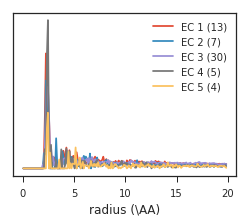

In [53]:
ionname = "NA"
atomname = "O"
fig = plt.figure(figsize=(4,3))
ax = fig.add_subplot(111)
b2 = b[:500]
for element,element2 in sorted(classifications.items()):
    print(element)
    element2 = element2.upper()
    bund = b2[[element2 in tre.categories["classification"] for tre in b2]]
    try:
        df, nummols = gee(bund,ionname,atomname=atomname)
        df["density"] = df["density"]/avgdensity[atomname]
        df.to_csv("g-"+element2+"-"+ionname+"-"+atomname)
        ax.plot(df['radius'], df['density'], label=element+' ('+str(nummols)+')')
    except:
        continue

ax.set_xlabel(r'radius (\AA)')
#     sns.despine(offset=10, ax=ax)
ax.axes.get_yaxis().set_visible(False)
#ax.set_ylabel('frequency')
ax.legend()
ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.pdf')
ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.png')
ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.eps')

In [52]:
def gee(bundle, ionname, atomname='O', binsize=.1, nummols=None):
    '''Gives the number density of atoms around an ion as a function of distance.
    :Arguments:
        *bundle*
            Bundle treants
        *ionname*
            String name of ion of interest
        *atomname*
            String name of coordinating atom of interest; default='O'
        *binsize*
            Float size of desired bins for histogram; default=.1
        *nummols*
            Float number of ions/molecules serving as centers contributing to df, number of files if None; default=None
    :Returns:
        *gdf*
            pd.DataFrame dataframe containing midpoints of bins and number density over bins
    '''
    frames = []
    for tre in bundle:
        for csv in tre.glob('coordination/'+ionname.upper()+'/'+atomname+'/*.csv'):
            df = pd.read_csv(csv.abspath)
            frames.append(df)

    dataframe = pd.concat(frames)

    if nummols is None:
        nummols = len(frames)

    h, e = np.histogram(dataframe['distance'], bins=np.arange(0, max(dataframe['distance']), binsize))
    m = .5 * (e[:-1] + e[1:])
    V = 4. / 3 * np.pi * (e[1:] ** 3 - e[:-1] ** 3)
    density = h / V / float(nummols)

    gdf = pd.DataFrame({'radius': m, 'density': density}, columns=['radius', 'density'])

    return gdf, nummols

In [ ]:
def gplots(ionatom):
    ionname = ionatom[0]
    atomname = ionatom[1]
    fig = plt.figure(figsize=(4,3))
    ax = fig.add_subplot(111)
    fig.set_tight_layout(True)

    for element,element2 in sorted(classifications.items()):
        if element == "EC 7":
            break
        print(element)
        element2 = element2.upper()
        bund = b[[element2 in tre.categories["classification"] for tre in b]]
        try:
            df, nummols = gee(bund,ionname,atomname=atomname)
            df["density"] = df["density"]/avgdensity[atomname]
            df.to_csv("g-"+element2+"-"+ionname+"-"+atomname)
            ax.plot(df['radius'], df['density'], label=element)
        except:
            continue

    #     sns.despine(offset=10, ax=ax)
    #ax.axes.get_yaxis().set_visible(False)
    #ax.set_ylabel('frequency')
    ax.set_xlabel(r"distance ($\mathrm{\AA}$)")
    ax.set_ylabel(r"$g(r)$")
    sns.despine(offset=10,ax=ax)
    ax.xaxis.set_minor_locator(MultipleLocator(5))
    ax.legend()
    ax.plot(df["radius"], np.array([1 for i in range(len(df["radius"]))]), color=(0,0,0), ls="dotted", alpha=.5)
    
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7.pdf')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7.png')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7.eps')
    ax.set_xlim(0,5)
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7-5.pdf')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7-5.png')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7-5.eps')
    print(element)
    element2 = element2.upper()
    bund = b[[element2 in tre.categories["classification"] for tre in b]]
    try:
        df, nummols = gee(bund,ionname,atomname=atomname)
        df["density"] = df["density"]/avgdensity[atomname]
        df.to_csv("g-"+element2+"-"+ionname+"-"+atomname)
        ax.plot(df['radius'], df['density'], label=element)
    except:
        pass
    ax.set_xlim(0,15)
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.pdf')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.png')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.eps')
    ax.set_xlim(0,5)
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-5.pdf')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-5.png')
    ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-5.eps')

EC 1


KeyboardInterrupt: 

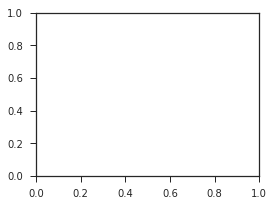

In [57]:
for ionatom in ionatoms:
    gplots(ionatom)

EC 1


KeyboardInterrupt: 

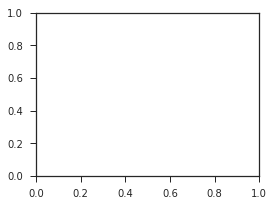

In [60]:
gplots(("LA", "O"))

In [ ]:
cl.restart()

In [ ]:
L = cl.map(gplots, ionatoms)

In [ ]:
print(sum([l.status == 'finished' for l in L]),
    sum([l.status == 'pending' for l in L]),
    sum([l.status == 'error' for l in L]),
    sum([l.status == 'lost' for l in L]), end='\n')

In [33]:
len(bund)

8219

In [24]:
b[:10].categories.any

{'AG_C_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AG_N_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AG_O_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AG_S_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AU_C_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AU_N_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AU_O_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'AU_S_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'BA_C_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'BA_N_coordnums': ['[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]',
  '[]'],
 'BA_O_coo

In [28]:
print(element2)

OXIDOREDUCTASE


In [18]:
import pdbionsurvey.coordination

NameError: name 'ATOMNAMES' is not defined

In [20]:
def dee(bundle, ionname, atomname='O', binsize=.1, nummols=None):
    '''Gives the number density of atoms around an ion as a function of distance.
    :Arguments:
        *bundle*
            Bundle treants
        *ionname*
            String name of ion of interest
        *atomname*
            String name of coordinating atom of interest; default='O'
        *binsize*
            Float size of desired bins for histogram; default=.1
        *nummols*
            Float number of ions/molecules serving as centers contributing to df, number of files if None; default=None
    :Returns:
        *gdf*
            pd.DataFrame dataframe containing midpoints of bins and number density over bins
    '''
    frames = []
    for tre in bundle:
        for csv in tre.glob('coordination/'+ionname.upper()+'/'+atomname+'/*.csv'):
            df = pd.read_csv(csv.abspath)
            frames.append(df)

    dataframe = pd.concat(frames)

    if nummols is None:
        nummols = len(frames)

    h, e = np.histogram(dataframe['distance'], bins=np.arange(0, max(dataframe['distance']), binsize))
    m = .5 * (e[:-1] + e[1:])
    V = 4. / 3 * np.pi * (e[1:] ** 3 - e[:-1] ** 3)
    density = h / V / float(nummols)

    gdf = pd.DataFrame({'radius': m, 'density': density}, columns=['radius', 'density'])

    return gdf

In [22]:
import seaborn as sns

In [59]:
PATH.abspath

'/nfs/homes4/kreidy/Projects/pdbsurvey/'

In [79]:
def allthegees(ionname):
    figall = plt.figure(figsize=(4,3))
    axall = figall.add_subplot(111)
    figall.set_tight_layout(True)

    axall.set_xlabel(r"distance ($\mathrm{\AA}$)")
    axall.set_ylabel(r"$g(r)$")
    sns.despine(offset=10,ax=axall)
    axall.xaxis.set_minor_locator(MultipleLocator(1))
    axall.xaxis.set_major_locator(MultipleLocator(5))

    for atomname in ATOMNAMES:
        fig = plt.figure(figsize=(4,3))
        ax = fig.add_subplot(111)
        fig.set_tight_layout(True)
        print(atomname)
        df = dee(b, ionname, atomname=atomname)
        df.to_csv(PATH.abspath+'csvs/d-'+ionname+'-'+atomname+'-10pmbins.csv')
        df['density'] = df['density']/avgdensity[atomname]
        df.to_csv(PATH.abspath+'csvs/g-'+ionname+'-'+atomname+'-10pmbins.csv')

        ax.set_xlabel(r"distance ($\mathrm{\AA}$)")
        ax.set_ylabel(r"$g(r)$")
        sns.despine(offset=10,ax=ax)
        ax.xaxis.set_minor_locator(MultipleLocator(1))
        ax.xaxis.set_major_locator(MultipleLocator(5))

        ax.plot(df["radius"], np.array([1 for i in range(len(df["radius"]))]), color=(0,0,0), ls="dotted", alpha=.5)

        ax.plot(df['radius'], df['density'])
        axall.plot(df['radius'], df['density'], label=atomname)
        ax.set_xlim(1,16)
        ax.figure.savefig(PATH.abspath+'images/g-'+ionname+'-'+atomname+'.pdf')
        ax.figure.savefig(PATH.abspath+'images/g-'+ionname+'-'+atomname+'.png')
        ax.figure.savefig(PATH.abspath+'images/g-'+ionname+'-'+atomname+'.eps')
        ax.set_xlim(1,6)
        ax.figure.savefig(PATH.abspath+'images/g-'+ionname+'-'+atomname+'-5.pdf')
        ax.figure.savefig(PATH.abspath+'images/g-'+ionname+'-'+atomname+'-5.png')
        ax.figure.savefig(PATH.abspath+'images/g-'+ionname+'-'+atomname+'-5.eps')

    axall.plot(df["radius"], np.array([1 for i in range(len(df["radius"]))]), color=(0,0,0), ls="dotted", alpha=.5)
    axall.legend()
    axall.set_xlim(1,16)
    axall.figure.savefig(PATH.abspath+'images/g-'+ionname+'.pdf')
    axall.figure.savefig(PATH.abspath+'images/g-'+ionname+'.png')
    axall.figure.savefig(PATH.abspath+'images/g-'+ionname+'.eps')
    axall.set_xlim(1,6)
    axall.figure.savefig(PATH.abspath+'images/g-'+ionname+'-5.pdf')
    axall.figure.savefig(PATH.abspath+'images/g-'+ionname+'-5.png')
    axall.figure.savefig(PATH.abspath+'images/g-'+ionname+'-5.eps')

O


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


N


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


S


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


C


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


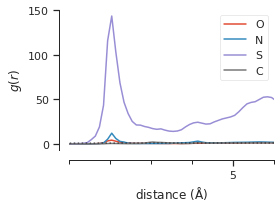

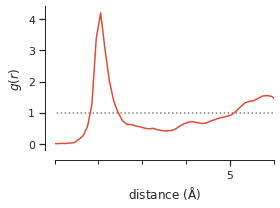

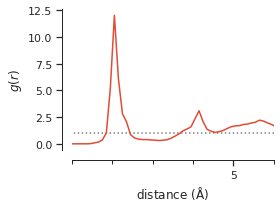

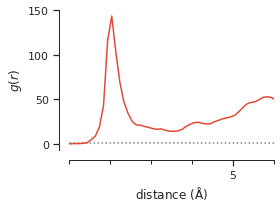

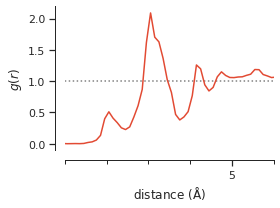

In [34]:
allthegees('ZN')

In [35]:
from distributed import Client

In [43]:
import time

In [36]:
cl = Client('tubiwan:8789')

In [93]:
cl.restart()

Client Scheduler: tcp://tubiwan:8789 Dashboard: http://tubiwan:8787/status,Cluster Workers: 12 Cores: 12 Memory: 20.17 GB


In [72]:
L = cl.map(allthegees, nowork)

In [75]:
while sum([l.status == 'pending' for l in L]) > 0:
    print(sum([l.status == 'finished' for l in L]),
          sum([l.status == 'pending' for l in L]),
          sum([l.status == 'error' for l in L]),
          sum([l.status == 'lost' for l in L]), end='\r')
    time.sleep(1)

KeyboardInterrupt: 

In [73]:
print(sum([l.status == 'finished' for l in L]),
      sum([l.status == 'pending' for l in L]),
      sum([l.status == 'error' for l in L]),
      sum([l.status == 'lost' for l in L]))

0 5 0 0


In [69]:
nowork = np.array(IONNAMES)[[l.status == 'error' for l in L]]

O


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


N


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


S


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


C


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


NA
O


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


N


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


S


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


C


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


CL
O


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


N


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


S


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


C


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


CA
O


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


N


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


S


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


C


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
<ipython-input-79-9dc3c7d5ee3a>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot int

ZN
O


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
<ipython-input-79-9dc3c7d5ee3a>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,3))


N


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
<ipython-input-79-9dc3c7d5ee3a>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,3))


S


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
<ipython-input-79-9dc3c7d5ee3a>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,3))


C


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


MG


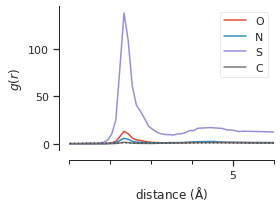

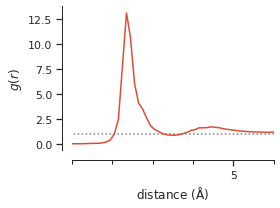

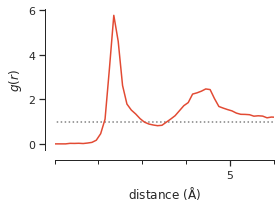

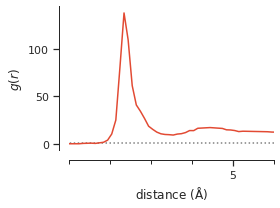

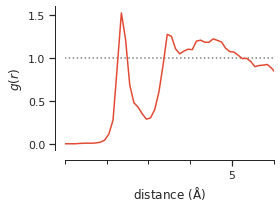

...

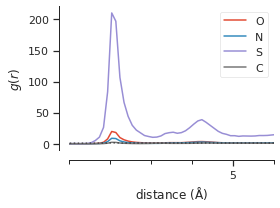

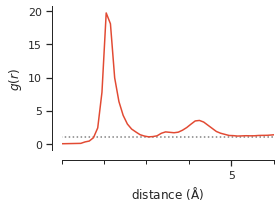

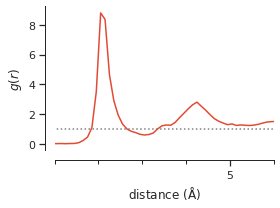

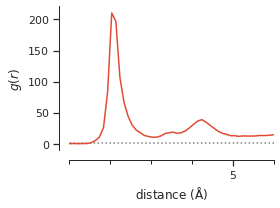

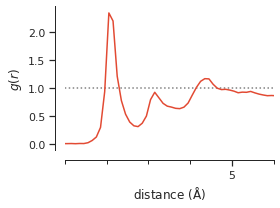

In [80]:
for ionname in nowork:
    allthegees(ionname)
    print(ionname)

In [58]:
outs = cl.gather(L)

FileNotFoundError: [Errno 2] No such file or directory: 'csvs/d-CD-O-10pmbins.csv'

In [82]:
import pdbionsurvey.collection
# import pdbionsurvey.analysis
import pdbionsurvey.coord_num
import pdbionsurvey.geesby
import pdbionsurvey.probability
import pdbionsurvey.bulkcoord

NameError: name 'ATOMNAMES' is not defined

In [85]:
def get_coord_num(ionname, atomname='O', bs=.1, mindistance=False, thres=.1):
    if not mindistance:
        df = pd.read_csv(csvpath.abspath+'d-'+ionname+'-'+atomname+'-'+str(int(bs*100))+'pmbins.csv')
    else:
        df = pd.read_csv(csvpath.abspath+'d-'+ionname+'-'+atomname+'-'+str(int(bs*100))+'pmbins-withmin.csv')
    locations = pd.read_csv(csvpath.abspath+'peaklocations-thres='+str(int(thres*10))+'.csv')
    heights = pd.read_csv(csvpath.abspath+'peakheights-thres='+str(int(thres*10))+'.csv')
    assert list(locations['ion/atom']).index("('{}', '{}')".format(ionname, atomname)) == list(heights['ion/atom']).index("('{}', '{}')".format(ionname, atomname))
    n = list(heights['ion/atom']).index("('{}', '{}')".format(ionname, atomname))
    m = max([heights['first max'][n], heights['second max'][n], heights['third max'][n]])
    if heights['first max'][n] == m and m > 0:
        rad = locations['first min'][n]
    elif heights['second max'][n] == m and m > 0:
        rad = locations['second min'][n]
    else:
        return None, None
    if not rad > 0:
        return None, None
    coordnum = 0
    for i in range(len(df)):
        if df['radius'][i] > rad:
            break
        else:
            mid = df['radius'][i]
            dm = df['radius'][1] - df['radius'][0]
            V = 4. / 3 * np.pi * ((mid+dm/2) ** 3 - (mid-dm/2) ** 3)
            d = df['density'][i]
            d *= V
            coordnum += d
    print(ionname, atomname, rad, coordnum)
    return rad, coordnum

In [86]:
rad, coordnum = get_coord_num('FE')

FileNotFoundError: [Errno 2] File /nfs/homes4/kreidy/Projects/pdbsurvey/csvs/peaklocations-thres=1.csv does not exist: '/nfs/homes4/kreidy/Projects/pdbsurvey/csvs/peaklocations-thres=1.csv'

In [91]:
def individualen(prot, ionname='FE', atomname='O', bs=.1, mindistance=True, ts=1):
    shellsize = shells['first min'][(IONNAME, ATOMNAME)]
    maxdistance = shellsize
    u = mda.Universe(prot[prot.name+'.pdb'].abspath)
    coordnums = []
    for csv in prot.glob('coordination/'+ionname.upper()+'/'+atomname+'/*.csv'):
        df = pd.read_csv(csv.abspath)
        try:
            gdf = df[df['distance'] < maxdistance]
            if mindistance:
                gdf = gdf[gdf['distance'] > .5]
            coordnum = len(gdf['distance'])
        except TypeError:
            coordnum = 'N/A'
            continue
        coordnums.append(coordnum)
        atomnum = csv.name[:-4]
        prot.categories['coordnum_'+atomnum] = coordnum
    prot.categories[IONNAME+'_'+ATOMNAME+'_coordnums'] = str(coordnums)
    return coordnums

In [90]:
def individualdee(prot, ionname='NA', atomname='O', bs=.1, mindistance=True, maxdistance=15, ts=1):
    u = mda.Universe(prot[prot.name+'.pdb'].abspath)
    ions = u.select_atoms('name '+ionname+' and resname '+ionname)
    for ion in ions:
        frames = []
        for csv in prot.glob('coordination/'+ionname.upper()+'/'+atomname+'/*.csv'):
            df = pd.read_csv(csv.abspath)
            frames.append(df)
        dataframe = pd.concat(frames)

        h, e = np.histogram(dataframe['distance'], bins=np.arange(0, max(dataframe['distance']), bs))
        m = .5 * (e[:-1] + e[1:])
        V = 4. / 3 * np.pi * (e[1:] ** 3 - e[:-1] ** 3)
        density = h / V

        gdf = pd.DataFrame({'radius': m, 'density': density}, columns=['radius', 'density'])

        gdf = gdf[gdf['radius'] < maxdistance]
        if not mindistance:
            gdf.to_csv(csvpath.abspath+'individual/d-'+prot.name+'-'+ionname.upper()+'-'+str(ion.resnum)+'-'+atomname+'-'+str(int(bs*100))+'pmbins.csv')
        else:
            mindistance = .5
            gdf['density'] = [gdf['density'][i] if gdf['radius'][i]>.5 else 0 for i in range(len(gdf['density']))]
            gdf.to_csv(csvpath.abspath+'individual/d-'+prot.name+'-'+ionname.upper()+'-'+str(ion.resnum)+'-'+atomname+'-'+str(int(bs*100))+'pmbins-withmin.csv')

In [99]:
def allindividualdee(prot):
    for ionname in IONNAMES:
        for atomname in ATOMNAMES:
            print(ionname, atomname)
            individualdee(prot, ionname=ionname, atomname=atomname)

In [107]:
cl.restart()

Client Scheduler: tcp://tubiwan:8789 Dashboard: http://tubiwan:8787/status,Cluster Workers: 10 Cores: 10 Memory: 16.81 GB


In [111]:
L = cl.map(allindividualdee, errs)

In [114]:
while sum([l.status == 'pending' for l in L]) > 0:
    print(sum([l.status == 'finished' for l in L]),
          sum([l.status == 'pending' for l in L]),
          sum([l.status == 'error' for l in L]),
          sum([l.status == 'lost' for l in L]), end='\r')
    time.sleep(1)

KeyboardInterrupt: 

In [109]:
errs = np.array(errs)[[l.status != 'finished' for l in L]]

In [118]:
def ecdist(ionname):
    bund = b[b.tags[ionname]]
    numtre = {}
    numion = {}
    for element,element2 in sorted(classifications.items()):
#         if element == "EC 7":
#             break
        print(element)
        element2 = element2.upper()
        bund = bund[[element2 in tre.categories["classification"] for tre in b]]
        numtre[element] = len(bund)
        numtre[element] = sum(bund.categories['num_'+ionname])
    return numtre, numion
#         try:
#             df, nummols = gee(bund,ionname,atomname=atomname)
#             df["density"] = df["density"]/avgdensity[atomname]
#             df.to_csv("g-"+element2+"-"+ionname+"-"+atomname)
#             ax.plot(df['radius'], df['density'], label=element)
#         except:
#             continue

#     #     sns.despine(offset=10, ax=ax)
#     #ax.axes.get_yaxis().set_visible(False)
#     #ax.set_ylabel('frequency')
#     ax.set_xlabel(r"distance ($\mathrm{\AA}$)")
#     ax.set_ylabel(r"$g(r)$")
#     sns.despine(offset=10,ax=ax)
#     ax.xaxis.set_minor_locator(MultipleLocator(5))
#     ax.legend()
#     ax.plot(df["radius"], np.array([1 for i in range(len(df["radius"]))]), color=(0,0,0), ls="dotted", alpha=.5)
    
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7.pdf')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7.png')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7.eps')
#     ax.set_xlim(0,5)
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7-5.pdf')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7-5.png')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-no7-5.eps')
#     print(element)
#     element2 = element2.upper()
#     bund = b[[element2 in tre.categories["classification"] for tre in b]]
#     try:
#         df, nummols = gee(bund,ionname,atomname=atomname)
#         df["density"] = df["density"]/avgdensity[atomname]
#         df.to_csv("g-"+element2+"-"+ionname+"-"+atomname)
#         ax.plot(df['radius'], df['density'], label=element)
#     except:
#         pass
#     ax.set_xlim(0,15)
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.pdf')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.png')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'.eps')
#     ax.set_xlim(0,5)
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-5.pdf')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-5.png')
#     ax.figure.savefig('g-byenzyme-'+ionname+'-'+atomname+'-5.eps')

In [ ]:
numtre, numion = ecdist('ZN')